In [1]:
%matplotlib inline
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
#.style.use(['dark_background'])

from fem import Fem
from atexpmesh import ArcTanExpMesh
from atplmesh import ArcTanPowerLawMesh
from source import StepSource

from symmetron import SymSolver
from physics import SymPhysics

import numpy as np
import scipy.optimize as sopt
from scipy.special import gamma


import matplotlib.tri as t

In [2]:
# common params
coupling = 'quadratic'
D = 3

mu = 1e0
M = 1e0
lam = 1e-1

In [3]:
num_rho = 100 # "ms" here is properly the source mass in natural units
num_perp = 75
extra_rho = 20

# geometric factor
g = np.pi**(D/2.) / gamma( D/2. + 1. )

log_rho_span = np.linspace(-15, 14, num_rho, endpoint=True ) \
                - np.log10(g)
# add a few more around resonance
extra_rho_span =np.linspace( -1., 1., extra_rho )
log_rho_span = np.append( log_rho_span, extra_rho_span )
log_rho_span = np.sort( log_rho_span )
    
log_perp_span = np.linspace(-13, 15, num_perp, endpoint=True )

log_rho_mg, log_perp_mg = np.meshgrid( log_rho_span, log_perp_span )

In [4]:
# constant rho line (FOR 3D): log(ms) - d*log(x0) = log(rho/g)
# where g is the geometric factor (volume of unit sphere)
# and perp line

log_x0_mg = ( log_perp_mg - D * log_rho_mg ) / (D**2 + 1.) 
log_ms_mg = ( D*log_perp_mg + log_rho_mg ) / (D**2 + 1.)

In [5]:
# keep indices where
# -3 < log(x0) < 1
# -3 < log(ms) < 3

mask_x0 = ( ( log_x0_mg < -3.5 ) | ( log_x0_mg > 1.5 ) )
mask_ms = abs(log_ms_mg) > 3.5
mask = ( mask_x0 | mask_ms )

Text(0.5,0,'x0')

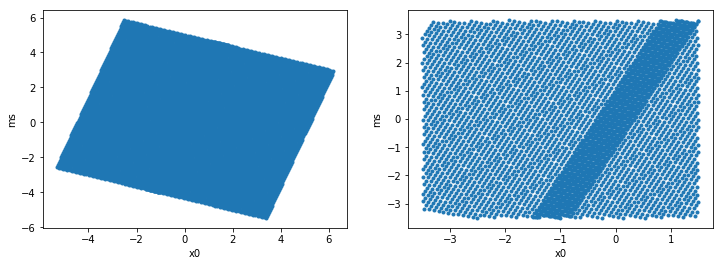

In [6]:
plt.figure(figsize=(12,4))

plt.subplot(121)
plt.scatter( log_x0_mg, log_ms_mg, marker='.' )
plt.ylabel('ms')
plt.xlabel('x0')

plt.subplot(122)
plt.scatter( log_x0_mg[~mask], log_ms_mg[~mask], marker='.' )
plt.ylabel('ms')
plt.xlabel('x0')

In [7]:
log_ms = np.ma.masked_where( mask, log_ms_mg )
log_x0 = np.ma.masked_where( mask, log_x0_mg )

In [8]:
# initialise arrays of quantities
phi_rs_array = np.zeros_like(log_ms)
grad_rs_array = np.zeros_like(log_ms)
max_grad_array = np.zeros_like(log_ms)
derrick1_array = np.zeros_like(log_ms)
derrick2_array = np.zeros_like(log_ms)
derrick3_array = np.zeros_like(log_ms)
derrick4_array = np.zeros_like(log_ms)
healing_array = np.zeros_like(log_ms)
Healing_array = np.zeros_like(log_ms)
oldcharges_array = np.zeros_like(log_ms)
newcharges_array = np.zeros_like(log_ms)

In [9]:
# giant loop on all the models
counter = 0
i_max, j_max = log_ms.shape

for i in range(i_max):
    for j in range(j_max):
        counter += 1
        
        # I use this instead of compressed to keep original indexing
        if mask[i,j]: continue
        
        x0 = 10.**log_x0[i,j]
        ms = 10.**log_ms[i,j]
        
        print 'Now solving ms = %10.2e\tx0 = %10.2e\n' % (ms,x0)
        
        # get source mass from dimensionless mass parametrisation
        if coupling=='quadratic':
            Ms=ms*mu**(2.-D)*M**2
        elif coupling=='linear':
            Ms=ms*mu**(3.-D)*M/np.sqrt(lam)
            
        # define overall physics object
        physics = SymPhysics( D, coupling, mu, lam, M,
                             Rs=x0/mu, Ms=Ms )
            
        # build mesh and source
        if x0 > 1. :
            mesh = ArcTanExpMesh( physics )
            fem = Fem( mesh, func_degree=3 )
            # more stringent tolerance is needed when x0>1
            abs_res_tol = 1e-15
        else:
            mesh = ArcTanPowerLawMesh( physics )
            fem = Fem( mesh )
            abs_res_tol = 1e-10
        source = StepSource( fem, physics )
        
        # solver
        p = SymSolver( fem, source, physics, 
                      abs_res_tol=abs_res_tol )
        p.solve()
        
        # evaluate radius for screening factors
        healing_array[i,j] = p.r_healing
        Healing_array[i,j] = p.r_healing * x0
        r_eval = 1e1 / x0
        
        vev = physics.Vev

        phi_rs_array[i,j] = p.Phi_rs / vev
        phi_eval = p.Phi(r_eval) / vev
        
        grad_rs_array[i,j] = p.grad_Phi_rs * x0 / (mu*vev)
        grad_eval = p.grad_Phi(r_eval) / (mu*vev)
        
        derrick1_array[i,j] = p.derrick[0]
        derrick2_array[i,j] = p.derrick[1]
        derrick3_array[i,j] = p.derrick[2]
        derrick4_array[i,j] = p.derrick[3]
        
        max_grad_array[i,j] = p.grad_Phi_max * x0/(mu*vev)
    
        p.old_analytics.compute_old_charge()
        p.compute_screening_factor()
        
        oldcharges_array[i,j] = p.old_analytics.old_charge(r_eval)
        newcharges_array[i,j] = p.screening_factor(r_eval)
        
        print '\n***************************************************'
        print '    Model %d of %d done' % ( counter, i_max*j_max )
        print '    (%.2f %%)' % (float(counter)/i_max/j_max*100.)
        print '***************************************************\n'

Now solving ms =   3.17e-04	x0 =   3.15e-03

Non-linear solver, iteration 0	abs_dphi = 2.0e-04	rel_dphi = 4.0e-04	abs_res = 5.0e-11 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)

***************************************************
    Model 88 of 9000 done
    (0.98 %)
***************************************************

Now solving ms =   3.39e-04	x0 =   2.58e-03

Non-linear solver, iteration 0	abs_dphi = 1.0e-04	rel_dphi = 2.0e-04	abs_res = 1.0e-10 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 9.3e-12	rel_dphi = 1.9e-11	abs_res = 1.1e-10 (tol = 1.0e-10)	rel_res = 1.1e+00 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 4.9e-17	rel_dphi = 9.9e-17	abs_res = 1.1e-10 (tol = 1.0e-10)	rel_res = 1.1e+00 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 8.8e-123	rel_dphi = 1.8e-122	abs_res = 1.1e-10 (tol = 1.0e-10)	rel_res = 1.1e+00 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 4.4e-246	rel_dphi = 8.8e-246	abs_res

Non-linear solver, iteration 0	abs_dphi = 1.3e-05	rel_dphi = 2.6e-05	abs_res = 9.4e-11 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)

***************************************************
    Model 92 of 9000 done
    (1.02 %)
***************************************************

Now solving ms =   4.43e-04	x0 =   1.15e-03

Non-linear solver, iteration 0	abs_dphi = 6.3e-06	rel_dphi = 1.3e-05	abs_res = 1.2e-10 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 6.5e-13	rel_dphi = 1.4e-12	abs_res = 1.0e-10 (tol = 1.0e-10)	rel_res = 8.5e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 6.7e-61	rel_dphi = 1.4e-60	abs_res = 1.0e-10 (tol = 1.0e-10)	rel_res = 8.5e-01 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 7.5e-122	rel_dphi = 1.6e-121	abs_res = 1.0e-10 (tol = 1.0e-10)	rel_res = 8.5e-01 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 9.5e-244	rel_dphi = 2.0e-243	abs_res = 1.0e-10 (tol = 1.0e-10)	rel_res = 8.5e-01 

Non-linear solver, iteration 0	abs_dphi = 7.9e-07	rel_dphi = 1.7e-06	abs_res = 8.9e-11 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)

***************************************************
    Model 96 of 9000 done
    (1.07 %)
***************************************************

Now solving ms =   5.81e-04	x0 =   5.10e-04

Non-linear solver, iteration 0	abs_dphi = 4.1e-07	rel_dphi = 9.0e-07	abs_res = 6.3e-11 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)

***************************************************
    Model 97 of 9000 done
    (1.08 %)
***************************************************

Now solving ms =   6.21e-04	x0 =   4.17e-04

Non-linear solver, iteration 0	abs_dphi = 2.2e-07	rel_dphi = 5.0e-07	abs_res = 6.5e-11 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)

***************************************************
    Model 98 of 9000 done
    (1.09 %)
***************************************************

Now solving ms =   6.65e-04	x0 =   3.40e-04

Non-linear solver, 

Non-linear solver, iteration 19	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.0e-10 (tol = 1.0e-10)	rel_res = 9.9e-01 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.0e-10 (tol = 1.0e-10)	rel_res = 9.9e-01 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.0e-10 (tol = 1.0e-10)	rel_res = 9.9e-01 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.0e-10 (tol = 1.0e-10)	rel_res = 9.9e-01 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.0e-10 (tol = 1.0e-10)	rel_res = 9.9e-01 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.0e-10 (tol = 1.0e-10)	rel_res = 9.9e-01 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.0e-10 (tol = 1.0e-10)	rel_res = 9.9e-01 (tol = 1.0e-20)
Non-linear solver, iteration 26	ab


***************************************************
    Model 330 of 9000 done
    (3.67 %)
***************************************************

Now solving ms =   6.54e-04	x0 =   2.05e-03

Non-linear solver, iteration 0	abs_dphi = 2.5e-05	rel_dphi = 5.1e-05	abs_res = 1.1e-10 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 3.2e-12	rel_dphi = 6.7e-12	abs_res = 7.9e-11 (tol = 1.0e-10)	rel_res = 7.3e-01 (tol = 1.0e-20)

***************************************************
    Model 331 of 9000 done
    (3.68 %)
***************************************************

Now solving ms =   6.99e-04	x0 =   1.67e-03

Non-linear solver, iteration 0	abs_dphi = 1.2e-05	rel_dphi = 2.5e-05	abs_res = 7.7e-11 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)

***************************************************
    Model 332 of 9000 done
    (3.69 %)
***************************************************

Now solving ms =   7.48e-04	x0 =   1.36e-03

Non-linear solve

Non-linear solver, iteration 1	abs_dphi = 2.5e-07	rel_dphi = 5.1e-07	abs_res = 6.8e-12 (tol = 1.0e-10)	rel_res = 7.6e-04 (tol = 1.0e-20)

***************************************************
    Model 438 of 9000 done
    (4.87 %)
***************************************************

Now solving ms =   3.78e-04	x0 =   2.53e-02

Non-linear solver, iteration 0	abs_dphi = 8.7e-02	rel_dphi = 1.8e-01	abs_res = 2.5e-09 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 6.0e-08	rel_dphi = 1.2e-07	abs_res = 5.7e-12 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)

***************************************************
    Model 439 of 9000 done
    (4.88 %)
***************************************************

Now solving ms =   4.04e-04	x0 =   2.07e-02

Non-linear solver, iteration 0	abs_dphi = 4.5e-02	rel_dphi = 9.1e-02	abs_res = 6.9e-10 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.5e-08	rel_dphi = 3.0e-08	a

Non-linear solver, iteration 1	abs_dphi = 2.0e+00	rel_dphi = 4.0e-01	abs_res = 3.1e+03 (tol = 1.0e-10)	rel_res = 2.9e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 1.3e+00	rel_dphi = 2.7e-01	abs_res = 8.6e+02 (tol = 1.0e-10)	rel_res = 8.2e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 8.7e-01	rel_dphi = 1.8e-01	abs_res = 2.1e+02 (tol = 1.0e-10)	rel_res = 2.0e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 5.4e-01	rel_dphi = 1.1e-01	abs_res = 3.9e+01 (tol = 1.0e-10)	rel_res = 3.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 2.2e-01	rel_dphi = 4.4e-02	abs_res = 3.2e+00 (tol = 1.0e-10)	rel_res = 3.1e-04 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 2.8e-02	rel_dphi = 5.7e-03	abs_res = 3.7e-02 (tol = 1.0e-10)	rel_res = 3.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 3.8e-04	rel_dphi = 7.7e-05	abs_res = 5.5e-06 (tol = 1.0e-10)	rel_res = 5.2e-10 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi =

Non-linear solver, iteration 0	abs_dphi = 4.2e-01	rel_dphi = 8.7e-01	abs_res = 6.3e-08 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 2.2e-06	rel_dphi = 4.5e-06	abs_res = 6.3e-12 (tol = 1.0e-10)	rel_res = 9.9e-05 (tol = 1.0e-20)

***************************************************
    Model 553 of 9000 done
    (6.14 %)
***************************************************

Now solving ms =   4.29e-04	x0 =   4.14e-02

Non-linear solver, iteration 0	abs_dphi = 3.3e-01	rel_dphi = 6.9e-01	abs_res = 4.1e-08 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.4e-06	rel_dphi = 2.8e-06	abs_res = 8.7e-12 (tol = 1.0e-10)	rel_res = 2.1e-04 (tol = 1.0e-20)

***************************************************
    Model 554 of 9000 done
    (6.16 %)
***************************************************

Now solving ms =   4.30e-04	x0 =   4.12e-02

Non-linear solver, iteration 0	abs_dphi = 3.3e-01	rel_dphi = 6.8e-01	a


***************************************************
    Model 574 of 9000 done
    (6.38 %)
***************************************************

Now solving ms =   1.44e-03	x0 =   1.08e-03

Non-linear solver, iteration 0	abs_dphi = 1.5e-06	rel_dphi = 3.5e-06	abs_res = 8.6e-11 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)

***************************************************
    Model 575 of 9000 done
    (6.39 %)
***************************************************

Now solving ms =   1.54e-03	x0 =   8.85e-04

Non-linear solver, iteration 0	abs_dphi = 8.2e-07	rel_dphi = 1.9e-06	abs_res = 6.1e-11 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)

***************************************************
    Model 576 of 9000 done
    (6.40 %)
***************************************************

Now solving ms =   1.65e-03	x0 =   7.23e-04

Non-linear solver, iteration 0	abs_dphi = 4.7e-07	rel_dphi = 1.1e-06	abs_res = 6.8e-11 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)

***************


***************************************************
    Model 653 of 9000 done
    (7.26 %)
***************************************************

Now solving ms =   3.88e-04	x0 =   1.34e-01

Non-linear solver, iteration 0	abs_dphi = 1.3e-02	rel_dphi = 2.9e-02	abs_res = 5.3e-11 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)

***************************************************
    Model 654 of 9000 done
    (7.27 %)
***************************************************

Now solving ms =   3.97e-04	x0 =   1.24e-01

Non-linear solver, iteration 0	abs_dphi = 1.6e-02	rel_dphi = 3.7e-02	abs_res = 9.1e-11 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)

***************************************************
    Model 655 of 9000 done
    (7.28 %)
***************************************************

Now solving ms =   3.97e-04	x0 =   1.24e-01

Non-linear solver, iteration 0	abs_dphi = 1.6e-02	rel_dphi = 3.7e-02	abs_res = 9.2e-11 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)

***************

Non-linear solver, iteration 1	abs_dphi = 2.9e-06	rel_dphi = 6.1e-06	abs_res = 6.8e-12 (tol = 1.0e-10)	rel_res = 8.8e-05 (tol = 1.0e-20)

***************************************************
    Model 672 of 9000 done
    (7.47 %)
***************************************************

Now solving ms =   5.44e-04	x0 =   4.83e-02

Non-linear solver, iteration 0	abs_dphi = 4.1e-01	rel_dphi = 8.7e-01	abs_res = 8.2e-08 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 3.0e-06	rel_dphi = 6.2e-06	abs_res = 5.6e-12 (tol = 1.0e-10)	rel_res = 6.9e-05 (tol = 1.0e-20)

***************************************************
    Model 673 of 9000 done
    (7.48 %)
***************************************************

Now solving ms =   5.57e-04	x0 =   4.51e-02

Non-linear solver, iteration 0	abs_dphi = 3.3e-01	rel_dphi = 6.9e-01	abs_res = 5.3e-08 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.9e-06	rel_dphi = 3.9e-06	a

Non-linear solver, iteration 6	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.2e-10 (tol = 1.0e-10)	rel_res = 1.1e+00 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.2e-10 (tol = 1.0e-10)	rel_res = 1.1e+00 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.2e-10 (tol = 1.0e-10)	rel_res = 1.1e+00 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.2e-10 (tol = 1.0e-10)	rel_res = 1.1e+00 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.2e-10 (tol = 1.0e-10)	rel_res = 1.1e+00 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.2e-10 (tol = 1.0e-10)	rel_res = 1.1e+00 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.2e-10 (tol = 1.0e-10)	rel_res = 1.1e+00 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dp

Non-linear solver, iteration 8	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.0e-10 (tol = 1.0e-10)	rel_res = 8.7e-01 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.0e-10 (tol = 1.0e-10)	rel_res = 8.7e-01 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.0e-10 (tol = 1.0e-10)	rel_res = 8.7e-01 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.0e-10 (tol = 1.0e-10)	rel_res = 8.7e-01 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.0e-10 (tol = 1.0e-10)	rel_res = 8.7e-01 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.0e-10 (tol = 1.0e-10)	rel_res = 8.7e-01 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.0e-10 (tol = 1.0e-10)	rel_res = 8.7e-01 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_

Non-linear solver, iteration 0	abs_dphi = 3.4e+00	rel_dphi = 6.0e-01	abs_res = 6.5e+03 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 2.3e+00	rel_dphi = 4.0e-01	abs_res = 1.9e+03 (tol = 1.0e-10)	rel_res = 2.9e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 1.5e+00	rel_dphi = 2.7e-01	abs_res = 5.3e+02 (tol = 1.0e-10)	rel_res = 8.1e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 1.0e+00	rel_dphi = 1.8e-01	abs_res = 1.3e+02 (tol = 1.0e-10)	rel_res = 2.0e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 6.1e-01	rel_dphi = 1.1e-01	abs_res = 2.2e+01 (tol = 1.0e-10)	rel_res = 3.4e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 2.3e-01	rel_dphi = 4.0e-02	abs_res = 1.6e+00 (tol = 1.0e-10)	rel_res = 2.5e-04 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 2.5e-02	rel_dphi = 4.4e-03	abs_res = 1.3e-02 (tol = 1.0e-10)	rel_res = 2.0e-06 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi =

Non-linear solver, iteration 0	abs_dphi = 9.6e-03	rel_dphi = 2.2e-02	abs_res = 3.9e-11 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)

***************************************************
    Model 773 of 9000 done
    (8.59 %)
***************************************************

Now solving ms =   5.04e-04	x0 =   1.46e-01

Non-linear solver, iteration 0	abs_dphi = 1.2e-02	rel_dphi = 2.8e-02	abs_res = 6.7e-11 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)

***************************************************
    Model 774 of 9000 done
    (8.60 %)
***************************************************

Now solving ms =   5.16e-04	x0 =   1.36e-01

Non-linear solver, iteration 0	abs_dphi = 1.6e-02	rel_dphi = 3.6e-02	abs_res = 1.1e-10 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 7.5e-09	rel_dphi = 1.7e-08	abs_res = 4.7e-12 (tol = 1.0e-10)	rel_res = 4.1e-02 (tol = 1.0e-20)

***************************************************
    Model 775 of 

Non-linear solver, iteration 1	abs_dphi = 2.3e-06	rel_dphi = 4.9e-06	abs_res = 4.6e-12 (tol = 1.0e-10)	rel_res = 8.3e-05 (tol = 1.0e-20)

***************************************************
    Model 791 of 9000 done
    (8.79 %)
***************************************************

Now solving ms =   6.90e-04	x0 =   5.67e-02

Non-linear solver, iteration 0	abs_dphi = 4.0e-01	rel_dphi = 8.5e-01	abs_res = 9.9e-08 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 3.9e-06	rel_dphi = 8.3e-06	abs_res = 5.2e-12 (tol = 1.0e-10)	rel_res = 5.2e-05 (tol = 1.0e-20)

***************************************************
    Model 792 of 9000 done
    (8.80 %)
***************************************************

Now solving ms =   7.07e-04	x0 =   5.27e-02

Non-linear solver, iteration 0	abs_dphi = 4.1e-01	rel_dphi = 8.7e-01	abs_res = 1.1e-07 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 4.0e-06	rel_dphi = 8.4e-06	a


***************************************************
    Model 811 of 9000 done
    (9.01 %)
***************************************************

Now solving ms =   1.99e-03	x0 =   2.37e-03

Non-linear solver, iteration 0	abs_dphi = 1.1e-05	rel_dphi = 2.4e-05	abs_res = 1.1e-10 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.2e-11	rel_dphi = 2.5e-11	abs_res = 8.2e-11 (tol = 1.0e-10)	rel_res = 7.3e-01 (tol = 1.0e-20)

***************************************************
    Model 812 of 9000 done
    (9.02 %)
***************************************************

Now solving ms =   2.13e-03	x0 =   1.93e-03

Non-linear solver, iteration 0	abs_dphi = 5.7e-06	rel_dphi = 1.3e-05	abs_res = 7.8e-11 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)

***************************************************
    Model 813 of 9000 done
    (9.03 %)
***************************************************

Now solving ms =   2.28e-03	x0 =   1.58e-03

Non-linear solve

Non-linear solver, iteration 0	abs_dphi = 1.0e-06	rel_dphi = 6.7e-06	abs_res = 8.0e-14 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 9.1e-14	rel_dphi = 5.9e-13	abs_res = 4.9e-14 (tol = 1.0e-15)	rel_res = 6.1e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 1.2e-62	rel_dphi = 7.8e-62	abs_res = 4.9e-14 (tol = 1.0e-15)	rel_res = 6.1e-01 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.9e-14 (tol = 1.0e-15)	rel_res = 6.1e-01 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.9e-14 (tol = 1.0e-15)	rel_res = 6.1e-01 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.9e-14 (tol = 1.0e-15)	rel_res = 6.1e-01 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.9e-14 (tol = 1.0e-15)	rel_res = 6.1e-01 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi =

Non-linear solver, iteration 7	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 7.7e-14 (tol = 1.0e-15)	rel_res = 9.3e-01 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 7.7e-14 (tol = 1.0e-15)	rel_res = 9.3e-01 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 7.7e-14 (tol = 1.0e-15)	rel_res = 9.3e-01 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 7.7e-14 (tol = 1.0e-15)	rel_res = 9.3e-01 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 7.7e-14 (tol = 1.0e-15)	rel_res = 9.3e-01 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 7.7e-14 (tol = 1.0e-15)	rel_res = 9.3e-01 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 7.7e-14 (tol = 1.0e-15)	rel_res = 9.3e-01 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_d

Non-linear solver, iteration 0	abs_dphi = 1.7e-03	rel_dphi = 4.5e-03	abs_res = 4.5e-12 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)

***************************************************
    Model 889 of 9000 done
    (9.88 %)
***************************************************

Now solving ms =   5.86e-04	x0 =   2.22e-01

Non-linear solver, iteration 0	abs_dphi = 3.7e-03	rel_dphi = 9.1e-03	abs_res = 6.7e-12 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)

***************************************************
    Model 890 of 9000 done
    (9.89 %)
***************************************************

Now solving ms =   6.23e-04	x0 =   1.84e-01

Non-linear solver, iteration 0	abs_dphi = 7.2e-03	rel_dphi = 1.7e-02	abs_res = 2.8e-11 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)

***************************************************
    Model 891 of 9000 done
    (9.90 %)
***************************************************

Now solving ms =   6.27e-04	x0 =   1.81e-01

Non-linear solve


***************************************************
    Model 908 of 9000 done
    (10.09 %)
***************************************************

Now solving ms =   8.54e-04	x0 =   7.15e-02

Non-linear solver, iteration 0	abs_dphi = 2.2e-01	rel_dphi = 4.7e-01	abs_res = 3.6e-08 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.6e-06	rel_dphi = 3.5e-06	abs_res = 5.9e-12 (tol = 1.0e-10)	rel_res = 1.7e-04 (tol = 1.0e-20)

***************************************************
    Model 909 of 9000 done
    (10.10 %)
***************************************************

Now solving ms =   8.75e-04	x0 =   6.65e-02

Non-linear solver, iteration 0	abs_dphi = 2.9e-01	rel_dphi = 6.2e-01	abs_res = 6.6e-08 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 2.9e-06	rel_dphi = 6.1e-06	abs_res = 5.7e-12 (tol = 1.0e-10)	rel_res = 8.6e-05 (tol = 1.0e-20)

***************************************************
    Model 910 o

Non-linear solver, iteration 0	abs_dphi = 1.8e-04	rel_dphi = 3.8e-04	abs_res = 5.5e-12 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)

***************************************************
    Model 928 of 9000 done
    (10.31 %)
***************************************************

Now solving ms =   2.11e-03	x0 =   4.74e-03

Non-linear solver, iteration 0	abs_dphi = 9.1e-05	rel_dphi = 1.9e-04	abs_res = 6.2e-12 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)

***************************************************
    Model 929 of 9000 done
    (10.32 %)
***************************************************

Now solving ms =   2.26e-03	x0 =   3.87e-03

Non-linear solver, iteration 0	abs_dphi = 4.5e-05	rel_dphi = 9.5e-05	abs_res = 6.4e-12 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)

***************************************************
    Model 930 of 9000 done
    (10.33 %)
***************************************************

Now solving ms =   2.41e-03	x0 =   3.16e-03

Non-linear so


***************************************************
    Model 939 of 9000 done
    (10.43 %)
***************************************************

Now solving ms =   4.43e-03	x0 =   5.12e-04

Non-linear solver, iteration 0	abs_dphi = 1.5e+00	rel_dphi = 5.9e-01	abs_res = 4.2e+03 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.0e+00	rel_dphi = 4.0e-01	abs_res = 1.2e+03 (tol = 1.0e-10)	rel_res = 2.9e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 6.8e-01	rel_dphi = 2.6e-01	abs_res = 3.5e+02 (tol = 1.0e-10)	rel_res = 8.3e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 4.5e-01	rel_dphi = 1.8e-01	abs_res = 8.7e+01 (tol = 1.0e-10)	rel_res = 2.1e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 2.8e-01	rel_dphi = 1.1e-01	abs_res = 1.6e+01 (tol = 1.0e-10)	rel_res = 3.9e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 1.2e-01	rel_dphi = 4.7e-02	abs_res = 1.5e+00 (tol = 1.0e-10)	rel_res = 3.6e-04 (t

Non-linear solver, iteration 43	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.4e-14 (tol = 1.0e-15)	rel_res = 8.6e-01 (tol = 1.0e-20)
Non-linear solver, iteration 44	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.4e-14 (tol = 1.0e-15)	rel_res = 8.6e-01 (tol = 1.0e-20)
Non-linear solver, iteration 45	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.4e-14 (tol = 1.0e-15)	rel_res = 8.6e-01 (tol = 1.0e-20)
Non-linear solver, iteration 46	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.4e-14 (tol = 1.0e-15)	rel_res = 8.6e-01 (tol = 1.0e-20)
Non-linear solver, iteration 47	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.4e-14 (tol = 1.0e-15)	rel_res = 8.6e-01 (tol = 1.0e-20)
Non-linear solver, iteration 48	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.4e-14 (tol = 1.0e-15)	rel_res = 8.6e-01 (tol = 1.0e-20)
Non-linear solver, iteration 49	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.4e-14 (tol = 1.0e-15)	rel_res = 8.6e-01 (tol = 1.0e-20)
**********************************


***************************************************
    Model 998 of 9000 done
    (11.09 %)
***************************************************

Now solving ms =   3.62e-04	x0 =   2.24e+00

Non-linear solver, iteration 0	abs_dphi = 7.0e-08	rel_dphi = 8.5e-07	abs_res = 2.5e-14 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.2e-14	rel_dphi = 1.4e-13	abs_res = 2.9e-14 (tol = 1.0e-15)	rel_res = 1.2e+00 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 8.0e-59	rel_dphi = 9.7e-58	abs_res = 2.9e-14 (tol = 1.0e-15)	rel_res = 1.2e+00 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 3.9e-121	rel_dphi = 4.7e-120	abs_res = 2.9e-14 (tol = 1.0e-15)	rel_res = 1.2e+00 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.9e-14 (tol = 1.0e-15)	rel_res = 1.2e+00 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.9e-14 (tol = 1.0e-15)	rel_res = 1.2e+00 

Non-linear solver, iteration 5	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.3e-14 (tol = 1.0e-15)	rel_res = 9.6e-01 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.3e-14 (tol = 1.0e-15)	rel_res = 9.6e-01 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.3e-14 (tol = 1.0e-15)	rel_res = 9.6e-01 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.3e-14 (tol = 1.0e-15)	rel_res = 9.6e-01 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.3e-14 (tol = 1.0e-15)	rel_res = 9.6e-01 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.3e-14 (tol = 1.0e-15)	rel_res = 9.6e-01 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.3e-14 (tol = 1.0e-15)	rel_res = 9.6e-01 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dph

Non-linear solver, iteration 12	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.9e-14 (tol = 1.0e-15)	rel_res = 9.8e-01 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.9e-14 (tol = 1.0e-15)	rel_res = 9.8e-01 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.9e-14 (tol = 1.0e-15)	rel_res = 9.8e-01 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.9e-14 (tol = 1.0e-15)	rel_res = 9.8e-01 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.9e-14 (tol = 1.0e-15)	rel_res = 9.8e-01 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.9e-14 (tol = 1.0e-15)	rel_res = 9.8e-01 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.9e-14 (tol = 1.0e-15)	rel_res = 9.8e-01 (tol = 1.0e-20)
Non-linear solver, iteration 19	ab

Non-linear solver, iteration 19	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 7.3e-14 (tol = 1.0e-15)	rel_res = 1.4e+00 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 7.3e-14 (tol = 1.0e-15)	rel_res = 1.4e+00 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 7.3e-14 (tol = 1.0e-15)	rel_res = 1.4e+00 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 7.3e-14 (tol = 1.0e-15)	rel_res = 1.4e+00 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 7.3e-14 (tol = 1.0e-15)	rel_res = 1.4e+00 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 7.3e-14 (tol = 1.0e-15)	rel_res = 1.4e+00 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 7.3e-14 (tol = 1.0e-15)	rel_res = 1.4e+00 (tol = 1.0e-20)
Non-linear solver, iteration 26	ab

Non-linear solver, iteration 0	abs_dphi = 1.2e-02	rel_dphi = 2.8e-02	abs_res = 1.0e-10 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 7.6e-09	rel_dphi = 1.8e-08	abs_res = 5.7e-12 (tol = 1.0e-10)	rel_res = 5.5e-02 (tol = 1.0e-20)

***************************************************
    Model 1014 of 9000 done
    (11.27 %)
***************************************************

Now solving ms =   8.70e-04	x0 =   1.61e-01

Non-linear solver, iteration 0	abs_dphi = 1.6e-02	rel_dphi = 3.6e-02	abs_res = 1.8e-10 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.3e-08	rel_dphi = 3.0e-08	abs_res = 5.3e-12 (tol = 1.0e-10)	rel_res = 2.9e-02 (tol = 1.0e-20)

***************************************************
    Model 1015 of 9000 done
    (11.28 %)
***************************************************

Now solving ms =   8.71e-04	x0 =   1.61e-01

Non-linear solver, iteration 0	abs_dphi = 1.6e-02	rel_dphi = 3.6e-


***************************************************
    Model 1031 of 9000 done
    (11.46 %)
***************************************************

Now solving ms =   1.16e-03	x0 =   6.75e-02

Non-linear solver, iteration 0	abs_dphi = 4.0e-01	rel_dphi = 8.5e-01	abs_res = 1.6e-07 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 7.2e-06	rel_dphi = 1.5e-05	abs_res = 7.0e-12 (tol = 1.0e-10)	rel_res = 4.3e-05 (tol = 1.0e-20)

***************************************************
    Model 1032 of 9000 done
    (11.47 %)
***************************************************

Now solving ms =   1.19e-03	x0 =   6.27e-02

Non-linear solver, iteration 0	abs_dphi = 4.1e-01	rel_dphi = 8.7e-01	abs_res = 1.7e-07 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 7.3e-06	rel_dphi = 1.6e-05	abs_res = 6.6e-12 (tol = 1.0e-10)	rel_res = 3.8e-05 (tol = 1.0e-20)

***************************************************
    Model 103

Non-linear solver, iteration 0	abs_dphi = 1.1e-05	rel_dphi = 2.5e-05	abs_res = 7.5e-11 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)

***************************************************
    Model 1052 of 9000 done
    (11.69 %)
***************************************************

Now solving ms =   3.59e-03	x0 =   2.30e-03

Non-linear solver, iteration 0	abs_dphi = 5.7e-06	rel_dphi = 1.3e-05	abs_res = 7.4e-11 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)

***************************************************
    Model 1053 of 9000 done
    (11.70 %)
***************************************************

Now solving ms =   3.84e-03	x0 =   1.88e-03

Non-linear solver, iteration 0	abs_dphi = 3.1e-06	rel_dphi = 7.4e-06	abs_res = 6.4e-11 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)

***************************************************
    Model 1054 of 9000 done
    (11.71 %)
***************************************************

Now solving ms =   4.11e-03	x0 =   1.54e-03

Non-linear

Non-linear solver, iteration 8	abs_dphi = 6.7e-08	rel_dphi = 2.4e-08	abs_res = 4.9e-11 (tol = 1.0e-10)	rel_res = 1.4e-14 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 1059 of 9000 done
    (11.77 %)
***************************************************

Now solving ms =   5.75e-03	x0 =   5.58e-04

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 3.6e-02	rel_dphi = 1.5e-01	abs_res = 6.6e-02 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.3e-03	rel_dphi = 5.4e-03	abs_res = 6.7e-05 (tol = 1.0e-10)	rel_res = 1.0e-03 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 1.5e-06	rel_dphi = 6.2e-06	abs_res = 8.7e-11 (tol = 1.0e-10)	rel_res = 1.3e-09 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Mode

Non-linear solver, iteration 37	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.8e-15 (tol = 1.0e-15)	rel_res = 9.7e-01 (tol = 1.0e-20)
Non-linear solver, iteration 38	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.8e-15 (tol = 1.0e-15)	rel_res = 9.7e-01 (tol = 1.0e-20)
Non-linear solver, iteration 39	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.8e-15 (tol = 1.0e-15)	rel_res = 9.7e-01 (tol = 1.0e-20)
Non-linear solver, iteration 40	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.8e-15 (tol = 1.0e-15)	rel_res = 9.7e-01 (tol = 1.0e-20)
Non-linear solver, iteration 41	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.8e-15 (tol = 1.0e-15)	rel_res = 9.7e-01 (tol = 1.0e-20)
Non-linear solver, iteration 42	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.8e-15 (tol = 1.0e-15)	rel_res = 9.7e-01 (tol = 1.0e-20)
Non-linear solver, iteration 43	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.8e-15 (tol = 1.0e-15)	rel_res = 9.7e-01 (tol = 1.0e-20)
Non-linear solver, iteration 44	ab

Non-linear solver, iteration 43	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 7.8e-15 (tol = 1.0e-15)	rel_res = 1.3e+00 (tol = 1.0e-20)
Non-linear solver, iteration 44	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 7.8e-15 (tol = 1.0e-15)	rel_res = 1.3e+00 (tol = 1.0e-20)
Non-linear solver, iteration 45	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 7.8e-15 (tol = 1.0e-15)	rel_res = 1.3e+00 (tol = 1.0e-20)
Non-linear solver, iteration 46	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 7.8e-15 (tol = 1.0e-15)	rel_res = 1.3e+00 (tol = 1.0e-20)
Non-linear solver, iteration 47	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 7.8e-15 (tol = 1.0e-15)	rel_res = 1.3e+00 (tol = 1.0e-20)
Non-linear solver, iteration 48	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 7.8e-15 (tol = 1.0e-15)	rel_res = 1.3e+00 (tol = 1.0e-20)
Non-linear solver, iteration 49	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 7.8e-15 (tol = 1.0e-15)	rel_res = 1.3e+00 (tol = 1.0e-20)
**********************************

Non-linear solver, iteration 49	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 8.8e-15 (tol = 1.0e-15)	rel_res = 7.1e-01 (tol = 1.0e-20)
*******************************************************************************
*******************************************************************************
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 1116 of 9000 done
    (12.40 %)
***************************************************

Now solving ms =   4.11e-04	x0 =   3.66e+00

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 5.4e-09	rel_dphi = 1.5e-07	abs_res = 1.8e-14 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 4.8e-15	rel_dphi = 1.3e-13	abs_res = 1.4e-14 (tol = 1.0e-15)	rel_res = 7.5e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 1.0e-59	rel_dphi = 2.8e-58	abs_res = 1.4e-14 (tol = 1.0e-15)	

Non-linear solver, iteration 1	abs_dphi = 6.5e-15	rel_dphi = 1.2e-13	abs_res = 2.1e-14 (tol = 1.0e-15)	rel_res = 1.2e+00 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 2.4e-59	rel_dphi = 4.7e-58	abs_res = 2.1e-14 (tol = 1.0e-15)	rel_res = 1.2e+00 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 2.9e-122	rel_dphi = 5.5e-121	abs_res = 2.1e-14 (tol = 1.0e-15)	rel_res = 1.2e+00 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.1e-14 (tol = 1.0e-15)	rel_res = 1.2e+00 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.1e-14 (tol = 1.0e-15)	rel_res = 1.2e+00 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.1e-14 (tol = 1.0e-15)	rel_res = 1.2e+00 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.1e-14 (tol = 1.0e-15)	rel_res = 1.2e+00 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi

Non-linear solver, iteration 7	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.1e-14 (tol = 1.0e-15)	rel_res = 8.6e-01 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.1e-14 (tol = 1.0e-15)	rel_res = 8.6e-01 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.1e-14 (tol = 1.0e-15)	rel_res = 8.6e-01 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.1e-14 (tol = 1.0e-15)	rel_res = 8.6e-01 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.1e-14 (tol = 1.0e-15)	rel_res = 8.6e-01 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.1e-14 (tol = 1.0e-15)	rel_res = 8.6e-01 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.1e-14 (tol = 1.0e-15)	rel_res = 8.6e-01 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_d

Non-linear solver, iteration 13	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.8e-14 (tol = 1.0e-15)	rel_res = 8.9e-01 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.8e-14 (tol = 1.0e-15)	rel_res = 8.9e-01 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.8e-14 (tol = 1.0e-15)	rel_res = 8.9e-01 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.8e-14 (tol = 1.0e-15)	rel_res = 8.9e-01 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.8e-14 (tol = 1.0e-15)	rel_res = 8.9e-01 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.8e-14 (tol = 1.0e-15)	rel_res = 8.9e-01 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.8e-14 (tol = 1.0e-15)	rel_res = 8.9e-01 (tol = 1.0e-20)
Non-linear solver, iteration 20	ab

Non-linear solver, iteration 19	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.0e-14 (tol = 1.0e-15)	rel_res = 9.2e-01 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.0e-14 (tol = 1.0e-15)	rel_res = 9.2e-01 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.0e-14 (tol = 1.0e-15)	rel_res = 9.2e-01 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.0e-14 (tol = 1.0e-15)	rel_res = 9.2e-01 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.0e-14 (tol = 1.0e-15)	rel_res = 9.2e-01 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.0e-14 (tol = 1.0e-15)	rel_res = 9.2e-01 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.0e-14 (tol = 1.0e-15)	rel_res = 9.2e-01 (tol = 1.0e-20)
Non-linear solver, iteration 26	ab

Non-linear solver, iteration 25	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.3e-14 (tol = 1.0e-15)	rel_res = 1.1e+00 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.3e-14 (tol = 1.0e-15)	rel_res = 1.1e+00 (tol = 1.0e-20)
Non-linear solver, iteration 27	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.3e-14 (tol = 1.0e-15)	rel_res = 1.1e+00 (tol = 1.0e-20)
Non-linear solver, iteration 28	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.3e-14 (tol = 1.0e-15)	rel_res = 1.1e+00 (tol = 1.0e-20)
Non-linear solver, iteration 29	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.3e-14 (tol = 1.0e-15)	rel_res = 1.1e+00 (tol = 1.0e-20)
Non-linear solver, iteration 30	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.3e-14 (tol = 1.0e-15)	rel_res = 1.1e+00 (tol = 1.0e-20)
Non-linear solver, iteration 31	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.3e-14 (tol = 1.0e-15)	rel_res = 1.1e+00 (tol = 1.0e-20)
Non-linear solver, iteration 32	ab

Non-linear solver, iteration 31	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.9e-14 (tol = 1.0e-15)	rel_res = 9.5e-01 (tol = 1.0e-20)
Non-linear solver, iteration 32	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.9e-14 (tol = 1.0e-15)	rel_res = 9.5e-01 (tol = 1.0e-20)
Non-linear solver, iteration 33	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.9e-14 (tol = 1.0e-15)	rel_res = 9.5e-01 (tol = 1.0e-20)
Non-linear solver, iteration 34	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.9e-14 (tol = 1.0e-15)	rel_res = 9.5e-01 (tol = 1.0e-20)
Non-linear solver, iteration 35	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.9e-14 (tol = 1.0e-15)	rel_res = 9.5e-01 (tol = 1.0e-20)
Non-linear solver, iteration 36	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.9e-14 (tol = 1.0e-15)	rel_res = 9.5e-01 (tol = 1.0e-20)
Non-linear solver, iteration 37	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.9e-14 (tol = 1.0e-15)	rel_res = 9.5e-01 (tol = 1.0e-20)
Non-linear solver, iteration 38	ab

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 1.5e-02	rel_dphi = 3.6e-02	abs_res = 2.2e-10 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.7e-08	rel_dphi = 3.9e-08	abs_res = 6.2e-12 (tol = 1.0e-10)	rel_res = 2.8e-02 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 1135 of 9000 done
    (12.61 %)
***************************************************

Now solving ms =   1.13e-03	x0 =   1.76e-01

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 1.5e-02	rel_dphi = 3.6e-02	abs_res = 2.2e-10 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.7e-08	rel_dphi = 3.9e-08	abs_res = 7.7e-12 (tol = 1.0e-10)	rel_res = 3.4e-02 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some t


***************************************************
    Model 1148 of 9000 done
    (12.76 %)
***************************************************

Now solving ms =   1.44e-03	x0 =   8.51e-02

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 2.1e-01	rel_dphi = 4.7e-01	abs_res = 5.8e-08 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 2.9e-06	rel_dphi = 6.3e-06	abs_res = 7.3e-12 (tol = 1.0e-10)	rel_res = 1.3e-04 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 1149 of 9000 done
    (12.77 %)
***************************************************

Now solving ms =   1.48e-03	x0 =   7.91e-02

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 2.9e-01	rel_dphi = 6.2e-01	abs_res = 1.1e-07 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-l

Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 1162 of 9000 done
    (12.91 %)
***************************************************

Now solving ms =   2.37e-03	x0 =   1.90e-02

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 5.7e-03	rel_dphi = 1.2e-02	abs_res = 6.7e-11 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 1163 of 9000 done
    (12.92 %)
***************************************************

Now solving ms =   2.54e-03	x0 =   1.55e-02

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 2.9e-03	rel_dphi = 5.9e-03	abs_res = 1.9e-11 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

*********

Non-linear solver, iteration 24	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.2e-10 (tol = 1.0e-10)	rel_res = 1.1e+00 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.2e-10 (tol = 1.0e-10)	rel_res = 1.1e+00 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.2e-10 (tol = 1.0e-10)	rel_res = 1.1e+00 (tol = 1.0e-20)
Non-linear solver, iteration 27	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.2e-10 (tol = 1.0e-10)	rel_res = 1.1e+00 (tol = 1.0e-20)
Non-linear solver, iteration 28	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.2e-10 (tol = 1.0e-10)	rel_res = 1.1e+00 (tol = 1.0e-20)
Non-linear solver, iteration 29	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.2e-10 (tol = 1.0e-10)	rel_res = 1.1e+00 (tol = 1.0e-20)
Non-linear solver, iteration 30	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.2e-10 (tol = 1.0e-10)	rel_res = 1.1e+00 (tol = 1.0e-20)
Non-linear solver, iteration 31	ab

Non-linear solver, iteration 4	abs_dphi = 4.4e-01	rel_dphi = 1.1e-01	abs_res = 1.2e+01 (tol = 1.0e-10)	rel_res = 3.9e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 1.9e-01	rel_dphi = 4.7e-02	abs_res = 1.1e+00 (tol = 1.0e-10)	rel_res = 3.5e-04 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 2.8e-02	rel_dphi = 6.9e-03	abs_res = 1.6e-02 (tol = 1.0e-10)	rel_res = 5.0e-06 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 4.7e-04	rel_dphi = 1.2e-04	abs_res = 3.8e-06 (tol = 1.0e-10)	rel_res = 1.2e-09 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 1.2e-07	rel_dphi = 3.1e-08	abs_res = 5.2e-11 (tol = 1.0e-10)	rel_res = 1.7e-14 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 1177 of 9000 done
    (13.08 %)
***************************************************

Now solving ms =   6.53e-03	x0 =   9.13e-04

Calling FFC just-in-time (JIT) compiler, this may take s

Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 1230 of 9000 done
    (13.67 %)
***************************************************

Now solving ms =   3.56e-04	x0 =   1.34e+01

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 5.8e-11	rel_dphi = 2.1e-08	abs_res = 1.8e-15 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.7e-18	rel_dphi = 6.3e-16	abs_res = 1.4e-15 (tol = 1.0e-15)	rel_res = 7.7e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 7.3e-57	rel_dphi = 2.6e-54	abs_res = 1.4e-15 (tol = 1.0e-15)	rel_res = 7.7e-01 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 4.5e-118	rel_dphi = 1.6e-115	abs_res = 1.4e-15 (tol = 1.0e-15)	rel_res = 7.7e-01 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 2.4e-240	rel_dphi = 8.7e-238	abs_res = 1.4e-15 (tol = 1.0e-15)	rel_res = 7.7e-01 (t

Non-linear solver, iteration 4	abs_dphi = 1.4e-239	rel_dphi = 3.5e-237	abs_res = 2.6e-15 (tol = 1.0e-15)	rel_res = 9.9e-01 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.6e-15 (tol = 1.0e-15)	rel_res = 9.9e-01 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.6e-15 (tol = 1.0e-15)	rel_res = 9.9e-01 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.6e-15 (tol = 1.0e-15)	rel_res = 9.9e-01 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.6e-15 (tol = 1.0e-15)	rel_res = 9.9e-01 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.6e-15 (tol = 1.0e-15)	rel_res = 9.9e-01 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.6e-15 (tol = 1.0e-15)	rel_res = 9.9e-01 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dp

Non-linear solver, iteration 10	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.9e-15 (tol = 1.0e-15)	rel_res = 9.4e-01 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.9e-15 (tol = 1.0e-15)	rel_res = 9.4e-01 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.9e-15 (tol = 1.0e-15)	rel_res = 9.4e-01 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.9e-15 (tol = 1.0e-15)	rel_res = 9.4e-01 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.9e-15 (tol = 1.0e-15)	rel_res = 9.4e-01 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.9e-15 (tol = 1.0e-15)	rel_res = 9.4e-01 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.9e-15 (tol = 1.0e-15)	rel_res = 9.4e-01 (tol = 1.0e-20)
Non-linear solver, iteration 17	ab

Non-linear solver, iteration 16	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.6e-15 (tol = 1.0e-15)	rel_res = 8.4e-01 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.6e-15 (tol = 1.0e-15)	rel_res = 8.4e-01 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.6e-15 (tol = 1.0e-15)	rel_res = 8.4e-01 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.6e-15 (tol = 1.0e-15)	rel_res = 8.4e-01 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.6e-15 (tol = 1.0e-15)	rel_res = 8.4e-01 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.6e-15 (tol = 1.0e-15)	rel_res = 8.4e-01 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.6e-15 (tol = 1.0e-15)	rel_res = 8.4e-01 (tol = 1.0e-20)
Non-linear solver, iteration 23	ab

Non-linear solver, iteration 22	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.9e-15 (tol = 1.0e-15)	rel_res = 1.1e+00 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.9e-15 (tol = 1.0e-15)	rel_res = 1.1e+00 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.9e-15 (tol = 1.0e-15)	rel_res = 1.1e+00 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.9e-15 (tol = 1.0e-15)	rel_res = 1.1e+00 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.9e-15 (tol = 1.0e-15)	rel_res = 1.1e+00 (tol = 1.0e-20)
Non-linear solver, iteration 27	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.9e-15 (tol = 1.0e-15)	rel_res = 1.1e+00 (tol = 1.0e-20)
Non-linear solver, iteration 28	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.9e-15 (tol = 1.0e-15)	rel_res = 1.1e+00 (tol = 1.0e-20)
Non-linear solver, iteration 29	ab

Non-linear solver, iteration 28	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 8.4e-15 (tol = 1.0e-15)	rel_res = 9.9e-01 (tol = 1.0e-20)
Non-linear solver, iteration 29	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 8.4e-15 (tol = 1.0e-15)	rel_res = 9.9e-01 (tol = 1.0e-20)
Non-linear solver, iteration 30	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 8.4e-15 (tol = 1.0e-15)	rel_res = 9.9e-01 (tol = 1.0e-20)
Non-linear solver, iteration 31	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 8.4e-15 (tol = 1.0e-15)	rel_res = 9.9e-01 (tol = 1.0e-20)
Non-linear solver, iteration 32	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 8.4e-15 (tol = 1.0e-15)	rel_res = 9.9e-01 (tol = 1.0e-20)
Non-linear solver, iteration 33	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 8.4e-15 (tol = 1.0e-15)	rel_res = 9.9e-01 (tol = 1.0e-20)
Non-linear solver, iteration 34	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 8.4e-15 (tol = 1.0e-15)	rel_res = 9.9e-01 (tol = 1.0e-20)
Non-linear solver, iteration 35	ab

Non-linear solver, iteration 34	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.5e-14 (tol = 1.0e-15)	rel_res = 8.8e-01 (tol = 1.0e-20)
Non-linear solver, iteration 35	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.5e-14 (tol = 1.0e-15)	rel_res = 8.8e-01 (tol = 1.0e-20)
Non-linear solver, iteration 36	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.5e-14 (tol = 1.0e-15)	rel_res = 8.8e-01 (tol = 1.0e-20)
Non-linear solver, iteration 37	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.5e-14 (tol = 1.0e-15)	rel_res = 8.8e-01 (tol = 1.0e-20)
Non-linear solver, iteration 38	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.5e-14 (tol = 1.0e-15)	rel_res = 8.8e-01 (tol = 1.0e-20)
Non-linear solver, iteration 39	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.5e-14 (tol = 1.0e-15)	rel_res = 8.8e-01 (tol = 1.0e-20)
Non-linear solver, iteration 40	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.5e-14 (tol = 1.0e-15)	rel_res = 8.8e-01 (tol = 1.0e-20)
Non-linear solver, iteration 41	ab

Non-linear solver, iteration 40	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.5e-14 (tol = 1.0e-15)	rel_res = 8.8e-01 (tol = 1.0e-20)
Non-linear solver, iteration 41	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.5e-14 (tol = 1.0e-15)	rel_res = 8.8e-01 (tol = 1.0e-20)
Non-linear solver, iteration 42	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.5e-14 (tol = 1.0e-15)	rel_res = 8.8e-01 (tol = 1.0e-20)
Non-linear solver, iteration 43	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.5e-14 (tol = 1.0e-15)	rel_res = 8.8e-01 (tol = 1.0e-20)
Non-linear solver, iteration 44	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.5e-14 (tol = 1.0e-15)	rel_res = 8.8e-01 (tol = 1.0e-20)
Non-linear solver, iteration 45	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.5e-14 (tol = 1.0e-15)	rel_res = 8.8e-01 (tol = 1.0e-20)
Non-linear solver, iteration 46	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.5e-14 (tol = 1.0e-15)	rel_res = 8.8e-01 (tol = 1.0e-20)
Non-linear solver, iteration 47	ab

Non-linear solver, iteration 46	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.0e-14 (tol = 1.0e-15)	rel_res = 8.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 47	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.0e-14 (tol = 1.0e-15)	rel_res = 8.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 48	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.0e-14 (tol = 1.0e-15)	rel_res = 8.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 49	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.0e-14 (tol = 1.0e-15)	rel_res = 8.0e-01 (tol = 1.0e-20)
*******************************************************************************
*******************************************************************************
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 1239 of 9000 done
    (13.77 %)
***************************************************

Now solving ms =   6.54e-04	x0 =   2.18e+00

Calling FFC just-in-time (JIT

Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 1240 of 9000 done
    (13.78 %)
***************************************************

Now solving ms =   6.99e-04	x0 =   1.78e+00

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 5.0e-07	rel_dphi = 4.4e-06	abs_res = 4.3e-14 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.3e-13	rel_dphi = 1.1e-12	abs_res = 3.4e-14 (tol = 1.0e-15)	rel_res = 7.7e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 6.8e-59	rel_dphi = 6.0e-58	abs_res = 3.4e-14 (tol = 1.0e-15)	rel_res = 7.7e-01 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 5.1e-121	rel_dphi = 4.5e-120	abs_res = 3.4e-14 (tol = 1.0e-15)	rel_res = 7.7e-01 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.4e-14 (tol = 1.0e-15)	rel_res = 7.7e-01 (tol

Non-linear solver, iteration 4	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.5e-14 (tol = 1.0e-15)	rel_res = 1.2e+00 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.5e-14 (tol = 1.0e-15)	rel_res = 1.2e+00 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.5e-14 (tol = 1.0e-15)	rel_res = 1.2e+00 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.5e-14 (tol = 1.0e-15)	rel_res = 1.2e+00 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.5e-14 (tol = 1.0e-15)	rel_res = 1.2e+00 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.5e-14 (tol = 1.0e-15)	rel_res = 1.2e+00 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.5e-14 (tol = 1.0e-15)	rel_res = 1.2e+00 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi

Non-linear solver, iteration 10	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.9e-14 (tol = 1.0e-15)	rel_res = 1.1e+00 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.9e-14 (tol = 1.0e-15)	rel_res = 1.1e+00 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.9e-14 (tol = 1.0e-15)	rel_res = 1.1e+00 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.9e-14 (tol = 1.0e-15)	rel_res = 1.1e+00 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.9e-14 (tol = 1.0e-15)	rel_res = 1.1e+00 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.9e-14 (tol = 1.0e-15)	rel_res = 1.1e+00 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.9e-14 (tol = 1.0e-15)	rel_res = 1.1e+00 (tol = 1.0e-20)
Non-linear solver, iteration 17	ab

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 1.5e-03	rel_dphi = 4.3e-03	abs_res = 4.2e-12 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 1249 of 9000 done
    (13.88 %)
***************************************************

Now solving ms =   1.28e-03	x0 =   2.88e-01

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 3.3e-03	rel_dphi = 8.7e-03	abs_res = 1.2e-11 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 1250 of 9000 done
    (13.89 %)
***************************************************

Now solving ms =   1.37e-03	x0 =   2.39e-01

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 7.2e-02	rel_dphi = 1.6e-01	abs_res = 7.6e-09 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 4.7e-07	rel_dphi = 1.1e-06	abs_res = 7.9e-12 (tol = 1.0e-10)	rel_res = 1.0e-03 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 1264 of 9000 done
    (14.04 %)
***************************************************

Now solving ms =   1.74e-03	x0 =   1.16e-01

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 9.4e-02	rel_dphi = 2.1e-01	abs_res = 1.3e-08 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 7.9e-07	rel_dphi = 1.8e-06	abs_res = 7.3e-12 (tol = 1.0e-10)	rel_res = 5.4e-04 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some t


***************************************************
    Model 1277 of 9000 done
    (14.19 %)
***************************************************

Now solving ms =   2.20e-03	x0 =   5.70e-02

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 1.7e-01	rel_dphi = 3.5e-01	abs_res = 5.3e-08 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 2.1e-06	rel_dphi = 4.4e-06	abs_res = 6.3e-12 (tol = 1.0e-10)	rel_res = 1.2e-04 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 1278 of 9000 done
    (14.20 %)
***************************************************

Now solving ms =   2.35e-03	x0 =   4.66e-02

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 8.5e-02	rel_dphi = 1.8e-01	abs_res = 1.5e-08 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-l

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 4.2e+00	rel_dphi = 6.0e-01	abs_res = 2.5e+03 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 2.8e+00	rel_dphi = 4.0e-01	abs_res = 7.4e+02 (tol = 1.0e-10)	rel_res = 2.9e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 1.9e+00	rel_dphi = 2.7e-01	abs_res = 2.1e+02 (tol = 1.0e-10)	rel_res = 8.2e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 1.3e+00	rel_dphi = 1.8e-01	abs_res = 5.0e+01 (tol = 1.0e-10)	rel_res = 2.0e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 7.6e-01	rel_dphi = 1.1e-01	abs_res = 8.7e+00 (tol = 1.0e-10)	rel_res = 3.5e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 2.9e-01	rel_dphi = 4.1e-02	abs_res = 6.6e-01 (tol = 1.0e-10)	rel_res = 2.6e-04 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 3.3e-02	rel_dphi = 4.7e-03	abs_res = 5.9e-03 (tol = 1.0e-10)	rel_res =

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 3.6e-07	rel_dphi = 1.8e-06	abs_res = 5.5e-11 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 1300 of 9000 done
    (14.44 %)
***************************************************

Now solving ms =   1.04e-02	x0 =   5.43e-04

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 7.1e-01	rel_dphi = 5.9e-01	abs_res = 2.0e+03 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 4.8e-01	rel_dphi = 3.9e-01	abs_res = 5.9e+02 (tol = 1.0e-10)	rel_res = 2.9e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 3.2e-01	rel_dphi = 2.6e-01	abs_res = 1.7e+02 (tol = 1.0e-10)	rel_res = 8.4e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 2.1e-01	rel_dphi = 

Non-linear solver, iteration 18	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.5e-15 (tol = 1.0e-15)	rel_res = 1.2e+00 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.5e-15 (tol = 1.0e-15)	rel_res = 1.2e+00 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.5e-15 (tol = 1.0e-15)	rel_res = 1.2e+00 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.5e-15 (tol = 1.0e-15)	rel_res = 1.2e+00 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.5e-15 (tol = 1.0e-15)	rel_res = 1.2e+00 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.5e-15 (tol = 1.0e-15)	rel_res = 1.2e+00 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.5e-15 (tol = 1.0e-15)	rel_res = 1.2e+00 (tol = 1.0e-20)
Non-linear solver, iteration 25	ab

Non-linear solver, iteration 24	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.6e-15 (tol = 1.0e-15)	rel_res = 9.4e-01 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.6e-15 (tol = 1.0e-15)	rel_res = 9.4e-01 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.6e-15 (tol = 1.0e-15)	rel_res = 9.4e-01 (tol = 1.0e-20)
Non-linear solver, iteration 27	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.6e-15 (tol = 1.0e-15)	rel_res = 9.4e-01 (tol = 1.0e-20)
Non-linear solver, iteration 28	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.6e-15 (tol = 1.0e-15)	rel_res = 9.4e-01 (tol = 1.0e-20)
Non-linear solver, iteration 29	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.6e-15 (tol = 1.0e-15)	rel_res = 9.4e-01 (tol = 1.0e-20)
Non-linear solver, iteration 30	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.6e-15 (tol = 1.0e-15)	rel_res = 9.4e-01 (tol = 1.0e-20)
Non-linear solver, iteration 31	ab

Non-linear solver, iteration 30	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.6e-15 (tol = 1.0e-15)	rel_res = 9.5e-01 (tol = 1.0e-20)
Non-linear solver, iteration 31	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.6e-15 (tol = 1.0e-15)	rel_res = 9.5e-01 (tol = 1.0e-20)
Non-linear solver, iteration 32	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.6e-15 (tol = 1.0e-15)	rel_res = 9.5e-01 (tol = 1.0e-20)
Non-linear solver, iteration 33	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.6e-15 (tol = 1.0e-15)	rel_res = 9.5e-01 (tol = 1.0e-20)
Non-linear solver, iteration 34	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.6e-15 (tol = 1.0e-15)	rel_res = 9.5e-01 (tol = 1.0e-20)
Non-linear solver, iteration 35	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.6e-15 (tol = 1.0e-15)	rel_res = 9.5e-01 (tol = 1.0e-20)
Non-linear solver, iteration 36	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.6e-15 (tol = 1.0e-15)	rel_res = 9.5e-01 (tol = 1.0e-20)
Non-linear solver, iteration 37	ab

Non-linear solver, iteration 36	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.7e-15 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 37	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.7e-15 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 38	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.7e-15 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 39	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.7e-15 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 40	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.7e-15 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 41	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.7e-15 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 42	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.7e-15 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 43	ab

Non-linear solver, iteration 42	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.4e-15 (tol = 1.0e-15)	rel_res = 9.3e-01 (tol = 1.0e-20)
Non-linear solver, iteration 43	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.4e-15 (tol = 1.0e-15)	rel_res = 9.3e-01 (tol = 1.0e-20)
Non-linear solver, iteration 44	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.4e-15 (tol = 1.0e-15)	rel_res = 9.3e-01 (tol = 1.0e-20)
Non-linear solver, iteration 45	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.4e-15 (tol = 1.0e-15)	rel_res = 9.3e-01 (tol = 1.0e-20)
Non-linear solver, iteration 46	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.4e-15 (tol = 1.0e-15)	rel_res = 9.3e-01 (tol = 1.0e-20)
Non-linear solver, iteration 47	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.4e-15 (tol = 1.0e-15)	rel_res = 9.3e-01 (tol = 1.0e-20)
Non-linear solver, iteration 48	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.4e-15 (tol = 1.0e-15)	rel_res = 9.3e-01 (tol = 1.0e-20)
Non-linear solver, iteration 49	ab

Non-linear solver, iteration 48	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 9.0e-15 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 49	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 9.0e-15 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
*******************************************************************************
*******************************************************************************
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 1356 of 9000 done
    (15.07 %)
***************************************************

Now solving ms =   6.93e-04	x0 =   4.36e+00

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 3.7e-09	rel_dphi = 1.4e-07	abs_res = 8.5e-15 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.3e-15	rel_dphi = 4.8e-14	abs_res = 1.1e-14 (tol = 1.0e-15)

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 1.1e-08	rel_dphi = 3.0e-07	abs_res = 1.6e-14 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 2.7e-15	rel_dphi = 7.2e-14	abs_res = 1.3e-14 (tol = 1.0e-15)	rel_res = 8.1e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 2.0e-59	rel_dphi = 5.3e-58	abs_res = 1.3e-14 (tol = 1.0e-15)	rel_res = 8.1e-01 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 2.4e-122	rel_dphi = 6.4e-121	abs_res = 1.3e-14 (tol = 1.0e-15)	rel_res = 8.1e-01 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.3e-14 (tol = 1.0e-15)	rel_res = 8.1e-01 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.3e-14 (tol = 1.0e-15)	rel_res = 8.1e-01 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.3e-14 (tol = 1.0e-15)	rel_res

Non-linear solver, iteration 5	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.5e-14 (tol = 1.0e-15)	rel_res = 1.3e+00 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.5e-14 (tol = 1.0e-15)	rel_res = 1.3e+00 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.5e-14 (tol = 1.0e-15)	rel_res = 1.3e+00 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.5e-14 (tol = 1.0e-15)	rel_res = 1.3e+00 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.5e-14 (tol = 1.0e-15)	rel_res = 1.3e+00 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.5e-14 (tol = 1.0e-15)	rel_res = 1.3e+00 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.5e-14 (tol = 1.0e-15)	rel_res = 1.3e+00 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dph

Non-linear solver, iteration 11	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.1e-14 (tol = 1.0e-15)	rel_res = 7.4e-01 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.1e-14 (tol = 1.0e-15)	rel_res = 7.4e-01 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.1e-14 (tol = 1.0e-15)	rel_res = 7.4e-01 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.1e-14 (tol = 1.0e-15)	rel_res = 7.4e-01 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.1e-14 (tol = 1.0e-15)	rel_res = 7.4e-01 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.1e-14 (tol = 1.0e-15)	rel_res = 7.4e-01 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.1e-14 (tol = 1.0e-15)	rel_res = 7.4e-01 (tol = 1.0e-20)
Non-linear solver, iteration 18	ab

Non-linear solver, iteration 17	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.3e-14 (tol = 1.0e-15)	rel_res = 8.4e-01 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.3e-14 (tol = 1.0e-15)	rel_res = 8.4e-01 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.3e-14 (tol = 1.0e-15)	rel_res = 8.4e-01 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.3e-14 (tol = 1.0e-15)	rel_res = 8.4e-01 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.3e-14 (tol = 1.0e-15)	rel_res = 8.4e-01 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.3e-14 (tol = 1.0e-15)	rel_res = 8.4e-01 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.3e-14 (tol = 1.0e-15)	rel_res = 8.4e-01 (tol = 1.0e-20)
Non-linear solver, iteration 24	ab

Non-linear solver, iteration 23	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.1e-14 (tol = 1.0e-15)	rel_res = 1.3e+00 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.1e-14 (tol = 1.0e-15)	rel_res = 1.3e+00 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.1e-14 (tol = 1.0e-15)	rel_res = 1.3e+00 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.1e-14 (tol = 1.0e-15)	rel_res = 1.3e+00 (tol = 1.0e-20)
Non-linear solver, iteration 27	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.1e-14 (tol = 1.0e-15)	rel_res = 1.3e+00 (tol = 1.0e-20)
Non-linear solver, iteration 28	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.1e-14 (tol = 1.0e-15)	rel_res = 1.3e+00 (tol = 1.0e-20)
Non-linear solver, iteration 29	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.1e-14 (tol = 1.0e-15)	rel_res = 1.3e+00 (tol = 1.0e-20)
Non-linear solver, iteration 30	ab

Non-linear solver, iteration 29	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.1e-14 (tol = 1.0e-15)	rel_res = 1.1e+00 (tol = 1.0e-20)
Non-linear solver, iteration 30	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.1e-14 (tol = 1.0e-15)	rel_res = 1.1e+00 (tol = 1.0e-20)
Non-linear solver, iteration 31	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.1e-14 (tol = 1.0e-15)	rel_res = 1.1e+00 (tol = 1.0e-20)
Non-linear solver, iteration 32	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.1e-14 (tol = 1.0e-15)	rel_res = 1.1e+00 (tol = 1.0e-20)
Non-linear solver, iteration 33	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.1e-14 (tol = 1.0e-15)	rel_res = 1.1e+00 (tol = 1.0e-20)
Non-linear solver, iteration 34	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.1e-14 (tol = 1.0e-15)	rel_res = 1.1e+00 (tol = 1.0e-20)
Non-linear solver, iteration 35	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.1e-14 (tol = 1.0e-15)	rel_res = 1.1e+00 (tol = 1.0e-20)
Non-linear solver, iteration 36	ab

Non-linear solver, iteration 35	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.3e-14 (tol = 1.0e-15)	rel_res = 7.7e-01 (tol = 1.0e-20)
Non-linear solver, iteration 36	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.3e-14 (tol = 1.0e-15)	rel_res = 7.7e-01 (tol = 1.0e-20)
Non-linear solver, iteration 37	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.3e-14 (tol = 1.0e-15)	rel_res = 7.7e-01 (tol = 1.0e-20)
Non-linear solver, iteration 38	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.3e-14 (tol = 1.0e-15)	rel_res = 7.7e-01 (tol = 1.0e-20)
Non-linear solver, iteration 39	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.3e-14 (tol = 1.0e-15)	rel_res = 7.7e-01 (tol = 1.0e-20)
Non-linear solver, iteration 40	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.3e-14 (tol = 1.0e-15)	rel_res = 7.7e-01 (tol = 1.0e-20)
Non-linear solver, iteration 41	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.3e-14 (tol = 1.0e-15)	rel_res = 7.7e-01 (tol = 1.0e-20)
Non-linear solver, iteration 42	ab

Non-linear solver, iteration 1	abs_dphi = 2.8e-08	rel_dphi = 6.7e-08	abs_res = 5.7e-12 (tol = 1.0e-10)	rel_res = 1.7e-02 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 1376 of 9000 done
    (15.29 %)
***************************************************

Now solving ms =   1.95e-03	x0 =   1.95e-01

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 1.9e-02	rel_dphi = 4.5e-02	abs_res = 5.9e-10 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 4.6e-08	rel_dphi = 1.1e-07	abs_res = 4.6e-12 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 1377 of 9000 done
    (15.30 %)
***************************************************

Now solving ms =   2.00e-03	x0 =   1.81e-01

Calli

Non-linear solver, iteration 0	abs_dphi = 2.8e-01	rel_dphi = 6.2e-01	abs_res = 1.8e-07 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 9.3e-06	rel_dphi = 2.0e-05	abs_res = 6.9e-12 (tol = 1.0e-10)	rel_res = 3.9e-05 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 1390 of 9000 done
    (15.44 %)
***************************************************

Now solving ms =   2.50e-03	x0 =   9.32e-02

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 3.0e-01	rel_dphi = 6.5e-01	abs_res = 1.9e-07 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.0e-05	rel_dphi = 2.2e-05	abs_res = 5.8e-12 (tol = 1.0e-10)	rel_res = 3.0e-05 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Mode

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 2.8e-03	rel_dphi = 5.8e-03	abs_res = 3.1e-11 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 1404 of 9000 done
    (15.60 %)
***************************************************

Now solving ms =   4.58e-03	x0 =   1.51e-02

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 1.4e-03	rel_dphi = 2.9e-03	abs_res = 8.9e-12 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 1405 of 9000 done
    (15.61 %)
***************************************************

Now solving ms =   4.90e-03	x0 =   1.23e-02

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear

Non-linear solver, iteration 7	abs_dphi = 3.3e-04	rel_dphi = 7.1e-05	abs_res = 8.8e-07 (tol = 1.0e-10)	rel_res = 4.5e-10 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 5.0e-08	rel_dphi = 1.1e-08	abs_res = 6.5e-11 (tol = 1.0e-10)	rel_res = 3.3e-14 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 1415 of 9000 done
    (15.72 %)
***************************************************

Now solving ms =   9.63e-03	x0 =   1.63e-03

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 2.1e+00	rel_dphi = 6.0e-01	abs_res = 1.6e+03 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.4e+00	rel_dphi = 4.0e-01	abs_res = 4.7e+02 (tol = 1.0e-10)	rel_res = 2.9e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 9.1e-01	rel_dphi = 2.7e-01	abs_res = 1.3e+02 (tol = 1.0e-10)	rel_res = 8.1e-02 (tol =

Non-linear solver, iteration 7	abs_dphi = 6.3e-05	rel_dphi = 8.8e-05	abs_res = 8.3e-07 (tol = 1.0e-10)	rel_res = 6.9e-10 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 1.2e-08	rel_dphi = 1.7e-08	abs_res = 1.5e-11 (tol = 1.0e-10)	rel_res = 1.3e-14 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 1422 of 9000 done
    (15.80 %)
***************************************************

Now solving ms =   1.54e-02	x0 =   3.95e-04

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 3.5e-01	rel_dphi = 5.9e-01	abs_res = 1.3e+03 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 2.3e-01	rel_dphi = 3.9e-01	abs_res = 3.8e+02 (tol = 1.0e-10)	rel_res = 2.9e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 1.5e-01	rel_dphi = 2.6e-01	abs_res = 1.1e+02 (tol = 1.0e-10)	rel_res = 8.3e-02 (tol =

Non-linear solver, iteration 20	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.9e-15 (tol = 1.0e-15)	rel_res = 1.1e+00 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.9e-15 (tol = 1.0e-15)	rel_res = 1.1e+00 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.9e-15 (tol = 1.0e-15)	rel_res = 1.1e+00 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.9e-15 (tol = 1.0e-15)	rel_res = 1.1e+00 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.9e-15 (tol = 1.0e-15)	rel_res = 1.1e+00 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.9e-15 (tol = 1.0e-15)	rel_res = 1.1e+00 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.9e-15 (tol = 1.0e-15)	rel_res = 1.1e+00 (tol = 1.0e-20)
Non-linear solver, iteration 27	ab

Non-linear solver, iteration 26	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.1e-15 (tol = 1.0e-15)	rel_res = 9.4e-01 (tol = 1.0e-20)
Non-linear solver, iteration 27	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.1e-15 (tol = 1.0e-15)	rel_res = 9.4e-01 (tol = 1.0e-20)
Non-linear solver, iteration 28	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.1e-15 (tol = 1.0e-15)	rel_res = 9.4e-01 (tol = 1.0e-20)
Non-linear solver, iteration 29	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.1e-15 (tol = 1.0e-15)	rel_res = 9.4e-01 (tol = 1.0e-20)
Non-linear solver, iteration 30	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.1e-15 (tol = 1.0e-15)	rel_res = 9.4e-01 (tol = 1.0e-20)
Non-linear solver, iteration 31	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.1e-15 (tol = 1.0e-15)	rel_res = 9.4e-01 (tol = 1.0e-20)
Non-linear solver, iteration 32	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.1e-15 (tol = 1.0e-15)	rel_res = 9.4e-01 (tol = 1.0e-20)
Non-linear solver, iteration 33	ab

Non-linear solver, iteration 32	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.9e-15 (tol = 1.0e-15)	rel_res = 9.1e-01 (tol = 1.0e-20)
Non-linear solver, iteration 33	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.9e-15 (tol = 1.0e-15)	rel_res = 9.1e-01 (tol = 1.0e-20)
Non-linear solver, iteration 34	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.9e-15 (tol = 1.0e-15)	rel_res = 9.1e-01 (tol = 1.0e-20)
Non-linear solver, iteration 35	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.9e-15 (tol = 1.0e-15)	rel_res = 9.1e-01 (tol = 1.0e-20)
Non-linear solver, iteration 36	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.9e-15 (tol = 1.0e-15)	rel_res = 9.1e-01 (tol = 1.0e-20)
Non-linear solver, iteration 37	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.9e-15 (tol = 1.0e-15)	rel_res = 9.1e-01 (tol = 1.0e-20)
Non-linear solver, iteration 38	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.9e-15 (tol = 1.0e-15)	rel_res = 9.1e-01 (tol = 1.0e-20)
Non-linear solver, iteration 39	ab

Non-linear solver, iteration 38	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.6e-15 (tol = 1.0e-15)	rel_res = 1.3e+00 (tol = 1.0e-20)
Non-linear solver, iteration 39	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.6e-15 (tol = 1.0e-15)	rel_res = 1.3e+00 (tol = 1.0e-20)
Non-linear solver, iteration 40	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.6e-15 (tol = 1.0e-15)	rel_res = 1.3e+00 (tol = 1.0e-20)
Non-linear solver, iteration 41	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.6e-15 (tol = 1.0e-15)	rel_res = 1.3e+00 (tol = 1.0e-20)
Non-linear solver, iteration 42	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.6e-15 (tol = 1.0e-15)	rel_res = 1.3e+00 (tol = 1.0e-20)
Non-linear solver, iteration 43	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.6e-15 (tol = 1.0e-15)	rel_res = 1.3e+00 (tol = 1.0e-20)
Non-linear solver, iteration 44	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.6e-15 (tol = 1.0e-15)	rel_res = 1.3e+00 (tol = 1.0e-20)
Non-linear solver, iteration 45	ab

Non-linear solver, iteration 44	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.1e-15 (tol = 1.0e-15)	rel_res = 9.9e-01 (tol = 1.0e-20)
Non-linear solver, iteration 45	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.1e-15 (tol = 1.0e-15)	rel_res = 9.9e-01 (tol = 1.0e-20)
Non-linear solver, iteration 46	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.1e-15 (tol = 1.0e-15)	rel_res = 9.9e-01 (tol = 1.0e-20)
Non-linear solver, iteration 47	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.1e-15 (tol = 1.0e-15)	rel_res = 9.9e-01 (tol = 1.0e-20)
Non-linear solver, iteration 48	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.1e-15 (tol = 1.0e-15)	rel_res = 9.9e-01 (tol = 1.0e-20)
Non-linear solver, iteration 49	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.1e-15 (tol = 1.0e-15)	rel_res = 9.9e-01 (tol = 1.0e-20)
*******************************************************************************
*******************************************************************************
Calling FFC 

Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 1477 of 9000 done
    (16.41 %)
***************************************************

Now solving ms =   9.63e-04	x0 =   3.88e+00

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 9.3e-09	rel_dphi = 2.9e-07	abs_res = 1.1e-14 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 2.5e-15	rel_dphi = 7.7e-14	abs_res = 1.3e-14 (tol = 1.0e-15)	rel_res = 1.2e+00 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 1.6e-59	rel_dphi = 4.9e-58	abs_res = 1.3e-14 (tol = 1.0e-15)	rel_res = 1.2e+00 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 1.9e-122	rel_dphi = 6.0e-121	abs_res = 1.3e-14 (tol = 1.0e-15)	rel_res = 1.2e+00 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.3e-14 (tol = 1.0e-15)	rel_res = 1.2e+00 (tol

Non-linear solver, iteration 4	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.3e-14 (tol = 1.0e-15)	rel_res = 6.7e-01 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.3e-14 (tol = 1.0e-15)	rel_res = 6.7e-01 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.3e-14 (tol = 1.0e-15)	rel_res = 6.7e-01 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.3e-14 (tol = 1.0e-15)	rel_res = 6.7e-01 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.3e-14 (tol = 1.0e-15)	rel_res = 6.7e-01 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.3e-14 (tol = 1.0e-15)	rel_res = 6.7e-01 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.3e-14 (tol = 1.0e-15)	rel_res = 6.7e-01 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi

Non-linear solver, iteration 10	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.9e-14 (tol = 1.0e-15)	rel_res = 1.2e+00 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.9e-14 (tol = 1.0e-15)	rel_res = 1.2e+00 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.9e-14 (tol = 1.0e-15)	rel_res = 1.2e+00 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.9e-14 (tol = 1.0e-15)	rel_res = 1.2e+00 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.9e-14 (tol = 1.0e-15)	rel_res = 1.2e+00 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.9e-14 (tol = 1.0e-15)	rel_res = 1.2e+00 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.9e-14 (tol = 1.0e-15)	rel_res = 1.2e+00 (tol = 1.0e-20)
Non-linear solver, iteration 17	ab

Non-linear solver, iteration 16	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.9e-14 (tol = 1.0e-15)	rel_res = 1.3e+00 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.9e-14 (tol = 1.0e-15)	rel_res = 1.3e+00 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.9e-14 (tol = 1.0e-15)	rel_res = 1.3e+00 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.9e-14 (tol = 1.0e-15)	rel_res = 1.3e+00 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.9e-14 (tol = 1.0e-15)	rel_res = 1.3e+00 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.9e-14 (tol = 1.0e-15)	rel_res = 1.3e+00 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.9e-14 (tol = 1.0e-15)	rel_res = 1.3e+00 (tol = 1.0e-20)
Non-linear solver, iteration 23	ab

Non-linear solver, iteration 22	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.0e-14 (tol = 1.0e-15)	rel_res = 1.1e+00 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.0e-14 (tol = 1.0e-15)	rel_res = 1.1e+00 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.0e-14 (tol = 1.0e-15)	rel_res = 1.1e+00 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.0e-14 (tol = 1.0e-15)	rel_res = 1.1e+00 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.0e-14 (tol = 1.0e-15)	rel_res = 1.1e+00 (tol = 1.0e-20)
Non-linear solver, iteration 27	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.0e-14 (tol = 1.0e-15)	rel_res = 1.1e+00 (tol = 1.0e-20)
Non-linear solver, iteration 28	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.0e-14 (tol = 1.0e-15)	rel_res = 1.1e+00 (tol = 1.0e-20)
Non-linear solver, iteration 29	ab

Non-linear solver, iteration 28	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.8e-14 (tol = 1.0e-15)	rel_res = 1.5e+00 (tol = 1.0e-20)
Non-linear solver, iteration 29	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.8e-14 (tol = 1.0e-15)	rel_res = 1.5e+00 (tol = 1.0e-20)
Non-linear solver, iteration 30	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.8e-14 (tol = 1.0e-15)	rel_res = 1.5e+00 (tol = 1.0e-20)
Non-linear solver, iteration 31	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.8e-14 (tol = 1.0e-15)	rel_res = 1.5e+00 (tol = 1.0e-20)
Non-linear solver, iteration 32	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.8e-14 (tol = 1.0e-15)	rel_res = 1.5e+00 (tol = 1.0e-20)
Non-linear solver, iteration 33	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.8e-14 (tol = 1.0e-15)	rel_res = 1.5e+00 (tol = 1.0e-20)
Non-linear solver, iteration 34	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.8e-14 (tol = 1.0e-15)	rel_res = 1.5e+00 (tol = 1.0e-20)
Non-linear solver, iteration 35	ab

Non-linear solver, iteration 34	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.9e-14 (tol = 1.0e-15)	rel_res = 9.6e-01 (tol = 1.0e-20)
Non-linear solver, iteration 35	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.9e-14 (tol = 1.0e-15)	rel_res = 9.6e-01 (tol = 1.0e-20)
Non-linear solver, iteration 36	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.9e-14 (tol = 1.0e-15)	rel_res = 9.6e-01 (tol = 1.0e-20)
Non-linear solver, iteration 37	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.9e-14 (tol = 1.0e-15)	rel_res = 9.6e-01 (tol = 1.0e-20)
Non-linear solver, iteration 38	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.9e-14 (tol = 1.0e-15)	rel_res = 9.6e-01 (tol = 1.0e-20)
Non-linear solver, iteration 39	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.9e-14 (tol = 1.0e-15)	rel_res = 9.6e-01 (tol = 1.0e-20)
Non-linear solver, iteration 40	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.9e-14 (tol = 1.0e-15)	rel_res = 9.6e-01 (tol = 1.0e-20)
Non-linear solver, iteration 41	ab

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 1.4e-02	rel_dphi = 3.5e-02	abs_res = 4.1e-10 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 3.5e-08	rel_dphi = 8.7e-08	abs_res = 4.9e-12 (tol = 1.0e-10)	rel_res = 1.2e-02 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 1496 of 9000 done
    (16.62 %)
***************************************************

Now solving ms =   2.54e-03	x0 =   2.13e-01

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 1.8e-02	rel_dphi = 4.5e-02	abs_res = 7.3e-10 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 6.0e-08	rel_dphi = 1.5e-07	abs_res = 6.3e-12 (tol = 1.0e-10)	rel_res = 8.6e-03 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some t


***************************************************
    Model 1509 of 9000 done
    (16.77 %)
***************************************************

Now solving ms =   3.23e-03	x0 =   1.03e-01

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 2.8e-01	rel_dphi = 6.2e-01	abs_res = 2.2e-07 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.2e-05	rel_dphi = 2.7e-05	abs_res = 6.8e-12 (tol = 1.0e-10)	rel_res = 3.1e-05 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 1510 of 9000 done
    (16.78 %)
***************************************************

Now solving ms =   3.24e-03	x0 =   1.02e-01

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 2.9e-01	rel_dphi = 6.5e-01	abs_res = 2.5e-07 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-l

Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 1523 of 9000 done
    (16.92 %)
***************************************************

Now solving ms =   5.56e-03	x0 =   2.02e-02

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 2.7e-03	rel_dphi = 5.7e-03	abs_res = 4.0e-11 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 1524 of 9000 done
    (16.93 %)
***************************************************

Now solving ms =   5.95e-03	x0 =   1.65e-02

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 1.4e-03	rel_dphi = 2.9e-03	abs_res = 1.2e-11 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

*********

Non-linear solver, iteration 5	abs_dphi = 2.1e-01	rel_dphi = 4.9e-02	abs_res = 7.4e-01 (tol = 1.0e-10)	rel_res = 4.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 3.4e-02	rel_dphi = 8.0e-03	abs_res = 1.3e-02 (tol = 1.0e-10)	rel_res = 6.9e-06 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 7.1e-04	rel_dphi = 1.7e-04	abs_res = 4.5e-06 (tol = 1.0e-10)	rel_res = 2.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 2.8e-07	rel_dphi = 6.5e-08	abs_res = 6.0e-11 (tol = 1.0e-10)	rel_res = 3.3e-14 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 1535 of 9000 done
    (17.06 %)
***************************************************

Now solving ms =   1.25e-02	x0 =   1.78e-03

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 1.8e+00	rel_dphi = 6.0e-01	abs_res = 1.5e+03 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol =

Non-linear solver, iteration 2	abs_dphi = 1.7e-01	rel_dphi = 2.6e-01	abs_res = 9.3e+01 (tol = 1.0e-10)	rel_res = 8.4e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 1.1e-01	rel_dphi = 1.7e-01	abs_res = 2.4e+01 (tol = 1.0e-10)	rel_res = 2.1e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 7.2e-02	rel_dphi = 1.1e-01	abs_res = 4.6e+00 (tol = 1.0e-10)	rel_res = 4.2e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 3.3e-02	rel_dphi = 5.0e-02	abs_res = 4.7e-01 (tol = 1.0e-10)	rel_res = 4.2e-04 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 5.6e-03	rel_dphi = 8.6e-03	abs_res = 8.8e-03 (tol = 1.0e-10)	rel_res = 7.9e-06 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 1.3e-04	rel_dphi = 1.9e-04	abs_res = 3.7e-06 (tol = 1.0e-10)	rel_res = 3.3e-09 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 5.8e-08	rel_dphi = 8.9e-08	abs_res = 1.9e-11 (tol = 1.0e-10)	rel_res = 1.7e-14 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, 

Non-linear solver, iteration 18	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.2e-15 (tol = 1.0e-15)	rel_res = 7.5e-01 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.2e-15 (tol = 1.0e-15)	rel_res = 7.5e-01 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.2e-15 (tol = 1.0e-15)	rel_res = 7.5e-01 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.2e-15 (tol = 1.0e-15)	rel_res = 7.5e-01 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.2e-15 (tol = 1.0e-15)	rel_res = 7.5e-01 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.2e-15 (tol = 1.0e-15)	rel_res = 7.5e-01 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.2e-15 (tol = 1.0e-15)	rel_res = 7.5e-01 (tol = 1.0e-20)
Non-linear solver, iteration 25	ab

Non-linear solver, iteration 24	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.9e-15 (tol = 1.0e-15)	rel_res = 1.2e+00 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.9e-15 (tol = 1.0e-15)	rel_res = 1.2e+00 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.9e-15 (tol = 1.0e-15)	rel_res = 1.2e+00 (tol = 1.0e-20)
Non-linear solver, iteration 27	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.9e-15 (tol = 1.0e-15)	rel_res = 1.2e+00 (tol = 1.0e-20)
Non-linear solver, iteration 28	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.9e-15 (tol = 1.0e-15)	rel_res = 1.2e+00 (tol = 1.0e-20)
Non-linear solver, iteration 29	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.9e-15 (tol = 1.0e-15)	rel_res = 1.2e+00 (tol = 1.0e-20)
Non-linear solver, iteration 30	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.9e-15 (tol = 1.0e-15)	rel_res = 1.2e+00 (tol = 1.0e-20)
Non-linear solver, iteration 31	ab

Non-linear solver, iteration 30	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.1e-15 (tol = 1.0e-15)	rel_res = 7.2e-01 (tol = 1.0e-20)
Non-linear solver, iteration 31	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.1e-15 (tol = 1.0e-15)	rel_res = 7.2e-01 (tol = 1.0e-20)
Non-linear solver, iteration 32	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.1e-15 (tol = 1.0e-15)	rel_res = 7.2e-01 (tol = 1.0e-20)
Non-linear solver, iteration 33	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.1e-15 (tol = 1.0e-15)	rel_res = 7.2e-01 (tol = 1.0e-20)
Non-linear solver, iteration 34	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.1e-15 (tol = 1.0e-15)	rel_res = 7.2e-01 (tol = 1.0e-20)
Non-linear solver, iteration 35	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.1e-15 (tol = 1.0e-15)	rel_res = 7.2e-01 (tol = 1.0e-20)
Non-linear solver, iteration 36	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.1e-15 (tol = 1.0e-15)	rel_res = 7.2e-01 (tol = 1.0e-20)
Non-linear solver, iteration 37	ab

Non-linear solver, iteration 36	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.5e-15 (tol = 1.0e-15)	rel_res = 1.1e+00 (tol = 1.0e-20)
Non-linear solver, iteration 37	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.5e-15 (tol = 1.0e-15)	rel_res = 1.1e+00 (tol = 1.0e-20)
Non-linear solver, iteration 38	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.5e-15 (tol = 1.0e-15)	rel_res = 1.1e+00 (tol = 1.0e-20)
Non-linear solver, iteration 39	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.5e-15 (tol = 1.0e-15)	rel_res = 1.1e+00 (tol = 1.0e-20)
Non-linear solver, iteration 40	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.5e-15 (tol = 1.0e-15)	rel_res = 1.1e+00 (tol = 1.0e-20)
Non-linear solver, iteration 41	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.5e-15 (tol = 1.0e-15)	rel_res = 1.1e+00 (tol = 1.0e-20)
Non-linear solver, iteration 42	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.5e-15 (tol = 1.0e-15)	rel_res = 1.1e+00 (tol = 1.0e-20)
Non-linear solver, iteration 43	ab

Non-linear solver, iteration 42	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.8e-15 (tol = 1.0e-15)	rel_res = 1.1e+00 (tol = 1.0e-20)
Non-linear solver, iteration 43	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.8e-15 (tol = 1.0e-15)	rel_res = 1.1e+00 (tol = 1.0e-20)
Non-linear solver, iteration 44	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.8e-15 (tol = 1.0e-15)	rel_res = 1.1e+00 (tol = 1.0e-20)
Non-linear solver, iteration 45	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.8e-15 (tol = 1.0e-15)	rel_res = 1.1e+00 (tol = 1.0e-20)
Non-linear solver, iteration 46	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.8e-15 (tol = 1.0e-15)	rel_res = 1.1e+00 (tol = 1.0e-20)
Non-linear solver, iteration 47	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.8e-15 (tol = 1.0e-15)	rel_res = 1.1e+00 (tol = 1.0e-20)
Non-linear solver, iteration 48	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.8e-15 (tol = 1.0e-15)	rel_res = 1.1e+00 (tol = 1.0e-20)
Non-linear solver, iteration 49	ab

Non-linear solver, iteration 48	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 9.8e-15 (tol = 1.0e-15)	rel_res = 1.3e+00 (tol = 1.0e-20)
Non-linear solver, iteration 49	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 9.8e-15 (tol = 1.0e-15)	rel_res = 1.3e+00 (tol = 1.0e-20)
*******************************************************************************
*******************************************************************************
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 1597 of 9000 done
    (17.74 %)
***************************************************

Now solving ms =   1.25e-03	x0 =   4.24e+00

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 7.7e-09	rel_dphi = 2.8e-07	abs_res = 8.8e-15 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 3.4e-15	rel_dphi = 1.2e-13	abs_res = 1.3e-14 (tol = 1.0e-15)

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 2.4e-08	rel_dphi = 6.0e-07	abs_res = 1.3e-14 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 5.9e-15	rel_dphi = 1.5e-13	abs_res = 1.5e-14 (tol = 1.0e-15)	rel_res = 1.2e+00 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 7.9e-59	rel_dphi = 2.0e-57	abs_res = 1.5e-14 (tol = 1.0e-15)	rel_res = 1.2e+00 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 7.0e-121	rel_dphi = 1.7e-119	abs_res = 1.5e-14 (tol = 1.0e-15)	rel_res = 1.2e+00 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.5e-14 (tol = 1.0e-15)	rel_res = 1.2e+00 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.5e-14 (tol = 1.0e-15)	rel_res = 1.2e+00 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.5e-14 (tol = 1.0e-15)	rel_res

Non-linear solver, iteration 5	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.0e-14 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.0e-14 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.0e-14 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.0e-14 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.0e-14 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.0e-14 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.0e-14 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dph

Non-linear solver, iteration 11	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.6e-14 (tol = 1.0e-15)	rel_res = 8.7e-01 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.6e-14 (tol = 1.0e-15)	rel_res = 8.7e-01 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.6e-14 (tol = 1.0e-15)	rel_res = 8.7e-01 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.6e-14 (tol = 1.0e-15)	rel_res = 8.7e-01 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.6e-14 (tol = 1.0e-15)	rel_res = 8.7e-01 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.6e-14 (tol = 1.0e-15)	rel_res = 8.7e-01 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.6e-14 (tol = 1.0e-15)	rel_res = 8.7e-01 (tol = 1.0e-20)
Non-linear solver, iteration 18	ab

Non-linear solver, iteration 17	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.4e-14 (tol = 1.0e-15)	rel_res = 8.9e-01 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.4e-14 (tol = 1.0e-15)	rel_res = 8.9e-01 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.4e-14 (tol = 1.0e-15)	rel_res = 8.9e-01 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.4e-14 (tol = 1.0e-15)	rel_res = 8.9e-01 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.4e-14 (tol = 1.0e-15)	rel_res = 8.9e-01 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.4e-14 (tol = 1.0e-15)	rel_res = 8.9e-01 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.4e-14 (tol = 1.0e-15)	rel_res = 8.9e-01 (tol = 1.0e-20)
Non-linear solver, iteration 24	ab

Non-linear solver, iteration 23	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.9e-14 (tol = 1.0e-15)	rel_res = 9.6e-01 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.9e-14 (tol = 1.0e-15)	rel_res = 9.6e-01 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.9e-14 (tol = 1.0e-15)	rel_res = 9.6e-01 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.9e-14 (tol = 1.0e-15)	rel_res = 9.6e-01 (tol = 1.0e-20)
Non-linear solver, iteration 27	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.9e-14 (tol = 1.0e-15)	rel_res = 9.6e-01 (tol = 1.0e-20)
Non-linear solver, iteration 28	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.9e-14 (tol = 1.0e-15)	rel_res = 9.6e-01 (tol = 1.0e-20)
Non-linear solver, iteration 29	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.9e-14 (tol = 1.0e-15)	rel_res = 9.6e-01 (tol = 1.0e-20)
Non-linear solver, iteration 30	ab

Non-linear solver, iteration 29	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 7.1e-14 (tol = 1.0e-15)	rel_res = 9.3e-01 (tol = 1.0e-20)
Non-linear solver, iteration 30	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 7.1e-14 (tol = 1.0e-15)	rel_res = 9.3e-01 (tol = 1.0e-20)
Non-linear solver, iteration 31	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 7.1e-14 (tol = 1.0e-15)	rel_res = 9.3e-01 (tol = 1.0e-20)
Non-linear solver, iteration 32	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 7.1e-14 (tol = 1.0e-15)	rel_res = 9.3e-01 (tol = 1.0e-20)
Non-linear solver, iteration 33	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 7.1e-14 (tol = 1.0e-15)	rel_res = 9.3e-01 (tol = 1.0e-20)
Non-linear solver, iteration 34	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 7.1e-14 (tol = 1.0e-15)	rel_res = 9.3e-01 (tol = 1.0e-20)
Non-linear solver, iteration 35	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 7.1e-14 (tol = 1.0e-15)	rel_res = 9.3e-01 (tol = 1.0e-20)
Non-linear solver, iteration 36	ab

Non-linear solver, iteration 35	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 7.8e-14 (tol = 1.0e-15)	rel_res = 9.4e-01 (tol = 1.0e-20)
Non-linear solver, iteration 36	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 7.8e-14 (tol = 1.0e-15)	rel_res = 9.4e-01 (tol = 1.0e-20)
Non-linear solver, iteration 37	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 7.8e-14 (tol = 1.0e-15)	rel_res = 9.4e-01 (tol = 1.0e-20)
Non-linear solver, iteration 38	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 7.8e-14 (tol = 1.0e-15)	rel_res = 9.4e-01 (tol = 1.0e-20)
Non-linear solver, iteration 39	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 7.8e-14 (tol = 1.0e-15)	rel_res = 9.4e-01 (tol = 1.0e-20)
Non-linear solver, iteration 40	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 7.8e-14 (tol = 1.0e-15)	rel_res = 9.4e-01 (tol = 1.0e-20)
Non-linear solver, iteration 41	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 7.8e-14 (tol = 1.0e-15)	rel_res = 9.4e-01 (tol = 1.0e-20)
Non-linear solver, iteration 42	ab

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 1.8e-02	rel_dphi = 4.5e-02	abs_res = 8.9e-10 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 7.6e-08	rel_dphi = 1.9e-07	abs_res = 4.9e-12 (tol = 1.0e-10)	rel_res = 5.6e-03 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 1617 of 9000 done
    (17.97 %)
***************************************************

Now solving ms =   3.38e-03	x0 =   2.16e-01

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 2.4e-02	rel_dphi = 5.8e-02	abs_res = 1.6e-09 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.3e-07	rel_dphi = 3.2e-07	abs_res = 5.1e-12 (tol = 1.0e-10)	rel_res = 3.3e-03 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some t


***************************************************
    Model 1630 of 9000 done
    (18.11 %)
***************************************************

Now solving ms =   4.21e-03	x0 =   1.11e-01

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 2.9e-01	rel_dphi = 6.5e-01	abs_res = 3.1e-07 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.8e-05	rel_dphi = 4.0e-05	abs_res = 5.1e-12 (tol = 1.0e-10)	rel_res = 1.7e-05 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 1631 of 9000 done
    (18.12 %)
***************************************************

Now solving ms =   4.30e-03	x0 =   1.04e-01

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 3.9e-01	rel_dphi = 8.5e-01	abs_res = 5.6e-07 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-l


***************************************************
    Model 1644 of 9000 done
    (18.27 %)
***************************************************

Now solving ms =   7.73e-03	x0 =   1.80e-02

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 1.3e-03	rel_dphi = 2.8e-03	abs_res = 1.6e-11 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 1645 of 9000 done
    (18.28 %)
***************************************************

Now solving ms =   8.27e-03	x0 =   1.47e-02

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 6.5e-04	rel_dphi = 1.4e-03	abs_res = 6.3e-12 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 1646 of 9000 

Non-linear solver, iteration 1	abs_dphi = 1.3e+00	rel_dphi = 4.0e-01	abs_res = 3.6e+02 (tol = 1.0e-10)	rel_res = 2.9e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 8.8e-01	rel_dphi = 2.7e-01	abs_res = 1.0e+02 (tol = 1.0e-10)	rel_res = 8.2e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 5.9e-01	rel_dphi = 1.8e-01	abs_res = 2.5e+01 (tol = 1.0e-10)	rel_res = 2.0e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 3.6e-01	rel_dphi = 1.1e-01	abs_res = 4.5e+00 (tol = 1.0e-10)	rel_res = 3.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 1.5e-01	rel_dphi = 4.5e-02	abs_res = 3.8e-01 (tol = 1.0e-10)	rel_res = 3.1e-04 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 2.0e-02	rel_dphi = 5.9e-03	abs_res = 4.5e-03 (tol = 1.0e-10)	rel_res = 3.7e-06 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 2.7e-04	rel_dphi = 8.2e-05	abs_res = 7.4e-07 (tol = 1.0e-10)	rel_res = 6.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi =

Non-linear solver, iteration 1	abs_dphi = 3.0e-04	rel_dphi = 3.3e-03	abs_res = 1.4e-05 (tol = 1.0e-10)	rel_res = 9.6e-04 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 3.3e-07	rel_dphi = 3.6e-06	abs_res = 1.6e-11 (tol = 1.0e-10)	rel_res = 1.1e-09 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 1662 of 9000 done
    (18.47 %)
***************************************************

Now solving ms =   2.60e-02	x0 =   4.70e-04

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 2.2e-01	rel_dphi = 6.1e-01	abs_res = 5.4e+02 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.4e-01	rel_dphi = 4.0e-01	abs_res = 1.6e+02 (tol = 1.0e-10)	rel_res = 2.9e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 9.7e-02	rel_dphi = 2.7e-01	abs_res = 4.4e+01 (tol = 1.0e-10)	rel_res = 8.1e-02 (tol =

Non-linear solver, iteration 20	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.0e-15 (tol = 1.0e-15)	rel_res = 1.2e+00 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.0e-15 (tol = 1.0e-15)	rel_res = 1.2e+00 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.0e-15 (tol = 1.0e-15)	rel_res = 1.2e+00 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.0e-15 (tol = 1.0e-15)	rel_res = 1.2e+00 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.0e-15 (tol = 1.0e-15)	rel_res = 1.2e+00 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.0e-15 (tol = 1.0e-15)	rel_res = 1.2e+00 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.0e-15 (tol = 1.0e-15)	rel_res = 1.2e+00 (tol = 1.0e-20)
Non-linear solver, iteration 27	ab

Non-linear solver, iteration 26	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.5e-15 (tol = 1.0e-15)	rel_res = 1.3e+00 (tol = 1.0e-20)
Non-linear solver, iteration 27	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.5e-15 (tol = 1.0e-15)	rel_res = 1.3e+00 (tol = 1.0e-20)
Non-linear solver, iteration 28	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.5e-15 (tol = 1.0e-15)	rel_res = 1.3e+00 (tol = 1.0e-20)
Non-linear solver, iteration 29	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.5e-15 (tol = 1.0e-15)	rel_res = 1.3e+00 (tol = 1.0e-20)
Non-linear solver, iteration 30	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.5e-15 (tol = 1.0e-15)	rel_res = 1.3e+00 (tol = 1.0e-20)
Non-linear solver, iteration 31	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.5e-15 (tol = 1.0e-15)	rel_res = 1.3e+00 (tol = 1.0e-20)
Non-linear solver, iteration 32	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.5e-15 (tol = 1.0e-15)	rel_res = 1.3e+00 (tol = 1.0e-20)
Non-linear solver, iteration 33	ab

Non-linear solver, iteration 32	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.2e-15 (tol = 1.0e-15)	rel_res = 1.7e+00 (tol = 1.0e-20)
Non-linear solver, iteration 33	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.2e-15 (tol = 1.0e-15)	rel_res = 1.7e+00 (tol = 1.0e-20)
Non-linear solver, iteration 34	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.2e-15 (tol = 1.0e-15)	rel_res = 1.7e+00 (tol = 1.0e-20)
Non-linear solver, iteration 35	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.2e-15 (tol = 1.0e-15)	rel_res = 1.7e+00 (tol = 1.0e-20)
Non-linear solver, iteration 36	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.2e-15 (tol = 1.0e-15)	rel_res = 1.7e+00 (tol = 1.0e-20)
Non-linear solver, iteration 37	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.2e-15 (tol = 1.0e-15)	rel_res = 1.7e+00 (tol = 1.0e-20)
Non-linear solver, iteration 38	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.2e-15 (tol = 1.0e-15)	rel_res = 1.7e+00 (tol = 1.0e-20)
Non-linear solver, iteration 39	ab

Non-linear solver, iteration 38	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.4e-15 (tol = 1.0e-15)	rel_res = 8.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 39	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.4e-15 (tol = 1.0e-15)	rel_res = 8.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 40	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.4e-15 (tol = 1.0e-15)	rel_res = 8.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 41	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.4e-15 (tol = 1.0e-15)	rel_res = 8.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 42	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.4e-15 (tol = 1.0e-15)	rel_res = 8.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 43	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.4e-15 (tol = 1.0e-15)	rel_res = 8.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 44	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.4e-15 (tol = 1.0e-15)	rel_res = 8.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 45	ab

Non-linear solver, iteration 44	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.8e-15 (tol = 1.0e-15)	rel_res = 9.6e-01 (tol = 1.0e-20)
Non-linear solver, iteration 45	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.8e-15 (tol = 1.0e-15)	rel_res = 9.6e-01 (tol = 1.0e-20)
Non-linear solver, iteration 46	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.8e-15 (tol = 1.0e-15)	rel_res = 9.6e-01 (tol = 1.0e-20)
Non-linear solver, iteration 47	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.8e-15 (tol = 1.0e-15)	rel_res = 9.6e-01 (tol = 1.0e-20)
Non-linear solver, iteration 48	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.8e-15 (tol = 1.0e-15)	rel_res = 9.6e-01 (tol = 1.0e-20)
Non-linear solver, iteration 49	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.8e-15 (tol = 1.0e-15)	rel_res = 9.6e-01 (tol = 1.0e-20)
*******************************************************************************
*******************************************************************************
Calling FFC 

Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 1718 of 9000 done
    (19.09 %)
***************************************************

Now solving ms =   1.74e-03	x0 =   3.78e+00

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 2.0e-08	rel_dphi = 5.7e-07	abs_res = 1.4e-14 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.0e-14	rel_dphi = 3.0e-13	abs_res = 1.5e-14 (tol = 1.0e-15)	rel_res = 1.1e+00 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 7.1e-62	rel_dphi = 2.1e-60	abs_res = 1.5e-14 (tol = 1.0e-15)	rel_res = 1.1e+00 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 5.2e-127	rel_dphi = 1.5e-125	abs_res = 1.5e-14 (tol = 1.0e-15)	rel_res = 1.1e+00 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.5e-14 (tol = 1.0e-15)	rel_res = 1.1e+00 (tol

Non-linear solver, iteration 4	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.3e-14 (tol = 1.0e-15)	rel_res = 1.5e+00 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.3e-14 (tol = 1.0e-15)	rel_res = 1.5e+00 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.3e-14 (tol = 1.0e-15)	rel_res = 1.5e+00 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.3e-14 (tol = 1.0e-15)	rel_res = 1.5e+00 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.3e-14 (tol = 1.0e-15)	rel_res = 1.5e+00 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.3e-14 (tol = 1.0e-15)	rel_res = 1.5e+00 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.3e-14 (tol = 1.0e-15)	rel_res = 1.5e+00 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi

Non-linear solver, iteration 10	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.1e-14 (tol = 1.0e-15)	rel_res = 8.8e-01 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.1e-14 (tol = 1.0e-15)	rel_res = 8.8e-01 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.1e-14 (tol = 1.0e-15)	rel_res = 8.8e-01 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.1e-14 (tol = 1.0e-15)	rel_res = 8.8e-01 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.1e-14 (tol = 1.0e-15)	rel_res = 8.8e-01 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.1e-14 (tol = 1.0e-15)	rel_res = 8.8e-01 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.1e-14 (tol = 1.0e-15)	rel_res = 8.8e-01 (tol = 1.0e-20)
Non-linear solver, iteration 17	ab

Non-linear solver, iteration 16	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.2e-14 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.2e-14 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.2e-14 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.2e-14 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.2e-14 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.2e-14 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.2e-14 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 23	ab

Non-linear solver, iteration 22	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.6e-14 (tol = 1.0e-15)	rel_res = 1.1e+00 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.6e-14 (tol = 1.0e-15)	rel_res = 1.1e+00 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.6e-14 (tol = 1.0e-15)	rel_res = 1.1e+00 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.6e-14 (tol = 1.0e-15)	rel_res = 1.1e+00 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.6e-14 (tol = 1.0e-15)	rel_res = 1.1e+00 (tol = 1.0e-20)
Non-linear solver, iteration 27	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.6e-14 (tol = 1.0e-15)	rel_res = 1.1e+00 (tol = 1.0e-20)
Non-linear solver, iteration 28	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.6e-14 (tol = 1.0e-15)	rel_res = 1.1e+00 (tol = 1.0e-20)
Non-linear solver, iteration 29	ab

Non-linear solver, iteration 28	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.7e-14 (tol = 1.0e-15)	rel_res = 7.5e-01 (tol = 1.0e-20)
Non-linear solver, iteration 29	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.7e-14 (tol = 1.0e-15)	rel_res = 7.5e-01 (tol = 1.0e-20)
Non-linear solver, iteration 30	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.7e-14 (tol = 1.0e-15)	rel_res = 7.5e-01 (tol = 1.0e-20)
Non-linear solver, iteration 31	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.7e-14 (tol = 1.0e-15)	rel_res = 7.5e-01 (tol = 1.0e-20)
Non-linear solver, iteration 32	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.7e-14 (tol = 1.0e-15)	rel_res = 7.5e-01 (tol = 1.0e-20)
Non-linear solver, iteration 33	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.7e-14 (tol = 1.0e-15)	rel_res = 7.5e-01 (tol = 1.0e-20)
Non-linear solver, iteration 34	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.7e-14 (tol = 1.0e-15)	rel_res = 7.5e-01 (tol = 1.0e-20)
Non-linear solver, iteration 35	ab

Non-linear solver, iteration 34	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.3e-14 (tol = 1.0e-15)	rel_res = 1.1e+00 (tol = 1.0e-20)
Non-linear solver, iteration 35	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.3e-14 (tol = 1.0e-15)	rel_res = 1.1e+00 (tol = 1.0e-20)
Non-linear solver, iteration 36	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.3e-14 (tol = 1.0e-15)	rel_res = 1.1e+00 (tol = 1.0e-20)
Non-linear solver, iteration 37	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.3e-14 (tol = 1.0e-15)	rel_res = 1.1e+00 (tol = 1.0e-20)
Non-linear solver, iteration 38	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.3e-14 (tol = 1.0e-15)	rel_res = 1.1e+00 (tol = 1.0e-20)
Non-linear solver, iteration 39	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.3e-14 (tol = 1.0e-15)	rel_res = 1.1e+00 (tol = 1.0e-20)
Non-linear solver, iteration 40	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.3e-14 (tol = 1.0e-15)	rel_res = 1.1e+00 (tol = 1.0e-20)
Non-linear solver, iteration 41	ab

Non-linear solver, iteration 1	abs_dphi = 5.6e-08	rel_dphi = 1.5e-07	abs_res = 6.2e-12 (tol = 1.0e-10)	rel_res = 1.0e-02 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 1736 of 9000 done
    (19.29 %)
***************************************************

Now solving ms =   4.28e-03	x0 =   2.53e-01

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 1.7e-02	rel_dphi = 4.4e-02	abs_res = 1.1e-09 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 9.6e-08	rel_dphi = 2.4e-07	abs_res = 5.3e-12 (tol = 1.0e-10)	rel_res = 5.0e-03 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 1737 of 9000 done
    (19.30 %)
***************************************************

Now solving ms =   4.38e-03	x0 =   2.35e-01

Calli

Non-linear solver, iteration 0	abs_dphi = 2.8e-01	rel_dphi = 6.2e-01	abs_res = 3.6e-07 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 2.2e-05	rel_dphi = 4.9e-05	abs_res = 5.5e-12 (tol = 1.0e-10)	rel_res = 1.5e-05 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 1750 of 9000 done
    (19.44 %)
***************************************************

Now solving ms =   5.47e-03	x0 =   1.21e-01

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 2.9e-01	rel_dphi = 6.5e-01	abs_res = 3.9e-07 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 2.4e-05	rel_dphi = 5.4e-05	abs_res = 6.1e-12 (tol = 1.0e-10)	rel_res = 1.6e-05 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Mode

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 2.6e-03	rel_dphi = 5.6e-03	abs_res = 6.7e-11 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 1764 of 9000 done
    (19.60 %)
***************************************************

Now solving ms =   1.00e-02	x0 =   1.96e-02

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 1.3e-03	rel_dphi = 2.8e-03	abs_res = 2.1e-11 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 1765 of 9000 done
    (19.61 %)
***************************************************

Now solving ms =   1.07e-02	x0 =   1.60e-02

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 1.6e+00	rel_dphi = 6.1e-01	abs_res = 7.6e+02 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.0e+00	rel_dphi = 4.0e-01	abs_res = 2.2e+02 (tol = 1.0e-10)	rel_res = 2.9e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 6.9e-01	rel_dphi = 2.7e-01	abs_res = 6.2e+01 (tol = 1.0e-10)	rel_res = 8.1e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 4.6e-01	rel_dphi = 1.8e-01	abs_res = 1.5e+01 (tol = 1.0e-10)	rel_res = 1.9e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 2.7e-01	rel_dphi = 1.1e-01	abs_res = 2.5e+00 (tol = 1.0e-10)	rel_res = 3.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 9.8e-02	rel_dphi = 3.8e-02	abs_res = 1.7e-01 (tol = 1.0e-10)	rel_res = 2.2e-04 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 9.8e-03	rel_dphi = 3.8e-03	abs_res = 1.2e-03 (tol = 1.0e-10)	rel_res =

Non-linear solver, iteration 6	abs_dphi = 3.0e-03	rel_dphi = 5.5e-03	abs_res = 1.9e-03 (tol = 1.0e-10)	rel_res = 3.3e-06 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 4.0e-05	rel_dphi = 7.2e-05	abs_res = 2.7e-07 (tol = 1.0e-10)	rel_res = 4.7e-10 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 6.1e-09	rel_dphi = 1.1e-08	abs_res = 1.2e-11 (tol = 1.0e-10)	rel_res = 2.2e-14 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 1781 of 9000 done
    (19.79 %)
***************************************************

Now solving ms =   3.16e-02	x0 =   6.28e-04

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 2.6e-01	rel_dphi = 5.9e-01	abs_res = 6.0e+02 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.8e-01	rel_dphi = 4.0e-01	abs_res = 1.8e+02 (tol = 1.0e-10)	rel_res = 2.9e-01 (tol =

Non-linear solver, iteration 1	abs_dphi = 2.6e-18	rel_dphi = 1.0e-15	abs_res = 1.2e-15 (tol = 1.0e-15)	rel_res = 9.7e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 2.1e-59	rel_dphi = 8.0e-57	abs_res = 1.2e-15 (tol = 1.0e-15)	rel_res = 9.7e-01 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 1.4e-122	rel_dphi = 5.5e-120	abs_res = 1.2e-15 (tol = 1.0e-15)	rel_res = 9.7e-01 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 6.7e-249	rel_dphi = 2.6e-246	abs_res = 1.2e-15 (tol = 1.0e-15)	rel_res = 9.7e-01 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.2e-15 (tol = 1.0e-15)	rel_res = 9.7e-01 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.2e-15 (tol = 1.0e-15)	rel_res = 9.7e-01 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.2e-15 (tol = 1.0e-15)	rel_res = 9.7e-01 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dp

Non-linear solver, iteration 7	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.5e-15 (tol = 1.0e-15)	rel_res = 9.7e-01 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.5e-15 (tol = 1.0e-15)	rel_res = 9.7e-01 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.5e-15 (tol = 1.0e-15)	rel_res = 9.7e-01 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.5e-15 (tol = 1.0e-15)	rel_res = 9.7e-01 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.5e-15 (tol = 1.0e-15)	rel_res = 9.7e-01 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.5e-15 (tol = 1.0e-15)	rel_res = 9.7e-01 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.5e-15 (tol = 1.0e-15)	rel_res = 9.7e-01 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_d

Non-linear solver, iteration 13	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.1e-15 (tol = 1.0e-15)	rel_res = 9.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.1e-15 (tol = 1.0e-15)	rel_res = 9.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.1e-15 (tol = 1.0e-15)	rel_res = 9.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.1e-15 (tol = 1.0e-15)	rel_res = 9.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.1e-15 (tol = 1.0e-15)	rel_res = 9.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.1e-15 (tol = 1.0e-15)	rel_res = 9.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.1e-15 (tol = 1.0e-15)	rel_res = 9.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 20	ab

Non-linear solver, iteration 19	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.2e-15 (tol = 1.0e-15)	rel_res = 1.5e+00 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.2e-15 (tol = 1.0e-15)	rel_res = 1.5e+00 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.2e-15 (tol = 1.0e-15)	rel_res = 1.5e+00 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.2e-15 (tol = 1.0e-15)	rel_res = 1.5e+00 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.2e-15 (tol = 1.0e-15)	rel_res = 1.5e+00 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.2e-15 (tol = 1.0e-15)	rel_res = 1.5e+00 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.2e-15 (tol = 1.0e-15)	rel_res = 1.5e+00 (tol = 1.0e-20)
Non-linear solver, iteration 26	ab

Non-linear solver, iteration 25	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.9e-15 (tol = 1.0e-15)	rel_res = 1.1e+00 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.9e-15 (tol = 1.0e-15)	rel_res = 1.1e+00 (tol = 1.0e-20)
Non-linear solver, iteration 27	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.9e-15 (tol = 1.0e-15)	rel_res = 1.1e+00 (tol = 1.0e-20)
Non-linear solver, iteration 28	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.9e-15 (tol = 1.0e-15)	rel_res = 1.1e+00 (tol = 1.0e-20)
Non-linear solver, iteration 29	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.9e-15 (tol = 1.0e-15)	rel_res = 1.1e+00 (tol = 1.0e-20)
Non-linear solver, iteration 30	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.9e-15 (tol = 1.0e-15)	rel_res = 1.1e+00 (tol = 1.0e-20)
Non-linear solver, iteration 31	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.9e-15 (tol = 1.0e-15)	rel_res = 1.1e+00 (tol = 1.0e-20)
Non-linear solver, iteration 32	ab

Non-linear solver, iteration 31	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 9.1e-15 (tol = 1.0e-15)	rel_res = 9.3e-01 (tol = 1.0e-20)
Non-linear solver, iteration 32	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 9.1e-15 (tol = 1.0e-15)	rel_res = 9.3e-01 (tol = 1.0e-20)
Non-linear solver, iteration 33	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 9.1e-15 (tol = 1.0e-15)	rel_res = 9.3e-01 (tol = 1.0e-20)
Non-linear solver, iteration 34	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 9.1e-15 (tol = 1.0e-15)	rel_res = 9.3e-01 (tol = 1.0e-20)
Non-linear solver, iteration 35	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 9.1e-15 (tol = 1.0e-15)	rel_res = 9.3e-01 (tol = 1.0e-20)
Non-linear solver, iteration 36	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 9.1e-15 (tol = 1.0e-15)	rel_res = 9.3e-01 (tol = 1.0e-20)
Non-linear solver, iteration 37	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 9.1e-15 (tol = 1.0e-15)	rel_res = 9.3e-01 (tol = 1.0e-20)
Non-linear solver, iteration 38	ab

Non-linear solver, iteration 37	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.3e-14 (tol = 1.0e-15)	rel_res = 1.1e+00 (tol = 1.0e-20)
Non-linear solver, iteration 38	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.3e-14 (tol = 1.0e-15)	rel_res = 1.1e+00 (tol = 1.0e-20)
Non-linear solver, iteration 39	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.3e-14 (tol = 1.0e-15)	rel_res = 1.1e+00 (tol = 1.0e-20)
Non-linear solver, iteration 40	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.3e-14 (tol = 1.0e-15)	rel_res = 1.1e+00 (tol = 1.0e-20)
Non-linear solver, iteration 41	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.3e-14 (tol = 1.0e-15)	rel_res = 1.1e+00 (tol = 1.0e-20)
Non-linear solver, iteration 42	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.3e-14 (tol = 1.0e-15)	rel_res = 1.1e+00 (tol = 1.0e-20)
Non-linear solver, iteration 43	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.3e-14 (tol = 1.0e-15)	rel_res = 1.1e+00 (tol = 1.0e-20)
Non-linear solver, iteration 44	ab

Non-linear solver, iteration 43	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.9e-14 (tol = 1.0e-15)	rel_res = 1.3e+00 (tol = 1.0e-20)
Non-linear solver, iteration 44	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.9e-14 (tol = 1.0e-15)	rel_res = 1.3e+00 (tol = 1.0e-20)
Non-linear solver, iteration 45	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.9e-14 (tol = 1.0e-15)	rel_res = 1.3e+00 (tol = 1.0e-20)
Non-linear solver, iteration 46	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.9e-14 (tol = 1.0e-15)	rel_res = 1.3e+00 (tol = 1.0e-20)
Non-linear solver, iteration 47	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.9e-14 (tol = 1.0e-15)	rel_res = 1.3e+00 (tol = 1.0e-20)
Non-linear solver, iteration 48	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.9e-14 (tol = 1.0e-15)	rel_res = 1.3e+00 (tol = 1.0e-20)
Non-linear solver, iteration 49	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.9e-14 (tol = 1.0e-15)	rel_res = 1.3e+00 (tol = 1.0e-20)
**********************************

Non-linear solver, iteration 49	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.5e-14 (tol = 1.0e-15)	rel_res = 1.2e+00 (tol = 1.0e-20)
*******************************************************************************
*******************************************************************************
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 1841 of 9000 done
    (20.46 %)
***************************************************

Now solving ms =   2.76e-03	x0 =   2.24e+00

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 5.2e-07	rel_dphi = 6.4e-06	abs_res = 3.1e-14 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.1e-14	rel_dphi = 1.3e-13	abs_res = 3.1e-14 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 5.1e-63	rel_dphi = 6.2e-62	abs_res = 3.1e-14 (tol = 1.0e-15)	

Non-linear solver, iteration 1	abs_dphi = 4.3e-14	rel_dphi = 3.9e-13	abs_res = 4.8e-14 (tol = 1.0e-15)	rel_res = 1.1e+00 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 2.0e-62	rel_dphi = 1.8e-61	abs_res = 4.8e-14 (tol = 1.0e-15)	rel_res = 1.1e+00 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 1.8e-127	rel_dphi = 1.7e-126	abs_res = 4.8e-14 (tol = 1.0e-15)	rel_res = 1.1e+00 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.8e-14 (tol = 1.0e-15)	rel_res = 1.1e+00 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.8e-14 (tol = 1.0e-15)	rel_res = 1.1e+00 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.8e-14 (tol = 1.0e-15)	rel_res = 1.1e+00 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.8e-14 (tol = 1.0e-15)	rel_res = 1.1e+00 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi

Non-linear solver, iteration 7	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.9e-14 (tol = 1.0e-15)	rel_res = 1.1e+00 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.9e-14 (tol = 1.0e-15)	rel_res = 1.1e+00 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.9e-14 (tol = 1.0e-15)	rel_res = 1.1e+00 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.9e-14 (tol = 1.0e-15)	rel_res = 1.1e+00 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.9e-14 (tol = 1.0e-15)	rel_res = 1.1e+00 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.9e-14 (tol = 1.0e-15)	rel_res = 1.1e+00 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.9e-14 (tol = 1.0e-15)	rel_res = 1.1e+00 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_d

Non-linear solver, iteration 13	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.7e-14 (tol = 1.0e-15)	rel_res = 9.3e-01 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.7e-14 (tol = 1.0e-15)	rel_res = 9.3e-01 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.7e-14 (tol = 1.0e-15)	rel_res = 9.3e-01 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.7e-14 (tol = 1.0e-15)	rel_res = 9.3e-01 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.7e-14 (tol = 1.0e-15)	rel_res = 9.3e-01 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.7e-14 (tol = 1.0e-15)	rel_res = 9.3e-01 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.7e-14 (tol = 1.0e-15)	rel_res = 9.3e-01 (tol = 1.0e-20)
Non-linear solver, iteration 20	ab

Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 1851 of 9000 done
    (20.57 %)
***************************************************

Now solving ms =   5.07e-03	x0 =   3.63e-01

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 5.8e-03	rel_dphi = 1.6e-02	abs_res = 1.6e-10 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.5e-08	rel_dphi = 4.1e-08	abs_res = 4.3e-12 (tol = 1.0e-10)	rel_res = 2.7e-02 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 1852 of 9000 done
    (20.58 %)
***************************************************

Now solving ms =   5.17e-03	x0 =   3.44e-01

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 7.3e-03	rel_dphi = 2.0e-02	abs_res

Non-linear solver, iteration 1	abs_dphi = 3.1e-06	rel_dphi = 7.3e-06	abs_res = 4.7e-12 (tol = 1.0e-10)	rel_res = 1.1e-04 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 1865 of 9000 done
    (20.72 %)
***************************************************

Now solving ms =   6.58e-03	x0 =   1.66e-01

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 1.1e-01	rel_dphi = 2.7e-01	abs_res = 7.3e-08 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 5.3e-06	rel_dphi = 1.2e-05	abs_res = 4.1e-12 (tol = 1.0e-10)	rel_res = 5.6e-05 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 1866 of 9000 done
    (20.73 %)
***************************************************

Now solving ms =   6.64e-03	x0 =   1.62e-01

Calli

Non-linear solver, iteration 0	abs_dphi = 8.1e-02	rel_dphi = 1.7e-01	abs_res = 5.0e-08 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 2.2e-06	rel_dphi = 4.9e-06	abs_res = 7.6e-12 (tol = 1.0e-10)	rel_res = 1.5e-04 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 1879 of 9000 done
    (20.88 %)
***************************************************

Now solving ms =   9.31e-03	x0 =   5.88e-02

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 4.1e-02	rel_dphi = 8.8e-02	abs_res = 1.4e-08 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 5.5e-07	rel_dphi = 1.2e-06	abs_res = 6.6e-12 (tol = 1.0e-10)	rel_res = 4.7e-04 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Mode

Non-linear solver, iteration 3	abs_dphi = 1.0e+00	rel_dphi = 1.7e-01	abs_res = 2.1e+01 (tol = 1.0e-10)	rel_res = 2.1e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 6.3e-01	rel_dphi = 1.1e-01	abs_res = 4.1e+00 (tol = 1.0e-10)	rel_res = 4.2e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 2.9e-01	rel_dphi = 5.1e-02	abs_res = 4.2e-01 (tol = 1.0e-10)	rel_res = 4.3e-04 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 5.0e-02	rel_dphi = 8.7e-03	abs_res = 7.9e-03 (tol = 1.0e-10)	rel_res = 8.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 1.2e-03	rel_dphi = 2.0e-04	abs_res = 3.5e-06 (tol = 1.0e-10)	rel_res = 3.6e-09 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 5.6e-07	rel_dphi = 9.8e-08	abs_res = 4.3e-12 (tol = 1.0e-10)	rel_res = 4.4e-15 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 1892 of 9000 done
    (21.02 %)
*****************

Non-linear solver, iteration 5	abs_dphi = 3.2e-02	rel_dphi = 4.2e-02	abs_res = 1.3e-01 (tol = 1.0e-10)	rel_res = 2.7e-04 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 3.8e-03	rel_dphi = 5.0e-03	abs_res = 1.3e-03 (tol = 1.0e-10)	rel_res = 2.7e-06 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 4.4e-05	rel_dphi = 5.6e-05	abs_res = 1.4e-07 (tol = 1.0e-10)	rel_res = 2.9e-10 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 5.2e-09	rel_dphi = 6.7e-09	abs_res = 3.0e-11 (tol = 1.0e-10)	rel_res = 6.1e-14 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 1899 of 9000 done
    (21.10 %)
***************************************************

Now solving ms =   3.59e-02	x0 =   1.03e-03

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 3.5e-01	rel_dphi = 6.0e-01	abs_res = 4.4e+02 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol =

Non-linear solver, iteration 8	abs_dphi = 4.9e-10	rel_dphi = 2.5e-09	abs_res = 1.0e-11 (tol = 1.0e-10)	rel_res = 3.4e-14 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 1904 of 9000 done
    (21.16 %)
***************************************************

Now solving ms =   5.02e-02	x0 =   3.74e-04

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 4.2e-03	rel_dphi = 1.4e-01	abs_res = 3.5e-02 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 3.2e-04	rel_dphi = 1.0e-02	abs_res = 1.3e-04 (tol = 1.0e-10)	rel_res = 3.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 1.5e-06	rel_dphi = 4.8e-05	abs_res = 2.3e-09 (tol = 1.0e-10)	rel_res = 6.5e-08 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 2.9e-11	rel_dphi = 9.2e-10	abs_res = 6.9e-12 (tol = 1.0e-10)	rel_res = 1.9e-10 (tol =

Non-linear solver, iteration 40	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.2e-15 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 41	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.2e-15 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 42	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.2e-15 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 43	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.2e-15 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 44	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.2e-15 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 45	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.2e-15 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 46	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.2e-15 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 47	ab

Non-linear solver, iteration 46	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.8e-15 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 47	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.8e-15 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 48	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.8e-15 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 49	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.8e-15 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
*******************************************************************************
*******************************************************************************
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 1954 of 9000 done
    (21.71 %)
***************************************************

Now solving ms =   2.24e-03	x0 =   1.01e+01

Calling FFC just-in-time (JIT

Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 1955 of 9000 done
    (21.72 %)
***************************************************

Now solving ms =   2.39e-03	x0 =   8.25e+00

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 4.9e-10	rel_dphi = 6.6e-08	abs_res = 3.9e-15 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.2e-16	rel_dphi = 1.6e-14	abs_res = 3.6e-15 (tol = 1.0e-15)	rel_res = 9.3e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 1.6e-58	rel_dphi = 2.2e-56	abs_res = 3.6e-15 (tol = 1.0e-15)	rel_res = 9.3e-01 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 7.1e-121	rel_dphi = 9.7e-119	abs_res = 3.6e-15 (tol = 1.0e-15)	rel_res = 9.3e-01 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.6e-15 (tol = 1.0e-15)	rel_res = 9.3e-01 (tol

Non-linear solver, iteration 4	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.2e-15 (tol = 1.0e-15)	rel_res = 1.1e+00 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.2e-15 (tol = 1.0e-15)	rel_res = 1.1e+00 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.2e-15 (tol = 1.0e-15)	rel_res = 1.1e+00 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.2e-15 (tol = 1.0e-15)	rel_res = 1.1e+00 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.2e-15 (tol = 1.0e-15)	rel_res = 1.1e+00 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.2e-15 (tol = 1.0e-15)	rel_res = 1.1e+00 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.2e-15 (tol = 1.0e-15)	rel_res = 1.1e+00 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi

Non-linear solver, iteration 10	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 7.5e-15 (tol = 1.0e-15)	rel_res = 9.5e-01 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 7.5e-15 (tol = 1.0e-15)	rel_res = 9.5e-01 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 7.5e-15 (tol = 1.0e-15)	rel_res = 9.5e-01 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 7.5e-15 (tol = 1.0e-15)	rel_res = 9.5e-01 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 7.5e-15 (tol = 1.0e-15)	rel_res = 9.5e-01 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 7.5e-15 (tol = 1.0e-15)	rel_res = 9.5e-01 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 7.5e-15 (tol = 1.0e-15)	rel_res = 9.5e-01 (tol = 1.0e-20)
Non-linear solver, iteration 17	ab

Non-linear solver, iteration 16	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.3e-14 (tol = 1.0e-15)	rel_res = 1.1e+00 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.3e-14 (tol = 1.0e-15)	rel_res = 1.1e+00 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.3e-14 (tol = 1.0e-15)	rel_res = 1.1e+00 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.3e-14 (tol = 1.0e-15)	rel_res = 1.1e+00 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.3e-14 (tol = 1.0e-15)	rel_res = 1.1e+00 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.3e-14 (tol = 1.0e-15)	rel_res = 1.1e+00 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.3e-14 (tol = 1.0e-15)	rel_res = 1.1e+00 (tol = 1.0e-20)
Non-linear solver, iteration 23	ab

Non-linear solver, iteration 22	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.1e-14 (tol = 1.0e-15)	rel_res = 6.3e-01 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.1e-14 (tol = 1.0e-15)	rel_res = 6.3e-01 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.1e-14 (tol = 1.0e-15)	rel_res = 6.3e-01 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.1e-14 (tol = 1.0e-15)	rel_res = 6.3e-01 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.1e-14 (tol = 1.0e-15)	rel_res = 6.3e-01 (tol = 1.0e-20)
Non-linear solver, iteration 27	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.1e-14 (tol = 1.0e-15)	rel_res = 6.3e-01 (tol = 1.0e-20)
Non-linear solver, iteration 28	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.1e-14 (tol = 1.0e-15)	rel_res = 6.3e-01 (tol = 1.0e-20)
Non-linear solver, iteration 29	ab

Non-linear solver, iteration 28	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.9e-14 (tol = 1.0e-15)	rel_res = 9.2e-01 (tol = 1.0e-20)
Non-linear solver, iteration 29	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.9e-14 (tol = 1.0e-15)	rel_res = 9.2e-01 (tol = 1.0e-20)
Non-linear solver, iteration 30	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.9e-14 (tol = 1.0e-15)	rel_res = 9.2e-01 (tol = 1.0e-20)
Non-linear solver, iteration 31	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.9e-14 (tol = 1.0e-15)	rel_res = 9.2e-01 (tol = 1.0e-20)
Non-linear solver, iteration 32	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.9e-14 (tol = 1.0e-15)	rel_res = 9.2e-01 (tol = 1.0e-20)
Non-linear solver, iteration 33	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.9e-14 (tol = 1.0e-15)	rel_res = 9.2e-01 (tol = 1.0e-20)
Non-linear solver, iteration 34	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.9e-14 (tol = 1.0e-15)	rel_res = 9.2e-01 (tol = 1.0e-20)
Non-linear solver, iteration 35	ab

Non-linear solver, iteration 34	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.6e-14 (tol = 1.0e-15)	rel_res = 9.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 35	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.6e-14 (tol = 1.0e-15)	rel_res = 9.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 36	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.6e-14 (tol = 1.0e-15)	rel_res = 9.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 37	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.6e-14 (tol = 1.0e-15)	rel_res = 9.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 38	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.6e-14 (tol = 1.0e-15)	rel_res = 9.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 39	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.6e-14 (tol = 1.0e-15)	rel_res = 9.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 40	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.6e-14 (tol = 1.0e-15)	rel_res = 9.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 41	ab

Non-linear solver, iteration 40	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.2e-14 (tol = 1.0e-15)	rel_res = 1.3e+00 (tol = 1.0e-20)
Non-linear solver, iteration 41	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.2e-14 (tol = 1.0e-15)	rel_res = 1.3e+00 (tol = 1.0e-20)
Non-linear solver, iteration 42	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.2e-14 (tol = 1.0e-15)	rel_res = 1.3e+00 (tol = 1.0e-20)
Non-linear solver, iteration 43	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.2e-14 (tol = 1.0e-15)	rel_res = 1.3e+00 (tol = 1.0e-20)
Non-linear solver, iteration 44	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.2e-14 (tol = 1.0e-15)	rel_res = 1.3e+00 (tol = 1.0e-20)
Non-linear solver, iteration 45	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.2e-14 (tol = 1.0e-15)	rel_res = 1.3e+00 (tol = 1.0e-20)
Non-linear solver, iteration 46	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.2e-14 (tol = 1.0e-15)	rel_res = 1.3e+00 (tol = 1.0e-20)
Non-linear solver, iteration 47	ab

Non-linear solver, iteration 46	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.2e-14 (tol = 1.0e-15)	rel_res = 1.6e+00 (tol = 1.0e-20)
Non-linear solver, iteration 47	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.2e-14 (tol = 1.0e-15)	rel_res = 1.6e+00 (tol = 1.0e-20)
Non-linear solver, iteration 48	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.2e-14 (tol = 1.0e-15)	rel_res = 1.6e+00 (tol = 1.0e-20)
Non-linear solver, iteration 49	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.2e-14 (tol = 1.0e-15)	rel_res = 1.6e+00 (tol = 1.0e-20)
*******************************************************************************
*******************************************************************************
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 1964 of 9000 done
    (21.82 %)
***************************************************

Now solving ms =   4.39e-03	x0 =   1.33e+00

Calling FFC just-in-time (JIT

Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 1965 of 9000 done
    (21.83 %)
***************************************************

Now solving ms =   4.70e-03	x0 =   1.09e+00

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 5.2e-05	rel_dphi = 2.7e-04	abs_res = 6.7e-14 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.6e-12	rel_dphi = 8.6e-12	abs_res = 7.1e-14 (tol = 1.0e-15)	rel_res = 1.1e+00 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 7.2e-16	rel_dphi = 3.8e-15	abs_res = 6.0e-14 (tol = 1.0e-15)	rel_res = 9.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.0e-14 (tol = 1.0e-15)	rel_res = 9.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.0e-14 (tol = 1.0e-15)	rel_res = 9.0e-01 (tol =

Non-linear solver, iteration 0	abs_dphi = 4.0e-04	rel_dphi = 1.6e-03	abs_res = 2.8e-12 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 1968 of 9000 done
    (21.87 %)
***************************************************

Now solving ms =   5.76e-03	x0 =   5.94e-01

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 1.0e-03	rel_dphi = 3.5e-03	abs_res = 8.7e-12 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 1969 of 9000 done
    (21.88 %)
***************************************************

Now solving ms =   6.16e-03	x0 =   4.85e-01

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 2.4e-03	rel_dphi = 7.5e-03	abs_res

Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 1982 of 9000 done
    (22.02 %)
***************************************************

Now solving ms =   8.06e-03	x0 =   2.16e-01

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 5.7e-02	rel_dphi = 1.4e-01	abs_res = 2.2e-08 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.8e-06	rel_dphi = 4.5e-06	abs_res = 5.3e-12 (tol = 1.0e-10)	rel_res = 2.4e-04 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 1983 of 9000 done
    (22.03 %)
***************************************************

Now solving ms =   8.15e-03	x0 =   2.10e-01

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 6.4e-02	rel_dphi = 1.6e-01	abs_res

Non-linear solver, iteration 1	abs_dphi = 2.8e-05	rel_dphi = 6.3e-05	abs_res = 5.8e-12 (tol = 1.0e-10)	rel_res = 1.2e-05 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 1996 of 9000 done
    (22.18 %)
***************************************************

Now solving ms =   1.04e-02	x0 =   1.01e-01

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 1.9e-01	rel_dphi = 4.1e-01	abs_res = 3.1e-07 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.7e-05	rel_dphi = 3.8e-05	abs_res = 6.9e-12 (tol = 1.0e-10)	rel_res = 2.2e-05 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 1997 of 9000 done
    (22.19 %)
***************************************************

Now solving ms =   1.06e-02	x0 =   9.61e-02

Calli

Non-linear solver, iteration 5	abs_dphi = 3.0e-01	rel_dphi = 4.1e-02	abs_res = 1.7e-01 (tol = 1.0e-10)	rel_res = 2.7e-04 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 3.5e-02	rel_dphi = 4.8e-03	abs_res = 1.6e-03 (tol = 1.0e-10)	rel_res = 2.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 3.8e-04	rel_dphi = 5.2e-05	abs_res = 1.6e-07 (tol = 1.0e-10)	rel_res = 2.5e-10 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 4.1e-08	rel_dphi = 5.7e-09	abs_res = 5.5e-12 (tol = 1.0e-10)	rel_res = 8.5e-15 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 2010 of 9000 done
    (22.33 %)
***************************************************

Now solving ms =   2.54e-02	x0 =   6.93e-03

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 3.6e+00	rel_dphi = 5.9e-01	abs_res = 7.6e+02 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol =

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 6.9e-01	rel_dphi = 6.0e-01	abs_res = 5.0e+02 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 4.6e-01	rel_dphi = 4.0e-01	abs_res = 1.5e+02 (tol = 1.0e-10)	rel_res = 2.9e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 3.1e-01	rel_dphi = 2.7e-01	abs_res = 4.1e+01 (tol = 1.0e-10)	rel_res = 8.3e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 2.0e-01	rel_dphi = 1.8e-01	abs_res = 1.0e+01 (tol = 1.0e-10)	rel_res = 2.0e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 1.3e-01	rel_dphi = 1.1e-01	abs_res = 1.9e+00 (tol = 1.0e-10)	rel_res = 3.8e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 5.3e-02	rel_dphi = 4.6e-02	abs_res = 1.7e-01 (tol = 1.0e-10)	rel_res = 3.3e-04 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 7.3e-03	rel_dphi = 6.3e-03	abs_res = 2.1e-03 (tol = 1.0e-10)	rel_res =

Non-linear solver, iteration 2	abs_dphi = 6.3e-02	rel_dphi = 2.6e-01	abs_res = 2.8e+01 (tol = 1.0e-10)	rel_res = 8.3e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 4.2e-02	rel_dphi = 1.8e-01	abs_res = 6.9e+00 (tol = 1.0e-10)	rel_res = 2.1e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 2.6e-02	rel_dphi = 1.1e-01	abs_res = 1.3e+00 (tol = 1.0e-10)	rel_res = 4.0e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 1.1e-02	rel_dphi = 4.8e-02	abs_res = 1.2e-01 (tol = 1.0e-10)	rel_res = 3.7e-04 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 1.7e-03	rel_dphi = 7.2e-03	abs_res = 1.9e-03 (tol = 1.0e-10)	rel_res = 5.6e-06 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 3.1e-05	rel_dphi = 1.3e-04	abs_res = 5.0e-07 (tol = 1.0e-10)	rel_res = 1.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 9.2e-09	rel_dphi = 3.9e-08	abs_res = 1.1e-11 (tol = 1.0e-10)	rel_res = 3.3e-14 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, 

Non-linear solver, iteration 21	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.5e-15 (tol = 1.0e-15)	rel_res = 1.1e+00 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.5e-15 (tol = 1.0e-15)	rel_res = 1.1e+00 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.5e-15 (tol = 1.0e-15)	rel_res = 1.1e+00 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.5e-15 (tol = 1.0e-15)	rel_res = 1.1e+00 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.5e-15 (tol = 1.0e-15)	rel_res = 1.1e+00 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.5e-15 (tol = 1.0e-15)	rel_res = 1.1e+00 (tol = 1.0e-20)
Non-linear solver, iteration 27	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.5e-15 (tol = 1.0e-15)	rel_res = 1.1e+00 (tol = 1.0e-20)
Non-linear solver, iteration 28	ab

Non-linear solver, iteration 27	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.9e-15 (tol = 1.0e-15)	rel_res = 9.4e-01 (tol = 1.0e-20)
Non-linear solver, iteration 28	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.9e-15 (tol = 1.0e-15)	rel_res = 9.4e-01 (tol = 1.0e-20)
Non-linear solver, iteration 29	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.9e-15 (tol = 1.0e-15)	rel_res = 9.4e-01 (tol = 1.0e-20)
Non-linear solver, iteration 30	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.9e-15 (tol = 1.0e-15)	rel_res = 9.4e-01 (tol = 1.0e-20)
Non-linear solver, iteration 31	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.9e-15 (tol = 1.0e-15)	rel_res = 9.4e-01 (tol = 1.0e-20)
Non-linear solver, iteration 32	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.9e-15 (tol = 1.0e-15)	rel_res = 9.4e-01 (tol = 1.0e-20)
Non-linear solver, iteration 33	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.9e-15 (tol = 1.0e-15)	rel_res = 9.4e-01 (tol = 1.0e-20)
Non-linear solver, iteration 34	ab

Non-linear solver, iteration 33	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.1e-15 (tol = 1.0e-15)	rel_res = 1.2e+00 (tol = 1.0e-20)
Non-linear solver, iteration 34	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.1e-15 (tol = 1.0e-15)	rel_res = 1.2e+00 (tol = 1.0e-20)
Non-linear solver, iteration 35	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.1e-15 (tol = 1.0e-15)	rel_res = 1.2e+00 (tol = 1.0e-20)
Non-linear solver, iteration 36	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.1e-15 (tol = 1.0e-15)	rel_res = 1.2e+00 (tol = 1.0e-20)
Non-linear solver, iteration 37	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.1e-15 (tol = 1.0e-15)	rel_res = 1.2e+00 (tol = 1.0e-20)
Non-linear solver, iteration 38	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.1e-15 (tol = 1.0e-15)	rel_res = 1.2e+00 (tol = 1.0e-20)
Non-linear solver, iteration 39	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.1e-15 (tol = 1.0e-15)	rel_res = 1.2e+00 (tol = 1.0e-20)
Non-linear solver, iteration 40	ab

Non-linear solver, iteration 39	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.1e-15 (tol = 1.0e-15)	rel_res = 8.4e-01 (tol = 1.0e-20)
Non-linear solver, iteration 40	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.1e-15 (tol = 1.0e-15)	rel_res = 8.4e-01 (tol = 1.0e-20)
Non-linear solver, iteration 41	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.1e-15 (tol = 1.0e-15)	rel_res = 8.4e-01 (tol = 1.0e-20)
Non-linear solver, iteration 42	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.1e-15 (tol = 1.0e-15)	rel_res = 8.4e-01 (tol = 1.0e-20)
Non-linear solver, iteration 43	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.1e-15 (tol = 1.0e-15)	rel_res = 8.4e-01 (tol = 1.0e-20)
Non-linear solver, iteration 44	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.1e-15 (tol = 1.0e-15)	rel_res = 8.4e-01 (tol = 1.0e-20)
Non-linear solver, iteration 45	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.1e-15 (tol = 1.0e-15)	rel_res = 8.4e-01 (tol = 1.0e-20)
Non-linear solver, iteration 46	ab

Non-linear solver, iteration 45	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.4e-15 (tol = 1.0e-15)	rel_res = 1.2e+00 (tol = 1.0e-20)
Non-linear solver, iteration 46	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.4e-15 (tol = 1.0e-15)	rel_res = 1.2e+00 (tol = 1.0e-20)
Non-linear solver, iteration 47	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.4e-15 (tol = 1.0e-15)	rel_res = 1.2e+00 (tol = 1.0e-20)
Non-linear solver, iteration 48	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.4e-15 (tol = 1.0e-15)	rel_res = 1.2e+00 (tol = 1.0e-20)
Non-linear solver, iteration 49	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.4e-15 (tol = 1.0e-15)	rel_res = 1.2e+00 (tol = 1.0e-20)
*******************************************************************************
*******************************************************************************
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 2078 of 9000 done
   

Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 2079 of 9000 done
    (23.10 %)
***************************************************

Now solving ms =   4.07e-03	x0 =   4.00e+00

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 3.4e-08	rel_dphi = 1.1e-06	abs_res = 1.0e-14 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 4.8e-15	rel_dphi = 1.6e-13	abs_res = 1.4e-14 (tol = 1.0e-15)	rel_res = 1.4e+00 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 8.0e-62	rel_dphi = 2.6e-60	abs_res = 1.4e-14 (tol = 1.0e-15)	rel_res = 1.4e+00 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 2.0e-126	rel_dphi = 6.7e-125	abs_res = 1.4e-14 (tol = 1.0e-15)	rel_res = 1.4e+00 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.4e-14 (tol = 1.0e-15)	rel_res = 1.4e+00 (tol

Non-linear solver, iteration 4	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.0e-14 (tol = 1.0e-15)	rel_res = 1.1e+00 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.0e-14 (tol = 1.0e-15)	rel_res = 1.1e+00 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.0e-14 (tol = 1.0e-15)	rel_res = 1.1e+00 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.0e-14 (tol = 1.0e-15)	rel_res = 1.1e+00 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.0e-14 (tol = 1.0e-15)	rel_res = 1.1e+00 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.0e-14 (tol = 1.0e-15)	rel_res = 1.1e+00 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.0e-14 (tol = 1.0e-15)	rel_res = 1.1e+00 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi

Non-linear solver, iteration 10	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.3e-14 (tol = 1.0e-15)	rel_res = 9.3e-01 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.3e-14 (tol = 1.0e-15)	rel_res = 9.3e-01 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.3e-14 (tol = 1.0e-15)	rel_res = 9.3e-01 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.3e-14 (tol = 1.0e-15)	rel_res = 9.3e-01 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.3e-14 (tol = 1.0e-15)	rel_res = 9.3e-01 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.3e-14 (tol = 1.0e-15)	rel_res = 9.3e-01 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.3e-14 (tol = 1.0e-15)	rel_res = 9.3e-01 (tol = 1.0e-20)
Non-linear solver, iteration 17	ab

Non-linear solver, iteration 16	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.0e-14 (tol = 1.0e-15)	rel_res = 9.3e-01 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.0e-14 (tol = 1.0e-15)	rel_res = 9.3e-01 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.0e-14 (tol = 1.0e-15)	rel_res = 9.3e-01 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.0e-14 (tol = 1.0e-15)	rel_res = 9.3e-01 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.0e-14 (tol = 1.0e-15)	rel_res = 9.3e-01 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.0e-14 (tol = 1.0e-15)	rel_res = 9.3e-01 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.0e-14 (tol = 1.0e-15)	rel_res = 9.3e-01 (tol = 1.0e-20)
Non-linear solver, iteration 23	ab

Non-linear solver, iteration 22	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.2e-14 (tol = 1.0e-15)	rel_res = 7.6e-01 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.2e-14 (tol = 1.0e-15)	rel_res = 7.6e-01 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.2e-14 (tol = 1.0e-15)	rel_res = 7.6e-01 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.2e-14 (tol = 1.0e-15)	rel_res = 7.6e-01 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.2e-14 (tol = 1.0e-15)	rel_res = 7.6e-01 (tol = 1.0e-20)
Non-linear solver, iteration 27	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.2e-14 (tol = 1.0e-15)	rel_res = 7.6e-01 (tol = 1.0e-20)
Non-linear solver, iteration 28	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.2e-14 (tol = 1.0e-15)	rel_res = 7.6e-01 (tol = 1.0e-20)
Non-linear solver, iteration 29	ab

Non-linear solver, iteration 28	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.1e-14 (tol = 1.0e-15)	rel_res = 8.5e-01 (tol = 1.0e-20)
Non-linear solver, iteration 29	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.1e-14 (tol = 1.0e-15)	rel_res = 8.5e-01 (tol = 1.0e-20)
Non-linear solver, iteration 30	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.1e-14 (tol = 1.0e-15)	rel_res = 8.5e-01 (tol = 1.0e-20)
Non-linear solver, iteration 31	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.1e-14 (tol = 1.0e-15)	rel_res = 8.5e-01 (tol = 1.0e-20)
Non-linear solver, iteration 32	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.1e-14 (tol = 1.0e-15)	rel_res = 8.5e-01 (tol = 1.0e-20)
Non-linear solver, iteration 33	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.1e-14 (tol = 1.0e-15)	rel_res = 8.5e-01 (tol = 1.0e-20)
Non-linear solver, iteration 34	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.1e-14 (tol = 1.0e-15)	rel_res = 8.5e-01 (tol = 1.0e-20)
Non-linear solver, iteration 35	ab

Non-linear solver, iteration 34	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.4e-14 (tol = 1.0e-15)	rel_res = 7.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 35	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.4e-14 (tol = 1.0e-15)	rel_res = 7.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 36	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.4e-14 (tol = 1.0e-15)	rel_res = 7.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 37	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.4e-14 (tol = 1.0e-15)	rel_res = 7.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 38	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.4e-14 (tol = 1.0e-15)	rel_res = 7.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 39	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.4e-14 (tol = 1.0e-15)	rel_res = 7.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 40	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.4e-14 (tol = 1.0e-15)	rel_res = 7.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 41	ab

Non-linear solver, iteration 0	abs_dphi = 1.6e-02	rel_dphi = 4.2e-02	abs_res = 1.8e-09 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.9e-07	rel_dphi = 5.0e-07	abs_res = 5.2e-12 (tol = 1.0e-10)	rel_res = 2.8e-03 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 2097 of 9000 done
    (23.30 %)
***************************************************

Now solving ms =   9.60e-03	x0 =   3.06e-01

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 2.1e-02	rel_dphi = 5.5e-02	abs_res = 3.3e-09 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 3.2e-07	rel_dphi = 8.6e-07	abs_res = 4.2e-12 (tol = 1.0e-10)	rel_res = 1.3e-03 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Mode

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 2.8e-01	rel_dphi = 6.4e-01	abs_res = 7.8e-07 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 5.5e-05	rel_dphi = 1.3e-04	abs_res = 5.8e-12 (tol = 1.0e-10)	rel_res = 7.4e-06 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 2111 of 9000 done
    (23.46 %)
***************************************************

Now solving ms =   1.22e-02	x0 =   1.48e-01

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 3.7e-01	rel_dphi = 8.5e-01	abs_res = 1.4e-06 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 9.6e-05	rel_dphi = 2.2e-04	abs_res = 4.8e-12 (tol = 1.0e-10)	rel_res = 3.4e-06 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some t


***************************************************
    Model 2124 of 9000 done
    (23.60 %)
***************************************************

Now solving ms =   2.20e-02	x0 =   2.54e-02

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 1.2e-03	rel_dphi = 2.6e-03	abs_res = 5.6e-11 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 2125 of 9000 done
    (23.61 %)
***************************************************

Now solving ms =   2.35e-02	x0 =   2.08e-02

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 5.7e-04	rel_dphi = 1.3e-03	abs_res = 2.6e-11 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 2126 of 9000 

Non-linear solver, iteration 7	abs_dphi = 3.4e-04	rel_dphi = 1.2e-04	abs_res = 5.9e-07 (tol = 1.0e-10)	rel_res = 1.2e-09 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 9.2e-08	rel_dphi = 3.2e-08	abs_res = 3.1e-12 (tol = 1.0e-10)	rel_res = 6.6e-15 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 2133 of 9000 done
    (23.70 %)
***************************************************

Now solving ms =   4.04e-02	x0 =   4.12e-03

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 1.3e+00	rel_dphi = 6.0e-01	abs_res = 4.4e+02 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 8.8e-01	rel_dphi = 4.0e-01	abs_res = 1.3e+02 (tol = 1.0e-10)	rel_res = 2.9e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 5.9e-01	rel_dphi = 2.6e-01	abs_res = 3.6e+01 (tol = 1.0e-10)	rel_res = 8.3e-02 (tol =


***************************************************
    Model 2140 of 9000 done
    (23.78 %)
***************************************************

Now solving ms =   6.47e-02	x0 =   9.99e-04

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 2.1e-01	rel_dphi = 5.9e-01	abs_res = 3.2e+02 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.4e-01	rel_dphi = 3.9e-01	abs_res = 9.4e+01 (tol = 1.0e-10)	rel_res = 2.9e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 9.2e-02	rel_dphi = 2.6e-01	abs_res = 2.7e+01 (tol = 1.0e-10)	rel_res = 8.3e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 6.1e-02	rel_dphi = 1.8e-01	abs_res = 6.7e+00 (tol = 1.0e-10)	rel_res = 2.1e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 3.9e-02	rel_dphi = 1.1e-01	abs_res = 1.3e+00 (tol = 1.0e-10)	rel_res = 4.1e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 1.7e-02	rel_dp

Non-linear solver, iteration 3	abs_dphi = 9.9e-121	rel_dphi = 4.3e-118	abs_res = 1.2e-15 (tol = 1.0e-15)	rel_res = 1.1e+00 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 7.0e-245	rel_dphi = 3.1e-242	abs_res = 1.2e-15 (tol = 1.0e-15)	rel_res = 1.1e+00 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.2e-15 (tol = 1.0e-15)	rel_res = 1.1e+00 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.2e-15 (tol = 1.0e-15)	rel_res = 1.1e+00 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.2e-15 (tol = 1.0e-15)	rel_res = 1.1e+00 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.2e-15 (tol = 1.0e-15)	rel_res = 1.1e+00 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.2e-15 (tol = 1.0e-15)	rel_res = 1.1e+00 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_d

Non-linear solver, iteration 9	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.5e-15 (tol = 1.0e-15)	rel_res = 7.3e-01 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.5e-15 (tol = 1.0e-15)	rel_res = 7.3e-01 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.5e-15 (tol = 1.0e-15)	rel_res = 7.3e-01 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.5e-15 (tol = 1.0e-15)	rel_res = 7.3e-01 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.5e-15 (tol = 1.0e-15)	rel_res = 7.3e-01 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.5e-15 (tol = 1.0e-15)	rel_res = 7.3e-01 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.5e-15 (tol = 1.0e-15)	rel_res = 7.3e-01 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs

Non-linear solver, iteration 15	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.9e-15 (tol = 1.0e-15)	rel_res = 9.7e-01 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.9e-15 (tol = 1.0e-15)	rel_res = 9.7e-01 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.9e-15 (tol = 1.0e-15)	rel_res = 9.7e-01 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.9e-15 (tol = 1.0e-15)	rel_res = 9.7e-01 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.9e-15 (tol = 1.0e-15)	rel_res = 9.7e-01 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.9e-15 (tol = 1.0e-15)	rel_res = 9.7e-01 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.9e-15 (tol = 1.0e-15)	rel_res = 9.7e-01 (tol = 1.0e-20)
Non-linear solver, iteration 22	ab

Non-linear solver, iteration 21	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.1e-15 (tol = 1.0e-15)	rel_res = 8.3e-01 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.1e-15 (tol = 1.0e-15)	rel_res = 8.3e-01 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.1e-15 (tol = 1.0e-15)	rel_res = 8.3e-01 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.1e-15 (tol = 1.0e-15)	rel_res = 8.3e-01 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.1e-15 (tol = 1.0e-15)	rel_res = 8.3e-01 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.1e-15 (tol = 1.0e-15)	rel_res = 8.3e-01 (tol = 1.0e-20)
Non-linear solver, iteration 27	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.1e-15 (tol = 1.0e-15)	rel_res = 8.3e-01 (tol = 1.0e-20)
Non-linear solver, iteration 28	ab

Non-linear solver, iteration 27	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.6e-15 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 28	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.6e-15 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 29	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.6e-15 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 30	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.6e-15 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 31	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.6e-15 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 32	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.6e-15 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 33	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.6e-15 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 34	ab

Non-linear solver, iteration 33	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.8e-15 (tol = 1.0e-15)	rel_res = 1.1e+00 (tol = 1.0e-20)
Non-linear solver, iteration 34	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.8e-15 (tol = 1.0e-15)	rel_res = 1.1e+00 (tol = 1.0e-20)
Non-linear solver, iteration 35	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.8e-15 (tol = 1.0e-15)	rel_res = 1.1e+00 (tol = 1.0e-20)
Non-linear solver, iteration 36	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.8e-15 (tol = 1.0e-15)	rel_res = 1.1e+00 (tol = 1.0e-20)
Non-linear solver, iteration 37	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.8e-15 (tol = 1.0e-15)	rel_res = 1.1e+00 (tol = 1.0e-20)
Non-linear solver, iteration 38	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.8e-15 (tol = 1.0e-15)	rel_res = 1.1e+00 (tol = 1.0e-20)
Non-linear solver, iteration 39	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.8e-15 (tol = 1.0e-15)	rel_res = 1.1e+00 (tol = 1.0e-20)
Non-linear solver, iteration 40	ab

Non-linear solver, iteration 39	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 7.8e-15 (tol = 1.0e-15)	rel_res = 7.9e-01 (tol = 1.0e-20)
Non-linear solver, iteration 40	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 7.8e-15 (tol = 1.0e-15)	rel_res = 7.9e-01 (tol = 1.0e-20)
Non-linear solver, iteration 41	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 7.8e-15 (tol = 1.0e-15)	rel_res = 7.9e-01 (tol = 1.0e-20)
Non-linear solver, iteration 42	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 7.8e-15 (tol = 1.0e-15)	rel_res = 7.9e-01 (tol = 1.0e-20)
Non-linear solver, iteration 43	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 7.8e-15 (tol = 1.0e-15)	rel_res = 7.9e-01 (tol = 1.0e-20)
Non-linear solver, iteration 44	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 7.8e-15 (tol = 1.0e-15)	rel_res = 7.9e-01 (tol = 1.0e-20)
Non-linear solver, iteration 45	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 7.8e-15 (tol = 1.0e-15)	rel_res = 7.9e-01 (tol = 1.0e-20)
Non-linear solver, iteration 46	ab

Non-linear solver, iteration 45	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.3e-14 (tol = 1.0e-15)	rel_res = 9.3e-01 (tol = 1.0e-20)
Non-linear solver, iteration 46	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.3e-14 (tol = 1.0e-15)	rel_res = 9.3e-01 (tol = 1.0e-20)
Non-linear solver, iteration 47	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.3e-14 (tol = 1.0e-15)	rel_res = 9.3e-01 (tol = 1.0e-20)
Non-linear solver, iteration 48	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.3e-14 (tol = 1.0e-15)	rel_res = 9.3e-01 (tol = 1.0e-20)
Non-linear solver, iteration 49	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.3e-14 (tol = 1.0e-15)	rel_res = 9.3e-01 (tol = 1.0e-20)
*******************************************************************************
*******************************************************************************
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 2201 of 9000 done
   

Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 2202 of 9000 done
    (24.47 %)
***************************************************

Now solving ms =   6.48e-03	x0 =   2.38e+00

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 8.8e-07	rel_dphi = 1.2e-05	abs_res = 3.0e-14 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 3.4e-14	rel_dphi = 4.6e-13	abs_res = 2.5e-14 (tol = 1.0e-15)	rel_res = 8.4e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 1.6e-58	rel_dphi = 2.1e-57	abs_res = 2.5e-14 (tol = 1.0e-15)	rel_res = 8.4e-01 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 9.8e-120	rel_dphi = 1.3e-118	abs_res = 2.5e-14 (tol = 1.0e-15)	rel_res = 8.4e-01 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.5e-14 (tol = 1.0e-15)	rel_res = 8.4e-01 (tol

Non-linear solver, iteration 4	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.0e-14 (tol = 1.0e-15)	rel_res = 1.3e+00 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.0e-14 (tol = 1.0e-15)	rel_res = 1.3e+00 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.0e-14 (tol = 1.0e-15)	rel_res = 1.3e+00 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.0e-14 (tol = 1.0e-15)	rel_res = 1.3e+00 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.0e-14 (tol = 1.0e-15)	rel_res = 1.3e+00 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.0e-14 (tol = 1.0e-15)	rel_res = 1.3e+00 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.0e-14 (tol = 1.0e-15)	rel_res = 1.3e+00 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi

Non-linear solver, iteration 10	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.7e-14 (tol = 1.0e-15)	rel_res = 1.1e+00 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.7e-14 (tol = 1.0e-15)	rel_res = 1.1e+00 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.7e-14 (tol = 1.0e-15)	rel_res = 1.1e+00 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.7e-14 (tol = 1.0e-15)	rel_res = 1.1e+00 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.7e-14 (tol = 1.0e-15)	rel_res = 1.1e+00 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.7e-14 (tol = 1.0e-15)	rel_res = 1.1e+00 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.7e-14 (tol = 1.0e-15)	rel_res = 1.1e+00 (tol = 1.0e-20)
Non-linear solver, iteration 17	ab

Non-linear solver, iteration 16	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.6e-14 (tol = 1.0e-15)	rel_res = 9.4e-01 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.6e-14 (tol = 1.0e-15)	rel_res = 9.4e-01 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.6e-14 (tol = 1.0e-15)	rel_res = 9.4e-01 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.6e-14 (tol = 1.0e-15)	rel_res = 9.4e-01 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.6e-14 (tol = 1.0e-15)	rel_res = 9.4e-01 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.6e-14 (tol = 1.0e-15)	rel_res = 9.4e-01 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.6e-14 (tol = 1.0e-15)	rel_res = 9.4e-01 (tol = 1.0e-20)
Non-linear solver, iteration 23	ab

Non-linear solver, iteration 22	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 8.9e-14 (tol = 1.0e-15)	rel_res = 7.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 8.9e-14 (tol = 1.0e-15)	rel_res = 7.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 8.9e-14 (tol = 1.0e-15)	rel_res = 7.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 8.9e-14 (tol = 1.0e-15)	rel_res = 7.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 8.9e-14 (tol = 1.0e-15)	rel_res = 7.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 27	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 8.9e-14 (tol = 1.0e-15)	rel_res = 7.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 28	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 8.9e-14 (tol = 1.0e-15)	rel_res = 7.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 29	ab

Non-linear solver, iteration 0	abs_dphi = 1.1e-02	rel_dphi = 3.2e-02	abs_res = 1.4e-09 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.3e-07	rel_dphi = 3.6e-07	abs_res = 5.3e-12 (tol = 1.0e-10)	rel_res = 3.8e-03 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 2215 of 9000 done
    (24.61 %)
***************************************************

Now solving ms =   1.19e-02	x0 =   3.85e-01

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 1.1e-02	rel_dphi = 3.2e-02	abs_res = 1.4e-09 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.3e-07	rel_dphi = 3.7e-07	abs_res = 4.1e-12 (tol = 1.0e-10)	rel_res = 2.9e-03 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Mode

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 1.9e-01	rel_dphi = 4.6e-01	abs_res = 4.7e-07 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 3.6e-05	rel_dphi = 8.5e-05	abs_res = 4.7e-12 (tol = 1.0e-10)	rel_res = 1.0e-05 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 2229 of 9000 done
    (24.77 %)
***************************************************

Now solving ms =   1.55e-02	x0 =   1.73e-01

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 2.6e-01	rel_dphi = 6.2e-01	abs_res = 8.9e-07 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 6.5e-05	rel_dphi = 1.5e-04	abs_res = 5.8e-12 (tol = 1.0e-10)	rel_res = 6.5e-06 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some t


***************************************************
    Model 2242 of 9000 done
    (24.91 %)
***************************************************

Now solving ms =   2.50e-02	x0 =   4.16e-02

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 4.8e-03	rel_dphi = 1.0e-02	abs_res = 6.2e-10 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.6e-08	rel_dphi = 3.6e-08	abs_res = 8.1e-12 (tol = 1.0e-10)	rel_res = 1.3e-02 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 2243 of 9000 done
    (24.92 %)
***************************************************

Now solving ms =   2.67e-02	x0 =   3.40e-02

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 2.3e-03	rel_dphi = 5.1e-03	abs_res = 2.0e-10 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-l

Non-linear solver, iteration 2	abs_dphi = 7.7e-01	rel_dphi = 2.7e-01	abs_res = 2.4e+01 (tol = 1.0e-10)	rel_res = 8.1e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 5.1e-01	rel_dphi = 1.8e-01	abs_res = 5.8e+00 (tol = 1.0e-10)	rel_res = 1.9e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 3.1e-01	rel_dphi = 1.1e-01	abs_res = 9.8e-01 (tol = 1.0e-10)	rel_res = 3.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 1.1e-01	rel_dphi = 3.8e-02	abs_res = 6.8e-02 (tol = 1.0e-10)	rel_res = 2.2e-04 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 1.1e-02	rel_dphi = 3.9e-03	abs_res = 4.9e-04 (tol = 1.0e-10)	rel_res = 1.6e-06 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 9.3e-05	rel_dphi = 3.3e-05	abs_res = 2.9e-08 (tol = 1.0e-10)	rel_res = 9.8e-11 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 6.1e-09	rel_dphi = 2.1e-09	abs_res = 6.0e-12 (tol = 1.0e-10)	rel_res = 2.0e-14 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, 

Non-linear solver, iteration 7	abs_dphi = 1.7e-05	rel_dphi = 3.9e-05	abs_res = 2.8e-08 (tol = 1.0e-10)	rel_res = 1.4e-10 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 1.3e-09	rel_dphi = 3.0e-09	abs_res = 1.5e-11 (tol = 1.0e-10)	rel_res = 7.2e-14 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 2259 of 9000 done
    (25.10 %)
***************************************************

Now solving ms =   7.86e-02	x0 =   1.33e-03

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 2.3e-01	rel_dphi = 5.9e-01	abs_res = 2.8e+02 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.5e-01	rel_dphi = 3.9e-01	abs_res = 8.2e+01 (tol = 1.0e-10)	rel_res = 2.9e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 1.0e-01	rel_dphi = 2.6e-01	abs_res = 2.3e+01 (tol = 1.0e-10)	rel_res = 8.4e-02 (tol =

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 9.7e-04	rel_dphi = 9.1e-02	abs_res = 3.3e-03 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 3.8e-05	rel_dphi = 3.5e-03	abs_res = 3.7e-06 (tol = 1.0e-10)	rel_res = 1.1e-03 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 4.8e-08	rel_dphi = 4.5e-06	abs_res = 5.7e-12 (tol = 1.0e-10)	rel_res = 1.8e-09 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 2267 of 9000 done
    (25.19 %)
***************************************************

Now solving ms =   3.74e-03	x0 =   2.95e+01

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 4.5e-12	rel_dphi = 7.9e-09	abs_res = 3.5e-16 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some t

Non-linear solver, iteration 40	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.6e-15 (tol = 1.0e-15)	rel_res = 1.1e+00 (tol = 1.0e-20)
Non-linear solver, iteration 41	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.6e-15 (tol = 1.0e-15)	rel_res = 1.1e+00 (tol = 1.0e-20)
Non-linear solver, iteration 42	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.6e-15 (tol = 1.0e-15)	rel_res = 1.1e+00 (tol = 1.0e-20)
Non-linear solver, iteration 43	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.6e-15 (tol = 1.0e-15)	rel_res = 1.1e+00 (tol = 1.0e-20)
Non-linear solver, iteration 44	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.6e-15 (tol = 1.0e-15)	rel_res = 1.1e+00 (tol = 1.0e-20)
Non-linear solver, iteration 45	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.6e-15 (tol = 1.0e-15)	rel_res = 1.1e+00 (tol = 1.0e-20)
Non-linear solver, iteration 46	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.6e-15 (tol = 1.0e-15)	rel_res = 1.1e+00 (tol = 1.0e-20)
Non-linear solver, iteration 47	ab

Non-linear solver, iteration 46	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.8e-15 (tol = 1.0e-15)	rel_res = 1.2e+00 (tol = 1.0e-20)
Non-linear solver, iteration 47	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.8e-15 (tol = 1.0e-15)	rel_res = 1.2e+00 (tol = 1.0e-20)
Non-linear solver, iteration 48	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.8e-15 (tol = 1.0e-15)	rel_res = 1.2e+00 (tol = 1.0e-20)
Non-linear solver, iteration 49	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.8e-15 (tol = 1.0e-15)	rel_res = 1.2e+00 (tol = 1.0e-20)
*******************************************************************************
*******************************************************************************
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 2316 of 9000 done
    (25.73 %)
***************************************************

Now solving ms =   5.61e-03	x0 =   8.75e+00

Calling FFC just-in-time (JIT

Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 2317 of 9000 done
    (25.74 %)
***************************************************

Now solving ms =   6.00e-03	x0 =   7.15e+00

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 2.5e-09	rel_dphi = 2.6e-07	abs_res = 4.5e-15 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 5.8e-16	rel_dphi = 6.0e-14	abs_res = 5.4e-15 (tol = 1.0e-15)	rel_res = 1.2e+00 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 7.7e-61	rel_dphi = 7.9e-59	abs_res = 5.4e-15 (tol = 1.0e-15)	rel_res = 1.2e+00 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 1.5e-124	rel_dphi = 1.5e-122	abs_res = 5.4e-15 (tol = 1.0e-15)	rel_res = 1.2e+00 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.4e-15 (tol = 1.0e-15)	rel_res = 1.2e+00 (tol

Non-linear solver, iteration 4	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 7.7e-15 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 7.7e-15 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 7.7e-15 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 7.7e-15 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 7.7e-15 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 7.7e-15 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 7.7e-15 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi

Non-linear solver, iteration 10	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 8.5e-15 (tol = 1.0e-15)	rel_res = 8.5e-01 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 8.5e-15 (tol = 1.0e-15)	rel_res = 8.5e-01 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 8.5e-15 (tol = 1.0e-15)	rel_res = 8.5e-01 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 8.5e-15 (tol = 1.0e-15)	rel_res = 8.5e-01 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 8.5e-15 (tol = 1.0e-15)	rel_res = 8.5e-01 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 8.5e-15 (tol = 1.0e-15)	rel_res = 8.5e-01 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 8.5e-15 (tol = 1.0e-15)	rel_res = 8.5e-01 (tol = 1.0e-20)
Non-linear solver, iteration 17	ab

Non-linear solver, iteration 16	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.4e-14 (tol = 1.0e-15)	rel_res = 1.1e+00 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.4e-14 (tol = 1.0e-15)	rel_res = 1.1e+00 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.4e-14 (tol = 1.0e-15)	rel_res = 1.1e+00 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.4e-14 (tol = 1.0e-15)	rel_res = 1.1e+00 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.4e-14 (tol = 1.0e-15)	rel_res = 1.1e+00 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.4e-14 (tol = 1.0e-15)	rel_res = 1.1e+00 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.4e-14 (tol = 1.0e-15)	rel_res = 1.1e+00 (tol = 1.0e-20)
Non-linear solver, iteration 23	ab

Non-linear solver, iteration 22	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.0e-14 (tol = 1.0e-15)	rel_res = 1.1e+00 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.0e-14 (tol = 1.0e-15)	rel_res = 1.1e+00 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.0e-14 (tol = 1.0e-15)	rel_res = 1.1e+00 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.0e-14 (tol = 1.0e-15)	rel_res = 1.1e+00 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.0e-14 (tol = 1.0e-15)	rel_res = 1.1e+00 (tol = 1.0e-20)
Non-linear solver, iteration 27	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.0e-14 (tol = 1.0e-15)	rel_res = 1.1e+00 (tol = 1.0e-20)
Non-linear solver, iteration 28	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.0e-14 (tol = 1.0e-15)	rel_res = 1.1e+00 (tol = 1.0e-20)
Non-linear solver, iteration 29	ab

Non-linear solver, iteration 28	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.9e-14 (tol = 1.0e-15)	rel_res = 8.5e-01 (tol = 1.0e-20)
Non-linear solver, iteration 29	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.9e-14 (tol = 1.0e-15)	rel_res = 8.5e-01 (tol = 1.0e-20)
Non-linear solver, iteration 30	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.9e-14 (tol = 1.0e-15)	rel_res = 8.5e-01 (tol = 1.0e-20)
Non-linear solver, iteration 31	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.9e-14 (tol = 1.0e-15)	rel_res = 8.5e-01 (tol = 1.0e-20)
Non-linear solver, iteration 32	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.9e-14 (tol = 1.0e-15)	rel_res = 8.5e-01 (tol = 1.0e-20)
Non-linear solver, iteration 33	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.9e-14 (tol = 1.0e-15)	rel_res = 8.5e-01 (tol = 1.0e-20)
Non-linear solver, iteration 34	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.9e-14 (tol = 1.0e-15)	rel_res = 8.5e-01 (tol = 1.0e-20)
Non-linear solver, iteration 35	ab

Non-linear solver, iteration 34	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.2e-14 (tol = 1.0e-15)	rel_res = 1.3e+00 (tol = 1.0e-20)
Non-linear solver, iteration 35	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.2e-14 (tol = 1.0e-15)	rel_res = 1.3e+00 (tol = 1.0e-20)
Non-linear solver, iteration 36	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.2e-14 (tol = 1.0e-15)	rel_res = 1.3e+00 (tol = 1.0e-20)
Non-linear solver, iteration 37	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.2e-14 (tol = 1.0e-15)	rel_res = 1.3e+00 (tol = 1.0e-20)
Non-linear solver, iteration 38	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.2e-14 (tol = 1.0e-15)	rel_res = 1.3e+00 (tol = 1.0e-20)
Non-linear solver, iteration 39	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.2e-14 (tol = 1.0e-15)	rel_res = 1.3e+00 (tol = 1.0e-20)
Non-linear solver, iteration 40	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.2e-14 (tol = 1.0e-15)	rel_res = 1.3e+00 (tol = 1.0e-20)
Non-linear solver, iteration 41	ab

Non-linear solver, iteration 40	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.3e-14 (tol = 1.0e-15)	rel_res = 1.1e+00 (tol = 1.0e-20)
Non-linear solver, iteration 41	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.3e-14 (tol = 1.0e-15)	rel_res = 1.1e+00 (tol = 1.0e-20)
Non-linear solver, iteration 42	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.3e-14 (tol = 1.0e-15)	rel_res = 1.1e+00 (tol = 1.0e-20)
Non-linear solver, iteration 43	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.3e-14 (tol = 1.0e-15)	rel_res = 1.1e+00 (tol = 1.0e-20)
Non-linear solver, iteration 44	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.3e-14 (tol = 1.0e-15)	rel_res = 1.1e+00 (tol = 1.0e-20)
Non-linear solver, iteration 45	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.3e-14 (tol = 1.0e-15)	rel_res = 1.1e+00 (tol = 1.0e-20)
Non-linear solver, iteration 46	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.3e-14 (tol = 1.0e-15)	rel_res = 1.1e+00 (tol = 1.0e-20)
Non-linear solver, iteration 47	ab

Non-linear solver, iteration 46	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.5e-14 (tol = 1.0e-15)	rel_res = 8.2e-01 (tol = 1.0e-20)
Non-linear solver, iteration 47	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.5e-14 (tol = 1.0e-15)	rel_res = 8.2e-01 (tol = 1.0e-20)
Non-linear solver, iteration 48	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.5e-14 (tol = 1.0e-15)	rel_res = 8.2e-01 (tol = 1.0e-20)
Non-linear solver, iteration 49	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.5e-14 (tol = 1.0e-15)	rel_res = 8.2e-01 (tol = 1.0e-20)
*******************************************************************************
*******************************************************************************
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 2326 of 9000 done
    (25.84 %)
***************************************************

Now solving ms =   1.10e-02	x0 =   1.16e+00

Calling FFC just-in-time (JIT

Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 2327 of 9000 done
    (25.86 %)
***************************************************

Now solving ms =   1.18e-02	x0 =   9.45e-01

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 2.7e-04	rel_dphi = 1.2e-03	abs_res = 2.1e-12 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 2328 of 9000 done
    (25.87 %)
***************************************************

Now solving ms =   1.26e-02	x0 =   7.72e-01

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 7.3e-04	rel_dphi = 2.9e-03	abs_res = 1.3e-11 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

*********

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 4.4e-02	rel_dphi = 1.2e-01	abs_res = 2.8e-08 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 2.7e-06	rel_dphi = 7.1e-06	abs_res = 4.2e-12 (tol = 1.0e-10)	rel_res = 1.5e-04 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 2342 of 9000 done
    (26.02 %)
***************************************************

Now solving ms =   1.77e-02	x0 =   2.81e-01

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 5.2e-02	rel_dphi = 1.4e-01	abs_res = 3.9e-08 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 3.7e-06	rel_dphi = 9.7e-06	abs_res = 3.8e-12 (tol = 1.0e-10)	rel_res = 9.5e-05 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some t


***************************************************
    Model 2355 of 9000 done
    (26.17 %)
***************************************************

Now solving ms =   2.22e-02	x0 =   1.41e-01

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 2.3e-01	rel_dphi = 5.2e-01	abs_res = 9.9e-07 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 6.4e-05	rel_dphi = 1.5e-04	abs_res = 5.7e-12 (tol = 1.0e-10)	rel_res = 5.8e-06 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 2356 of 9000 done
    (26.18 %)
***************************************************

Now solving ms =   2.27e-02	x0 =   1.31e-01

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 1.8e-01	rel_dphi = 4.1e-01	abs_res = 6.3e-07 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-l

Non-linear solver, iteration 8	abs_dphi = 2.5e-08	rel_dphi = 3.5e-09	abs_res = 5.9e-12 (tol = 1.0e-10)	rel_res = 1.8e-14 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 2368 of 9000 done
    (26.31 %)
***************************************************

Now solving ms =   4.86e-02	x0 =   1.35e-02

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 3.5e+00	rel_dphi = 6.0e-01	abs_res = 3.7e+02 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 2.4e+00	rel_dphi = 4.0e-01	abs_res = 1.1e+02 (tol = 1.0e-10)	rel_res = 2.9e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 1.6e+00	rel_dphi = 2.7e-01	abs_res = 3.0e+01 (tol = 1.0e-10)	rel_res = 8.2e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 1.0e+00	rel_dphi = 1.8e-01	abs_res = 7.5e+00 (tol = 1.0e-10)	rel_res = 2.0e-02 (tol =

Non-linear solver, iteration 0	abs_dphi = 1.2e-05	rel_dphi = 5.6e-05	abs_res = 1.1e-11 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 2374 of 9000 done
    (26.38 %)
***************************************************

Now solving ms =   7.28e-02	x0 =   4.00e-03

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 6.8e-01	rel_dphi = 6.0e-01	abs_res = 2.1e+02 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 4.6e-01	rel_dphi = 4.0e-01	abs_res = 6.3e+01 (tol = 1.0e-10)	rel_res = 2.9e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 3.0e-01	rel_dphi = 2.7e-01	abs_res = 1.8e+01 (tol = 1.0e-10)	rel_res = 8.2e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 2.0e-01	rel_dphi = 1.8e-01	abs_res = 4.3e+00 (tol = 1.0e-10)	rel_res = 2.0e-02 (tol =

Non-linear solver, iteration 5	abs_dphi = 1.4e-02	rel_dphi = 4.6e-02	abs_res = 6.2e-02 (tol = 1.0e-10)	rel_res = 3.4e-04 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 2.0e-03	rel_dphi = 6.4e-03	abs_res = 8.0e-04 (tol = 1.0e-10)	rel_res = 4.4e-06 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 3.0e-05	rel_dphi = 9.8e-05	abs_res = 1.6e-07 (tol = 1.0e-10)	rel_res = 8.7e-10 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 6.6e-09	rel_dphi = 2.2e-08	abs_res = 1.4e-11 (tol = 1.0e-10)	rel_res = 7.5e-14 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 2380 of 9000 done
    (26.44 %)
***************************************************

Now solving ms =   1.09e-01	x0 =   1.19e-03

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 1.5e-01	rel_dphi = 5.9e-01	abs_res = 1.9e+02 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol =

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 8.0e-11	rel_dphi = 3.3e-08	abs_res = 1.4e-15 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.2e-17	rel_dphi = 4.9e-15	abs_res = 1.9e-15 (tol = 1.0e-15)	rel_res = 1.4e+00 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 1.6e-59	rel_dphi = 6.5e-57	abs_res = 1.9e-15 (tol = 1.0e-15)	rel_res = 1.4e+00 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 3.5e-122	rel_dphi = 1.4e-119	abs_res = 1.9e-15 (tol = 1.0e-15)	rel_res = 1.4e+00 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 1.6e-247	rel_dphi = 6.7e-245	abs_res = 1.9e-15 (tol = 1.0e-15)	rel_res = 1.4e+00 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.9e-15 (tol = 1.0e-15)	rel_res = 1.4e+00 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.9e-15 (tol = 1.0e-15)	rel_r

Non-linear solver, iteration 5	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.8e-15 (tol = 1.0e-15)	rel_res = 8.8e-01 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.8e-15 (tol = 1.0e-15)	rel_res = 8.8e-01 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.8e-15 (tol = 1.0e-15)	rel_res = 8.8e-01 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.8e-15 (tol = 1.0e-15)	rel_res = 8.8e-01 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.8e-15 (tol = 1.0e-15)	rel_res = 8.8e-01 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.8e-15 (tol = 1.0e-15)	rel_res = 8.8e-01 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.8e-15 (tol = 1.0e-15)	rel_res = 8.8e-01 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dph

Non-linear solver, iteration 11	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.7e-15 (tol = 1.0e-15)	rel_res = 1.3e+00 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.7e-15 (tol = 1.0e-15)	rel_res = 1.3e+00 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.7e-15 (tol = 1.0e-15)	rel_res = 1.3e+00 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.7e-15 (tol = 1.0e-15)	rel_res = 1.3e+00 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.7e-15 (tol = 1.0e-15)	rel_res = 1.3e+00 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.7e-15 (tol = 1.0e-15)	rel_res = 1.3e+00 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.7e-15 (tol = 1.0e-15)	rel_res = 1.3e+00 (tol = 1.0e-20)
Non-linear solver, iteration 18	ab

Non-linear solver, iteration 17	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.2e-15 (tol = 1.0e-15)	rel_res = 1.3e+00 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.2e-15 (tol = 1.0e-15)	rel_res = 1.3e+00 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.2e-15 (tol = 1.0e-15)	rel_res = 1.3e+00 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.2e-15 (tol = 1.0e-15)	rel_res = 1.3e+00 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.2e-15 (tol = 1.0e-15)	rel_res = 1.3e+00 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.2e-15 (tol = 1.0e-15)	rel_res = 1.3e+00 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.2e-15 (tol = 1.0e-15)	rel_res = 1.3e+00 (tol = 1.0e-20)
Non-linear solver, iteration 24	ab

Non-linear solver, iteration 23	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.7e-15 (tol = 1.0e-15)	rel_res = 1.2e+00 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.7e-15 (tol = 1.0e-15)	rel_res = 1.2e+00 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.7e-15 (tol = 1.0e-15)	rel_res = 1.2e+00 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.7e-15 (tol = 1.0e-15)	rel_res = 1.2e+00 (tol = 1.0e-20)
Non-linear solver, iteration 27	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.7e-15 (tol = 1.0e-15)	rel_res = 1.2e+00 (tol = 1.0e-20)
Non-linear solver, iteration 28	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.7e-15 (tol = 1.0e-15)	rel_res = 1.2e+00 (tol = 1.0e-20)
Non-linear solver, iteration 29	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.7e-15 (tol = 1.0e-15)	rel_res = 1.2e+00 (tol = 1.0e-20)
Non-linear solver, iteration 30	ab

Non-linear solver, iteration 29	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 7.0e-15 (tol = 1.0e-15)	rel_res = 8.8e-01 (tol = 1.0e-20)
Non-linear solver, iteration 30	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 7.0e-15 (tol = 1.0e-15)	rel_res = 8.8e-01 (tol = 1.0e-20)
Non-linear solver, iteration 31	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 7.0e-15 (tol = 1.0e-15)	rel_res = 8.8e-01 (tol = 1.0e-20)
Non-linear solver, iteration 32	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 7.0e-15 (tol = 1.0e-15)	rel_res = 8.8e-01 (tol = 1.0e-20)
Non-linear solver, iteration 33	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 7.0e-15 (tol = 1.0e-15)	rel_res = 8.8e-01 (tol = 1.0e-20)
Non-linear solver, iteration 34	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 7.0e-15 (tol = 1.0e-15)	rel_res = 8.8e-01 (tol = 1.0e-20)
Non-linear solver, iteration 35	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 7.0e-15 (tol = 1.0e-15)	rel_res = 8.8e-01 (tol = 1.0e-20)
Non-linear solver, iteration 36	ab

Non-linear solver, iteration 35	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 9.8e-15 (tol = 1.0e-15)	rel_res = 1.1e+00 (tol = 1.0e-20)
Non-linear solver, iteration 36	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 9.8e-15 (tol = 1.0e-15)	rel_res = 1.1e+00 (tol = 1.0e-20)
Non-linear solver, iteration 37	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 9.8e-15 (tol = 1.0e-15)	rel_res = 1.1e+00 (tol = 1.0e-20)
Non-linear solver, iteration 38	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 9.8e-15 (tol = 1.0e-15)	rel_res = 1.1e+00 (tol = 1.0e-20)
Non-linear solver, iteration 39	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 9.8e-15 (tol = 1.0e-15)	rel_res = 1.1e+00 (tol = 1.0e-20)
Non-linear solver, iteration 40	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 9.8e-15 (tol = 1.0e-15)	rel_res = 1.1e+00 (tol = 1.0e-20)
Non-linear solver, iteration 41	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 9.8e-15 (tol = 1.0e-15)	rel_res = 1.1e+00 (tol = 1.0e-20)
Non-linear solver, iteration 42	ab

Non-linear solver, iteration 41	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.8e-14 (tol = 1.0e-15)	rel_res = 1.2e+00 (tol = 1.0e-20)
Non-linear solver, iteration 42	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.8e-14 (tol = 1.0e-15)	rel_res = 1.2e+00 (tol = 1.0e-20)
Non-linear solver, iteration 43	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.8e-14 (tol = 1.0e-15)	rel_res = 1.2e+00 (tol = 1.0e-20)
Non-linear solver, iteration 44	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.8e-14 (tol = 1.0e-15)	rel_res = 1.2e+00 (tol = 1.0e-20)
Non-linear solver, iteration 45	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.8e-14 (tol = 1.0e-15)	rel_res = 1.2e+00 (tol = 1.0e-20)
Non-linear solver, iteration 46	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.8e-14 (tol = 1.0e-15)	rel_res = 1.2e+00 (tol = 1.0e-20)
Non-linear solver, iteration 47	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.8e-14 (tol = 1.0e-15)	rel_res = 1.2e+00 (tol = 1.0e-20)
Non-linear solver, iteration 48	ab

Non-linear solver, iteration 47	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.7e-14 (tol = 1.0e-15)	rel_res = 9.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 48	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.7e-14 (tol = 1.0e-15)	rel_res = 9.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 49	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.7e-14 (tol = 1.0e-15)	rel_res = 9.0e-01 (tol = 1.0e-20)
*******************************************************************************
*******************************************************************************
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 2443 of 9000 done
    (27.14 %)
***************************************************

Now solving ms =   1.17e-02	x0 =   2.32e+00

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 1.9e-06	rel_dphi = 2.4e-05	abs_res = 3.7e-14 (tol = 1.0e-15

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 6.2e-06	rel_dphi = 6.0e-05	abs_res = 4.3e-14 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.3e-13	rel_dphi = 1.3e-12	abs_res = 4.2e-14 (tol = 1.0e-15)	rel_res = 9.8e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 3.5e-18	rel_dphi = 3.3e-17	abs_res = 4.2e-14 (tol = 1.0e-15)	rel_res = 9.8e-01 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 4.9e-127	rel_dphi = 4.7e-126	abs_res = 4.2e-14 (tol = 1.0e-15)	rel_res = 9.8e-01 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.2e-14 (tol = 1.0e-15)	rel_res = 9.8e-01 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.2e-14 (tol = 1.0e-15)	rel_res = 9.8e-01 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.2e-14 (tol = 1.0e-15)	rel_res

Non-linear solver, iteration 5	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.6e-14 (tol = 1.0e-15)	rel_res = 6.6e-01 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.6e-14 (tol = 1.0e-15)	rel_res = 6.6e-01 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.6e-14 (tol = 1.0e-15)	rel_res = 6.6e-01 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.6e-14 (tol = 1.0e-15)	rel_res = 6.6e-01 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.6e-14 (tol = 1.0e-15)	rel_res = 6.6e-01 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.6e-14 (tol = 1.0e-15)	rel_res = 6.6e-01 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.6e-14 (tol = 1.0e-15)	rel_res = 6.6e-01 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dph

Non-linear solver, iteration 11	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 7.7e-14 (tol = 1.0e-15)	rel_res = 6.7e-01 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 7.7e-14 (tol = 1.0e-15)	rel_res = 6.7e-01 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 7.7e-14 (tol = 1.0e-15)	rel_res = 6.7e-01 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 7.7e-14 (tol = 1.0e-15)	rel_res = 6.7e-01 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 7.7e-14 (tol = 1.0e-15)	rel_res = 6.7e-01 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 7.7e-14 (tol = 1.0e-15)	rel_res = 6.7e-01 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 7.7e-14 (tol = 1.0e-15)	rel_res = 6.7e-01 (tol = 1.0e-20)
Non-linear solver, iteration 18	ab

Non-linear solver, iteration 17	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.9e-14 (tol = 1.0e-15)	rel_res = 1.1e-01 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.9e-14 (tol = 1.0e-15)	rel_res = 1.1e-01 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.9e-14 (tol = 1.0e-15)	rel_res = 1.1e-01 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.9e-14 (tol = 1.0e-15)	rel_res = 1.1e-01 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.9e-14 (tol = 1.0e-15)	rel_res = 1.1e-01 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.9e-14 (tol = 1.0e-15)	rel_res = 1.1e-01 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.9e-14 (tol = 1.0e-15)	rel_res = 1.1e-01 (tol = 1.0e-20)
Non-linear solver, iteration 24	ab

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 9.8e-03	rel_dphi = 3.0e-02	abs_res = 2.2e-09 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.8e-07	rel_dphi = 5.4e-07	abs_res = 3.6e-12 (tol = 1.0e-10)	rel_res = 1.6e-03 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 2455 of 9000 done
    (27.28 %)
***************************************************

Now solving ms =   2.00e-02	x0 =   4.59e-01

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 9.9e-03	rel_dphi = 3.0e-02	abs_res = 2.2e-09 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.8e-07	rel_dphi = 5.5e-07	abs_res = 3.3e-12 (tol = 1.0e-10)	rel_res = 1.5e-03 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some t


***************************************************
    Model 2468 of 9000 done
    (27.42 %)
***************************************************

Now solving ms =   2.55e-02	x0 =   2.22e-01

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 1.8e-01	rel_dphi = 4.5e-01	abs_res = 7.1e-07 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 5.9e-05	rel_dphi = 1.5e-04	abs_res = 4.2e-12 (tol = 1.0e-10)	rel_res = 5.9e-06 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 2469 of 9000 done
    (27.43 %)
***************************************************

Now solving ms =   2.62e-02	x0 =   2.06e-01

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 2.5e-01	rel_dphi = 6.1e-01	abs_res = 1.4e-06 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-l

Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 2482 of 9000 done
    (27.58 %)
***************************************************

Now solving ms =   4.21e-02	x0 =   4.95e-02

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 4.4e-03	rel_dphi = 1.0e-02	abs_res = 1.0e-09 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 2.7e-08	rel_dphi = 6.1e-08	abs_res = 6.2e-12 (tol = 1.0e-10)	rel_res = 5.9e-03 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 2483 of 9000 done
    (27.59 %)
***************************************************

Now solving ms =   4.50e-02	x0 =   4.05e-02

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 2.1e-03	rel_dphi = 4.9e-03	abs_res

Non-linear solver, iteration 3	abs_dphi = 5.2e-01	rel_dphi = 1.8e-01	abs_res = 5.3e+00 (tol = 1.0e-10)	rel_res = 2.1e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 3.2e-01	rel_dphi = 1.1e-01	abs_res = 1.0e+00 (tol = 1.0e-10)	rel_res = 3.9e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 1.4e-01	rel_dphi = 4.7e-02	abs_res = 9.2e-02 (tol = 1.0e-10)	rel_res = 3.6e-04 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 2.0e-02	rel_dphi = 6.9e-03	abs_res = 1.3e-03 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 3.5e-04	rel_dphi = 1.2e-04	abs_res = 3.3e-07 (tol = 1.0e-10)	rel_res = 1.3e-09 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 9.5e-08	rel_dphi = 3.2e-08	abs_res = 4.6e-12 (tol = 1.0e-10)	rel_res = 1.8e-14 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 2491 of 9000 done
    (27.68 %)
*****************

Non-linear solver, iteration 4	abs_dphi = 3.5e-02	rel_dphi = 1.1e-01	abs_res = 5.1e-01 (tol = 1.0e-10)	rel_res = 3.6e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 1.4e-02	rel_dphi = 4.3e-02	abs_res = 4.1e-02 (tol = 1.0e-10)	rel_res = 2.9e-04 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 1.7e-03	rel_dphi = 5.3e-03	abs_res = 4.3e-04 (tol = 1.0e-10)	rel_res = 3.1e-06 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 2.2e-05	rel_dphi = 6.6e-05	abs_res = 5.6e-08 (tol = 1.0e-10)	rel_res = 4.0e-10 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 3.0e-09	rel_dphi = 9.3e-09	abs_res = 1.6e-11 (tol = 1.0e-10)	rel_res = 1.1e-13 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 2499 of 9000 done
    (27.77 %)
***************************************************

Now solving ms =   1.32e-01	x0 =   1.59e-03

Calling FFC just-in-time (JIT) compiler, this may take s

Non-linear solver, iteration 2	abs_dphi = 4.8e-07	rel_dphi = 4.8e-05	abs_res = 6.0e-10 (tol = 1.0e-10)	rel_res = 6.6e-08 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 9.4e-12	rel_dphi = 9.4e-10	abs_res = 2.1e-12 (tol = 1.0e-10)	rel_res = 2.3e-10 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 2506 of 9000 done
    (27.84 %)
***************************************************

Now solving ms =   2.12e-01	x0 =   3.85e-04

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 6.1e-04	rel_dphi = 8.0e-02	abs_res = 1.2e-03 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.8e-05	rel_dphi = 2.4e-03	abs_res = 8.7e-07 (tol = 1.0e-10)	rel_res = 7.4e-04 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 1.5e-08	rel_dphi = 2.0e-06	abs_res = 1.5e-12 (tol = 1.0e-10)	rel_res = 1.3e-09 (tol =

Non-linear solver, iteration 37	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.7e-15 (tol = 1.0e-15)	rel_res = 1.2e+00 (tol = 1.0e-20)
Non-linear solver, iteration 38	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.7e-15 (tol = 1.0e-15)	rel_res = 1.2e+00 (tol = 1.0e-20)
Non-linear solver, iteration 39	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.7e-15 (tol = 1.0e-15)	rel_res = 1.2e+00 (tol = 1.0e-20)
Non-linear solver, iteration 40	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.7e-15 (tol = 1.0e-15)	rel_res = 1.2e+00 (tol = 1.0e-20)
Non-linear solver, iteration 41	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.7e-15 (tol = 1.0e-15)	rel_res = 1.2e+00 (tol = 1.0e-20)
Non-linear solver, iteration 42	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.7e-15 (tol = 1.0e-15)	rel_res = 1.2e+00 (tol = 1.0e-20)
Non-linear solver, iteration 43	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.7e-15 (tol = 1.0e-15)	rel_res = 1.2e+00 (tol = 1.0e-20)
Non-linear solver, iteration 44	ab

Non-linear solver, iteration 43	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.0e-15 (tol = 1.0e-15)	rel_res = 1.4e+00 (tol = 1.0e-20)
Non-linear solver, iteration 44	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.0e-15 (tol = 1.0e-15)	rel_res = 1.4e+00 (tol = 1.0e-20)
Non-linear solver, iteration 45	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.0e-15 (tol = 1.0e-15)	rel_res = 1.4e+00 (tol = 1.0e-20)
Non-linear solver, iteration 46	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.0e-15 (tol = 1.0e-15)	rel_res = 1.4e+00 (tol = 1.0e-20)
Non-linear solver, iteration 47	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.0e-15 (tol = 1.0e-15)	rel_res = 1.4e+00 (tol = 1.0e-20)
Non-linear solver, iteration 48	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.0e-15 (tol = 1.0e-15)	rel_res = 1.4e+00 (tol = 1.0e-20)
Non-linear solver, iteration 49	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.0e-15 (tol = 1.0e-15)	rel_res = 1.4e+00 (tol = 1.0e-20)
**********************************

Non-linear solver, iteration 49	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.4e-15 (tol = 1.0e-15)	rel_res = 1.2e+00 (tol = 1.0e-20)
*******************************************************************************
*******************************************************************************
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 2558 of 9000 done
    (28.42 %)
***************************************************

Now solving ms =   1.08e-02	x0 =   6.95e+00

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 5.2e-09	rel_dphi = 5.0e-07	abs_res = 4.9e-15 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 8.2e-16	rel_dphi = 8.0e-14	abs_res = 5.5e-15 (tol = 1.0e-15)	rel_res = 1.1e+00 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 1.3e-60	rel_dphi = 1.2e-58	abs_res = 5.5e-15 (tol = 1.0e-15)	

Non-linear solver, iteration 1	abs_dphi = 1.6e-15	rel_dphi = 1.0e-13	abs_res = 6.5e-15 (tol = 1.0e-15)	rel_res = 1.3e+00 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 6.0e-59	rel_dphi = 3.9e-57	abs_res = 6.5e-15 (tol = 1.0e-15)	rel_res = 1.3e+00 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 2.2e-120	rel_dphi = 1.5e-118	abs_res = 6.5e-15 (tol = 1.0e-15)	rel_res = 1.3e+00 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.5e-15 (tol = 1.0e-15)	rel_res = 1.3e+00 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.5e-15 (tol = 1.0e-15)	rel_res = 1.3e+00 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.5e-15 (tol = 1.0e-15)	rel_res = 1.3e+00 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.5e-15 (tol = 1.0e-15)	rel_res = 1.3e+00 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi

Non-linear solver, iteration 7	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.2e-14 (tol = 1.0e-15)	rel_res = 1.4e+00 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.2e-14 (tol = 1.0e-15)	rel_res = 1.4e+00 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.2e-14 (tol = 1.0e-15)	rel_res = 1.4e+00 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.2e-14 (tol = 1.0e-15)	rel_res = 1.4e+00 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.2e-14 (tol = 1.0e-15)	rel_res = 1.4e+00 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.2e-14 (tol = 1.0e-15)	rel_res = 1.4e+00 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.2e-14 (tol = 1.0e-15)	rel_res = 1.4e+00 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_d

Non-linear solver, iteration 13	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.5e-14 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.5e-14 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.5e-14 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.5e-14 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.5e-14 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.5e-14 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.5e-14 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 20	ab

Non-linear solver, iteration 19	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.1e-14 (tol = 1.0e-15)	rel_res = 1.4e+00 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.1e-14 (tol = 1.0e-15)	rel_res = 1.4e+00 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.1e-14 (tol = 1.0e-15)	rel_res = 1.4e+00 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.1e-14 (tol = 1.0e-15)	rel_res = 1.4e+00 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.1e-14 (tol = 1.0e-15)	rel_res = 1.4e+00 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.1e-14 (tol = 1.0e-15)	rel_res = 1.4e+00 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.1e-14 (tol = 1.0e-15)	rel_res = 1.4e+00 (tol = 1.0e-20)
Non-linear solver, iteration 26	ab

Non-linear solver, iteration 25	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.8e-14 (tol = 1.0e-15)	rel_res = 1.4e+00 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.8e-14 (tol = 1.0e-15)	rel_res = 1.4e+00 (tol = 1.0e-20)
Non-linear solver, iteration 27	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.8e-14 (tol = 1.0e-15)	rel_res = 1.4e+00 (tol = 1.0e-20)
Non-linear solver, iteration 28	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.8e-14 (tol = 1.0e-15)	rel_res = 1.4e+00 (tol = 1.0e-20)
Non-linear solver, iteration 29	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.8e-14 (tol = 1.0e-15)	rel_res = 1.4e+00 (tol = 1.0e-20)
Non-linear solver, iteration 30	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.8e-14 (tol = 1.0e-15)	rel_res = 1.4e+00 (tol = 1.0e-20)
Non-linear solver, iteration 31	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.8e-14 (tol = 1.0e-15)	rel_res = 1.4e+00 (tol = 1.0e-20)
Non-linear solver, iteration 32	ab

Non-linear solver, iteration 31	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.6e-14 (tol = 1.0e-15)	rel_res = 8.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 32	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.6e-14 (tol = 1.0e-15)	rel_res = 8.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 33	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.6e-14 (tol = 1.0e-15)	rel_res = 8.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 34	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.6e-14 (tol = 1.0e-15)	rel_res = 8.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 35	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.6e-14 (tol = 1.0e-15)	rel_res = 8.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 36	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.6e-14 (tol = 1.0e-15)	rel_res = 8.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 37	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.6e-14 (tol = 1.0e-15)	rel_res = 8.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 38	ab

Non-linear solver, iteration 37	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.5e-14 (tol = 1.0e-15)	rel_res = 1.1e+00 (tol = 1.0e-20)
Non-linear solver, iteration 38	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.5e-14 (tol = 1.0e-15)	rel_res = 1.1e+00 (tol = 1.0e-20)
Non-linear solver, iteration 39	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.5e-14 (tol = 1.0e-15)	rel_res = 1.1e+00 (tol = 1.0e-20)
Non-linear solver, iteration 40	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.5e-14 (tol = 1.0e-15)	rel_res = 1.1e+00 (tol = 1.0e-20)
Non-linear solver, iteration 41	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.5e-14 (tol = 1.0e-15)	rel_res = 1.1e+00 (tol = 1.0e-20)
Non-linear solver, iteration 42	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.5e-14 (tol = 1.0e-15)	rel_res = 1.1e+00 (tol = 1.0e-20)
Non-linear solver, iteration 43	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.5e-14 (tol = 1.0e-15)	rel_res = 1.1e+00 (tol = 1.0e-20)
Non-linear solver, iteration 44	ab

Non-linear solver, iteration 43	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.8e-14 (tol = 1.0e-15)	rel_res = 5.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 44	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.8e-14 (tol = 1.0e-15)	rel_res = 5.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 45	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.8e-14 (tol = 1.0e-15)	rel_res = 5.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 46	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.8e-14 (tol = 1.0e-15)	rel_res = 5.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 47	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.8e-14 (tol = 1.0e-15)	rel_res = 5.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 48	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.8e-14 (tol = 1.0e-15)	rel_res = 5.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 49	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.8e-14 (tol = 1.0e-15)	rel_res = 5.0e-01 (tol = 1.0e-20)
**********************************

Non-linear solver, iteration 49	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 7.4e-14 (tol = 1.0e-15)	rel_res = 1.2e-01 (tol = 1.0e-20)
*******************************************************************************
*******************************************************************************
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 2568 of 9000 done
    (28.53 %)
***************************************************

Now solving ms =   2.13e-02	x0 =   9.18e-01

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 5.5e-04	rel_dphi = 2.5e-03	abs_res = 1.5e-11 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 2569 of 9000 done
    (28.54 %)
***************************************************

Now solving ms =   2.27e-0

Non-linear solver, iteration 0	abs_dphi = 4.1e-02	rel_dphi = 1.1e-01	abs_res = 4.2e-08 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 4.1e-06	rel_dphi = 1.1e-05	abs_res = 3.6e-12 (tol = 1.0e-10)	rel_res = 8.6e-05 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 2582 of 9000 done
    (28.69 %)
***************************************************

Now solving ms =   2.98e-02	x0 =   3.34e-01

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 4.8e-02	rel_dphi = 1.3e-01	abs_res = 5.8e-08 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 5.7e-06	rel_dphi = 1.6e-05	abs_res = 3.0e-12 (tol = 1.0e-10)	rel_res = 5.2e-05 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Mode

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 2.2e-01	rel_dphi = 5.2e-01	abs_res = 1.5e-06 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.1e-04	rel_dphi = 2.6e-04	abs_res = 5.9e-12 (tol = 1.0e-10)	rel_res = 3.9e-06 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 2596 of 9000 done
    (28.84 %)
***************************************************

Now solving ms =   3.84e-02	x0 =   1.57e-01

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 1.7e-01	rel_dphi = 4.0e-01	abs_res = 9.7e-07 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 6.6e-05	rel_dphi = 1.6e-04	abs_res = 4.9e-12 (tol = 1.0e-10)	rel_res = 5.0e-06 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some t

Non-linear solver, iteration 0	abs_dphi = 3.0e+00	rel_dphi = 6.1e-01	abs_res = 1.8e+02 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 2.0e+00	rel_dphi = 4.1e-01	abs_res = 5.4e+01 (tol = 1.0e-10)	rel_res = 2.9e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 1.3e+00	rel_dphi = 2.7e-01	abs_res = 1.5e+01 (tol = 1.0e-10)	rel_res = 8.1e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 8.7e-01	rel_dphi = 1.8e-01	abs_res = 3.5e+00 (tol = 1.0e-10)	rel_res = 1.9e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 5.2e-01	rel_dphi = 1.1e-01	abs_res = 5.8e-01 (tol = 1.0e-10)	rel_res = 3.2e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 1.8e-01	rel_dphi = 3.7e-02	abs_res = 3.9e-02 (tol = 1.0e-10)	rel_res = 2.1e-04 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 1.7e-02	rel_dphi = 3.6e-03	abs_res = 2.6e-04 (tol = 1.0e-10)	rel_res = 1.4e-06 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi =

Non-linear solver, iteration 5	abs_dphi = 3.8e-02	rel_dphi = 4.6e-02	abs_res = 4.8e-02 (tol = 1.0e-10)	rel_res = 3.4e-04 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 5.4e-03	rel_dphi = 6.5e-03	abs_res = 6.5e-04 (tol = 1.0e-10)	rel_res = 4.6e-06 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 8.6e-05	rel_dphi = 1.0e-04	abs_res = 1.4e-07 (tol = 1.0e-10)	rel_res = 9.7e-10 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 2.0e-08	rel_dphi = 2.4e-08	abs_res = 2.3e-12 (tol = 1.0e-10)	rel_res = 1.6e-14 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 2615 of 9000 done
    (29.06 %)
***************************************************

Now solving ms =   1.31e-01	x0 =   3.89e-03

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 3.7e-01	rel_dphi = 6.0e-01	abs_res = 1.2e+02 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol =

Non-linear solver, iteration 2	abs_dphi = 1.4e-06	rel_dphi = 4.2e-05	abs_res = 5.3e-10 (tol = 1.0e-10)	rel_res = 5.5e-08 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 2.3e-11	rel_dphi = 7.3e-10	abs_res = 4.9e-12 (tol = 1.0e-10)	rel_res = 5.1e-10 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 2621 of 9000 done
    (29.12 %)
***************************************************

Now solving ms =   1.97e-01	x0 =   1.16e-03

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 2.1e-03	rel_dphi = 8.7e-02	abs_res = 2.0e-03 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 7.9e-05	rel_dphi = 3.2e-03	abs_res = 2.1e-06 (tol = 1.0e-10)	rel_res = 1.0e-03 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 9.2e-08	rel_dphi = 3.8e-06	abs_res = 6.0e-12 (tol = 1.0e-10)	rel_res = 3.0e-09 (tol =

Non-linear solver, iteration 1	abs_dphi = 2.6e-17	rel_dphi = 9.9e-15	abs_res = 1.7e-15 (tol = 1.0e-15)	rel_res = 1.1e+00 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 3.2e-61	rel_dphi = 1.2e-58	abs_res = 1.7e-15 (tol = 1.0e-15)	rel_res = 1.1e+00 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 2.9e-125	rel_dphi = 1.1e-122	abs_res = 1.7e-15 (tol = 1.0e-15)	rel_res = 1.1e+00 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 2.3e-253	rel_dphi = 8.8e-251	abs_res = 1.7e-15 (tol = 1.0e-15)	rel_res = 1.1e+00 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.7e-15 (tol = 1.0e-15)	rel_res = 1.1e+00 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.7e-15 (tol = 1.0e-15)	rel_res = 1.1e+00 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.7e-15 (tol = 1.0e-15)	rel_res = 1.1e+00 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dp

Non-linear solver, iteration 7	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.9e-15 (tol = 1.0e-15)	rel_res = 7.9e-01 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.9e-15 (tol = 1.0e-15)	rel_res = 7.9e-01 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.9e-15 (tol = 1.0e-15)	rel_res = 7.9e-01 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.9e-15 (tol = 1.0e-15)	rel_res = 7.9e-01 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.9e-15 (tol = 1.0e-15)	rel_res = 7.9e-01 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.9e-15 (tol = 1.0e-15)	rel_res = 7.9e-01 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.9e-15 (tol = 1.0e-15)	rel_res = 7.9e-01 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_d

Non-linear solver, iteration 13	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.8e-15 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.8e-15 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.8e-15 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.8e-15 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.8e-15 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.8e-15 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.8e-15 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 20	ab

Non-linear solver, iteration 19	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.5e-15 (tol = 1.0e-15)	rel_res = 9.5e-01 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.5e-15 (tol = 1.0e-15)	rel_res = 9.5e-01 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.5e-15 (tol = 1.0e-15)	rel_res = 9.5e-01 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.5e-15 (tol = 1.0e-15)	rel_res = 9.5e-01 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.5e-15 (tol = 1.0e-15)	rel_res = 9.5e-01 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.5e-15 (tol = 1.0e-15)	rel_res = 9.5e-01 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.5e-15 (tol = 1.0e-15)	rel_res = 9.5e-01 (tol = 1.0e-20)
Non-linear solver, iteration 26	ab

Non-linear solver, iteration 25	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.8e-15 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.8e-15 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 27	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.8e-15 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 28	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.8e-15 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 29	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.8e-15 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 30	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.8e-15 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 31	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.8e-15 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 32	ab

Non-linear solver, iteration 31	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 7.0e-15 (tol = 1.0e-15)	rel_res = 9.2e-01 (tol = 1.0e-20)
Non-linear solver, iteration 32	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 7.0e-15 (tol = 1.0e-15)	rel_res = 9.2e-01 (tol = 1.0e-20)
Non-linear solver, iteration 33	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 7.0e-15 (tol = 1.0e-15)	rel_res = 9.2e-01 (tol = 1.0e-20)
Non-linear solver, iteration 34	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 7.0e-15 (tol = 1.0e-15)	rel_res = 9.2e-01 (tol = 1.0e-20)
Non-linear solver, iteration 35	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 7.0e-15 (tol = 1.0e-15)	rel_res = 9.2e-01 (tol = 1.0e-20)
Non-linear solver, iteration 36	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 7.0e-15 (tol = 1.0e-15)	rel_res = 9.2e-01 (tol = 1.0e-20)
Non-linear solver, iteration 37	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 7.0e-15 (tol = 1.0e-15)	rel_res = 9.2e-01 (tol = 1.0e-20)
Non-linear solver, iteration 38	ab

Non-linear solver, iteration 37	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.3e-14 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 38	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.3e-14 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 39	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.3e-14 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 40	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.3e-14 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 41	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.3e-14 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 42	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.3e-14 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 43	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.3e-14 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 44	ab

Non-linear solver, iteration 43	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.0e-14 (tol = 1.0e-15)	rel_res = 1.3e+00 (tol = 1.0e-20)
Non-linear solver, iteration 44	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.0e-14 (tol = 1.0e-15)	rel_res = 1.3e+00 (tol = 1.0e-20)
Non-linear solver, iteration 45	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.0e-14 (tol = 1.0e-15)	rel_res = 1.3e+00 (tol = 1.0e-20)
Non-linear solver, iteration 46	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.0e-14 (tol = 1.0e-15)	rel_res = 1.3e+00 (tol = 1.0e-20)
Non-linear solver, iteration 47	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.0e-14 (tol = 1.0e-15)	rel_res = 1.3e+00 (tol = 1.0e-20)
Non-linear solver, iteration 48	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.0e-14 (tol = 1.0e-15)	rel_res = 1.3e+00 (tol = 1.0e-20)
Non-linear solver, iteration 49	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.0e-14 (tol = 1.0e-15)	rel_res = 1.3e+00 (tol = 1.0e-20)
**********************************

Non-linear solver, iteration 49	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.2e-14 (tol = 1.0e-15)	rel_res = 1.4e+00 (tol = 1.0e-20)
*******************************************************************************
*******************************************************************************
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 2684 of 9000 done
    (29.82 %)
***************************************************

Now solving ms =   2.11e-02	x0 =   2.25e+00

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 3.9e-06	rel_dphi = 4.8e-05	abs_res = 2.4e-14 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 9.7e-15	rel_dphi = 1.2e-13	abs_res = 2.8e-14 (tol = 1.0e-15)	rel_res = 1.2e+00 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 2.5e-60	rel_dphi = 3.1e-59	abs_res = 2.8e-14 (tol = 1.0e-15)	

Non-linear solver, iteration 1	abs_dphi = 5.5e-13	rel_dphi = 5.1e-12	abs_res = 4.1e-14 (tol = 1.0e-15)	rel_res = 9.1e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 3.0e-15	rel_dphi = 2.8e-14	abs_res = 3.7e-14 (tol = 1.0e-15)	rel_res = 8.2e-01 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 2.2e-124	rel_dphi = 2.0e-123	abs_res = 3.7e-14 (tol = 1.0e-15)	rel_res = 8.2e-01 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.7e-14 (tol = 1.0e-15)	rel_res = 8.2e-01 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.7e-14 (tol = 1.0e-15)	rel_res = 8.2e-01 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.7e-14 (tol = 1.0e-15)	rel_res = 8.2e-01 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.7e-14 (tol = 1.0e-15)	rel_res = 8.2e-01 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi

Non-linear solver, iteration 7	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.9e-14 (tol = 1.0e-15)	rel_res = 4.8e-01 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.9e-14 (tol = 1.0e-15)	rel_res = 4.8e-01 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.9e-14 (tol = 1.0e-15)	rel_res = 4.8e-01 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.9e-14 (tol = 1.0e-15)	rel_res = 4.8e-01 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.9e-14 (tol = 1.0e-15)	rel_res = 4.8e-01 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.9e-14 (tol = 1.0e-15)	rel_res = 4.8e-01 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.9e-14 (tol = 1.0e-15)	rel_res = 4.8e-01 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_d

Non-linear solver, iteration 13	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.7e-14 (tol = 1.0e-15)	rel_res = 9.4e-02 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.7e-14 (tol = 1.0e-15)	rel_res = 9.4e-02 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.7e-14 (tol = 1.0e-15)	rel_res = 9.4e-02 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.7e-14 (tol = 1.0e-15)	rel_res = 9.4e-02 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.7e-14 (tol = 1.0e-15)	rel_res = 9.4e-02 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.7e-14 (tol = 1.0e-15)	rel_res = 9.4e-02 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.7e-14 (tol = 1.0e-15)	rel_res = 9.4e-02 (tol = 1.0e-20)
Non-linear solver, iteration 20	ab

Non-linear solver, iteration 19	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.7e-14 (tol = 1.0e-15)	rel_res = 1.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.7e-14 (tol = 1.0e-15)	rel_res = 1.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.7e-14 (tol = 1.0e-15)	rel_res = 1.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.7e-14 (tol = 1.0e-15)	rel_res = 1.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.7e-14 (tol = 1.0e-15)	rel_res = 1.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.7e-14 (tol = 1.0e-15)	rel_res = 1.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.7e-14 (tol = 1.0e-15)	rel_res = 1.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 26	ab

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 8.5e-03	rel_dphi = 2.8e-02	abs_res = 3.3e-09 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 2.4e-07	rel_dphi = 7.9e-07	abs_res = 2.9e-12 (tol = 1.0e-10)	rel_res = 8.8e-04 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 2696 of 9000 done
    (29.96 %)
***************************************************

Now solving ms =   3.46e-02	x0 =   5.08e-01

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 1.2e-02	rel_dphi = 3.7e-02	abs_res = 5.8e-09 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 4.4e-07	rel_dphi = 1.4e-06	abs_res = 2.8e-12 (tol = 1.0e-10)	rel_res = 4.9e-04 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some t


***************************************************
    Model 2709 of 9000 done
    (30.10 %)
***************************************************

Now solving ms =   4.41e-02	x0 =   2.46e-01

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 2.4e-01	rel_dphi = 6.1e-01	abs_res = 2.1e-06 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.8e-04	rel_dphi = 4.6e-04	abs_res = 4.3e-12 (tol = 1.0e-10)	rel_res = 2.1e-06 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 2710 of 9000 done
    (30.11 %)
***************************************************

Now solving ms =   4.43e-02	x0 =   2.43e-01

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 2.5e-01	rel_dphi = 6.4e-01	abs_res = 2.3e-06 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-l

Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 2723 of 9000 done
    (30.26 %)
***************************************************

Now solving ms =   7.60e-02	x0 =   4.82e-02

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 1.9e-03	rel_dphi = 4.6e-03	abs_res = 7.7e-10 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.2e-08	rel_dphi = 2.8e-08	abs_res = 4.8e-12 (tol = 1.0e-10)	rel_res = 6.3e-03 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 2724 of 9000 done
    (30.27 %)
***************************************************

Now solving ms =   8.13e-02	x0 =   3.93e-02

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 9.3e-04	rel_dphi = 2.3e-03	abs_res

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 3.2e-02	rel_dphi = 1.3e-01	abs_res = 2.8e-03 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.1e-03	rel_dphi = 4.6e-03	abs_res = 2.5e-06 (tol = 1.0e-10)	rel_res = 9.1e-04 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 1.1e-06	rel_dphi = 4.7e-06	abs_res = 3.8e-12 (tol = 1.0e-10)	rel_res = 1.4e-09 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 2731 of 9000 done
    (30.34 %)
***************************************************

Now solving ms =   1.30e-01	x0 =   9.54e-03

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 3.5e-05	rel_dphi = 1.7e-04	abs_res = 7.6e-11 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some t

Non-linear solver, iteration 3	abs_dphi = 4.1e-02	rel_dphi = 1.8e-01	abs_res = 1.8e+00 (tol = 1.0e-10)	rel_res = 2.0e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 2.5e-02	rel_dphi = 1.1e-01	abs_res = 3.2e-01 (tol = 1.0e-10)	rel_res = 3.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 1.0e-02	rel_dphi = 4.4e-02	abs_res = 2.7e-02 (tol = 1.0e-10)	rel_res = 3.1e-04 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 1.3e-03	rel_dphi = 5.7e-03	abs_res = 3.0e-04 (tol = 1.0e-10)	rel_res = 3.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 1.8e-05	rel_dphi = 7.6e-05	abs_res = 4.6e-08 (tol = 1.0e-10)	rel_res = 5.3e-10 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 2.9e-09	rel_dphi = 1.3e-08	abs_res = 8.2e-12 (tol = 1.0e-10)	rel_res = 9.5e-14 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 2739 of 9000 done
    (30.43 %)
*****************

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 5.5e-12	rel_dphi = 8.6e-09	abs_res = 3.6e-16 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 2793 of 9000 done
    (31.03 %)
***************************************************

Now solving ms =   1.30e-02	x0 =   2.27e+01

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 1.7e-11	rel_dphi = 1.7e-08	abs_res = 6.0e-16 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 2794 of 9000 done
    (31.04 %)
***************************************************

Now solving ms =   1.39e-02	x0 =   1.86e+01

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear

Non-linear solver, iteration 48	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.7e-15 (tol = 1.0e-15)	rel_res = 1.3e+00 (tol = 1.0e-20)
Non-linear solver, iteration 49	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.7e-15 (tol = 1.0e-15)	rel_res = 1.3e+00 (tol = 1.0e-20)
*******************************************************************************
*******************************************************************************
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 2796 of 9000 done
    (31.07 %)
***************************************************

Now solving ms =   1.60e-02	x0 =   1.24e+01

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 4.1e-10	rel_dphi = 1.3e-07	abs_res = 1.2e-15 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 6.6e-17	rel_dphi = 2.0e-14	abs_res = 1.8e-15 (tol = 1.0e-15)

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 1.2e-09	rel_dphi = 2.5e-07	abs_res = 2.7e-15 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 3.7e-16	rel_dphi = 7.5e-14	abs_res = 3.5e-15 (tol = 1.0e-15)	rel_res = 1.3e+00 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 3.6e-60	rel_dphi = 7.4e-58	abs_res = 3.5e-15 (tol = 1.0e-15)	rel_res = 1.3e+00 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 6.7e-123	rel_dphi = 1.4e-120	abs_res = 3.5e-15 (tol = 1.0e-15)	rel_res = 1.3e+00 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.5e-15 (tol = 1.0e-15)	rel_res = 1.3e+00 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.5e-15 (tol = 1.0e-15)	rel_res = 1.3e+00 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.5e-15 (tol = 1.0e-15)	rel_res

Non-linear solver, iteration 5	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.2e-15 (tol = 1.0e-15)	rel_res = 5.7e-01 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.2e-15 (tol = 1.0e-15)	rel_res = 5.7e-01 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.2e-15 (tol = 1.0e-15)	rel_res = 5.7e-01 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.2e-15 (tol = 1.0e-15)	rel_res = 5.7e-01 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.2e-15 (tol = 1.0e-15)	rel_res = 5.7e-01 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.2e-15 (tol = 1.0e-15)	rel_res = 5.7e-01 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.2e-15 (tol = 1.0e-15)	rel_res = 5.7e-01 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dph

Non-linear solver, iteration 11	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 7.1e-15 (tol = 1.0e-15)	rel_res = 1.5e+00 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 7.1e-15 (tol = 1.0e-15)	rel_res = 1.5e+00 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 7.1e-15 (tol = 1.0e-15)	rel_res = 1.5e+00 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 7.1e-15 (tol = 1.0e-15)	rel_res = 1.5e+00 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 7.1e-15 (tol = 1.0e-15)	rel_res = 1.5e+00 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 7.1e-15 (tol = 1.0e-15)	rel_res = 1.5e+00 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 7.1e-15 (tol = 1.0e-15)	rel_res = 1.5e+00 (tol = 1.0e-20)
Non-linear solver, iteration 18	ab

Non-linear solver, iteration 17	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.6e-15 (tol = 1.0e-15)	rel_res = 7.7e-01 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.6e-15 (tol = 1.0e-15)	rel_res = 7.7e-01 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.6e-15 (tol = 1.0e-15)	rel_res = 7.7e-01 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.6e-15 (tol = 1.0e-15)	rel_res = 7.7e-01 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.6e-15 (tol = 1.0e-15)	rel_res = 7.7e-01 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.6e-15 (tol = 1.0e-15)	rel_res = 7.7e-01 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.6e-15 (tol = 1.0e-15)	rel_res = 7.7e-01 (tol = 1.0e-20)
Non-linear solver, iteration 24	ab

Non-linear solver, iteration 23	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 9.7e-15 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 9.7e-15 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 9.7e-15 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 9.7e-15 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 27	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 9.7e-15 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 28	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 9.7e-15 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 29	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 9.7e-15 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 30	ab

Non-linear solver, iteration 29	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.3e-14 (tol = 1.0e-15)	rel_res = 1.1e+00 (tol = 1.0e-20)
Non-linear solver, iteration 30	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.3e-14 (tol = 1.0e-15)	rel_res = 1.1e+00 (tol = 1.0e-20)
Non-linear solver, iteration 31	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.3e-14 (tol = 1.0e-15)	rel_res = 1.1e+00 (tol = 1.0e-20)
Non-linear solver, iteration 32	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.3e-14 (tol = 1.0e-15)	rel_res = 1.1e+00 (tol = 1.0e-20)
Non-linear solver, iteration 33	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.3e-14 (tol = 1.0e-15)	rel_res = 1.1e+00 (tol = 1.0e-20)
Non-linear solver, iteration 34	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.3e-14 (tol = 1.0e-15)	rel_res = 1.1e+00 (tol = 1.0e-20)
Non-linear solver, iteration 35	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.3e-14 (tol = 1.0e-15)	rel_res = 1.1e+00 (tol = 1.0e-20)
Non-linear solver, iteration 36	ab

Non-linear solver, iteration 35	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.5e-14 (tol = 1.0e-15)	rel_res = 7.1e-01 (tol = 1.0e-20)
Non-linear solver, iteration 36	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.5e-14 (tol = 1.0e-15)	rel_res = 7.1e-01 (tol = 1.0e-20)
Non-linear solver, iteration 37	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.5e-14 (tol = 1.0e-15)	rel_res = 7.1e-01 (tol = 1.0e-20)
Non-linear solver, iteration 38	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.5e-14 (tol = 1.0e-15)	rel_res = 7.1e-01 (tol = 1.0e-20)
Non-linear solver, iteration 39	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.5e-14 (tol = 1.0e-15)	rel_res = 7.1e-01 (tol = 1.0e-20)
Non-linear solver, iteration 40	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.5e-14 (tol = 1.0e-15)	rel_res = 7.1e-01 (tol = 1.0e-20)
Non-linear solver, iteration 41	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.5e-14 (tol = 1.0e-15)	rel_res = 7.1e-01 (tol = 1.0e-20)
Non-linear solver, iteration 42	ab

Non-linear solver, iteration 41	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.9e-14 (tol = 1.0e-15)	rel_res = 1.5e+00 (tol = 1.0e-20)
Non-linear solver, iteration 42	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.9e-14 (tol = 1.0e-15)	rel_res = 1.5e+00 (tol = 1.0e-20)
Non-linear solver, iteration 43	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.9e-14 (tol = 1.0e-15)	rel_res = 1.5e+00 (tol = 1.0e-20)
Non-linear solver, iteration 44	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.9e-14 (tol = 1.0e-15)	rel_res = 1.5e+00 (tol = 1.0e-20)
Non-linear solver, iteration 45	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.9e-14 (tol = 1.0e-15)	rel_res = 1.5e+00 (tol = 1.0e-20)
Non-linear solver, iteration 46	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.9e-14 (tol = 1.0e-15)	rel_res = 1.5e+00 (tol = 1.0e-20)
Non-linear solver, iteration 47	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.9e-14 (tol = 1.0e-15)	rel_res = 1.5e+00 (tol = 1.0e-20)
Non-linear solver, iteration 48	ab

Non-linear solver, iteration 47	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.4e-14 (tol = 1.0e-15)	rel_res = 1.4e+00 (tol = 1.0e-20)
Non-linear solver, iteration 48	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.4e-14 (tol = 1.0e-15)	rel_res = 1.4e+00 (tol = 1.0e-20)
Non-linear solver, iteration 49	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.4e-14 (tol = 1.0e-15)	rel_res = 1.4e+00 (tol = 1.0e-20)
*******************************************************************************
*******************************************************************************
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 2806 of 9000 done
    (31.18 %)
***************************************************

Now solving ms =   3.13e-02	x0 =   1.64e+00

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 3.6e-05	rel_dphi = 2.9e-04	abs_res = 1.0e-13 (tol = 1.0e-15

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 1.2e-04	rel_dphi = 7.8e-04	abs_res = 6.1e-13 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 7.0e-11	rel_dphi = 4.4e-10	abs_res = 6.1e-14 (tol = 1.0e-15)	rel_res = 1.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 5.0e-14	rel_dphi = 3.2e-13	abs_res = 6.1e-14 (tol = 1.0e-15)	rel_res = 1.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 2.5e-16	rel_dphi = 1.6e-15	abs_res = 6.6e-14 (tol = 1.0e-15)	rel_res = 1.1e-01 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.6e-14 (tol = 1.0e-15)	rel_res = 1.1e-01 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.6e-14 (tol = 1.0e-15)	rel_res = 1.1e-01 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.6e-14 (tol = 1.0e-15)	rel_res =

Non-linear solver, iteration 5	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.5e-14 (tol = 1.0e-15)	rel_res = 1.5e-02 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.5e-14 (tol = 1.0e-15)	rel_res = 1.5e-02 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.5e-14 (tol = 1.0e-15)	rel_res = 1.5e-02 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.5e-14 (tol = 1.0e-15)	rel_res = 1.5e-02 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.5e-14 (tol = 1.0e-15)	rel_res = 1.5e-02 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.5e-14 (tol = 1.0e-15)	rel_res = 1.5e-02 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.5e-14 (tol = 1.0e-15)	rel_res = 1.5e-02 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dph

Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 2812 of 9000 done
    (31.24 %)
***************************************************

Now solving ms =   4.18e-02	x0 =   6.90e-01

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 4.0e-03	rel_dphi = 1.5e-02	abs_res = 1.1e-09 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 7.1e-08	rel_dphi = 2.6e-07	abs_res = 3.0e-12 (tol = 1.0e-10)	rel_res = 2.6e-03 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 2813 of 9000 done
    (31.26 %)
***************************************************

Now solving ms =   4.28e-02	x0 =   6.41e-01

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 5.6e-03	rel_dphi = 2.0e-02	abs_res

Non-linear solver, iteration 1	abs_dphi = 3.6e-05	rel_dphi = 9.9e-05	abs_res = 3.9e-12 (tol = 1.0e-10)	rel_res = 1.1e-05 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 2826 of 9000 done
    (31.40 %)
***************************************************

Now solving ms =   5.38e-02	x0 =   3.25e-01

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 1.0e-01	rel_dphi = 2.8e-01	abs_res = 4.4e-07 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 4.5e-05	rel_dphi = 1.2e-04	abs_res = 4.6e-12 (tol = 1.0e-10)	rel_res = 1.0e-05 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 2827 of 9000 done
    (31.41 %)
***************************************************

Now solving ms =   5.46e-02	x0 =   3.10e-01

Calli

Non-linear solver, iteration 0	abs_dphi = 3.4e-02	rel_dphi = 7.9e-02	abs_res = 8.1e-08 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 4.2e-06	rel_dphi = 1.0e-05	abs_res = 6.3e-12 (tol = 1.0e-10)	rel_res = 7.8e-05 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 2840 of 9000 done
    (31.56 %)
***************************************************

Now solving ms =   8.06e-02	x0 =   9.64e-02

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 1.6e-02	rel_dphi = 3.9e-02	abs_res = 2.3e-08 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 9.7e-07	rel_dphi = 2.3e-06	abs_res = 5.1e-12 (tol = 1.0e-10)	rel_res = 2.3e-04 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Mode

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 1.8e+00	rel_dphi = 6.0e-01	abs_res = 1.4e+02 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.2e+00	rel_dphi = 4.0e-01	abs_res = 4.2e+01 (tol = 1.0e-10)	rel_res = 2.9e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 7.9e-01	rel_dphi = 2.7e-01	abs_res = 1.2e+01 (tol = 1.0e-10)	rel_res = 8.3e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 5.3e-01	rel_dphi = 1.8e-01	abs_res = 3.0e+00 (tol = 1.0e-10)	rel_res = 2.1e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 3.3e-01	rel_dphi = 1.1e-01	abs_res = 5.7e-01 (tol = 1.0e-10)	rel_res = 4.0e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 1.4e-01	rel_dphi = 4.7e-02	abs_res = 5.4e-02 (tol = 1.0e-10)	rel_res = 3.7e-04 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 2.1e-02	rel_dphi = 7.2e-03	abs_res = 8.2e-04 (tol = 1.0e-10)	rel_res =

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 8.8e-03	rel_dphi = 1.4e-01	abs_res = 7.2e-03 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 6.7e-04	rel_dphi = 1.0e-02	abs_res = 2.6e-05 (tol = 1.0e-10)	rel_res = 3.6e-03 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 3.1e-06	rel_dphi = 4.8e-05	abs_res = 4.6e-10 (tol = 1.0e-10)	rel_res = 6.4e-08 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 5.8e-11	rel_dphi = 9.1e-10	abs_res = 1.1e-12 (tol = 1.0e-10)	rel_res = 1.5e-10 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 2857 of 9000 done
    (31.74 %)
***************************************************

Now solving ms =   2.54e-01	x0 =   3.09e-03

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 1.5e-01	rel_dphi = 

Non-linear solver, iteration 2	abs_dphi = 3.3e-07	rel_dphi = 4.3e-05	abs_res = 2.4e-10 (tol = 1.0e-10)	rel_res = 5.6e-08 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 5.8e-12	rel_dphi = 7.5e-10	abs_res = 2.0e-12 (tol = 1.0e-10)	rel_res = 4.7e-10 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 2865 of 9000 done
    (31.83 %)
***************************************************

Now solving ms =   4.35e-01	x0 =   6.13e-04

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 7.8e-04	rel_dphi = 1.3e-01	abs_res = 4.0e-03 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 5.8e-05	rel_dphi = 9.9e-03	abs_res = 1.4e-05 (tol = 1.0e-10)	rel_res = 3.5e-03 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 2.6e-07	rel_dphi = 4.4e-05	abs_res = 2.3e-10 (tol = 1.0e-10)	rel_res = 5.7e-08 (tol =

Non-linear solver, iteration 17	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.6e-15 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.6e-15 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.6e-15 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.6e-15 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.6e-15 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.6e-15 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.6e-15 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 24	ab

Non-linear solver, iteration 23	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.5e-15 (tol = 1.0e-15)	rel_res = 1.1e+00 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.5e-15 (tol = 1.0e-15)	rel_res = 1.1e+00 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.5e-15 (tol = 1.0e-15)	rel_res = 1.1e+00 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.5e-15 (tol = 1.0e-15)	rel_res = 1.1e+00 (tol = 1.0e-20)
Non-linear solver, iteration 27	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.5e-15 (tol = 1.0e-15)	rel_res = 1.1e+00 (tol = 1.0e-20)
Non-linear solver, iteration 28	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.5e-15 (tol = 1.0e-15)	rel_res = 1.1e+00 (tol = 1.0e-20)
Non-linear solver, iteration 29	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.5e-15 (tol = 1.0e-15)	rel_res = 1.1e+00 (tol = 1.0e-20)
Non-linear solver, iteration 30	ab

Non-linear solver, iteration 29	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.7e-15 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 30	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.7e-15 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 31	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.7e-15 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 32	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.7e-15 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 33	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.7e-15 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 34	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.7e-15 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 35	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.7e-15 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 36	ab

Non-linear solver, iteration 35	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.6e-15 (tol = 1.0e-15)	rel_res = 1.3e+00 (tol = 1.0e-20)
Non-linear solver, iteration 36	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.6e-15 (tol = 1.0e-15)	rel_res = 1.3e+00 (tol = 1.0e-20)
Non-linear solver, iteration 37	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.6e-15 (tol = 1.0e-15)	rel_res = 1.3e+00 (tol = 1.0e-20)
Non-linear solver, iteration 38	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.6e-15 (tol = 1.0e-15)	rel_res = 1.3e+00 (tol = 1.0e-20)
Non-linear solver, iteration 39	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.6e-15 (tol = 1.0e-15)	rel_res = 1.3e+00 (tol = 1.0e-20)
Non-linear solver, iteration 40	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.6e-15 (tol = 1.0e-15)	rel_res = 1.3e+00 (tol = 1.0e-20)
Non-linear solver, iteration 41	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.6e-15 (tol = 1.0e-15)	rel_res = 1.3e+00 (tol = 1.0e-20)
Non-linear solver, iteration 42	ab

Non-linear solver, iteration 41	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.8e-15 (tol = 1.0e-15)	rel_res = 9.5e-01 (tol = 1.0e-20)
Non-linear solver, iteration 42	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.8e-15 (tol = 1.0e-15)	rel_res = 9.5e-01 (tol = 1.0e-20)
Non-linear solver, iteration 43	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.8e-15 (tol = 1.0e-15)	rel_res = 9.5e-01 (tol = 1.0e-20)
Non-linear solver, iteration 44	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.8e-15 (tol = 1.0e-15)	rel_res = 9.5e-01 (tol = 1.0e-20)
Non-linear solver, iteration 45	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.8e-15 (tol = 1.0e-15)	rel_res = 9.5e-01 (tol = 1.0e-20)
Non-linear solver, iteration 46	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.8e-15 (tol = 1.0e-15)	rel_res = 9.5e-01 (tol = 1.0e-20)
Non-linear solver, iteration 47	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.8e-15 (tol = 1.0e-15)	rel_res = 9.5e-01 (tol = 1.0e-20)
Non-linear solver, iteration 48	ab

Non-linear solver, iteration 47	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 9.2e-15 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 48	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 9.2e-15 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 49	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 9.2e-15 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
*******************************************************************************
*******************************************************************************
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 2922 of 9000 done
    (32.47 %)
***************************************************

Now solving ms =   3.11e-02	x0 =   4.02e+00

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 2.5e-07	rel_dphi = 8.3e-06	abs_res = 1.1e-14 (tol = 1.0e-15

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 7.9e-07	rel_dphi = 1.8e-05	abs_res = 1.9e-14 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 2.3e-14	rel_dphi = 5.1e-13	abs_res = 1.7e-14 (tol = 1.0e-15)	rel_res = 8.7e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 1.2e-60	rel_dphi = 2.8e-59	abs_res = 1.7e-14 (tol = 1.0e-15)	rel_res = 8.7e-01 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 4.6e-123	rel_dphi = 1.0e-121	abs_res = 1.7e-14 (tol = 1.0e-15)	rel_res = 8.7e-01 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.7e-14 (tol = 1.0e-15)	rel_res = 8.7e-01 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.7e-14 (tol = 1.0e-15)	rel_res = 8.7e-01 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.7e-14 (tol = 1.0e-15)	rel_res

Non-linear solver, iteration 5	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.0e-14 (tol = 1.0e-15)	rel_res = 9.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.0e-14 (tol = 1.0e-15)	rel_res = 9.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.0e-14 (tol = 1.0e-15)	rel_res = 9.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.0e-14 (tol = 1.0e-15)	rel_res = 9.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.0e-14 (tol = 1.0e-15)	rel_res = 9.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.0e-14 (tol = 1.0e-15)	rel_res = 9.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.0e-14 (tol = 1.0e-15)	rel_res = 9.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dph

Non-linear solver, iteration 11	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.7e-14 (tol = 1.0e-15)	rel_res = 6.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.7e-14 (tol = 1.0e-15)	rel_res = 6.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.7e-14 (tol = 1.0e-15)	rel_res = 6.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.7e-14 (tol = 1.0e-15)	rel_res = 6.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.7e-14 (tol = 1.0e-15)	rel_res = 6.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.7e-14 (tol = 1.0e-15)	rel_res = 6.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.7e-14 (tol = 1.0e-15)	rel_res = 6.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 18	ab

Non-linear solver, iteration 17	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.3e-14 (tol = 1.0e-15)	rel_res = 4.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.3e-14 (tol = 1.0e-15)	rel_res = 4.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.3e-14 (tol = 1.0e-15)	rel_res = 4.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.3e-14 (tol = 1.0e-15)	rel_res = 4.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.3e-14 (tol = 1.0e-15)	rel_res = 4.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.3e-14 (tol = 1.0e-15)	rel_res = 4.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.3e-14 (tol = 1.0e-15)	rel_res = 4.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 24	ab

Non-linear solver, iteration 23	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.6e-14 (tol = 1.0e-15)	rel_res = 9.5e-02 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.6e-14 (tol = 1.0e-15)	rel_res = 9.5e-02 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.6e-14 (tol = 1.0e-15)	rel_res = 9.5e-02 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.6e-14 (tol = 1.0e-15)	rel_res = 9.5e-02 (tol = 1.0e-20)
Non-linear solver, iteration 27	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.6e-14 (tol = 1.0e-15)	rel_res = 9.5e-02 (tol = 1.0e-20)
Non-linear solver, iteration 28	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.6e-14 (tol = 1.0e-15)	rel_res = 9.5e-02 (tol = 1.0e-20)
Non-linear solver, iteration 29	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.6e-14 (tol = 1.0e-15)	rel_res = 9.5e-02 (tol = 1.0e-20)
Non-linear solver, iteration 30	ab

Non-linear solver, iteration 29	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.0e-14 (tol = 1.0e-15)	rel_res = 1.4e-02 (tol = 1.0e-20)
Non-linear solver, iteration 30	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.0e-14 (tol = 1.0e-15)	rel_res = 1.4e-02 (tol = 1.0e-20)
Non-linear solver, iteration 31	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.0e-14 (tol = 1.0e-15)	rel_res = 1.4e-02 (tol = 1.0e-20)
Non-linear solver, iteration 32	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.0e-14 (tol = 1.0e-15)	rel_res = 1.4e-02 (tol = 1.0e-20)
Non-linear solver, iteration 33	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.0e-14 (tol = 1.0e-15)	rel_res = 1.4e-02 (tol = 1.0e-20)
Non-linear solver, iteration 34	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.0e-14 (tol = 1.0e-15)	rel_res = 1.4e-02 (tol = 1.0e-20)
Non-linear solver, iteration 35	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.0e-14 (tol = 1.0e-15)	rel_res = 1.4e-02 (tol = 1.0e-20)
Non-linear solver, iteration 36	ab

Non-linear solver, iteration 0	abs_dphi = 1.4e-02	rel_dphi = 4.5e-02	abs_res = 1.5e-08 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.1e-06	rel_dphi = 3.6e-06	abs_res = 3.6e-12 (tol = 1.0e-10)	rel_res = 2.4e-04 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 2938 of 9000 done
    (32.64 %)
***************************************************

Now solving ms =   6.10e-02	x0 =   5.31e-01

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 1.7e-02	rel_dphi = 5.7e-02	abs_res = 2.4e-08 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.8e-06	rel_dphi = 5.8e-06	abs_res = 3.4e-12 (tol = 1.0e-10)	rel_res = 1.4e-04 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Mode

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 3.2e-01	rel_dphi = 8.5e-01	abs_res = 6.4e-06 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 5.9e-04	rel_dphi = 1.5e-03	abs_res = 7.1e-11 (tol = 1.0e-10)	rel_res = 1.1e-05 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 2952 of 9000 done
    (32.80 %)
***************************************************

Now solving ms =   7.81e-02	x0 =   2.53e-01

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 3.3e-01	rel_dphi = 8.6e-01	abs_res = 7.0e-06 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 6.2e-04	rel_dphi = 1.6e-03	abs_res = 8.8e-11 (tol = 1.0e-10)	rel_res = 1.3e-05 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some t

Non-linear solver, iteration 3	abs_dphi = 1.2e+00	rel_dphi = 1.8e-01	abs_res = 2.2e+00 (tol = 1.0e-10)	rel_res = 1.9e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 7.0e-01	rel_dphi = 1.1e-01	abs_res = 3.7e-01 (tol = 1.0e-10)	rel_res = 3.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 2.5e-01	rel_dphi = 3.9e-02	abs_res = 2.6e-02 (tol = 1.0e-10)	rel_res = 2.3e-04 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 2.6e-02	rel_dphi = 4.0e-03	abs_res = 2.0e-04 (tol = 1.0e-10)	rel_res = 1.8e-06 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 2.3e-04	rel_dphi = 3.5e-05	abs_res = 1.3e-08 (tol = 1.0e-10)	rel_res = 1.2e-10 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 1.7e-08	rel_dphi = 2.5e-09	abs_res = 4.9e-12 (tol = 1.0e-10)	rel_res = 4.3e-14 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 2965 of 9000 done
    (32.94 %)
*****************

Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 2971 of 9000 done
    (33.01 %)
***************************************************

Now solving ms =   2.20e-01	x0 =   1.14e-02

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 6.5e-01	rel_dphi = 6.0e-01	abs_res = 8.2e+01 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 4.4e-01	rel_dphi = 4.0e-01	abs_res = 2.4e+01 (tol = 1.0e-10)	rel_res = 2.9e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 2.9e-01	rel_dphi = 2.7e-01	abs_res = 6.8e+00 (tol = 1.0e-10)	rel_res = 8.3e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 1.9e-01	rel_dphi = 1.8e-01	abs_res = 1.7e+00 (tol = 1.0e-10)	rel_res = 2.1e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 1.2e-01	rel_dphi = 1.1e-01	abs_res = 3.1e-01 (tol = 1.0e-10)	rel_res = 3.8e-03 (tol =

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 1.9e-03	rel_dphi = 7.7e-02	abs_res = 7.3e-04 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 5.8e-05	rel_dphi = 2.3e-03	abs_res = 5.3e-07 (tol = 1.0e-10)	rel_res = 7.3e-04 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 4.7e-08	rel_dphi = 1.9e-06	abs_res = 4.9e-12 (tol = 1.0e-10)	rel_res = 6.8e-09 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 2980 of 9000 done
    (33.11 %)
***************************************************

Now solving ms =   4.03e-01	x0 =   1.84e-03

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 1.5e-03	rel_dphi = 8.1e-02	abs_res = 7.9e-04 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 5.1e-05	rel_dphi = 

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 1.1e-11	rel_dphi = 1.7e-08	abs_res = 4.2e-16 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 3034 of 9000 done
    (33.71 %)
***************************************************

Now solving ms =   2.35e-02	x0 =   2.21e+01

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 3.3e-11	rel_dphi = 3.2e-08	abs_res = 6.2e-16 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 3035 of 9000 done
    (33.72 %)
***************************************************

Now solving ms =   2.52e-02	x0 =   1.81e+01

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear

Non-linear solver, iteration 49	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.3e-15 (tol = 1.0e-15)	rel_res = 1.1e+00 (tol = 1.0e-20)
*******************************************************************************
*******************************************************************************
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 3037 of 9000 done
    (33.74 %)
***************************************************

Now solving ms =   2.88e-02	x0 =   1.21e+01

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 8.6e-10	rel_dphi = 2.5e-07	abs_res = 1.6e-15 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 2.0e-16	rel_dphi = 5.7e-14	abs_res = 1.9e-15 (tol = 1.0e-15)	rel_res = 1.1e+00 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 4.2e-63	rel_dphi = 1.2e-60	abs_res = 1.9e-15 (tol = 1.0e-15)	

Non-linear solver, iteration 1	abs_dphi = 2.5e-16	rel_dphi = 4.9e-14	abs_res = 2.5e-15 (tol = 1.0e-15)	rel_res = 9.5e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 2.4e-61	rel_dphi = 4.7e-59	abs_res = 2.5e-15 (tol = 1.0e-15)	rel_res = 9.5e-01 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 5.8e-125	rel_dphi = 1.1e-122	abs_res = 2.5e-15 (tol = 1.0e-15)	rel_res = 9.5e-01 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.5e-15 (tol = 1.0e-15)	rel_res = 9.5e-01 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.5e-15 (tol = 1.0e-15)	rel_res = 9.5e-01 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.5e-15 (tol = 1.0e-15)	rel_res = 9.5e-01 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.5e-15 (tol = 1.0e-15)	rel_res = 9.5e-01 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi

Non-linear solver, iteration 7	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.4e-15 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.4e-15 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.4e-15 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.4e-15 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.4e-15 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.4e-15 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.4e-15 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_d

Non-linear solver, iteration 13	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.3e-15 (tol = 1.0e-15)	rel_res = 1.4e+00 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.3e-15 (tol = 1.0e-15)	rel_res = 1.4e+00 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.3e-15 (tol = 1.0e-15)	rel_res = 1.4e+00 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.3e-15 (tol = 1.0e-15)	rel_res = 1.4e+00 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.3e-15 (tol = 1.0e-15)	rel_res = 1.4e+00 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.3e-15 (tol = 1.0e-15)	rel_res = 1.4e+00 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.3e-15 (tol = 1.0e-15)	rel_res = 1.4e+00 (tol = 1.0e-20)
Non-linear solver, iteration 20	ab

Non-linear solver, iteration 19	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 9.0e-15 (tol = 1.0e-15)	rel_res = 1.3e+00 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 9.0e-15 (tol = 1.0e-15)	rel_res = 1.3e+00 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 9.0e-15 (tol = 1.0e-15)	rel_res = 1.3e+00 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 9.0e-15 (tol = 1.0e-15)	rel_res = 1.3e+00 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 9.0e-15 (tol = 1.0e-15)	rel_res = 1.3e+00 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 9.0e-15 (tol = 1.0e-15)	rel_res = 1.3e+00 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 9.0e-15 (tol = 1.0e-15)	rel_res = 1.3e+00 (tol = 1.0e-20)
Non-linear solver, iteration 26	ab

Non-linear solver, iteration 25	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.1e-14 (tol = 1.0e-15)	rel_res = 8.2e-01 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.1e-14 (tol = 1.0e-15)	rel_res = 8.2e-01 (tol = 1.0e-20)
Non-linear solver, iteration 27	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.1e-14 (tol = 1.0e-15)	rel_res = 8.2e-01 (tol = 1.0e-20)
Non-linear solver, iteration 28	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.1e-14 (tol = 1.0e-15)	rel_res = 8.2e-01 (tol = 1.0e-20)
Non-linear solver, iteration 29	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.1e-14 (tol = 1.0e-15)	rel_res = 8.2e-01 (tol = 1.0e-20)
Non-linear solver, iteration 30	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.1e-14 (tol = 1.0e-15)	rel_res = 8.2e-01 (tol = 1.0e-20)
Non-linear solver, iteration 31	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.1e-14 (tol = 1.0e-15)	rel_res = 8.2e-01 (tol = 1.0e-20)
Non-linear solver, iteration 32	ab

Non-linear solver, iteration 31	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.3e-14 (tol = 1.0e-15)	rel_res = 7.9e-01 (tol = 1.0e-20)
Non-linear solver, iteration 32	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.3e-14 (tol = 1.0e-15)	rel_res = 7.9e-01 (tol = 1.0e-20)
Non-linear solver, iteration 33	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.3e-14 (tol = 1.0e-15)	rel_res = 7.9e-01 (tol = 1.0e-20)
Non-linear solver, iteration 34	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.3e-14 (tol = 1.0e-15)	rel_res = 7.9e-01 (tol = 1.0e-20)
Non-linear solver, iteration 35	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.3e-14 (tol = 1.0e-15)	rel_res = 7.9e-01 (tol = 1.0e-20)
Non-linear solver, iteration 36	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.3e-14 (tol = 1.0e-15)	rel_res = 7.9e-01 (tol = 1.0e-20)
Non-linear solver, iteration 37	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.3e-14 (tol = 1.0e-15)	rel_res = 7.9e-01 (tol = 1.0e-20)
Non-linear solver, iteration 38	ab

Non-linear solver, iteration 37	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.0e-14 (tol = 1.0e-15)	rel_res = 1.2e+00 (tol = 1.0e-20)
Non-linear solver, iteration 38	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.0e-14 (tol = 1.0e-15)	rel_res = 1.2e+00 (tol = 1.0e-20)
Non-linear solver, iteration 39	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.0e-14 (tol = 1.0e-15)	rel_res = 1.2e+00 (tol = 1.0e-20)
Non-linear solver, iteration 40	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.0e-14 (tol = 1.0e-15)	rel_res = 1.2e+00 (tol = 1.0e-20)
Non-linear solver, iteration 41	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.0e-14 (tol = 1.0e-15)	rel_res = 1.2e+00 (tol = 1.0e-20)
Non-linear solver, iteration 42	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.0e-14 (tol = 1.0e-15)	rel_res = 1.2e+00 (tol = 1.0e-20)
Non-linear solver, iteration 43	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.0e-14 (tol = 1.0e-15)	rel_res = 1.2e+00 (tol = 1.0e-20)
Non-linear solver, iteration 44	ab

Non-linear solver, iteration 43	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.3e-14 (tol = 1.0e-15)	rel_res = 8.7e-01 (tol = 1.0e-20)
Non-linear solver, iteration 44	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.3e-14 (tol = 1.0e-15)	rel_res = 8.7e-01 (tol = 1.0e-20)
Non-linear solver, iteration 45	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.3e-14 (tol = 1.0e-15)	rel_res = 8.7e-01 (tol = 1.0e-20)
Non-linear solver, iteration 46	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.3e-14 (tol = 1.0e-15)	rel_res = 8.7e-01 (tol = 1.0e-20)
Non-linear solver, iteration 47	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.3e-14 (tol = 1.0e-15)	rel_res = 8.7e-01 (tol = 1.0e-20)
Non-linear solver, iteration 48	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.3e-14 (tol = 1.0e-15)	rel_res = 8.7e-01 (tol = 1.0e-20)
Non-linear solver, iteration 49	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.3e-14 (tol = 1.0e-15)	rel_res = 8.7e-01 (tol = 1.0e-20)
**********************************

Non-linear solver, iteration 49	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.5e-14 (tol = 1.0e-15)	rel_res = 3.7e-01 (tol = 1.0e-20)
*******************************************************************************
*******************************************************************************
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 3047 of 9000 done
    (33.86 %)
***************************************************

Now solving ms =   5.65e-02	x0 =   1.59e+00

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 7.6e-05	rel_dphi = 5.9e-04	abs_res = 5.7e-13 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 4.7e-11	rel_dphi = 3.7e-10	abs_res = 5.3e-14 (tol = 1.0e-15)	rel_res = 9.4e-02 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 1.8e-14	rel_dphi = 1.4e-13	abs_res = 3.9e-14 (tol = 1.0e-15)	

Non-linear solver, iteration 1	abs_dphi = 5.6e-10	rel_dphi = 3.4e-09	abs_res = 5.3e-14 (tol = 1.0e-15)	rel_res = 1.2e-02 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 1.3e-13	rel_dphi = 8.0e-13	abs_res = 4.8e-14 (tol = 1.0e-15)	rel_res = 1.1e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 3.1e-16	rel_dphi = 1.9e-15	abs_res = 4.8e-14 (tol = 1.0e-15)	rel_res = 1.1e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.8e-14 (tol = 1.0e-15)	rel_res = 1.1e-02 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.8e-14 (tol = 1.0e-15)	rel_res = 1.1e-02 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.8e-14 (tol = 1.0e-15)	rel_res = 1.1e-02 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.8e-14 (tol = 1.0e-15)	rel_res = 1.1e-02 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi =

Non-linear solver, iteration 7	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 7.0e-14 (tol = 1.0e-15)	rel_res = 2.1e-03 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 7.0e-14 (tol = 1.0e-15)	rel_res = 2.1e-03 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 7.0e-14 (tol = 1.0e-15)	rel_res = 2.1e-03 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 7.0e-14 (tol = 1.0e-15)	rel_res = 2.1e-03 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 7.0e-14 (tol = 1.0e-15)	rel_res = 2.1e-03 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 7.0e-14 (tol = 1.0e-15)	rel_res = 2.1e-03 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 7.0e-14 (tol = 1.0e-15)	rel_res = 2.1e-03 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_d

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 4.5e-03	rel_dphi = 1.8e-02	abs_res = 2.8e-09 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.6e-07	rel_dphi = 6.3e-07	abs_res = 3.3e-12 (tol = 1.0e-10)	rel_res = 1.2e-03 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 3054 of 9000 done
    (33.93 %)
***************************************************

Now solving ms =   7.40e-02	x0 =   7.10e-01

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 6.3e-03	rel_dphi = 2.4e-02	abs_res = 5.2e-09 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 3.1e-07	rel_dphi = 1.2e-06	abs_res = 3.1e-12 (tol = 1.0e-10)	rel_res = 6.0e-04 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some t


***************************************************
    Model 3067 of 9000 done
    (34.08 %)
***************************************************

Now solving ms =   9.21e-02	x0 =   3.69e-01

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 1.1e-01	rel_dphi = 3.2e-01	abs_res = 1.1e-06 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.0e-04	rel_dphi = 2.8e-04	abs_res = 4.6e-12 (tol = 1.0e-10)	rel_res = 4.2e-06 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 3068 of 9000 done
    (34.09 %)
***************************************************

Now solving ms =   9.43e-02	x0 =   3.43e-01

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 1.6e-01	rel_dphi = 4.4e-01	abs_res = 1.9e-06 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-l

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 1.5e-02	rel_dphi = 3.6e-02	abs_res = 3.4e-08 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.4e-06	rel_dphi = 3.6e-06	abs_res = 4.4e-12 (tol = 1.0e-10)	rel_res = 1.3e-04 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 3081 of 9000 done
    (34.23 %)
***************************************************

Now solving ms =   1.45e-01	x0 =   9.37e-02

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 7.0e-03	rel_dphi = 1.7e-02	abs_res = 1.1e-08 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 3.4e-07	rel_dphi = 8.3e-07	abs_res = 5.7e-12 (tol = 1.0e-10)	rel_res = 5.1e-04 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some t

Non-linear solver, iteration 8	abs_dphi = 7.4e-08	rel_dphi = 2.7e-08	abs_res = 4.0e-12 (tol = 1.0e-10)	rel_res = 4.4e-14 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 3088 of 9000 done
    (34.31 %)
***************************************************

Now solving ms =   2.33e-01	x0 =   2.27e-02

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 3.1e-02	rel_dphi = 1.3e-01	abs_res = 1.3e-03 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 9.7e-04	rel_dphi = 4.0e-03	abs_res = 1.0e-06 (tol = 1.0e-10)	rel_res = 8.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 8.6e-07	rel_dphi = 3.5e-06	abs_res = 2.8e-12 (tol = 1.0e-10)	rel_res = 2.2e-09 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Mode

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 6.3e-03	rel_dphi = 1.4e-01	abs_res = 4.6e-03 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 4.9e-04	rel_dphi = 1.1e-02	abs_res = 1.8e-05 (tol = 1.0e-10)	rel_res = 3.8e-03 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 2.4e-06	rel_dphi = 5.1e-05	abs_res = 3.4e-10 (tol = 1.0e-10)	rel_res = 7.4e-08 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 5.0e-11	rel_dphi = 1.1e-09	abs_res = 7.7e-13 (tol = 1.0e-10)	rel_res = 1.7e-10 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 3097 of 9000 done
    (34.41 %)
***************************************************

Now solving ms =   4.28e-01	x0 =   3.68e-03

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 4.7e-03	rel_dphi = 

Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 3106 of 9000 done
    (34.51 %)
***************************************************

Now solving ms =   7.85e-01	x0 =   5.96e-04

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 4.2e-04	rel_dphi = 1.3e-01	abs_res = 2.2e-03 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 3.1e-05	rel_dphi = 9.8e-03	abs_res = 7.5e-06 (tol = 1.0e-10)	rel_res = 3.5e-03 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 1.3e-07	rel_dphi = 4.2e-05	abs_res = 1.2e-10 (tol = 1.0e-10)	rel_res = 5.5e-08 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 2.3e-12	rel_dphi = 7.3e-10	abs_res = 7.2e-13 (tol = 1.0e-10)	rel_res = 3.3e-10 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Mode

Non-linear solver, iteration 23	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.0e-15 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.0e-15 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.0e-15 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.0e-15 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 27	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.0e-15 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 28	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.0e-15 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 29	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.0e-15 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 30	ab

Non-linear solver, iteration 29	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.8e-15 (tol = 1.0e-15)	rel_res = 1.3e+00 (tol = 1.0e-20)
Non-linear solver, iteration 30	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.8e-15 (tol = 1.0e-15)	rel_res = 1.3e+00 (tol = 1.0e-20)
Non-linear solver, iteration 31	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.8e-15 (tol = 1.0e-15)	rel_res = 1.3e+00 (tol = 1.0e-20)
Non-linear solver, iteration 32	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.8e-15 (tol = 1.0e-15)	rel_res = 1.3e+00 (tol = 1.0e-20)
Non-linear solver, iteration 33	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.8e-15 (tol = 1.0e-15)	rel_res = 1.3e+00 (tol = 1.0e-20)
Non-linear solver, iteration 34	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.8e-15 (tol = 1.0e-15)	rel_res = 1.3e+00 (tol = 1.0e-20)
Non-linear solver, iteration 35	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.8e-15 (tol = 1.0e-15)	rel_res = 1.3e+00 (tol = 1.0e-20)
Non-linear solver, iteration 36	ab

Non-linear solver, iteration 35	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.3e-15 (tol = 1.0e-15)	rel_res = 8.4e-01 (tol = 1.0e-20)
Non-linear solver, iteration 36	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.3e-15 (tol = 1.0e-15)	rel_res = 8.4e-01 (tol = 1.0e-20)
Non-linear solver, iteration 37	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.3e-15 (tol = 1.0e-15)	rel_res = 8.4e-01 (tol = 1.0e-20)
Non-linear solver, iteration 38	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.3e-15 (tol = 1.0e-15)	rel_res = 8.4e-01 (tol = 1.0e-20)
Non-linear solver, iteration 39	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.3e-15 (tol = 1.0e-15)	rel_res = 8.4e-01 (tol = 1.0e-20)
Non-linear solver, iteration 40	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.3e-15 (tol = 1.0e-15)	rel_res = 8.4e-01 (tol = 1.0e-20)
Non-linear solver, iteration 41	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.3e-15 (tol = 1.0e-15)	rel_res = 8.4e-01 (tol = 1.0e-20)
Non-linear solver, iteration 42	ab

Non-linear solver, iteration 41	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.4e-15 (tol = 1.0e-15)	rel_res = 1.3e+00 (tol = 1.0e-20)
Non-linear solver, iteration 42	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.4e-15 (tol = 1.0e-15)	rel_res = 1.3e+00 (tol = 1.0e-20)
Non-linear solver, iteration 43	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.4e-15 (tol = 1.0e-15)	rel_res = 1.3e+00 (tol = 1.0e-20)
Non-linear solver, iteration 44	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.4e-15 (tol = 1.0e-15)	rel_res = 1.3e+00 (tol = 1.0e-20)
Non-linear solver, iteration 45	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.4e-15 (tol = 1.0e-15)	rel_res = 1.3e+00 (tol = 1.0e-20)
Non-linear solver, iteration 46	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.4e-15 (tol = 1.0e-15)	rel_res = 1.3e+00 (tol = 1.0e-20)
Non-linear solver, iteration 47	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.4e-15 (tol = 1.0e-15)	rel_res = 1.3e+00 (tol = 1.0e-20)
Non-linear solver, iteration 48	ab

Non-linear solver, iteration 47	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.2e-15 (tol = 1.0e-15)	rel_res = 8.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 48	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.2e-15 (tol = 1.0e-15)	rel_res = 8.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 49	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.2e-15 (tol = 1.0e-15)	rel_res = 8.0e-01 (tol = 1.0e-20)
*******************************************************************************
*******************************************************************************
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 3161 of 9000 done
    (35.12 %)
***************************************************

Now solving ms =   4.90e-02	x0 =   5.85e+00

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 5.7e-08	rel_dphi = 3.9e-06	abs_res = 7.0e-15 (tol = 1.0e-15

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 1.7e-07	rel_dphi = 7.9e-06	abs_res = 1.0e-14 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 2.5e-15	rel_dphi = 1.2e-13	abs_res = 1.3e-14 (tol = 1.0e-15)	rel_res = 1.3e+00 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 4.3e-60	rel_dphi = 2.0e-58	abs_res = 1.3e-14 (tol = 1.0e-15)	rel_res = 1.3e+00 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 5.7e-122	rel_dphi = 2.6e-120	abs_res = 1.3e-14 (tol = 1.0e-15)	rel_res = 1.3e+00 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.3e-14 (tol = 1.0e-15)	rel_res = 1.3e+00 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.3e-14 (tol = 1.0e-15)	rel_res = 1.3e+00 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.3e-14 (tol = 1.0e-15)	rel_res

Non-linear solver, iteration 5	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.1e-14 (tol = 1.0e-15)	rel_res = 1.2e+00 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.1e-14 (tol = 1.0e-15)	rel_res = 1.2e+00 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.1e-14 (tol = 1.0e-15)	rel_res = 1.2e+00 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.1e-14 (tol = 1.0e-15)	rel_res = 1.2e+00 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.1e-14 (tol = 1.0e-15)	rel_res = 1.2e+00 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.1e-14 (tol = 1.0e-15)	rel_res = 1.2e+00 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.1e-14 (tol = 1.0e-15)	rel_res = 1.2e+00 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dph

Non-linear solver, iteration 11	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.8e-14 (tol = 1.0e-15)	rel_res = 1.7e+00 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.8e-14 (tol = 1.0e-15)	rel_res = 1.7e+00 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.8e-14 (tol = 1.0e-15)	rel_res = 1.7e+00 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.8e-14 (tol = 1.0e-15)	rel_res = 1.7e+00 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.8e-14 (tol = 1.0e-15)	rel_res = 1.7e+00 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.8e-14 (tol = 1.0e-15)	rel_res = 1.7e+00 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.8e-14 (tol = 1.0e-15)	rel_res = 1.7e+00 (tol = 1.0e-20)
Non-linear solver, iteration 18	ab

Non-linear solver, iteration 17	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.6e-14 (tol = 1.0e-15)	rel_res = 1.5e+00 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.6e-14 (tol = 1.0e-15)	rel_res = 1.5e+00 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.6e-14 (tol = 1.0e-15)	rel_res = 1.5e+00 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.6e-14 (tol = 1.0e-15)	rel_res = 1.5e+00 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.6e-14 (tol = 1.0e-15)	rel_res = 1.5e+00 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.6e-14 (tol = 1.0e-15)	rel_res = 1.5e+00 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.6e-14 (tol = 1.0e-15)	rel_res = 1.5e+00 (tol = 1.0e-20)
Non-linear solver, iteration 24	ab

Non-linear solver, iteration 23	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.6e-14 (tol = 1.0e-15)	rel_res = 3.3e-01 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.6e-14 (tol = 1.0e-15)	rel_res = 3.3e-01 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.6e-14 (tol = 1.0e-15)	rel_res = 3.3e-01 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.6e-14 (tol = 1.0e-15)	rel_res = 3.3e-01 (tol = 1.0e-20)
Non-linear solver, iteration 27	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.6e-14 (tol = 1.0e-15)	rel_res = 3.3e-01 (tol = 1.0e-20)
Non-linear solver, iteration 28	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.6e-14 (tol = 1.0e-15)	rel_res = 3.3e-01 (tol = 1.0e-20)
Non-linear solver, iteration 29	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.6e-14 (tol = 1.0e-15)	rel_res = 3.3e-01 (tol = 1.0e-20)
Non-linear solver, iteration 30	ab

Non-linear solver, iteration 29	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.3e-14 (tol = 1.0e-15)	rel_res = 7.7e-02 (tol = 1.0e-20)
Non-linear solver, iteration 30	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.3e-14 (tol = 1.0e-15)	rel_res = 7.7e-02 (tol = 1.0e-20)
Non-linear solver, iteration 31	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.3e-14 (tol = 1.0e-15)	rel_res = 7.7e-02 (tol = 1.0e-20)
Non-linear solver, iteration 32	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.3e-14 (tol = 1.0e-15)	rel_res = 7.7e-02 (tol = 1.0e-20)
Non-linear solver, iteration 33	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.3e-14 (tol = 1.0e-15)	rel_res = 7.7e-02 (tol = 1.0e-20)
Non-linear solver, iteration 34	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.3e-14 (tol = 1.0e-15)	rel_res = 7.7e-02 (tol = 1.0e-20)
Non-linear solver, iteration 35	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.3e-14 (tol = 1.0e-15)	rel_res = 7.7e-02 (tol = 1.0e-20)
Non-linear solver, iteration 36	ab

Non-linear solver, iteration 35	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.3e-14 (tol = 1.0e-15)	rel_res = 1.2e-02 (tol = 1.0e-20)
Non-linear solver, iteration 36	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.3e-14 (tol = 1.0e-15)	rel_res = 1.2e-02 (tol = 1.0e-20)
Non-linear solver, iteration 37	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.3e-14 (tol = 1.0e-15)	rel_res = 1.2e-02 (tol = 1.0e-20)
Non-linear solver, iteration 38	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.3e-14 (tol = 1.0e-15)	rel_res = 1.2e-02 (tol = 1.0e-20)
Non-linear solver, iteration 39	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.3e-14 (tol = 1.0e-15)	rel_res = 1.2e-02 (tol = 1.0e-20)
Non-linear solver, iteration 40	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.3e-14 (tol = 1.0e-15)	rel_res = 1.2e-02 (tol = 1.0e-20)
Non-linear solver, iteration 41	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.3e-14 (tol = 1.0e-15)	rel_res = 1.2e-02 (tol = 1.0e-20)
Non-linear solver, iteration 42	ab

Non-linear solver, iteration 41	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.2e-14 (tol = 1.0e-15)	rel_res = 1.9e-03 (tol = 1.0e-20)
Non-linear solver, iteration 42	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.2e-14 (tol = 1.0e-15)	rel_res = 1.9e-03 (tol = 1.0e-20)
Non-linear solver, iteration 43	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.2e-14 (tol = 1.0e-15)	rel_res = 1.9e-03 (tol = 1.0e-20)
Non-linear solver, iteration 44	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.2e-14 (tol = 1.0e-15)	rel_res = 1.9e-03 (tol = 1.0e-20)
Non-linear solver, iteration 45	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.2e-14 (tol = 1.0e-15)	rel_res = 1.9e-03 (tol = 1.0e-20)
Non-linear solver, iteration 46	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.2e-14 (tol = 1.0e-15)	rel_res = 1.9e-03 (tol = 1.0e-20)
Non-linear solver, iteration 47	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.2e-14 (tol = 1.0e-15)	rel_res = 1.9e-03 (tol = 1.0e-20)
Non-linear solver, iteration 48	ab

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 3.0e-02	rel_dphi = 1.0e-01	abs_res = 1.3e-07 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 9.5e-06	rel_dphi = 3.1e-05	abs_res = 2.7e-12 (tol = 1.0e-10)	rel_res = 2.1e-05 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 3182 of 9000 done
    (35.36 %)
***************************************************

Now solving ms =   1.10e-01	x0 =   5.16e-01

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 3.6e-02	rel_dphi = 1.2e-01	abs_res = 1.8e-07 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.4e-05	rel_dphi = 4.4e-05	abs_res = 2.8e-12 (tol = 1.0e-10)	rel_res = 1.5e-05 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some t

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 2.5e-01	rel_dphi = 6.6e-01	abs_res = 6.5e-06 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 6.0e-04	rel_dphi = 1.6e-03	abs_res = 1.3e-10 (tol = 1.0e-10)	rel_res = 2.0e-05 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 5.1e-09	rel_dphi = 1.4e-08	abs_res = 3.8e-12 (tol = 1.0e-10)	rel_res = 5.8e-07 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 3195 of 9000 done
    (35.50 %)
***************************************************

Now solving ms =   1.38e-01	x0 =   2.60e-01

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 1.9e-01	rel_dphi = 5.0e-01	abs_res = 4.1e-06 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 3.6e-04	rel_dphi = 

Non-linear solver, iteration 3	abs_dphi = 6.5e-01	rel_dphi = 1.8e-01	abs_res = 1.4e+00 (tol = 1.0e-10)	rel_res = 2.0e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 3.9e-01	rel_dphi = 1.1e-01	abs_res = 2.6e-01 (tol = 1.0e-10)	rel_res = 3.6e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 1.5e-01	rel_dphi = 4.2e-02	abs_res = 2.0e-02 (tol = 1.0e-10)	rel_res = 2.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 1.8e-02	rel_dphi = 5.1e-03	abs_res = 2.1e-04 (tol = 1.0e-10)	rel_res = 2.9e-06 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 2.2e-04	rel_dphi = 6.0e-05	abs_res = 2.5e-08 (tol = 1.0e-10)	rel_res = 3.5e-10 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 2.9e-08	rel_dphi = 7.9e-09	abs_res = 3.8e-12 (tol = 1.0e-10)	rel_res = 5.4e-14 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 3206 of 9000 done
    (35.62 %)
*****************

Non-linear solver, iteration 3	abs_dphi = 9.9e-02	rel_dphi = 1.8e-01	abs_res = 8.0e-01 (tol = 1.0e-10)	rel_res = 2.0e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 6.0e-02	rel_dphi = 1.1e-01	abs_res = 1.4e-01 (tol = 1.0e-10)	rel_res = 3.5e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 2.3e-02	rel_dphi = 4.1e-02	abs_res = 1.1e-02 (tol = 1.0e-10)	rel_res = 2.7e-04 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 2.7e-03	rel_dphi = 4.8e-03	abs_res = 1.0e-04 (tol = 1.0e-10)	rel_res = 2.6e-06 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 3.0e-05	rel_dphi = 5.3e-05	abs_res = 1.1e-08 (tol = 1.0e-10)	rel_res = 2.7e-10 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 3.3e-09	rel_dphi = 6.0e-09	abs_res = 1.4e-12 (tol = 1.0e-10)	rel_res = 3.4e-14 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 3213 of 9000 done
    (35.70 %)
*****************

Non-linear solver, iteration 1	abs_dphi = 1.0e-04	rel_dphi = 9.7e-03	abs_res = 8.7e-06 (tol = 1.0e-10)	rel_res = 3.5e-03 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 4.4e-07	rel_dphi = 4.2e-05	abs_res = 1.4e-10 (tol = 1.0e-10)	rel_res = 5.6e-08 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 7.6e-12	rel_dphi = 7.4e-10	abs_res = 3.0e-12 (tol = 1.0e-10)	rel_res = 1.2e-09 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 3222 of 9000 done
    (35.80 %)
***************************************************

Now solving ms =   7.78e-01	x0 =   1.46e-03

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 1.0e-03	rel_dphi = 1.3e-01	abs_res = 2.4e-03 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 7.8e-05	rel_dphi = 9.9e-03	abs_res = 8.5e-06 (tol = 1.0e-10)	rel_res = 3.6e-03 (tol =

Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 3277 of 9000 done
    (36.41 %)
***************************************************

Now solving ms =   4.86e-02	x0 =   1.43e+01

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 6.0e-10	rel_dphi = 2.5e-07	abs_res = 1.3e-15 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 4.9e-17	rel_dphi = 2.0e-14	abs_res = 1.5e-15 (tol = 1.0e-15)	rel_res = 1.1e+00 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 4.3e-59	rel_dphi = 1.8e-56	abs_res = 1.5e-15 (tol = 1.0e-15)	rel_res = 1.1e+00 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 1.9e-120	rel_dphi = 7.7e-118	abs_res = 1.5e-15 (tol = 1.0e-15)	rel_res = 1.1e+00 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 3.2e-243	rel_dphi = 1.3e-240	abs_res = 1.5e-15 (tol = 1.0e-15)	rel_res = 1.1e+00 (t

Non-linear solver, iteration 4	abs_dphi = 1.9e-249	rel_dphi = 5.1e-247	abs_res = 1.4e-15 (tol = 1.0e-15)	rel_res = 9.4e-01 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.4e-15 (tol = 1.0e-15)	rel_res = 9.4e-01 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.4e-15 (tol = 1.0e-15)	rel_res = 9.4e-01 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.4e-15 (tol = 1.0e-15)	rel_res = 9.4e-01 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.4e-15 (tol = 1.0e-15)	rel_res = 9.4e-01 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.4e-15 (tol = 1.0e-15)	rel_res = 9.4e-01 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.4e-15 (tol = 1.0e-15)	rel_res = 9.4e-01 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dp

Non-linear solver, iteration 10	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.4e-15 (tol = 1.0e-15)	rel_res = 1.1e+00 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.4e-15 (tol = 1.0e-15)	rel_res = 1.1e+00 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.4e-15 (tol = 1.0e-15)	rel_res = 1.1e+00 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.4e-15 (tol = 1.0e-15)	rel_res = 1.1e+00 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.4e-15 (tol = 1.0e-15)	rel_res = 1.1e+00 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.4e-15 (tol = 1.0e-15)	rel_res = 1.1e+00 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.4e-15 (tol = 1.0e-15)	rel_res = 1.1e+00 (tol = 1.0e-20)
Non-linear solver, iteration 17	ab

Non-linear solver, iteration 16	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.3e-15 (tol = 1.0e-15)	rel_res = 1.1e+00 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.3e-15 (tol = 1.0e-15)	rel_res = 1.1e+00 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.3e-15 (tol = 1.0e-15)	rel_res = 1.1e+00 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.3e-15 (tol = 1.0e-15)	rel_res = 1.1e+00 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.3e-15 (tol = 1.0e-15)	rel_res = 1.1e+00 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.3e-15 (tol = 1.0e-15)	rel_res = 1.1e+00 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.3e-15 (tol = 1.0e-15)	rel_res = 1.1e+00 (tol = 1.0e-20)
Non-linear solver, iteration 23	ab

Non-linear solver, iteration 22	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.1e-15 (tol = 1.0e-15)	rel_res = 9.8e-01 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.1e-15 (tol = 1.0e-15)	rel_res = 9.8e-01 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.1e-15 (tol = 1.0e-15)	rel_res = 9.8e-01 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.1e-15 (tol = 1.0e-15)	rel_res = 9.8e-01 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.1e-15 (tol = 1.0e-15)	rel_res = 9.8e-01 (tol = 1.0e-20)
Non-linear solver, iteration 27	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.1e-15 (tol = 1.0e-15)	rel_res = 9.8e-01 (tol = 1.0e-20)
Non-linear solver, iteration 28	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.1e-15 (tol = 1.0e-15)	rel_res = 9.8e-01 (tol = 1.0e-20)
Non-linear solver, iteration 29	ab

Non-linear solver, iteration 28	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.0e-14 (tol = 1.0e-15)	rel_res = 1.1e+00 (tol = 1.0e-20)
Non-linear solver, iteration 29	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.0e-14 (tol = 1.0e-15)	rel_res = 1.1e+00 (tol = 1.0e-20)
Non-linear solver, iteration 30	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.0e-14 (tol = 1.0e-15)	rel_res = 1.1e+00 (tol = 1.0e-20)
Non-linear solver, iteration 31	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.0e-14 (tol = 1.0e-15)	rel_res = 1.1e+00 (tol = 1.0e-20)
Non-linear solver, iteration 32	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.0e-14 (tol = 1.0e-15)	rel_res = 1.1e+00 (tol = 1.0e-20)
Non-linear solver, iteration 33	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.0e-14 (tol = 1.0e-15)	rel_res = 1.1e+00 (tol = 1.0e-20)
Non-linear solver, iteration 34	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.0e-14 (tol = 1.0e-15)	rel_res = 1.1e+00 (tol = 1.0e-20)
Non-linear solver, iteration 35	ab

Non-linear solver, iteration 34	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.3e-14 (tol = 1.0e-15)	rel_res = 1.3e+00 (tol = 1.0e-20)
Non-linear solver, iteration 35	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.3e-14 (tol = 1.0e-15)	rel_res = 1.3e+00 (tol = 1.0e-20)
Non-linear solver, iteration 36	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.3e-14 (tol = 1.0e-15)	rel_res = 1.3e+00 (tol = 1.0e-20)
Non-linear solver, iteration 37	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.3e-14 (tol = 1.0e-15)	rel_res = 1.3e+00 (tol = 1.0e-20)
Non-linear solver, iteration 38	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.3e-14 (tol = 1.0e-15)	rel_res = 1.3e+00 (tol = 1.0e-20)
Non-linear solver, iteration 39	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.3e-14 (tol = 1.0e-15)	rel_res = 1.3e+00 (tol = 1.0e-20)
Non-linear solver, iteration 40	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.3e-14 (tol = 1.0e-15)	rel_res = 1.3e+00 (tol = 1.0e-20)
Non-linear solver, iteration 41	ab

Non-linear solver, iteration 40	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.9e-14 (tol = 1.0e-15)	rel_res = 1.3e+00 (tol = 1.0e-20)
Non-linear solver, iteration 41	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.9e-14 (tol = 1.0e-15)	rel_res = 1.3e+00 (tol = 1.0e-20)
Non-linear solver, iteration 42	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.9e-14 (tol = 1.0e-15)	rel_res = 1.3e+00 (tol = 1.0e-20)
Non-linear solver, iteration 43	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.9e-14 (tol = 1.0e-15)	rel_res = 1.3e+00 (tol = 1.0e-20)
Non-linear solver, iteration 44	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.9e-14 (tol = 1.0e-15)	rel_res = 1.3e+00 (tol = 1.0e-20)
Non-linear solver, iteration 45	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.9e-14 (tol = 1.0e-15)	rel_res = 1.3e+00 (tol = 1.0e-20)
Non-linear solver, iteration 46	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.9e-14 (tol = 1.0e-15)	rel_res = 1.3e+00 (tol = 1.0e-20)
Non-linear solver, iteration 47	ab

Non-linear solver, iteration 46	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.9e-14 (tol = 1.0e-15)	rel_res = 6.7e-01 (tol = 1.0e-20)
Non-linear solver, iteration 47	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.9e-14 (tol = 1.0e-15)	rel_res = 6.7e-01 (tol = 1.0e-20)
Non-linear solver, iteration 48	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.9e-14 (tol = 1.0e-15)	rel_res = 6.7e-01 (tol = 1.0e-20)
Non-linear solver, iteration 49	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.9e-14 (tol = 1.0e-15)	rel_res = 6.7e-01 (tol = 1.0e-20)
*******************************************************************************
*******************************************************************************
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 3286 of 9000 done
    (36.51 %)
***************************************************

Now solving ms =   8.92e-02	x0 =   2.32e+00

Calling FFC just-in-time (JIT

Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 3287 of 9000 done
    (36.52 %)
***************************************************

Now solving ms =   9.54e-02	x0 =   1.90e+00

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 4.7e-05	rel_dphi = 4.5e-04	abs_res = 5.1e-13 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 2.7e-11	rel_dphi = 2.6e-10	abs_res = 3.5e-14 (tol = 1.0e-15)	rel_res = 7.0e-02 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 1.7e-14	rel_dphi = 1.6e-13	abs_res = 3.3e-14 (tol = 1.0e-15)	rel_res = 6.5e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 1.2e-16	rel_dphi = 1.2e-15	abs_res = 4.8e-14 (tol = 1.0e-15)	rel_res = 9.4e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.8e-14 (tol = 1.0e-15)	rel_res = 9.4e-02 (tol =

Non-linear solver, iteration 4	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.9e-14 (tol = 1.0e-15)	rel_res = 9.5e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.9e-14 (tol = 1.0e-15)	rel_res = 9.5e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.9e-14 (tol = 1.0e-15)	rel_res = 9.5e-03 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.9e-14 (tol = 1.0e-15)	rel_res = 9.5e-03 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.9e-14 (tol = 1.0e-15)	rel_res = 9.5e-03 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.9e-14 (tol = 1.0e-15)	rel_res = 9.5e-03 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.9e-14 (tol = 1.0e-15)	rel_res = 9.5e-03 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi

Non-linear solver, iteration 10	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.9e-14 (tol = 1.0e-15)	rel_res = 1.5e-03 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.9e-14 (tol = 1.0e-15)	rel_res = 1.5e-03 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.9e-14 (tol = 1.0e-15)	rel_res = 1.5e-03 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.9e-14 (tol = 1.0e-15)	rel_res = 1.5e-03 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.9e-14 (tol = 1.0e-15)	rel_res = 1.5e-03 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.9e-14 (tol = 1.0e-15)	rel_res = 1.5e-03 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.9e-14 (tol = 1.0e-15)	rel_res = 1.5e-03 (tol = 1.0e-20)
Non-linear solver, iteration 17	ab

Non-linear solver, iteration 16	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 8.2e-14 (tol = 1.0e-15)	rel_res = 3.9e-04 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 8.2e-14 (tol = 1.0e-15)	rel_res = 3.9e-04 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 8.2e-14 (tol = 1.0e-15)	rel_res = 3.9e-04 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 8.2e-14 (tol = 1.0e-15)	rel_res = 3.9e-04 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 8.2e-14 (tol = 1.0e-15)	rel_res = 3.9e-04 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 8.2e-14 (tol = 1.0e-15)	rel_res = 3.9e-04 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 8.2e-14 (tol = 1.0e-15)	rel_res = 3.9e-04 (tol = 1.0e-20)
Non-linear solver, iteration 23	ab

Non-linear solver, iteration 22	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.8e-14 (tol = 1.0e-15)	rel_res = 2.7e-04 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.8e-14 (tol = 1.0e-15)	rel_res = 2.7e-04 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.8e-14 (tol = 1.0e-15)	rel_res = 2.7e-04 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.8e-14 (tol = 1.0e-15)	rel_res = 2.7e-04 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.8e-14 (tol = 1.0e-15)	rel_res = 2.7e-04 (tol = 1.0e-20)
Non-linear solver, iteration 27	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.8e-14 (tol = 1.0e-15)	rel_res = 2.7e-04 (tol = 1.0e-20)
Non-linear solver, iteration 28	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.8e-14 (tol = 1.0e-15)	rel_res = 2.7e-04 (tol = 1.0e-20)
Non-linear solver, iteration 29	ab

Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 3299 of 9000 done
    (36.66 %)
***************************************************

Now solving ms =   1.34e-01	x0 =   6.79e-01

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 1.4e-02	rel_dphi = 5.3e-02	abs_res = 4.5e-08 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 2.8e-06	rel_dphi = 1.0e-05	abs_res = 2.9e-12 (tol = 1.0e-10)	rel_res = 6.4e-05 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 3300 of 9000 done
    (36.67 %)
***************************************************

Now solving ms =   1.38e-01	x0 =   6.32e-01

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 2.0e-02	rel_dphi = 7.1e-02	abs_res

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 3.0e-01	rel_dphi = 8.5e-01	abs_res = 1.3e-05 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.2e-03	rel_dphi = 3.5e-03	abs_res = 6.0e-10 (tol = 1.0e-10)	rel_res = 4.7e-05 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 2.7e-08	rel_dphi = 7.6e-08	abs_res = 4.4e-12 (tol = 1.0e-10)	rel_res = 3.5e-07 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 3313 of 9000 done
    (36.81 %)
***************************************************

Now solving ms =   1.75e-01	x0 =   3.07e-01

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 2.4e-01	rel_dphi = 6.7e-01	abs_res = 8.1e-06 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 7.7e-04	rel_dphi = 

Non-linear solver, iteration 2	abs_dphi = 1.2e+00	rel_dphi = 2.7e-01	abs_res = 6.3e+00 (tol = 1.0e-10)	rel_res = 8.3e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 7.7e-01	rel_dphi = 1.8e-01	abs_res = 1.6e+00 (tol = 1.0e-10)	rel_res = 2.1e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 4.8e-01	rel_dphi = 1.1e-01	abs_res = 3.1e-01 (tol = 1.0e-10)	rel_res = 4.1e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 2.1e-01	rel_dphi = 4.8e-02	abs_res = 3.0e-02 (tol = 1.0e-10)	rel_res = 4.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 3.4e-02	rel_dphi = 7.8e-03	abs_res = 5.2e-04 (tol = 1.0e-10)	rel_res = 6.9e-06 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 7.0e-04	rel_dphi = 1.6e-04	abs_res = 1.9e-07 (tol = 1.0e-10)	rel_res = 2.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 2.7e-07	rel_dphi = 6.2e-08	abs_res = 5.2e-12 (tol = 1.0e-10)	rel_res = 7.0e-14 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, 

Non-linear solver, iteration 8	abs_dphi = 1.9e-08	rel_dphi = 2.9e-08	abs_res = 1.4e-12 (tol = 1.0e-10)	rel_res = 3.5e-14 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 3332 of 9000 done
    (37.02 %)
***************************************************

Now solving ms =   5.15e-01	x0 =   1.20e-02

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 1.3e-02	rel_dphi = 1.4e-01	abs_res = 3.8e-03 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 9.7e-04	rel_dphi = 1.1e-02	abs_res = 1.4e-05 (tol = 1.0e-10)	rel_res = 3.8e-03 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 4.6e-06	rel_dphi = 5.1e-05	abs_res = 2.7e-10 (tol = 1.0e-10)	rel_res = 7.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 9.4e-11	rel_dphi = 1.0e-09	abs_res = 1.4e-12 (tol = 1.0e-10)	rel_res = 3.8e-10 (tol =

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 1.1e-03	rel_dphi = 1.3e-01	abs_res = 2.0e-03 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 8.7e-05	rel_dphi = 1.0e-02	abs_res = 7.4e-06 (tol = 1.0e-10)	rel_res = 3.6e-03 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 3.9e-07	rel_dphi = 4.5e-05	abs_res = 1.3e-10 (tol = 1.0e-10)	rel_res = 6.3e-08 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 7.4e-12	rel_dphi = 8.6e-10	abs_res = 2.2e-12 (tol = 1.0e-10)	rel_res = 1.1e-09 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 3342 of 9000 done
    (37.13 %)
***************************************************

Now solving ms =   1.01e+00	x0 =   1.59e-03

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 8.8e-04	rel_dphi = 

Non-linear solver, iteration 0	abs_dphi = 5.1e-10	rel_dphi = 2.5e-07	abs_res = 1.3e-15 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 2.1e-17	rel_dphi = 1.0e-14	abs_res = 8.6e-16 (tol = 1.0e-15)	rel_res = 6.4e-01 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 3398 of 9000 done
    (37.76 %)
***************************************************

Now solving ms =   6.75e-02	x0 =   1.28e+01

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 1.5e-09	rel_dphi = 4.9e-07	abs_res = 1.6e-15 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.2e-16	rel_dphi = 3.9e-14	abs_res = 1.9e-15 (tol = 1.0e-15)	rel_res = 1.2e+00 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 4.9e-62	rel_dphi = 1.6e-59	abs_res = 1.9e-15 (tol = 1.0e-15)	rel_res = 1.2e+00 (tol =

Non-linear solver, iteration 2	abs_dphi = 5.4e-61	rel_dphi = 1.2e-58	abs_res = 1.6e-15 (tol = 1.0e-15)	rel_res = 6.6e-01 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 6.9e-124	rel_dphi = 1.5e-121	abs_res = 1.6e-15 (tol = 1.0e-15)	rel_res = 6.6e-01 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.6e-15 (tol = 1.0e-15)	rel_res = 6.6e-01 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.6e-15 (tol = 1.0e-15)	rel_res = 6.6e-01 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.6e-15 (tol = 1.0e-15)	rel_res = 6.6e-01 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.6e-15 (tol = 1.0e-15)	rel_res = 6.6e-01 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.6e-15 (tol = 1.0e-15)	rel_res = 6.6e-01 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi

Non-linear solver, iteration 8	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.1e-15 (tol = 1.0e-15)	rel_res = 1.2e+00 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.1e-15 (tol = 1.0e-15)	rel_res = 1.2e+00 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.1e-15 (tol = 1.0e-15)	rel_res = 1.2e+00 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.1e-15 (tol = 1.0e-15)	rel_res = 1.2e+00 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.1e-15 (tol = 1.0e-15)	rel_res = 1.2e+00 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.1e-15 (tol = 1.0e-15)	rel_res = 1.2e+00 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.1e-15 (tol = 1.0e-15)	rel_res = 1.2e+00 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_

Non-linear solver, iteration 14	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.2e-15 (tol = 1.0e-15)	rel_res = 9.2e-01 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.2e-15 (tol = 1.0e-15)	rel_res = 9.2e-01 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.2e-15 (tol = 1.0e-15)	rel_res = 9.2e-01 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.2e-15 (tol = 1.0e-15)	rel_res = 9.2e-01 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.2e-15 (tol = 1.0e-15)	rel_res = 9.2e-01 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.2e-15 (tol = 1.0e-15)	rel_res = 9.2e-01 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.2e-15 (tol = 1.0e-15)	rel_res = 9.2e-01 (tol = 1.0e-20)
Non-linear solver, iteration 21	ab

Non-linear solver, iteration 20	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.9e-15 (tol = 1.0e-15)	rel_res = 1.1e+00 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.9e-15 (tol = 1.0e-15)	rel_res = 1.1e+00 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.9e-15 (tol = 1.0e-15)	rel_res = 1.1e+00 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.9e-15 (tol = 1.0e-15)	rel_res = 1.1e+00 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.9e-15 (tol = 1.0e-15)	rel_res = 1.1e+00 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.9e-15 (tol = 1.0e-15)	rel_res = 1.1e+00 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.9e-15 (tol = 1.0e-15)	rel_res = 1.1e+00 (tol = 1.0e-20)
Non-linear solver, iteration 27	ab

Non-linear solver, iteration 26	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 8.5e-15 (tol = 1.0e-15)	rel_res = 1.1e+00 (tol = 1.0e-20)
Non-linear solver, iteration 27	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 8.5e-15 (tol = 1.0e-15)	rel_res = 1.1e+00 (tol = 1.0e-20)
Non-linear solver, iteration 28	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 8.5e-15 (tol = 1.0e-15)	rel_res = 1.1e+00 (tol = 1.0e-20)
Non-linear solver, iteration 29	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 8.5e-15 (tol = 1.0e-15)	rel_res = 1.1e+00 (tol = 1.0e-20)
Non-linear solver, iteration 30	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 8.5e-15 (tol = 1.0e-15)	rel_res = 1.1e+00 (tol = 1.0e-20)
Non-linear solver, iteration 31	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 8.5e-15 (tol = 1.0e-15)	rel_res = 1.1e+00 (tol = 1.0e-20)
Non-linear solver, iteration 32	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 8.5e-15 (tol = 1.0e-15)	rel_res = 1.1e+00 (tol = 1.0e-20)
Non-linear solver, iteration 33	ab

Non-linear solver, iteration 32	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.3e-14 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 33	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.3e-14 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 34	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.3e-14 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 35	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.3e-14 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 36	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.3e-14 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 37	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.3e-14 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 38	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.3e-14 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 39	ab

Non-linear solver, iteration 38	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.9e-14 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 39	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.9e-14 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 40	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.9e-14 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 41	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.9e-14 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 42	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.9e-14 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 43	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.9e-14 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 44	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.9e-14 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 45	ab

Non-linear solver, iteration 44	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.7e-14 (tol = 1.0e-15)	rel_res = 4.1e-01 (tol = 1.0e-20)
Non-linear solver, iteration 45	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.7e-14 (tol = 1.0e-15)	rel_res = 4.1e-01 (tol = 1.0e-20)
Non-linear solver, iteration 46	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.7e-14 (tol = 1.0e-15)	rel_res = 4.1e-01 (tol = 1.0e-20)
Non-linear solver, iteration 47	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.7e-14 (tol = 1.0e-15)	rel_res = 4.1e-01 (tol = 1.0e-20)
Non-linear solver, iteration 48	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.7e-14 (tol = 1.0e-15)	rel_res = 4.1e-01 (tol = 1.0e-20)
Non-linear solver, iteration 49	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.7e-14 (tol = 1.0e-15)	rel_res = 4.1e-01 (tol = 1.0e-20)
*******************************************************************************
*******************************************************************************
Calling FFC 

Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 3408 of 9000 done
    (37.87 %)
***************************************************

Now solving ms =   1.33e-01	x0 =   1.69e+00

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 1.3e-04	rel_dphi = 1.1e-03	abs_res = 4.0e-12 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 3.1e-10	rel_dphi = 2.5e-09	abs_res = 3.2e-14 (tol = 1.0e-15)	rel_res = 8.0e-03 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 5.7e-14	rel_dphi = 4.8e-13	abs_res = 4.2e-14 (tol = 1.0e-15)	rel_res = 1.1e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 2.5e-16	rel_dphi = 2.1e-15	abs_res = 4.2e-14 (tol = 1.0e-15)	rel_res = 1.0e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.2e-14 (tol = 1.0e-15)	rel_res = 1.0e-02 (tol =

Non-linear solver, iteration 4	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.7e-14 (tol = 1.0e-15)	rel_res = 1.4e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.7e-14 (tol = 1.0e-15)	rel_res = 1.4e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.7e-14 (tol = 1.0e-15)	rel_res = 1.4e-03 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.7e-14 (tol = 1.0e-15)	rel_res = 1.4e-03 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.7e-14 (tol = 1.0e-15)	rel_res = 1.4e-03 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.7e-14 (tol = 1.0e-15)	rel_res = 1.4e-03 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.7e-14 (tol = 1.0e-15)	rel_res = 1.4e-03 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi

Non-linear solver, iteration 10	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.2e-14 (tol = 1.0e-15)	rel_res = 2.9e-04 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.2e-14 (tol = 1.0e-15)	rel_res = 2.9e-04 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.2e-14 (tol = 1.0e-15)	rel_res = 2.9e-04 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.2e-14 (tol = 1.0e-15)	rel_res = 2.9e-04 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.2e-14 (tol = 1.0e-15)	rel_res = 2.9e-04 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.2e-14 (tol = 1.0e-15)	rel_res = 2.9e-04 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.2e-14 (tol = 1.0e-15)	rel_res = 2.9e-04 (tol = 1.0e-20)
Non-linear solver, iteration 17	ab

Non-linear solver, iteration 16	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 7.3e-14 (tol = 1.0e-15)	rel_res = 2.9e-04 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 7.3e-14 (tol = 1.0e-15)	rel_res = 2.9e-04 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 7.3e-14 (tol = 1.0e-15)	rel_res = 2.9e-04 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 7.3e-14 (tol = 1.0e-15)	rel_res = 2.9e-04 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 7.3e-14 (tol = 1.0e-15)	rel_res = 2.9e-04 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 7.3e-14 (tol = 1.0e-15)	rel_res = 2.9e-04 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 7.3e-14 (tol = 1.0e-15)	rel_res = 2.9e-04 (tol = 1.0e-20)
Non-linear solver, iteration 23	ab

Non-linear solver, iteration 22	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.8e-14 (tol = 1.0e-15)	rel_res = 1.5e-04 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.8e-14 (tol = 1.0e-15)	rel_res = 1.5e-04 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.8e-14 (tol = 1.0e-15)	rel_res = 1.5e-04 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.8e-14 (tol = 1.0e-15)	rel_res = 1.5e-04 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.8e-14 (tol = 1.0e-15)	rel_res = 1.5e-04 (tol = 1.0e-20)
Non-linear solver, iteration 27	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.8e-14 (tol = 1.0e-15)	rel_res = 1.5e-04 (tol = 1.0e-20)
Non-linear solver, iteration 28	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.8e-14 (tol = 1.0e-15)	rel_res = 1.5e-04 (tol = 1.0e-20)
Non-linear solver, iteration 29	ab

Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 3420 of 9000 done
    (38.00 %)
***************************************************

Now solving ms =   1.79e-01	x0 =   6.89e-01

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 1.8e-02	rel_dphi = 6.8e-02	abs_res = 9.8e-08 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 6.0e-06	rel_dphi = 2.3e-05	abs_res = 2.1e-12 (tol = 1.0e-10)	rel_res = 2.1e-05 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 3421 of 9000 done
    (38.01 %)
***************************************************

Now solving ms =   1.83e-01	x0 =   6.41e-01

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 2.5e-02	rel_dphi = 9.2e-02	abs_res

Non-linear solver, iteration 2	abs_dphi = 5.3e-08	rel_dphi = 1.5e-07	abs_res = 3.7e-12 (tol = 1.0e-10)	rel_res = 2.2e-07 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 3433 of 9000 done
    (38.14 %)
***************************************************

Now solving ms =   2.27e-01	x0 =   3.35e-01

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 2.3e-01	rel_dphi = 6.6e-01	abs_res = 9.9e-06 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 9.5e-04	rel_dphi = 2.7e-03	abs_res = 4.7e-10 (tol = 1.0e-10)	rel_res = 4.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 2.1e-08	rel_dphi = 6.0e-08	abs_res = 3.9e-12 (tol = 1.0e-10)	rel_res = 4.0e-07 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Mode

Non-linear solver, iteration 3	abs_dphi = 8.3e-01	rel_dphi = 1.8e-01	abs_res = 1.3e+00 (tol = 1.0e-10)	rel_res = 2.1e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 5.2e-01	rel_dphi = 1.1e-01	abs_res = 2.4e-01 (tol = 1.0e-10)	rel_res = 4.0e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 2.2e-01	rel_dphi = 4.7e-02	abs_res = 2.3e-02 (tol = 1.0e-10)	rel_res = 3.9e-04 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 3.4e-02	rel_dphi = 7.3e-03	abs_res = 3.8e-04 (tol = 1.0e-10)	rel_res = 6.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 6.5e-04	rel_dphi = 1.4e-04	abs_res = 1.2e-07 (tol = 1.0e-10)	rel_res = 1.9e-09 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 2.2e-07	rel_dphi = 4.6e-08	abs_res = 4.5e-12 (tol = 1.0e-10)	rel_res = 7.5e-14 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 3444 of 9000 done
    (38.27 %)
*****************

Non-linear solver, iteration 7	abs_dphi = 3.7e-05	rel_dphi = 7.0e-05	abs_res = 1.3e-08 (tol = 1.0e-10)	rel_res = 4.8e-10 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 5.7e-09	rel_dphi = 1.1e-08	abs_res = 2.0e-12 (tol = 1.0e-10)	rel_res = 7.2e-14 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 3452 of 9000 done
    (38.36 %)
***************************************************

Now solving ms =   6.69e-01	x0 =   1.31e-02

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 1.1e-02	rel_dphi = 1.4e-01	abs_res = 3.0e-03 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 8.3e-04	rel_dphi = 1.1e-02	abs_res = 1.2e-05 (tol = 1.0e-10)	rel_res = 3.9e-03 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 4.1e-06	rel_dphi = 5.3e-05	abs_res = 2.3e-10 (tol = 1.0e-10)	rel_res = 7.7e-08 (tol =

Non-linear solver, iteration 2	abs_dphi = 3.5e-07	rel_dphi = 4.9e-05	abs_res = 9.2e-11 (tol = 1.0e-10)	rel_res = 7.0e-08 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 3462 of 9000 done
    (38.47 %)
***************************************************

Now solving ms =   1.31e+00	x0 =   1.74e-03

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 7.3e-04	rel_dphi = 1.3e-01	abs_res = 1.1e-03 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 5.5e-05	rel_dphi = 9.9e-03	abs_res = 4.1e-06 (tol = 1.0e-10)	rel_res = 3.6e-03 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 2.4e-07	rel_dphi = 4.4e-05	abs_res = 6.8e-11 (tol = 1.0e-10)	rel_res = 5.9e-08 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Mode


***************************************************
    Model 3517 of 9000 done
    (39.08 %)
***************************************************

Now solving ms =   8.19e-02	x0 =   1.71e+01

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 4.2e-10	rel_dphi = 2.5e-07	abs_res = 9.2e-16 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 3518 of 9000 done
    (39.09 %)
***************************************************

Now solving ms =   8.77e-02	x0 =   1.39e+01

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 1.3e-09	rel_dphi = 4.9e-07	abs_res = 1.4e-15 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 7.7e-17	rel_dphi = 3.0e-14	abs_res = 1.7e-15 (tol = 1.0e-15)	rel_res = 1.3e+00 (tol = 1.0e-20)
Non-l

Non-linear solver, iteration 1	abs_dphi = 1.9e-16	rel_dphi = 4.9e-14	abs_res = 1.8e-15 (tol = 1.0e-15)	rel_res = 7.3e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 1.0e-60	rel_dphi = 2.6e-58	abs_res = 1.8e-15 (tol = 1.0e-15)	rel_res = 7.3e-01 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 2.6e-123	rel_dphi = 6.8e-121	abs_res = 1.8e-15 (tol = 1.0e-15)	rel_res = 7.3e-01 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 1.8e-248	rel_dphi = 4.7e-246	abs_res = 1.8e-15 (tol = 1.0e-15)	rel_res = 7.3e-01 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.8e-15 (tol = 1.0e-15)	rel_res = 7.3e-01 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.8e-15 (tol = 1.0e-15)	rel_res = 7.3e-01 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.8e-15 (tol = 1.0e-15)	rel_res = 7.3e-01 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dp

Non-linear solver, iteration 7	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.7e-15 (tol = 1.0e-15)	rel_res = 1.1e+00 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.7e-15 (tol = 1.0e-15)	rel_res = 1.1e+00 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.7e-15 (tol = 1.0e-15)	rel_res = 1.1e+00 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.7e-15 (tol = 1.0e-15)	rel_res = 1.1e+00 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.7e-15 (tol = 1.0e-15)	rel_res = 1.1e+00 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.7e-15 (tol = 1.0e-15)	rel_res = 1.1e+00 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.7e-15 (tol = 1.0e-15)	rel_res = 1.1e+00 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_d

Non-linear solver, iteration 13	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.6e-15 (tol = 1.0e-15)	rel_res = 1.3e+00 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.6e-15 (tol = 1.0e-15)	rel_res = 1.3e+00 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.6e-15 (tol = 1.0e-15)	rel_res = 1.3e+00 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.6e-15 (tol = 1.0e-15)	rel_res = 1.3e+00 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.6e-15 (tol = 1.0e-15)	rel_res = 1.3e+00 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.6e-15 (tol = 1.0e-15)	rel_res = 1.3e+00 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.6e-15 (tol = 1.0e-15)	rel_res = 1.3e+00 (tol = 1.0e-20)
Non-linear solver, iteration 20	ab

Non-linear solver, iteration 19	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.7e-15 (tol = 1.0e-15)	rel_res = 9.1e-01 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.7e-15 (tol = 1.0e-15)	rel_res = 9.1e-01 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.7e-15 (tol = 1.0e-15)	rel_res = 9.1e-01 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.7e-15 (tol = 1.0e-15)	rel_res = 9.1e-01 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.7e-15 (tol = 1.0e-15)	rel_res = 9.1e-01 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.7e-15 (tol = 1.0e-15)	rel_res = 9.1e-01 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.7e-15 (tol = 1.0e-15)	rel_res = 9.1e-01 (tol = 1.0e-20)
Non-linear solver, iteration 26	ab

Non-linear solver, iteration 25	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.6e-15 (tol = 1.0e-15)	rel_res = 9.8e-01 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.6e-15 (tol = 1.0e-15)	rel_res = 9.8e-01 (tol = 1.0e-20)
Non-linear solver, iteration 27	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.6e-15 (tol = 1.0e-15)	rel_res = 9.8e-01 (tol = 1.0e-20)
Non-linear solver, iteration 28	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.6e-15 (tol = 1.0e-15)	rel_res = 9.8e-01 (tol = 1.0e-20)
Non-linear solver, iteration 29	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.6e-15 (tol = 1.0e-15)	rel_res = 9.8e-01 (tol = 1.0e-20)
Non-linear solver, iteration 30	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.6e-15 (tol = 1.0e-15)	rel_res = 9.8e-01 (tol = 1.0e-20)
Non-linear solver, iteration 31	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.6e-15 (tol = 1.0e-15)	rel_res = 9.8e-01 (tol = 1.0e-20)
Non-linear solver, iteration 32	ab

Non-linear solver, iteration 31	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.0e-14 (tol = 1.0e-15)	rel_res = 1.1e+00 (tol = 1.0e-20)
Non-linear solver, iteration 32	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.0e-14 (tol = 1.0e-15)	rel_res = 1.1e+00 (tol = 1.0e-20)
Non-linear solver, iteration 33	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.0e-14 (tol = 1.0e-15)	rel_res = 1.1e+00 (tol = 1.0e-20)
Non-linear solver, iteration 34	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.0e-14 (tol = 1.0e-15)	rel_res = 1.1e+00 (tol = 1.0e-20)
Non-linear solver, iteration 35	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.0e-14 (tol = 1.0e-15)	rel_res = 1.1e+00 (tol = 1.0e-20)
Non-linear solver, iteration 36	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.0e-14 (tol = 1.0e-15)	rel_res = 1.1e+00 (tol = 1.0e-20)
Non-linear solver, iteration 37	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.0e-14 (tol = 1.0e-15)	rel_res = 1.1e+00 (tol = 1.0e-20)
Non-linear solver, iteration 38	ab

Non-linear solver, iteration 37	abs_dphi = 2.1e-17	rel_dphi = 5.0e-16	abs_res = 1.9e-14 (tol = 1.0e-15)	rel_res = 9.5e-01 (tol = 1.0e-20)
Non-linear solver, iteration 38	abs_dphi = 2.1e-17	rel_dphi = 5.0e-16	abs_res = 1.9e-14 (tol = 1.0e-15)	rel_res = 9.5e-01 (tol = 1.0e-20)
Non-linear solver, iteration 39	abs_dphi = 2.1e-17	rel_dphi = 5.0e-16	abs_res = 1.9e-14 (tol = 1.0e-15)	rel_res = 9.5e-01 (tol = 1.0e-20)
Non-linear solver, iteration 40	abs_dphi = 2.1e-17	rel_dphi = 5.0e-16	abs_res = 1.9e-14 (tol = 1.0e-15)	rel_res = 9.5e-01 (tol = 1.0e-20)
Non-linear solver, iteration 41	abs_dphi = 2.1e-17	rel_dphi = 5.0e-16	abs_res = 1.9e-14 (tol = 1.0e-15)	rel_res = 9.5e-01 (tol = 1.0e-20)
Non-linear solver, iteration 42	abs_dphi = 2.1e-17	rel_dphi = 5.0e-16	abs_res = 1.9e-14 (tol = 1.0e-15)	rel_res = 9.5e-01 (tol = 1.0e-20)
Non-linear solver, iteration 43	abs_dphi = 2.1e-17	rel_dphi = 5.0e-16	abs_res = 1.9e-14 (tol = 1.0e-15)	rel_res = 9.5e-01 (tol = 1.0e-20)
Non-linear solver, iteration 44	ab

Non-linear solver, iteration 43	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.9e-14 (tol = 1.0e-15)	rel_res = 4.2e-01 (tol = 1.0e-20)
Non-linear solver, iteration 44	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.9e-14 (tol = 1.0e-15)	rel_res = 4.2e-01 (tol = 1.0e-20)
Non-linear solver, iteration 45	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.9e-14 (tol = 1.0e-15)	rel_res = 4.2e-01 (tol = 1.0e-20)
Non-linear solver, iteration 46	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.9e-14 (tol = 1.0e-15)	rel_res = 4.2e-01 (tol = 1.0e-20)
Non-linear solver, iteration 47	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.9e-14 (tol = 1.0e-15)	rel_res = 4.2e-01 (tol = 1.0e-20)
Non-linear solver, iteration 48	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.9e-14 (tol = 1.0e-15)	rel_res = 4.2e-01 (tol = 1.0e-20)
Non-linear solver, iteration 49	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.9e-14 (tol = 1.0e-15)	rel_res = 4.2e-01 (tol = 1.0e-20)
**********************************

Non-linear solver, iteration 49	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.9e-14 (tol = 1.0e-15)	rel_res = 6.5e-02 (tol = 1.0e-20)
*******************************************************************************
*******************************************************************************
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 3528 of 9000 done
    (39.20 %)
***************************************************

Now solving ms =   1.72e-01	x0 =   1.84e+00

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 1.0e-04	rel_dphi = 9.3e-04	abs_res = 3.8e-12 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 2.3e-10	rel_dphi = 2.1e-09	abs_res = 4.5e-14 (tol = 1.0e-15)	rel_res = 1.2e-02 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 6.0e-14	rel_dphi = 5.6e-13	abs_res = 4.4e-14 (tol = 1.0e-15)	

Non-linear solver, iteration 1	abs_dphi = 3.2e-09	rel_dphi = 2.3e-08	abs_res = 5.4e-14 (tol = 1.0e-15)	rel_res = 1.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 2.5e-14	rel_dphi = 1.8e-13	abs_res = 5.3e-14 (tol = 1.0e-15)	rel_res = 1.6e-03 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 2.8e-16	rel_dphi = 2.0e-15	abs_res = 4.6e-14 (tol = 1.0e-15)	rel_res = 1.4e-03 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.6e-14 (tol = 1.0e-15)	rel_res = 1.4e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.6e-14 (tol = 1.0e-15)	rel_res = 1.4e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.6e-14 (tol = 1.0e-15)	rel_res = 1.4e-03 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.6e-14 (tol = 1.0e-15)	rel_res = 1.4e-03 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi =

Non-linear solver, iteration 7	abs_dphi = 9.9e-15	rel_dphi = 5.9e-14	abs_res = 5.4e-14 (tol = 1.0e-15)	rel_res = 2.5e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 9.9e-15	rel_dphi = 5.9e-14	abs_res = 5.9e-14 (tol = 1.0e-15)	rel_res = 2.7e-04 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 9.9e-15	rel_dphi = 5.9e-14	abs_res = 5.4e-14 (tol = 1.0e-15)	rel_res = 2.5e-04 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 9.9e-15	rel_dphi = 5.9e-14	abs_res = 5.9e-14 (tol = 1.0e-15)	rel_res = 2.7e-04 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 9.9e-15	rel_dphi = 5.9e-14	abs_res = 5.4e-14 (tol = 1.0e-15)	rel_res = 2.5e-04 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 9.9e-15	rel_dphi = 5.9e-14	abs_res = 5.9e-14 (tol = 1.0e-15)	rel_res = 2.7e-04 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 9.9e-15	rel_dphi = 5.9e-14	abs_res = 5.4e-14 (tol = 1.0e-15)	rel_res = 2.5e-04 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_d

Non-linear solver, iteration 13	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.6e-14 (tol = 1.0e-15)	rel_res = 2.2e-04 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.6e-14 (tol = 1.0e-15)	rel_res = 2.2e-04 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.6e-14 (tol = 1.0e-15)	rel_res = 2.2e-04 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.6e-14 (tol = 1.0e-15)	rel_res = 2.2e-04 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.6e-14 (tol = 1.0e-15)	rel_res = 2.2e-04 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.6e-14 (tol = 1.0e-15)	rel_res = 2.2e-04 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.6e-14 (tol = 1.0e-15)	rel_res = 2.2e-04 (tol = 1.0e-20)
Non-linear solver, iteration 20	ab

Non-linear solver, iteration 19	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 7.3e-14 (tol = 1.0e-15)	rel_res = 1.6e-04 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 7.3e-14 (tol = 1.0e-15)	rel_res = 1.6e-04 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 7.3e-14 (tol = 1.0e-15)	rel_res = 1.6e-04 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 7.3e-14 (tol = 1.0e-15)	rel_res = 1.6e-04 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 7.3e-14 (tol = 1.0e-15)	rel_res = 1.6e-04 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 7.3e-14 (tol = 1.0e-15)	rel_res = 1.6e-04 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 7.3e-14 (tol = 1.0e-15)	rel_res = 1.6e-04 (tol = 1.0e-20)
Non-linear solver, iteration 26	ab

Non-linear solver, iteration 25	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.5e-14 (tol = 1.0e-15)	rel_res = 7.0e-05 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.5e-14 (tol = 1.0e-15)	rel_res = 7.0e-05 (tol = 1.0e-20)
Non-linear solver, iteration 27	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.5e-14 (tol = 1.0e-15)	rel_res = 7.0e-05 (tol = 1.0e-20)
Non-linear solver, iteration 28	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.5e-14 (tol = 1.0e-15)	rel_res = 7.0e-05 (tol = 1.0e-20)
Non-linear solver, iteration 29	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.5e-14 (tol = 1.0e-15)	rel_res = 7.0e-05 (tol = 1.0e-20)
Non-linear solver, iteration 30	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.5e-14 (tol = 1.0e-15)	rel_res = 7.0e-05 (tol = 1.0e-20)
Non-linear solver, iteration 31	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.5e-14 (tol = 1.0e-15)	rel_res = 7.0e-05 (tol = 1.0e-20)
Non-linear solver, iteration 32	ab

Non-linear solver, iteration 31	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 7.2e-14 (tol = 1.0e-15)	rel_res = 3.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 32	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 7.2e-14 (tol = 1.0e-15)	rel_res = 3.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 33	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 7.2e-14 (tol = 1.0e-15)	rel_res = 3.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 34	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 7.2e-14 (tol = 1.0e-15)	rel_res = 3.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 35	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 7.2e-14 (tol = 1.0e-15)	rel_res = 3.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 36	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 7.2e-14 (tol = 1.0e-15)	rel_res = 3.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 37	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 7.2e-14 (tol = 1.0e-15)	rel_res = 3.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 38	ab

Non-linear solver, iteration 37	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 7.9e-14 (tol = 1.0e-15)	rel_res = 4.2e-05 (tol = 1.0e-20)
Non-linear solver, iteration 38	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 7.9e-14 (tol = 1.0e-15)	rel_res = 4.2e-05 (tol = 1.0e-20)
Non-linear solver, iteration 39	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 7.9e-14 (tol = 1.0e-15)	rel_res = 4.2e-05 (tol = 1.0e-20)
Non-linear solver, iteration 40	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 7.9e-14 (tol = 1.0e-15)	rel_res = 4.2e-05 (tol = 1.0e-20)
Non-linear solver, iteration 41	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 7.9e-14 (tol = 1.0e-15)	rel_res = 4.2e-05 (tol = 1.0e-20)
Non-linear solver, iteration 42	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 7.9e-14 (tol = 1.0e-15)	rel_res = 4.2e-05 (tol = 1.0e-20)
Non-linear solver, iteration 43	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 7.9e-14 (tol = 1.0e-15)	rel_res = 4.2e-05 (tol = 1.0e-20)
Non-linear solver, iteration 44	ab

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 7.3e-02	rel_dphi = 2.5e-01	abs_res = 1.8e-06 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.3e-04	rel_dphi = 4.4e-04	abs_res = 5.9e-12 (tol = 1.0e-10)	rel_res = 3.2e-06 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 3547 of 9000 done
    (39.41 %)
***************************************************

Now solving ms =   2.62e-01	x0 =   5.23e-01

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 9.1e-02	rel_dphi = 3.0e-01	abs_res = 2.7e-06 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 2.0e-04	rel_dphi = 6.6e-04	abs_res = 1.5e-11 (tol = 1.0e-10)	rel_res = 5.5e-06 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some t

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 5.1e-02	rel_dphi = 1.4e-01	abs_res = 8.3e-07 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 5.8e-05	rel_dphi = 1.6e-04	abs_res = 4.9e-12 (tol = 1.0e-10)	rel_res = 5.9e-06 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 3559 of 9000 done
    (39.54 %)
***************************************************

Now solving ms =   3.61e-01	x0 =   1.99e-01

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 2.4e-02	rel_dphi = 6.5e-02	abs_res = 2.3e-07 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.2e-05	rel_dphi = 3.4e-05	abs_res = 5.1e-12 (tol = 1.0e-10)	rel_res = 2.2e-05 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some t

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 5.9e-01	rel_dphi = 6.0e-01	abs_res = 2.8e+01 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 3.9e-01	rel_dphi = 4.0e-01	abs_res = 8.3e+00 (tol = 1.0e-10)	rel_res = 2.9e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 2.6e-01	rel_dphi = 2.7e-01	abs_res = 2.3e+00 (tol = 1.0e-10)	rel_res = 8.2e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 1.7e-01	rel_dphi = 1.8e-01	abs_res = 5.7e-01 (tol = 1.0e-10)	rel_res = 2.0e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 1.1e-01	rel_dphi = 1.1e-01	abs_res = 1.0e-01 (tol = 1.0e-10)	rel_res = 3.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 4.2e-02	rel_dphi = 4.3e-02	abs_res = 8.9e-03 (tol = 1.0e-10)	rel_res = 3.1e-04 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 5.5e-03	rel_dphi = 5.6e-03	abs_res = 1.1e-04 (tol = 1.0e-10)	rel_res =

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 3.0e-03	rel_dphi = 1.3e-01	abs_res = 1.2e-03 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 2.3e-04	rel_dphi = 9.8e-03	abs_res = 4.5e-06 (tol = 1.0e-10)	rel_res = 3.6e-03 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 1.0e-06	rel_dphi = 4.4e-05	abs_res = 7.8e-11 (tol = 1.0e-10)	rel_res = 6.3e-08 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 3577 of 9000 done
    (39.74 %)
***************************************************

Now solving ms =   1.22e+00	x0 =   5.22e-03

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 2.3e-03	rel_dphi = 1.3e-01	abs_res = 1.1e-03 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.8e-04	rel_dphi = 

Non-linear solver, iteration 1	abs_dphi = 1.2e-05	rel_dphi = 1.0e-02	abs_res = 2.3e-06 (tol = 1.0e-10)	rel_res = 3.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 5.7e-08	rel_dphi = 4.7e-05	abs_res = 4.0e-11 (tol = 1.0e-10)	rel_res = 6.5e-08 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 3588 of 9000 done
    (39.87 %)
***************************************************

Now solving ms =   2.56e+00	x0 =   5.63e-04

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 1.2e-04	rel_dphi = 1.3e-01	abs_res = 5.8e-04 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 9.5e-06	rel_dphi = 1.0e-02	abs_res = 2.1e-06 (tol = 1.0e-10)	rel_res = 3.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 4.3e-08	rel_dphi = 4.7e-05	abs_res = 3.7e-11 (tol = 1.0e-10)	rel_res = 6.4e-08 (tol =

Non-linear solver, iteration 30	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.0e-15 (tol = 1.0e-15)	rel_res = 8.6e-01 (tol = 1.0e-20)
Non-linear solver, iteration 31	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.0e-15 (tol = 1.0e-15)	rel_res = 8.6e-01 (tol = 1.0e-20)
Non-linear solver, iteration 32	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.0e-15 (tol = 1.0e-15)	rel_res = 8.6e-01 (tol = 1.0e-20)
Non-linear solver, iteration 33	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.0e-15 (tol = 1.0e-15)	rel_res = 8.6e-01 (tol = 1.0e-20)
Non-linear solver, iteration 34	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.0e-15 (tol = 1.0e-15)	rel_res = 8.6e-01 (tol = 1.0e-20)
Non-linear solver, iteration 35	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.0e-15 (tol = 1.0e-15)	rel_res = 8.6e-01 (tol = 1.0e-20)
Non-linear solver, iteration 36	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.0e-15 (tol = 1.0e-15)	rel_res = 8.6e-01 (tol = 1.0e-20)
Non-linear solver, iteration 37	ab

Non-linear solver, iteration 36	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.8e-15 (tol = 1.0e-15)	rel_res = 1.2e+00 (tol = 1.0e-20)
Non-linear solver, iteration 37	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.8e-15 (tol = 1.0e-15)	rel_res = 1.2e+00 (tol = 1.0e-20)
Non-linear solver, iteration 38	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.8e-15 (tol = 1.0e-15)	rel_res = 1.2e+00 (tol = 1.0e-20)
Non-linear solver, iteration 39	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.8e-15 (tol = 1.0e-15)	rel_res = 1.2e+00 (tol = 1.0e-20)
Non-linear solver, iteration 40	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.8e-15 (tol = 1.0e-15)	rel_res = 1.2e+00 (tol = 1.0e-20)
Non-linear solver, iteration 41	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.8e-15 (tol = 1.0e-15)	rel_res = 1.2e+00 (tol = 1.0e-20)
Non-linear solver, iteration 42	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.8e-15 (tol = 1.0e-15)	rel_res = 1.2e+00 (tol = 1.0e-20)
Non-linear solver, iteration 43	ab

Non-linear solver, iteration 42	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.7e-15 (tol = 1.0e-15)	rel_res = 1.1e+00 (tol = 1.0e-20)
Non-linear solver, iteration 43	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.7e-15 (tol = 1.0e-15)	rel_res = 1.1e+00 (tol = 1.0e-20)
Non-linear solver, iteration 44	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.7e-15 (tol = 1.0e-15)	rel_res = 1.1e+00 (tol = 1.0e-20)
Non-linear solver, iteration 45	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.7e-15 (tol = 1.0e-15)	rel_res = 1.1e+00 (tol = 1.0e-20)
Non-linear solver, iteration 46	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.7e-15 (tol = 1.0e-15)	rel_res = 1.1e+00 (tol = 1.0e-20)
Non-linear solver, iteration 47	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.7e-15 (tol = 1.0e-15)	rel_res = 1.1e+00 (tol = 1.0e-20)
Non-linear solver, iteration 48	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.7e-15 (tol = 1.0e-15)	rel_res = 1.1e+00 (tol = 1.0e-20)
Non-linear solver, iteration 49	ab

Non-linear solver, iteration 48	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.2e-15 (tol = 1.0e-15)	rel_res = 8.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 49	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.2e-15 (tol = 1.0e-15)	rel_res = 8.0e-01 (tol = 1.0e-20)
*******************************************************************************
*******************************************************************************
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 3642 of 9000 done
    (40.47 %)
***************************************************

Now solving ms =   1.49e-01	x0 =   6.77e+00

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 8.2e-08	rel_dphi = 7.5e-06	abs_res = 4.1e-15 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.2e-15	rel_dphi = 1.1e-13	abs_res = 4.1e-15 (tol = 1.0e-15)

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 2.5e-07	rel_dphi = 1.5e-05	abs_res = 1.1e-14 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 3.1e-15	rel_dphi = 1.9e-13	abs_res = 6.7e-15 (tol = 1.0e-15)	rel_res = 6.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 1.7e-17	rel_dphi = 1.1e-15	abs_res = 6.7e-15 (tol = 1.0e-15)	rel_res = 6.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 3.8e-119	rel_dphi = 2.3e-117	abs_res = 6.7e-15 (tol = 1.0e-15)	rel_res = 6.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.7e-15 (tol = 1.0e-15)	rel_res = 6.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.7e-15 (tol = 1.0e-15)	rel_res = 6.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.7e-15 (tol = 1.0e-15)	rel_res

Non-linear solver, iteration 5	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 8.6e-15 (tol = 1.0e-15)	rel_res = 7.7e-01 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 8.6e-15 (tol = 1.0e-15)	rel_res = 7.7e-01 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 8.6e-15 (tol = 1.0e-15)	rel_res = 7.7e-01 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 8.6e-15 (tol = 1.0e-15)	rel_res = 7.7e-01 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 8.6e-15 (tol = 1.0e-15)	rel_res = 7.7e-01 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 8.6e-15 (tol = 1.0e-15)	rel_res = 7.7e-01 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 8.6e-15 (tol = 1.0e-15)	rel_res = 7.7e-01 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dph

Non-linear solver, iteration 11	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.2e-14 (tol = 1.0e-15)	rel_res = 1.2e+00 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.2e-14 (tol = 1.0e-15)	rel_res = 1.2e+00 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.2e-14 (tol = 1.0e-15)	rel_res = 1.2e+00 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.2e-14 (tol = 1.0e-15)	rel_res = 1.2e+00 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.2e-14 (tol = 1.0e-15)	rel_res = 1.2e+00 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.2e-14 (tol = 1.0e-15)	rel_res = 1.2e+00 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.2e-14 (tol = 1.0e-15)	rel_res = 1.2e+00 (tol = 1.0e-20)
Non-linear solver, iteration 18	ab

Non-linear solver, iteration 17	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.7e-14 (tol = 1.0e-15)	rel_res = 2.8e-01 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.7e-14 (tol = 1.0e-15)	rel_res = 2.8e-01 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.7e-14 (tol = 1.0e-15)	rel_res = 2.8e-01 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.7e-14 (tol = 1.0e-15)	rel_res = 2.8e-01 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.7e-14 (tol = 1.0e-15)	rel_res = 2.8e-01 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.7e-14 (tol = 1.0e-15)	rel_res = 2.8e-01 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.7e-14 (tol = 1.0e-15)	rel_res = 2.8e-01 (tol = 1.0e-20)
Non-linear solver, iteration 24	ab

Non-linear solver, iteration 23	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.9e-14 (tol = 1.0e-15)	rel_res = 6.7e-02 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.9e-14 (tol = 1.0e-15)	rel_res = 6.7e-02 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.9e-14 (tol = 1.0e-15)	rel_res = 6.7e-02 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.9e-14 (tol = 1.0e-15)	rel_res = 6.7e-02 (tol = 1.0e-20)
Non-linear solver, iteration 27	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.9e-14 (tol = 1.0e-15)	rel_res = 6.7e-02 (tol = 1.0e-20)
Non-linear solver, iteration 28	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.9e-14 (tol = 1.0e-15)	rel_res = 6.7e-02 (tol = 1.0e-20)
Non-linear solver, iteration 29	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.9e-14 (tol = 1.0e-15)	rel_res = 6.7e-02 (tol = 1.0e-20)
Non-linear solver, iteration 30	ab

Non-linear solver, iteration 29	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.7e-14 (tol = 1.0e-15)	rel_res = 1.0e-02 (tol = 1.0e-20)
Non-linear solver, iteration 30	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.7e-14 (tol = 1.0e-15)	rel_res = 1.0e-02 (tol = 1.0e-20)
Non-linear solver, iteration 31	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.7e-14 (tol = 1.0e-15)	rel_res = 1.0e-02 (tol = 1.0e-20)
Non-linear solver, iteration 32	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.7e-14 (tol = 1.0e-15)	rel_res = 1.0e-02 (tol = 1.0e-20)
Non-linear solver, iteration 33	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.7e-14 (tol = 1.0e-15)	rel_res = 1.0e-02 (tol = 1.0e-20)
Non-linear solver, iteration 34	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.7e-14 (tol = 1.0e-15)	rel_res = 1.0e-02 (tol = 1.0e-20)
Non-linear solver, iteration 35	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.7e-14 (tol = 1.0e-15)	rel_res = 1.0e-02 (tol = 1.0e-20)
Non-linear solver, iteration 36	ab

Non-linear solver, iteration 35	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.0e-14 (tol = 1.0e-15)	rel_res = 1.6e-03 (tol = 1.0e-20)
Non-linear solver, iteration 36	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.0e-14 (tol = 1.0e-15)	rel_res = 1.6e-03 (tol = 1.0e-20)
Non-linear solver, iteration 37	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.0e-14 (tol = 1.0e-15)	rel_res = 1.6e-03 (tol = 1.0e-20)
Non-linear solver, iteration 38	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.0e-14 (tol = 1.0e-15)	rel_res = 1.6e-03 (tol = 1.0e-20)
Non-linear solver, iteration 39	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.0e-14 (tol = 1.0e-15)	rel_res = 1.6e-03 (tol = 1.0e-20)
Non-linear solver, iteration 40	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.0e-14 (tol = 1.0e-15)	rel_res = 1.6e-03 (tol = 1.0e-20)
Non-linear solver, iteration 41	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.0e-14 (tol = 1.0e-15)	rel_res = 1.6e-03 (tol = 1.0e-20)
Non-linear solver, iteration 42	ab

Non-linear solver, iteration 41	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.5e-14 (tol = 1.0e-15)	rel_res = 2.6e-04 (tol = 1.0e-20)
Non-linear solver, iteration 42	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.5e-14 (tol = 1.0e-15)	rel_res = 2.6e-04 (tol = 1.0e-20)
Non-linear solver, iteration 43	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.5e-14 (tol = 1.0e-15)	rel_res = 2.6e-04 (tol = 1.0e-20)
Non-linear solver, iteration 44	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.5e-14 (tol = 1.0e-15)	rel_res = 2.6e-04 (tol = 1.0e-20)
Non-linear solver, iteration 45	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.5e-14 (tol = 1.0e-15)	rel_res = 2.6e-04 (tol = 1.0e-20)
Non-linear solver, iteration 46	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.5e-14 (tol = 1.0e-15)	rel_res = 2.6e-04 (tol = 1.0e-20)
Non-linear solver, iteration 47	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.5e-14 (tol = 1.0e-15)	rel_res = 2.6e-04 (tol = 1.0e-20)
Non-linear solver, iteration 48	ab

Non-linear solver, iteration 47	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.4e-14 (tol = 1.0e-15)	rel_res = 2.1e-04 (tol = 1.0e-20)
Non-linear solver, iteration 48	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.4e-14 (tol = 1.0e-15)	rel_res = 2.1e-04 (tol = 1.0e-20)
Non-linear solver, iteration 49	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.4e-14 (tol = 1.0e-15)	rel_res = 2.1e-04 (tol = 1.0e-20)
*******************************************************************************
*******************************************************************************
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 3652 of 9000 done
    (40.58 %)
***************************************************

Now solving ms =   2.61e-01	x0 =   1.27e+00

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 1.3e-03	rel_dphi = 8.0e-03	abs_res = 4.5e-10 (tol = 1.0e-15

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 2.0e-03	rel_dphi = 1.1e-02	abs_res = 9.5e-10 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.4e-07	rel_dphi = 7.8e-07	abs_res = 5.1e-14 (tol = 1.0e-15)	rel_res = 5.4e-05 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 1.6e-13	rel_dphi = 9.0e-13	abs_res = 6.4e-14 (tol = 1.0e-15)	rel_res = 6.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 1.5e-14	rel_dphi = 8.7e-14	abs_res = 6.4e-14 (tol = 1.0e-15)	rel_res = 6.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.4e-14 (tol = 1.0e-15)	rel_res = 6.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.4e-14 (tol = 1.0e-15)	rel_res = 6.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.4e-14 (tol = 1.0e-15)	rel_res =

Non-linear solver, iteration 5	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.2e-14 (tol = 1.0e-15)	rel_res = 3.2e-05 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.2e-14 (tol = 1.0e-15)	rel_res = 3.2e-05 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.2e-14 (tol = 1.0e-15)	rel_res = 3.2e-05 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.2e-14 (tol = 1.0e-15)	rel_res = 3.2e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.2e-14 (tol = 1.0e-15)	rel_res = 3.2e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.2e-14 (tol = 1.0e-15)	rel_res = 3.2e-05 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.2e-14 (tol = 1.0e-15)	rel_res = 3.2e-05 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dph

Non-linear solver, iteration 11	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 7.6e-14 (tol = 1.0e-15)	rel_res = 3.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 7.6e-14 (tol = 1.0e-15)	rel_res = 3.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 7.6e-14 (tol = 1.0e-15)	rel_res = 3.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 7.6e-14 (tol = 1.0e-15)	rel_res = 3.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 7.6e-14 (tol = 1.0e-15)	rel_res = 3.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 7.6e-14 (tol = 1.0e-15)	rel_res = 3.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 7.6e-14 (tol = 1.0e-15)	rel_res = 3.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 18	ab

Non-linear solver, iteration 17	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 7.9e-14 (tol = 1.0e-15)	rel_res = 2.0e-05 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 7.9e-14 (tol = 1.0e-15)	rel_res = 2.0e-05 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 7.9e-14 (tol = 1.0e-15)	rel_res = 2.0e-05 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 7.9e-14 (tol = 1.0e-15)	rel_res = 2.0e-05 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 7.9e-14 (tol = 1.0e-15)	rel_res = 2.0e-05 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 7.9e-14 (tol = 1.0e-15)	rel_res = 2.0e-05 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 7.9e-14 (tol = 1.0e-15)	rel_res = 2.0e-05 (tol = 1.0e-20)
Non-linear solver, iteration 24	ab

Non-linear solver, iteration 1	abs_dphi = 2.1e-05	rel_dphi = 8.2e-05	abs_res = 2.3e-12 (tol = 1.0e-10)	rel_res = 6.3e-06 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 3663 of 9000 done
    (40.70 %)
***************************************************

Now solving ms =   3.16e-01	x0 =   7.09e-01

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 2.9e-02	rel_dphi = 1.1e-01	abs_res = 4.7e-07 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 2.8e-05	rel_dphi = 1.1e-04	abs_res = 3.2e-12 (tol = 1.0e-10)	rel_res = 6.6e-06 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 3664 of 9000 done
    (40.71 %)
***************************************************

Now solving ms =   3.24e-01	x0 =   6.60e-01

Calli

Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 3675 of 9000 done
    (40.83 %)
***************************************************

Now solving ms =   3.93e-01	x0 =   3.69e-01

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 1.6e-01	rel_dphi = 4.8e-01	abs_res = 8.9e-06 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 8.0e-04	rel_dphi = 2.4e-03	abs_res = 5.4e-10 (tol = 1.0e-10)	rel_res = 6.1e-05 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 2.5e-08	rel_dphi = 7.4e-08	abs_res = 5.4e-12 (tol = 1.0e-10)	rel_res = 6.0e-07 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 3676 of 9000 done
    (40.84 %)
***************************************************

Now solving ms =   4.03e-01	x0 =   3.43e-01

Calli

Non-linear solver, iteration 1	abs_dphi = 1.0e+00	rel_dphi = 4.0e-01	abs_res = 1.1e+01 (tol = 1.0e-10)	rel_res = 2.9e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 6.8e-01	rel_dphi = 2.7e-01	abs_res = 3.1e+00 (tol = 1.0e-10)	rel_res = 8.3e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 4.5e-01	rel_dphi = 1.8e-01	abs_res = 7.8e-01 (tol = 1.0e-10)	rel_res = 2.1e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 2.8e-01	rel_dphi = 1.1e-01	abs_res = 1.5e-01 (tol = 1.0e-10)	rel_res = 4.1e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 1.3e-01	rel_dphi = 4.9e-02	abs_res = 1.6e-02 (tol = 1.0e-10)	rel_res = 4.2e-04 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 2.1e-02	rel_dphi = 8.1e-03	abs_res = 2.9e-04 (tol = 1.0e-10)	rel_res = 7.9e-06 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 4.6e-04	rel_dphi = 1.8e-04	abs_res = 1.2e-07 (tol = 1.0e-10)	rel_res = 3.2e-09 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi =


***************************************************
    Model 3692 of 9000 done
    (41.02 %)
***************************************************

Now solving ms =   1.13e+00	x0 =   1.56e-02

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 7.5e-03	rel_dphi = 1.3e-01	abs_res = 1.7e-03 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 6.0e-04	rel_dphi = 1.1e-02	abs_res = 6.8e-06 (tol = 1.0e-10)	rel_res = 4.0e-03 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 3.1e-06	rel_dphi = 5.4e-05	abs_res = 1.5e-10 (tol = 1.0e-10)	rel_res = 8.7e-08 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 7.2e-11	rel_dphi = 1.3e-09	abs_res = 1.2e-12 (tol = 1.0e-10)	rel_res = 6.9e-10 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 3693 of 9000 done
    (41.03 %)
********************************

Non-linear solver, iteration 2	abs_dphi = 1.8e-07	rel_dphi = 4.6e-05	abs_res = 4.5e-11 (tol = 1.0e-10)	rel_res = 6.4e-08 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 3703 of 9000 done
    (41.14 %)
***************************************************

Now solving ms =   2.37e+00	x0 =   1.69e-03

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 4.0e-04	rel_dphi = 1.3e-01	abs_res = 6.7e-04 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 3.1e-05	rel_dphi = 1.0e-02	abs_res = 2.5e-06 (tol = 1.0e-10)	rel_res = 3.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 1.4e-07	rel_dphi = 4.8e-05	abs_res = 4.6e-11 (tol = 1.0e-10)	rel_res = 6.8e-08 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Mode


***************************************************
    Model 3758 of 9000 done
    (41.76 %)
***************************************************

Now solving ms =   1.48e-01	x0 =   1.66e+01

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 8.8e-10	rel_dphi = 4.9e-07	abs_res = 1.1e-15 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 2.4e-17	rel_dphi = 1.3e-14	abs_res = 1.1e-15 (tol = 1.0e-15)	rel_res = 9.7e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 7.9e-62	rel_dphi = 4.4e-59	abs_res = 1.1e-15 (tol = 1.0e-15)	rel_res = 9.7e-01 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 1.7e-125	rel_dphi = 9.4e-123	abs_res = 1.1e-15 (tol = 1.0e-15)	rel_res = 9.7e-01 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 8.1e-253	rel_dphi = 4.5e-250	abs_res = 1.1e-15 (tol = 1.0e-15)	rel_res = 9.7e-01 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 0.0e+00	re

Non-linear solver, iteration 4	abs_dphi = 6.1e-241	rel_dphi = 2.2e-238	abs_res = 1.0e-15 (tol = 1.0e-15)	rel_res = 8.3e-01 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.0e-15 (tol = 1.0e-15)	rel_res = 8.3e-01 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.0e-15 (tol = 1.0e-15)	rel_res = 8.3e-01 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.0e-15 (tol = 1.0e-15)	rel_res = 8.3e-01 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.0e-15 (tol = 1.0e-15)	rel_res = 8.3e-01 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.0e-15 (tol = 1.0e-15)	rel_res = 8.3e-01 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.0e-15 (tol = 1.0e-15)	rel_res = 8.3e-01 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dp

Non-linear solver, iteration 10	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.0e-15 (tol = 1.0e-15)	rel_res = 7.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.0e-15 (tol = 1.0e-15)	rel_res = 7.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.0e-15 (tol = 1.0e-15)	rel_res = 7.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.0e-15 (tol = 1.0e-15)	rel_res = 7.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.0e-15 (tol = 1.0e-15)	rel_res = 7.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.0e-15 (tol = 1.0e-15)	rel_res = 7.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.0e-15 (tol = 1.0e-15)	rel_res = 7.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 17	ab

Non-linear solver, iteration 16	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.4e-15 (tol = 1.0e-15)	rel_res = 1.3e+00 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.4e-15 (tol = 1.0e-15)	rel_res = 1.3e+00 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.4e-15 (tol = 1.0e-15)	rel_res = 1.3e+00 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.4e-15 (tol = 1.0e-15)	rel_res = 1.3e+00 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.4e-15 (tol = 1.0e-15)	rel_res = 1.3e+00 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.4e-15 (tol = 1.0e-15)	rel_res = 1.3e+00 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.4e-15 (tol = 1.0e-15)	rel_res = 1.3e+00 (tol = 1.0e-20)
Non-linear solver, iteration 23	ab

Non-linear solver, iteration 22	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.1e-15 (tol = 1.0e-15)	rel_res = 7.8e-01 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.1e-15 (tol = 1.0e-15)	rel_res = 7.8e-01 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.1e-15 (tol = 1.0e-15)	rel_res = 7.8e-01 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.1e-15 (tol = 1.0e-15)	rel_res = 7.8e-01 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.1e-15 (tol = 1.0e-15)	rel_res = 7.8e-01 (tol = 1.0e-20)
Non-linear solver, iteration 27	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.1e-15 (tol = 1.0e-15)	rel_res = 7.8e-01 (tol = 1.0e-20)
Non-linear solver, iteration 28	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.1e-15 (tol = 1.0e-15)	rel_res = 7.8e-01 (tol = 1.0e-20)
Non-linear solver, iteration 29	ab

Non-linear solver, iteration 28	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.1e-15 (tol = 1.0e-15)	rel_res = 8.3e-01 (tol = 1.0e-20)
Non-linear solver, iteration 29	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.1e-15 (tol = 1.0e-15)	rel_res = 8.3e-01 (tol = 1.0e-20)
Non-linear solver, iteration 30	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.1e-15 (tol = 1.0e-15)	rel_res = 8.3e-01 (tol = 1.0e-20)
Non-linear solver, iteration 31	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.1e-15 (tol = 1.0e-15)	rel_res = 8.3e-01 (tol = 1.0e-20)
Non-linear solver, iteration 32	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.1e-15 (tol = 1.0e-15)	rel_res = 8.3e-01 (tol = 1.0e-20)
Non-linear solver, iteration 33	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.1e-15 (tol = 1.0e-15)	rel_res = 8.3e-01 (tol = 1.0e-20)
Non-linear solver, iteration 34	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.1e-15 (tol = 1.0e-15)	rel_res = 8.3e-01 (tol = 1.0e-20)
Non-linear solver, iteration 35	ab

Non-linear solver, iteration 34	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 7.7e-15 (tol = 1.0e-15)	rel_res = 9.4e-01 (tol = 1.0e-20)
Non-linear solver, iteration 35	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 7.7e-15 (tol = 1.0e-15)	rel_res = 9.4e-01 (tol = 1.0e-20)
Non-linear solver, iteration 36	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 7.7e-15 (tol = 1.0e-15)	rel_res = 9.4e-01 (tol = 1.0e-20)
Non-linear solver, iteration 37	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 7.7e-15 (tol = 1.0e-15)	rel_res = 9.4e-01 (tol = 1.0e-20)
Non-linear solver, iteration 38	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 7.7e-15 (tol = 1.0e-15)	rel_res = 9.4e-01 (tol = 1.0e-20)
Non-linear solver, iteration 39	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 7.7e-15 (tol = 1.0e-15)	rel_res = 9.4e-01 (tol = 1.0e-20)
Non-linear solver, iteration 40	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 7.7e-15 (tol = 1.0e-15)	rel_res = 9.4e-01 (tol = 1.0e-20)
Non-linear solver, iteration 41	ab

Non-linear solver, iteration 40	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.3e-14 (tol = 1.0e-15)	rel_res = 9.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 41	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.3e-14 (tol = 1.0e-15)	rel_res = 9.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 42	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.3e-14 (tol = 1.0e-15)	rel_res = 9.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 43	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.3e-14 (tol = 1.0e-15)	rel_res = 9.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 44	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.3e-14 (tol = 1.0e-15)	rel_res = 9.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 45	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.3e-14 (tol = 1.0e-15)	rel_res = 9.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 46	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.3e-14 (tol = 1.0e-15)	rel_res = 9.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 47	ab

Non-linear solver, iteration 46	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.5e-14 (tol = 1.0e-15)	rel_res = 2.6e-01 (tol = 1.0e-20)
Non-linear solver, iteration 47	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.5e-14 (tol = 1.0e-15)	rel_res = 2.6e-01 (tol = 1.0e-20)
Non-linear solver, iteration 48	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.5e-14 (tol = 1.0e-15)	rel_res = 2.6e-01 (tol = 1.0e-20)
Non-linear solver, iteration 49	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.5e-14 (tol = 1.0e-15)	rel_res = 2.6e-01 (tol = 1.0e-20)
*******************************************************************************
*******************************************************************************
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 3767 of 9000 done
    (41.86 %)
***************************************************

Now solving ms =   2.71e-01	x0 =   2.69e+00

Calling FFC just-in-time (JIT

Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 3768 of 9000 done
    (41.87 %)
***************************************************

Now solving ms =   2.90e-01	x0 =   2.19e+00

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 6.3e-05	rel_dphi = 7.4e-04	abs_res = 3.3e-12 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.2e-10	rel_dphi = 1.4e-09	abs_res = 3.3e-14 (tol = 1.0e-15)	rel_res = 1.0e-02 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 2.1e-14	rel_dphi = 2.5e-13	abs_res = 3.5e-14 (tol = 1.0e-15)	rel_res = 1.0e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 6.9e-17	rel_dphi = 8.2e-16	abs_res = 3.0e-14 (tol = 1.0e-15)	rel_res = 9.2e-03 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.0e-14 (tol = 1.0e-15)	rel_res = 9.2e-03 (tol =

Non-linear solver, iteration 4	abs_dphi = 1.2e-16	rel_dphi = 1.1e-15	abs_res = 3.9e-14 (tol = 1.0e-15)	rel_res = 1.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.9e-14 (tol = 1.0e-15)	rel_res = 1.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.9e-14 (tol = 1.0e-15)	rel_res = 1.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.9e-14 (tol = 1.0e-15)	rel_res = 1.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.9e-14 (tol = 1.0e-15)	rel_res = 1.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.9e-14 (tol = 1.0e-15)	rel_res = 1.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.9e-14 (tol = 1.0e-15)	rel_res = 1.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi

Non-linear solver, iteration 10	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.3e-14 (tol = 1.0e-15)	rel_res = 2.1e-04 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.3e-14 (tol = 1.0e-15)	rel_res = 2.1e-04 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.3e-14 (tol = 1.0e-15)	rel_res = 2.1e-04 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.3e-14 (tol = 1.0e-15)	rel_res = 2.1e-04 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.3e-14 (tol = 1.0e-15)	rel_res = 2.1e-04 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.3e-14 (tol = 1.0e-15)	rel_res = 2.1e-04 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.3e-14 (tol = 1.0e-15)	rel_res = 2.1e-04 (tol = 1.0e-20)
Non-linear solver, iteration 17	ab

Non-linear solver, iteration 16	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.6e-14 (tol = 1.0e-15)	rel_res = 1.9e-04 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.6e-14 (tol = 1.0e-15)	rel_res = 1.9e-04 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.6e-14 (tol = 1.0e-15)	rel_res = 1.9e-04 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.6e-14 (tol = 1.0e-15)	rel_res = 1.9e-04 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.6e-14 (tol = 1.0e-15)	rel_res = 1.9e-04 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.6e-14 (tol = 1.0e-15)	rel_res = 1.9e-04 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.6e-14 (tol = 1.0e-15)	rel_res = 1.9e-04 (tol = 1.0e-20)
Non-linear solver, iteration 23	ab

Non-linear solver, iteration 22	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.5e-14 (tol = 1.0e-15)	rel_res = 1.2e-04 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.5e-14 (tol = 1.0e-15)	rel_res = 1.2e-04 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.5e-14 (tol = 1.0e-15)	rel_res = 1.2e-04 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.5e-14 (tol = 1.0e-15)	rel_res = 1.2e-04 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.5e-14 (tol = 1.0e-15)	rel_res = 1.2e-04 (tol = 1.0e-20)
Non-linear solver, iteration 27	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.5e-14 (tol = 1.0e-15)	rel_res = 1.2e-04 (tol = 1.0e-20)
Non-linear solver, iteration 28	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.5e-14 (tol = 1.0e-15)	rel_res = 1.2e-04 (tol = 1.0e-20)
Non-linear solver, iteration 29	ab

Non-linear solver, iteration 28	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.8e-14 (tol = 1.0e-15)	rel_res = 6.1e-05 (tol = 1.0e-20)
Non-linear solver, iteration 29	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.8e-14 (tol = 1.0e-15)	rel_res = 6.1e-05 (tol = 1.0e-20)
Non-linear solver, iteration 30	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.8e-14 (tol = 1.0e-15)	rel_res = 6.1e-05 (tol = 1.0e-20)
Non-linear solver, iteration 31	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.8e-14 (tol = 1.0e-15)	rel_res = 6.1e-05 (tol = 1.0e-20)
Non-linear solver, iteration 32	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.8e-14 (tol = 1.0e-15)	rel_res = 6.1e-05 (tol = 1.0e-20)
Non-linear solver, iteration 33	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.8e-14 (tol = 1.0e-15)	rel_res = 6.1e-05 (tol = 1.0e-20)
Non-linear solver, iteration 34	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.8e-14 (tol = 1.0e-15)	rel_res = 6.1e-05 (tol = 1.0e-20)
Non-linear solver, iteration 35	ab

Non-linear solver, iteration 34	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 7.3e-14 (tol = 1.0e-15)	rel_res = 3.6e-05 (tol = 1.0e-20)
Non-linear solver, iteration 35	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 7.3e-14 (tol = 1.0e-15)	rel_res = 3.6e-05 (tol = 1.0e-20)
Non-linear solver, iteration 36	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 7.3e-14 (tol = 1.0e-15)	rel_res = 3.6e-05 (tol = 1.0e-20)
Non-linear solver, iteration 37	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 7.3e-14 (tol = 1.0e-15)	rel_res = 3.6e-05 (tol = 1.0e-20)
Non-linear solver, iteration 38	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 7.3e-14 (tol = 1.0e-15)	rel_res = 3.6e-05 (tol = 1.0e-20)
Non-linear solver, iteration 39	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 7.3e-14 (tol = 1.0e-15)	rel_res = 3.6e-05 (tol = 1.0e-20)
Non-linear solver, iteration 40	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 7.3e-14 (tol = 1.0e-15)	rel_res = 3.6e-05 (tol = 1.0e-20)
Non-linear solver, iteration 41	ab

Non-linear solver, iteration 40	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 8.0e-14 (tol = 1.0e-15)	rel_res = 4.0e-05 (tol = 1.0e-20)
Non-linear solver, iteration 41	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 8.0e-14 (tol = 1.0e-15)	rel_res = 4.0e-05 (tol = 1.0e-20)
Non-linear solver, iteration 42	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 8.0e-14 (tol = 1.0e-15)	rel_res = 4.0e-05 (tol = 1.0e-20)
Non-linear solver, iteration 43	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 8.0e-14 (tol = 1.0e-15)	rel_res = 4.0e-05 (tol = 1.0e-20)
Non-linear solver, iteration 44	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 8.0e-14 (tol = 1.0e-15)	rel_res = 4.0e-05 (tol = 1.0e-20)
Non-linear solver, iteration 45	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 8.0e-14 (tol = 1.0e-15)	rel_res = 4.0e-05 (tol = 1.0e-20)
Non-linear solver, iteration 46	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 8.0e-14 (tol = 1.0e-15)	rel_res = 4.0e-05 (tol = 1.0e-20)
Non-linear solver, iteration 47	ab

Non-linear solver, iteration 46	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 9.0e-14 (tol = 1.0e-15)	rel_res = 2.2e-05 (tol = 1.0e-20)
Non-linear solver, iteration 47	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 9.0e-14 (tol = 1.0e-15)	rel_res = 2.2e-05 (tol = 1.0e-20)
Non-linear solver, iteration 48	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 9.0e-14 (tol = 1.0e-15)	rel_res = 2.2e-05 (tol = 1.0e-20)
Non-linear solver, iteration 49	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 9.0e-14 (tol = 1.0e-15)	rel_res = 2.2e-05 (tol = 1.0e-20)
*******************************************************************************
*******************************************************************************
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 3777 of 9000 done
    (41.97 %)
***************************************************

Now solving ms =   3.73e-01	x0 =   1.04e+00

Calling FFC just-in-time (JIT

Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 3778 of 9000 done
    (41.98 %)
***************************************************

Now solving ms =   3.80e-01	x0 =   9.77e-01

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 7.8e-03	rel_dphi = 3.8e-02	abs_res = 5.8e-08 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 2.7e-06	rel_dphi = 1.3e-05	abs_res = 2.2e-12 (tol = 1.0e-10)	rel_res = 3.7e-05 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 3779 of 9000 done
    (41.99 %)
***************************************************

Now solving ms =   3.82e-01	x0 =   9.63e-01

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 8.5e-03	rel_dphi = 4.0e-02	abs_res

Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 3791 of 9000 done
    (42.12 %)
***************************************************

Now solving ms =   4.75e-01	x0 =   5.00e-01

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 2.5e-01	rel_dphi = 8.3e-01	abs_res = 3.5e-05 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 2.6e-03	rel_dphi = 8.6e-03	abs_res = 4.7e-09 (tol = 1.0e-10)	rel_res = 1.4e-04 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 3.0e-07	rel_dphi = 1.0e-06	abs_res = 4.2e-12 (tol = 1.0e-10)	rel_res = 1.2e-07 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 3792 of 9000 done
    (42.13 %)
***************************************************

Now solving ms =   4.87e-01	x0 =   4.65e-01

Calli

Non-linear solver, iteration 7	abs_dphi = 1.9e-04	rel_dphi = 4.6e-05	abs_res = 6.0e-09 (tol = 1.0e-10)	rel_res = 2.3e-10 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 2.0e-08	rel_dphi = 4.7e-09	abs_res = 3.7e-12 (tol = 1.0e-10)	rel_res = 1.4e-13 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 3802 of 9000 done
    (42.24 %)
***************************************************

Now solving ms =   7.46e-01	x0 =   1.29e-01

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 2.1e+00	rel_dphi = 6.0e-01	abs_res = 3.0e+01 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.4e+00	rel_dphi = 4.0e-01	abs_res = 8.9e+00 (tol = 1.0e-10)	rel_res = 2.9e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 9.4e-01	rel_dphi = 2.7e-01	abs_res = 2.5e+00 (tol = 1.0e-10)	rel_res = 8.3e-02 (tol =


***************************************************
    Model 3809 of 9000 done
    (42.32 %)
***************************************************

Now solving ms =   1.20e+00	x0 =   3.13e-02

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 3.1e-01	rel_dphi = 6.1e-01	abs_res = 1.3e+01 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 2.1e-01	rel_dphi = 4.1e-01	abs_res = 3.7e+00 (tol = 1.0e-10)	rel_res = 2.9e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 1.4e-01	rel_dphi = 2.7e-01	abs_res = 1.0e+00 (tol = 1.0e-10)	rel_res = 8.2e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 9.1e-02	rel_dphi = 1.8e-01	abs_res = 2.5e-01 (tol = 1.0e-10)	rel_res = 2.0e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 5.4e-02	rel_dphi = 1.1e-01	abs_res = 4.5e-02 (tol = 1.0e-10)	rel_res = 3.5e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 2.1e-02	rel_dp

Non-linear solver, iteration 2	abs_dphi = 4.2e-07	rel_dphi = 4.3e-05	abs_res = 3.7e-11 (tol = 1.0e-10)	rel_res = 5.9e-08 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 3819 of 9000 done
    (42.43 %)
***************************************************

Now solving ms =   2.35e+00	x0 =   4.14e-03

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 9.6e-04	rel_dphi = 1.3e-01	abs_res = 5.7e-04 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 7.2e-05	rel_dphi = 9.7e-03	abs_res = 2.0e-06 (tol = 1.0e-10)	rel_res = 3.6e-03 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 3.2e-07	rel_dphi = 4.3e-05	abs_res = 3.4e-11 (tol = 1.0e-10)	rel_res = 6.0e-08 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Mode

Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 3830 of 9000 done
    (42.56 %)
***************************************************

Now solving ms =   4.93e+00	x0 =   4.47e-04

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 5.1e-05	rel_dphi = 1.3e-01	abs_res = 2.9e-04 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 3.9e-06	rel_dphi = 1.0e-02	abs_res = 1.1e-06 (tol = 1.0e-10)	rel_res = 3.6e-03 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 1.8e-08	rel_dphi = 4.7e-05	abs_res = 1.9e-11 (tol = 1.0e-10)	rel_res = 6.3e-08 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 3831 of 9000 done
    (42.57 %)
***************************************************

Now solving ms =   5.28e+00	x0 =   3.65e-04

Calli

Non-linear solver, iteration 37	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.5e-15 (tol = 1.0e-15)	rel_res = 1.2e+00 (tol = 1.0e-20)
Non-linear solver, iteration 38	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.5e-15 (tol = 1.0e-15)	rel_res = 1.2e+00 (tol = 1.0e-20)
Non-linear solver, iteration 39	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.5e-15 (tol = 1.0e-15)	rel_res = 1.2e+00 (tol = 1.0e-20)
Non-linear solver, iteration 40	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.5e-15 (tol = 1.0e-15)	rel_res = 1.2e+00 (tol = 1.0e-20)
Non-linear solver, iteration 41	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.5e-15 (tol = 1.0e-15)	rel_res = 1.2e+00 (tol = 1.0e-20)
Non-linear solver, iteration 42	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.5e-15 (tol = 1.0e-15)	rel_res = 1.2e+00 (tol = 1.0e-20)
Non-linear solver, iteration 43	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.5e-15 (tol = 1.0e-15)	rel_res = 1.2e+00 (tol = 1.0e-20)
Non-linear solver, iteration 44	ab

Non-linear solver, iteration 43	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.1e-15 (tol = 1.0e-15)	rel_res = 1.1e+00 (tol = 1.0e-20)
Non-linear solver, iteration 44	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.1e-15 (tol = 1.0e-15)	rel_res = 1.1e+00 (tol = 1.0e-20)
Non-linear solver, iteration 45	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.1e-15 (tol = 1.0e-15)	rel_res = 1.1e+00 (tol = 1.0e-20)
Non-linear solver, iteration 46	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.1e-15 (tol = 1.0e-15)	rel_res = 1.1e+00 (tol = 1.0e-20)
Non-linear solver, iteration 47	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.1e-15 (tol = 1.0e-15)	rel_res = 1.1e+00 (tol = 1.0e-20)
Non-linear solver, iteration 48	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.1e-15 (tol = 1.0e-15)	rel_res = 1.1e+00 (tol = 1.0e-20)
Non-linear solver, iteration 49	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.1e-15 (tol = 1.0e-15)	rel_res = 1.1e+00 (tol = 1.0e-20)
**********************************

Non-linear solver, iteration 49	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.4e-15 (tol = 1.0e-15)	rel_res = 1.1e+00 (tol = 1.0e-20)
*******************************************************************************
*******************************************************************************
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 3882 of 9000 done
    (43.13 %)
***************************************************

Now solving ms =   2.51e-01	x0 =   8.06e+00

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 5.7e-08	rel_dphi = 7.4e-06	abs_res = 3.9e-15 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 6.0e-16	rel_dphi = 7.9e-14	abs_res = 4.2e-15 (tol = 1.0e-15)	rel_res = 1.1e+00 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 7.8e-62	rel_dphi = 1.0e-59	abs_res = 4.2e-15 (tol = 1.0e-15)	

Non-linear solver, iteration 1	abs_dphi = 9.9e-16	rel_dphi = 8.6e-14	abs_res = 3.9e-15 (tol = 1.0e-15)	rel_res = 7.6e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 5.2e-62	rel_dphi = 4.5e-60	abs_res = 3.9e-15 (tol = 1.0e-15)	rel_res = 7.6e-01 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 3.3e-125	rel_dphi = 2.9e-123	abs_res = 3.9e-15 (tol = 1.0e-15)	rel_res = 7.6e-01 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.9e-15 (tol = 1.0e-15)	rel_res = 7.6e-01 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.9e-15 (tol = 1.0e-15)	rel_res = 7.6e-01 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.9e-15 (tol = 1.0e-15)	rel_res = 7.6e-01 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.9e-15 (tol = 1.0e-15)	rel_res = 7.6e-01 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi

Non-linear solver, iteration 7	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 7.3e-15 (tol = 1.0e-15)	rel_res = 9.3e-01 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 7.3e-15 (tol = 1.0e-15)	rel_res = 9.3e-01 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 7.3e-15 (tol = 1.0e-15)	rel_res = 9.3e-01 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 7.3e-15 (tol = 1.0e-15)	rel_res = 9.3e-01 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 7.3e-15 (tol = 1.0e-15)	rel_res = 9.3e-01 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 7.3e-15 (tol = 1.0e-15)	rel_res = 9.3e-01 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 7.3e-15 (tol = 1.0e-15)	rel_res = 9.3e-01 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_d

Non-linear solver, iteration 13	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 9.8e-15 (tol = 1.0e-15)	rel_res = 6.9e-01 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 9.8e-15 (tol = 1.0e-15)	rel_res = 6.9e-01 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 9.8e-15 (tol = 1.0e-15)	rel_res = 6.9e-01 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 9.8e-15 (tol = 1.0e-15)	rel_res = 6.9e-01 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 9.8e-15 (tol = 1.0e-15)	rel_res = 6.9e-01 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 9.8e-15 (tol = 1.0e-15)	rel_res = 6.9e-01 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 9.8e-15 (tol = 1.0e-15)	rel_res = 6.9e-01 (tol = 1.0e-20)
Non-linear solver, iteration 20	ab

Non-linear solver, iteration 19	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.2e-14 (tol = 1.0e-15)	rel_res = 2.4e-01 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.2e-14 (tol = 1.0e-15)	rel_res = 2.4e-01 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.2e-14 (tol = 1.0e-15)	rel_res = 2.4e-01 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.2e-14 (tol = 1.0e-15)	rel_res = 2.4e-01 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.2e-14 (tol = 1.0e-15)	rel_res = 2.4e-01 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.2e-14 (tol = 1.0e-15)	rel_res = 2.4e-01 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.2e-14 (tol = 1.0e-15)	rel_res = 2.4e-01 (tol = 1.0e-20)
Non-linear solver, iteration 26	ab

Non-linear solver, iteration 25	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.1e-14 (tol = 1.0e-15)	rel_res = 5.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.1e-14 (tol = 1.0e-15)	rel_res = 5.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 27	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.1e-14 (tol = 1.0e-15)	rel_res = 5.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 28	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.1e-14 (tol = 1.0e-15)	rel_res = 5.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 29	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.1e-14 (tol = 1.0e-15)	rel_res = 5.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 30	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.1e-14 (tol = 1.0e-15)	rel_res = 5.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 31	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.1e-14 (tol = 1.0e-15)	rel_res = 5.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 32	ab

Non-linear solver, iteration 31	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.4e-14 (tol = 1.0e-15)	rel_res = 7.6e-03 (tol = 1.0e-20)
Non-linear solver, iteration 32	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.4e-14 (tol = 1.0e-15)	rel_res = 7.6e-03 (tol = 1.0e-20)
Non-linear solver, iteration 33	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.4e-14 (tol = 1.0e-15)	rel_res = 7.6e-03 (tol = 1.0e-20)
Non-linear solver, iteration 34	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.4e-14 (tol = 1.0e-15)	rel_res = 7.6e-03 (tol = 1.0e-20)
Non-linear solver, iteration 35	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.4e-14 (tol = 1.0e-15)	rel_res = 7.6e-03 (tol = 1.0e-20)
Non-linear solver, iteration 36	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.4e-14 (tol = 1.0e-15)	rel_res = 7.6e-03 (tol = 1.0e-20)
Non-linear solver, iteration 37	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.4e-14 (tol = 1.0e-15)	rel_res = 7.6e-03 (tol = 1.0e-20)
Non-linear solver, iteration 38	ab

Non-linear solver, iteration 37	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.0e-14 (tol = 1.0e-15)	rel_res = 1.1e-03 (tol = 1.0e-20)
Non-linear solver, iteration 38	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.0e-14 (tol = 1.0e-15)	rel_res = 1.1e-03 (tol = 1.0e-20)
Non-linear solver, iteration 39	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.0e-14 (tol = 1.0e-15)	rel_res = 1.1e-03 (tol = 1.0e-20)
Non-linear solver, iteration 40	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.0e-14 (tol = 1.0e-15)	rel_res = 1.1e-03 (tol = 1.0e-20)
Non-linear solver, iteration 41	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.0e-14 (tol = 1.0e-15)	rel_res = 1.1e-03 (tol = 1.0e-20)
Non-linear solver, iteration 42	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.0e-14 (tol = 1.0e-15)	rel_res = 1.1e-03 (tol = 1.0e-20)
Non-linear solver, iteration 43	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.0e-14 (tol = 1.0e-15)	rel_res = 1.1e-03 (tol = 1.0e-20)
Non-linear solver, iteration 44	ab

Non-linear solver, iteration 43	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.3e-14 (tol = 1.0e-15)	rel_res = 2.2e-04 (tol = 1.0e-20)
Non-linear solver, iteration 44	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.3e-14 (tol = 1.0e-15)	rel_res = 2.2e-04 (tol = 1.0e-20)
Non-linear solver, iteration 45	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.3e-14 (tol = 1.0e-15)	rel_res = 2.2e-04 (tol = 1.0e-20)
Non-linear solver, iteration 46	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.3e-14 (tol = 1.0e-15)	rel_res = 2.2e-04 (tol = 1.0e-20)
Non-linear solver, iteration 47	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.3e-14 (tol = 1.0e-15)	rel_res = 2.2e-04 (tol = 1.0e-20)
Non-linear solver, iteration 48	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.3e-14 (tol = 1.0e-15)	rel_res = 2.2e-04 (tol = 1.0e-20)
Non-linear solver, iteration 49	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.3e-14 (tol = 1.0e-15)	rel_res = 2.2e-04 (tol = 1.0e-20)
**********************************

Non-linear solver, iteration 49	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.6e-14 (tol = 1.0e-15)	rel_res = 2.3e-04 (tol = 1.0e-20)
*******************************************************************************
*******************************************************************************
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 3892 of 9000 done
    (43.24 %)
***************************************************

Now solving ms =   4.39e-01	x0 =   1.51e+00

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 8.3e-04	rel_dphi = 6.0e-03	abs_res = 4.4e-10 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 4.3e-08	rel_dphi = 3.1e-07	abs_res = 5.6e-14 (tol = 1.0e-15)	rel_res = 1.3e-04 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 5.9e-14	rel_dphi = 4.3e-13	abs_res = 5.8e-14 (tol = 1.0e-15)	

Non-linear solver, iteration 1	abs_dphi = 1.1e-07	rel_dphi = 7.1e-07	abs_res = 4.8e-14 (tol = 1.0e-15)	rel_res = 5.1e-05 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 1.6e-13	rel_dphi = 1.0e-12	abs_res = 5.6e-14 (tol = 1.0e-15)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 2.2e-15	rel_dphi = 1.5e-14	abs_res = 4.0e-14 (tol = 1.0e-15)	rel_res = 4.3e-05 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 2.8e-17	rel_dphi = 1.9e-16	abs_res = 4.0e-14 (tol = 1.0e-15)	rel_res = 4.3e-05 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.0e-14 (tol = 1.0e-15)	rel_res = 4.3e-05 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.0e-14 (tol = 1.0e-15)	rel_res = 4.3e-05 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.0e-14 (tol = 1.0e-15)	rel_res = 4.3e-05 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi =

Non-linear solver, iteration 7	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.4e-14 (tol = 1.0e-15)	rel_res = 2.7e-05 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.4e-14 (tol = 1.0e-15)	rel_res = 2.7e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.4e-14 (tol = 1.0e-15)	rel_res = 2.7e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.4e-14 (tol = 1.0e-15)	rel_res = 2.7e-05 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.4e-14 (tol = 1.0e-15)	rel_res = 2.7e-05 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.4e-14 (tol = 1.0e-15)	rel_res = 2.7e-05 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.4e-14 (tol = 1.0e-15)	rel_res = 2.7e-05 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_d

Non-linear solver, iteration 13	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.3e-14 (tol = 1.0e-15)	rel_res = 2.6e-05 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.3e-14 (tol = 1.0e-15)	rel_res = 2.6e-05 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.3e-14 (tol = 1.0e-15)	rel_res = 2.6e-05 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.3e-14 (tol = 1.0e-15)	rel_res = 2.6e-05 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.3e-14 (tol = 1.0e-15)	rel_res = 2.6e-05 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.3e-14 (tol = 1.0e-15)	rel_res = 2.6e-05 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.3e-14 (tol = 1.0e-15)	rel_res = 2.6e-05 (tol = 1.0e-20)
Non-linear solver, iteration 20	ab

Non-linear solver, iteration 19	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.7e-14 (tol = 1.0e-15)	rel_res = 1.6e-05 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.7e-14 (tol = 1.0e-15)	rel_res = 1.6e-05 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.7e-14 (tol = 1.0e-15)	rel_res = 1.6e-05 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.7e-14 (tol = 1.0e-15)	rel_res = 1.6e-05 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.7e-14 (tol = 1.0e-15)	rel_res = 1.6e-05 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.7e-14 (tol = 1.0e-15)	rel_res = 1.6e-05 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.7e-14 (tol = 1.0e-15)	rel_res = 1.6e-05 (tol = 1.0e-20)
Non-linear solver, iteration 26	ab

Non-linear solver, iteration 25	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 7.9e-14 (tol = 1.0e-15)	rel_res = 9.0e-06 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 7.9e-14 (tol = 1.0e-15)	rel_res = 9.0e-06 (tol = 1.0e-20)
Non-linear solver, iteration 27	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 7.9e-14 (tol = 1.0e-15)	rel_res = 9.0e-06 (tol = 1.0e-20)
Non-linear solver, iteration 28	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 7.9e-14 (tol = 1.0e-15)	rel_res = 9.0e-06 (tol = 1.0e-20)
Non-linear solver, iteration 29	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 7.9e-14 (tol = 1.0e-15)	rel_res = 9.0e-06 (tol = 1.0e-20)
Non-linear solver, iteration 30	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 7.9e-14 (tol = 1.0e-15)	rel_res = 9.0e-06 (tol = 1.0e-20)
Non-linear solver, iteration 31	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 7.9e-14 (tol = 1.0e-15)	rel_res = 9.0e-06 (tol = 1.0e-20)
Non-linear solver, iteration 32	ab

Non-linear solver, iteration 31	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.7e-14 (tol = 1.0e-15)	rel_res = 4.3e-06 (tol = 1.0e-20)
Non-linear solver, iteration 32	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.7e-14 (tol = 1.0e-15)	rel_res = 4.3e-06 (tol = 1.0e-20)
Non-linear solver, iteration 33	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.7e-14 (tol = 1.0e-15)	rel_res = 4.3e-06 (tol = 1.0e-20)
Non-linear solver, iteration 34	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.7e-14 (tol = 1.0e-15)	rel_res = 4.3e-06 (tol = 1.0e-20)
Non-linear solver, iteration 35	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.7e-14 (tol = 1.0e-15)	rel_res = 4.3e-06 (tol = 1.0e-20)
Non-linear solver, iteration 36	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.7e-14 (tol = 1.0e-15)	rel_res = 4.3e-06 (tol = 1.0e-20)
Non-linear solver, iteration 37	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.7e-14 (tol = 1.0e-15)	rel_res = 4.3e-06 (tol = 1.0e-20)
Non-linear solver, iteration 38	ab

Non-linear solver, iteration 37	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.1e-14 (tol = 1.0e-15)	rel_res = 3.3e-06 (tol = 1.0e-20)
Non-linear solver, iteration 38	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.1e-14 (tol = 1.0e-15)	rel_res = 3.3e-06 (tol = 1.0e-20)
Non-linear solver, iteration 39	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.1e-14 (tol = 1.0e-15)	rel_res = 3.3e-06 (tol = 1.0e-20)
Non-linear solver, iteration 40	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.1e-14 (tol = 1.0e-15)	rel_res = 3.3e-06 (tol = 1.0e-20)
Non-linear solver, iteration 41	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.1e-14 (tol = 1.0e-15)	rel_res = 3.3e-06 (tol = 1.0e-20)
Non-linear solver, iteration 42	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.1e-14 (tol = 1.0e-15)	rel_res = 3.3e-06 (tol = 1.0e-20)
Non-linear solver, iteration 43	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.1e-14 (tol = 1.0e-15)	rel_res = 3.3e-06 (tol = 1.0e-20)
Non-linear solver, iteration 44	ab

Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 3910 of 9000 done
    (43.44 %)
***************************************************

Now solving ms =   6.04e-01	x0 =   5.81e-01

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 1.7e-01	rel_dphi = 5.9e-01	abs_res = 2.3e-05 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.5e-03	rel_dphi = 5.4e-03	abs_res = 1.8e-09 (tol = 1.0e-10)	rel_res = 7.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 1.3e-07	rel_dphi = 4.6e-07	abs_res = 3.4e-12 (tol = 1.0e-10)	rel_res = 1.5e-07 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 3911 of 9000 done
    (43.46 %)
***************************************************

Now solving ms =   6.17e-01	x0 =   5.46e-01

Calli

Non-linear solver, iteration 6	abs_dphi = 2.9e-02	rel_dphi = 5.9e-03	abs_res = 1.1e-04 (tol = 1.0e-10)	rel_res = 4.3e-06 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 4.3e-04	rel_dphi = 8.8e-05	abs_res = 2.1e-08 (tol = 1.0e-10)	rel_res = 8.4e-10 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 9.1e-08	rel_dphi = 1.9e-08	abs_res = 3.9e-12 (tol = 1.0e-10)	rel_res = 1.6e-13 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 3921 of 9000 done
    (43.57 %)
***************************************************

Now solving ms =   9.06e-01	x0 =   1.73e-01

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 4.0e-02	rel_dphi = 1.4e-01	abs_res = 1.8e-04 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 8.6e-04	rel_dphi = 2.9e-03	abs_res = 7.2e-08 (tol = 1.0e-10)	rel_res = 4.1e-04 (tol =

Non-linear solver, iteration 4	abs_dphi = 5.9e-02	rel_dphi = 1.1e-01	abs_res = 3.8e-02 (tol = 1.0e-10)	rel_res = 3.5e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 2.2e-02	rel_dphi = 4.1e-02	abs_res = 3.0e-03 (tol = 1.0e-10)	rel_res = 2.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 2.6e-03	rel_dphi = 4.7e-03	abs_res = 2.8e-05 (tol = 1.0e-10)	rel_res = 2.7e-06 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 2.8e-05	rel_dphi = 5.1e-05	abs_res = 3.0e-09 (tol = 1.0e-10)	rel_res = 2.8e-10 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 3.2e-09	rel_dphi = 5.8e-09	abs_res = 1.6e-12 (tol = 1.0e-10)	rel_res = 1.5e-13 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 3929 of 9000 done
    (43.66 %)
***************************************************

Now solving ms =   1.55e+00	x0 =   3.42e-02

Calling FFC just-in-time (JIT) compiler, this may take s

Non-linear solver, iteration 2	abs_dphi = 3.9e-07	rel_dphi = 4.7e-05	abs_res = 3.5e-11 (tol = 1.0e-10)	rel_res = 6.9e-08 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 3939 of 9000 done
    (43.77 %)
***************************************************

Now solving ms =   3.05e+00	x0 =   4.52e-03

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 8.1e-04	rel_dphi = 1.3e-01	abs_res = 4.5e-04 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 6.1e-05	rel_dphi = 9.9e-03	abs_res = 1.6e-06 (tol = 1.0e-10)	rel_res = 3.6e-03 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 2.8e-07	rel_dphi = 4.5e-05	abs_res = 2.9e-11 (tol = 1.0e-10)	rel_res = 6.3e-08 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Mode

Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 3950 of 9000 done
    (43.89 %)
***************************************************

Now solving ms =   6.41e+00	x0 =   4.88e-04

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 4.2e-05	rel_dphi = 1.3e-01	abs_res = 2.2e-04 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 3.2e-06	rel_dphi = 9.9e-03	abs_res = 7.7e-07 (tol = 1.0e-10)	rel_res = 3.5e-03 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 1.4e-08	rel_dphi = 4.4e-05	abs_res = 1.2e-11 (tol = 1.0e-10)	rel_res = 5.7e-08 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 3951 of 9000 done
    (43.90 %)
***************************************************

Now solving ms =   6.85e+00	x0 =   3.99e-04

Calli

Non-linear solver, iteration 27	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.7e-15 (tol = 1.0e-15)	rel_res = 1.3e+00 (tol = 1.0e-20)
Non-linear solver, iteration 28	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.7e-15 (tol = 1.0e-15)	rel_res = 1.3e+00 (tol = 1.0e-20)
Non-linear solver, iteration 29	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.7e-15 (tol = 1.0e-15)	rel_res = 1.3e+00 (tol = 1.0e-20)
Non-linear solver, iteration 30	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.7e-15 (tol = 1.0e-15)	rel_res = 1.3e+00 (tol = 1.0e-20)
Non-linear solver, iteration 31	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.7e-15 (tol = 1.0e-15)	rel_res = 1.3e+00 (tol = 1.0e-20)
Non-linear solver, iteration 32	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.7e-15 (tol = 1.0e-15)	rel_res = 1.3e+00 (tol = 1.0e-20)
Non-linear solver, iteration 33	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.7e-15 (tol = 1.0e-15)	rel_res = 1.3e+00 (tol = 1.0e-20)
Non-linear solver, iteration 34	ab

Non-linear solver, iteration 33	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.4e-15 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 34	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.4e-15 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 35	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.4e-15 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 36	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.4e-15 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 37	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.4e-15 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 38	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.4e-15 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 39	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.4e-15 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 40	ab

Non-linear solver, iteration 39	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.3e-15 (tol = 1.0e-15)	rel_res = 1.3e+00 (tol = 1.0e-20)
Non-linear solver, iteration 40	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.3e-15 (tol = 1.0e-15)	rel_res = 1.3e+00 (tol = 1.0e-20)
Non-linear solver, iteration 41	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.3e-15 (tol = 1.0e-15)	rel_res = 1.3e+00 (tol = 1.0e-20)
Non-linear solver, iteration 42	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.3e-15 (tol = 1.0e-15)	rel_res = 1.3e+00 (tol = 1.0e-20)
Non-linear solver, iteration 43	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.3e-15 (tol = 1.0e-15)	rel_res = 1.3e+00 (tol = 1.0e-20)
Non-linear solver, iteration 44	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.3e-15 (tol = 1.0e-15)	rel_res = 1.3e+00 (tol = 1.0e-20)
Non-linear solver, iteration 45	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.3e-15 (tol = 1.0e-15)	rel_res = 1.3e+00 (tol = 1.0e-20)
Non-linear solver, iteration 46	ab

Non-linear solver, iteration 45	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.6e-15 (tol = 1.0e-15)	rel_res = 8.3e-01 (tol = 1.0e-20)
Non-linear solver, iteration 46	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.6e-15 (tol = 1.0e-15)	rel_res = 8.3e-01 (tol = 1.0e-20)
Non-linear solver, iteration 47	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.6e-15 (tol = 1.0e-15)	rel_res = 8.3e-01 (tol = 1.0e-20)
Non-linear solver, iteration 48	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.6e-15 (tol = 1.0e-15)	rel_res = 8.3e-01 (tol = 1.0e-20)
Non-linear solver, iteration 49	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.6e-15 (tol = 1.0e-15)	rel_res = 8.3e-01 (tol = 1.0e-20)
*******************************************************************************
*******************************************************************************
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 4004 of 9000 done
   

Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 4005 of 9000 done
    (44.50 %)
***************************************************

Now solving ms =   4.00e-01	x0 =   4.79e+00

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 1.3e-06	rel_dphi = 6.0e-05	abs_res = 1.1e-14 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 2.7e-14	rel_dphi = 1.2e-12	abs_res = 7.0e-15 (tol = 1.0e-15)	rel_res = 6.3e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 3.5e-17	rel_dphi = 1.6e-15	abs_res = 8.7e-15 (tol = 1.0e-15)	rel_res = 7.8e-01 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 9.7e-125	rel_dphi = 4.5e-123	abs_res = 8.7e-15 (tol = 1.0e-15)	rel_res = 7.8e-01 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 8.7e-15 (tol = 1.0e-15)	rel_res = 7.8e-01 (tol

Non-linear solver, iteration 4	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.4e-14 (tol = 1.0e-15)	rel_res = 2.8e-01 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.4e-14 (tol = 1.0e-15)	rel_res = 2.8e-01 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.4e-14 (tol = 1.0e-15)	rel_res = 2.8e-01 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.4e-14 (tol = 1.0e-15)	rel_res = 2.8e-01 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.4e-14 (tol = 1.0e-15)	rel_res = 2.8e-01 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.4e-14 (tol = 1.0e-15)	rel_res = 2.8e-01 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.4e-14 (tol = 1.0e-15)	rel_res = 2.8e-01 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi

Non-linear solver, iteration 10	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.5e-14 (tol = 1.0e-15)	rel_res = 4.3e-02 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.5e-14 (tol = 1.0e-15)	rel_res = 4.3e-02 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.5e-14 (tol = 1.0e-15)	rel_res = 4.3e-02 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.5e-14 (tol = 1.0e-15)	rel_res = 4.3e-02 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.5e-14 (tol = 1.0e-15)	rel_res = 4.3e-02 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.5e-14 (tol = 1.0e-15)	rel_res = 4.3e-02 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.5e-14 (tol = 1.0e-15)	rel_res = 4.3e-02 (tol = 1.0e-20)
Non-linear solver, iteration 17	ab

Non-linear solver, iteration 16	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.7e-14 (tol = 1.0e-15)	rel_res = 5.8e-03 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.7e-14 (tol = 1.0e-15)	rel_res = 5.8e-03 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.7e-14 (tol = 1.0e-15)	rel_res = 5.8e-03 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.7e-14 (tol = 1.0e-15)	rel_res = 5.8e-03 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.7e-14 (tol = 1.0e-15)	rel_res = 5.8e-03 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.7e-14 (tol = 1.0e-15)	rel_res = 5.8e-03 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.7e-14 (tol = 1.0e-15)	rel_res = 5.8e-03 (tol = 1.0e-20)
Non-linear solver, iteration 23	ab

Non-linear solver, iteration 22	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.3e-14 (tol = 1.0e-15)	rel_res = 1.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.3e-14 (tol = 1.0e-15)	rel_res = 1.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.3e-14 (tol = 1.0e-15)	rel_res = 1.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.3e-14 (tol = 1.0e-15)	rel_res = 1.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.3e-14 (tol = 1.0e-15)	rel_res = 1.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 27	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.3e-14 (tol = 1.0e-15)	rel_res = 1.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 28	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.3e-14 (tol = 1.0e-15)	rel_res = 1.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 29	ab

Non-linear solver, iteration 28	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.5e-14 (tol = 1.0e-15)	rel_res = 1.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 29	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.5e-14 (tol = 1.0e-15)	rel_res = 1.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 30	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.5e-14 (tol = 1.0e-15)	rel_res = 1.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 31	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.5e-14 (tol = 1.0e-15)	rel_res = 1.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 32	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.5e-14 (tol = 1.0e-15)	rel_res = 1.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 33	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.5e-14 (tol = 1.0e-15)	rel_res = 1.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 34	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.5e-14 (tol = 1.0e-15)	rel_res = 1.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 35	ab

Non-linear solver, iteration 34	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.2e-14 (tol = 1.0e-15)	rel_res = 1.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 35	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.2e-14 (tol = 1.0e-15)	rel_res = 1.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 36	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.2e-14 (tol = 1.0e-15)	rel_res = 1.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 37	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.2e-14 (tol = 1.0e-15)	rel_res = 1.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 38	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.2e-14 (tol = 1.0e-15)	rel_res = 1.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 39	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.2e-14 (tol = 1.0e-15)	rel_res = 1.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 40	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.2e-14 (tol = 1.0e-15)	rel_res = 1.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 41	ab

Non-linear solver, iteration 40	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.1e-14 (tol = 1.0e-15)	rel_res = 9.7e-05 (tol = 1.0e-20)
Non-linear solver, iteration 41	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.1e-14 (tol = 1.0e-15)	rel_res = 9.7e-05 (tol = 1.0e-20)
Non-linear solver, iteration 42	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.1e-14 (tol = 1.0e-15)	rel_res = 9.7e-05 (tol = 1.0e-20)
Non-linear solver, iteration 43	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.1e-14 (tol = 1.0e-15)	rel_res = 9.7e-05 (tol = 1.0e-20)
Non-linear solver, iteration 44	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.1e-14 (tol = 1.0e-15)	rel_res = 9.7e-05 (tol = 1.0e-20)
Non-linear solver, iteration 45	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.1e-14 (tol = 1.0e-15)	rel_res = 9.7e-05 (tol = 1.0e-20)
Non-linear solver, iteration 46	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.1e-14 (tol = 1.0e-15)	rel_res = 9.7e-05 (tol = 1.0e-20)
Non-linear solver, iteration 47	ab

Non-linear solver, iteration 46	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.8e-14 (tol = 1.0e-15)	rel_res = 4.2e-05 (tol = 1.0e-20)
Non-linear solver, iteration 47	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.8e-14 (tol = 1.0e-15)	rel_res = 4.2e-05 (tol = 1.0e-20)
Non-linear solver, iteration 48	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.8e-14 (tol = 1.0e-15)	rel_res = 4.2e-05 (tol = 1.0e-20)
Non-linear solver, iteration 49	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.8e-14 (tol = 1.0e-15)	rel_res = 4.2e-05 (tol = 1.0e-20)
*******************************************************************************
*******************************************************************************
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 4014 of 9000 done
    (44.60 %)
***************************************************

Now solving ms =   5.99e-01	x0 =   1.43e+00

Calling FFC just-in-time (JIT

Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 4015 of 9000 done
    (44.61 %)
***************************************************

Now solving ms =   5.99e-01	x0 =   1.42e+00

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 1.6e-03	rel_dphi = 1.1e-02	abs_res = 2.0e-09 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 2.2e-07	rel_dphi = 1.5e-06	abs_res = 6.4e-14 (tol = 1.0e-15)	rel_res = 3.2e-05 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 1.3e-13	rel_dphi = 8.9e-13	abs_res = 4.0e-14 (tol = 1.0e-15)	rel_res = 2.0e-05 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 5.4e-15	rel_dphi = 3.7e-14	abs_res = 5.0e-14 (tol = 1.0e-15)	rel_res = 2.5e-05 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 1.7e-16	rel_dphi = 1.1e-15	abs_res = 4.4e-14 (tol = 1.0e-15)	rel_res = 2.2e-05 (tol =

Non-linear solver, iteration 4	abs_dphi = 5.6e-17	rel_dphi = 3.5e-16	abs_res = 5.8e-14 (tol = 1.0e-15)	rel_res = 1.4e-05 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.8e-14 (tol = 1.0e-15)	rel_res = 1.4e-05 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.8e-14 (tol = 1.0e-15)	rel_res = 1.4e-05 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.8e-14 (tol = 1.0e-15)	rel_res = 1.4e-05 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.8e-14 (tol = 1.0e-15)	rel_res = 1.4e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.8e-14 (tol = 1.0e-15)	rel_res = 1.4e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.8e-14 (tol = 1.0e-15)	rel_res = 1.4e-05 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi

Non-linear solver, iteration 10	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.3e-14 (tol = 1.0e-15)	rel_res = 5.9e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.3e-14 (tol = 1.0e-15)	rel_res = 5.9e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.3e-14 (tol = 1.0e-15)	rel_res = 5.9e-06 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.3e-14 (tol = 1.0e-15)	rel_res = 5.9e-06 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.3e-14 (tol = 1.0e-15)	rel_res = 5.9e-06 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.3e-14 (tol = 1.0e-15)	rel_res = 5.9e-06 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.3e-14 (tol = 1.0e-15)	rel_res = 5.9e-06 (tol = 1.0e-20)
Non-linear solver, iteration 17	ab

Non-linear solver, iteration 16	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.4e-14 (tol = 1.0e-15)	rel_res = 3.9e-06 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.4e-14 (tol = 1.0e-15)	rel_res = 3.9e-06 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.4e-14 (tol = 1.0e-15)	rel_res = 3.9e-06 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.4e-14 (tol = 1.0e-15)	rel_res = 3.9e-06 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.4e-14 (tol = 1.0e-15)	rel_res = 3.9e-06 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.4e-14 (tol = 1.0e-15)	rel_res = 3.9e-06 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.4e-14 (tol = 1.0e-15)	rel_res = 3.9e-06 (tol = 1.0e-20)
Non-linear solver, iteration 23	ab

Non-linear solver, iteration 22	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 8.3e-14 (tol = 1.0e-15)	rel_res = 4.4e-06 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 8.3e-14 (tol = 1.0e-15)	rel_res = 4.4e-06 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 8.3e-14 (tol = 1.0e-15)	rel_res = 4.4e-06 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 8.3e-14 (tol = 1.0e-15)	rel_res = 4.4e-06 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 8.3e-14 (tol = 1.0e-15)	rel_res = 4.4e-06 (tol = 1.0e-20)
Non-linear solver, iteration 27	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 8.3e-14 (tol = 1.0e-15)	rel_res = 4.4e-06 (tol = 1.0e-20)
Non-linear solver, iteration 28	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 8.3e-14 (tol = 1.0e-15)	rel_res = 4.4e-06 (tol = 1.0e-20)
Non-linear solver, iteration 29	ab

Non-linear solver, iteration 28	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.0e-13 (tol = 1.0e-15)	rel_res = 2.6e-06 (tol = 1.0e-20)
Non-linear solver, iteration 29	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.0e-13 (tol = 1.0e-15)	rel_res = 2.6e-06 (tol = 1.0e-20)
Non-linear solver, iteration 30	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.0e-13 (tol = 1.0e-15)	rel_res = 2.6e-06 (tol = 1.0e-20)
Non-linear solver, iteration 31	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.0e-13 (tol = 1.0e-15)	rel_res = 2.6e-06 (tol = 1.0e-20)
Non-linear solver, iteration 32	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.0e-13 (tol = 1.0e-15)	rel_res = 2.6e-06 (tol = 1.0e-20)
Non-linear solver, iteration 33	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.0e-13 (tol = 1.0e-15)	rel_res = 2.6e-06 (tol = 1.0e-20)
Non-linear solver, iteration 34	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.0e-13 (tol = 1.0e-15)	rel_res = 2.6e-06 (tol = 1.0e-20)
Non-linear solver, iteration 35	ab

Non-linear solver, iteration 2	abs_dphi = 3.5e-08	rel_dphi = 1.4e-07	abs_res = 2.6e-12 (tol = 1.0e-10)	rel_res = 2.2e-07 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 4029 of 9000 done
    (44.77 %)
***************************************************

Now solving ms =   7.82e-01	x0 =   6.41e-01

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 1.5e-01	rel_dphi = 5.5e-01	abs_res = 2.5e-05 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.6e-03	rel_dphi = 5.8e-03	abs_res = 2.5e-09 (tol = 1.0e-10)	rel_res = 1.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 1.7e-07	rel_dphi = 6.6e-07	abs_res = 2.9e-12 (tol = 1.0e-10)	rel_res = 1.2e-07 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Mode

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 1.1e-01	rel_dphi = 3.9e-01	abs_res = 2.9e-03 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.0e-02	rel_dphi = 3.5e-02	abs_res = 1.5e-05 (tol = 1.0e-10)	rel_res = 5.2e-03 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 6.7e-05	rel_dphi = 2.3e-04	abs_res = 5.5e-10 (tol = 1.0e-10)	rel_res = 1.9e-07 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 2.7e-09	rel_dphi = 9.5e-09	abs_res = 5.6e-12 (tol = 1.0e-10)	rel_res = 1.9e-09 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 4041 of 9000 done
    (44.90 %)
***************************************************

Now solving ms =   1.18e+00	x0 =   1.88e-01

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 2.8e-02	rel_dphi = 

Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 4048 of 9000 done
    (44.98 %)
***************************************************

Now solving ms =   1.89e+00	x0 =   4.57e-02

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 1.3e-02	rel_dphi = 1.4e-01	abs_res = 1.3e-03 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.1e-03	rel_dphi = 1.2e-02	abs_res = 6.0e-06 (tol = 1.0e-10)	rel_res = 4.5e-03 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 6.3e-06	rel_dphi = 6.8e-05	abs_res = 1.7e-10 (tol = 1.0e-10)	rel_res = 1.2e-07 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 1.9e-10	rel_dphi = 2.1e-09	abs_res = 1.5e-12 (tol = 1.0e-10)	rel_res = 1.1e-09 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Mode

Non-linear solver, iteration 1	abs_dphi = 7.0e-05	rel_dphi = 1.0e-02	abs_res = 1.5e-06 (tol = 1.0e-10)	rel_res = 3.8e-03 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 3.4e-07	rel_dphi = 4.9e-05	abs_res = 3.0e-11 (tol = 1.0e-10)	rel_res = 7.4e-08 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 4059 of 9000 done
    (45.10 %)
***************************************************

Now solving ms =   3.96e+00	x0 =   4.93e-03

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 6.9e-04	rel_dphi = 1.3e-01	abs_res = 3.7e-04 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 5.4e-05	rel_dphi = 1.0e-02	abs_res = 1.4e-06 (tol = 1.0e-10)	rel_res = 3.8e-03 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 2.6e-07	rel_dphi = 5.0e-05	abs_res = 2.8e-11 (tol = 1.0e-10)	rel_res = 7.4e-08 (tol =

Non-linear solver, iteration 2	abs_dphi = 1.6e-08	rel_dphi = 4.4e-05	abs_res = 1.1e-11 (tol = 1.0e-10)	rel_res = 5.9e-08 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 4070 of 9000 done
    (45.22 %)
***************************************************

Now solving ms =   8.32e+00	x0 =   5.32e-04

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 3.6e-05	rel_dphi = 1.3e-01	abs_res = 1.7e-04 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 2.7e-06	rel_dphi = 1.0e-02	abs_res = 6.3e-07 (tol = 1.0e-10)	rel_res = 3.6e-03 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 1.2e-08	rel_dphi = 4.6e-05	abs_res = 1.1e-11 (tol = 1.0e-10)	rel_res = 6.2e-08 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Mode

Non-linear solver, iteration 30	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.1e-15 (tol = 1.0e-15)	rel_res = 8.9e-01 (tol = 1.0e-20)
Non-linear solver, iteration 31	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.1e-15 (tol = 1.0e-15)	rel_res = 8.9e-01 (tol = 1.0e-20)
Non-linear solver, iteration 32	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.1e-15 (tol = 1.0e-15)	rel_res = 8.9e-01 (tol = 1.0e-20)
Non-linear solver, iteration 33	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.1e-15 (tol = 1.0e-15)	rel_res = 8.9e-01 (tol = 1.0e-20)
Non-linear solver, iteration 34	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.1e-15 (tol = 1.0e-15)	rel_res = 8.9e-01 (tol = 1.0e-20)
Non-linear solver, iteration 35	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.1e-15 (tol = 1.0e-15)	rel_res = 8.9e-01 (tol = 1.0e-20)
Non-linear solver, iteration 36	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.1e-15 (tol = 1.0e-15)	rel_res = 8.9e-01 (tol = 1.0e-20)
Non-linear solver, iteration 37	ab

Non-linear solver, iteration 36	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.5e-15 (tol = 1.0e-15)	rel_res = 1.2e+00 (tol = 1.0e-20)
Non-linear solver, iteration 37	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.5e-15 (tol = 1.0e-15)	rel_res = 1.2e+00 (tol = 1.0e-20)
Non-linear solver, iteration 38	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.5e-15 (tol = 1.0e-15)	rel_res = 1.2e+00 (tol = 1.0e-20)
Non-linear solver, iteration 39	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.5e-15 (tol = 1.0e-15)	rel_res = 1.2e+00 (tol = 1.0e-20)
Non-linear solver, iteration 40	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.5e-15 (tol = 1.0e-15)	rel_res = 1.2e+00 (tol = 1.0e-20)
Non-linear solver, iteration 41	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.5e-15 (tol = 1.0e-15)	rel_res = 1.2e+00 (tol = 1.0e-20)
Non-linear solver, iteration 42	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.5e-15 (tol = 1.0e-15)	rel_res = 1.2e+00 (tol = 1.0e-20)
Non-linear solver, iteration 43	ab

Non-linear solver, iteration 42	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.3e-15 (tol = 1.0e-15)	rel_res = 8.7e-01 (tol = 1.0e-20)
Non-linear solver, iteration 43	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.3e-15 (tol = 1.0e-15)	rel_res = 8.7e-01 (tol = 1.0e-20)
Non-linear solver, iteration 44	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.3e-15 (tol = 1.0e-15)	rel_res = 8.7e-01 (tol = 1.0e-20)
Non-linear solver, iteration 45	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.3e-15 (tol = 1.0e-15)	rel_res = 8.7e-01 (tol = 1.0e-20)
Non-linear solver, iteration 46	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.3e-15 (tol = 1.0e-15)	rel_res = 8.7e-01 (tol = 1.0e-20)
Non-linear solver, iteration 47	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.3e-15 (tol = 1.0e-15)	rel_res = 8.7e-01 (tol = 1.0e-20)
Non-linear solver, iteration 48	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.3e-15 (tol = 1.0e-15)	rel_res = 8.7e-01 (tol = 1.0e-20)
Non-linear solver, iteration 49	ab

Non-linear solver, iteration 48	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.6e-15 (tol = 1.0e-15)	rel_res = 6.8e-01 (tol = 1.0e-20)
Non-linear solver, iteration 49	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.6e-15 (tol = 1.0e-15)	rel_res = 6.8e-01 (tol = 1.0e-20)
*******************************************************************************
*******************************************************************************
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 4124 of 9000 done
    (45.82 %)
***************************************************

Now solving ms =   4.85e-01	x0 =   6.40e+00

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 3.5e-07	rel_dphi = 2.9e-05	abs_res = 5.4e-15 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 2.3e-15	rel_dphi = 1.9e-13	abs_res = 5.5e-15 (tol = 1.0e-15)

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 1.1e-06	rel_dphi = 5.9e-05	abs_res = 9.8e-15 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 2.2e-14	rel_dphi = 1.2e-12	abs_res = 6.9e-15 (tol = 1.0e-15)	rel_res = 7.1e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 2.2e-16	rel_dphi = 1.2e-14	abs_res = 6.7e-15 (tol = 1.0e-15)	rel_res = 6.9e-01 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 4.6e-124	rel_dphi = 2.5e-122	abs_res = 6.7e-15 (tol = 1.0e-15)	rel_res = 6.9e-01 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.7e-15 (tol = 1.0e-15)	rel_res = 6.9e-01 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.7e-15 (tol = 1.0e-15)	rel_res = 6.9e-01 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.7e-15 (tol = 1.0e-15)	rel_res

Non-linear solver, iteration 5	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.1e-14 (tol = 1.0e-15)	rel_res = 2.3e-01 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.1e-14 (tol = 1.0e-15)	rel_res = 2.3e-01 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.1e-14 (tol = 1.0e-15)	rel_res = 2.3e-01 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.1e-14 (tol = 1.0e-15)	rel_res = 2.3e-01 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.1e-14 (tol = 1.0e-15)	rel_res = 2.3e-01 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.1e-14 (tol = 1.0e-15)	rel_res = 2.3e-01 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.1e-14 (tol = 1.0e-15)	rel_res = 2.3e-01 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dph

Non-linear solver, iteration 11	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.4e-14 (tol = 1.0e-15)	rel_res = 4.0e-02 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.4e-14 (tol = 1.0e-15)	rel_res = 4.0e-02 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.4e-14 (tol = 1.0e-15)	rel_res = 4.0e-02 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.4e-14 (tol = 1.0e-15)	rel_res = 4.0e-02 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.4e-14 (tol = 1.0e-15)	rel_res = 4.0e-02 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.4e-14 (tol = 1.0e-15)	rel_res = 4.0e-02 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.4e-14 (tol = 1.0e-15)	rel_res = 4.0e-02 (tol = 1.0e-20)
Non-linear solver, iteration 18	ab

Non-linear solver, iteration 17	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.0e-14 (tol = 1.0e-15)	rel_res = 7.1e-03 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.0e-14 (tol = 1.0e-15)	rel_res = 7.1e-03 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.0e-14 (tol = 1.0e-15)	rel_res = 7.1e-03 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.0e-14 (tol = 1.0e-15)	rel_res = 7.1e-03 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.0e-14 (tol = 1.0e-15)	rel_res = 7.1e-03 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.0e-14 (tol = 1.0e-15)	rel_res = 7.1e-03 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.0e-14 (tol = 1.0e-15)	rel_res = 7.1e-03 (tol = 1.0e-20)
Non-linear solver, iteration 24	ab

Non-linear solver, iteration 23	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.4e-14 (tol = 1.0e-15)	rel_res = 1.0e-03 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.4e-14 (tol = 1.0e-15)	rel_res = 1.0e-03 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.4e-14 (tol = 1.0e-15)	rel_res = 1.0e-03 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.4e-14 (tol = 1.0e-15)	rel_res = 1.0e-03 (tol = 1.0e-20)
Non-linear solver, iteration 27	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.4e-14 (tol = 1.0e-15)	rel_res = 1.0e-03 (tol = 1.0e-20)
Non-linear solver, iteration 28	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.4e-14 (tol = 1.0e-15)	rel_res = 1.0e-03 (tol = 1.0e-20)
Non-linear solver, iteration 29	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.4e-14 (tol = 1.0e-15)	rel_res = 1.0e-03 (tol = 1.0e-20)
Non-linear solver, iteration 30	ab

Non-linear solver, iteration 29	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.4e-14 (tol = 1.0e-15)	rel_res = 1.9e-04 (tol = 1.0e-20)
Non-linear solver, iteration 30	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.4e-14 (tol = 1.0e-15)	rel_res = 1.9e-04 (tol = 1.0e-20)
Non-linear solver, iteration 31	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.4e-14 (tol = 1.0e-15)	rel_res = 1.9e-04 (tol = 1.0e-20)
Non-linear solver, iteration 32	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.4e-14 (tol = 1.0e-15)	rel_res = 1.9e-04 (tol = 1.0e-20)
Non-linear solver, iteration 33	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.4e-14 (tol = 1.0e-15)	rel_res = 1.9e-04 (tol = 1.0e-20)
Non-linear solver, iteration 34	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.4e-14 (tol = 1.0e-15)	rel_res = 1.9e-04 (tol = 1.0e-20)
Non-linear solver, iteration 35	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.4e-14 (tol = 1.0e-15)	rel_res = 1.9e-04 (tol = 1.0e-20)
Non-linear solver, iteration 36	ab

Non-linear solver, iteration 35	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.9e-14 (tol = 1.0e-15)	rel_res = 1.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 36	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.9e-14 (tol = 1.0e-15)	rel_res = 1.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 37	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.9e-14 (tol = 1.0e-15)	rel_res = 1.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 38	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.9e-14 (tol = 1.0e-15)	rel_res = 1.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 39	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.9e-14 (tol = 1.0e-15)	rel_res = 1.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 40	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.9e-14 (tol = 1.0e-15)	rel_res = 1.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 41	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.9e-14 (tol = 1.0e-15)	rel_res = 1.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 42	ab

Non-linear solver, iteration 41	abs_dphi = 9.7e-17	rel_dphi = 8.7e-16	abs_res = 4.4e-14 (tol = 1.0e-15)	rel_res = 1.1e-04 (tol = 1.0e-20)
Non-linear solver, iteration 42	abs_dphi = 9.7e-17	rel_dphi = 8.7e-16	abs_res = 4.4e-14 (tol = 1.0e-15)	rel_res = 1.1e-04 (tol = 1.0e-20)
Non-linear solver, iteration 43	abs_dphi = 9.7e-17	rel_dphi = 8.7e-16	abs_res = 4.4e-14 (tol = 1.0e-15)	rel_res = 1.1e-04 (tol = 1.0e-20)
Non-linear solver, iteration 44	abs_dphi = 9.7e-17	rel_dphi = 8.7e-16	abs_res = 4.4e-14 (tol = 1.0e-15)	rel_res = 1.1e-04 (tol = 1.0e-20)
Non-linear solver, iteration 45	abs_dphi = 9.7e-17	rel_dphi = 8.7e-16	abs_res = 4.4e-14 (tol = 1.0e-15)	rel_res = 1.1e-04 (tol = 1.0e-20)
Non-linear solver, iteration 46	abs_dphi = 9.7e-17	rel_dphi = 8.7e-16	abs_res = 4.4e-14 (tol = 1.0e-15)	rel_res = 1.1e-04 (tol = 1.0e-20)
Non-linear solver, iteration 47	abs_dphi = 9.7e-17	rel_dphi = 8.7e-16	abs_res = 4.4e-14 (tol = 1.0e-15)	rel_res = 1.1e-04 (tol = 1.0e-20)
Non-linear solver, iteration 48	ab

Non-linear solver, iteration 47	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.7e-14 (tol = 1.0e-15)	rel_res = 4.3e-05 (tol = 1.0e-20)
Non-linear solver, iteration 48	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.7e-14 (tol = 1.0e-15)	rel_res = 4.3e-05 (tol = 1.0e-20)
Non-linear solver, iteration 49	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.7e-14 (tol = 1.0e-15)	rel_res = 4.3e-05 (tol = 1.0e-20)
*******************************************************************************
*******************************************************************************
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 4134 of 9000 done
    (45.93 %)
***************************************************

Now solving ms =   7.78e-01	x0 =   1.56e+00

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 1.3e-03	rel_dphi = 9.5e-03	abs_res = 1.9e-09 (tol = 1.0e-15

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 1.3e-03	rel_dphi = 9.6e-03	abs_res = 1.9e-09 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.8e-07	rel_dphi = 1.4e-06	abs_res = 4.5e-14 (tol = 1.0e-15)	rel_res = 2.4e-05 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 2.2e-14	rel_dphi = 1.7e-13	abs_res = 5.2e-14 (tol = 1.0e-15)	rel_res = 2.7e-05 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 4.2e-16	rel_dphi = 3.1e-15	abs_res = 4.8e-14 (tol = 1.0e-15)	rel_res = 2.5e-05 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.8e-14 (tol = 1.0e-15)	rel_res = 2.5e-05 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.8e-14 (tol = 1.0e-15)	rel_res = 2.5e-05 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.8e-14 (tol = 1.0e-15)	rel_res =

Non-linear solver, iteration 5	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.9e-14 (tol = 1.0e-15)	rel_res = 1.2e-05 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.9e-14 (tol = 1.0e-15)	rel_res = 1.2e-05 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.9e-14 (tol = 1.0e-15)	rel_res = 1.2e-05 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.9e-14 (tol = 1.0e-15)	rel_res = 1.2e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.9e-14 (tol = 1.0e-15)	rel_res = 1.2e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.9e-14 (tol = 1.0e-15)	rel_res = 1.2e-05 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.9e-14 (tol = 1.0e-15)	rel_res = 1.2e-05 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dph

Non-linear solver, iteration 11	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 7.4e-14 (tol = 1.0e-15)	rel_res = 8.3e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 7.4e-14 (tol = 1.0e-15)	rel_res = 8.3e-06 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 7.4e-14 (tol = 1.0e-15)	rel_res = 8.3e-06 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 7.4e-14 (tol = 1.0e-15)	rel_res = 8.3e-06 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 7.4e-14 (tol = 1.0e-15)	rel_res = 8.3e-06 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 7.4e-14 (tol = 1.0e-15)	rel_res = 8.3e-06 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 7.4e-14 (tol = 1.0e-15)	rel_res = 8.3e-06 (tol = 1.0e-20)
Non-linear solver, iteration 18	ab

Non-linear solver, iteration 17	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.9e-14 (tol = 1.0e-15)	rel_res = 3.0e-06 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.9e-14 (tol = 1.0e-15)	rel_res = 3.0e-06 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.9e-14 (tol = 1.0e-15)	rel_res = 3.0e-06 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.9e-14 (tol = 1.0e-15)	rel_res = 3.0e-06 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.9e-14 (tol = 1.0e-15)	rel_res = 3.0e-06 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.9e-14 (tol = 1.0e-15)	rel_res = 3.0e-06 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.9e-14 (tol = 1.0e-15)	rel_res = 3.0e-06 (tol = 1.0e-20)
Non-linear solver, iteration 24	ab

Non-linear solver, iteration 23	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.4e-14 (tol = 1.0e-15)	rel_res = 2.8e-06 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.4e-14 (tol = 1.0e-15)	rel_res = 2.8e-06 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.4e-14 (tol = 1.0e-15)	rel_res = 2.8e-06 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.4e-14 (tol = 1.0e-15)	rel_res = 2.8e-06 (tol = 1.0e-20)
Non-linear solver, iteration 27	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.4e-14 (tol = 1.0e-15)	rel_res = 2.8e-06 (tol = 1.0e-20)
Non-linear solver, iteration 28	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.4e-14 (tol = 1.0e-15)	rel_res = 2.8e-06 (tol = 1.0e-20)
Non-linear solver, iteration 29	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.4e-14 (tol = 1.0e-15)	rel_res = 2.8e-06 (tol = 1.0e-20)
Non-linear solver, iteration 30	ab

Non-linear solver, iteration 29	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.0e-14 (tol = 1.0e-15)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 30	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.0e-14 (tol = 1.0e-15)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 31	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.0e-14 (tol = 1.0e-15)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 32	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.0e-14 (tol = 1.0e-15)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 33	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.0e-14 (tol = 1.0e-15)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 34	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.0e-14 (tol = 1.0e-15)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 35	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.0e-14 (tol = 1.0e-15)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 36	ab

Non-linear solver, iteration 35	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.2e-14 (tol = 1.0e-15)	rel_res = 7.2e-07 (tol = 1.0e-20)
Non-linear solver, iteration 36	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.2e-14 (tol = 1.0e-15)	rel_res = 7.2e-07 (tol = 1.0e-20)
Non-linear solver, iteration 37	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.2e-14 (tol = 1.0e-15)	rel_res = 7.2e-07 (tol = 1.0e-20)
Non-linear solver, iteration 38	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.2e-14 (tol = 1.0e-15)	rel_res = 7.2e-07 (tol = 1.0e-20)
Non-linear solver, iteration 39	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.2e-14 (tol = 1.0e-15)	rel_res = 7.2e-07 (tol = 1.0e-20)
Non-linear solver, iteration 40	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.2e-14 (tol = 1.0e-15)	rel_res = 7.2e-07 (tol = 1.0e-20)
Non-linear solver, iteration 41	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.2e-14 (tol = 1.0e-15)	rel_res = 7.2e-07 (tol = 1.0e-20)
Non-linear solver, iteration 42	ab

Non-linear solver, iteration 41	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 7.2e-14 (tol = 1.0e-15)	rel_res = 5.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 42	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 7.2e-14 (tol = 1.0e-15)	rel_res = 5.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 43	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 7.2e-14 (tol = 1.0e-15)	rel_res = 5.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 44	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 7.2e-14 (tol = 1.0e-15)	rel_res = 5.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 45	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 7.2e-14 (tol = 1.0e-15)	rel_res = 5.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 46	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 7.2e-14 (tol = 1.0e-15)	rel_res = 5.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 47	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 7.2e-14 (tol = 1.0e-15)	rel_res = 5.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 48	ab

Non-linear solver, iteration 47	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 9.5e-14 (tol = 1.0e-15)	rel_res = 5.3e-07 (tol = 1.0e-20)
Non-linear solver, iteration 48	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 9.5e-14 (tol = 1.0e-15)	rel_res = 5.3e-07 (tol = 1.0e-20)
Non-linear solver, iteration 49	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 9.5e-14 (tol = 1.0e-15)	rel_res = 5.3e-07 (tol = 1.0e-20)
*******************************************************************************
*******************************************************************************
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 4144 of 9000 done
    (46.04 %)
***************************************************

Now solving ms =   9.22e-01	x0 =   9.35e-01

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 2.7e-02	rel_dphi = 1.2e-01	abs_res = 1.5e-06 (tol = 1.0e-10

Non-linear solver, iteration 2	abs_dphi = 6.7e-07	rel_dphi = 2.5e-06	abs_res = 3.5e-12 (tol = 1.0e-10)	rel_res = 1.1e-07 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 4155 of 9000 done
    (46.17 %)
***************************************************

Now solving ms =   1.12e+00	x0 =   5.22e-01

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 1.2e-01	rel_dphi = 4.4e-01	abs_res = 1.7e-05 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.5e-03	rel_dphi = 5.2e-03	abs_res = 3.3e-09 (tol = 1.0e-10)	rel_res = 1.9e-04 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 2.2e-07	rel_dphi = 7.7e-07	abs_res = 4.1e-12 (tol = 1.0e-10)	rel_res = 2.4e-07 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Mode

Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 4165 of 9000 done
    (46.28 %)
***************************************************

Now solving ms =   2.00e+00	x0 =   9.14e-02

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 2.4e-02	rel_dphi = 1.6e-01	abs_res = 1.5e-03 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 2.1e-03	rel_dphi = 1.4e-02	abs_res = 7.1e-06 (tol = 1.0e-10)	rel_res = 4.8e-03 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 1.3e-05	rel_dphi = 8.4e-05	abs_res = 2.2e-10 (tol = 1.0e-10)	rel_res = 1.5e-07 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 4.3e-10	rel_dphi = 2.9e-09	abs_res = 2.2e-12 (tol = 1.0e-10)	rel_res = 1.5e-09 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Mode

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 2.2e-03	rel_dphi = 1.3e-01	abs_res = 5.1e-04 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.7e-04	rel_dphi = 1.0e-02	abs_res = 2.0e-06 (tol = 1.0e-10)	rel_res = 3.9e-03 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 8.5e-07	rel_dphi = 5.0e-05	abs_res = 4.2e-11 (tol = 1.0e-10)	rel_res = 8.1e-08 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 4175 of 9000 done
    (46.39 %)
***************************************************

Now solving ms =   3.93e+00	x0 =   1.21e-02

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 1.7e-03	rel_dphi = 1.3e-01	abs_res = 4.7e-04 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.3e-04	rel_dphi = 

Non-linear solver, iteration 1	abs_dphi = 8.7e-06	rel_dphi = 1.0e-02	abs_res = 7.2e-07 (tol = 1.0e-10)	rel_res = 3.6e-03 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 4.0e-08	rel_dphi = 4.6e-05	abs_res = 1.2e-11 (tol = 1.0e-10)	rel_res = 6.3e-08 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 4186 of 9000 done
    (46.51 %)
***************************************************

Now solving ms =   8.25e+00	x0 =   1.30e-03

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 8.8e-05	rel_dphi = 1.3e-01	abs_res = 1.8e-04 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 6.6e-06	rel_dphi = 1.0e-02	abs_res = 6.6e-07 (tol = 1.0e-10)	rel_res = 3.6e-03 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 3.0e-08	rel_dphi = 4.5e-05	abs_res = 1.1e-11 (tol = 1.0e-10)	rel_res = 6.2e-08 (tol =

Non-linear solver, iteration 3	abs_dphi = 1.1e-122	rel_dphi = 5.4e-120	abs_res = 1.1e-15 (tol = 1.0e-15)	rel_res = 9.5e-01 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 1.2e-246	rel_dphi = 6.1e-244	abs_res = 1.1e-15 (tol = 1.0e-15)	rel_res = 9.5e-01 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.1e-15 (tol = 1.0e-15)	rel_res = 9.5e-01 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.1e-15 (tol = 1.0e-15)	rel_res = 9.5e-01 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.1e-15 (tol = 1.0e-15)	rel_res = 9.5e-01 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.1e-15 (tol = 1.0e-15)	rel_res = 9.5e-01 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.1e-15 (tol = 1.0e-15)	rel_res = 9.5e-01 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_d

Non-linear solver, iteration 9	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.9e-15 (tol = 1.0e-15)	rel_res = 1.1e+00 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.9e-15 (tol = 1.0e-15)	rel_res = 1.1e+00 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.9e-15 (tol = 1.0e-15)	rel_res = 1.1e+00 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.9e-15 (tol = 1.0e-15)	rel_res = 1.1e+00 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.9e-15 (tol = 1.0e-15)	rel_res = 1.1e+00 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.9e-15 (tol = 1.0e-15)	rel_res = 1.1e+00 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.9e-15 (tol = 1.0e-15)	rel_res = 1.1e+00 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs

Non-linear solver, iteration 15	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.2e-15 (tol = 1.0e-15)	rel_res = 1.1e+00 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.2e-15 (tol = 1.0e-15)	rel_res = 1.1e+00 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.2e-15 (tol = 1.0e-15)	rel_res = 1.1e+00 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.2e-15 (tol = 1.0e-15)	rel_res = 1.1e+00 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.2e-15 (tol = 1.0e-15)	rel_res = 1.1e+00 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.2e-15 (tol = 1.0e-15)	rel_res = 1.1e+00 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.2e-15 (tol = 1.0e-15)	rel_res = 1.1e+00 (tol = 1.0e-20)
Non-linear solver, iteration 22	ab

Non-linear solver, iteration 21	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.0e-15 (tol = 1.0e-15)	rel_res = 1.1e+00 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.0e-15 (tol = 1.0e-15)	rel_res = 1.1e+00 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.0e-15 (tol = 1.0e-15)	rel_res = 1.1e+00 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.0e-15 (tol = 1.0e-15)	rel_res = 1.1e+00 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.0e-15 (tol = 1.0e-15)	rel_res = 1.1e+00 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.0e-15 (tol = 1.0e-15)	rel_res = 1.1e+00 (tol = 1.0e-20)
Non-linear solver, iteration 27	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.0e-15 (tol = 1.0e-15)	rel_res = 1.1e+00 (tol = 1.0e-20)
Non-linear solver, iteration 28	ab

Non-linear solver, iteration 27	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.2e-15 (tol = 1.0e-15)	rel_res = 9.7e-01 (tol = 1.0e-20)
Non-linear solver, iteration 28	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.2e-15 (tol = 1.0e-15)	rel_res = 9.7e-01 (tol = 1.0e-20)
Non-linear solver, iteration 29	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.2e-15 (tol = 1.0e-15)	rel_res = 9.7e-01 (tol = 1.0e-20)
Non-linear solver, iteration 30	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.2e-15 (tol = 1.0e-15)	rel_res = 9.7e-01 (tol = 1.0e-20)
Non-linear solver, iteration 31	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.2e-15 (tol = 1.0e-15)	rel_res = 9.7e-01 (tol = 1.0e-20)
Non-linear solver, iteration 32	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.2e-15 (tol = 1.0e-15)	rel_res = 9.7e-01 (tol = 1.0e-20)
Non-linear solver, iteration 33	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.2e-15 (tol = 1.0e-15)	rel_res = 9.7e-01 (tol = 1.0e-20)
Non-linear solver, iteration 34	ab

Non-linear solver, iteration 33	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.3e-15 (tol = 1.0e-15)	rel_res = 5.1e-01 (tol = 1.0e-20)
Non-linear solver, iteration 34	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.3e-15 (tol = 1.0e-15)	rel_res = 5.1e-01 (tol = 1.0e-20)
Non-linear solver, iteration 35	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.3e-15 (tol = 1.0e-15)	rel_res = 5.1e-01 (tol = 1.0e-20)
Non-linear solver, iteration 36	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.3e-15 (tol = 1.0e-15)	rel_res = 5.1e-01 (tol = 1.0e-20)
Non-linear solver, iteration 37	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.3e-15 (tol = 1.0e-15)	rel_res = 5.1e-01 (tol = 1.0e-20)
Non-linear solver, iteration 38	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.3e-15 (tol = 1.0e-15)	rel_res = 5.1e-01 (tol = 1.0e-20)
Non-linear solver, iteration 39	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.3e-15 (tol = 1.0e-15)	rel_res = 5.1e-01 (tol = 1.0e-20)
Non-linear solver, iteration 40	ab

Non-linear solver, iteration 39	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 9.3e-15 (tol = 1.0e-15)	rel_res = 2.1e-01 (tol = 1.0e-20)
Non-linear solver, iteration 40	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 9.3e-15 (tol = 1.0e-15)	rel_res = 2.1e-01 (tol = 1.0e-20)
Non-linear solver, iteration 41	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 9.3e-15 (tol = 1.0e-15)	rel_res = 2.1e-01 (tol = 1.0e-20)
Non-linear solver, iteration 42	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 9.3e-15 (tol = 1.0e-15)	rel_res = 2.1e-01 (tol = 1.0e-20)
Non-linear solver, iteration 43	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 9.3e-15 (tol = 1.0e-15)	rel_res = 2.1e-01 (tol = 1.0e-20)
Non-linear solver, iteration 44	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 9.3e-15 (tol = 1.0e-15)	rel_res = 2.1e-01 (tol = 1.0e-20)
Non-linear solver, iteration 45	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 9.3e-15 (tol = 1.0e-15)	rel_res = 2.1e-01 (tol = 1.0e-20)
Non-linear solver, iteration 46	ab

Non-linear solver, iteration 45	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.6e-14 (tol = 1.0e-15)	rel_res = 4.9e-02 (tol = 1.0e-20)
Non-linear solver, iteration 46	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.6e-14 (tol = 1.0e-15)	rel_res = 4.9e-02 (tol = 1.0e-20)
Non-linear solver, iteration 47	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.6e-14 (tol = 1.0e-15)	rel_res = 4.9e-02 (tol = 1.0e-20)
Non-linear solver, iteration 48	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.6e-14 (tol = 1.0e-15)	rel_res = 4.9e-02 (tol = 1.0e-20)
Non-linear solver, iteration 49	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.6e-14 (tol = 1.0e-15)	rel_res = 4.9e-02 (tol = 1.0e-20)
*******************************************************************************
*******************************************************************************
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 4248 of 9000 done
   

Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 4249 of 9000 done
    (47.21 %)
***************************************************

Now solving ms =   8.83e-01	x0 =   2.54e+00

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 8.5e-05	rel_dphi = 1.3e-03	abs_res = 2.3e-11 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 5.6e-10	rel_dphi = 8.2e-09	abs_res = 2.3e-14 (tol = 1.0e-15)	rel_res = 1.0e-03 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 3.8e-15	rel_dphi = 5.6e-14	abs_res = 2.0e-14 (tol = 1.0e-15)	rel_res = 8.7e-04 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 4.2e-17	rel_dphi = 6.1e-16	abs_res = 2.0e-14 (tol = 1.0e-15)	rel_res = 8.7e-04 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.0e-14 (tol = 1.0e-15)	rel_res = 8.7e-04 (tol =

Non-linear solver, iteration 4	abs_dphi = 2.8e-17	rel_dphi = 3.1e-16	abs_res = 2.9e-14 (tol = 1.0e-15)	rel_res = 1.7e-04 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.9e-14 (tol = 1.0e-15)	rel_res = 1.7e-04 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.9e-14 (tol = 1.0e-15)	rel_res = 1.7e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.9e-14 (tol = 1.0e-15)	rel_res = 1.7e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.9e-14 (tol = 1.0e-15)	rel_res = 1.7e-04 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.9e-14 (tol = 1.0e-15)	rel_res = 1.7e-04 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.9e-14 (tol = 1.0e-15)	rel_res = 1.7e-04 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi

Non-linear solver, iteration 10	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.8e-14 (tol = 1.0e-15)	rel_res = 1.4e-04 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.8e-14 (tol = 1.0e-15)	rel_res = 1.4e-04 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.8e-14 (tol = 1.0e-15)	rel_res = 1.4e-04 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.8e-14 (tol = 1.0e-15)	rel_res = 1.4e-04 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.8e-14 (tol = 1.0e-15)	rel_res = 1.4e-04 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.8e-14 (tol = 1.0e-15)	rel_res = 1.4e-04 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.8e-14 (tol = 1.0e-15)	rel_res = 1.4e-04 (tol = 1.0e-20)
Non-linear solver, iteration 17	ab

Non-linear solver, iteration 16	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.0e-14 (tol = 1.0e-15)	rel_res = 8.1e-05 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.0e-14 (tol = 1.0e-15)	rel_res = 8.1e-05 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.0e-14 (tol = 1.0e-15)	rel_res = 8.1e-05 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.0e-14 (tol = 1.0e-15)	rel_res = 8.1e-05 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.0e-14 (tol = 1.0e-15)	rel_res = 8.1e-05 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.0e-14 (tol = 1.0e-15)	rel_res = 8.1e-05 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.0e-14 (tol = 1.0e-15)	rel_res = 8.1e-05 (tol = 1.0e-20)
Non-linear solver, iteration 23	ab

Non-linear solver, iteration 22	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.8e-14 (tol = 1.0e-15)	rel_res = 4.6e-05 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.8e-14 (tol = 1.0e-15)	rel_res = 4.6e-05 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.8e-14 (tol = 1.0e-15)	rel_res = 4.6e-05 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.8e-14 (tol = 1.0e-15)	rel_res = 4.6e-05 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.8e-14 (tol = 1.0e-15)	rel_res = 4.6e-05 (tol = 1.0e-20)
Non-linear solver, iteration 27	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.8e-14 (tol = 1.0e-15)	rel_res = 4.6e-05 (tol = 1.0e-20)
Non-linear solver, iteration 28	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.8e-14 (tol = 1.0e-15)	rel_res = 4.6e-05 (tol = 1.0e-20)
Non-linear solver, iteration 29	ab

Non-linear solver, iteration 28	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.2e-14 (tol = 1.0e-15)	rel_res = 2.3e-05 (tol = 1.0e-20)
Non-linear solver, iteration 29	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.2e-14 (tol = 1.0e-15)	rel_res = 2.3e-05 (tol = 1.0e-20)
Non-linear solver, iteration 30	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.2e-14 (tol = 1.0e-15)	rel_res = 2.3e-05 (tol = 1.0e-20)
Non-linear solver, iteration 31	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.2e-14 (tol = 1.0e-15)	rel_res = 2.3e-05 (tol = 1.0e-20)
Non-linear solver, iteration 32	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.2e-14 (tol = 1.0e-15)	rel_res = 2.3e-05 (tol = 1.0e-20)
Non-linear solver, iteration 33	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.2e-14 (tol = 1.0e-15)	rel_res = 2.3e-05 (tol = 1.0e-20)
Non-linear solver, iteration 34	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.2e-14 (tol = 1.0e-15)	rel_res = 2.3e-05 (tol = 1.0e-20)
Non-linear solver, iteration 35	ab

Non-linear solver, iteration 34	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.7e-14 (tol = 1.0e-15)	rel_res = 2.0e-05 (tol = 1.0e-20)
Non-linear solver, iteration 35	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.7e-14 (tol = 1.0e-15)	rel_res = 2.0e-05 (tol = 1.0e-20)
Non-linear solver, iteration 36	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.7e-14 (tol = 1.0e-15)	rel_res = 2.0e-05 (tol = 1.0e-20)
Non-linear solver, iteration 37	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.7e-14 (tol = 1.0e-15)	rel_res = 2.0e-05 (tol = 1.0e-20)
Non-linear solver, iteration 38	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.7e-14 (tol = 1.0e-15)	rel_res = 2.0e-05 (tol = 1.0e-20)
Non-linear solver, iteration 39	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.7e-14 (tol = 1.0e-15)	rel_res = 2.0e-05 (tol = 1.0e-20)
Non-linear solver, iteration 40	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.7e-14 (tol = 1.0e-15)	rel_res = 2.0e-05 (tol = 1.0e-20)
Non-linear solver, iteration 41	ab

Non-linear solver, iteration 40	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.4e-14 (tol = 1.0e-15)	rel_res = 1.1e-05 (tol = 1.0e-20)
Non-linear solver, iteration 41	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.4e-14 (tol = 1.0e-15)	rel_res = 1.1e-05 (tol = 1.0e-20)
Non-linear solver, iteration 42	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.4e-14 (tol = 1.0e-15)	rel_res = 1.1e-05 (tol = 1.0e-20)
Non-linear solver, iteration 43	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.4e-14 (tol = 1.0e-15)	rel_res = 1.1e-05 (tol = 1.0e-20)
Non-linear solver, iteration 44	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.4e-14 (tol = 1.0e-15)	rel_res = 1.1e-05 (tol = 1.0e-20)
Non-linear solver, iteration 45	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.4e-14 (tol = 1.0e-15)	rel_res = 1.1e-05 (tol = 1.0e-20)
Non-linear solver, iteration 46	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.4e-14 (tol = 1.0e-15)	rel_res = 1.1e-05 (tol = 1.0e-20)
Non-linear solver, iteration 47	ab

Non-linear solver, iteration 46	abs_dphi = 9.7e-17	rel_dphi = 6.8e-16	abs_res = 6.1e-14 (tol = 1.0e-15)	rel_res = 6.9e-06 (tol = 1.0e-20)
Non-linear solver, iteration 47	abs_dphi = 9.7e-17	rel_dphi = 6.8e-16	abs_res = 5.1e-14 (tol = 1.0e-15)	rel_res = 5.8e-06 (tol = 1.0e-20)
Non-linear solver, iteration 48	abs_dphi = 9.7e-17	rel_dphi = 6.8e-16	abs_res = 6.1e-14 (tol = 1.0e-15)	rel_res = 6.9e-06 (tol = 1.0e-20)
Non-linear solver, iteration 49	abs_dphi = 9.7e-17	rel_dphi = 6.8e-16	abs_res = 5.1e-14 (tol = 1.0e-15)	rel_res = 5.8e-06 (tol = 1.0e-20)
*******************************************************************************
*******************************************************************************
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 4258 of 9000 done
    (47.31 %)
***************************************************

Now solving ms =   1.08e+00	x0 =   1.38e+00

Calling FFC just-in-time (JIT

Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 4259 of 9000 done
    (47.32 %)
***************************************************

Now solving ms =   1.09e+00	x0 =   1.36e+00

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 4.0e-03	rel_dphi = 2.6e-02	abs_res = 1.9e-08 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 2.3e-06	rel_dphi = 1.5e-05	abs_res = 4.6e-14 (tol = 1.0e-15)	rel_res = 2.4e-06 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 6.5e-13	rel_dphi = 4.2e-12	abs_res = 5.0e-14 (tol = 1.0e-15)	rel_res = 2.6e-06 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 2.5e-14	rel_dphi = 1.7e-13	abs_res = 6.0e-14 (tol = 1.0e-15)	rel_res = 3.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 1.1e-14	rel_dphi = 7.0e-14	abs_res = 6.3e-14 (tol = 1.0e-15)	rel_res = 3.3e-06 (tol =

Non-linear solver, iteration 4	abs_dphi = 8.3e-17	rel_dphi = 5.0e-16	abs_res = 6.4e-14 (tol = 1.0e-15)	rel_res = 1.6e-06 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.4e-14 (tol = 1.0e-15)	rel_res = 1.6e-06 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.4e-14 (tol = 1.0e-15)	rel_res = 1.6e-06 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.4e-14 (tol = 1.0e-15)	rel_res = 1.6e-06 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.4e-14 (tol = 1.0e-15)	rel_res = 1.6e-06 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.4e-14 (tol = 1.0e-15)	rel_res = 1.6e-06 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.4e-14 (tol = 1.0e-15)	rel_res = 1.6e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi

Non-linear solver, iteration 10	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 7.7e-14 (tol = 1.0e-15)	rel_res = 8.7e-07 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 7.7e-14 (tol = 1.0e-15)	rel_res = 8.7e-07 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 7.7e-14 (tol = 1.0e-15)	rel_res = 8.7e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 7.7e-14 (tol = 1.0e-15)	rel_res = 8.7e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 7.7e-14 (tol = 1.0e-15)	rel_res = 8.7e-07 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 7.7e-14 (tol = 1.0e-15)	rel_res = 8.7e-07 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 7.7e-14 (tol = 1.0e-15)	rel_res = 8.7e-07 (tol = 1.0e-20)
Non-linear solver, iteration 17	ab

Non-linear solver, iteration 16	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.7e-14 (tol = 1.0e-15)	rel_res = 4.9e-07 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.7e-14 (tol = 1.0e-15)	rel_res = 4.9e-07 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.7e-14 (tol = 1.0e-15)	rel_res = 4.9e-07 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.7e-14 (tol = 1.0e-15)	rel_res = 4.9e-07 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.7e-14 (tol = 1.0e-15)	rel_res = 4.9e-07 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.7e-14 (tol = 1.0e-15)	rel_res = 4.9e-07 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.7e-14 (tol = 1.0e-15)	rel_res = 4.9e-07 (tol = 1.0e-20)
Non-linear solver, iteration 23	ab

Non-linear solver, iteration 22	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 8.3e-14 (tol = 1.0e-15)	rel_res = 4.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 8.3e-14 (tol = 1.0e-15)	rel_res = 4.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 8.3e-14 (tol = 1.0e-15)	rel_res = 4.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 8.3e-14 (tol = 1.0e-15)	rel_res = 4.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 8.3e-14 (tol = 1.0e-15)	rel_res = 4.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 27	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 8.3e-14 (tol = 1.0e-15)	rel_res = 4.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 28	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 8.3e-14 (tol = 1.0e-15)	rel_res = 4.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 29	ab

Non-linear solver, iteration 28	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 7.4e-14 (tol = 1.0e-15)	rel_res = 1.8e-07 (tol = 1.0e-20)
Non-linear solver, iteration 29	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 7.4e-14 (tol = 1.0e-15)	rel_res = 1.8e-07 (tol = 1.0e-20)
Non-linear solver, iteration 30	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 7.4e-14 (tol = 1.0e-15)	rel_res = 1.8e-07 (tol = 1.0e-20)
Non-linear solver, iteration 31	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 7.4e-14 (tol = 1.0e-15)	rel_res = 1.8e-07 (tol = 1.0e-20)
Non-linear solver, iteration 32	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 7.4e-14 (tol = 1.0e-15)	rel_res = 1.8e-07 (tol = 1.0e-20)
Non-linear solver, iteration 33	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 7.4e-14 (tol = 1.0e-15)	rel_res = 1.8e-07 (tol = 1.0e-20)
Non-linear solver, iteration 34	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 7.4e-14 (tol = 1.0e-15)	rel_res = 1.8e-07 (tol = 1.0e-20)
Non-linear solver, iteration 35	ab


***************************************************
    Model 4272 of 9000 done
    (47.47 %)
***************************************************

Now solving ms =   1.38e+00	x0 =   6.59e-01

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 2.1e-01	rel_dphi = 8.2e-01	abs_res = 7.5e-05 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 5.4e-03	rel_dphi = 2.2e-02	abs_res = 4.5e-08 (tol = 1.0e-10)	rel_res = 5.9e-04 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 3.5e-06	rel_dphi = 1.4e-05	abs_res = 3.6e-12 (tol = 1.0e-10)	rel_res = 4.8e-08 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 4273 of 9000 done
    (47.48 %)
***************************************************

Now solving ms =   1.42e+00	x0 =   6.16e-01

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-l

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 7.6e-01	rel_dphi = 6.6e-01	abs_res = 4.2e+00 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 5.1e-01	rel_dphi = 4.4e-01	abs_res = 1.2e+00 (tol = 1.0e-10)	rel_res = 2.9e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 3.4e-01	rel_dphi = 2.9e-01	abs_res = 3.2e-01 (tol = 1.0e-10)	rel_res = 7.5e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 2.1e-01	rel_dphi = 1.8e-01	abs_res = 6.7e-02 (tol = 1.0e-10)	rel_res = 1.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 1.0e-01	rel_dphi = 8.9e-02	abs_res = 8.3e-03 (tol = 1.0e-10)	rel_res = 2.0e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 2.2e-02	rel_dphi = 1.9e-02	abs_res = 2.5e-04 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 7.9e-04	rel_dphi = 6.8e-04	abs_res = 2.8e-07 (tol = 1.0e-10)	rel_res =

Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 4289 of 9000 done
    (47.66 %)
***************************************************

Now solving ms =   3.40e+00	x0 =   4.44e-02

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 6.9e-03	rel_dphi = 1.3e-01	abs_res = 7.5e-04 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 5.8e-04	rel_dphi = 1.1e-02	abs_res = 3.4e-06 (tol = 1.0e-10)	rel_res = 4.5e-03 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 3.4e-06	rel_dphi = 6.3e-05	abs_res = 9.4e-11 (tol = 1.0e-10)	rel_res = 1.2e-07 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 4290 of 9000 done
    (47.67 %)
***************************************************

Now solving ms =   3.64e+00	x0 =   3.63e-02

Calli

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 3.7e-04	rel_dphi = 1.3e-01	abs_res = 2.0e-04 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 2.8e-05	rel_dphi = 1.0e-02	abs_res = 7.6e-07 (tol = 1.0e-10)	rel_res = 3.8e-03 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 1.3e-07	rel_dphi = 4.8e-05	abs_res = 1.4e-11 (tol = 1.0e-10)	rel_res = 7.0e-08 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 4301 of 9000 done
    (47.79 %)
***************************************************

Now solving ms =   7.65e+00	x0 =   3.92e-03

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 2.8e-04	rel_dphi = 1.3e-01	abs_res = 1.9e-04 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 2.2e-05	rel_dphi = 

Non-linear solver, iteration 1	abs_dphi = 1.5e-06	rel_dphi = 1.0e-02	abs_res = 3.5e-07 (tol = 1.0e-10)	rel_res = 3.6e-03 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 6.6e-09	rel_dphi = 4.6e-05	abs_res = 5.9e-12 (tol = 1.0e-10)	rel_res = 6.1e-08 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 4312 of 9000 done
    (47.91 %)
***************************************************

Now solving ms =   1.61e+01	x0 =   4.23e-04

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 1.5e-05	rel_dphi = 1.3e-01	abs_res = 8.9e-05 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.1e-06	rel_dphi = 1.0e-02	abs_res = 3.2e-07 (tol = 1.0e-10)	rel_res = 3.6e-03 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 5.0e-09	rel_dphi = 4.6e-05	abs_res = 5.4e-12 (tol = 1.0e-10)	rel_res = 6.1e-08 (tol =

Non-linear solver, iteration 31	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.4e-15 (tol = 1.0e-15)	rel_res = 8.4e-01 (tol = 1.0e-20)
Non-linear solver, iteration 32	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.4e-15 (tol = 1.0e-15)	rel_res = 8.4e-01 (tol = 1.0e-20)
Non-linear solver, iteration 33	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.4e-15 (tol = 1.0e-15)	rel_res = 8.4e-01 (tol = 1.0e-20)
Non-linear solver, iteration 34	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.4e-15 (tol = 1.0e-15)	rel_res = 8.4e-01 (tol = 1.0e-20)
Non-linear solver, iteration 35	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.4e-15 (tol = 1.0e-15)	rel_res = 8.4e-01 (tol = 1.0e-20)
Non-linear solver, iteration 36	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.4e-15 (tol = 1.0e-15)	rel_res = 8.4e-01 (tol = 1.0e-20)
Non-linear solver, iteration 37	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.4e-15 (tol = 1.0e-15)	rel_res = 8.4e-01 (tol = 1.0e-20)
Non-linear solver, iteration 38	ab

Non-linear solver, iteration 37	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.6e-15 (tol = 1.0e-15)	rel_res = 9.1e-01 (tol = 1.0e-20)
Non-linear solver, iteration 38	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.6e-15 (tol = 1.0e-15)	rel_res = 9.1e-01 (tol = 1.0e-20)
Non-linear solver, iteration 39	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.6e-15 (tol = 1.0e-15)	rel_res = 9.1e-01 (tol = 1.0e-20)
Non-linear solver, iteration 40	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.6e-15 (tol = 1.0e-15)	rel_res = 9.1e-01 (tol = 1.0e-20)
Non-linear solver, iteration 41	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.6e-15 (tol = 1.0e-15)	rel_res = 9.1e-01 (tol = 1.0e-20)
Non-linear solver, iteration 42	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.6e-15 (tol = 1.0e-15)	rel_res = 9.1e-01 (tol = 1.0e-20)
Non-linear solver, iteration 43	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.6e-15 (tol = 1.0e-15)	rel_res = 9.1e-01 (tol = 1.0e-20)
Non-linear solver, iteration 44	ab

Non-linear solver, iteration 43	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.7e-15 (tol = 1.0e-15)	rel_res = 1.5e+00 (tol = 1.0e-20)
Non-linear solver, iteration 44	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.7e-15 (tol = 1.0e-15)	rel_res = 1.5e+00 (tol = 1.0e-20)
Non-linear solver, iteration 45	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.7e-15 (tol = 1.0e-15)	rel_res = 1.5e+00 (tol = 1.0e-20)
Non-linear solver, iteration 46	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.7e-15 (tol = 1.0e-15)	rel_res = 1.5e+00 (tol = 1.0e-20)
Non-linear solver, iteration 47	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.7e-15 (tol = 1.0e-15)	rel_res = 1.5e+00 (tol = 1.0e-20)
Non-linear solver, iteration 48	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.7e-15 (tol = 1.0e-15)	rel_res = 1.5e+00 (tol = 1.0e-20)
Non-linear solver, iteration 49	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.7e-15 (tol = 1.0e-15)	rel_res = 1.5e+00 (tol = 1.0e-20)
**********************************

Non-linear solver, iteration 49	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.0e-15 (tol = 1.0e-15)	rel_res = 1.1e+00 (tol = 1.0e-20)
*******************************************************************************
*******************************************************************************
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 4365 of 9000 done
    (48.50 %)
***************************************************

Now solving ms =   8.76e-01	x0 =   6.23e+00

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 7.4e-07	rel_dphi = 5.7e-05	abs_res = 8.3e-15 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.5e-14	rel_dphi = 1.2e-12	abs_res = 5.4e-15 (tol = 1.0e-15)	rel_res = 6.5e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 1.6e-17	rel_dphi = 1.2e-15	abs_res = 5.9e-15 (tol = 1.0e-15)	

Non-linear solver, iteration 1	abs_dphi = 1.8e-13	rel_dphi = 9.3e-12	abs_res = 7.4e-15 (tol = 1.0e-15)	rel_res = 1.7e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 6.3e-16	rel_dphi = 3.3e-14	abs_res = 7.4e-15 (tol = 1.0e-15)	rel_res = 1.7e-01 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 2.6e-126	rel_dphi = 1.3e-124	abs_res = 7.4e-15 (tol = 1.0e-15)	rel_res = 1.7e-01 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 7.4e-15 (tol = 1.0e-15)	rel_res = 1.7e-01 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 7.4e-15 (tol = 1.0e-15)	rel_res = 1.7e-01 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 7.4e-15 (tol = 1.0e-15)	rel_res = 1.7e-01 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 7.4e-15 (tol = 1.0e-15)	rel_res = 1.7e-01 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi

Non-linear solver, iteration 7	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.1e-14 (tol = 1.0e-15)	rel_res = 3.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.1e-14 (tol = 1.0e-15)	rel_res = 3.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.1e-14 (tol = 1.0e-15)	rel_res = 3.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.1e-14 (tol = 1.0e-15)	rel_res = 3.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.1e-14 (tol = 1.0e-15)	rel_res = 3.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.1e-14 (tol = 1.0e-15)	rel_res = 3.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.1e-14 (tol = 1.0e-15)	rel_res = 3.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_d

Non-linear solver, iteration 13	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.6e-14 (tol = 1.0e-15)	rel_res = 6.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.6e-14 (tol = 1.0e-15)	rel_res = 6.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.6e-14 (tol = 1.0e-15)	rel_res = 6.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.6e-14 (tol = 1.0e-15)	rel_res = 6.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.6e-14 (tol = 1.0e-15)	rel_res = 6.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.6e-14 (tol = 1.0e-15)	rel_res = 6.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.6e-14 (tol = 1.0e-15)	rel_res = 6.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 20	ab

Non-linear solver, iteration 19	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.9e-14 (tol = 1.0e-15)	rel_res = 8.6e-04 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.9e-14 (tol = 1.0e-15)	rel_res = 8.6e-04 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.9e-14 (tol = 1.0e-15)	rel_res = 8.6e-04 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.9e-14 (tol = 1.0e-15)	rel_res = 8.6e-04 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.9e-14 (tol = 1.0e-15)	rel_res = 8.6e-04 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.9e-14 (tol = 1.0e-15)	rel_res = 8.6e-04 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.9e-14 (tol = 1.0e-15)	rel_res = 8.6e-04 (tol = 1.0e-20)
Non-linear solver, iteration 26	ab

Non-linear solver, iteration 25	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.7e-14 (tol = 1.0e-15)	rel_res = 1.7e-04 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.7e-14 (tol = 1.0e-15)	rel_res = 1.7e-04 (tol = 1.0e-20)
Non-linear solver, iteration 27	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.7e-14 (tol = 1.0e-15)	rel_res = 1.7e-04 (tol = 1.0e-20)
Non-linear solver, iteration 28	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.7e-14 (tol = 1.0e-15)	rel_res = 1.7e-04 (tol = 1.0e-20)
Non-linear solver, iteration 29	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.7e-14 (tol = 1.0e-15)	rel_res = 1.7e-04 (tol = 1.0e-20)
Non-linear solver, iteration 30	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.7e-14 (tol = 1.0e-15)	rel_res = 1.7e-04 (tol = 1.0e-20)
Non-linear solver, iteration 31	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.7e-14 (tol = 1.0e-15)	rel_res = 1.7e-04 (tol = 1.0e-20)
Non-linear solver, iteration 32	ab

Non-linear solver, iteration 31	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.1e-14 (tol = 1.0e-15)	rel_res = 1.6e-04 (tol = 1.0e-20)
Non-linear solver, iteration 32	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.1e-14 (tol = 1.0e-15)	rel_res = 1.6e-04 (tol = 1.0e-20)
Non-linear solver, iteration 33	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.1e-14 (tol = 1.0e-15)	rel_res = 1.6e-04 (tol = 1.0e-20)
Non-linear solver, iteration 34	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.1e-14 (tol = 1.0e-15)	rel_res = 1.6e-04 (tol = 1.0e-20)
Non-linear solver, iteration 35	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.1e-14 (tol = 1.0e-15)	rel_res = 1.6e-04 (tol = 1.0e-20)
Non-linear solver, iteration 36	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.1e-14 (tol = 1.0e-15)	rel_res = 1.6e-04 (tol = 1.0e-20)
Non-linear solver, iteration 37	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.1e-14 (tol = 1.0e-15)	rel_res = 1.6e-04 (tol = 1.0e-20)
Non-linear solver, iteration 38	ab

Non-linear solver, iteration 37	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.0e-14 (tol = 1.0e-15)	rel_res = 8.5e-05 (tol = 1.0e-20)
Non-linear solver, iteration 38	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.0e-14 (tol = 1.0e-15)	rel_res = 8.5e-05 (tol = 1.0e-20)
Non-linear solver, iteration 39	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.0e-14 (tol = 1.0e-15)	rel_res = 8.5e-05 (tol = 1.0e-20)
Non-linear solver, iteration 40	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.0e-14 (tol = 1.0e-15)	rel_res = 8.5e-05 (tol = 1.0e-20)
Non-linear solver, iteration 41	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.0e-14 (tol = 1.0e-15)	rel_res = 8.5e-05 (tol = 1.0e-20)
Non-linear solver, iteration 42	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.0e-14 (tol = 1.0e-15)	rel_res = 8.5e-05 (tol = 1.0e-20)
Non-linear solver, iteration 43	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.0e-14 (tol = 1.0e-15)	rel_res = 8.5e-05 (tol = 1.0e-20)
Non-linear solver, iteration 44	ab

Non-linear solver, iteration 43	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.1e-14 (tol = 1.0e-15)	rel_res = 5.3e-05 (tol = 1.0e-20)
Non-linear solver, iteration 44	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.1e-14 (tol = 1.0e-15)	rel_res = 5.3e-05 (tol = 1.0e-20)
Non-linear solver, iteration 45	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.1e-14 (tol = 1.0e-15)	rel_res = 5.3e-05 (tol = 1.0e-20)
Non-linear solver, iteration 46	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.1e-14 (tol = 1.0e-15)	rel_res = 5.3e-05 (tol = 1.0e-20)
Non-linear solver, iteration 47	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.1e-14 (tol = 1.0e-15)	rel_res = 5.3e-05 (tol = 1.0e-20)
Non-linear solver, iteration 48	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.1e-14 (tol = 1.0e-15)	rel_res = 5.3e-05 (tol = 1.0e-20)
Non-linear solver, iteration 49	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.1e-14 (tol = 1.0e-15)	rel_res = 5.3e-05 (tol = 1.0e-20)
**********************************

Non-linear solver, iteration 49	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.7e-14 (tol = 1.0e-15)	rel_res = 2.1e-05 (tol = 1.0e-20)
*******************************************************************************
*******************************************************************************
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 4375 of 9000 done
    (48.61 %)
***************************************************

Now solving ms =   1.31e+00	x0 =   1.85e+00

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 7.9e-04	rel_dphi = 7.4e-03	abs_res = 1.7e-09 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.1e-07	rel_dphi = 1.0e-06	abs_res = 4.4e-14 (tol = 1.0e-15)	rel_res = 2.5e-05 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 3.2e-14	rel_dphi = 3.0e-13	abs_res = 3.9e-14 (tol = 1.0e-15)	

Non-linear solver, iteration 1	abs_dphi = 2.9e-07	rel_dphi = 2.5e-06	abs_res = 4.4e-14 (tol = 1.0e-15)	rel_res = 1.2e-05 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 4.7e-14	rel_dphi = 4.0e-13	abs_res = 3.7e-14 (tol = 1.0e-15)	rel_res = 9.7e-06 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 2.3e-15	rel_dphi = 1.9e-14	abs_res = 3.9e-14 (tol = 1.0e-15)	rel_res = 1.0e-05 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 2.8e-17	rel_dphi = 2.4e-16	abs_res = 3.9e-14 (tol = 1.0e-15)	rel_res = 1.0e-05 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.9e-14 (tol = 1.0e-15)	rel_res = 1.0e-05 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.9e-14 (tol = 1.0e-15)	rel_res = 1.0e-05 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.9e-14 (tol = 1.0e-15)	rel_res = 1.0e-05 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi =

Non-linear solver, iteration 7	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.3e-14 (tol = 1.0e-15)	rel_res = 6.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.3e-14 (tol = 1.0e-15)	rel_res = 6.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.3e-14 (tol = 1.0e-15)	rel_res = 6.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.3e-14 (tol = 1.0e-15)	rel_res = 6.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.3e-14 (tol = 1.0e-15)	rel_res = 6.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.3e-14 (tol = 1.0e-15)	rel_res = 6.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.3e-14 (tol = 1.0e-15)	rel_res = 6.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_d

Non-linear solver, iteration 13	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.3e-14 (tol = 1.0e-15)	rel_res = 3.3e-06 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.3e-14 (tol = 1.0e-15)	rel_res = 3.3e-06 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.3e-14 (tol = 1.0e-15)	rel_res = 3.3e-06 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.3e-14 (tol = 1.0e-15)	rel_res = 3.3e-06 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.3e-14 (tol = 1.0e-15)	rel_res = 3.3e-06 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.3e-14 (tol = 1.0e-15)	rel_res = 3.3e-06 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.3e-14 (tol = 1.0e-15)	rel_res = 3.3e-06 (tol = 1.0e-20)
Non-linear solver, iteration 20	ab

Non-linear solver, iteration 19	abs_dphi = 8.3e-17	rel_dphi = 6.0e-16	abs_res = 6.2e-14 (tol = 1.0e-15)	rel_res = 3.3e-06 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 8.3e-17	rel_dphi = 6.0e-16	abs_res = 4.2e-14 (tol = 1.0e-15)	rel_res = 2.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 8.3e-17	rel_dphi = 6.0e-16	abs_res = 6.2e-14 (tol = 1.0e-15)	rel_res = 3.3e-06 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 8.3e-17	rel_dphi = 6.0e-16	abs_res = 4.2e-14 (tol = 1.0e-15)	rel_res = 2.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 8.3e-17	rel_dphi = 6.0e-16	abs_res = 6.2e-14 (tol = 1.0e-15)	rel_res = 3.3e-06 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 8.3e-17	rel_dphi = 6.0e-16	abs_res = 4.2e-14 (tol = 1.0e-15)	rel_res = 2.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 8.3e-17	rel_dphi = 6.0e-16	abs_res = 6.2e-14 (tol = 1.0e-15)	rel_res = 3.3e-06 (tol = 1.0e-20)
Non-linear solver, iteration 26	ab

Non-linear solver, iteration 25	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.5e-14 (tol = 1.0e-15)	rel_res = 1.6e-06 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.5e-14 (tol = 1.0e-15)	rel_res = 1.6e-06 (tol = 1.0e-20)
Non-linear solver, iteration 27	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.5e-14 (tol = 1.0e-15)	rel_res = 1.6e-06 (tol = 1.0e-20)
Non-linear solver, iteration 28	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.5e-14 (tol = 1.0e-15)	rel_res = 1.6e-06 (tol = 1.0e-20)
Non-linear solver, iteration 29	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.5e-14 (tol = 1.0e-15)	rel_res = 1.6e-06 (tol = 1.0e-20)
Non-linear solver, iteration 30	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.5e-14 (tol = 1.0e-15)	rel_res = 1.6e-06 (tol = 1.0e-20)
Non-linear solver, iteration 31	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.5e-14 (tol = 1.0e-15)	rel_res = 1.6e-06 (tol = 1.0e-20)
Non-linear solver, iteration 32	ab

Non-linear solver, iteration 31	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 7.2e-14 (tol = 1.0e-15)	rel_res = 8.0e-07 (tol = 1.0e-20)
Non-linear solver, iteration 32	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 7.2e-14 (tol = 1.0e-15)	rel_res = 8.0e-07 (tol = 1.0e-20)
Non-linear solver, iteration 33	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 7.2e-14 (tol = 1.0e-15)	rel_res = 8.0e-07 (tol = 1.0e-20)
Non-linear solver, iteration 34	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 7.2e-14 (tol = 1.0e-15)	rel_res = 8.0e-07 (tol = 1.0e-20)
Non-linear solver, iteration 35	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 7.2e-14 (tol = 1.0e-15)	rel_res = 8.0e-07 (tol = 1.0e-20)
Non-linear solver, iteration 36	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 7.2e-14 (tol = 1.0e-15)	rel_res = 8.0e-07 (tol = 1.0e-20)
Non-linear solver, iteration 37	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 7.2e-14 (tol = 1.0e-15)	rel_res = 8.0e-07 (tol = 1.0e-20)
Non-linear solver, iteration 38	ab

Non-linear solver, iteration 37	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.4e-14 (tol = 1.0e-15)	rel_res = 4.5e-07 (tol = 1.0e-20)
Non-linear solver, iteration 38	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.4e-14 (tol = 1.0e-15)	rel_res = 4.5e-07 (tol = 1.0e-20)
Non-linear solver, iteration 39	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.4e-14 (tol = 1.0e-15)	rel_res = 4.5e-07 (tol = 1.0e-20)
Non-linear solver, iteration 40	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.4e-14 (tol = 1.0e-15)	rel_res = 4.5e-07 (tol = 1.0e-20)
Non-linear solver, iteration 41	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.4e-14 (tol = 1.0e-15)	rel_res = 4.5e-07 (tol = 1.0e-20)
Non-linear solver, iteration 42	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.4e-14 (tol = 1.0e-15)	rel_res = 4.5e-07 (tol = 1.0e-20)
Non-linear solver, iteration 43	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.4e-14 (tol = 1.0e-15)	rel_res = 4.5e-07 (tol = 1.0e-20)
Non-linear solver, iteration 44	ab

Non-linear solver, iteration 43	abs_dphi = 1.7e-16	rel_dphi = 9.6e-16	abs_res = 5.5e-14 (tol = 1.0e-15)	rel_res = 2.8e-07 (tol = 1.0e-20)
Non-linear solver, iteration 44	abs_dphi = 1.7e-16	rel_dphi = 9.6e-16	abs_res = 5.5e-14 (tol = 1.0e-15)	rel_res = 2.8e-07 (tol = 1.0e-20)
Non-linear solver, iteration 45	abs_dphi = 1.7e-16	rel_dphi = 9.6e-16	abs_res = 5.5e-14 (tol = 1.0e-15)	rel_res = 2.8e-07 (tol = 1.0e-20)
Non-linear solver, iteration 46	abs_dphi = 1.7e-16	rel_dphi = 9.6e-16	abs_res = 5.5e-14 (tol = 1.0e-15)	rel_res = 2.8e-07 (tol = 1.0e-20)
Non-linear solver, iteration 47	abs_dphi = 1.7e-16	rel_dphi = 9.6e-16	abs_res = 5.5e-14 (tol = 1.0e-15)	rel_res = 2.8e-07 (tol = 1.0e-20)
Non-linear solver, iteration 48	abs_dphi = 1.7e-16	rel_dphi = 9.6e-16	abs_res = 5.5e-14 (tol = 1.0e-15)	rel_res = 2.8e-07 (tol = 1.0e-20)
Non-linear solver, iteration 49	abs_dphi = 1.7e-16	rel_dphi = 9.6e-16	abs_res = 5.5e-14 (tol = 1.0e-15)	rel_res = 2.8e-07 (tol = 1.0e-20)
**********************************

Non-linear solver, iteration 49	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 7.9e-14 (tol = 1.0e-15)	rel_res = 1.8e-07 (tol = 1.0e-20)
*******************************************************************************
*******************************************************************************
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 4385 of 9000 done
    (48.72 %)
***************************************************

Now solving ms =   1.59e+00	x0 =   1.03e+00

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 3.0e-02	rel_dphi = 1.6e-01	abs_res = 9.3e-07 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.6e-04	rel_dphi = 8.4e-04	abs_res = 1.9e-11 (tol = 1.0e-15)	rel_res = 2.1e-05 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 4.0e-09	rel_dphi = 2.0e-08	abs_res = 9.7e-14 (tol = 1.0e-15)	

Non-linear solver, iteration 1	abs_dphi = 2.2e-04	rel_dphi = 1.1e-03	abs_res = 3.5e-11 (tol = 1.0e-15)	rel_res = 2.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 7.4e-09	rel_dphi = 3.7e-08	abs_res = 9.4e-14 (tol = 1.0e-15)	rel_res = 7.5e-08 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 1.1e-13	rel_dphi = 5.7e-13	abs_res = 7.6e-14 (tol = 1.0e-15)	rel_res = 6.1e-08 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 1.6e-14	rel_dphi = 8.2e-14	abs_res = 7.6e-14 (tol = 1.0e-15)	rel_res = 6.1e-08 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 6.1e-15	rel_dphi = 3.0e-14	abs_res = 7.7e-14 (tol = 1.0e-15)	rel_res = 6.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 1.7e-16	rel_dphi = 8.4e-16	abs_res = 7.7e-14 (tol = 1.0e-15)	rel_res = 6.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 7.7e-14 (tol = 1.0e-15)	rel_res = 6.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi =

Non-linear solver, iteration 2	abs_dphi = 1.2e-07	rel_dphi = 5.8e-07	abs_res = 2.3e-12 (tol = 1.0e-10)	rel_res = 1.5e-07 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 4389 of 9000 done
    (48.77 %)
***************************************************

Now solving ms =   1.71e+00	x0 =   8.32e-01

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 1.1e-01	rel_dphi = 5.1e-01	abs_res = 3.5e-05 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 2.2e-03	rel_dphi = 9.8e-03	abs_res = 1.1e-08 (tol = 1.0e-10)	rel_res = 3.1e-04 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 7.2e-07	rel_dphi = 3.2e-06	abs_res = 2.1e-12 (tol = 1.0e-10)	rel_res = 5.8e-08 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Mode

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 6.5e-02	rel_dphi = 2.7e-01	abs_res = 1.8e-03 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 6.3e-03	rel_dphi = 2.6e-02	abs_res = 1.1e-05 (tol = 1.0e-10)	rel_res = 5.9e-03 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 4.8e-05	rel_dphi = 2.0e-04	abs_res = 5.0e-10 (tol = 1.0e-10)	rel_res = 2.8e-07 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 2.5e-09	rel_dphi = 1.1e-08	abs_res = 4.9e-12 (tol = 1.0e-10)	rel_res = 2.7e-09 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 4401 of 9000 done
    (48.90 %)
***************************************************

Now solving ms =   2.58e+00	x0 =   2.44e-01

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 2.0e-02	rel_dphi = 

Non-linear solver, iteration 3	abs_dphi = 1.9e-10	rel_dphi = 2.6e-09	abs_res = 1.3e-12 (tol = 1.0e-10)	rel_res = 1.7e-09 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 4408 of 9000 done
    (48.98 %)
***************************************************

Now solving ms =   4.13e+00	x0 =   5.93e-02

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 7.6e-03	rel_dphi = 1.3e-01	abs_res = 7.2e-04 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 6.7e-04	rel_dphi = 1.2e-02	abs_res = 3.6e-06 (tol = 1.0e-10)	rel_res = 4.9e-03 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 4.2e-06	rel_dphi = 7.3e-05	abs_res = 1.2e-10 (tol = 1.0e-10)	rel_res = 1.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 1.5e-10	rel_dphi = 2.6e-09	abs_res = 1.1e-12 (tol = 1.0e-10)	rel_res = 1.5e-09 (tol =

Non-linear solver, iteration 2	abs_dphi = 1.9e-07	rel_dphi = 4.6e-05	abs_res = 1.2e-11 (tol = 1.0e-10)	rel_res = 6.7e-08 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 4419 of 9000 done
    (49.10 %)
***************************************************

Now solving ms =   8.68e+00	x0 =   6.40e-03

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 4.0e-04	rel_dphi = 1.3e-01	abs_res = 1.6e-04 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 3.0e-05	rel_dphi = 9.7e-03	abs_res = 5.8e-07 (tol = 1.0e-10)	rel_res = 3.6e-03 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 1.4e-07	rel_dphi = 4.4e-05	abs_res = 1.0e-11 (tol = 1.0e-10)	rel_res = 6.2e-08 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Mode

Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 4430 of 9000 done
    (49.22 %)
***************************************************

Now solving ms =   1.82e+01	x0 =   6.91e-04

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 2.1e-05	rel_dphi = 1.3e-01	abs_res = 8.1e-05 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.6e-06	rel_dphi = 1.0e-02	abs_res = 3.0e-07 (tol = 1.0e-10)	rel_res = 3.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 7.4e-09	rel_dphi = 4.7e-05	abs_res = 5.2e-12 (tol = 1.0e-10)	rel_res = 6.4e-08 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 4431 of 9000 done
    (49.23 %)
***************************************************

Now solving ms =   1.95e+01	x0 =   5.65e-04

Calli

Non-linear solver, iteration 26	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.2e-15 (tol = 1.0e-15)	rel_res = 9.3e-01 (tol = 1.0e-20)
Non-linear solver, iteration 27	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.2e-15 (tol = 1.0e-15)	rel_res = 9.3e-01 (tol = 1.0e-20)
Non-linear solver, iteration 28	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.2e-15 (tol = 1.0e-15)	rel_res = 9.3e-01 (tol = 1.0e-20)
Non-linear solver, iteration 29	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.2e-15 (tol = 1.0e-15)	rel_res = 9.3e-01 (tol = 1.0e-20)
Non-linear solver, iteration 30	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.2e-15 (tol = 1.0e-15)	rel_res = 9.3e-01 (tol = 1.0e-20)
Non-linear solver, iteration 31	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.2e-15 (tol = 1.0e-15)	rel_res = 9.3e-01 (tol = 1.0e-20)
Non-linear solver, iteration 32	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.2e-15 (tol = 1.0e-15)	rel_res = 9.3e-01 (tol = 1.0e-20)
Non-linear solver, iteration 33	ab

Non-linear solver, iteration 32	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.3e-15 (tol = 1.0e-15)	rel_res = 8.1e-01 (tol = 1.0e-20)
Non-linear solver, iteration 33	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.3e-15 (tol = 1.0e-15)	rel_res = 8.1e-01 (tol = 1.0e-20)
Non-linear solver, iteration 34	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.3e-15 (tol = 1.0e-15)	rel_res = 8.1e-01 (tol = 1.0e-20)
Non-linear solver, iteration 35	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.3e-15 (tol = 1.0e-15)	rel_res = 8.1e-01 (tol = 1.0e-20)
Non-linear solver, iteration 36	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.3e-15 (tol = 1.0e-15)	rel_res = 8.1e-01 (tol = 1.0e-20)
Non-linear solver, iteration 37	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.3e-15 (tol = 1.0e-15)	rel_res = 8.1e-01 (tol = 1.0e-20)
Non-linear solver, iteration 38	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.3e-15 (tol = 1.0e-15)	rel_res = 8.1e-01 (tol = 1.0e-20)
Non-linear solver, iteration 39	ab

Non-linear solver, iteration 38	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.1e-15 (tol = 1.0e-15)	rel_res = 1.4e+00 (tol = 1.0e-20)
Non-linear solver, iteration 39	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.1e-15 (tol = 1.0e-15)	rel_res = 1.4e+00 (tol = 1.0e-20)
Non-linear solver, iteration 40	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.1e-15 (tol = 1.0e-15)	rel_res = 1.4e+00 (tol = 1.0e-20)
Non-linear solver, iteration 41	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.1e-15 (tol = 1.0e-15)	rel_res = 1.4e+00 (tol = 1.0e-20)
Non-linear solver, iteration 42	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.1e-15 (tol = 1.0e-15)	rel_res = 1.4e+00 (tol = 1.0e-20)
Non-linear solver, iteration 43	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.1e-15 (tol = 1.0e-15)	rel_res = 1.4e+00 (tol = 1.0e-20)
Non-linear solver, iteration 44	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.1e-15 (tol = 1.0e-15)	rel_res = 1.4e+00 (tol = 1.0e-20)
Non-linear solver, iteration 45	ab

Non-linear solver, iteration 44	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.0e-15 (tol = 1.0e-15)	rel_res = 1.3e+00 (tol = 1.0e-20)
Non-linear solver, iteration 45	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.0e-15 (tol = 1.0e-15)	rel_res = 1.3e+00 (tol = 1.0e-20)
Non-linear solver, iteration 46	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.0e-15 (tol = 1.0e-15)	rel_res = 1.3e+00 (tol = 1.0e-20)
Non-linear solver, iteration 47	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.0e-15 (tol = 1.0e-15)	rel_res = 1.3e+00 (tol = 1.0e-20)
Non-linear solver, iteration 48	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.0e-15 (tol = 1.0e-15)	rel_res = 1.3e+00 (tol = 1.0e-20)
Non-linear solver, iteration 49	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.0e-15 (tol = 1.0e-15)	rel_res = 1.3e+00 (tol = 1.0e-20)
*******************************************************************************
*******************************************************************************
Calling FFC 

Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 4486 of 9000 done
    (49.84 %)
***************************************************

Now solving ms =   1.22e+00	x0 =   5.55e+00

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 1.9e-06	rel_dphi = 1.1e-04	abs_res = 4.3e-14 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.5e-13	rel_dphi = 9.1e-12	abs_res = 7.2e-15 (tol = 1.0e-15)	rel_res = 1.7e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 1.6e-16	rel_dphi = 9.8e-15	abs_res = 6.3e-15 (tol = 1.0e-15)	rel_res = 1.5e-01 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 2.4e-121	rel_dphi = 1.5e-119	abs_res = 6.3e-15 (tol = 1.0e-15)	rel_res = 1.5e-01 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.3e-15 (tol = 1.0e-15)	rel_res = 1.5e-01 (tol

Non-linear solver, iteration 4	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.8e-15 (tol = 1.0e-15)	rel_res = 2.2e-02 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.8e-15 (tol = 1.0e-15)	rel_res = 2.2e-02 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.8e-15 (tol = 1.0e-15)	rel_res = 2.2e-02 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.8e-15 (tol = 1.0e-15)	rel_res = 2.2e-02 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.8e-15 (tol = 1.0e-15)	rel_res = 2.2e-02 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.8e-15 (tol = 1.0e-15)	rel_res = 2.2e-02 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.8e-15 (tol = 1.0e-15)	rel_res = 2.2e-02 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi

Non-linear solver, iteration 10	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.3e-14 (tol = 1.0e-15)	rel_res = 5.4e-03 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.3e-14 (tol = 1.0e-15)	rel_res = 5.4e-03 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.3e-14 (tol = 1.0e-15)	rel_res = 5.4e-03 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.3e-14 (tol = 1.0e-15)	rel_res = 5.4e-03 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.3e-14 (tol = 1.0e-15)	rel_res = 5.4e-03 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.3e-14 (tol = 1.0e-15)	rel_res = 5.4e-03 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.3e-14 (tol = 1.0e-15)	rel_res = 5.4e-03 (tol = 1.0e-20)
Non-linear solver, iteration 17	ab

Non-linear solver, iteration 16	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.6e-14 (tol = 1.0e-15)	rel_res = 7.7e-04 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.6e-14 (tol = 1.0e-15)	rel_res = 7.7e-04 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.6e-14 (tol = 1.0e-15)	rel_res = 7.7e-04 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.6e-14 (tol = 1.0e-15)	rel_res = 7.7e-04 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.6e-14 (tol = 1.0e-15)	rel_res = 7.7e-04 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.6e-14 (tol = 1.0e-15)	rel_res = 7.7e-04 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.6e-14 (tol = 1.0e-15)	rel_res = 7.7e-04 (tol = 1.0e-20)
Non-linear solver, iteration 23	ab

Non-linear solver, iteration 22	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.8e-14 (tol = 1.0e-15)	rel_res = 1.9e-04 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.8e-14 (tol = 1.0e-15)	rel_res = 1.9e-04 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.8e-14 (tol = 1.0e-15)	rel_res = 1.9e-04 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.8e-14 (tol = 1.0e-15)	rel_res = 1.9e-04 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.8e-14 (tol = 1.0e-15)	rel_res = 1.9e-04 (tol = 1.0e-20)
Non-linear solver, iteration 27	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.8e-14 (tol = 1.0e-15)	rel_res = 1.9e-04 (tol = 1.0e-20)
Non-linear solver, iteration 28	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.8e-14 (tol = 1.0e-15)	rel_res = 1.9e-04 (tol = 1.0e-20)
Non-linear solver, iteration 29	ab

Non-linear solver, iteration 28	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.3e-14 (tol = 1.0e-15)	rel_res = 1.3e-04 (tol = 1.0e-20)
Non-linear solver, iteration 29	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.3e-14 (tol = 1.0e-15)	rel_res = 1.3e-04 (tol = 1.0e-20)
Non-linear solver, iteration 30	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.3e-14 (tol = 1.0e-15)	rel_res = 1.3e-04 (tol = 1.0e-20)
Non-linear solver, iteration 31	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.3e-14 (tol = 1.0e-15)	rel_res = 1.3e-04 (tol = 1.0e-20)
Non-linear solver, iteration 32	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.3e-14 (tol = 1.0e-15)	rel_res = 1.3e-04 (tol = 1.0e-20)
Non-linear solver, iteration 33	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.3e-14 (tol = 1.0e-15)	rel_res = 1.3e-04 (tol = 1.0e-20)
Non-linear solver, iteration 34	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.3e-14 (tol = 1.0e-15)	rel_res = 1.3e-04 (tol = 1.0e-20)
Non-linear solver, iteration 35	ab

Non-linear solver, iteration 34	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.6e-14 (tol = 1.0e-15)	rel_res = 7.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 35	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.6e-14 (tol = 1.0e-15)	rel_res = 7.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 36	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.6e-14 (tol = 1.0e-15)	rel_res = 7.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 37	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.6e-14 (tol = 1.0e-15)	rel_res = 7.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 38	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.6e-14 (tol = 1.0e-15)	rel_res = 7.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 39	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.6e-14 (tol = 1.0e-15)	rel_res = 7.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 40	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.6e-14 (tol = 1.0e-15)	rel_res = 7.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 41	ab

Non-linear solver, iteration 40	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.2e-14 (tol = 1.0e-15)	rel_res = 4.3e-05 (tol = 1.0e-20)
Non-linear solver, iteration 41	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.2e-14 (tol = 1.0e-15)	rel_res = 4.3e-05 (tol = 1.0e-20)
Non-linear solver, iteration 42	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.2e-14 (tol = 1.0e-15)	rel_res = 4.3e-05 (tol = 1.0e-20)
Non-linear solver, iteration 43	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.2e-14 (tol = 1.0e-15)	rel_res = 4.3e-05 (tol = 1.0e-20)
Non-linear solver, iteration 44	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.2e-14 (tol = 1.0e-15)	rel_res = 4.3e-05 (tol = 1.0e-20)
Non-linear solver, iteration 45	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.2e-14 (tol = 1.0e-15)	rel_res = 4.3e-05 (tol = 1.0e-20)
Non-linear solver, iteration 46	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.2e-14 (tol = 1.0e-15)	rel_res = 4.3e-05 (tol = 1.0e-20)
Non-linear solver, iteration 47	ab

Non-linear solver, iteration 46	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.3e-14 (tol = 1.0e-15)	rel_res = 2.0e-05 (tol = 1.0e-20)
Non-linear solver, iteration 47	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.3e-14 (tol = 1.0e-15)	rel_res = 2.0e-05 (tol = 1.0e-20)
Non-linear solver, iteration 48	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.3e-14 (tol = 1.0e-15)	rel_res = 2.0e-05 (tol = 1.0e-20)
Non-linear solver, iteration 49	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.3e-14 (tol = 1.0e-15)	rel_res = 2.0e-05 (tol = 1.0e-20)
*******************************************************************************
*******************************************************************************
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 4495 of 9000 done
    (49.94 %)
***************************************************

Now solving ms =   1.71e+00	x0 =   2.02e+00

Calling FFC just-in-time (JIT

Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 4496 of 9000 done
    (49.96 %)
***************************************************

Now solving ms =   1.75e+00	x0 =   1.88e+00

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 9.8e-04	rel_dphi = 9.3e-03	abs_res = 3.6e-09 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 2.2e-07	rel_dphi = 2.1e-06	abs_res = 3.5e-14 (tol = 1.0e-15)	rel_res = 9.7e-06 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 4.6e-14	rel_dphi = 4.4e-13	abs_res = 5.5e-14 (tol = 1.0e-15)	rel_res = 1.5e-05 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 3.8e-15	rel_dphi = 3.7e-14	abs_res = 3.2e-14 (tol = 1.0e-15)	rel_res = 8.8e-06 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 3.1e-16	rel_dphi = 2.9e-15	abs_res = 3.4e-14 (tol = 1.0e-15)	rel_res = 9.4e-06 (tol =

Non-linear solver, iteration 4	abs_dphi = 2.4e-16	rel_dphi = 2.0e-15	abs_res = 3.6e-14 (tol = 1.0e-15)	rel_res = 4.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 8.3e-17	rel_dphi = 7.2e-16	abs_res = 3.6e-14 (tol = 1.0e-15)	rel_res = 4.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.6e-14 (tol = 1.0e-15)	rel_res = 4.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.6e-14 (tol = 1.0e-15)	rel_res = 4.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.6e-14 (tol = 1.0e-15)	rel_res = 4.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.6e-14 (tol = 1.0e-15)	rel_res = 4.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.6e-14 (tol = 1.0e-15)	rel_res = 4.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi

Non-linear solver, iteration 10	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.9e-14 (tol = 1.0e-15)	rel_res = 2.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.9e-14 (tol = 1.0e-15)	rel_res = 2.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.9e-14 (tol = 1.0e-15)	rel_res = 2.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.9e-14 (tol = 1.0e-15)	rel_res = 2.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.9e-14 (tol = 1.0e-15)	rel_res = 2.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.9e-14 (tol = 1.0e-15)	rel_res = 2.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.9e-14 (tol = 1.0e-15)	rel_res = 2.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 17	ab

Non-linear solver, iteration 16	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.2e-14 (tol = 1.0e-15)	rel_res = 2.3e-06 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.2e-14 (tol = 1.0e-15)	rel_res = 2.3e-06 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.2e-14 (tol = 1.0e-15)	rel_res = 2.3e-06 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.2e-14 (tol = 1.0e-15)	rel_res = 2.3e-06 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.2e-14 (tol = 1.0e-15)	rel_res = 2.3e-06 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.2e-14 (tol = 1.0e-15)	rel_res = 2.3e-06 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.2e-14 (tol = 1.0e-15)	rel_res = 2.3e-06 (tol = 1.0e-20)
Non-linear solver, iteration 23	ab

Non-linear solver, iteration 22	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.0e-14 (tol = 1.0e-15)	rel_res = 1.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.0e-14 (tol = 1.0e-15)	rel_res = 1.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.0e-14 (tol = 1.0e-15)	rel_res = 1.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.0e-14 (tol = 1.0e-15)	rel_res = 1.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.0e-14 (tol = 1.0e-15)	rel_res = 1.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 27	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.0e-14 (tol = 1.0e-15)	rel_res = 1.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 28	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.0e-14 (tol = 1.0e-15)	rel_res = 1.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 29	ab

Non-linear solver, iteration 28	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.1e-14 (tol = 1.0e-15)	rel_res = 6.8e-07 (tol = 1.0e-20)
Non-linear solver, iteration 29	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.1e-14 (tol = 1.0e-15)	rel_res = 6.8e-07 (tol = 1.0e-20)
Non-linear solver, iteration 30	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.1e-14 (tol = 1.0e-15)	rel_res = 6.8e-07 (tol = 1.0e-20)
Non-linear solver, iteration 31	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.1e-14 (tol = 1.0e-15)	rel_res = 6.8e-07 (tol = 1.0e-20)
Non-linear solver, iteration 32	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.1e-14 (tol = 1.0e-15)	rel_res = 6.8e-07 (tol = 1.0e-20)
Non-linear solver, iteration 33	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.1e-14 (tol = 1.0e-15)	rel_res = 6.8e-07 (tol = 1.0e-20)
Non-linear solver, iteration 34	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.1e-14 (tol = 1.0e-15)	rel_res = 6.8e-07 (tol = 1.0e-20)
Non-linear solver, iteration 35	ab

Non-linear solver, iteration 34	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.3e-14 (tol = 1.0e-15)	rel_res = 3.7e-07 (tol = 1.0e-20)
Non-linear solver, iteration 35	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.3e-14 (tol = 1.0e-15)	rel_res = 3.7e-07 (tol = 1.0e-20)
Non-linear solver, iteration 36	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.3e-14 (tol = 1.0e-15)	rel_res = 3.7e-07 (tol = 1.0e-20)
Non-linear solver, iteration 37	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.3e-14 (tol = 1.0e-15)	rel_res = 3.7e-07 (tol = 1.0e-20)
Non-linear solver, iteration 38	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.3e-14 (tol = 1.0e-15)	rel_res = 3.7e-07 (tol = 1.0e-20)
Non-linear solver, iteration 39	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.3e-14 (tol = 1.0e-15)	rel_res = 3.7e-07 (tol = 1.0e-20)
Non-linear solver, iteration 40	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.3e-14 (tol = 1.0e-15)	rel_res = 3.7e-07 (tol = 1.0e-20)
Non-linear solver, iteration 41	ab

Non-linear solver, iteration 40	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.1e-14 (tol = 1.0e-15)	rel_res = 3.0e-07 (tol = 1.0e-20)
Non-linear solver, iteration 41	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.1e-14 (tol = 1.0e-15)	rel_res = 3.0e-07 (tol = 1.0e-20)
Non-linear solver, iteration 42	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.1e-14 (tol = 1.0e-15)	rel_res = 3.0e-07 (tol = 1.0e-20)
Non-linear solver, iteration 43	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.1e-14 (tol = 1.0e-15)	rel_res = 3.0e-07 (tol = 1.0e-20)
Non-linear solver, iteration 44	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.1e-14 (tol = 1.0e-15)	rel_res = 3.0e-07 (tol = 1.0e-20)
Non-linear solver, iteration 45	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.1e-14 (tol = 1.0e-15)	rel_res = 3.0e-07 (tol = 1.0e-20)
Non-linear solver, iteration 46	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.1e-14 (tol = 1.0e-15)	rel_res = 3.0e-07 (tol = 1.0e-20)
Non-linear solver, iteration 47	ab

Non-linear solver, iteration 46	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 8.3e-14 (tol = 1.0e-15)	rel_res = 1.9e-07 (tol = 1.0e-20)
Non-linear solver, iteration 47	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 8.3e-14 (tol = 1.0e-15)	rel_res = 1.9e-07 (tol = 1.0e-20)
Non-linear solver, iteration 48	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 8.3e-14 (tol = 1.0e-15)	rel_res = 1.9e-07 (tol = 1.0e-20)
Non-linear solver, iteration 49	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 8.3e-14 (tol = 1.0e-15)	rel_res = 1.9e-07 (tol = 1.0e-20)
*******************************************************************************
*******************************************************************************
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 4505 of 9000 done
    (50.06 %)
***************************************************

Now solving ms =   2.07e+00	x0 =   1.13e+00

Calling FFC just-in-time (JIT

Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 4506 of 9000 done
    (50.07 %)
***************************************************

Now solving ms =   2.09e+00	x0 =   1.10e+00

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 3.1e-02	rel_dphi = 1.7e-01	abs_res = 1.3e-06 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 2.2e-04	rel_dphi = 1.2e-03	abs_res = 4.8e-11 (tol = 1.0e-15)	rel_res = 3.6e-05 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 9.5e-09	rel_dphi = 5.1e-08	abs_res = 6.2e-14 (tol = 1.0e-15)	rel_res = 4.7e-08 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 6.7e-14	rel_dphi = 3.6e-13	abs_res = 7.1e-14 (tol = 1.0e-15)	rel_res = 5.3e-08 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 4.8e-15	rel_dphi = 2.6e-14	abs_res = 5.8e-14 (tol = 1.0e-15)	rel_res = 4.3e-08 (tol =

Non-linear solver, iteration 4	abs_dphi = 6.2e-15	rel_dphi = 3.2e-14	abs_res = 6.6e-14 (tol = 1.0e-15)	rel_res = 2.9e-08 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 5.8e-16	rel_dphi = 3.0e-15	abs_res = 5.4e-14 (tol = 1.0e-15)	rel_res = 2.4e-08 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 1.4e-16	rel_dphi = 7.3e-16	abs_res = 5.4e-14 (tol = 1.0e-15)	rel_res = 2.4e-08 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.4e-14 (tol = 1.0e-15)	rel_res = 2.4e-08 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.4e-14 (tol = 1.0e-15)	rel_res = 2.4e-08 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.4e-14 (tol = 1.0e-15)	rel_res = 2.4e-08 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.4e-14 (tol = 1.0e-15)	rel_res = 2.4e-08 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 1.1e-01	rel_dphi = 5.3e-01	abs_res = 4.7e-05 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 2.7e-03	rel_dphi = 1.3e-02	abs_res = 2.4e-08 (tol = 1.0e-10)	rel_res = 5.1e-04 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 1.4e-06	rel_dphi = 6.9e-06	abs_res = 2.1e-12 (tol = 1.0e-10)	rel_res = 4.4e-08 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 4511 of 9000 done
    (50.12 %)
***************************************************

Now solving ms =   2.28e+00	x0 =   8.44e-01

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 1.7e-01	rel_dphi = 7.9e-01	abs_res = 1.1e-04 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 6.3e-03	rel_dphi = 

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 1.6e-02	rel_dphi = 8.0e-02	abs_res = 7.9e-05 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 4.0e-04	rel_dphi = 2.0e-03	abs_res = 4.2e-08 (tol = 1.0e-10)	rel_res = 5.3e-04 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 2.4e-07	rel_dphi = 1.2e-06	abs_res = 3.1e-12 (tol = 1.0e-10)	rel_res = 3.9e-08 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 4522 of 9000 done
    (50.24 %)
***************************************************

Now solving ms =   3.58e+00	x0 =   2.18e-01

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 3.8e-01	rel_dphi = 7.5e-01	abs_res = 1.0e+00 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 2.6e-01	rel_dphi = 

Non-linear solver, iteration 1	abs_dphi = 3.1e-04	rel_dphi = 1.1e-02	abs_res = 1.9e-06 (tol = 1.0e-10)	rel_res = 4.5e-03 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 1.8e-06	rel_dphi = 6.0e-05	abs_res = 5.0e-11 (tol = 1.0e-10)	rel_res = 1.2e-07 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 4531 of 9000 done
    (50.34 %)
***************************************************

Now solving ms =   6.57e+00	x0 =   3.53e-02

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 2.8e-03	rel_dphi = 1.3e-01	abs_res = 3.6e-04 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 2.4e-04	rel_dphi = 1.1e-02	abs_res = 1.6e-06 (tol = 1.0e-10)	rel_res = 4.4e-03 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 1.3e-06	rel_dphi = 5.9e-05	abs_res = 4.1e-11 (tol = 1.0e-10)	rel_res = 1.1e-07 (tol =

Non-linear solver, iteration 2	abs_dphi = 7.2e-08	rel_dphi = 4.8e-05	abs_res = 7.8e-12 (tol = 1.0e-10)	rel_res = 7.0e-08 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 4542 of 9000 done
    (50.47 %)
***************************************************

Now solving ms =   1.38e+01	x0 =   3.81e-03

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 1.5e-04	rel_dphi = 1.3e-01	abs_res = 1.0e-04 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.2e-05	rel_dphi = 1.0e-02	abs_res = 3.7e-07 (tol = 1.0e-10)	rel_res = 3.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 5.3e-08	rel_dphi = 4.6e-05	abs_res = 6.6e-12 (tol = 1.0e-10)	rel_res = 6.5e-08 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Mode

Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 4553 of 9000 done
    (50.59 %)
***************************************************

Now solving ms =   2.90e+01	x0 =   4.11e-04

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 7.9e-06	rel_dphi = 1.3e-01	abs_res = 4.9e-05 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 6.0e-07	rel_dphi = 1.0e-02	abs_res = 1.7e-07 (tol = 1.0e-10)	rel_res = 3.6e-03 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 2.7e-09	rel_dphi = 4.5e-05	abs_res = 2.9e-12 (tol = 1.0e-10)	rel_res = 6.0e-08 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 4554 of 9000 done
    (50.60 %)
***************************************************

Now solving ms =   3.10e+01	x0 =   3.36e-04

Calli

Non-linear solver, iteration 37	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.2e-15 (tol = 1.0e-15)	rel_res = 9.6e-01 (tol = 1.0e-20)
Non-linear solver, iteration 38	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.2e-15 (tol = 1.0e-15)	rel_res = 9.6e-01 (tol = 1.0e-20)
Non-linear solver, iteration 39	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.2e-15 (tol = 1.0e-15)	rel_res = 9.6e-01 (tol = 1.0e-20)
Non-linear solver, iteration 40	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.2e-15 (tol = 1.0e-15)	rel_res = 9.6e-01 (tol = 1.0e-20)
Non-linear solver, iteration 41	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.2e-15 (tol = 1.0e-15)	rel_res = 9.6e-01 (tol = 1.0e-20)
Non-linear solver, iteration 42	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.2e-15 (tol = 1.0e-15)	rel_res = 9.6e-01 (tol = 1.0e-20)
Non-linear solver, iteration 43	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.2e-15 (tol = 1.0e-15)	rel_res = 9.6e-01 (tol = 1.0e-20)
Non-linear solver, iteration 44	ab

Non-linear solver, iteration 43	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.3e-15 (tol = 1.0e-15)	rel_res = 8.3e-01 (tol = 1.0e-20)
Non-linear solver, iteration 44	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.3e-15 (tol = 1.0e-15)	rel_res = 8.3e-01 (tol = 1.0e-20)
Non-linear solver, iteration 45	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.3e-15 (tol = 1.0e-15)	rel_res = 8.3e-01 (tol = 1.0e-20)
Non-linear solver, iteration 46	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.3e-15 (tol = 1.0e-15)	rel_res = 8.3e-01 (tol = 1.0e-20)
Non-linear solver, iteration 47	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.3e-15 (tol = 1.0e-15)	rel_res = 8.3e-01 (tol = 1.0e-20)
Non-linear solver, iteration 48	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.3e-15 (tol = 1.0e-15)	rel_res = 8.3e-01 (tol = 1.0e-20)
Non-linear solver, iteration 49	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.3e-15 (tol = 1.0e-15)	rel_res = 8.3e-01 (tol = 1.0e-20)
**********************************

Non-linear solver, iteration 49	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.7e-15 (tol = 1.0e-15)	rel_res = 7.4e-01 (tol = 1.0e-20)
*******************************************************************************
*******************************************************************************
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 4604 of 9000 done
    (51.16 %)
***************************************************

Now solving ms =   1.38e+00	x0 =   9.07e+00

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 1.7e-07	rel_dphi = 2.8e-05	abs_res = 3.2e-15 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.1e-15	rel_dphi = 1.8e-13	abs_res = 3.2e-15 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 1.7e-18	rel_dphi = 2.9e-16	abs_res = 2.7e-15 (tol = 1.0e-15)	

Non-linear solver, iteration 1	abs_dphi = 1.0e-14	rel_dphi = 1.1e-12	abs_res = 4.2e-15 (tol = 1.0e-15)	rel_res = 6.3e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 1.0e-17	rel_dphi = 1.1e-15	abs_res = 5.7e-15 (tol = 1.0e-15)	rel_res = 8.5e-01 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 1.8e-123	rel_dphi = 2.0e-121	abs_res = 5.7e-15 (tol = 1.0e-15)	rel_res = 8.5e-01 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.7e-15 (tol = 1.0e-15)	rel_res = 8.5e-01 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.7e-15 (tol = 1.0e-15)	rel_res = 8.5e-01 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.7e-15 (tol = 1.0e-15)	rel_res = 8.5e-01 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.7e-15 (tol = 1.0e-15)	rel_res = 8.5e-01 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi

Non-linear solver, iteration 7	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.8e-15 (tol = 1.0e-15)	rel_res = 1.5e-01 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.8e-15 (tol = 1.0e-15)	rel_res = 1.5e-01 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.8e-15 (tol = 1.0e-15)	rel_res = 1.5e-01 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.8e-15 (tol = 1.0e-15)	rel_res = 1.5e-01 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.8e-15 (tol = 1.0e-15)	rel_res = 1.5e-01 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.8e-15 (tol = 1.0e-15)	rel_res = 1.5e-01 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.8e-15 (tol = 1.0e-15)	rel_res = 1.5e-01 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_d

Non-linear solver, iteration 13	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 8.4e-15 (tol = 1.0e-15)	rel_res = 2.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 8.4e-15 (tol = 1.0e-15)	rel_res = 2.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 8.4e-15 (tol = 1.0e-15)	rel_res = 2.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 8.4e-15 (tol = 1.0e-15)	rel_res = 2.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 8.4e-15 (tol = 1.0e-15)	rel_res = 2.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 8.4e-15 (tol = 1.0e-15)	rel_res = 2.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 8.4e-15 (tol = 1.0e-15)	rel_res = 2.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 20	ab

Non-linear solver, iteration 19	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 9.6e-15 (tol = 1.0e-15)	rel_res = 4.0e-03 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 9.6e-15 (tol = 1.0e-15)	rel_res = 4.0e-03 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 9.6e-15 (tol = 1.0e-15)	rel_res = 4.0e-03 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 9.6e-15 (tol = 1.0e-15)	rel_res = 4.0e-03 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 9.6e-15 (tol = 1.0e-15)	rel_res = 4.0e-03 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 9.6e-15 (tol = 1.0e-15)	rel_res = 4.0e-03 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 9.6e-15 (tol = 1.0e-15)	rel_res = 4.0e-03 (tol = 1.0e-20)
Non-linear solver, iteration 26	ab

Non-linear solver, iteration 25	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.1e-14 (tol = 1.0e-15)	rel_res = 1.1e-03 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.1e-14 (tol = 1.0e-15)	rel_res = 1.1e-03 (tol = 1.0e-20)
Non-linear solver, iteration 27	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.1e-14 (tol = 1.0e-15)	rel_res = 1.1e-03 (tol = 1.0e-20)
Non-linear solver, iteration 28	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.1e-14 (tol = 1.0e-15)	rel_res = 1.1e-03 (tol = 1.0e-20)
Non-linear solver, iteration 29	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.1e-14 (tol = 1.0e-15)	rel_res = 1.1e-03 (tol = 1.0e-20)
Non-linear solver, iteration 30	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.1e-14 (tol = 1.0e-15)	rel_res = 1.1e-03 (tol = 1.0e-20)
Non-linear solver, iteration 31	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.1e-14 (tol = 1.0e-15)	rel_res = 1.1e-03 (tol = 1.0e-20)
Non-linear solver, iteration 32	ab

Non-linear solver, iteration 31	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.9e-14 (tol = 1.0e-15)	rel_res = 2.1e-04 (tol = 1.0e-20)
Non-linear solver, iteration 32	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.9e-14 (tol = 1.0e-15)	rel_res = 2.1e-04 (tol = 1.0e-20)
Non-linear solver, iteration 33	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.9e-14 (tol = 1.0e-15)	rel_res = 2.1e-04 (tol = 1.0e-20)
Non-linear solver, iteration 34	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.9e-14 (tol = 1.0e-15)	rel_res = 2.1e-04 (tol = 1.0e-20)
Non-linear solver, iteration 35	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.9e-14 (tol = 1.0e-15)	rel_res = 2.1e-04 (tol = 1.0e-20)
Non-linear solver, iteration 36	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.9e-14 (tol = 1.0e-15)	rel_res = 2.1e-04 (tol = 1.0e-20)
Non-linear solver, iteration 37	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.9e-14 (tol = 1.0e-15)	rel_res = 2.1e-04 (tol = 1.0e-20)
Non-linear solver, iteration 38	ab

Non-linear solver, iteration 37	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.9e-14 (tol = 1.0e-15)	rel_res = 1.1e-04 (tol = 1.0e-20)
Non-linear solver, iteration 38	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.9e-14 (tol = 1.0e-15)	rel_res = 1.1e-04 (tol = 1.0e-20)
Non-linear solver, iteration 39	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.9e-14 (tol = 1.0e-15)	rel_res = 1.1e-04 (tol = 1.0e-20)
Non-linear solver, iteration 40	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.9e-14 (tol = 1.0e-15)	rel_res = 1.1e-04 (tol = 1.0e-20)
Non-linear solver, iteration 41	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.9e-14 (tol = 1.0e-15)	rel_res = 1.1e-04 (tol = 1.0e-20)
Non-linear solver, iteration 42	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.9e-14 (tol = 1.0e-15)	rel_res = 1.1e-04 (tol = 1.0e-20)
Non-linear solver, iteration 43	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.9e-14 (tol = 1.0e-15)	rel_res = 1.1e-04 (tol = 1.0e-20)
Non-linear solver, iteration 44	ab

Non-linear solver, iteration 43	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.3e-14 (tol = 1.0e-15)	rel_res = 7.5e-05 (tol = 1.0e-20)
Non-linear solver, iteration 44	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.3e-14 (tol = 1.0e-15)	rel_res = 7.5e-05 (tol = 1.0e-20)
Non-linear solver, iteration 45	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.3e-14 (tol = 1.0e-15)	rel_res = 7.5e-05 (tol = 1.0e-20)
Non-linear solver, iteration 46	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.3e-14 (tol = 1.0e-15)	rel_res = 7.5e-05 (tol = 1.0e-20)
Non-linear solver, iteration 47	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.3e-14 (tol = 1.0e-15)	rel_res = 7.5e-05 (tol = 1.0e-20)
Non-linear solver, iteration 48	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.3e-14 (tol = 1.0e-15)	rel_res = 7.5e-05 (tol = 1.0e-20)
Non-linear solver, iteration 49	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.3e-14 (tol = 1.0e-15)	rel_res = 7.5e-05 (tol = 1.0e-20)
**********************************

Non-linear solver, iteration 49	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.2e-14 (tol = 1.0e-15)	rel_res = 4.7e-05 (tol = 1.0e-20)
*******************************************************************************
*******************************************************************************
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 4614 of 9000 done
    (51.27 %)
***************************************************

Now solving ms =   2.21e+00	x0 =   2.20e+00

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 4.9e-04	rel_dphi = 5.8e-03	abs_res = 1.5e-09 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 5.8e-08	rel_dphi = 6.8e-07	abs_res = 2.9e-14 (tol = 1.0e-15)	rel_res = 1.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 2.5e-14	rel_dphi = 3.0e-13	abs_res = 3.4e-14 (tol = 1.0e-15)	

Non-linear solver, iteration 1	abs_dphi = 5.9e-08	rel_dphi = 6.9e-07	abs_res = 3.1e-14 (tol = 1.0e-15)	rel_res = 2.0e-05 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 2.6e-14	rel_dphi = 3.1e-13	abs_res = 2.7e-14 (tol = 1.0e-15)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 4.9e-15	rel_dphi = 5.8e-14	abs_res = 2.6e-14 (tol = 1.0e-15)	rel_res = 1.7e-05 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 2.5e-16	rel_dphi = 3.0e-15	abs_res = 2.8e-14 (tol = 1.0e-15)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.8e-14 (tol = 1.0e-15)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.8e-14 (tol = 1.0e-15)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.8e-14 (tol = 1.0e-15)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi =

Non-linear solver, iteration 7	abs_dphi = 1.1e-16	rel_dphi = 1.2e-15	abs_res = 2.8e-14 (tol = 1.0e-15)	rel_res = 8.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 1.1e-16	rel_dphi = 1.2e-15	abs_res = 2.9e-14 (tol = 1.0e-15)	rel_res = 8.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 1.1e-16	rel_dphi = 1.2e-15	abs_res = 2.8e-14 (tol = 1.0e-15)	rel_res = 8.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 1.1e-16	rel_dphi = 1.2e-15	abs_res = 2.9e-14 (tol = 1.0e-15)	rel_res = 8.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 1.1e-16	rel_dphi = 1.2e-15	abs_res = 2.8e-14 (tol = 1.0e-15)	rel_res = 8.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 1.1e-16	rel_dphi = 1.2e-15	abs_res = 2.9e-14 (tol = 1.0e-15)	rel_res = 8.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 1.1e-16	rel_dphi = 1.2e-15	abs_res = 2.8e-14 (tol = 1.0e-15)	rel_res = 8.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_d

Non-linear solver, iteration 13	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.4e-14 (tol = 1.0e-15)	rel_res = 5.8e-06 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.4e-14 (tol = 1.0e-15)	rel_res = 5.8e-06 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.4e-14 (tol = 1.0e-15)	rel_res = 5.8e-06 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.4e-14 (tol = 1.0e-15)	rel_res = 5.8e-06 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.4e-14 (tol = 1.0e-15)	rel_res = 5.8e-06 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.4e-14 (tol = 1.0e-15)	rel_res = 5.8e-06 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.4e-14 (tol = 1.0e-15)	rel_res = 5.8e-06 (tol = 1.0e-20)
Non-linear solver, iteration 20	ab

Non-linear solver, iteration 19	abs_dphi = 1.0e-14	rel_dphi = 9.0e-14	abs_res = 4.1e-14 (tol = 1.0e-15)	rel_res = 2.8e-06 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 1.0e-14	rel_dphi = 9.0e-14	abs_res = 3.6e-14 (tol = 1.0e-15)	rel_res = 2.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 1.0e-14	rel_dphi = 9.0e-14	abs_res = 4.1e-14 (tol = 1.0e-15)	rel_res = 2.8e-06 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 1.0e-14	rel_dphi = 9.0e-14	abs_res = 3.6e-14 (tol = 1.0e-15)	rel_res = 2.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 1.0e-14	rel_dphi = 9.0e-14	abs_res = 4.1e-14 (tol = 1.0e-15)	rel_res = 2.8e-06 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 1.0e-14	rel_dphi = 9.0e-14	abs_res = 3.6e-14 (tol = 1.0e-15)	rel_res = 2.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 1.0e-14	rel_dphi = 9.0e-14	abs_res = 4.1e-14 (tol = 1.0e-15)	rel_res = 2.8e-06 (tol = 1.0e-20)
Non-linear solver, iteration 26	ab

Non-linear solver, iteration 25	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.5e-14 (tol = 1.0e-15)	rel_res = 2.0e-06 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.5e-14 (tol = 1.0e-15)	rel_res = 2.0e-06 (tol = 1.0e-20)
Non-linear solver, iteration 27	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.5e-14 (tol = 1.0e-15)	rel_res = 2.0e-06 (tol = 1.0e-20)
Non-linear solver, iteration 28	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.5e-14 (tol = 1.0e-15)	rel_res = 2.0e-06 (tol = 1.0e-20)
Non-linear solver, iteration 29	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.5e-14 (tol = 1.0e-15)	rel_res = 2.0e-06 (tol = 1.0e-20)
Non-linear solver, iteration 30	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.5e-14 (tol = 1.0e-15)	rel_res = 2.0e-06 (tol = 1.0e-20)
Non-linear solver, iteration 31	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.5e-14 (tol = 1.0e-15)	rel_res = 2.0e-06 (tol = 1.0e-20)
Non-linear solver, iteration 32	ab

Non-linear solver, iteration 31	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.2e-14 (tol = 1.0e-15)	rel_res = 1.1e-06 (tol = 1.0e-20)
Non-linear solver, iteration 32	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.2e-14 (tol = 1.0e-15)	rel_res = 1.1e-06 (tol = 1.0e-20)
Non-linear solver, iteration 33	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.2e-14 (tol = 1.0e-15)	rel_res = 1.1e-06 (tol = 1.0e-20)
Non-linear solver, iteration 34	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.2e-14 (tol = 1.0e-15)	rel_res = 1.1e-06 (tol = 1.0e-20)
Non-linear solver, iteration 35	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.2e-14 (tol = 1.0e-15)	rel_res = 1.1e-06 (tol = 1.0e-20)
Non-linear solver, iteration 36	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.2e-14 (tol = 1.0e-15)	rel_res = 1.1e-06 (tol = 1.0e-20)
Non-linear solver, iteration 37	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.2e-14 (tol = 1.0e-15)	rel_res = 1.1e-06 (tol = 1.0e-20)
Non-linear solver, iteration 38	ab

Non-linear solver, iteration 37	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.8e-14 (tol = 1.0e-15)	rel_res = 4.3e-07 (tol = 1.0e-20)
Non-linear solver, iteration 38	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.8e-14 (tol = 1.0e-15)	rel_res = 4.3e-07 (tol = 1.0e-20)
Non-linear solver, iteration 39	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.8e-14 (tol = 1.0e-15)	rel_res = 4.3e-07 (tol = 1.0e-20)
Non-linear solver, iteration 40	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.8e-14 (tol = 1.0e-15)	rel_res = 4.3e-07 (tol = 1.0e-20)
Non-linear solver, iteration 41	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.8e-14 (tol = 1.0e-15)	rel_res = 4.3e-07 (tol = 1.0e-20)
Non-linear solver, iteration 42	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.8e-14 (tol = 1.0e-15)	rel_res = 4.3e-07 (tol = 1.0e-20)
Non-linear solver, iteration 43	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.8e-14 (tol = 1.0e-15)	rel_res = 4.3e-07 (tol = 1.0e-20)
Non-linear solver, iteration 44	ab

Non-linear solver, iteration 43	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.1e-14 (tol = 1.0e-15)	rel_res = 3.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 44	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.1e-14 (tol = 1.0e-15)	rel_res = 3.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 45	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.1e-14 (tol = 1.0e-15)	rel_res = 3.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 46	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.1e-14 (tol = 1.0e-15)	rel_res = 3.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 47	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.1e-14 (tol = 1.0e-15)	rel_res = 3.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 48	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.1e-14 (tol = 1.0e-15)	rel_res = 3.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 49	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.1e-14 (tol = 1.0e-15)	rel_res = 3.6e-07 (tol = 1.0e-20)
**********************************

Non-linear solver, iteration 49	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.4e-14 (tol = 1.0e-15)	rel_res = 2.2e-07 (tol = 1.0e-20)
*******************************************************************************
*******************************************************************************
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 4624 of 9000 done
    (51.38 %)
***************************************************

Now solving ms =   2.62e+00	x0 =   1.32e+00

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 1.4e-02	rel_dphi = 8.8e-02	abs_res = 4.6e-07 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 6.1e-05	rel_dphi = 3.9e-04	abs_res = 5.5e-12 (tol = 1.0e-15)	rel_res = 1.2e-05 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 9.2e-10	rel_dphi = 5.9e-09	abs_res = 5.4e-14 (tol = 1.0e-15)	

Non-linear solver, iteration 1	abs_dphi = 1.5e-04	rel_dphi = 9.2e-04	abs_res = 3.3e-11 (tol = 1.0e-15)	rel_res = 3.1e-05 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 5.9e-09	rel_dphi = 3.5e-08	abs_res = 6.4e-14 (tol = 1.0e-15)	rel_res = 6.1e-08 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 2.2e-14	rel_dphi = 1.3e-13	abs_res = 5.6e-14 (tol = 1.0e-15)	rel_res = 5.3e-08 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 2.8e-16	rel_dphi = 1.7e-15	abs_res = 4.8e-14 (tol = 1.0e-15)	rel_res = 4.6e-08 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 8.3e-17	rel_dphi = 5.0e-16	abs_res = 6.5e-14 (tol = 1.0e-15)	rel_res = 6.3e-08 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 8.3e-17	rel_dphi = 5.0e-16	abs_res = 4.8e-14 (tol = 1.0e-15)	rel_res = 4.6e-08 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 8.3e-17	rel_dphi = 5.0e-16	abs_res = 6.5e-14 (tol = 1.0e-15)	rel_res = 6.3e-08 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi =

Non-linear solver, iteration 7	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.3e-14 (tol = 1.0e-15)	rel_res = 3.8e-08 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.3e-14 (tol = 1.0e-15)	rel_res = 3.8e-08 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.3e-14 (tol = 1.0e-15)	rel_res = 3.8e-08 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.3e-14 (tol = 1.0e-15)	rel_res = 3.8e-08 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.3e-14 (tol = 1.0e-15)	rel_res = 3.8e-08 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.3e-14 (tol = 1.0e-15)	rel_res = 3.8e-08 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.3e-14 (tol = 1.0e-15)	rel_res = 3.8e-08 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_d

Non-linear solver, iteration 13	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.5e-14 (tol = 1.0e-15)	rel_res = 2.7e-08 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.5e-14 (tol = 1.0e-15)	rel_res = 2.7e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.5e-14 (tol = 1.0e-15)	rel_res = 2.7e-08 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.5e-14 (tol = 1.0e-15)	rel_res = 2.7e-08 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.5e-14 (tol = 1.0e-15)	rel_res = 2.7e-08 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.5e-14 (tol = 1.0e-15)	rel_res = 2.7e-08 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.5e-14 (tol = 1.0e-15)	rel_res = 2.7e-08 (tol = 1.0e-20)
Non-linear solver, iteration 20	ab

Non-linear solver, iteration 19	abs_dphi = 1.3e-14	rel_dphi = 6.7e-14	abs_res = 6.8e-14 (tol = 1.0e-15)	rel_res = 1.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 1.3e-14	rel_dphi = 6.7e-14	abs_res = 8.1e-14 (tol = 1.0e-15)	rel_res = 1.4e-08 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 1.3e-14	rel_dphi = 6.7e-14	abs_res = 6.8e-14 (tol = 1.0e-15)	rel_res = 1.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 1.3e-14	rel_dphi = 6.7e-14	abs_res = 8.1e-14 (tol = 1.0e-15)	rel_res = 1.4e-08 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 1.3e-14	rel_dphi = 6.7e-14	abs_res = 6.8e-14 (tol = 1.0e-15)	rel_res = 1.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 1.3e-14	rel_dphi = 6.7e-14	abs_res = 8.1e-14 (tol = 1.0e-15)	rel_res = 1.4e-08 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 1.3e-14	rel_dphi = 6.7e-14	abs_res = 6.8e-14 (tol = 1.0e-15)	rel_res = 1.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 26	ab

Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 4634 of 9000 done
    (51.49 %)
***************************************************

Now solving ms =   3.11e+00	x0 =   7.96e-01

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 1.2e-01	rel_dphi = 5.5e-01	abs_res = 6.5e-05 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 4.1e-03	rel_dphi = 1.9e-02	abs_res = 6.2e-08 (tol = 1.0e-10)	rel_res = 9.5e-04 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 4.2e-06	rel_dphi = 1.9e-05	abs_res = 4.2e-12 (tol = 1.0e-10)	rel_res = 6.4e-08 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 4635 of 9000 done
    (51.50 %)
***************************************************

Now solving ms =   3.18e+00	x0 =   7.40e-01

Calli

Non-linear solver, iteration 1	abs_dphi = 2.0e-01	rel_dphi = 5.2e-01	abs_res = 1.7e-01 (tol = 1.0e-10)	rel_res = 2.6e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 1.3e-01	rel_dphi = 3.3e-01	abs_res = 3.7e-02 (tol = 1.0e-10)	rel_res = 5.7e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 6.2e-02	rel_dphi = 1.6e-01	abs_res = 4.8e-03 (tol = 1.0e-10)	rel_res = 7.4e-03 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 1.4e-02	rel_dphi = 3.6e-02	abs_res = 1.6e-04 (tol = 1.0e-10)	rel_res = 2.5e-04 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 5.5e-04	rel_dphi = 1.4e-03	abs_res = 2.3e-07 (tol = 1.0e-10)	rel_res = 3.5e-07 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 8.3e-07	rel_dphi = 2.2e-06	abs_res = 2.2e-12 (tol = 1.0e-10)	rel_res = 3.4e-12 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 4643 of 9000 done
    (51.59 %)
*****************


***************************************************
    Model 4652 of 9000 done
    (51.69 %)
***************************************************

Now solving ms =   9.13e+00	x0 =   3.14e-02

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 1.8e-03	rel_dphi = 1.3e-01	abs_res = 2.5e-04 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.5e-04	rel_dphi = 1.0e-02	abs_res = 1.1e-06 (tol = 1.0e-10)	rel_res = 4.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 8.1e-07	rel_dphi = 5.6e-05	abs_res = 2.6e-11 (tol = 1.0e-10)	rel_res = 1.0e-07 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 4653 of 9000 done
    (51.70 %)
***************************************************

Now solving ms =   9.77e+00	x0 =   2.57e-02

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-l

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 9.7e-05	rel_dphi = 1.3e-01	abs_res = 7.1e-05 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 7.4e-06	rel_dphi = 9.9e-03	abs_res = 2.6e-07 (tol = 1.0e-10)	rel_res = 3.6e-03 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 3.4e-08	rel_dphi = 4.5e-05	abs_res = 4.5e-12 (tol = 1.0e-10)	rel_res = 6.4e-08 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 4664 of 9000 done
    (51.82 %)
***************************************************

Now solving ms =   2.05e+01	x0 =   2.77e-03

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 7.4e-05	rel_dphi = 1.3e-01	abs_res = 7.6e-05 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 5.6e-06	rel_dphi = 

Non-linear solver, iteration 1	abs_dphi = 3.9e-07	rel_dphi = 1.0e-02	abs_res = 1.3e-07 (tol = 1.0e-10)	rel_res = 3.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 1.8e-09	rel_dphi = 4.7e-05	abs_res = 2.3e-12 (tol = 1.0e-10)	rel_res = 6.4e-08 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 4675 of 9000 done
    (51.94 %)
***************************************************

Now solving ms =   1.28e+00	x0 =   2.72e+01

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 6.4e-10	rel_dphi = 9.5e-07	abs_res = 3.5e-16 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 4720 of 9000 done
    (52.44 %)
***************************************************

Now solving ms =   1.37e+00	x0 =   2.22e+01

Calli

Non-linear solver, iteration 40	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.2e-15 (tol = 1.0e-15)	rel_res = 1.4e+00 (tol = 1.0e-20)
Non-linear solver, iteration 41	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.2e-15 (tol = 1.0e-15)	rel_res = 1.4e+00 (tol = 1.0e-20)
Non-linear solver, iteration 42	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.2e-15 (tol = 1.0e-15)	rel_res = 1.4e+00 (tol = 1.0e-20)
Non-linear solver, iteration 43	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.2e-15 (tol = 1.0e-15)	rel_res = 1.4e+00 (tol = 1.0e-20)
Non-linear solver, iteration 44	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.2e-15 (tol = 1.0e-15)	rel_res = 1.4e+00 (tol = 1.0e-20)
Non-linear solver, iteration 45	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.2e-15 (tol = 1.0e-15)	rel_res = 1.4e+00 (tol = 1.0e-20)
Non-linear solver, iteration 46	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.2e-15 (tol = 1.0e-15)	rel_res = 1.4e+00 (tol = 1.0e-20)
Non-linear solver, iteration 47	ab

Non-linear solver, iteration 46	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.6e-15 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 47	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.6e-15 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 48	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.6e-15 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 49	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.6e-15 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
*******************************************************************************
*******************************************************************************
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 4725 of 9000 done
    (52.50 %)
***************************************************

Now solving ms =   1.92e+00	x0 =   8.09e+00

Calling FFC just-in-time (JIT

Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 4726 of 9000 done
    (52.51 %)
***************************************************

Now solving ms =   2.05e+00	x0 =   6.61e+00

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 1.3e-06	rel_dphi = 1.1e-04	abs_res = 3.9e-14 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 9.8e-14	rel_dphi = 8.5e-12	abs_res = 5.8e-15 (tol = 1.0e-15)	rel_res = 1.5e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 1.0e-16	rel_dphi = 8.7e-15	abs_res = 3.9e-15 (tol = 1.0e-15)	rel_res = 9.9e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 1.2e-122	rel_dphi = 1.0e-120	abs_res = 3.9e-15 (tol = 1.0e-15)	rel_res = 9.9e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.9e-15 (tol = 1.0e-15)	rel_res = 9.9e-02 (tol

Non-linear solver, iteration 4	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.1e-15 (tol = 1.0e-15)	rel_res = 2.1e-02 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.1e-15 (tol = 1.0e-15)	rel_res = 2.1e-02 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.1e-15 (tol = 1.0e-15)	rel_res = 2.1e-02 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.1e-15 (tol = 1.0e-15)	rel_res = 2.1e-02 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.1e-15 (tol = 1.0e-15)	rel_res = 2.1e-02 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.1e-15 (tol = 1.0e-15)	rel_res = 2.1e-02 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.1e-15 (tol = 1.0e-15)	rel_res = 2.1e-02 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi

Non-linear solver, iteration 10	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 9.6e-15 (tol = 1.0e-15)	rel_res = 4.2e-03 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 9.6e-15 (tol = 1.0e-15)	rel_res = 4.2e-03 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 9.6e-15 (tol = 1.0e-15)	rel_res = 4.2e-03 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 9.6e-15 (tol = 1.0e-15)	rel_res = 4.2e-03 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 9.6e-15 (tol = 1.0e-15)	rel_res = 4.2e-03 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 9.6e-15 (tol = 1.0e-15)	rel_res = 4.2e-03 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 9.6e-15 (tol = 1.0e-15)	rel_res = 4.2e-03 (tol = 1.0e-20)
Non-linear solver, iteration 17	ab

Non-linear solver, iteration 16	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.4e-14 (tol = 1.0e-15)	rel_res = 7.1e-04 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.4e-14 (tol = 1.0e-15)	rel_res = 7.1e-04 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.4e-14 (tol = 1.0e-15)	rel_res = 7.1e-04 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.4e-14 (tol = 1.0e-15)	rel_res = 7.1e-04 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.4e-14 (tol = 1.0e-15)	rel_res = 7.1e-04 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.4e-14 (tol = 1.0e-15)	rel_res = 7.1e-04 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.4e-14 (tol = 1.0e-15)	rel_res = 7.1e-04 (tol = 1.0e-20)
Non-linear solver, iteration 23	ab

Non-linear solver, iteration 22	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.7e-14 (tol = 1.0e-15)	rel_res = 1.3e-04 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.7e-14 (tol = 1.0e-15)	rel_res = 1.3e-04 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.7e-14 (tol = 1.0e-15)	rel_res = 1.3e-04 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.7e-14 (tol = 1.0e-15)	rel_res = 1.3e-04 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.7e-14 (tol = 1.0e-15)	rel_res = 1.3e-04 (tol = 1.0e-20)
Non-linear solver, iteration 27	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.7e-14 (tol = 1.0e-15)	rel_res = 1.3e-04 (tol = 1.0e-20)
Non-linear solver, iteration 28	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.7e-14 (tol = 1.0e-15)	rel_res = 1.3e-04 (tol = 1.0e-20)
Non-linear solver, iteration 29	ab

Non-linear solver, iteration 28	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.1e-14 (tol = 1.0e-15)	rel_res = 1.3e-04 (tol = 1.0e-20)
Non-linear solver, iteration 29	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.1e-14 (tol = 1.0e-15)	rel_res = 1.3e-04 (tol = 1.0e-20)
Non-linear solver, iteration 30	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.1e-14 (tol = 1.0e-15)	rel_res = 1.3e-04 (tol = 1.0e-20)
Non-linear solver, iteration 31	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.1e-14 (tol = 1.0e-15)	rel_res = 1.3e-04 (tol = 1.0e-20)
Non-linear solver, iteration 32	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.1e-14 (tol = 1.0e-15)	rel_res = 1.3e-04 (tol = 1.0e-20)
Non-linear solver, iteration 33	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.1e-14 (tol = 1.0e-15)	rel_res = 1.3e-04 (tol = 1.0e-20)
Non-linear solver, iteration 34	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.1e-14 (tol = 1.0e-15)	rel_res = 1.3e-04 (tol = 1.0e-20)
Non-linear solver, iteration 35	ab

Non-linear solver, iteration 34	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.1e-14 (tol = 1.0e-15)	rel_res = 7.0e-05 (tol = 1.0e-20)
Non-linear solver, iteration 35	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.1e-14 (tol = 1.0e-15)	rel_res = 7.0e-05 (tol = 1.0e-20)
Non-linear solver, iteration 36	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.1e-14 (tol = 1.0e-15)	rel_res = 7.0e-05 (tol = 1.0e-20)
Non-linear solver, iteration 37	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.1e-14 (tol = 1.0e-15)	rel_res = 7.0e-05 (tol = 1.0e-20)
Non-linear solver, iteration 38	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.1e-14 (tol = 1.0e-15)	rel_res = 7.0e-05 (tol = 1.0e-20)
Non-linear solver, iteration 39	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.1e-14 (tol = 1.0e-15)	rel_res = 7.0e-05 (tol = 1.0e-20)
Non-linear solver, iteration 40	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.1e-14 (tol = 1.0e-15)	rel_res = 7.0e-05 (tol = 1.0e-20)
Non-linear solver, iteration 41	ab

Non-linear solver, iteration 40	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.6e-14 (tol = 1.0e-15)	rel_res = 4.0e-05 (tol = 1.0e-20)
Non-linear solver, iteration 41	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.6e-14 (tol = 1.0e-15)	rel_res = 4.0e-05 (tol = 1.0e-20)
Non-linear solver, iteration 42	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.6e-14 (tol = 1.0e-15)	rel_res = 4.0e-05 (tol = 1.0e-20)
Non-linear solver, iteration 43	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.6e-14 (tol = 1.0e-15)	rel_res = 4.0e-05 (tol = 1.0e-20)
Non-linear solver, iteration 44	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.6e-14 (tol = 1.0e-15)	rel_res = 4.0e-05 (tol = 1.0e-20)
Non-linear solver, iteration 45	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.6e-14 (tol = 1.0e-15)	rel_res = 4.0e-05 (tol = 1.0e-20)
Non-linear solver, iteration 46	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.6e-14 (tol = 1.0e-15)	rel_res = 4.0e-05 (tol = 1.0e-20)
Non-linear solver, iteration 47	ab

Non-linear solver, iteration 46	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.0e-14 (tol = 1.0e-15)	rel_res = 2.1e-05 (tol = 1.0e-20)
Non-linear solver, iteration 47	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.0e-14 (tol = 1.0e-15)	rel_res = 2.1e-05 (tol = 1.0e-20)
Non-linear solver, iteration 48	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.0e-14 (tol = 1.0e-15)	rel_res = 2.1e-05 (tol = 1.0e-20)
Non-linear solver, iteration 49	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.0e-14 (tol = 1.0e-15)	rel_res = 2.1e-05 (tol = 1.0e-20)
*******************************************************************************
*******************************************************************************
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 4735 of 9000 done
    (52.61 %)
***************************************************

Now solving ms =   2.88e+00	x0 =   2.40e+00

Calling FFC just-in-time (JIT

Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 4736 of 9000 done
    (52.62 %)
***************************************************

Now solving ms =   2.95e+00	x0 =   2.24e+00

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 6.1e-04	rel_dphi = 7.4e-03	abs_res = 3.2e-09 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.2e-07	rel_dphi = 1.4e-06	abs_res = 2.8e-14 (tol = 1.0e-15)	rel_res = 8.8e-06 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 3.2e-14	rel_dphi = 3.9e-13	abs_res = 3.2e-14 (tol = 1.0e-15)	rel_res = 9.9e-06 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 2.0e-15	rel_dphi = 2.4e-14	abs_res = 3.0e-14 (tol = 1.0e-15)	rel_res = 9.3e-06 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 8.3e-17	rel_dphi = 1.0e-15	abs_res = 3.2e-14 (tol = 1.0e-15)	rel_res = 1.0e-05 (tol =

Non-linear solver, iteration 4	abs_dphi = 3.6e-15	rel_dphi = 3.9e-14	abs_res = 3.6e-14 (tol = 1.0e-15)	rel_res = 5.0e-06 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 3.0e-15	rel_dphi = 3.3e-14	abs_res = 3.2e-14 (tol = 1.0e-15)	rel_res = 4.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 2.4e-16	rel_dphi = 2.6e-15	abs_res = 3.1e-14 (tol = 1.0e-15)	rel_res = 4.4e-06 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.1e-14 (tol = 1.0e-15)	rel_res = 4.4e-06 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.1e-14 (tol = 1.0e-15)	rel_res = 4.4e-06 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.1e-14 (tol = 1.0e-15)	rel_res = 4.4e-06 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.1e-14 (tol = 1.0e-15)	rel_res = 4.4e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi

Non-linear solver, iteration 10	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.7e-14 (tol = 1.0e-15)	rel_res = 2.7e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.7e-14 (tol = 1.0e-15)	rel_res = 2.7e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.7e-14 (tol = 1.0e-15)	rel_res = 2.7e-06 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.7e-14 (tol = 1.0e-15)	rel_res = 2.7e-06 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.7e-14 (tol = 1.0e-15)	rel_res = 2.7e-06 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.7e-14 (tol = 1.0e-15)	rel_res = 2.7e-06 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.7e-14 (tol = 1.0e-15)	rel_res = 2.7e-06 (tol = 1.0e-20)
Non-linear solver, iteration 17	ab

Non-linear solver, iteration 16	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.3e-14 (tol = 1.0e-15)	rel_res = 2.7e-06 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.3e-14 (tol = 1.0e-15)	rel_res = 2.7e-06 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.3e-14 (tol = 1.0e-15)	rel_res = 2.7e-06 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.3e-14 (tol = 1.0e-15)	rel_res = 2.7e-06 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.3e-14 (tol = 1.0e-15)	rel_res = 2.7e-06 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.3e-14 (tol = 1.0e-15)	rel_res = 2.7e-06 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.3e-14 (tol = 1.0e-15)	rel_res = 2.7e-06 (tol = 1.0e-20)
Non-linear solver, iteration 23	ab

Non-linear solver, iteration 22	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.9e-14 (tol = 1.0e-15)	rel_res = 1.3e-06 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.9e-14 (tol = 1.0e-15)	rel_res = 1.3e-06 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.9e-14 (tol = 1.0e-15)	rel_res = 1.3e-06 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.9e-14 (tol = 1.0e-15)	rel_res = 1.3e-06 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.9e-14 (tol = 1.0e-15)	rel_res = 1.3e-06 (tol = 1.0e-20)
Non-linear solver, iteration 27	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.9e-14 (tol = 1.0e-15)	rel_res = 1.3e-06 (tol = 1.0e-20)
Non-linear solver, iteration 28	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.9e-14 (tol = 1.0e-15)	rel_res = 1.3e-06 (tol = 1.0e-20)
Non-linear solver, iteration 29	ab

Non-linear solver, iteration 28	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.5e-14 (tol = 1.0e-15)	rel_res = 6.5e-07 (tol = 1.0e-20)
Non-linear solver, iteration 29	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.5e-14 (tol = 1.0e-15)	rel_res = 6.5e-07 (tol = 1.0e-20)
Non-linear solver, iteration 30	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.5e-14 (tol = 1.0e-15)	rel_res = 6.5e-07 (tol = 1.0e-20)
Non-linear solver, iteration 31	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.5e-14 (tol = 1.0e-15)	rel_res = 6.5e-07 (tol = 1.0e-20)
Non-linear solver, iteration 32	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.5e-14 (tol = 1.0e-15)	rel_res = 6.5e-07 (tol = 1.0e-20)
Non-linear solver, iteration 33	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.5e-14 (tol = 1.0e-15)	rel_res = 6.5e-07 (tol = 1.0e-20)
Non-linear solver, iteration 34	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.5e-14 (tol = 1.0e-15)	rel_res = 6.5e-07 (tol = 1.0e-20)
Non-linear solver, iteration 35	ab

Non-linear solver, iteration 34	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.4e-14 (tol = 1.0e-15)	rel_res = 3.2e-07 (tol = 1.0e-20)
Non-linear solver, iteration 35	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.4e-14 (tol = 1.0e-15)	rel_res = 3.2e-07 (tol = 1.0e-20)
Non-linear solver, iteration 36	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.4e-14 (tol = 1.0e-15)	rel_res = 3.2e-07 (tol = 1.0e-20)
Non-linear solver, iteration 37	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.4e-14 (tol = 1.0e-15)	rel_res = 3.2e-07 (tol = 1.0e-20)
Non-linear solver, iteration 38	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.4e-14 (tol = 1.0e-15)	rel_res = 3.2e-07 (tol = 1.0e-20)
Non-linear solver, iteration 39	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.4e-14 (tol = 1.0e-15)	rel_res = 3.2e-07 (tol = 1.0e-20)
Non-linear solver, iteration 40	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.4e-14 (tol = 1.0e-15)	rel_res = 3.2e-07 (tol = 1.0e-20)
Non-linear solver, iteration 41	ab

Non-linear solver, iteration 40	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.0e-14 (tol = 1.0e-15)	rel_res = 2.0e-07 (tol = 1.0e-20)
Non-linear solver, iteration 41	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.0e-14 (tol = 1.0e-15)	rel_res = 2.0e-07 (tol = 1.0e-20)
Non-linear solver, iteration 42	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.0e-14 (tol = 1.0e-15)	rel_res = 2.0e-07 (tol = 1.0e-20)
Non-linear solver, iteration 43	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.0e-14 (tol = 1.0e-15)	rel_res = 2.0e-07 (tol = 1.0e-20)
Non-linear solver, iteration 44	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.0e-14 (tol = 1.0e-15)	rel_res = 2.0e-07 (tol = 1.0e-20)
Non-linear solver, iteration 45	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.0e-14 (tol = 1.0e-15)	rel_res = 2.0e-07 (tol = 1.0e-20)
Non-linear solver, iteration 46	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.0e-14 (tol = 1.0e-15)	rel_res = 2.0e-07 (tol = 1.0e-20)
Non-linear solver, iteration 47	ab

Non-linear solver, iteration 46	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.0e-14 (tol = 1.0e-15)	rel_res = 1.3e-07 (tol = 1.0e-20)
Non-linear solver, iteration 47	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.0e-14 (tol = 1.0e-15)	rel_res = 1.3e-07 (tol = 1.0e-20)
Non-linear solver, iteration 48	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.0e-14 (tol = 1.0e-15)	rel_res = 1.3e-07 (tol = 1.0e-20)
Non-linear solver, iteration 49	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.0e-14 (tol = 1.0e-15)	rel_res = 1.3e-07 (tol = 1.0e-20)
*******************************************************************************
*******************************************************************************
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 4745 of 9000 done
    (52.72 %)
***************************************************

Now solving ms =   3.49e+00	x0 =   1.34e+00

Calling FFC just-in-time (JIT

Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 4746 of 9000 done
    (52.73 %)
***************************************************

Now solving ms =   3.52e+00	x0 =   1.31e+00

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 2.2e-02	rel_dphi = 1.4e-01	abs_res = 1.5e-06 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 2.0e-04	rel_dphi = 1.3e-03	abs_res = 7.8e-11 (tol = 1.0e-15)	rel_res = 5.3e-05 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 1.3e-08	rel_dphi = 8.4e-08	abs_res = 5.2e-14 (tol = 1.0e-15)	rel_res = 3.6e-08 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 5.0e-14	rel_dphi = 3.2e-13	abs_res = 5.2e-14 (tol = 1.0e-15)	rel_res = 3.5e-08 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 2.2e-15	rel_dphi = 1.4e-14	abs_res = 5.5e-14 (tol = 1.0e-15)	rel_res = 3.8e-08 (tol =

Non-linear solver, iteration 4	abs_dphi = 4.6e-15	rel_dphi = 2.8e-14	abs_res = 7.5e-14 (tol = 1.0e-15)	rel_res = 2.9e-08 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 3.7e-15	rel_dphi = 2.3e-14	abs_res = 5.1e-14 (tol = 1.0e-15)	rel_res = 2.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 3.9e-16	rel_dphi = 2.4e-15	abs_res = 5.9e-14 (tol = 1.0e-15)	rel_res = 2.3e-08 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 8.3e-17	rel_dphi = 5.1e-16	abs_res = 5.2e-14 (tol = 1.0e-15)	rel_res = 2.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.2e-14 (tol = 1.0e-15)	rel_res = 2.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.2e-14 (tol = 1.0e-15)	rel_res = 2.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.2e-14 (tol = 1.0e-15)	rel_res = 2.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi

Non-linear solver, iteration 10	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 7.2e-14 (tol = 1.0e-15)	rel_res = 1.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 7.2e-14 (tol = 1.0e-15)	rel_res = 1.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 7.2e-14 (tol = 1.0e-15)	rel_res = 1.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 7.2e-14 (tol = 1.0e-15)	rel_res = 1.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 7.2e-14 (tol = 1.0e-15)	rel_res = 1.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 7.2e-14 (tol = 1.0e-15)	rel_res = 1.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 7.2e-14 (tol = 1.0e-15)	rel_res = 1.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 17	ab

Non-linear solver, iteration 16	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.8e-14 (tol = 1.0e-15)	rel_res = 3.8e-09 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.8e-14 (tol = 1.0e-15)	rel_res = 3.8e-09 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.8e-14 (tol = 1.0e-15)	rel_res = 3.8e-09 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.8e-14 (tol = 1.0e-15)	rel_res = 3.8e-09 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.8e-14 (tol = 1.0e-15)	rel_res = 3.8e-09 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.8e-14 (tol = 1.0e-15)	rel_res = 3.8e-09 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.8e-14 (tol = 1.0e-15)	rel_res = 3.8e-09 (tol = 1.0e-20)
Non-linear solver, iteration 23	ab

Non-linear solver, iteration 22	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 7.9e-14 (tol = 1.0e-15)	rel_res = 4.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 7.9e-14 (tol = 1.0e-15)	rel_res = 4.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 7.9e-14 (tol = 1.0e-15)	rel_res = 4.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 7.9e-14 (tol = 1.0e-15)	rel_res = 4.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 7.9e-14 (tol = 1.0e-15)	rel_res = 4.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 27	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 7.9e-14 (tol = 1.0e-15)	rel_res = 4.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 28	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 7.9e-14 (tol = 1.0e-15)	rel_res = 4.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 29	ab

Non-linear solver, iteration 28	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 7.2e-14 (tol = 1.0e-15)	rel_res = 1.7e-09 (tol = 1.0e-20)
Non-linear solver, iteration 29	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 7.2e-14 (tol = 1.0e-15)	rel_res = 1.7e-09 (tol = 1.0e-20)
Non-linear solver, iteration 30	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 7.2e-14 (tol = 1.0e-15)	rel_res = 1.7e-09 (tol = 1.0e-20)
Non-linear solver, iteration 31	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 7.2e-14 (tol = 1.0e-15)	rel_res = 1.7e-09 (tol = 1.0e-20)
Non-linear solver, iteration 32	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 7.2e-14 (tol = 1.0e-15)	rel_res = 1.7e-09 (tol = 1.0e-20)
Non-linear solver, iteration 33	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 7.2e-14 (tol = 1.0e-15)	rel_res = 1.7e-09 (tol = 1.0e-20)
Non-linear solver, iteration 34	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 7.2e-14 (tol = 1.0e-15)	rel_res = 1.7e-09 (tol = 1.0e-20)
Non-linear solver, iteration 35	ab

Non-linear solver, iteration 2	abs_dphi = 8.8e-05	rel_dphi = 4.2e-04	abs_res = 1.2e-09 (tol = 1.0e-10)	rel_res = 8.0e-07 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 9.6e-09	rel_dphi = 4.6e-08	abs_res = 3.2e-12 (tol = 1.0e-10)	rel_res = 2.1e-09 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 4759 of 9000 done
    (52.88 %)
***************************************************

Now solving ms =   4.93e+00	x0 =   4.76e-01

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 5.2e-02	rel_dphi = 2.6e-01	abs_res = 1.4e-03 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 5.6e-03	rel_dphi = 2.8e-02	abs_res = 1.0e-05 (tol = 1.0e-10)	rel_res = 7.5e-03 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 5.5e-05	rel_dphi = 2.7e-04	abs_res = 8.1e-10 (tol = 1.0e-10)	rel_res = 5.9e-07 (tol =

Non-linear solver, iteration 2	abs_dphi = 3.6e-06	rel_dphi = 8.0e-05	abs_res = 9.0e-11 (tol = 1.0e-10)	rel_res = 2.1e-07 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 4768 of 9000 done
    (52.98 %)
***************************************************

Now solving ms =   9.05e+00	x0 =   7.70e-02

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 4.5e-03	rel_dphi = 1.3e-01	abs_res = 3.9e-04 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 4.1e-04	rel_dphi = 1.2e-02	abs_res = 2.1e-06 (tol = 1.0e-10)	rel_res = 5.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 2.8e-06	rel_dphi = 7.9e-05	abs_res = 7.7e-11 (tol = 1.0e-10)	rel_res = 2.0e-07 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Mode

Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 4779 of 9000 done
    (53.10 %)
***************************************************

Now solving ms =   1.90e+01	x0 =   8.32e-03

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 2.4e-04	rel_dphi = 1.3e-01	abs_res = 7.8e-05 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.8e-05	rel_dphi = 9.9e-03	abs_res = 2.9e-07 (tol = 1.0e-10)	rel_res = 3.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 8.5e-08	rel_dphi = 4.6e-05	abs_res = 5.4e-12 (tol = 1.0e-10)	rel_res = 6.9e-08 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 4780 of 9000 done
    (53.11 %)
***************************************************

Now solving ms =   2.03e+01	x0 =   6.79e-03

Calli

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 1.2e-05	rel_dphi = 1.3e-01	abs_res = 3.6e-05 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 9.2e-07	rel_dphi = 9.8e-03	abs_res = 1.2e-07 (tol = 1.0e-10)	rel_res = 3.5e-03 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 4.0e-09	rel_dphi = 4.3e-05	abs_res = 2.0e-12 (tol = 1.0e-10)	rel_res = 5.6e-08 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 4791 of 9000 done
    (53.23 %)
***************************************************

Now solving ms =   4.27e+01	x0 =   7.33e-04

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 9.5e-06	rel_dphi = 1.3e-01	abs_res = 3.3e-05 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 7.1e-07	rel_dphi = 

Non-linear solver, iteration 17	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.1e-15 (tol = 1.0e-15)	rel_res = 9.7e-01 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.1e-15 (tol = 1.0e-15)	rel_res = 9.7e-01 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.1e-15 (tol = 1.0e-15)	rel_res = 9.7e-01 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.1e-15 (tol = 1.0e-15)	rel_res = 9.7e-01 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.1e-15 (tol = 1.0e-15)	rel_res = 9.7e-01 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.1e-15 (tol = 1.0e-15)	rel_res = 9.7e-01 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.1e-15 (tol = 1.0e-15)	rel_res = 9.7e-01 (tol = 1.0e-20)
Non-linear solver, iteration 24	ab

Non-linear solver, iteration 23	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.4e-15 (tol = 1.0e-15)	rel_res = 9.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.4e-15 (tol = 1.0e-15)	rel_res = 9.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.4e-15 (tol = 1.0e-15)	rel_res = 9.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.4e-15 (tol = 1.0e-15)	rel_res = 9.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 27	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.4e-15 (tol = 1.0e-15)	rel_res = 9.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 28	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.4e-15 (tol = 1.0e-15)	rel_res = 9.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 29	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.4e-15 (tol = 1.0e-15)	rel_res = 9.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 30	ab

Non-linear solver, iteration 29	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.5e-15 (tol = 1.0e-15)	rel_res = 1.2e+00 (tol = 1.0e-20)
Non-linear solver, iteration 30	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.5e-15 (tol = 1.0e-15)	rel_res = 1.2e+00 (tol = 1.0e-20)
Non-linear solver, iteration 31	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.5e-15 (tol = 1.0e-15)	rel_res = 1.2e+00 (tol = 1.0e-20)
Non-linear solver, iteration 32	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.5e-15 (tol = 1.0e-15)	rel_res = 1.2e+00 (tol = 1.0e-20)
Non-linear solver, iteration 33	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.5e-15 (tol = 1.0e-15)	rel_res = 1.2e+00 (tol = 1.0e-20)
Non-linear solver, iteration 34	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.5e-15 (tol = 1.0e-15)	rel_res = 1.2e+00 (tol = 1.0e-20)
Non-linear solver, iteration 35	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.5e-15 (tol = 1.0e-15)	rel_res = 1.2e+00 (tol = 1.0e-20)
Non-linear solver, iteration 36	ab

Non-linear solver, iteration 35	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.7e-15 (tol = 1.0e-15)	rel_res = 6.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 36	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.7e-15 (tol = 1.0e-15)	rel_res = 6.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 37	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.7e-15 (tol = 1.0e-15)	rel_res = 6.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 38	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.7e-15 (tol = 1.0e-15)	rel_res = 6.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 39	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.7e-15 (tol = 1.0e-15)	rel_res = 6.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 40	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.7e-15 (tol = 1.0e-15)	rel_res = 6.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 41	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.7e-15 (tol = 1.0e-15)	rel_res = 6.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 42	ab

Non-linear solver, iteration 41	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.0e-15 (tol = 1.0e-15)	rel_res = 1.2e-01 (tol = 1.0e-20)
Non-linear solver, iteration 42	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.0e-15 (tol = 1.0e-15)	rel_res = 1.2e-01 (tol = 1.0e-20)
Non-linear solver, iteration 43	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.0e-15 (tol = 1.0e-15)	rel_res = 1.2e-01 (tol = 1.0e-20)
Non-linear solver, iteration 44	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.0e-15 (tol = 1.0e-15)	rel_res = 1.2e-01 (tol = 1.0e-20)
Non-linear solver, iteration 45	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.0e-15 (tol = 1.0e-15)	rel_res = 1.2e-01 (tol = 1.0e-20)
Non-linear solver, iteration 46	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.0e-15 (tol = 1.0e-15)	rel_res = 1.2e-01 (tol = 1.0e-20)
Non-linear solver, iteration 47	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.0e-15 (tol = 1.0e-15)	rel_res = 1.2e-01 (tol = 1.0e-20)
Non-linear solver, iteration 48	ab

Non-linear solver, iteration 47	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.9e-15 (tol = 1.0e-15)	rel_res = 2.4e-02 (tol = 1.0e-20)
Non-linear solver, iteration 48	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.9e-15 (tol = 1.0e-15)	rel_res = 2.4e-02 (tol = 1.0e-20)
Non-linear solver, iteration 49	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.9e-15 (tol = 1.0e-15)	rel_res = 2.4e-02 (tol = 1.0e-20)
*******************************************************************************
*******************************************************************************
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 4848 of 9000 done
    (53.87 %)
***************************************************

Now solving ms =   3.05e+00	x0 =   4.81e+00

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 9.8e-06	rel_dphi = 4.5e-04	abs_res = 2.3e-12 (tol = 1.0e-15

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 3.0e-05	rel_dphi = 9.5e-04	abs_res = 1.8e-11 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.5e-10	rel_dphi = 4.8e-09	abs_res = 1.2e-14 (tol = 1.0e-15)	rel_res = 6.4e-04 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 4.7e-15	rel_dphi = 1.5e-13	abs_res = 1.3e-14 (tol = 1.0e-15)	rel_res = 7.2e-04 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 4.0e-16	rel_dphi = 1.3e-14	abs_res = 1.6e-14 (tol = 1.0e-15)	rel_res = 8.7e-04 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 3.5e-17	rel_dphi = 1.1e-15	abs_res = 1.6e-14 (tol = 1.0e-15)	rel_res = 8.7e-04 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.6e-14 (tol = 1.0e-15)	rel_res = 8.7e-04 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.6e-14 (tol = 1.0e-15)	rel_res =

Non-linear solver, iteration 5	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.3e-14 (tol = 1.0e-15)	rel_res = 9.7e-05 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.3e-14 (tol = 1.0e-15)	rel_res = 9.7e-05 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.3e-14 (tol = 1.0e-15)	rel_res = 9.7e-05 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.3e-14 (tol = 1.0e-15)	rel_res = 9.7e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.3e-14 (tol = 1.0e-15)	rel_res = 9.7e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.3e-14 (tol = 1.0e-15)	rel_res = 9.7e-05 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.3e-14 (tol = 1.0e-15)	rel_res = 9.7e-05 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dph

Non-linear solver, iteration 11	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.9e-14 (tol = 1.0e-15)	rel_res = 1.2e-04 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.9e-14 (tol = 1.0e-15)	rel_res = 1.2e-04 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.9e-14 (tol = 1.0e-15)	rel_res = 1.2e-04 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.9e-14 (tol = 1.0e-15)	rel_res = 1.2e-04 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.9e-14 (tol = 1.0e-15)	rel_res = 1.2e-04 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.9e-14 (tol = 1.0e-15)	rel_res = 1.2e-04 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.9e-14 (tol = 1.0e-15)	rel_res = 1.2e-04 (tol = 1.0e-20)
Non-linear solver, iteration 18	ab

Non-linear solver, iteration 17	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.1e-14 (tol = 1.0e-15)	rel_res = 7.5e-05 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.1e-14 (tol = 1.0e-15)	rel_res = 7.5e-05 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.1e-14 (tol = 1.0e-15)	rel_res = 7.5e-05 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.1e-14 (tol = 1.0e-15)	rel_res = 7.5e-05 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.1e-14 (tol = 1.0e-15)	rel_res = 7.5e-05 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.1e-14 (tol = 1.0e-15)	rel_res = 7.5e-05 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.1e-14 (tol = 1.0e-15)	rel_res = 7.5e-05 (tol = 1.0e-20)
Non-linear solver, iteration 24	ab

Non-linear solver, iteration 23	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.6e-14 (tol = 1.0e-15)	rel_res = 2.6e-05 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.6e-14 (tol = 1.0e-15)	rel_res = 2.6e-05 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.6e-14 (tol = 1.0e-15)	rel_res = 2.6e-05 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.6e-14 (tol = 1.0e-15)	rel_res = 2.6e-05 (tol = 1.0e-20)
Non-linear solver, iteration 27	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.6e-14 (tol = 1.0e-15)	rel_res = 2.6e-05 (tol = 1.0e-20)
Non-linear solver, iteration 28	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.6e-14 (tol = 1.0e-15)	rel_res = 2.6e-05 (tol = 1.0e-20)
Non-linear solver, iteration 29	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.6e-14 (tol = 1.0e-15)	rel_res = 2.6e-05 (tol = 1.0e-20)
Non-linear solver, iteration 30	ab

Non-linear solver, iteration 29	abs_dphi = 8.6e-16	rel_dphi = 1.3e-14	abs_res = 2.3e-14 (tol = 1.0e-15)	rel_res = 1.7e-05 (tol = 1.0e-20)
Non-linear solver, iteration 30	abs_dphi = 8.6e-16	rel_dphi = 1.3e-14	abs_res = 1.9e-14 (tol = 1.0e-15)	rel_res = 1.4e-05 (tol = 1.0e-20)
Non-linear solver, iteration 31	abs_dphi = 8.6e-16	rel_dphi = 1.3e-14	abs_res = 2.3e-14 (tol = 1.0e-15)	rel_res = 1.7e-05 (tol = 1.0e-20)
Non-linear solver, iteration 32	abs_dphi = 8.6e-16	rel_dphi = 1.3e-14	abs_res = 1.9e-14 (tol = 1.0e-15)	rel_res = 1.4e-05 (tol = 1.0e-20)
Non-linear solver, iteration 33	abs_dphi = 8.6e-16	rel_dphi = 1.3e-14	abs_res = 2.3e-14 (tol = 1.0e-15)	rel_res = 1.7e-05 (tol = 1.0e-20)
Non-linear solver, iteration 34	abs_dphi = 8.6e-16	rel_dphi = 1.3e-14	abs_res = 1.9e-14 (tol = 1.0e-15)	rel_res = 1.4e-05 (tol = 1.0e-20)
Non-linear solver, iteration 35	abs_dphi = 8.6e-16	rel_dphi = 1.3e-14	abs_res = 2.3e-14 (tol = 1.0e-15)	rel_res = 1.7e-05 (tol = 1.0e-20)
Non-linear solver, iteration 36	ab

Non-linear solver, iteration 35	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.8e-14 (tol = 1.0e-15)	rel_res = 1.3e-05 (tol = 1.0e-20)
Non-linear solver, iteration 36	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.8e-14 (tol = 1.0e-15)	rel_res = 1.3e-05 (tol = 1.0e-20)
Non-linear solver, iteration 37	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.8e-14 (tol = 1.0e-15)	rel_res = 1.3e-05 (tol = 1.0e-20)
Non-linear solver, iteration 38	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.8e-14 (tol = 1.0e-15)	rel_res = 1.3e-05 (tol = 1.0e-20)
Non-linear solver, iteration 39	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.8e-14 (tol = 1.0e-15)	rel_res = 1.3e-05 (tol = 1.0e-20)
Non-linear solver, iteration 40	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.8e-14 (tol = 1.0e-15)	rel_res = 1.3e-05 (tol = 1.0e-20)
Non-linear solver, iteration 41	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.8e-14 (tol = 1.0e-15)	rel_res = 1.3e-05 (tol = 1.0e-20)
Non-linear solver, iteration 42	ab

Non-linear solver, iteration 41	abs_dphi = 5.6e-17	rel_dphi = 7.7e-16	abs_res = 2.5e-14 (tol = 1.0e-15)	rel_res = 8.3e-06 (tol = 1.0e-20)
Non-linear solver, iteration 42	abs_dphi = 5.6e-17	rel_dphi = 7.7e-16	abs_res = 2.2e-14 (tol = 1.0e-15)	rel_res = 7.4e-06 (tol = 1.0e-20)
Non-linear solver, iteration 43	abs_dphi = 5.6e-17	rel_dphi = 7.7e-16	abs_res = 2.5e-14 (tol = 1.0e-15)	rel_res = 8.3e-06 (tol = 1.0e-20)
Non-linear solver, iteration 44	abs_dphi = 5.6e-17	rel_dphi = 7.7e-16	abs_res = 2.2e-14 (tol = 1.0e-15)	rel_res = 7.4e-06 (tol = 1.0e-20)
Non-linear solver, iteration 45	abs_dphi = 5.6e-17	rel_dphi = 7.7e-16	abs_res = 2.5e-14 (tol = 1.0e-15)	rel_res = 8.3e-06 (tol = 1.0e-20)
Non-linear solver, iteration 46	abs_dphi = 5.6e-17	rel_dphi = 7.7e-16	abs_res = 2.2e-14 (tol = 1.0e-15)	rel_res = 7.4e-06 (tol = 1.0e-20)
Non-linear solver, iteration 47	abs_dphi = 5.6e-17	rel_dphi = 7.7e-16	abs_res = 2.5e-14 (tol = 1.0e-15)	rel_res = 8.3e-06 (tol = 1.0e-20)
Non-linear solver, iteration 48	ab

Non-linear solver, iteration 47	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.6e-14 (tol = 1.0e-15)	rel_res = 3.8e-06 (tol = 1.0e-20)
Non-linear solver, iteration 48	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.6e-14 (tol = 1.0e-15)	rel_res = 3.8e-06 (tol = 1.0e-20)
Non-linear solver, iteration 49	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.6e-14 (tol = 1.0e-15)	rel_res = 3.8e-06 (tol = 1.0e-20)
*******************************************************************************
*******************************************************************************
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 4858 of 9000 done
    (53.98 %)
***************************************************

Now solving ms =   4.00e+00	x0 =   2.14e+00

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 1.1e-03	rel_dphi = 1.3e-02	abs_res = 1.3e-08 (tol = 1.0e-15

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 1.2e-03	rel_dphi = 1.4e-02	abs_res = 1.5e-08 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 7.0e-07	rel_dphi = 7.8e-06	abs_res = 3.2e-14 (tol = 1.0e-15)	rel_res = 2.1e-06 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 2.2e-13	rel_dphi = 2.4e-12	abs_res = 2.5e-14 (tol = 1.0e-15)	rel_res = 1.6e-06 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 1.3e-14	rel_dphi = 1.4e-13	abs_res = 3.1e-14 (tol = 1.0e-15)	rel_res = 2.0e-06 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 6.7e-16	rel_dphi = 7.4e-15	abs_res = 3.2e-14 (tol = 1.0e-15)	rel_res = 2.1e-06 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 9.7e-17	rel_dphi = 1.1e-15	abs_res = 3.7e-14 (tol = 1.0e-15)	rel_res = 2.4e-06 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.7e-14 (tol = 1.0e-15)	rel_res =

Non-linear solver, iteration 5	abs_dphi = 8.3e-17	rel_dphi = 8.4e-16	abs_res = 3.0e-14 (tol = 1.0e-15)	rel_res = 8.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.0e-14 (tol = 1.0e-15)	rel_res = 8.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.0e-14 (tol = 1.0e-15)	rel_res = 8.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.0e-14 (tol = 1.0e-15)	rel_res = 8.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.0e-14 (tol = 1.0e-15)	rel_res = 8.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.0e-14 (tol = 1.0e-15)	rel_res = 8.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.0e-14 (tol = 1.0e-15)	rel_res = 8.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dph

Non-linear solver, iteration 11	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.4e-14 (tol = 1.0e-15)	rel_res = 5.3e-07 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.4e-14 (tol = 1.0e-15)	rel_res = 5.3e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.4e-14 (tol = 1.0e-15)	rel_res = 5.3e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.4e-14 (tol = 1.0e-15)	rel_res = 5.3e-07 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.4e-14 (tol = 1.0e-15)	rel_res = 5.3e-07 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.4e-14 (tol = 1.0e-15)	rel_res = 5.3e-07 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.4e-14 (tol = 1.0e-15)	rel_res = 5.3e-07 (tol = 1.0e-20)
Non-linear solver, iteration 18	ab

Non-linear solver, iteration 17	abs_dphi = 3.1e-17	rel_dphi = 2.7e-16	abs_res = 4.5e-14 (tol = 1.0e-15)	rel_res = 3.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 3.1e-17	rel_dphi = 2.7e-16	abs_res = 4.5e-14 (tol = 1.0e-15)	rel_res = 3.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 3.1e-17	rel_dphi = 2.7e-16	abs_res = 4.5e-14 (tol = 1.0e-15)	rel_res = 3.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 3.1e-17	rel_dphi = 2.7e-16	abs_res = 4.5e-14 (tol = 1.0e-15)	rel_res = 3.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 3.1e-17	rel_dphi = 2.7e-16	abs_res = 4.5e-14 (tol = 1.0e-15)	rel_res = 3.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 3.1e-17	rel_dphi = 2.7e-16	abs_res = 4.5e-14 (tol = 1.0e-15)	rel_res = 3.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 3.1e-17	rel_dphi = 2.7e-16	abs_res = 4.5e-14 (tol = 1.0e-15)	rel_res = 3.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 24	ab

Non-linear solver, iteration 23	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.3e-14 (tol = 1.0e-15)	rel_res = 2.3e-07 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.3e-14 (tol = 1.0e-15)	rel_res = 2.3e-07 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.3e-14 (tol = 1.0e-15)	rel_res = 2.3e-07 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.3e-14 (tol = 1.0e-15)	rel_res = 2.3e-07 (tol = 1.0e-20)
Non-linear solver, iteration 27	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.3e-14 (tol = 1.0e-15)	rel_res = 2.3e-07 (tol = 1.0e-20)
Non-linear solver, iteration 28	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.3e-14 (tol = 1.0e-15)	rel_res = 2.3e-07 (tol = 1.0e-20)
Non-linear solver, iteration 29	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.3e-14 (tol = 1.0e-15)	rel_res = 2.3e-07 (tol = 1.0e-20)
Non-linear solver, iteration 30	ab

Non-linear solver, iteration 29	abs_dphi = 6.8e-15	rel_dphi = 5.3e-14	abs_res = 4.8e-14 (tol = 1.0e-15)	rel_res = 1.1e-07 (tol = 1.0e-20)
Non-linear solver, iteration 30	abs_dphi = 6.8e-15	rel_dphi = 5.3e-14	abs_res = 4.8e-14 (tol = 1.0e-15)	rel_res = 1.1e-07 (tol = 1.0e-20)
Non-linear solver, iteration 31	abs_dphi = 6.8e-15	rel_dphi = 5.3e-14	abs_res = 4.8e-14 (tol = 1.0e-15)	rel_res = 1.1e-07 (tol = 1.0e-20)
Non-linear solver, iteration 32	abs_dphi = 6.8e-15	rel_dphi = 5.3e-14	abs_res = 4.8e-14 (tol = 1.0e-15)	rel_res = 1.1e-07 (tol = 1.0e-20)
Non-linear solver, iteration 33	abs_dphi = 6.8e-15	rel_dphi = 5.3e-14	abs_res = 4.8e-14 (tol = 1.0e-15)	rel_res = 1.1e-07 (tol = 1.0e-20)
Non-linear solver, iteration 34	abs_dphi = 6.8e-15	rel_dphi = 5.3e-14	abs_res = 4.8e-14 (tol = 1.0e-15)	rel_res = 1.1e-07 (tol = 1.0e-20)
Non-linear solver, iteration 35	abs_dphi = 6.8e-15	rel_dphi = 5.3e-14	abs_res = 4.8e-14 (tol = 1.0e-15)	rel_res = 1.1e-07 (tol = 1.0e-20)
Non-linear solver, iteration 36	ab

Non-linear solver, iteration 35	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.4e-14 (tol = 1.0e-15)	rel_res = 5.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 36	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.4e-14 (tol = 1.0e-15)	rel_res = 5.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 37	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.4e-14 (tol = 1.0e-15)	rel_res = 5.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 38	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.4e-14 (tol = 1.0e-15)	rel_res = 5.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 39	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.4e-14 (tol = 1.0e-15)	rel_res = 5.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 40	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.4e-14 (tol = 1.0e-15)	rel_res = 5.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 41	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.4e-14 (tol = 1.0e-15)	rel_res = 5.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 42	ab

Non-linear solver, iteration 41	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.8e-14 (tol = 1.0e-15)	rel_res = 3.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 42	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.8e-14 (tol = 1.0e-15)	rel_res = 3.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 43	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.8e-14 (tol = 1.0e-15)	rel_res = 3.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 44	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.8e-14 (tol = 1.0e-15)	rel_res = 3.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 45	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.8e-14 (tol = 1.0e-15)	rel_res = 3.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 46	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.8e-14 (tol = 1.0e-15)	rel_res = 3.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 47	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.8e-14 (tol = 1.0e-15)	rel_res = 3.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 48	ab

Non-linear solver, iteration 47	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.1e-14 (tol = 1.0e-15)	rel_res = 1.9e-08 (tol = 1.0e-20)
Non-linear solver, iteration 48	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.1e-14 (tol = 1.0e-15)	rel_res = 1.9e-08 (tol = 1.0e-20)
Non-linear solver, iteration 49	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.1e-14 (tol = 1.0e-15)	rel_res = 1.9e-08 (tol = 1.0e-20)
*******************************************************************************
*******************************************************************************
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 4868 of 9000 done
    (54.09 %)
***************************************************

Now solving ms =   4.76e+00	x0 =   1.27e+00

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 4.3e-02	rel_dphi = 2.7e-01	abs_res = 6.6e-06 (tol = 1.0e-15

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 7.3e-02	rel_dphi = 4.4e-01	abs_res = 1.7e-05 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 2.7e-03	rel_dphi = 1.6e-02	abs_res = 1.6e-08 (tol = 1.0e-15)	rel_res = 9.5e-04 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 3.1e-06	rel_dphi = 1.8e-05	abs_res = 6.6e-14 (tol = 1.0e-15)	rel_res = 3.9e-09 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 3.4e-12	rel_dphi = 2.1e-11	abs_res = 6.1e-14 (tol = 1.0e-15)	rel_res = 3.6e-09 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 5.6e-14	rel_dphi = 3.4e-13	abs_res = 7.1e-14 (tol = 1.0e-15)	rel_res = 4.1e-09 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 1.8e-14	rel_dphi = 1.1e-13	abs_res = 6.5e-14 (tol = 1.0e-15)	rel_res = 3.8e-09 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 8.0e-15	rel_dphi = 4.8e-14	abs_res = 7.6e-14 (tol = 1.0e-15)	rel_res =

Non-linear solver, iteration 5	abs_dphi = 1.1e-14	rel_dphi = 6.4e-14	abs_res = 5.6e-14 (tol = 1.0e-15)	rel_res = 2.9e-09 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 1.7e-15	rel_dphi = 1.0e-14	abs_res = 6.2e-14 (tol = 1.0e-15)	rel_res = 3.2e-09 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 3.3e-16	rel_dphi = 2.0e-15	abs_res = 7.1e-14 (tol = 1.0e-15)	rel_res = 3.6e-09 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 7.1e-14 (tol = 1.0e-15)	rel_res = 3.6e-09 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 7.1e-14 (tol = 1.0e-15)	rel_res = 3.6e-09 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 7.1e-14 (tol = 1.0e-15)	rel_res = 3.6e-09 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 7.1e-14 (tol = 1.0e-15)	rel_res = 3.6e-09 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dph

Non-linear solver, iteration 11	abs_dphi = 1.2e-16	rel_dphi = 7.4e-16	abs_res = 7.8e-14 (tol = 1.0e-15)	rel_res = 1.6e-09 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 1.2e-16	rel_dphi = 7.4e-16	abs_res = 6.2e-14 (tol = 1.0e-15)	rel_res = 1.3e-09 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 1.2e-16	rel_dphi = 7.4e-16	abs_res = 7.8e-14 (tol = 1.0e-15)	rel_res = 1.6e-09 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 1.2e-16	rel_dphi = 7.4e-16	abs_res = 6.2e-14 (tol = 1.0e-15)	rel_res = 1.3e-09 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 1.2e-16	rel_dphi = 7.4e-16	abs_res = 7.8e-14 (tol = 1.0e-15)	rel_res = 1.6e-09 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 1.2e-16	rel_dphi = 7.4e-16	abs_res = 6.2e-14 (tol = 1.0e-15)	rel_res = 1.3e-09 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 1.2e-16	rel_dphi = 7.4e-16	abs_res = 7.8e-14 (tol = 1.0e-15)	rel_res = 1.6e-09 (tol = 1.0e-20)
Non-linear solver, iteration 18	ab

Non-linear solver, iteration 17	abs_dphi = 1.4e-16	rel_dphi = 7.9e-16	abs_res = 8.9e-14 (tol = 1.0e-15)	rel_res = 1.7e-09 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 1.4e-16	rel_dphi = 7.9e-16	abs_res = 8.2e-14 (tol = 1.0e-15)	rel_res = 1.6e-09 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 1.4e-16	rel_dphi = 7.9e-16	abs_res = 8.9e-14 (tol = 1.0e-15)	rel_res = 1.7e-09 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 1.4e-16	rel_dphi = 7.9e-16	abs_res = 8.2e-14 (tol = 1.0e-15)	rel_res = 1.6e-09 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 1.4e-16	rel_dphi = 7.9e-16	abs_res = 8.9e-14 (tol = 1.0e-15)	rel_res = 1.7e-09 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 1.4e-16	rel_dphi = 7.9e-16	abs_res = 8.2e-14 (tol = 1.0e-15)	rel_res = 1.6e-09 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 1.4e-16	rel_dphi = 7.9e-16	abs_res = 8.9e-14 (tol = 1.0e-15)	rel_res = 1.7e-09 (tol = 1.0e-20)
Non-linear solver, iteration 24	ab

Non-linear solver, iteration 1	abs_dphi = 6.2e-04	rel_dphi = 3.1e-03	abs_res = 3.3e-09 (tol = 1.0e-10)	rel_res = 3.4e-04 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 1.7e-07	rel_dphi = 8.6e-07	abs_res = 2.4e-12 (tol = 1.0e-10)	rel_res = 2.5e-07 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 4878 of 9000 done
    (54.20 %)
***************************************************

Now solving ms =   5.99e+00	x0 =   6.36e-01

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 2.1e+01	rel_dphi = 4.9e-01	abs_res = 2.5e+04 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.4e+01	rel_dphi = 3.3e-01	abs_res = 7.4e+03 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 9.5e+00	rel_dphi = 2.2e-01	abs_res = 2.2e+03 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol =

Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 4884 of 9000 done
    (54.27 %)
***************************************************

Now solving ms =   8.98e+00	x0 =   1.89e-01

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 1.1e-02	rel_dphi = 1.3e-01	abs_res = 6.0e-04 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.1e-03	rel_dphi = 1.3e-02	abs_res = 3.7e-06 (tol = 1.0e-10)	rel_res = 6.2e-03 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 8.6e-06	rel_dphi = 1.1e-04	abs_res = 2.0e-10 (tol = 1.0e-10)	rel_res = 3.3e-07 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 5.1e-10	rel_dphi = 6.3e-09	abs_res = 1.4e-12 (tol = 1.0e-10)	rel_res = 2.4e-09 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Mode

Non-linear solver, iteration 1	abs_dphi = 6.0e-05	rel_dphi = 1.0e-02	abs_res = 4.9e-07 (tol = 1.0e-10)	rel_res = 4.1e-03 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 3.1e-07	rel_dphi = 5.2e-05	abs_res = 1.1e-11 (tol = 1.0e-10)	rel_res = 9.1e-08 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 4895 of 9000 done
    (54.39 %)
***************************************************

Now solving ms =   1.88e+01	x0 =   2.04e-02

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 5.8e-04	rel_dphi = 1.3e-01	abs_res = 1.1e-04 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 4.7e-05	rel_dphi = 1.0e-02	abs_res = 4.6e-07 (tol = 1.0e-10)	rel_res = 4.1e-03 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 2.4e-07	rel_dphi = 5.4e-05	abs_res = 1.0e-11 (tol = 1.0e-10)	rel_res = 9.4e-08 (tol =

Non-linear solver, iteration 2	abs_dphi = 1.5e-08	rel_dphi = 4.9e-05	abs_res = 3.1e-12 (tol = 1.0e-10)	rel_res = 7.0e-08 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 4906 of 9000 done
    (54.51 %)
***************************************************

Now solving ms =   3.96e+01	x0 =   2.20e-03

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 3.1e-05	rel_dphi = 1.3e-01	abs_res = 3.9e-05 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 2.3e-06	rel_dphi = 9.8e-03	abs_res = 1.4e-07 (tol = 1.0e-10)	rel_res = 3.6e-03 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 1.0e-08	rel_dphi = 4.4e-05	abs_res = 2.3e-12 (tol = 1.0e-10)	rel_res = 6.0e-08 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Mode

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 3.9e-09	rel_dphi = 3.7e-06	abs_res = 7.7e-16 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 4962 of 9000 done
    (55.13 %)
***************************************************

Now solving ms =   2.64e+00	x0 =   1.77e+01

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 1.2e-08	rel_dphi = 7.2e-06	abs_res = 8.1e-16 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 4963 of 9000 done
    (55.14 %)
***************************************************

Now solving ms =   2.83e+00	x0 =   1.44e+01

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 1.0e-07	rel_dphi = 2.8e-05	abs_res = 1.7e-15 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 4.8e-16	rel_dphi = 1.3e-13	abs_res = 1.5e-15 (tol = 1.0e-15)	rel_res = 8.8e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 2.1e-64	rel_dphi = 5.8e-62	abs_res = 1.5e-15 (tol = 1.0e-15)	rel_res = 8.8e-01 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 3.7e-129	rel_dphi = 1.0e-126	abs_res = 1.5e-15 (tol = 1.0e-15)	rel_res = 8.8e-01 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.5e-15 (tol = 1.0e-15)	rel_res = 8.8e-01 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.5e-15 (tol = 1.0e-15)	rel_res = 8.8e-01 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.5e-15 (tol = 1.0e-15)	rel_res

Non-linear solver, iteration 5	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.1e-15 (tol = 1.0e-15)	rel_res = 3.5e-01 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.1e-15 (tol = 1.0e-15)	rel_res = 3.5e-01 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.1e-15 (tol = 1.0e-15)	rel_res = 3.5e-01 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.1e-15 (tol = 1.0e-15)	rel_res = 3.5e-01 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.1e-15 (tol = 1.0e-15)	rel_res = 3.5e-01 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.1e-15 (tol = 1.0e-15)	rel_res = 3.5e-01 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.1e-15 (tol = 1.0e-15)	rel_res = 3.5e-01 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dph

Non-linear solver, iteration 11	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.3e-15 (tol = 1.0e-15)	rel_res = 8.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.3e-15 (tol = 1.0e-15)	rel_res = 8.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.3e-15 (tol = 1.0e-15)	rel_res = 8.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.3e-15 (tol = 1.0e-15)	rel_res = 8.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.3e-15 (tol = 1.0e-15)	rel_res = 8.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.3e-15 (tol = 1.0e-15)	rel_res = 8.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.3e-15 (tol = 1.0e-15)	rel_res = 8.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 18	ab

Non-linear solver, iteration 17	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.2e-15 (tol = 1.0e-15)	rel_res = 1.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.2e-15 (tol = 1.0e-15)	rel_res = 1.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.2e-15 (tol = 1.0e-15)	rel_res = 1.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.2e-15 (tol = 1.0e-15)	rel_res = 1.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.2e-15 (tol = 1.0e-15)	rel_res = 1.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.2e-15 (tol = 1.0e-15)	rel_res = 1.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.2e-15 (tol = 1.0e-15)	rel_res = 1.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 24	ab

Non-linear solver, iteration 23	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 9.8e-15 (tol = 1.0e-15)	rel_res = 4.4e-03 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 9.8e-15 (tol = 1.0e-15)	rel_res = 4.4e-03 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 9.8e-15 (tol = 1.0e-15)	rel_res = 4.4e-03 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 9.8e-15 (tol = 1.0e-15)	rel_res = 4.4e-03 (tol = 1.0e-20)
Non-linear solver, iteration 27	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 9.8e-15 (tol = 1.0e-15)	rel_res = 4.4e-03 (tol = 1.0e-20)
Non-linear solver, iteration 28	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 9.8e-15 (tol = 1.0e-15)	rel_res = 4.4e-03 (tol = 1.0e-20)
Non-linear solver, iteration 29	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 9.8e-15 (tol = 1.0e-15)	rel_res = 4.4e-03 (tol = 1.0e-20)
Non-linear solver, iteration 30	ab

Non-linear solver, iteration 29	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 8.4e-15 (tol = 1.0e-15)	rel_res = 4.7e-04 (tol = 1.0e-20)
Non-linear solver, iteration 30	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 8.4e-15 (tol = 1.0e-15)	rel_res = 4.7e-04 (tol = 1.0e-20)
Non-linear solver, iteration 31	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 8.4e-15 (tol = 1.0e-15)	rel_res = 4.7e-04 (tol = 1.0e-20)
Non-linear solver, iteration 32	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 8.4e-15 (tol = 1.0e-15)	rel_res = 4.7e-04 (tol = 1.0e-20)
Non-linear solver, iteration 33	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 8.4e-15 (tol = 1.0e-15)	rel_res = 4.7e-04 (tol = 1.0e-20)
Non-linear solver, iteration 34	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 8.4e-15 (tol = 1.0e-15)	rel_res = 4.7e-04 (tol = 1.0e-20)
Non-linear solver, iteration 35	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 8.4e-15 (tol = 1.0e-15)	rel_res = 4.7e-04 (tol = 1.0e-20)
Non-linear solver, iteration 36	ab

Non-linear solver, iteration 35	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.7e-14 (tol = 1.0e-15)	rel_res = 1.4e-04 (tol = 1.0e-20)
Non-linear solver, iteration 36	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.7e-14 (tol = 1.0e-15)	rel_res = 1.4e-04 (tol = 1.0e-20)
Non-linear solver, iteration 37	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.7e-14 (tol = 1.0e-15)	rel_res = 1.4e-04 (tol = 1.0e-20)
Non-linear solver, iteration 38	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.7e-14 (tol = 1.0e-15)	rel_res = 1.4e-04 (tol = 1.0e-20)
Non-linear solver, iteration 39	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.7e-14 (tol = 1.0e-15)	rel_res = 1.4e-04 (tol = 1.0e-20)
Non-linear solver, iteration 40	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.7e-14 (tol = 1.0e-15)	rel_res = 1.4e-04 (tol = 1.0e-20)
Non-linear solver, iteration 41	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.7e-14 (tol = 1.0e-15)	rel_res = 1.4e-04 (tol = 1.0e-20)
Non-linear solver, iteration 42	ab

Non-linear solver, iteration 41	abs_dphi = 1.4e-17	rel_dphi = 3.5e-16	abs_res = 1.7e-14 (tol = 1.0e-15)	rel_res = 1.2e-04 (tol = 1.0e-20)
Non-linear solver, iteration 42	abs_dphi = 1.4e-17	rel_dphi = 3.5e-16	abs_res = 1.7e-14 (tol = 1.0e-15)	rel_res = 1.2e-04 (tol = 1.0e-20)
Non-linear solver, iteration 43	abs_dphi = 1.4e-17	rel_dphi = 3.5e-16	abs_res = 1.7e-14 (tol = 1.0e-15)	rel_res = 1.2e-04 (tol = 1.0e-20)
Non-linear solver, iteration 44	abs_dphi = 1.4e-17	rel_dphi = 3.5e-16	abs_res = 1.7e-14 (tol = 1.0e-15)	rel_res = 1.2e-04 (tol = 1.0e-20)
Non-linear solver, iteration 45	abs_dphi = 1.4e-17	rel_dphi = 3.5e-16	abs_res = 1.7e-14 (tol = 1.0e-15)	rel_res = 1.2e-04 (tol = 1.0e-20)
Non-linear solver, iteration 46	abs_dphi = 1.4e-17	rel_dphi = 3.5e-16	abs_res = 1.7e-14 (tol = 1.0e-15)	rel_res = 1.2e-04 (tol = 1.0e-20)
Non-linear solver, iteration 47	abs_dphi = 1.4e-17	rel_dphi = 3.5e-16	abs_res = 1.7e-14 (tol = 1.0e-15)	rel_res = 1.2e-04 (tol = 1.0e-20)
Non-linear solver, iteration 48	ab

Non-linear solver, iteration 47	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.8e-14 (tol = 1.0e-15)	rel_res = 6.6e-05 (tol = 1.0e-20)
Non-linear solver, iteration 48	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.8e-14 (tol = 1.0e-15)	rel_res = 6.6e-05 (tol = 1.0e-20)
Non-linear solver, iteration 49	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.8e-14 (tol = 1.0e-15)	rel_res = 6.6e-05 (tol = 1.0e-20)
*******************************************************************************
*******************************************************************************
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 4973 of 9000 done
    (55.26 %)
***************************************************

Now solving ms =   4.73e+00	x0 =   3.08e+00

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 1.6e-04	rel_dphi = 3.3e-03	abs_res = 5.8e-10 (tol = 1.0e-15

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 2.5e-04	rel_dphi = 4.5e-03	abs_res = 1.3e-09 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 2.3e-08	rel_dphi = 4.2e-07	abs_res = 1.7e-14 (tol = 1.0e-15)	rel_res = 1.3e-05 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 1.8e-14	rel_dphi = 3.3e-13	abs_res = 1.9e-14 (tol = 1.0e-15)	rel_res = 1.5e-05 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 1.6e-15	rel_dphi = 2.8e-14	abs_res = 2.1e-14 (tol = 1.0e-15)	rel_res = 1.7e-05 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 9.0e-17	rel_dphi = 1.6e-15	abs_res = 2.1e-14 (tol = 1.0e-15)	rel_res = 1.7e-05 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.1e-14 (tol = 1.0e-15)	rel_res = 1.7e-05 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.1e-14 (tol = 1.0e-15)	rel_res =

Non-linear solver, iteration 5	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.2e-14 (tol = 1.0e-15)	rel_res = 1.7e-05 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.2e-14 (tol = 1.0e-15)	rel_res = 1.7e-05 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.2e-14 (tol = 1.0e-15)	rel_res = 1.7e-05 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.2e-14 (tol = 1.0e-15)	rel_res = 1.7e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.2e-14 (tol = 1.0e-15)	rel_res = 1.7e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.2e-14 (tol = 1.0e-15)	rel_res = 1.7e-05 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.2e-14 (tol = 1.0e-15)	rel_res = 1.7e-05 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dph

Non-linear solver, iteration 11	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.9e-14 (tol = 1.0e-15)	rel_res = 6.8e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.9e-14 (tol = 1.0e-15)	rel_res = 6.8e-06 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.9e-14 (tol = 1.0e-15)	rel_res = 6.8e-06 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.9e-14 (tol = 1.0e-15)	rel_res = 6.8e-06 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.9e-14 (tol = 1.0e-15)	rel_res = 6.8e-06 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.9e-14 (tol = 1.0e-15)	rel_res = 6.8e-06 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.9e-14 (tol = 1.0e-15)	rel_res = 6.8e-06 (tol = 1.0e-20)
Non-linear solver, iteration 18	ab

Non-linear solver, iteration 17	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.0e-14 (tol = 1.0e-15)	rel_res = 3.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.0e-14 (tol = 1.0e-15)	rel_res = 3.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.0e-14 (tol = 1.0e-15)	rel_res = 3.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.0e-14 (tol = 1.0e-15)	rel_res = 3.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.0e-14 (tol = 1.0e-15)	rel_res = 3.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.0e-14 (tol = 1.0e-15)	rel_res = 3.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.0e-14 (tol = 1.0e-15)	rel_res = 3.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 24	ab

Non-linear solver, iteration 23	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.8e-14 (tol = 1.0e-15)	rel_res = 2.3e-06 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.8e-14 (tol = 1.0e-15)	rel_res = 2.3e-06 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.8e-14 (tol = 1.0e-15)	rel_res = 2.3e-06 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.8e-14 (tol = 1.0e-15)	rel_res = 2.3e-06 (tol = 1.0e-20)
Non-linear solver, iteration 27	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.8e-14 (tol = 1.0e-15)	rel_res = 2.3e-06 (tol = 1.0e-20)
Non-linear solver, iteration 28	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.8e-14 (tol = 1.0e-15)	rel_res = 2.3e-06 (tol = 1.0e-20)
Non-linear solver, iteration 29	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.8e-14 (tol = 1.0e-15)	rel_res = 2.3e-06 (tol = 1.0e-20)
Non-linear solver, iteration 30	ab

Non-linear solver, iteration 29	abs_dphi = 8.3e-17	rel_dphi = 1.1e-15	abs_res = 2.7e-14 (tol = 1.0e-15)	rel_res = 1.9e-06 (tol = 1.0e-20)
Non-linear solver, iteration 30	abs_dphi = 8.3e-17	rel_dphi = 1.1e-15	abs_res = 2.7e-14 (tol = 1.0e-15)	rel_res = 1.9e-06 (tol = 1.0e-20)
Non-linear solver, iteration 31	abs_dphi = 8.3e-17	rel_dphi = 1.1e-15	abs_res = 2.7e-14 (tol = 1.0e-15)	rel_res = 1.9e-06 (tol = 1.0e-20)
Non-linear solver, iteration 32	abs_dphi = 8.3e-17	rel_dphi = 1.1e-15	abs_res = 2.7e-14 (tol = 1.0e-15)	rel_res = 1.9e-06 (tol = 1.0e-20)
Non-linear solver, iteration 33	abs_dphi = 8.3e-17	rel_dphi = 1.1e-15	abs_res = 2.7e-14 (tol = 1.0e-15)	rel_res = 1.9e-06 (tol = 1.0e-20)
Non-linear solver, iteration 34	abs_dphi = 8.3e-17	rel_dphi = 1.1e-15	abs_res = 2.7e-14 (tol = 1.0e-15)	rel_res = 1.9e-06 (tol = 1.0e-20)
Non-linear solver, iteration 35	abs_dphi = 8.3e-17	rel_dphi = 1.1e-15	abs_res = 2.7e-14 (tol = 1.0e-15)	rel_res = 1.9e-06 (tol = 1.0e-20)
Non-linear solver, iteration 36	ab

Non-linear solver, iteration 35	abs_dphi = 9.7e-17	rel_dphi = 1.1e-15	abs_res = 2.4e-14 (tol = 1.0e-15)	rel_res = 7.1e-07 (tol = 1.0e-20)
Non-linear solver, iteration 36	abs_dphi = 9.7e-17	rel_dphi = 1.1e-15	abs_res = 2.6e-14 (tol = 1.0e-15)	rel_res = 7.9e-07 (tol = 1.0e-20)
Non-linear solver, iteration 37	abs_dphi = 9.7e-17	rel_dphi = 1.1e-15	abs_res = 2.4e-14 (tol = 1.0e-15)	rel_res = 7.1e-07 (tol = 1.0e-20)
Non-linear solver, iteration 38	abs_dphi = 9.7e-17	rel_dphi = 1.1e-15	abs_res = 2.6e-14 (tol = 1.0e-15)	rel_res = 7.9e-07 (tol = 1.0e-20)
Non-linear solver, iteration 39	abs_dphi = 9.7e-17	rel_dphi = 1.1e-15	abs_res = 2.4e-14 (tol = 1.0e-15)	rel_res = 7.1e-07 (tol = 1.0e-20)
Non-linear solver, iteration 40	abs_dphi = 9.7e-17	rel_dphi = 1.1e-15	abs_res = 2.6e-14 (tol = 1.0e-15)	rel_res = 7.9e-07 (tol = 1.0e-20)
Non-linear solver, iteration 41	abs_dphi = 9.7e-17	rel_dphi = 1.1e-15	abs_res = 2.4e-14 (tol = 1.0e-15)	rel_res = 7.1e-07 (tol = 1.0e-20)
Non-linear solver, iteration 42	ab

Non-linear solver, iteration 41	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.9e-14 (tol = 1.0e-15)	rel_res = 3.7e-07 (tol = 1.0e-20)
Non-linear solver, iteration 42	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.9e-14 (tol = 1.0e-15)	rel_res = 3.7e-07 (tol = 1.0e-20)
Non-linear solver, iteration 43	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.9e-14 (tol = 1.0e-15)	rel_res = 3.7e-07 (tol = 1.0e-20)
Non-linear solver, iteration 44	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.9e-14 (tol = 1.0e-15)	rel_res = 3.7e-07 (tol = 1.0e-20)
Non-linear solver, iteration 45	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.9e-14 (tol = 1.0e-15)	rel_res = 3.7e-07 (tol = 1.0e-20)
Non-linear solver, iteration 46	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.9e-14 (tol = 1.0e-15)	rel_res = 3.7e-07 (tol = 1.0e-20)
Non-linear solver, iteration 47	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.9e-14 (tol = 1.0e-15)	rel_res = 3.7e-07 (tol = 1.0e-20)
Non-linear solver, iteration 48	ab

Non-linear solver, iteration 47	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.0e-14 (tol = 1.0e-15)	rel_res = 3.9e-07 (tol = 1.0e-20)
Non-linear solver, iteration 48	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.0e-14 (tol = 1.0e-15)	rel_res = 3.9e-07 (tol = 1.0e-20)
Non-linear solver, iteration 49	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.0e-14 (tol = 1.0e-15)	rel_res = 3.9e-07 (tol = 1.0e-20)
*******************************************************************************
*******************************************************************************
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 4983 of 9000 done
    (55.37 %)
***************************************************

Now solving ms =   5.61e+00	x0 =   1.85e+00

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 4.2e-03	rel_dphi = 3.9e-02	abs_res = 1.8e-07 (tol = 1.0e-15

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 7.0e-03	rel_dphi = 6.0e-02	abs_res = 4.4e-07 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 3.9e-05	rel_dphi = 3.3e-04	abs_res = 6.9e-12 (tol = 1.0e-15)	rel_res = 1.6e-05 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 8.6e-10	rel_dphi = 7.4e-09	abs_res = 3.5e-14 (tol = 1.0e-15)	rel_res = 7.9e-08 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 5.3e-14	rel_dphi = 4.6e-13	abs_res = 4.7e-14 (tol = 1.0e-15)	rel_res = 1.1e-07 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 1.3e-14	rel_dphi = 1.1e-13	abs_res = 4.7e-14 (tol = 1.0e-15)	rel_res = 1.1e-07 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 9.7e-15	rel_dphi = 8.3e-14	abs_res = 3.5e-14 (tol = 1.0e-15)	rel_res = 8.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 2.6e-15	rel_dphi = 2.2e-14	abs_res = 4.3e-14 (tol = 1.0e-15)	rel_res =

Non-linear solver, iteration 5	abs_dphi = 9.0e-16	rel_dphi = 7.1e-15	abs_res = 5.2e-14 (tol = 1.0e-15)	rel_res = 4.9e-08 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 1.4e-16	rel_dphi = 1.1e-15	abs_res = 4.4e-14 (tol = 1.0e-15)	rel_res = 4.1e-08 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 8.3e-17	rel_dphi = 6.6e-16	abs_res = 4.4e-14 (tol = 1.0e-15)	rel_res = 4.1e-08 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.4e-14 (tol = 1.0e-15)	rel_res = 4.1e-08 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.4e-14 (tol = 1.0e-15)	rel_res = 4.1e-08 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.4e-14 (tol = 1.0e-15)	rel_res = 4.1e-08 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.4e-14 (tol = 1.0e-15)	rel_res = 4.1e-08 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dph

Non-linear solver, iteration 11	abs_dphi = 8.3e-17	rel_dphi = 6.4e-16	abs_res = 4.1e-14 (tol = 1.0e-15)	rel_res = 2.8e-08 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 8.3e-17	rel_dphi = 6.4e-16	abs_res = 4.1e-14 (tol = 1.0e-15)	rel_res = 2.8e-08 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 8.3e-17	rel_dphi = 6.4e-16	abs_res = 4.1e-14 (tol = 1.0e-15)	rel_res = 2.8e-08 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 8.3e-17	rel_dphi = 6.4e-16	abs_res = 4.1e-14 (tol = 1.0e-15)	rel_res = 2.8e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 8.3e-17	rel_dphi = 6.4e-16	abs_res = 4.1e-14 (tol = 1.0e-15)	rel_res = 2.8e-08 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 8.3e-17	rel_dphi = 6.4e-16	abs_res = 4.1e-14 (tol = 1.0e-15)	rel_res = 2.8e-08 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 8.3e-17	rel_dphi = 6.4e-16	abs_res = 4.1e-14 (tol = 1.0e-15)	rel_res = 2.8e-08 (tol = 1.0e-20)
Non-linear solver, iteration 18	ab

Non-linear solver, iteration 17	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.6e-14 (tol = 1.0e-15)	rel_res = 2.1e-08 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.6e-14 (tol = 1.0e-15)	rel_res = 2.1e-08 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.6e-14 (tol = 1.0e-15)	rel_res = 2.1e-08 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.6e-14 (tol = 1.0e-15)	rel_res = 2.1e-08 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.6e-14 (tol = 1.0e-15)	rel_res = 2.1e-08 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.6e-14 (tol = 1.0e-15)	rel_res = 2.1e-08 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.6e-14 (tol = 1.0e-15)	rel_res = 2.1e-08 (tol = 1.0e-20)
Non-linear solver, iteration 24	ab

Non-linear solver, iteration 23	abs_dphi = 1.5e-14	rel_dphi = 1.1e-13	abs_res = 4.9e-14 (tol = 1.0e-15)	rel_res = 7.1e-09 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 1.5e-14	rel_dphi = 1.1e-13	abs_res = 5.2e-14 (tol = 1.0e-15)	rel_res = 7.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 1.5e-14	rel_dphi = 1.1e-13	abs_res = 4.9e-14 (tol = 1.0e-15)	rel_res = 7.1e-09 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 1.5e-14	rel_dphi = 1.1e-13	abs_res = 5.2e-14 (tol = 1.0e-15)	rel_res = 7.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 27	abs_dphi = 1.5e-14	rel_dphi = 1.1e-13	abs_res = 4.9e-14 (tol = 1.0e-15)	rel_res = 7.1e-09 (tol = 1.0e-20)
Non-linear solver, iteration 28	abs_dphi = 1.5e-14	rel_dphi = 1.1e-13	abs_res = 5.2e-14 (tol = 1.0e-15)	rel_res = 7.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 29	abs_dphi = 1.5e-14	rel_dphi = 1.1e-13	abs_res = 4.9e-14 (tol = 1.0e-15)	rel_res = 7.1e-09 (tol = 1.0e-20)
Non-linear solver, iteration 30	ab

Non-linear solver, iteration 29	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.4e-14 (tol = 1.0e-15)	rel_res = 2.9e-09 (tol = 1.0e-20)
Non-linear solver, iteration 30	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.4e-14 (tol = 1.0e-15)	rel_res = 2.9e-09 (tol = 1.0e-20)
Non-linear solver, iteration 31	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.4e-14 (tol = 1.0e-15)	rel_res = 2.9e-09 (tol = 1.0e-20)
Non-linear solver, iteration 32	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.4e-14 (tol = 1.0e-15)	rel_res = 2.9e-09 (tol = 1.0e-20)
Non-linear solver, iteration 33	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.4e-14 (tol = 1.0e-15)	rel_res = 2.9e-09 (tol = 1.0e-20)
Non-linear solver, iteration 34	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.4e-14 (tol = 1.0e-15)	rel_res = 2.9e-09 (tol = 1.0e-20)
Non-linear solver, iteration 35	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.4e-14 (tol = 1.0e-15)	rel_res = 2.9e-09 (tol = 1.0e-20)
Non-linear solver, iteration 36	ab

Non-linear solver, iteration 35	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.8e-14 (tol = 1.0e-15)	rel_res = 2.2e-09 (tol = 1.0e-20)
Non-linear solver, iteration 36	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.8e-14 (tol = 1.0e-15)	rel_res = 2.2e-09 (tol = 1.0e-20)
Non-linear solver, iteration 37	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.8e-14 (tol = 1.0e-15)	rel_res = 2.2e-09 (tol = 1.0e-20)
Non-linear solver, iteration 38	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.8e-14 (tol = 1.0e-15)	rel_res = 2.2e-09 (tol = 1.0e-20)
Non-linear solver, iteration 39	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.8e-14 (tol = 1.0e-15)	rel_res = 2.2e-09 (tol = 1.0e-20)
Non-linear solver, iteration 40	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.8e-14 (tol = 1.0e-15)	rel_res = 2.2e-09 (tol = 1.0e-20)
Non-linear solver, iteration 41	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.8e-14 (tol = 1.0e-15)	rel_res = 2.2e-09 (tol = 1.0e-20)
Non-linear solver, iteration 42	ab

Non-linear solver, iteration 41	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.5e-14 (tol = 1.0e-15)	rel_res = 9.9e-10 (tol = 1.0e-20)
Non-linear solver, iteration 42	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.5e-14 (tol = 1.0e-15)	rel_res = 9.9e-10 (tol = 1.0e-20)
Non-linear solver, iteration 43	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.5e-14 (tol = 1.0e-15)	rel_res = 9.9e-10 (tol = 1.0e-20)
Non-linear solver, iteration 44	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.5e-14 (tol = 1.0e-15)	rel_res = 9.9e-10 (tol = 1.0e-20)
Non-linear solver, iteration 45	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.5e-14 (tol = 1.0e-15)	rel_res = 9.9e-10 (tol = 1.0e-20)
Non-linear solver, iteration 46	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.5e-14 (tol = 1.0e-15)	rel_res = 9.9e-10 (tol = 1.0e-20)
Non-linear solver, iteration 47	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.5e-14 (tol = 1.0e-15)	rel_res = 9.9e-10 (tol = 1.0e-20)
Non-linear solver, iteration 48	ab

Non-linear solver, iteration 47	abs_dphi = 1.1e-16	rel_dphi = 6.9e-16	abs_res = 8.0e-14 (tol = 1.0e-15)	rel_res = 1.3e-09 (tol = 1.0e-20)
Non-linear solver, iteration 48	abs_dphi = 1.1e-16	rel_dphi = 6.9e-16	abs_res = 8.0e-14 (tol = 1.0e-15)	rel_res = 1.3e-09 (tol = 1.0e-20)
Non-linear solver, iteration 49	abs_dphi = 1.1e-16	rel_dphi = 6.9e-16	abs_res = 8.0e-14 (tol = 1.0e-15)	rel_res = 1.3e-09 (tol = 1.0e-20)
*******************************************************************************
*******************************************************************************
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 4993 of 9000 done
    (55.48 %)
***************************************************

Now solving ms =   6.80e+00	x0 =   1.04e+00

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 8.8e-02	rel_dphi = 5.1e-01	abs_res = 2.9e-05 (tol = 1.0e-15

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 8.6e-02	rel_dphi = 5.0e-01	abs_res = 2.8e-05 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 4.7e-03	rel_dphi = 2.8e-02	abs_res = 5.8e-08 (tol = 1.0e-15)	rel_res = 2.1e-03 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 1.2e-05	rel_dphi = 6.7e-05	abs_res = 3.8e-13 (tol = 1.0e-15)	rel_res = 1.4e-08 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 6.9e-11	rel_dphi = 4.0e-10	abs_res = 7.6e-14 (tol = 1.0e-15)	rel_res = 2.7e-09 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 1.2e-13	rel_dphi = 7.1e-13	abs_res = 7.5e-14 (tol = 1.0e-15)	rel_res = 2.7e-09 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 3.9e-15	rel_dphi = 2.3e-14	abs_res = 6.9e-14 (tol = 1.0e-15)	rel_res = 2.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 6.4e-16	rel_dphi = 3.7e-15	abs_res = 6.2e-14 (tol = 1.0e-15)	rel_res =

Non-linear solver, iteration 0	abs_dphi = 4.0e-02	rel_dphi = 2.2e-01	abs_res = 1.7e-05 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.0e-03	rel_dphi = 5.5e-03	abs_res = 8.9e-09 (tol = 1.0e-10)	rel_res = 5.1e-04 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 5.6e-07	rel_dphi = 3.0e-06	abs_res = 2.9e-12 (tol = 1.0e-10)	rel_res = 1.7e-07 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 4997 of 9000 done
    (55.52 %)
***************************************************

Now solving ms =   7.27e+00	x0 =   8.49e-01

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 3.1e-02	rel_dphi = 1.7e-01	abs_res = 9.5e-06 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 5.8e-04	rel_dphi = 3.1e-03	abs_res = 3.9e-09 (tol = 1.0e-10)	rel_res = 4.1e-04 (tol =

Non-linear solver, iteration 3	abs_dphi = 1.5e-09	rel_dphi = 1.4e-08	abs_res = 2.0e-12 (tol = 1.0e-10)	rel_res = 2.6e-09 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 5003 of 9000 done
    (55.59 %)
***************************************************

Now solving ms =   1.09e+01	x0 =   2.52e-01

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 1.2e-02	rel_dphi = 1.4e-01	abs_res = 6.1e-04 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.2e-03	rel_dphi = 1.4e-02	abs_res = 4.2e-06 (tol = 1.0e-10)	rel_res = 6.8e-03 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 1.1e-05	rel_dphi = 1.2e-04	abs_res = 2.7e-10 (tol = 1.0e-10)	rel_res = 4.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 7.9e-10	rel_dphi = 9.0e-09	abs_res = 1.1e-12 (tol = 1.0e-10)	rel_res = 1.9e-09 (tol =

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 8.2e-04	rel_dphi = 1.3e-01	abs_res = 1.1e-04 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 6.7e-05	rel_dphi = 1.0e-02	abs_res = 4.8e-07 (tol = 1.0e-10)	rel_res = 4.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 3.7e-07	rel_dphi = 5.6e-05	abs_res = 1.2e-11 (tol = 1.0e-10)	rel_res = 1.1e-07 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 5014 of 9000 done
    (55.71 %)
***************************************************

Now solving ms =   2.29e+01	x0 =   2.72e-02

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 6.3e-04	rel_dphi = 1.3e-01	abs_res = 9.8e-05 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 5.2e-05	rel_dphi = 

Non-linear solver, iteration 1	abs_dphi = 3.4e-06	rel_dphi = 1.0e-02	abs_res = 1.1e-07 (tol = 1.0e-10)	rel_res = 3.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 1.5e-08	rel_dphi = 4.6e-05	abs_res = 2.0e-12 (tol = 1.0e-10)	rel_res = 6.6e-08 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 5025 of 9000 done
    (55.83 %)
***************************************************

Now solving ms =   4.81e+01	x0 =   2.94e-03

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 3.4e-05	rel_dphi = 1.3e-01	abs_res = 3.3e-05 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 2.5e-06	rel_dphi = 9.9e-03	abs_res = 1.2e-07 (tol = 1.0e-10)	rel_res = 3.6e-03 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 1.2e-08	rel_dphi = 4.5e-05	abs_res = 2.1e-12 (tol = 1.0e-10)	rel_res = 6.3e-08 (tol =

Non-linear solver, iteration 2	abs_dphi = 7.4e-10	rel_dphi = 4.3e-05	abs_res = 8.2e-13 (tol = 1.0e-10)	rel_res = 5.6e-08 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 5036 of 9000 done
    (55.96 %)
***************************************************

Now solving ms =   1.01e+02	x0 =   3.17e-04

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 1.8e-06	rel_dphi = 1.3e-01	abs_res = 1.4e-05 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.3e-07	rel_dphi = 1.0e-02	abs_res = 4.9e-08 (tol = 1.0e-10)	rel_res = 3.6e-03 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 5.9e-10	rel_dphi = 4.5e-05	abs_res = 8.2e-13 (tol = 1.0e-10)	rel_res = 5.9e-08 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Mode

Non-linear solver, iteration 38	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.4e-15 (tol = 1.0e-15)	rel_res = 7.5e-01 (tol = 1.0e-20)
Non-linear solver, iteration 39	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.4e-15 (tol = 1.0e-15)	rel_res = 7.5e-01 (tol = 1.0e-20)
Non-linear solver, iteration 40	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.4e-15 (tol = 1.0e-15)	rel_res = 7.5e-01 (tol = 1.0e-20)
Non-linear solver, iteration 41	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.4e-15 (tol = 1.0e-15)	rel_res = 7.5e-01 (tol = 1.0e-20)
Non-linear solver, iteration 42	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.4e-15 (tol = 1.0e-15)	rel_res = 7.5e-01 (tol = 1.0e-20)
Non-linear solver, iteration 43	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.4e-15 (tol = 1.0e-15)	rel_res = 7.5e-01 (tol = 1.0e-20)
Non-linear solver, iteration 44	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.4e-15 (tol = 1.0e-15)	rel_res = 7.5e-01 (tol = 1.0e-20)
Non-linear solver, iteration 45	ab

Non-linear solver, iteration 44	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.5e-15 (tol = 1.0e-15)	rel_res = 4.8e-01 (tol = 1.0e-20)
Non-linear solver, iteration 45	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.5e-15 (tol = 1.0e-15)	rel_res = 4.8e-01 (tol = 1.0e-20)
Non-linear solver, iteration 46	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.5e-15 (tol = 1.0e-15)	rel_res = 4.8e-01 (tol = 1.0e-20)
Non-linear solver, iteration 47	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.5e-15 (tol = 1.0e-15)	rel_res = 4.8e-01 (tol = 1.0e-20)
Non-linear solver, iteration 48	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.5e-15 (tol = 1.0e-15)	rel_res = 4.8e-01 (tol = 1.0e-20)
Non-linear solver, iteration 49	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.5e-15 (tol = 1.0e-15)	rel_res = 4.8e-01 (tol = 1.0e-20)
*******************************************************************************
*******************************************************************************
Calling FFC 

Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 5087 of 9000 done
    (56.52 %)
***************************************************

Now solving ms =   4.81e+00	x0 =   7.01e+00

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 2.2e-06	rel_dphi = 2.2e-04	abs_res = 2.8e-13 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 6.6e-13	rel_dphi = 6.4e-11	abs_res = 4.2e-15 (tol = 1.0e-15)	rel_res = 1.5e-02 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 3.2e-16	rel_dphi = 3.1e-14	abs_res = 5.1e-15 (tol = 1.0e-15)	rel_res = 1.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 5.2e-18	rel_dphi = 5.1e-16	abs_res = 5.4e-15 (tol = 1.0e-15)	rel_res = 1.9e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.4e-15 (tol = 1.0e-15)	rel_res = 1.9e-02 (tol =

Non-linear solver, iteration 4	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.8e-15 (tol = 1.0e-15)	rel_res = 2.6e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.8e-15 (tol = 1.0e-15)	rel_res = 2.6e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.8e-15 (tol = 1.0e-15)	rel_res = 2.6e-03 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.8e-15 (tol = 1.0e-15)	rel_res = 2.6e-03 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.8e-15 (tol = 1.0e-15)	rel_res = 2.6e-03 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.8e-15 (tol = 1.0e-15)	rel_res = 2.6e-03 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.8e-15 (tol = 1.0e-15)	rel_res = 2.6e-03 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi

Non-linear solver, iteration 10	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 9.0e-15 (tol = 1.0e-15)	rel_res = 5.2e-04 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 9.0e-15 (tol = 1.0e-15)	rel_res = 5.2e-04 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 9.0e-15 (tol = 1.0e-15)	rel_res = 5.2e-04 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 9.0e-15 (tol = 1.0e-15)	rel_res = 5.2e-04 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 9.0e-15 (tol = 1.0e-15)	rel_res = 5.2e-04 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 9.0e-15 (tol = 1.0e-15)	rel_res = 5.2e-04 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 9.0e-15 (tol = 1.0e-15)	rel_res = 5.2e-04 (tol = 1.0e-20)
Non-linear solver, iteration 17	ab

Non-linear solver, iteration 16	abs_dphi = 3.8e-17	rel_dphi = 1.2e-15	abs_res = 1.3e-14 (tol = 1.0e-15)	rel_res = 1.1e-04 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 3.8e-17	rel_dphi = 1.2e-15	abs_res = 1.4e-14 (tol = 1.0e-15)	rel_res = 1.1e-04 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 3.8e-17	rel_dphi = 1.2e-15	abs_res = 1.3e-14 (tol = 1.0e-15)	rel_res = 1.1e-04 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 3.8e-17	rel_dphi = 1.2e-15	abs_res = 1.4e-14 (tol = 1.0e-15)	rel_res = 1.1e-04 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 3.8e-17	rel_dphi = 1.2e-15	abs_res = 1.3e-14 (tol = 1.0e-15)	rel_res = 1.1e-04 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 3.8e-17	rel_dphi = 1.2e-15	abs_res = 1.4e-14 (tol = 1.0e-15)	rel_res = 1.1e-04 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 3.8e-17	rel_dphi = 1.2e-15	abs_res = 1.3e-14 (tol = 1.0e-15)	rel_res = 1.1e-04 (tol = 1.0e-20)
Non-linear solver, iteration 23	ab

Non-linear solver, iteration 22	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.5e-14 (tol = 1.0e-15)	rel_res = 1.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.5e-14 (tol = 1.0e-15)	rel_res = 1.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.5e-14 (tol = 1.0e-15)	rel_res = 1.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.5e-14 (tol = 1.0e-15)	rel_res = 1.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.5e-14 (tol = 1.0e-15)	rel_res = 1.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 27	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.5e-14 (tol = 1.0e-15)	rel_res = 1.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 28	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.5e-14 (tol = 1.0e-15)	rel_res = 1.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 29	ab

Non-linear solver, iteration 28	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.3e-14 (tol = 1.0e-15)	rel_res = 5.0e-05 (tol = 1.0e-20)
Non-linear solver, iteration 29	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.3e-14 (tol = 1.0e-15)	rel_res = 5.0e-05 (tol = 1.0e-20)
Non-linear solver, iteration 30	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.3e-14 (tol = 1.0e-15)	rel_res = 5.0e-05 (tol = 1.0e-20)
Non-linear solver, iteration 31	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.3e-14 (tol = 1.0e-15)	rel_res = 5.0e-05 (tol = 1.0e-20)
Non-linear solver, iteration 32	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.3e-14 (tol = 1.0e-15)	rel_res = 5.0e-05 (tol = 1.0e-20)
Non-linear solver, iteration 33	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.3e-14 (tol = 1.0e-15)	rel_res = 5.0e-05 (tol = 1.0e-20)
Non-linear solver, iteration 34	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.3e-14 (tol = 1.0e-15)	rel_res = 5.0e-05 (tol = 1.0e-20)
Non-linear solver, iteration 35	ab

Non-linear solver, iteration 34	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.2e-14 (tol = 1.0e-15)	rel_res = 2.1e-05 (tol = 1.0e-20)
Non-linear solver, iteration 35	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.2e-14 (tol = 1.0e-15)	rel_res = 2.1e-05 (tol = 1.0e-20)
Non-linear solver, iteration 36	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.2e-14 (tol = 1.0e-15)	rel_res = 2.1e-05 (tol = 1.0e-20)
Non-linear solver, iteration 37	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.2e-14 (tol = 1.0e-15)	rel_res = 2.1e-05 (tol = 1.0e-20)
Non-linear solver, iteration 38	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.2e-14 (tol = 1.0e-15)	rel_res = 2.1e-05 (tol = 1.0e-20)
Non-linear solver, iteration 39	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.2e-14 (tol = 1.0e-15)	rel_res = 2.1e-05 (tol = 1.0e-20)
Non-linear solver, iteration 40	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.2e-14 (tol = 1.0e-15)	rel_res = 2.1e-05 (tol = 1.0e-20)
Non-linear solver, iteration 41	ab

Non-linear solver, iteration 40	abs_dphi = 2.1e-17	rel_dphi = 4.3e-16	abs_res = 1.8e-14 (tol = 1.0e-15)	rel_res = 1.5e-05 (tol = 1.0e-20)
Non-linear solver, iteration 41	abs_dphi = 2.1e-17	rel_dphi = 4.3e-16	abs_res = 1.8e-14 (tol = 1.0e-15)	rel_res = 1.5e-05 (tol = 1.0e-20)
Non-linear solver, iteration 42	abs_dphi = 2.1e-17	rel_dphi = 4.3e-16	abs_res = 1.8e-14 (tol = 1.0e-15)	rel_res = 1.5e-05 (tol = 1.0e-20)
Non-linear solver, iteration 43	abs_dphi = 2.1e-17	rel_dphi = 4.3e-16	abs_res = 1.8e-14 (tol = 1.0e-15)	rel_res = 1.5e-05 (tol = 1.0e-20)
Non-linear solver, iteration 44	abs_dphi = 2.1e-17	rel_dphi = 4.3e-16	abs_res = 1.8e-14 (tol = 1.0e-15)	rel_res = 1.5e-05 (tol = 1.0e-20)
Non-linear solver, iteration 45	abs_dphi = 2.1e-17	rel_dphi = 4.3e-16	abs_res = 1.8e-14 (tol = 1.0e-15)	rel_res = 1.5e-05 (tol = 1.0e-20)
Non-linear solver, iteration 46	abs_dphi = 2.1e-17	rel_dphi = 4.3e-16	abs_res = 1.8e-14 (tol = 1.0e-15)	rel_res = 1.5e-05 (tol = 1.0e-20)
Non-linear solver, iteration 47	ab

Non-linear solver, iteration 46	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.6e-14 (tol = 1.0e-15)	rel_res = 1.3e-05 (tol = 1.0e-20)
Non-linear solver, iteration 47	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.6e-14 (tol = 1.0e-15)	rel_res = 1.3e-05 (tol = 1.0e-20)
Non-linear solver, iteration 48	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.6e-14 (tol = 1.0e-15)	rel_res = 1.3e-05 (tol = 1.0e-20)
Non-linear solver, iteration 49	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.6e-14 (tol = 1.0e-15)	rel_res = 1.3e-05 (tol = 1.0e-20)
*******************************************************************************
*******************************************************************************
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 5096 of 9000 done
    (56.62 %)
***************************************************

Now solving ms =   6.45e+00	x0 =   2.90e+00

Calling FFC just-in-time (JIT

Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 5097 of 9000 done
    (56.63 %)
***************************************************

Now solving ms =   6.61e+00	x0 =   2.70e+00

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 4.9e-04	rel_dphi = 8.0e-03	abs_res = 6.0e-09 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.3e-07	rel_dphi = 2.1e-06	abs_res = 1.9e-14 (tol = 1.0e-15)	rel_res = 3.1e-06 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 1.5e-14	rel_dphi = 2.3e-13	abs_res = 2.1e-14 (tol = 1.0e-15)	rel_res = 3.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 8.0e-16	rel_dphi = 1.3e-14	abs_res = 1.9e-14 (tol = 1.0e-15)	rel_res = 3.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 1.2e-16	rel_dphi = 2.0e-15	abs_res = 1.8e-14 (tol = 1.0e-15)	rel_res = 3.1e-06 (tol =

Non-linear solver, iteration 4	abs_dphi = 2.1e-16	rel_dphi = 3.1e-15	abs_res = 2.1e-14 (tol = 1.0e-15)	rel_res = 1.9e-06 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 2.8e-17	rel_dphi = 4.1e-16	abs_res = 2.2e-14 (tol = 1.0e-15)	rel_res = 1.9e-06 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.2e-14 (tol = 1.0e-15)	rel_res = 1.9e-06 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.2e-14 (tol = 1.0e-15)	rel_res = 1.9e-06 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.2e-14 (tol = 1.0e-15)	rel_res = 1.9e-06 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.2e-14 (tol = 1.0e-15)	rel_res = 1.9e-06 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.2e-14 (tol = 1.0e-15)	rel_res = 1.9e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi

Non-linear solver, iteration 10	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.0e-14 (tol = 1.0e-15)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.0e-14 (tol = 1.0e-15)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.0e-14 (tol = 1.0e-15)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.0e-14 (tol = 1.0e-15)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.0e-14 (tol = 1.0e-15)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.0e-14 (tol = 1.0e-15)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.0e-14 (tol = 1.0e-15)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 17	ab

Non-linear solver, iteration 16	abs_dphi = 4.2e-17	rel_dphi = 5.4e-16	abs_res = 2.6e-14 (tol = 1.0e-15)	rel_res = 8.2e-07 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 4.2e-17	rel_dphi = 5.4e-16	abs_res = 2.7e-14 (tol = 1.0e-15)	rel_res = 8.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 4.2e-17	rel_dphi = 5.4e-16	abs_res = 2.6e-14 (tol = 1.0e-15)	rel_res = 8.2e-07 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 4.2e-17	rel_dphi = 5.4e-16	abs_res = 2.7e-14 (tol = 1.0e-15)	rel_res = 8.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 4.2e-17	rel_dphi = 5.4e-16	abs_res = 2.6e-14 (tol = 1.0e-15)	rel_res = 8.2e-07 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 4.2e-17	rel_dphi = 5.4e-16	abs_res = 2.7e-14 (tol = 1.0e-15)	rel_res = 8.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 4.2e-17	rel_dphi = 5.4e-16	abs_res = 2.6e-14 (tol = 1.0e-15)	rel_res = 8.2e-07 (tol = 1.0e-20)
Non-linear solver, iteration 23	ab

Non-linear solver, iteration 22	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.8e-14 (tol = 1.0e-15)	rel_res = 3.8e-07 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.8e-14 (tol = 1.0e-15)	rel_res = 3.8e-07 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.8e-14 (tol = 1.0e-15)	rel_res = 3.8e-07 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.8e-14 (tol = 1.0e-15)	rel_res = 3.8e-07 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.8e-14 (tol = 1.0e-15)	rel_res = 3.8e-07 (tol = 1.0e-20)
Non-linear solver, iteration 27	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.8e-14 (tol = 1.0e-15)	rel_res = 3.8e-07 (tol = 1.0e-20)
Non-linear solver, iteration 28	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.8e-14 (tol = 1.0e-15)	rel_res = 3.8e-07 (tol = 1.0e-20)
Non-linear solver, iteration 29	ab

Non-linear solver, iteration 28	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.8e-14 (tol = 1.0e-15)	rel_res = 2.3e-07 (tol = 1.0e-20)
Non-linear solver, iteration 29	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.8e-14 (tol = 1.0e-15)	rel_res = 2.3e-07 (tol = 1.0e-20)
Non-linear solver, iteration 30	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.8e-14 (tol = 1.0e-15)	rel_res = 2.3e-07 (tol = 1.0e-20)
Non-linear solver, iteration 31	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.8e-14 (tol = 1.0e-15)	rel_res = 2.3e-07 (tol = 1.0e-20)
Non-linear solver, iteration 32	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.8e-14 (tol = 1.0e-15)	rel_res = 2.3e-07 (tol = 1.0e-20)
Non-linear solver, iteration 33	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.8e-14 (tol = 1.0e-15)	rel_res = 2.3e-07 (tol = 1.0e-20)
Non-linear solver, iteration 34	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.8e-14 (tol = 1.0e-15)	rel_res = 2.3e-07 (tol = 1.0e-20)
Non-linear solver, iteration 35	ab

Non-linear solver, iteration 34	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.4e-14 (tol = 1.0e-15)	rel_res = 2.0e-07 (tol = 1.0e-20)
Non-linear solver, iteration 35	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.4e-14 (tol = 1.0e-15)	rel_res = 2.0e-07 (tol = 1.0e-20)
Non-linear solver, iteration 36	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.4e-14 (tol = 1.0e-15)	rel_res = 2.0e-07 (tol = 1.0e-20)
Non-linear solver, iteration 37	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.4e-14 (tol = 1.0e-15)	rel_res = 2.0e-07 (tol = 1.0e-20)
Non-linear solver, iteration 38	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.4e-14 (tol = 1.0e-15)	rel_res = 2.0e-07 (tol = 1.0e-20)
Non-linear solver, iteration 39	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.4e-14 (tol = 1.0e-15)	rel_res = 2.0e-07 (tol = 1.0e-20)
Non-linear solver, iteration 40	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.4e-14 (tol = 1.0e-15)	rel_res = 2.0e-07 (tol = 1.0e-20)
Non-linear solver, iteration 41	ab

Non-linear solver, iteration 40	abs_dphi = 1.1e-16	rel_dphi = 1.1e-15	abs_res = 4.5e-14 (tol = 1.0e-15)	rel_res = 1.1e-07 (tol = 1.0e-20)
Non-linear solver, iteration 41	abs_dphi = 1.1e-16	rel_dphi = 1.1e-15	abs_res = 4.4e-14 (tol = 1.0e-15)	rel_res = 1.0e-07 (tol = 1.0e-20)
Non-linear solver, iteration 42	abs_dphi = 1.1e-16	rel_dphi = 1.1e-15	abs_res = 4.5e-14 (tol = 1.0e-15)	rel_res = 1.1e-07 (tol = 1.0e-20)
Non-linear solver, iteration 43	abs_dphi = 1.1e-16	rel_dphi = 1.1e-15	abs_res = 4.4e-14 (tol = 1.0e-15)	rel_res = 1.0e-07 (tol = 1.0e-20)
Non-linear solver, iteration 44	abs_dphi = 1.1e-16	rel_dphi = 1.1e-15	abs_res = 4.5e-14 (tol = 1.0e-15)	rel_res = 1.1e-07 (tol = 1.0e-20)
Non-linear solver, iteration 45	abs_dphi = 1.1e-16	rel_dphi = 1.1e-15	abs_res = 4.4e-14 (tol = 1.0e-15)	rel_res = 1.0e-07 (tol = 1.0e-20)
Non-linear solver, iteration 46	abs_dphi = 1.1e-16	rel_dphi = 1.1e-15	abs_res = 4.5e-14 (tol = 1.0e-15)	rel_res = 1.1e-07 (tol = 1.0e-20)
Non-linear solver, iteration 47	ab

Non-linear solver, iteration 46	abs_dphi = 2.8e-17	rel_dphi = 2.4e-16	abs_res = 3.7e-14 (tol = 1.0e-15)	rel_res = 3.5e-08 (tol = 1.0e-20)
Non-linear solver, iteration 47	abs_dphi = 2.8e-17	rel_dphi = 2.4e-16	abs_res = 3.5e-14 (tol = 1.0e-15)	rel_res = 3.4e-08 (tol = 1.0e-20)
Non-linear solver, iteration 48	abs_dphi = 2.8e-17	rel_dphi = 2.4e-16	abs_res = 3.7e-14 (tol = 1.0e-15)	rel_res = 3.5e-08 (tol = 1.0e-20)
Non-linear solver, iteration 49	abs_dphi = 2.8e-17	rel_dphi = 2.4e-16	abs_res = 3.5e-14 (tol = 1.0e-15)	rel_res = 3.4e-08 (tol = 1.0e-20)
*******************************************************************************
*******************************************************************************
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 5106 of 9000 done
    (56.73 %)
***************************************************

Now solving ms =   7.71e+00	x0 =   1.70e+00

Calling FFC just-in-time (JIT

Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 5107 of 9000 done
    (56.74 %)
***************************************************

Now solving ms =   7.83e+00	x0 =   1.62e+00

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 1.7e-02	rel_dphi = 1.4e-01	abs_res = 2.7e-06 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 2.8e-04	rel_dphi = 2.3e-03	abs_res = 4.2e-10 (tol = 1.0e-15)	rel_res = 1.5e-04 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 5.9e-08	rel_dphi = 4.7e-07	abs_res = 4.5e-14 (tol = 1.0e-15)	rel_res = 1.7e-08 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 4.6e-14	rel_dphi = 3.7e-13	abs_res = 4.7e-14 (tol = 1.0e-15)	rel_res = 1.7e-08 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 4.1e-15	rel_dphi = 3.3e-14	abs_res = 4.9e-14 (tol = 1.0e-15)	rel_res = 1.8e-08 (tol =

Non-linear solver, iteration 4	abs_dphi = 9.5e-15	rel_dphi = 7.1e-14	abs_res = 4.0e-14 (tol = 1.0e-15)	rel_res = 5.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 1.4e-15	rel_dphi = 1.1e-14	abs_res = 4.4e-14 (tol = 1.0e-15)	rel_res = 6.2e-09 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 2.9e-16	rel_dphi = 2.2e-15	abs_res = 4.3e-14 (tol = 1.0e-15)	rel_res = 6.1e-09 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 1.4e-16	rel_dphi = 1.0e-15	abs_res = 4.6e-14 (tol = 1.0e-15)	rel_res = 6.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 8.3e-17	rel_dphi = 6.3e-16	abs_res = 4.6e-14 (tol = 1.0e-15)	rel_res = 6.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 4.2e-17	rel_dphi = 3.1e-16	abs_res = 4.6e-14 (tol = 1.0e-15)	rel_res = 6.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 4.2e-17	rel_dphi = 3.1e-16	abs_res = 4.6e-14 (tol = 1.0e-15)	rel_res = 6.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi

Non-linear solver, iteration 10	abs_dphi = 2.2e-16	rel_dphi = 1.6e-15	abs_res = 5.1e-14 (tol = 1.0e-15)	rel_res = 2.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 2.2e-16	rel_dphi = 1.6e-15	abs_res = 4.6e-14 (tol = 1.0e-15)	rel_res = 2.3e-09 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 2.2e-16	rel_dphi = 1.6e-15	abs_res = 5.1e-14 (tol = 1.0e-15)	rel_res = 2.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 2.2e-16	rel_dphi = 1.6e-15	abs_res = 4.6e-14 (tol = 1.0e-15)	rel_res = 2.3e-09 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 2.2e-16	rel_dphi = 1.6e-15	abs_res = 5.1e-14 (tol = 1.0e-15)	rel_res = 2.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 2.2e-16	rel_dphi = 1.6e-15	abs_res = 4.6e-14 (tol = 1.0e-15)	rel_res = 2.3e-09 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 2.2e-16	rel_dphi = 1.6e-15	abs_res = 5.1e-14 (tol = 1.0e-15)	rel_res = 2.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 17	ab

Non-linear solver, iteration 16	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.0e-14 (tol = 1.0e-15)	rel_res = 2.1e-09 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.0e-14 (tol = 1.0e-15)	rel_res = 2.1e-09 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.0e-14 (tol = 1.0e-15)	rel_res = 2.1e-09 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.0e-14 (tol = 1.0e-15)	rel_res = 2.1e-09 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.0e-14 (tol = 1.0e-15)	rel_res = 2.1e-09 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.0e-14 (tol = 1.0e-15)	rel_res = 2.1e-09 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.0e-14 (tol = 1.0e-15)	rel_res = 2.1e-09 (tol = 1.0e-20)
Non-linear solver, iteration 23	ab

Non-linear solver, iteration 22	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.3e-14 (tol = 1.0e-15)	rel_res = 1.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.3e-14 (tol = 1.0e-15)	rel_res = 1.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.3e-14 (tol = 1.0e-15)	rel_res = 1.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.3e-14 (tol = 1.0e-15)	rel_res = 1.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.3e-14 (tol = 1.0e-15)	rel_res = 1.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 27	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.3e-14 (tol = 1.0e-15)	rel_res = 1.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 28	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.3e-14 (tol = 1.0e-15)	rel_res = 1.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 29	ab

Non-linear solver, iteration 28	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.7e-14 (tol = 1.0e-15)	rel_res = 8.5e-10 (tol = 1.0e-20)
Non-linear solver, iteration 29	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.7e-14 (tol = 1.0e-15)	rel_res = 8.5e-10 (tol = 1.0e-20)
Non-linear solver, iteration 30	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.7e-14 (tol = 1.0e-15)	rel_res = 8.5e-10 (tol = 1.0e-20)
Non-linear solver, iteration 31	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.7e-14 (tol = 1.0e-15)	rel_res = 8.5e-10 (tol = 1.0e-20)
Non-linear solver, iteration 32	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.7e-14 (tol = 1.0e-15)	rel_res = 8.5e-10 (tol = 1.0e-20)
Non-linear solver, iteration 33	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.7e-14 (tol = 1.0e-15)	rel_res = 8.5e-10 (tol = 1.0e-20)
Non-linear solver, iteration 34	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.7e-14 (tol = 1.0e-15)	rel_res = 8.5e-10 (tol = 1.0e-20)
Non-linear solver, iteration 35	ab

Non-linear solver, iteration 34	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.9e-14 (tol = 1.0e-15)	rel_res = 2.2e-09 (tol = 1.0e-20)
Non-linear solver, iteration 35	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.9e-14 (tol = 1.0e-15)	rel_res = 2.2e-09 (tol = 1.0e-20)
Non-linear solver, iteration 36	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.9e-14 (tol = 1.0e-15)	rel_res = 2.2e-09 (tol = 1.0e-20)
Non-linear solver, iteration 37	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.9e-14 (tol = 1.0e-15)	rel_res = 2.2e-09 (tol = 1.0e-20)
Non-linear solver, iteration 38	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.9e-14 (tol = 1.0e-15)	rel_res = 2.2e-09 (tol = 1.0e-20)
Non-linear solver, iteration 39	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.9e-14 (tol = 1.0e-15)	rel_res = 2.2e-09 (tol = 1.0e-20)
Non-linear solver, iteration 40	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.9e-14 (tol = 1.0e-15)	rel_res = 2.2e-09 (tol = 1.0e-20)
Non-linear solver, iteration 41	ab

Non-linear solver, iteration 40	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.5e-14 (tol = 1.0e-15)	rel_res = 2.1e-09 (tol = 1.0e-20)
Non-linear solver, iteration 41	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.5e-14 (tol = 1.0e-15)	rel_res = 2.1e-09 (tol = 1.0e-20)
Non-linear solver, iteration 42	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.5e-14 (tol = 1.0e-15)	rel_res = 2.1e-09 (tol = 1.0e-20)
Non-linear solver, iteration 43	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.5e-14 (tol = 1.0e-15)	rel_res = 2.1e-09 (tol = 1.0e-20)
Non-linear solver, iteration 44	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.5e-14 (tol = 1.0e-15)	rel_res = 2.1e-09 (tol = 1.0e-20)
Non-linear solver, iteration 45	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.5e-14 (tol = 1.0e-15)	rel_res = 2.1e-09 (tol = 1.0e-20)
Non-linear solver, iteration 46	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.5e-14 (tol = 1.0e-15)	rel_res = 2.1e-09 (tol = 1.0e-20)
Non-linear solver, iteration 47	ab

Non-linear solver, iteration 46	abs_dphi = 5.5e-15	rel_dphi = 3.3e-14	abs_res = 5.7e-14 (tol = 1.0e-15)	rel_res = 4.2e-09 (tol = 1.0e-20)
Non-linear solver, iteration 47	abs_dphi = 5.5e-15	rel_dphi = 3.3e-14	abs_res = 5.7e-14 (tol = 1.0e-15)	rel_res = 4.2e-09 (tol = 1.0e-20)
Non-linear solver, iteration 48	abs_dphi = 5.5e-15	rel_dphi = 3.3e-14	abs_res = 5.7e-14 (tol = 1.0e-15)	rel_res = 4.2e-09 (tol = 1.0e-20)
Non-linear solver, iteration 49	abs_dphi = 5.5e-15	rel_dphi = 3.3e-14	abs_res = 5.7e-14 (tol = 1.0e-15)	rel_res = 4.2e-09 (tol = 1.0e-20)
*******************************************************************************
*******************************************************************************
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 5116 of 9000 done
    (56.84 %)
***************************************************

Now solving ms =   9.28e+00	x0 =   9.75e-01

Calling FFC just-in-time (JIT

Non-linear solver, iteration 3	abs_dphi = 7.3e-10	rel_dphi = 9.6e-09	abs_res = 1.3e-12 (tol = 1.0e-10)	rel_res = 2.6e-09 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 5124 of 9000 done
    (56.93 %)
***************************************************

Now solving ms =   1.51e+01	x0 =   2.25e-01

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 7.7e-03	rel_dphi = 1.3e-01	abs_res = 4.4e-04 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 7.9e-04	rel_dphi = 1.3e-02	abs_res = 3.0e-06 (tol = 1.0e-10)	rel_res = 6.8e-03 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 7.0e-06	rel_dphi = 1.2e-04	abs_res = 1.9e-10 (tol = 1.0e-10)	rel_res = 4.3e-07 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 5.0e-10	rel_dphi = 8.4e-09	abs_res = 1.2e-12 (tol = 1.0e-10)	rel_res = 2.9e-09 (tol =

Non-linear solver, iteration 1	abs_dphi = 4.5e-05	rel_dphi = 1.1e-02	abs_res = 3.5e-07 (tol = 1.0e-10)	rel_res = 4.4e-03 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 2.5e-07	rel_dphi = 6.0e-05	abs_res = 9.3e-12 (tol = 1.0e-10)	rel_res = 1.2e-07 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 5135 of 9000 done
    (57.06 %)
***************************************************

Now solving ms =   3.18e+01	x0 =   2.43e-02

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 4.1e-04	rel_dphi = 1.3e-01	abs_res = 7.1e-05 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 3.4e-05	rel_dphi = 1.1e-02	abs_res = 3.1e-07 (tol = 1.0e-10)	rel_res = 4.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 1.8e-07	rel_dphi = 5.8e-05	abs_res = 7.6e-12 (tol = 1.0e-10)	rel_res = 1.1e-07 (tol =

Non-linear solver, iteration 2	abs_dphi = 9.8e-09	rel_dphi = 4.5e-05	abs_res = 1.4e-12 (tol = 1.0e-10)	rel_res = 6.3e-08 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 5146 of 9000 done
    (57.18 %)
***************************************************

Now solving ms =   6.68e+01	x0 =   2.62e-03

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 2.2e-05	rel_dphi = 1.3e-01	abs_res = 2.4e-05 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.6e-06	rel_dphi = 1.0e-02	abs_res = 8.7e-08 (tol = 1.0e-10)	rel_res = 3.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 7.6e-09	rel_dphi = 4.6e-05	abs_res = 1.5e-12 (tol = 1.0e-10)	rel_res = 6.4e-08 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Mode

Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 5157 of 9000 done
    (57.30 %)
***************************************************

Now solving ms =   3.90e+00	x0 =   3.15e+01

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 9.4e-10	rel_dphi = 1.9e-06	abs_res = 2.4e-16 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 5201 of 9000 done
    (57.79 %)
***************************************************

Now solving ms =   4.17e+00	x0 =   2.57e+01

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 2.8e-09	rel_dphi = 3.7e-06	abs_res = 4.7e-16 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

*********

Non-linear solver, iteration 43	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.4e-15 (tol = 1.0e-15)	rel_res = 9.9e-01 (tol = 1.0e-20)
Non-linear solver, iteration 44	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.4e-15 (tol = 1.0e-15)	rel_res = 9.9e-01 (tol = 1.0e-20)
Non-linear solver, iteration 45	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.4e-15 (tol = 1.0e-15)	rel_res = 9.9e-01 (tol = 1.0e-20)
Non-linear solver, iteration 46	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.4e-15 (tol = 1.0e-15)	rel_res = 9.9e-01 (tol = 1.0e-20)
Non-linear solver, iteration 47	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.4e-15 (tol = 1.0e-15)	rel_res = 9.9e-01 (tol = 1.0e-20)
Non-linear solver, iteration 48	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.4e-15 (tol = 1.0e-15)	rel_res = 9.9e-01 (tol = 1.0e-20)
Non-linear solver, iteration 49	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.4e-15 (tol = 1.0e-15)	rel_res = 9.9e-01 (tol = 1.0e-20)
**********************************

Non-linear solver, iteration 49	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.1e-15 (tol = 1.0e-15)	rel_res = 3.6e-01 (tol = 1.0e-20)
*******************************************************************************
*******************************************************************************
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 5206 of 9000 done
    (57.84 %)
***************************************************

Now solving ms =   5.84e+00	x0 =   9.36e+00

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 6.2e-07	rel_dphi = 1.1e-04	abs_res = 3.7e-14 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 4.6e-14	rel_dphi = 8.1e-12	abs_res = 2.3e-15 (tol = 1.0e-15)	rel_res = 6.1e-02 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 8.2e-17	rel_dphi = 1.4e-14	abs_res = 2.7e-15 (tol = 1.0e-15)	

Non-linear solver, iteration 1	abs_dphi = 5.4e-13	rel_dphi = 6.3e-11	abs_res = 4.5e-15 (tol = 1.0e-15)	rel_res = 1.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 4.7e-16	rel_dphi = 5.5e-14	abs_res = 4.5e-15 (tol = 1.0e-15)	rel_res = 1.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 8.7e-18	rel_dphi = 1.0e-15	abs_res = 5.7e-15 (tol = 1.0e-15)	rel_res = 2.0e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.7e-15 (tol = 1.0e-15)	rel_res = 2.0e-02 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.7e-15 (tol = 1.0e-15)	rel_res = 2.0e-02 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.7e-15 (tol = 1.0e-15)	rel_res = 2.0e-02 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.7e-15 (tol = 1.0e-15)	rel_res = 2.0e-02 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi =

Non-linear solver, iteration 7	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 7.0e-15 (tol = 1.0e-15)	rel_res = 3.2e-03 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 7.0e-15 (tol = 1.0e-15)	rel_res = 3.2e-03 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 7.0e-15 (tol = 1.0e-15)	rel_res = 3.2e-03 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 7.0e-15 (tol = 1.0e-15)	rel_res = 3.2e-03 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 7.0e-15 (tol = 1.0e-15)	rel_res = 3.2e-03 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 7.0e-15 (tol = 1.0e-15)	rel_res = 3.2e-03 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 7.0e-15 (tol = 1.0e-15)	rel_res = 3.2e-03 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_d

Non-linear solver, iteration 13	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 7.6e-15 (tol = 1.0e-15)	rel_res = 4.4e-04 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 7.6e-15 (tol = 1.0e-15)	rel_res = 4.4e-04 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 7.6e-15 (tol = 1.0e-15)	rel_res = 4.4e-04 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 7.6e-15 (tol = 1.0e-15)	rel_res = 4.4e-04 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 7.6e-15 (tol = 1.0e-15)	rel_res = 4.4e-04 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 7.6e-15 (tol = 1.0e-15)	rel_res = 4.4e-04 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 7.6e-15 (tol = 1.0e-15)	rel_res = 4.4e-04 (tol = 1.0e-20)
Non-linear solver, iteration 20	ab

Non-linear solver, iteration 19	abs_dphi = 1.5e-15	rel_dphi = 5.6e-14	abs_res = 1.1e-14 (tol = 1.0e-15)	rel_res = 9.2e-05 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 1.5e-15	rel_dphi = 5.6e-14	abs_res = 1.2e-14 (tol = 1.0e-15)	rel_res = 1.1e-04 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 1.5e-15	rel_dphi = 5.6e-14	abs_res = 1.1e-14 (tol = 1.0e-15)	rel_res = 9.2e-05 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 1.5e-15	rel_dphi = 5.6e-14	abs_res = 1.2e-14 (tol = 1.0e-15)	rel_res = 1.1e-04 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 1.5e-15	rel_dphi = 5.6e-14	abs_res = 1.1e-14 (tol = 1.0e-15)	rel_res = 9.2e-05 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 1.5e-15	rel_dphi = 5.6e-14	abs_res = 1.2e-14 (tol = 1.0e-15)	rel_res = 1.1e-04 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 1.5e-15	rel_dphi = 5.6e-14	abs_res = 1.1e-14 (tol = 1.0e-15)	rel_res = 9.2e-05 (tol = 1.0e-20)
Non-linear solver, iteration 26	ab

Non-linear solver, iteration 25	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.0e-14 (tol = 1.0e-15)	rel_res = 7.4e-05 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.0e-14 (tol = 1.0e-15)	rel_res = 7.4e-05 (tol = 1.0e-20)
Non-linear solver, iteration 27	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.0e-14 (tol = 1.0e-15)	rel_res = 7.4e-05 (tol = 1.0e-20)
Non-linear solver, iteration 28	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.0e-14 (tol = 1.0e-15)	rel_res = 7.4e-05 (tol = 1.0e-20)
Non-linear solver, iteration 29	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.0e-14 (tol = 1.0e-15)	rel_res = 7.4e-05 (tol = 1.0e-20)
Non-linear solver, iteration 30	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.0e-14 (tol = 1.0e-15)	rel_res = 7.4e-05 (tol = 1.0e-20)
Non-linear solver, iteration 31	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.0e-14 (tol = 1.0e-15)	rel_res = 7.4e-05 (tol = 1.0e-20)
Non-linear solver, iteration 32	ab

Non-linear solver, iteration 31	abs_dphi = 2.8e-17	rel_dphi = 8.8e-16	abs_res = 1.5e-14 (tol = 1.0e-15)	rel_res = 6.1e-05 (tol = 1.0e-20)
Non-linear solver, iteration 32	abs_dphi = 2.8e-17	rel_dphi = 8.8e-16	abs_res = 1.5e-14 (tol = 1.0e-15)	rel_res = 6.1e-05 (tol = 1.0e-20)
Non-linear solver, iteration 33	abs_dphi = 2.8e-17	rel_dphi = 8.8e-16	abs_res = 1.5e-14 (tol = 1.0e-15)	rel_res = 6.1e-05 (tol = 1.0e-20)
Non-linear solver, iteration 34	abs_dphi = 2.8e-17	rel_dphi = 8.8e-16	abs_res = 1.5e-14 (tol = 1.0e-15)	rel_res = 6.1e-05 (tol = 1.0e-20)
Non-linear solver, iteration 35	abs_dphi = 2.8e-17	rel_dphi = 8.8e-16	abs_res = 1.5e-14 (tol = 1.0e-15)	rel_res = 6.1e-05 (tol = 1.0e-20)
Non-linear solver, iteration 36	abs_dphi = 2.8e-17	rel_dphi = 8.8e-16	abs_res = 1.5e-14 (tol = 1.0e-15)	rel_res = 6.1e-05 (tol = 1.0e-20)
Non-linear solver, iteration 37	abs_dphi = 2.8e-17	rel_dphi = 8.8e-16	abs_res = 1.5e-14 (tol = 1.0e-15)	rel_res = 6.1e-05 (tol = 1.0e-20)
Non-linear solver, iteration 38	ab

Non-linear solver, iteration 37	abs_dphi = 5.6e-17	rel_dphi = 1.5e-15	abs_res = 1.2e-14 (tol = 1.0e-15)	rel_res = 2.2e-05 (tol = 1.0e-20)
Non-linear solver, iteration 38	abs_dphi = 5.6e-17	rel_dphi = 1.5e-15	abs_res = 1.1e-14 (tol = 1.0e-15)	rel_res = 2.0e-05 (tol = 1.0e-20)
Non-linear solver, iteration 39	abs_dphi = 5.6e-17	rel_dphi = 1.5e-15	abs_res = 1.2e-14 (tol = 1.0e-15)	rel_res = 2.2e-05 (tol = 1.0e-20)
Non-linear solver, iteration 40	abs_dphi = 5.6e-17	rel_dphi = 1.5e-15	abs_res = 1.1e-14 (tol = 1.0e-15)	rel_res = 2.0e-05 (tol = 1.0e-20)
Non-linear solver, iteration 41	abs_dphi = 5.6e-17	rel_dphi = 1.5e-15	abs_res = 1.2e-14 (tol = 1.0e-15)	rel_res = 2.2e-05 (tol = 1.0e-20)
Non-linear solver, iteration 42	abs_dphi = 5.6e-17	rel_dphi = 1.5e-15	abs_res = 1.1e-14 (tol = 1.0e-15)	rel_res = 2.0e-05 (tol = 1.0e-20)
Non-linear solver, iteration 43	abs_dphi = 5.6e-17	rel_dphi = 1.5e-15	abs_res = 1.2e-14 (tol = 1.0e-15)	rel_res = 2.2e-05 (tol = 1.0e-20)
Non-linear solver, iteration 44	ab

Non-linear solver, iteration 43	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.2e-14 (tol = 1.0e-15)	rel_res = 1.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 44	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.2e-14 (tol = 1.0e-15)	rel_res = 1.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 45	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.2e-14 (tol = 1.0e-15)	rel_res = 1.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 46	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.2e-14 (tol = 1.0e-15)	rel_res = 1.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 47	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.2e-14 (tol = 1.0e-15)	rel_res = 1.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 48	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.2e-14 (tol = 1.0e-15)	rel_res = 1.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 49	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.2e-14 (tol = 1.0e-15)	rel_res = 1.9e-05 (tol = 1.0e-20)
**********************************

Non-linear solver, iteration 49	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.8e-14 (tol = 1.0e-15)	rel_res = 1.5e-05 (tol = 1.0e-20)
*******************************************************************************
*******************************************************************************
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 5216 of 9000 done
    (57.96 %)
***************************************************

Now solving ms =   8.38e+00	x0 =   3.17e+00

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 2.6e-04	rel_dphi = 5.4e-03	abs_res = 2.6e-09 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 3.7e-08	rel_dphi = 7.8e-07	abs_res = 1.8e-14 (tol = 1.0e-15)	rel_res = 6.9e-06 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 2.1e-14	rel_dphi = 4.6e-13	abs_res = 1.6e-14 (tol = 1.0e-15)	

Non-linear solver, iteration 1	abs_dphi = 9.9e-08	rel_dphi = 1.9e-06	abs_res = 1.9e-14 (tol = 1.0e-15)	rel_res = 3.3e-06 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 1.3e-14	rel_dphi = 2.4e-13	abs_res = 1.9e-14 (tol = 1.0e-15)	rel_res = 3.3e-06 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 9.5e-16	rel_dphi = 1.8e-14	abs_res = 1.8e-14 (tol = 1.0e-15)	rel_res = 3.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 8.3e-17	rel_dphi = 1.6e-15	abs_res = 1.8e-14 (tol = 1.0e-15)	rel_res = 3.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 2.8e-17	rel_dphi = 5.2e-16	abs_res = 1.8e-14 (tol = 1.0e-15)	rel_res = 3.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.8e-14 (tol = 1.0e-15)	rel_res = 3.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.8e-14 (tol = 1.0e-15)	rel_res = 3.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi =

Non-linear solver, iteration 7	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.1e-14 (tol = 1.0e-15)	rel_res = 2.0e-06 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.1e-14 (tol = 1.0e-15)	rel_res = 2.0e-06 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.1e-14 (tol = 1.0e-15)	rel_res = 2.0e-06 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.1e-14 (tol = 1.0e-15)	rel_res = 2.0e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.1e-14 (tol = 1.0e-15)	rel_res = 2.0e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.1e-14 (tol = 1.0e-15)	rel_res = 2.0e-06 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.1e-14 (tol = 1.0e-15)	rel_res = 2.0e-06 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_d

Non-linear solver, iteration 13	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.7e-14 (tol = 1.0e-15)	rel_res = 1.3e-06 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.7e-14 (tol = 1.0e-15)	rel_res = 1.3e-06 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.7e-14 (tol = 1.0e-15)	rel_res = 1.3e-06 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.7e-14 (tol = 1.0e-15)	rel_res = 1.3e-06 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.7e-14 (tol = 1.0e-15)	rel_res = 1.3e-06 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.7e-14 (tol = 1.0e-15)	rel_res = 1.3e-06 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.7e-14 (tol = 1.0e-15)	rel_res = 1.3e-06 (tol = 1.0e-20)
Non-linear solver, iteration 20	ab

Non-linear solver, iteration 19	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.2e-14 (tol = 1.0e-15)	rel_res = 7.3e-07 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.2e-14 (tol = 1.0e-15)	rel_res = 7.3e-07 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.2e-14 (tol = 1.0e-15)	rel_res = 7.3e-07 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.2e-14 (tol = 1.0e-15)	rel_res = 7.3e-07 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.2e-14 (tol = 1.0e-15)	rel_res = 7.3e-07 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.2e-14 (tol = 1.0e-15)	rel_res = 7.3e-07 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.2e-14 (tol = 1.0e-15)	rel_res = 7.3e-07 (tol = 1.0e-20)
Non-linear solver, iteration 26	ab

Non-linear solver, iteration 25	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.7e-14 (tol = 1.0e-15)	rel_res = 3.9e-07 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.7e-14 (tol = 1.0e-15)	rel_res = 3.9e-07 (tol = 1.0e-20)
Non-linear solver, iteration 27	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.7e-14 (tol = 1.0e-15)	rel_res = 3.9e-07 (tol = 1.0e-20)
Non-linear solver, iteration 28	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.7e-14 (tol = 1.0e-15)	rel_res = 3.9e-07 (tol = 1.0e-20)
Non-linear solver, iteration 29	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.7e-14 (tol = 1.0e-15)	rel_res = 3.9e-07 (tol = 1.0e-20)
Non-linear solver, iteration 30	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.7e-14 (tol = 1.0e-15)	rel_res = 3.9e-07 (tol = 1.0e-20)
Non-linear solver, iteration 31	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.7e-14 (tol = 1.0e-15)	rel_res = 3.9e-07 (tol = 1.0e-20)
Non-linear solver, iteration 32	ab

Non-linear solver, iteration 31	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.0e-14 (tol = 1.0e-15)	rel_res = 2.7e-07 (tol = 1.0e-20)
Non-linear solver, iteration 32	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.0e-14 (tol = 1.0e-15)	rel_res = 2.7e-07 (tol = 1.0e-20)
Non-linear solver, iteration 33	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.0e-14 (tol = 1.0e-15)	rel_res = 2.7e-07 (tol = 1.0e-20)
Non-linear solver, iteration 34	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.0e-14 (tol = 1.0e-15)	rel_res = 2.7e-07 (tol = 1.0e-20)
Non-linear solver, iteration 35	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.0e-14 (tol = 1.0e-15)	rel_res = 2.7e-07 (tol = 1.0e-20)
Non-linear solver, iteration 36	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.0e-14 (tol = 1.0e-15)	rel_res = 2.7e-07 (tol = 1.0e-20)
Non-linear solver, iteration 37	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.0e-14 (tol = 1.0e-15)	rel_res = 2.7e-07 (tol = 1.0e-20)
Non-linear solver, iteration 38	ab

Non-linear solver, iteration 37	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.9e-14 (tol = 1.0e-15)	rel_res = 1.8e-07 (tol = 1.0e-20)
Non-linear solver, iteration 38	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.9e-14 (tol = 1.0e-15)	rel_res = 1.8e-07 (tol = 1.0e-20)
Non-linear solver, iteration 39	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.9e-14 (tol = 1.0e-15)	rel_res = 1.8e-07 (tol = 1.0e-20)
Non-linear solver, iteration 40	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.9e-14 (tol = 1.0e-15)	rel_res = 1.8e-07 (tol = 1.0e-20)
Non-linear solver, iteration 41	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.9e-14 (tol = 1.0e-15)	rel_res = 1.8e-07 (tol = 1.0e-20)
Non-linear solver, iteration 42	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.9e-14 (tol = 1.0e-15)	rel_res = 1.8e-07 (tol = 1.0e-20)
Non-linear solver, iteration 43	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.9e-14 (tol = 1.0e-15)	rel_res = 1.8e-07 (tol = 1.0e-20)
Non-linear solver, iteration 44	ab

Non-linear solver, iteration 43	abs_dphi = 7.3e-15	rel_dphi = 7.8e-14	abs_res = 3.9e-14 (tol = 1.0e-15)	rel_res = 9.7e-08 (tol = 1.0e-20)
Non-linear solver, iteration 44	abs_dphi = 7.3e-15	rel_dphi = 7.8e-14	abs_res = 3.5e-14 (tol = 1.0e-15)	rel_res = 8.8e-08 (tol = 1.0e-20)
Non-linear solver, iteration 45	abs_dphi = 7.3e-15	rel_dphi = 7.8e-14	abs_res = 3.9e-14 (tol = 1.0e-15)	rel_res = 9.7e-08 (tol = 1.0e-20)
Non-linear solver, iteration 46	abs_dphi = 7.3e-15	rel_dphi = 7.8e-14	abs_res = 3.5e-14 (tol = 1.0e-15)	rel_res = 8.8e-08 (tol = 1.0e-20)
Non-linear solver, iteration 47	abs_dphi = 7.3e-15	rel_dphi = 7.8e-14	abs_res = 3.9e-14 (tol = 1.0e-15)	rel_res = 9.7e-08 (tol = 1.0e-20)
Non-linear solver, iteration 48	abs_dphi = 7.3e-15	rel_dphi = 7.8e-14	abs_res = 3.5e-14 (tol = 1.0e-15)	rel_res = 8.8e-08 (tol = 1.0e-20)
Non-linear solver, iteration 49	abs_dphi = 7.3e-15	rel_dphi = 7.8e-14	abs_res = 3.9e-14 (tol = 1.0e-15)	rel_res = 9.7e-08 (tol = 1.0e-20)
**********************************

Non-linear solver, iteration 49	abs_dphi = 4.2e-17	rel_dphi = 4.0e-16	abs_res = 3.8e-14 (tol = 1.0e-15)	rel_res = 3.7e-08 (tol = 1.0e-20)
*******************************************************************************
*******************************************************************************
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 5226 of 9000 done
    (58.07 %)
***************************************************

Now solving ms =   1.00e+01	x0 =   1.85e+00

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 9.3e-03	rel_dphi = 8.8e-02	abs_res = 1.4e-06 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.2e-04	rel_dphi = 1.1e-03	abs_res = 1.1e-10 (tol = 1.0e-15)	rel_res = 7.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 1.3e-08	rel_dphi = 1.3e-07	abs_res = 3.9e-14 (tol = 1.0e-15)	

Non-linear solver, iteration 1	abs_dphi = 2.4e-04	rel_dphi = 2.2e-03	abs_res = 4.5e-10 (tol = 1.0e-15)	rel_res = 1.7e-04 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 5.7e-08	rel_dphi = 5.1e-07	abs_res = 5.3e-14 (tol = 1.0e-15)	rel_res = 2.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 2.6e-14	rel_dphi = 2.3e-13	abs_res = 4.6e-14 (tol = 1.0e-15)	rel_res = 1.7e-08 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 1.8e-15	rel_dphi = 1.6e-14	abs_res = 3.6e-14 (tol = 1.0e-15)	rel_res = 1.4e-08 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 2.8e-16	rel_dphi = 2.5e-15	abs_res = 4.5e-14 (tol = 1.0e-15)	rel_res = 1.7e-08 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 6.9e-17	rel_dphi = 6.2e-16	abs_res = 4.3e-14 (tol = 1.0e-15)	rel_res = 1.6e-08 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.3e-14 (tol = 1.0e-15)	rel_res = 1.6e-08 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi =

Non-linear solver, iteration 7	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.3e-14 (tol = 1.0e-15)	rel_res = 4.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.3e-14 (tol = 1.0e-15)	rel_res = 4.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.3e-14 (tol = 1.0e-15)	rel_res = 4.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.3e-14 (tol = 1.0e-15)	rel_res = 4.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.3e-14 (tol = 1.0e-15)	rel_res = 4.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.3e-14 (tol = 1.0e-15)	rel_res = 4.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.3e-14 (tol = 1.0e-15)	rel_res = 4.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_d

Non-linear solver, iteration 13	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.3e-14 (tol = 1.0e-15)	rel_res = 2.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.3e-14 (tol = 1.0e-15)	rel_res = 2.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.3e-14 (tol = 1.0e-15)	rel_res = 2.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.3e-14 (tol = 1.0e-15)	rel_res = 2.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.3e-14 (tol = 1.0e-15)	rel_res = 2.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.3e-14 (tol = 1.0e-15)	rel_res = 2.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.3e-14 (tol = 1.0e-15)	rel_res = 2.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 20	ab

Non-linear solver, iteration 19	abs_dphi = 1.9e-16	rel_dphi = 1.5e-15	abs_res = 4.2e-14 (tol = 1.0e-15)	rel_res = 1.7e-09 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 1.9e-16	rel_dphi = 1.5e-15	abs_res = 4.2e-14 (tol = 1.0e-15)	rel_res = 1.7e-09 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 1.9e-16	rel_dphi = 1.5e-15	abs_res = 4.2e-14 (tol = 1.0e-15)	rel_res = 1.7e-09 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 1.9e-16	rel_dphi = 1.5e-15	abs_res = 4.2e-14 (tol = 1.0e-15)	rel_res = 1.7e-09 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 1.9e-16	rel_dphi = 1.5e-15	abs_res = 4.2e-14 (tol = 1.0e-15)	rel_res = 1.7e-09 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 1.9e-16	rel_dphi = 1.5e-15	abs_res = 4.2e-14 (tol = 1.0e-15)	rel_res = 1.7e-09 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 1.9e-16	rel_dphi = 1.5e-15	abs_res = 4.2e-14 (tol = 1.0e-15)	rel_res = 1.7e-09 (tol = 1.0e-20)
Non-linear solver, iteration 26	ab

Non-linear solver, iteration 25	abs_dphi = 1.4e-16	rel_dphi = 1.1e-15	abs_res = 5.2e-14 (tol = 1.0e-15)	rel_res = 7.4e-10 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 1.4e-16	rel_dphi = 1.1e-15	abs_res = 6.0e-14 (tol = 1.0e-15)	rel_res = 8.7e-10 (tol = 1.0e-20)
Non-linear solver, iteration 27	abs_dphi = 1.4e-16	rel_dphi = 1.1e-15	abs_res = 5.2e-14 (tol = 1.0e-15)	rel_res = 7.4e-10 (tol = 1.0e-20)
Non-linear solver, iteration 28	abs_dphi = 1.4e-16	rel_dphi = 1.1e-15	abs_res = 6.0e-14 (tol = 1.0e-15)	rel_res = 8.7e-10 (tol = 1.0e-20)
Non-linear solver, iteration 29	abs_dphi = 1.4e-16	rel_dphi = 1.1e-15	abs_res = 5.2e-14 (tol = 1.0e-15)	rel_res = 7.4e-10 (tol = 1.0e-20)
Non-linear solver, iteration 30	abs_dphi = 1.4e-16	rel_dphi = 1.1e-15	abs_res = 6.0e-14 (tol = 1.0e-15)	rel_res = 8.7e-10 (tol = 1.0e-20)
Non-linear solver, iteration 31	abs_dphi = 1.4e-16	rel_dphi = 1.1e-15	abs_res = 5.2e-14 (tol = 1.0e-15)	rel_res = 7.4e-10 (tol = 1.0e-20)
Non-linear solver, iteration 32	ab

Non-linear solver, iteration 31	abs_dphi = 3.1e-16	rel_dphi = 2.3e-15	abs_res = 5.4e-14 (tol = 1.0e-15)	rel_res = 7.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 32	abs_dphi = 3.1e-16	rel_dphi = 2.3e-15	abs_res = 4.4e-14 (tol = 1.0e-15)	rel_res = 5.8e-10 (tol = 1.0e-20)
Non-linear solver, iteration 33	abs_dphi = 3.1e-16	rel_dphi = 2.3e-15	abs_res = 5.4e-14 (tol = 1.0e-15)	rel_res = 7.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 34	abs_dphi = 3.1e-16	rel_dphi = 2.3e-15	abs_res = 4.4e-14 (tol = 1.0e-15)	rel_res = 5.8e-10 (tol = 1.0e-20)
Non-linear solver, iteration 35	abs_dphi = 3.1e-16	rel_dphi = 2.3e-15	abs_res = 5.4e-14 (tol = 1.0e-15)	rel_res = 7.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 36	abs_dphi = 3.1e-16	rel_dphi = 2.3e-15	abs_res = 4.4e-14 (tol = 1.0e-15)	rel_res = 5.8e-10 (tol = 1.0e-20)
Non-linear solver, iteration 37	abs_dphi = 3.1e-16	rel_dphi = 2.3e-15	abs_res = 5.4e-14 (tol = 1.0e-15)	rel_res = 7.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 38	ab

Non-linear solver, iteration 37	abs_dphi = 2.2e-16	rel_dphi = 1.5e-15	abs_res = 7.4e-14 (tol = 1.0e-15)	rel_res = 2.1e-09 (tol = 1.0e-20)
Non-linear solver, iteration 38	abs_dphi = 2.2e-16	rel_dphi = 1.5e-15	abs_res = 6.3e-14 (tol = 1.0e-15)	rel_res = 1.8e-09 (tol = 1.0e-20)
Non-linear solver, iteration 39	abs_dphi = 2.2e-16	rel_dphi = 1.5e-15	abs_res = 7.4e-14 (tol = 1.0e-15)	rel_res = 2.1e-09 (tol = 1.0e-20)
Non-linear solver, iteration 40	abs_dphi = 2.2e-16	rel_dphi = 1.5e-15	abs_res = 6.3e-14 (tol = 1.0e-15)	rel_res = 1.8e-09 (tol = 1.0e-20)
Non-linear solver, iteration 41	abs_dphi = 2.2e-16	rel_dphi = 1.5e-15	abs_res = 7.4e-14 (tol = 1.0e-15)	rel_res = 2.1e-09 (tol = 1.0e-20)
Non-linear solver, iteration 42	abs_dphi = 2.2e-16	rel_dphi = 1.5e-15	abs_res = 6.3e-14 (tol = 1.0e-15)	rel_res = 1.8e-09 (tol = 1.0e-20)
Non-linear solver, iteration 43	abs_dphi = 2.2e-16	rel_dphi = 1.5e-15	abs_res = 7.4e-14 (tol = 1.0e-15)	rel_res = 2.1e-09 (tol = 1.0e-20)
Non-linear solver, iteration 44	ab

Non-linear solver, iteration 43	abs_dphi = 1.1e-16	rel_dphi = 7.6e-16	abs_res = 5.0e-14 (tol = 1.0e-15)	rel_res = 1.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 44	abs_dphi = 1.1e-16	rel_dphi = 7.6e-16	abs_res = 4.7e-14 (tol = 1.0e-15)	rel_res = 1.4e-09 (tol = 1.0e-20)
Non-linear solver, iteration 45	abs_dphi = 1.1e-16	rel_dphi = 7.6e-16	abs_res = 5.0e-14 (tol = 1.0e-15)	rel_res = 1.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 46	abs_dphi = 1.1e-16	rel_dphi = 7.6e-16	abs_res = 4.7e-14 (tol = 1.0e-15)	rel_res = 1.4e-09 (tol = 1.0e-20)
Non-linear solver, iteration 47	abs_dphi = 1.1e-16	rel_dphi = 7.6e-16	abs_res = 5.0e-14 (tol = 1.0e-15)	rel_res = 1.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 48	abs_dphi = 1.1e-16	rel_dphi = 7.6e-16	abs_res = 4.7e-14 (tol = 1.0e-15)	rel_res = 1.4e-09 (tol = 1.0e-20)
Non-linear solver, iteration 49	abs_dphi = 1.1e-16	rel_dphi = 7.6e-16	abs_res = 5.0e-14 (tol = 1.0e-15)	rel_res = 1.5e-09 (tol = 1.0e-20)
**********************************

Non-linear solver, iteration 49	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.3e-14 (tol = 1.0e-15)	rel_res = 3.7e-09 (tol = 1.0e-20)
*******************************************************************************
*******************************************************************************
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 5236 of 9000 done
    (58.18 %)
***************************************************

Now solving ms =   1.21e+01	x0 =   1.06e+00

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 2.9e-02	rel_dphi = 1.8e-01	abs_res = 6.3e-06 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 8.7e-04	rel_dphi = 5.5e-03	abs_res = 4.5e-09 (tol = 1.0e-15)	rel_res = 7.2e-04 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 6.7e-07	rel_dphi = 4.3e-06	abs_res = 5.7e-14 (tol = 1.0e-15)	

Non-linear solver, iteration 1	abs_dphi = 7.8e-03	rel_dphi = 5.2e-02	abs_res = 4.1e-06 (tol = 1.0e-15)	rel_res = 1.4e-02 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 1.4e-04	rel_dphi = 9.4e-04	abs_res = 1.1e-09 (tol = 1.0e-15)	rel_res = 3.7e-06 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 4.3e-08	rel_dphi = 2.8e-07	abs_res = 7.1e-14 (tol = 1.0e-15)	rel_res = 2.3e-10 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 1.4e-13	rel_dphi = 9.3e-13	abs_res = 6.1e-14 (tol = 1.0e-15)	rel_res = 2.0e-10 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 6.7e-15	rel_dphi = 4.4e-14	abs_res = 6.1e-14 (tol = 1.0e-15)	rel_res = 2.0e-10 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 1.2e-14	rel_dphi = 8.2e-14	abs_res = 5.4e-14 (tol = 1.0e-15)	rel_res = 1.8e-10 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 7.5e-15	rel_dphi = 5.0e-14	abs_res = 5.7e-14 (tol = 1.0e-15)	rel_res = 1.9e-10 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi =

Non-linear solver, iteration 1	abs_dphi = 3.0e-03	rel_dphi = 2.2e-02	abs_res = 8.0e-06 (tol = 1.0e-10)	rel_res = 9.1e-03 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 3.6e-05	rel_dphi = 2.6e-04	abs_res = 9.4e-10 (tol = 1.0e-10)	rel_res = 1.1e-06 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 4.9e-09	rel_dphi = 3.5e-08	abs_res = 2.7e-12 (tol = 1.0e-10)	rel_res = 3.0e-09 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 5240 of 9000 done
    (58.22 %)
***************************************************

Now solving ms =   1.50e+01	x0 =   5.51e-01

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 1.9e-02	rel_dphi = 1.6e-01	abs_res = 7.4e-04 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 2.1e-03	rel_dphi = 1.8e-02	abs_res = 6.2e-06 (tol = 1.0e-10)	rel_res = 8.4e-03 (tol =

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 1.7e-03	rel_dphi = 1.3e-01	abs_res = 1.4e-04 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.6e-04	rel_dphi = 1.2e-02	abs_res = 7.9e-07 (tol = 1.0e-10)	rel_res = 5.5e-03 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 1.1e-06	rel_dphi = 8.2e-05	abs_res = 3.3e-11 (tol = 1.0e-10)	rel_res = 2.3e-07 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 5250 of 9000 done
    (58.33 %)
***************************************************

Now solving ms =   2.95e+01	x0 =   7.28e-02

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 1.3e-03	rel_dphi = 1.2e-01	abs_res = 1.2e-04 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.1e-04	rel_dphi = 

Non-linear solver, iteration 1	abs_dphi = 7.1e-06	rel_dphi = 1.0e-02	abs_res = 1.1e-07 (tol = 1.0e-10)	rel_res = 3.9e-03 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 3.5e-08	rel_dphi = 5.0e-05	abs_res = 2.2e-12 (tol = 1.0e-10)	rel_res = 7.8e-08 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 5261 of 9000 done
    (58.46 %)
***************************************************

Now solving ms =   6.19e+01	x0 =   7.86e-03

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 6.8e-05	rel_dphi = 1.3e-01	abs_res = 2.4e-05 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 5.2e-06	rel_dphi = 9.8e-03	abs_res = 8.8e-08 (tol = 1.0e-10)	rel_res = 3.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 2.4e-08	rel_dphi = 4.6e-05	abs_res = 1.6e-12 (tol = 1.0e-10)	rel_res = 6.7e-08 (tol =

Non-linear solver, iteration 2	abs_dphi = 1.6e-09	rel_dphi = 4.5e-05	abs_res = 7.4e-13 (tol = 1.0e-10)	rel_res = 6.1e-08 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 5272 of 9000 done
    (58.58 %)
***************************************************

Now solving ms =   1.30e+02	x0 =   8.49e-04

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 3.6e-06	rel_dphi = 1.3e-01	abs_res = 1.1e-05 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 2.6e-07	rel_dphi = 9.6e-03	abs_res = 3.6e-08 (tol = 1.0e-10)	rel_res = 3.4e-03 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 1.1e-09	rel_dphi = 4.1e-05	abs_res = 5.5e-13 (tol = 1.0e-10)	rel_res = 5.2e-08 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Mode

Non-linear solver, iteration 15	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.0e-15 (tol = 1.0e-15)	rel_res = 3.7e-01 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.0e-15 (tol = 1.0e-15)	rel_res = 3.7e-01 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.0e-15 (tol = 1.0e-15)	rel_res = 3.7e-01 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.0e-15 (tol = 1.0e-15)	rel_res = 3.7e-01 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.0e-15 (tol = 1.0e-15)	rel_res = 3.7e-01 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.0e-15 (tol = 1.0e-15)	rel_res = 3.7e-01 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.0e-15 (tol = 1.0e-15)	rel_res = 3.7e-01 (tol = 1.0e-20)
Non-linear solver, iteration 22	ab

Non-linear solver, iteration 21	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.2e-15 (tol = 1.0e-15)	rel_res = 6.0e-02 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.2e-15 (tol = 1.0e-15)	rel_res = 6.0e-02 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.2e-15 (tol = 1.0e-15)	rel_res = 6.0e-02 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.2e-15 (tol = 1.0e-15)	rel_res = 6.0e-02 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.2e-15 (tol = 1.0e-15)	rel_res = 6.0e-02 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.2e-15 (tol = 1.0e-15)	rel_res = 6.0e-02 (tol = 1.0e-20)
Non-linear solver, iteration 27	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.2e-15 (tol = 1.0e-15)	rel_res = 6.0e-02 (tol = 1.0e-20)
Non-linear solver, iteration 28	ab

Non-linear solver, iteration 27	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.6e-15 (tol = 1.0e-15)	rel_res = 1.3e-02 (tol = 1.0e-20)
Non-linear solver, iteration 28	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.6e-15 (tol = 1.0e-15)	rel_res = 1.3e-02 (tol = 1.0e-20)
Non-linear solver, iteration 29	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.6e-15 (tol = 1.0e-15)	rel_res = 1.3e-02 (tol = 1.0e-20)
Non-linear solver, iteration 30	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.6e-15 (tol = 1.0e-15)	rel_res = 1.3e-02 (tol = 1.0e-20)
Non-linear solver, iteration 31	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.6e-15 (tol = 1.0e-15)	rel_res = 1.3e-02 (tol = 1.0e-20)
Non-linear solver, iteration 32	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.6e-15 (tol = 1.0e-15)	rel_res = 1.3e-02 (tol = 1.0e-20)
Non-linear solver, iteration 33	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.6e-15 (tol = 1.0e-15)	rel_res = 1.3e-02 (tol = 1.0e-20)
Non-linear solver, iteration 34	ab

Non-linear solver, iteration 33	abs_dphi = 3.5e-18	rel_dphi = 3.2e-16	abs_res = 5.0e-15 (tol = 1.0e-15)	rel_res = 2.4e-03 (tol = 1.0e-20)
Non-linear solver, iteration 34	abs_dphi = 3.5e-18	rel_dphi = 3.2e-16	abs_res = 5.0e-15 (tol = 1.0e-15)	rel_res = 2.4e-03 (tol = 1.0e-20)
Non-linear solver, iteration 35	abs_dphi = 3.5e-18	rel_dphi = 3.2e-16	abs_res = 5.0e-15 (tol = 1.0e-15)	rel_res = 2.4e-03 (tol = 1.0e-20)
Non-linear solver, iteration 36	abs_dphi = 3.5e-18	rel_dphi = 3.2e-16	abs_res = 5.0e-15 (tol = 1.0e-15)	rel_res = 2.4e-03 (tol = 1.0e-20)
Non-linear solver, iteration 37	abs_dphi = 3.5e-18	rel_dphi = 3.2e-16	abs_res = 5.0e-15 (tol = 1.0e-15)	rel_res = 2.4e-03 (tol = 1.0e-20)
Non-linear solver, iteration 38	abs_dphi = 3.5e-18	rel_dphi = 3.2e-16	abs_res = 5.0e-15 (tol = 1.0e-15)	rel_res = 2.4e-03 (tol = 1.0e-20)
Non-linear solver, iteration 39	abs_dphi = 3.5e-18	rel_dphi = 3.2e-16	abs_res = 5.0e-15 (tol = 1.0e-15)	rel_res = 2.4e-03 (tol = 1.0e-20)
Non-linear solver, iteration 40	ab

Non-linear solver, iteration 39	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 8.6e-15 (tol = 1.0e-15)	rel_res = 5.1e-04 (tol = 1.0e-20)
Non-linear solver, iteration 40	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 8.6e-15 (tol = 1.0e-15)	rel_res = 5.1e-04 (tol = 1.0e-20)
Non-linear solver, iteration 41	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 8.6e-15 (tol = 1.0e-15)	rel_res = 5.1e-04 (tol = 1.0e-20)
Non-linear solver, iteration 42	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 8.6e-15 (tol = 1.0e-15)	rel_res = 5.1e-04 (tol = 1.0e-20)
Non-linear solver, iteration 43	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 8.6e-15 (tol = 1.0e-15)	rel_res = 5.1e-04 (tol = 1.0e-20)
Non-linear solver, iteration 44	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 8.6e-15 (tol = 1.0e-15)	rel_res = 5.1e-04 (tol = 1.0e-20)
Non-linear solver, iteration 45	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 8.6e-15 (tol = 1.0e-15)	rel_res = 5.1e-04 (tol = 1.0e-20)
Non-linear solver, iteration 46	ab

Non-linear solver, iteration 45	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 8.5e-15 (tol = 1.0e-15)	rel_res = 7.5e-05 (tol = 1.0e-20)
Non-linear solver, iteration 46	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 8.5e-15 (tol = 1.0e-15)	rel_res = 7.5e-05 (tol = 1.0e-20)
Non-linear solver, iteration 47	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 8.5e-15 (tol = 1.0e-15)	rel_res = 7.5e-05 (tol = 1.0e-20)
Non-linear solver, iteration 48	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 8.5e-15 (tol = 1.0e-15)	rel_res = 7.5e-05 (tol = 1.0e-20)
Non-linear solver, iteration 49	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 8.5e-15 (tol = 1.0e-15)	rel_res = 7.5e-05 (tol = 1.0e-20)
*******************************************************************************
*******************************************************************************
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 5331 of 9000 done
   

Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 5332 of 9000 done
    (59.24 %)
***************************************************

Now solving ms =   1.01e+01	x0 =   4.30e+00

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 5.9e-05	rel_dphi = 2.2e-03	abs_res = 2.4e-10 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.6e-09	rel_dphi = 6.2e-08	abs_res = 1.1e-14 (tol = 1.0e-15)	rel_res = 4.6e-05 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 3.0e-15	rel_dphi = 1.1e-13	abs_res = 9.6e-15 (tol = 1.0e-15)	rel_res = 3.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 6.6e-17	rel_dphi = 2.5e-15	abs_res = 9.2e-15 (tol = 1.0e-15)	rel_res = 3.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 1.4e-17	rel_dphi = 5.2e-16	abs_res = 8.8e-15 (tol = 1.0e-15)	rel_res = 3.6e-05 (tol =

Non-linear solver, iteration 4	abs_dphi = 1.5e-16	rel_dphi = 4.8e-15	abs_res = 1.2e-14 (tol = 1.0e-15)	rel_res = 2.2e-05 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 4.0e-17	rel_dphi = 1.3e-15	abs_res = 1.5e-14 (tol = 1.0e-15)	rel_res = 2.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 4.0e-17	rel_dphi = 1.3e-15	abs_res = 1.2e-14 (tol = 1.0e-15)	rel_res = 2.2e-05 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 4.0e-17	rel_dphi = 1.3e-15	abs_res = 1.5e-14 (tol = 1.0e-15)	rel_res = 2.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 4.0e-17	rel_dphi = 1.3e-15	abs_res = 1.2e-14 (tol = 1.0e-15)	rel_res = 2.2e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 4.0e-17	rel_dphi = 1.3e-15	abs_res = 1.5e-14 (tol = 1.0e-15)	rel_res = 2.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 4.0e-17	rel_dphi = 1.3e-15	abs_res = 1.2e-14 (tol = 1.0e-15)	rel_res = 2.2e-05 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi

Non-linear solver, iteration 10	abs_dphi = 6.9e-18	rel_dphi = 2.0e-16	abs_res = 1.1e-14 (tol = 1.0e-15)	rel_res = 1.0e-05 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 6.9e-18	rel_dphi = 2.0e-16	abs_res = 1.1e-14 (tol = 1.0e-15)	rel_res = 1.0e-05 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 6.9e-18	rel_dphi = 2.0e-16	abs_res = 1.1e-14 (tol = 1.0e-15)	rel_res = 1.0e-05 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 6.9e-18	rel_dphi = 2.0e-16	abs_res = 1.1e-14 (tol = 1.0e-15)	rel_res = 1.0e-05 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 6.9e-18	rel_dphi = 2.0e-16	abs_res = 1.1e-14 (tol = 1.0e-15)	rel_res = 1.0e-05 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 6.9e-18	rel_dphi = 2.0e-16	abs_res = 1.1e-14 (tol = 1.0e-15)	rel_res = 1.0e-05 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 6.9e-18	rel_dphi = 2.0e-16	abs_res = 1.1e-14 (tol = 1.0e-15)	rel_res = 1.0e-05 (tol = 1.0e-20)
Non-linear solver, iteration 17	ab

Non-linear solver, iteration 16	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.7e-14 (tol = 1.0e-15)	rel_res = 1.4e-05 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.7e-14 (tol = 1.0e-15)	rel_res = 1.4e-05 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.7e-14 (tol = 1.0e-15)	rel_res = 1.4e-05 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.7e-14 (tol = 1.0e-15)	rel_res = 1.4e-05 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.7e-14 (tol = 1.0e-15)	rel_res = 1.4e-05 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.7e-14 (tol = 1.0e-15)	rel_res = 1.4e-05 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.7e-14 (tol = 1.0e-15)	rel_res = 1.4e-05 (tol = 1.0e-20)
Non-linear solver, iteration 23	ab

Non-linear solver, iteration 22	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.8e-14 (tol = 1.0e-15)	rel_res = 7.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.8e-14 (tol = 1.0e-15)	rel_res = 7.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.8e-14 (tol = 1.0e-15)	rel_res = 7.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.8e-14 (tol = 1.0e-15)	rel_res = 7.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.8e-14 (tol = 1.0e-15)	rel_res = 7.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 27	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.8e-14 (tol = 1.0e-15)	rel_res = 7.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 28	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.8e-14 (tol = 1.0e-15)	rel_res = 7.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 29	ab

Non-linear solver, iteration 28	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.9e-14 (tol = 1.0e-15)	rel_res = 3.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 29	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.9e-14 (tol = 1.0e-15)	rel_res = 3.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 30	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.9e-14 (tol = 1.0e-15)	rel_res = 3.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 31	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.9e-14 (tol = 1.0e-15)	rel_res = 3.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 32	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.9e-14 (tol = 1.0e-15)	rel_res = 3.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 33	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.9e-14 (tol = 1.0e-15)	rel_res = 3.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 34	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.9e-14 (tol = 1.0e-15)	rel_res = 3.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 35	ab

Non-linear solver, iteration 34	abs_dphi = 1.4e-17	rel_dphi = 2.7e-16	abs_res = 1.7e-14 (tol = 1.0e-15)	rel_res = 1.6e-06 (tol = 1.0e-20)
Non-linear solver, iteration 35	abs_dphi = 1.4e-17	rel_dphi = 2.7e-16	abs_res = 1.7e-14 (tol = 1.0e-15)	rel_res = 1.6e-06 (tol = 1.0e-20)
Non-linear solver, iteration 36	abs_dphi = 1.4e-17	rel_dphi = 2.7e-16	abs_res = 1.7e-14 (tol = 1.0e-15)	rel_res = 1.6e-06 (tol = 1.0e-20)
Non-linear solver, iteration 37	abs_dphi = 1.4e-17	rel_dphi = 2.7e-16	abs_res = 1.7e-14 (tol = 1.0e-15)	rel_res = 1.6e-06 (tol = 1.0e-20)
Non-linear solver, iteration 38	abs_dphi = 1.4e-17	rel_dphi = 2.7e-16	abs_res = 1.7e-14 (tol = 1.0e-15)	rel_res = 1.6e-06 (tol = 1.0e-20)
Non-linear solver, iteration 39	abs_dphi = 1.4e-17	rel_dphi = 2.7e-16	abs_res = 1.7e-14 (tol = 1.0e-15)	rel_res = 1.6e-06 (tol = 1.0e-20)
Non-linear solver, iteration 40	abs_dphi = 1.4e-17	rel_dphi = 2.7e-16	abs_res = 1.7e-14 (tol = 1.0e-15)	rel_res = 1.6e-06 (tol = 1.0e-20)
Non-linear solver, iteration 41	ab

Non-linear solver, iteration 40	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.8e-14 (tol = 1.0e-15)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 41	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.8e-14 (tol = 1.0e-15)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 42	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.8e-14 (tol = 1.0e-15)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 43	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.8e-14 (tol = 1.0e-15)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 44	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.8e-14 (tol = 1.0e-15)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 45	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.8e-14 (tol = 1.0e-15)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 46	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.8e-14 (tol = 1.0e-15)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 47	ab

Non-linear solver, iteration 46	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.4e-14 (tol = 1.0e-15)	rel_res = 8.5e-07 (tol = 1.0e-20)
Non-linear solver, iteration 47	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.4e-14 (tol = 1.0e-15)	rel_res = 8.5e-07 (tol = 1.0e-20)
Non-linear solver, iteration 48	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.4e-14 (tol = 1.0e-15)	rel_res = 8.5e-07 (tol = 1.0e-20)
Non-linear solver, iteration 49	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.4e-14 (tol = 1.0e-15)	rel_res = 8.5e-07 (tol = 1.0e-20)
*******************************************************************************
*******************************************************************************
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 5341 of 9000 done
    (59.34 %)
***************************************************

Now solving ms =   1.20e+01	x0 =   2.58e+00

Calling FFC just-in-time (JIT

Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 5342 of 9000 done
    (59.36 %)
***************************************************

Now solving ms =   1.22e+01	x0 =   2.48e+00

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 1.7e-03	rel_dphi = 2.3e-02	abs_res = 1.1e-07 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 3.3e-06	rel_dphi = 4.7e-05	abs_res = 3.1e-13 (tol = 1.0e-15)	rel_res = 2.9e-06 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 1.6e-11	rel_dphi = 2.3e-10	abs_res = 2.3e-14 (tol = 1.0e-15)	rel_res = 2.2e-07 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 2.1e-14	rel_dphi = 2.9e-13	abs_res = 2.6e-14 (tol = 1.0e-15)	rel_res = 2.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 9.7e-16	rel_dphi = 1.4e-14	abs_res = 2.9e-14 (tol = 1.0e-15)	rel_res = 2.7e-07 (tol =

Non-linear solver, iteration 4	abs_dphi = 1.1e-15	rel_dphi = 1.5e-14	abs_res = 2.1e-14 (tol = 1.0e-15)	rel_res = 1.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 2.2e-16	rel_dphi = 3.0e-15	abs_res = 2.9e-14 (tol = 1.0e-15)	rel_res = 1.8e-07 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 4.2e-17	rel_dphi = 5.6e-16	abs_res = 2.9e-14 (tol = 1.0e-15)	rel_res = 1.8e-07 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.9e-14 (tol = 1.0e-15)	rel_res = 1.8e-07 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.9e-14 (tol = 1.0e-15)	rel_res = 1.8e-07 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.9e-14 (tol = 1.0e-15)	rel_res = 1.8e-07 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.9e-14 (tol = 1.0e-15)	rel_res = 1.8e-07 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi

Non-linear solver, iteration 10	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.8e-14 (tol = 1.0e-15)	rel_res = 9.9e-08 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.8e-14 (tol = 1.0e-15)	rel_res = 9.9e-08 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.8e-14 (tol = 1.0e-15)	rel_res = 9.9e-08 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.8e-14 (tol = 1.0e-15)	rel_res = 9.9e-08 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.8e-14 (tol = 1.0e-15)	rel_res = 9.9e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.8e-14 (tol = 1.0e-15)	rel_res = 9.9e-08 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.8e-14 (tol = 1.0e-15)	rel_res = 9.9e-08 (tol = 1.0e-20)
Non-linear solver, iteration 17	ab

Non-linear solver, iteration 16	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.3e-14 (tol = 1.0e-15)	rel_res = 3.4e-08 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.3e-14 (tol = 1.0e-15)	rel_res = 3.4e-08 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.3e-14 (tol = 1.0e-15)	rel_res = 3.4e-08 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.3e-14 (tol = 1.0e-15)	rel_res = 3.4e-08 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.3e-14 (tol = 1.0e-15)	rel_res = 3.4e-08 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.3e-14 (tol = 1.0e-15)	rel_res = 3.4e-08 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.3e-14 (tol = 1.0e-15)	rel_res = 3.4e-08 (tol = 1.0e-20)
Non-linear solver, iteration 23	ab

Non-linear solver, iteration 22	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.2e-14 (tol = 1.0e-15)	rel_res = 2.3e-08 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.2e-14 (tol = 1.0e-15)	rel_res = 2.3e-08 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.2e-14 (tol = 1.0e-15)	rel_res = 2.3e-08 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.2e-14 (tol = 1.0e-15)	rel_res = 2.3e-08 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.2e-14 (tol = 1.0e-15)	rel_res = 2.3e-08 (tol = 1.0e-20)
Non-linear solver, iteration 27	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.2e-14 (tol = 1.0e-15)	rel_res = 2.3e-08 (tol = 1.0e-20)
Non-linear solver, iteration 28	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.2e-14 (tol = 1.0e-15)	rel_res = 2.3e-08 (tol = 1.0e-20)
Non-linear solver, iteration 29	ab

Non-linear solver, iteration 28	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.2e-14 (tol = 1.0e-15)	rel_res = 1.3e-08 (tol = 1.0e-20)
Non-linear solver, iteration 29	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.2e-14 (tol = 1.0e-15)	rel_res = 1.3e-08 (tol = 1.0e-20)
Non-linear solver, iteration 30	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.2e-14 (tol = 1.0e-15)	rel_res = 1.3e-08 (tol = 1.0e-20)
Non-linear solver, iteration 31	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.2e-14 (tol = 1.0e-15)	rel_res = 1.3e-08 (tol = 1.0e-20)
Non-linear solver, iteration 32	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.2e-14 (tol = 1.0e-15)	rel_res = 1.3e-08 (tol = 1.0e-20)
Non-linear solver, iteration 33	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.2e-14 (tol = 1.0e-15)	rel_res = 1.3e-08 (tol = 1.0e-20)
Non-linear solver, iteration 34	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.2e-14 (tol = 1.0e-15)	rel_res = 1.3e-08 (tol = 1.0e-20)
Non-linear solver, iteration 35	ab

Non-linear solver, iteration 34	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.8e-14 (tol = 1.0e-15)	rel_res = 5.3e-09 (tol = 1.0e-20)
Non-linear solver, iteration 35	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.8e-14 (tol = 1.0e-15)	rel_res = 5.3e-09 (tol = 1.0e-20)
Non-linear solver, iteration 36	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.8e-14 (tol = 1.0e-15)	rel_res = 5.3e-09 (tol = 1.0e-20)
Non-linear solver, iteration 37	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.8e-14 (tol = 1.0e-15)	rel_res = 5.3e-09 (tol = 1.0e-20)
Non-linear solver, iteration 38	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.8e-14 (tol = 1.0e-15)	rel_res = 5.3e-09 (tol = 1.0e-20)
Non-linear solver, iteration 39	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.8e-14 (tol = 1.0e-15)	rel_res = 5.3e-09 (tol = 1.0e-20)
Non-linear solver, iteration 40	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.8e-14 (tol = 1.0e-15)	rel_res = 5.3e-09 (tol = 1.0e-20)
Non-linear solver, iteration 41	ab

Non-linear solver, iteration 40	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.7e-14 (tol = 1.0e-15)	rel_res = 2.1e-09 (tol = 1.0e-20)
Non-linear solver, iteration 41	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.7e-14 (tol = 1.0e-15)	rel_res = 2.1e-09 (tol = 1.0e-20)
Non-linear solver, iteration 42	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.7e-14 (tol = 1.0e-15)	rel_res = 2.1e-09 (tol = 1.0e-20)
Non-linear solver, iteration 43	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.7e-14 (tol = 1.0e-15)	rel_res = 2.1e-09 (tol = 1.0e-20)
Non-linear solver, iteration 44	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.7e-14 (tol = 1.0e-15)	rel_res = 2.1e-09 (tol = 1.0e-20)
Non-linear solver, iteration 45	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.7e-14 (tol = 1.0e-15)	rel_res = 2.1e-09 (tol = 1.0e-20)
Non-linear solver, iteration 46	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.7e-14 (tol = 1.0e-15)	rel_res = 2.1e-09 (tol = 1.0e-20)
Non-linear solver, iteration 47	ab

Non-linear solver, iteration 46	abs_dphi = 2.5e-16	rel_dphi = 2.2e-15	abs_res = 3.6e-14 (tol = 1.0e-15)	rel_res = 1.4e-09 (tol = 1.0e-20)
Non-linear solver, iteration 47	abs_dphi = 2.5e-16	rel_dphi = 2.2e-15	abs_res = 3.8e-14 (tol = 1.0e-15)	rel_res = 1.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 48	abs_dphi = 2.5e-16	rel_dphi = 2.2e-15	abs_res = 3.6e-14 (tol = 1.0e-15)	rel_res = 1.4e-09 (tol = 1.0e-20)
Non-linear solver, iteration 49	abs_dphi = 2.5e-16	rel_dphi = 2.2e-15	abs_res = 3.8e-14 (tol = 1.0e-15)	rel_res = 1.5e-09 (tol = 1.0e-20)
*******************************************************************************
*******************************************************************************
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 5351 of 9000 done
    (59.46 %)
***************************************************

Now solving ms =   1.42e+01	x0 =   1.55e+00

Calling FFC just-in-time (JIT

Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 5352 of 9000 done
    (59.47 %)
***************************************************

Now solving ms =   1.46e+01	x0 =   1.44e+00

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 8.6e-02	rel_dphi = 7.1e-01	abs_res = 8.4e-05 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.1e-02	rel_dphi = 9.3e-02	abs_res = 8.1e-07 (tol = 1.0e-15)	rel_res = 9.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 1.4e-04	rel_dphi = 1.1e-03	abs_res = 9.6e-11 (tol = 1.0e-15)	rel_res = 1.1e-06 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 1.7e-08	rel_dphi = 1.4e-07	abs_res = 4.0e-14 (tol = 1.0e-15)	rel_res = 4.7e-10 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 9.3e-14	rel_dphi = 7.7e-13	abs_res = 4.6e-14 (tol = 1.0e-15)	rel_res = 5.5e-10 (tol =

Non-linear solver, iteration 4	abs_dphi = 4.7e-14	rel_dphi = 3.5e-13	abs_res = 4.5e-14 (tol = 1.0e-15)	rel_res = 1.2e-09 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 7.7e-15	rel_dphi = 5.8e-14	abs_res = 4.3e-14 (tol = 1.0e-15)	rel_res = 1.2e-09 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 1.4e-15	rel_dphi = 1.0e-14	abs_res = 4.0e-14 (tol = 1.0e-15)	rel_res = 1.1e-09 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 3.3e-16	rel_dphi = 2.5e-15	abs_res = 4.9e-14 (tol = 1.0e-15)	rel_res = 1.3e-09 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 1.7e-16	rel_dphi = 1.3e-15	abs_res = 4.0e-14 (tol = 1.0e-15)	rel_res = 1.1e-09 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.0e-14 (tol = 1.0e-15)	rel_res = 1.1e-09 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.0e-14 (tol = 1.0e-15)	rel_res = 1.1e-09 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi

Non-linear solver, iteration 10	abs_dphi = 5.3e-16	rel_dphi = 4.0e-15	abs_res = 4.6e-14 (tol = 1.0e-15)	rel_res = 1.3e-09 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 3.6e-16	rel_dphi = 2.7e-15	abs_res = 5.3e-14 (tol = 1.0e-15)	rel_res = 1.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 2.2e-16	rel_dphi = 1.7e-15	abs_res = 4.6e-14 (tol = 1.0e-15)	rel_res = 1.3e-09 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 2.2e-16	rel_dphi = 1.7e-15	abs_res = 5.3e-14 (tol = 1.0e-15)	rel_res = 1.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 2.2e-16	rel_dphi = 1.7e-15	abs_res = 4.6e-14 (tol = 1.0e-15)	rel_res = 1.3e-09 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 2.2e-16	rel_dphi = 1.7e-15	abs_res = 5.3e-14 (tol = 1.0e-15)	rel_res = 1.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 2.2e-16	rel_dphi = 1.7e-15	abs_res = 4.6e-14 (tol = 1.0e-15)	rel_res = 1.3e-09 (tol = 1.0e-20)
Non-linear solver, iteration 17	ab

Non-linear solver, iteration 16	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.4e-14 (tol = 1.0e-15)	rel_res = 3.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.4e-14 (tol = 1.0e-15)	rel_res = 3.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.4e-14 (tol = 1.0e-15)	rel_res = 3.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.4e-14 (tol = 1.0e-15)	rel_res = 3.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.4e-14 (tol = 1.0e-15)	rel_res = 3.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.4e-14 (tol = 1.0e-15)	rel_res = 3.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.4e-14 (tol = 1.0e-15)	rel_res = 3.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 23	ab

Non-linear solver, iteration 22	abs_dphi = 1.9e-16	rel_dphi = 1.4e-15	abs_res = 5.1e-14 (tol = 1.0e-15)	rel_res = 1.7e-10 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 1.9e-16	rel_dphi = 1.4e-15	abs_res = 5.1e-14 (tol = 1.0e-15)	rel_res = 1.7e-10 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 1.9e-16	rel_dphi = 1.4e-15	abs_res = 5.1e-14 (tol = 1.0e-15)	rel_res = 1.7e-10 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 1.9e-16	rel_dphi = 1.4e-15	abs_res = 5.1e-14 (tol = 1.0e-15)	rel_res = 1.7e-10 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 1.9e-16	rel_dphi = 1.4e-15	abs_res = 5.1e-14 (tol = 1.0e-15)	rel_res = 1.7e-10 (tol = 1.0e-20)
Non-linear solver, iteration 27	abs_dphi = 1.9e-16	rel_dphi = 1.4e-15	abs_res = 5.1e-14 (tol = 1.0e-15)	rel_res = 1.7e-10 (tol = 1.0e-20)
Non-linear solver, iteration 28	abs_dphi = 1.9e-16	rel_dphi = 1.4e-15	abs_res = 5.1e-14 (tol = 1.0e-15)	rel_res = 1.7e-10 (tol = 1.0e-20)
Non-linear solver, iteration 29	ab

Non-linear solver, iteration 28	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.3e-14 (tol = 1.0e-15)	rel_res = 2.4e-10 (tol = 1.0e-20)
Non-linear solver, iteration 29	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.3e-14 (tol = 1.0e-15)	rel_res = 2.4e-10 (tol = 1.0e-20)
Non-linear solver, iteration 30	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.3e-14 (tol = 1.0e-15)	rel_res = 2.4e-10 (tol = 1.0e-20)
Non-linear solver, iteration 31	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.3e-14 (tol = 1.0e-15)	rel_res = 2.4e-10 (tol = 1.0e-20)
Non-linear solver, iteration 32	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.3e-14 (tol = 1.0e-15)	rel_res = 2.4e-10 (tol = 1.0e-20)
Non-linear solver, iteration 33	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.3e-14 (tol = 1.0e-15)	rel_res = 2.4e-10 (tol = 1.0e-20)
Non-linear solver, iteration 34	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.3e-14 (tol = 1.0e-15)	rel_res = 2.4e-10 (tol = 1.0e-20)
Non-linear solver, iteration 35	ab


***************************************************
    Model 5362 of 9000 done
    (59.58 %)
***************************************************

Now solving ms =   2.23e+01	x0 =   4.01e-01

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 9.4e-03	rel_dphi = 1.3e-01	abs_res = 4.7e-04 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.0e-03	rel_dphi = 1.5e-02	abs_res = 3.8e-06 (tol = 1.0e-10)	rel_res = 8.1e-03 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 1.1e-05	rel_dphi = 1.6e-04	abs_res = 3.5e-10 (tol = 1.0e-10)	rel_res = 7.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 1.2e-09	rel_dphi = 1.6e-08	abs_res = 1.2e-12 (tol = 1.0e-10)	rel_res = 2.5e-09 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 5363 of 9000 done
    (59.59 %)
********************************

Non-linear solver, iteration 1	abs_dphi = 5.5e-05	rel_dphi = 1.1e-02	abs_res = 3.3e-07 (tol = 1.0e-10)	rel_res = 4.8e-03 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 3.4e-07	rel_dphi = 6.7e-05	abs_res = 1.0e-11 (tol = 1.0e-10)	rel_res = 1.5e-07 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 5373 of 9000 done
    (59.70 %)
***************************************************

Now solving ms =   4.69e+01	x0 =   4.33e-02

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 4.9e-04	rel_dphi = 1.3e-01	abs_res = 5.8e-05 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 4.2e-05	rel_dphi = 1.1e-02	abs_res = 2.8e-07 (tol = 1.0e-10)	rel_res = 4.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 2.5e-07	rel_dphi = 6.4e-05	abs_res = 8.1e-12 (tol = 1.0e-10)	rel_res = 1.4e-07 (tol =

Non-linear solver, iteration 2	abs_dphi = 1.2e-08	rel_dphi = 4.6e-05	abs_res = 1.0e-12 (tol = 1.0e-10)	rel_res = 6.7e-08 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 5384 of 9000 done
    (59.82 %)
***************************************************

Now solving ms =   9.84e+01	x0 =   4.67e-03

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 2.6e-05	rel_dphi = 1.3e-01	abs_res = 1.5e-05 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 2.0e-06	rel_dphi = 1.0e-02	abs_res = 5.5e-08 (tol = 1.0e-10)	rel_res = 3.8e-03 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 9.5e-09	rel_dphi = 4.8e-05	abs_res = 1.0e-12 (tol = 1.0e-10)	rel_res = 7.0e-08 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Mode

Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 5395 of 9000 done
    (59.94 %)
***************************************************

Now solving ms =   2.07e+02	x0 =   5.05e-04

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 1.4e-06	rel_dphi = 1.3e-01	abs_res = 7.0e-06 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.0e-07	rel_dphi = 1.0e-02	abs_res = 2.5e-08 (tol = 1.0e-10)	rel_res = 3.6e-03 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 4.7e-10	rel_dphi = 4.6e-05	abs_res = 4.3e-13 (tol = 1.0e-10)	rel_res = 6.1e-08 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 5396 of 9000 done
    (59.96 %)
***************************************************

Now solving ms =   2.21e+02	x0 =   4.12e-04

Calli

Non-linear solver, iteration 32	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.0e-15 (tol = 1.0e-15)	rel_res = 8.8e-01 (tol = 1.0e-20)
Non-linear solver, iteration 33	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.0e-15 (tol = 1.0e-15)	rel_res = 8.8e-01 (tol = 1.0e-20)
Non-linear solver, iteration 34	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.0e-15 (tol = 1.0e-15)	rel_res = 8.8e-01 (tol = 1.0e-20)
Non-linear solver, iteration 35	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.0e-15 (tol = 1.0e-15)	rel_res = 8.8e-01 (tol = 1.0e-20)
Non-linear solver, iteration 36	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.0e-15 (tol = 1.0e-15)	rel_res = 8.8e-01 (tol = 1.0e-20)
Non-linear solver, iteration 37	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.0e-15 (tol = 1.0e-15)	rel_res = 8.8e-01 (tol = 1.0e-20)
Non-linear solver, iteration 38	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.0e-15 (tol = 1.0e-15)	rel_res = 8.8e-01 (tol = 1.0e-20)
Non-linear solver, iteration 39	ab

Non-linear solver, iteration 38	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.5e-15 (tol = 1.0e-15)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 39	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.5e-15 (tol = 1.0e-15)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 40	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.5e-15 (tol = 1.0e-15)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 41	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.5e-15 (tol = 1.0e-15)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 42	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.5e-15 (tol = 1.0e-15)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 43	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.5e-15 (tol = 1.0e-15)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 44	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.5e-15 (tol = 1.0e-15)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 45	ab

Non-linear solver, iteration 44	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.9e-15 (tol = 1.0e-15)	rel_res = 8.0e-02 (tol = 1.0e-20)
Non-linear solver, iteration 45	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.9e-15 (tol = 1.0e-15)	rel_res = 8.0e-02 (tol = 1.0e-20)
Non-linear solver, iteration 46	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.9e-15 (tol = 1.0e-15)	rel_res = 8.0e-02 (tol = 1.0e-20)
Non-linear solver, iteration 47	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.9e-15 (tol = 1.0e-15)	rel_res = 8.0e-02 (tol = 1.0e-20)
Non-linear solver, iteration 48	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.9e-15 (tol = 1.0e-15)	rel_res = 8.0e-02 (tol = 1.0e-20)
Non-linear solver, iteration 49	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.9e-15 (tol = 1.0e-15)	rel_res = 8.0e-02 (tol = 1.0e-20)
*******************************************************************************
*******************************************************************************
Calling FFC 

Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 5448 of 9000 done
    (60.53 %)
***************************************************

Now solving ms =   1.13e+01	x0 =   7.43e+00

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 3.9e-06	rel_dphi = 4.3e-04	abs_res = 2.1e-12 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 4.4e-12	rel_dphi = 4.8e-10	abs_res = 4.4e-15 (tol = 1.0e-15)	rel_res = 2.1e-03 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 5.2e-16	rel_dphi = 5.8e-14	abs_res = 4.4e-15 (tol = 1.0e-15)	rel_res = 2.1e-03 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 1.0e-17	rel_dphi = 1.1e-15	abs_res = 5.6e-15 (tol = 1.0e-15)	rel_res = 2.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.6e-15 (tol = 1.0e-15)	rel_res = 2.7e-03 (tol =

Non-linear solver, iteration 4	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.3e-15 (tol = 1.0e-15)	rel_res = 3.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.3e-15 (tol = 1.0e-15)	rel_res = 3.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.3e-15 (tol = 1.0e-15)	rel_res = 3.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.3e-15 (tol = 1.0e-15)	rel_res = 3.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.3e-15 (tol = 1.0e-15)	rel_res = 3.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.3e-15 (tol = 1.0e-15)	rel_res = 3.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.3e-15 (tol = 1.0e-15)	rel_res = 3.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi

Non-linear solver, iteration 10	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 9.5e-15 (tol = 1.0e-15)	rel_res = 8.6e-05 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 9.5e-15 (tol = 1.0e-15)	rel_res = 8.6e-05 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 9.5e-15 (tol = 1.0e-15)	rel_res = 8.6e-05 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 9.5e-15 (tol = 1.0e-15)	rel_res = 8.6e-05 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 9.5e-15 (tol = 1.0e-15)	rel_res = 8.6e-05 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 9.5e-15 (tol = 1.0e-15)	rel_res = 8.6e-05 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 9.5e-15 (tol = 1.0e-15)	rel_res = 8.6e-05 (tol = 1.0e-20)
Non-linear solver, iteration 17	ab

Non-linear solver, iteration 16	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 8.8e-15 (tol = 1.0e-15)	rel_res = 6.6e-05 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 8.8e-15 (tol = 1.0e-15)	rel_res = 6.6e-05 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 8.8e-15 (tol = 1.0e-15)	rel_res = 6.6e-05 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 8.8e-15 (tol = 1.0e-15)	rel_res = 6.6e-05 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 8.8e-15 (tol = 1.0e-15)	rel_res = 6.6e-05 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 8.8e-15 (tol = 1.0e-15)	rel_res = 6.6e-05 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 8.8e-15 (tol = 1.0e-15)	rel_res = 6.6e-05 (tol = 1.0e-20)
Non-linear solver, iteration 23	ab

Non-linear solver, iteration 22	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 8.4e-15 (tol = 1.0e-15)	rel_res = 3.5e-05 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 8.4e-15 (tol = 1.0e-15)	rel_res = 3.5e-05 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 8.4e-15 (tol = 1.0e-15)	rel_res = 3.5e-05 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 8.4e-15 (tol = 1.0e-15)	rel_res = 3.5e-05 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 8.4e-15 (tol = 1.0e-15)	rel_res = 3.5e-05 (tol = 1.0e-20)
Non-linear solver, iteration 27	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 8.4e-15 (tol = 1.0e-15)	rel_res = 3.5e-05 (tol = 1.0e-20)
Non-linear solver, iteration 28	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 8.4e-15 (tol = 1.0e-15)	rel_res = 3.5e-05 (tol = 1.0e-20)
Non-linear solver, iteration 29	ab

Non-linear solver, iteration 28	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.0e-14 (tol = 1.0e-15)	rel_res = 2.0e-05 (tol = 1.0e-20)
Non-linear solver, iteration 29	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.0e-14 (tol = 1.0e-15)	rel_res = 2.0e-05 (tol = 1.0e-20)
Non-linear solver, iteration 30	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.0e-14 (tol = 1.0e-15)	rel_res = 2.0e-05 (tol = 1.0e-20)
Non-linear solver, iteration 31	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.0e-14 (tol = 1.0e-15)	rel_res = 2.0e-05 (tol = 1.0e-20)
Non-linear solver, iteration 32	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.0e-14 (tol = 1.0e-15)	rel_res = 2.0e-05 (tol = 1.0e-20)
Non-linear solver, iteration 33	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.0e-14 (tol = 1.0e-15)	rel_res = 2.0e-05 (tol = 1.0e-20)
Non-linear solver, iteration 34	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.0e-14 (tol = 1.0e-15)	rel_res = 2.0e-05 (tol = 1.0e-20)
Non-linear solver, iteration 35	ab

Non-linear solver, iteration 34	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.1e-14 (tol = 1.0e-15)	rel_res = 1.0e-05 (tol = 1.0e-20)
Non-linear solver, iteration 35	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.1e-14 (tol = 1.0e-15)	rel_res = 1.0e-05 (tol = 1.0e-20)
Non-linear solver, iteration 36	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.1e-14 (tol = 1.0e-15)	rel_res = 1.0e-05 (tol = 1.0e-20)
Non-linear solver, iteration 37	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.1e-14 (tol = 1.0e-15)	rel_res = 1.0e-05 (tol = 1.0e-20)
Non-linear solver, iteration 38	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.1e-14 (tol = 1.0e-15)	rel_res = 1.0e-05 (tol = 1.0e-20)
Non-linear solver, iteration 39	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.1e-14 (tol = 1.0e-15)	rel_res = 1.0e-05 (tol = 1.0e-20)
Non-linear solver, iteration 40	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.1e-14 (tol = 1.0e-15)	rel_res = 1.0e-05 (tol = 1.0e-20)
Non-linear solver, iteration 41	ab

Non-linear solver, iteration 40	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.1e-14 (tol = 1.0e-15)	rel_res = 9.9e-06 (tol = 1.0e-20)
Non-linear solver, iteration 41	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.1e-14 (tol = 1.0e-15)	rel_res = 9.9e-06 (tol = 1.0e-20)
Non-linear solver, iteration 42	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.1e-14 (tol = 1.0e-15)	rel_res = 9.9e-06 (tol = 1.0e-20)
Non-linear solver, iteration 43	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.1e-14 (tol = 1.0e-15)	rel_res = 9.9e-06 (tol = 1.0e-20)
Non-linear solver, iteration 44	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.1e-14 (tol = 1.0e-15)	rel_res = 9.9e-06 (tol = 1.0e-20)
Non-linear solver, iteration 45	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.1e-14 (tol = 1.0e-15)	rel_res = 9.9e-06 (tol = 1.0e-20)
Non-linear solver, iteration 46	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.1e-14 (tol = 1.0e-15)	rel_res = 9.9e-06 (tol = 1.0e-20)
Non-linear solver, iteration 47	ab

Non-linear solver, iteration 46	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.3e-14 (tol = 1.0e-15)	rel_res = 5.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 47	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.3e-14 (tol = 1.0e-15)	rel_res = 5.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 48	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.3e-14 (tol = 1.0e-15)	rel_res = 5.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 49	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.3e-14 (tol = 1.0e-15)	rel_res = 5.5e-06 (tol = 1.0e-20)
*******************************************************************************
*******************************************************************************
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 5457 of 9000 done
    (60.63 %)
***************************************************

Now solving ms =   1.45e+01	x0 =   3.51e+00

Calling FFC just-in-time (JIT

Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 5458 of 9000 done
    (60.64 %)
***************************************************

Now solving ms =   1.48e+01	x0 =   3.31e+00

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 3.7e-04	rel_dphi = 8.4e-03	abs_res = 9.9e-09 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.3e-07	rel_dphi = 3.0e-06	abs_res = 1.4e-14 (tol = 1.0e-15)	rel_res = 1.4e-06 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 2.0e-14	rel_dphi = 4.5e-13	abs_res = 1.7e-14 (tol = 1.0e-15)	rel_res = 1.7e-06 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 1.1e-15	rel_dphi = 2.6e-14	abs_res = 1.8e-14 (tol = 1.0e-15)	rel_res = 1.8e-06 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 5.6e-17	rel_dphi = 1.3e-15	abs_res = 1.6e-14 (tol = 1.0e-15)	rel_res = 1.6e-06 (tol =

Non-linear solver, iteration 4	abs_dphi = 6.9e-17	rel_dphi = 1.5e-15	abs_res = 1.5e-14 (tol = 1.0e-15)	rel_res = 1.3e-06 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 2.1e-17	rel_dphi = 4.6e-16	abs_res = 1.4e-14 (tol = 1.0e-15)	rel_res = 1.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 2.1e-17	rel_dphi = 4.6e-16	abs_res = 1.5e-14 (tol = 1.0e-15)	rel_res = 1.3e-06 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 2.1e-17	rel_dphi = 4.6e-16	abs_res = 1.4e-14 (tol = 1.0e-15)	rel_res = 1.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 2.1e-17	rel_dphi = 4.6e-16	abs_res = 1.5e-14 (tol = 1.0e-15)	rel_res = 1.3e-06 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 2.1e-17	rel_dphi = 4.6e-16	abs_res = 1.4e-14 (tol = 1.0e-15)	rel_res = 1.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 2.1e-17	rel_dphi = 4.6e-16	abs_res = 1.5e-14 (tol = 1.0e-15)	rel_res = 1.3e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi

Non-linear solver, iteration 10	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.0e-14 (tol = 1.0e-15)	rel_res = 7.7e-07 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.0e-14 (tol = 1.0e-15)	rel_res = 7.7e-07 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.0e-14 (tol = 1.0e-15)	rel_res = 7.7e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.0e-14 (tol = 1.0e-15)	rel_res = 7.7e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.0e-14 (tol = 1.0e-15)	rel_res = 7.7e-07 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.0e-14 (tol = 1.0e-15)	rel_res = 7.7e-07 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.0e-14 (tol = 1.0e-15)	rel_res = 7.7e-07 (tol = 1.0e-20)
Non-linear solver, iteration 17	ab

Non-linear solver, iteration 16	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.9e-14 (tol = 1.0e-15)	rel_res = 3.2e-07 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.9e-14 (tol = 1.0e-15)	rel_res = 3.2e-07 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.9e-14 (tol = 1.0e-15)	rel_res = 3.2e-07 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.9e-14 (tol = 1.0e-15)	rel_res = 3.2e-07 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.9e-14 (tol = 1.0e-15)	rel_res = 3.2e-07 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.9e-14 (tol = 1.0e-15)	rel_res = 3.2e-07 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.9e-14 (tol = 1.0e-15)	rel_res = 3.2e-07 (tol = 1.0e-20)
Non-linear solver, iteration 23	ab

Non-linear solver, iteration 22	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.8e-14 (tol = 1.0e-15)	rel_res = 1.8e-07 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.8e-14 (tol = 1.0e-15)	rel_res = 1.8e-07 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.8e-14 (tol = 1.0e-15)	rel_res = 1.8e-07 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.8e-14 (tol = 1.0e-15)	rel_res = 1.8e-07 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.8e-14 (tol = 1.0e-15)	rel_res = 1.8e-07 (tol = 1.0e-20)
Non-linear solver, iteration 27	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.8e-14 (tol = 1.0e-15)	rel_res = 1.8e-07 (tol = 1.0e-20)
Non-linear solver, iteration 28	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.8e-14 (tol = 1.0e-15)	rel_res = 1.8e-07 (tol = 1.0e-20)
Non-linear solver, iteration 29	ab

Non-linear solver, iteration 28	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.5e-14 (tol = 1.0e-15)	rel_res = 1.7e-07 (tol = 1.0e-20)
Non-linear solver, iteration 29	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.5e-14 (tol = 1.0e-15)	rel_res = 1.7e-07 (tol = 1.0e-20)
Non-linear solver, iteration 30	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.5e-14 (tol = 1.0e-15)	rel_res = 1.7e-07 (tol = 1.0e-20)
Non-linear solver, iteration 31	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.5e-14 (tol = 1.0e-15)	rel_res = 1.7e-07 (tol = 1.0e-20)
Non-linear solver, iteration 32	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.5e-14 (tol = 1.0e-15)	rel_res = 1.7e-07 (tol = 1.0e-20)
Non-linear solver, iteration 33	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.5e-14 (tol = 1.0e-15)	rel_res = 1.7e-07 (tol = 1.0e-20)
Non-linear solver, iteration 34	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.5e-14 (tol = 1.0e-15)	rel_res = 1.7e-07 (tol = 1.0e-20)
Non-linear solver, iteration 35	ab

Non-linear solver, iteration 34	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.2e-14 (tol = 1.0e-15)	rel_res = 6.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 35	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.2e-14 (tol = 1.0e-15)	rel_res = 6.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 36	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.2e-14 (tol = 1.0e-15)	rel_res = 6.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 37	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.2e-14 (tol = 1.0e-15)	rel_res = 6.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 38	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.2e-14 (tol = 1.0e-15)	rel_res = 6.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 39	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.2e-14 (tol = 1.0e-15)	rel_res = 6.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 40	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.2e-14 (tol = 1.0e-15)	rel_res = 6.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 41	ab

Non-linear solver, iteration 40	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.6e-14 (tol = 1.0e-15)	rel_res = 2.9e-08 (tol = 1.0e-20)
Non-linear solver, iteration 41	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.6e-14 (tol = 1.0e-15)	rel_res = 2.9e-08 (tol = 1.0e-20)
Non-linear solver, iteration 42	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.6e-14 (tol = 1.0e-15)	rel_res = 2.9e-08 (tol = 1.0e-20)
Non-linear solver, iteration 43	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.6e-14 (tol = 1.0e-15)	rel_res = 2.9e-08 (tol = 1.0e-20)
Non-linear solver, iteration 44	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.6e-14 (tol = 1.0e-15)	rel_res = 2.9e-08 (tol = 1.0e-20)
Non-linear solver, iteration 45	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.6e-14 (tol = 1.0e-15)	rel_res = 2.9e-08 (tol = 1.0e-20)
Non-linear solver, iteration 46	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.6e-14 (tol = 1.0e-15)	rel_res = 2.9e-08 (tol = 1.0e-20)
Non-linear solver, iteration 47	ab

Non-linear solver, iteration 46	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.9e-14 (tol = 1.0e-15)	rel_res = 2.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 47	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.9e-14 (tol = 1.0e-15)	rel_res = 2.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 48	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.9e-14 (tol = 1.0e-15)	rel_res = 2.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 49	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.9e-14 (tol = 1.0e-15)	rel_res = 2.2e-08 (tol = 1.0e-20)
*******************************************************************************
*******************************************************************************
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 5467 of 9000 done
    (60.74 %)
***************************************************

Now solving ms =   1.72e+01	x0 =   2.11e+00

Calling FFC just-in-time (JIT

Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 5468 of 9000 done
    (60.76 %)
***************************************************

Now solving ms =   1.76e+01	x0 =   1.96e+00

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 1.6e-02	rel_dphi = 1.7e-01	abs_res = 7.2e-06 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 6.0e-04	rel_dphi = 6.1e-03	abs_res = 4.8e-09 (tol = 1.0e-15)	rel_res = 6.7e-04 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 5.8e-07	rel_dphi = 5.9e-06	abs_res = 4.1e-14 (tol = 1.0e-15)	rel_res = 5.7e-09 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 4.4e-13	rel_dphi = 4.5e-12	abs_res = 3.3e-14 (tol = 1.0e-15)	rel_res = 4.7e-09 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 9.7e-15	rel_dphi = 1.0e-13	abs_res = 3.3e-14 (tol = 1.0e-15)	rel_res = 4.6e-09 (tol =

Non-linear solver, iteration 4	abs_dphi = 7.4e-14	rel_dphi = 7.1e-13	abs_res = 4.0e-14 (tol = 1.0e-15)	rel_res = 1.8e-09 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 7.5e-15	rel_dphi = 7.2e-14	abs_res = 4.9e-14 (tol = 1.0e-15)	rel_res = 2.2e-09 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 4.1e-15	rel_dphi = 3.9e-14	abs_res = 3.5e-14 (tol = 1.0e-15)	rel_res = 1.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 1.1e-15	rel_dphi = 1.0e-14	abs_res = 4.5e-14 (tol = 1.0e-15)	rel_res = 2.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 4.4e-16	rel_dphi = 4.3e-15	abs_res = 4.6e-14 (tol = 1.0e-15)	rel_res = 2.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 1.9e-16	rel_dphi = 1.9e-15	abs_res = 3.8e-14 (tol = 1.0e-15)	rel_res = 1.7e-09 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 1.1e-16	rel_dphi = 1.1e-15	abs_res = 3.9e-14 (tol = 1.0e-15)	rel_res = 1.7e-09 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi

Non-linear solver, iteration 10	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.2e-14 (tol = 1.0e-15)	rel_res = 1.2e-09 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.2e-14 (tol = 1.0e-15)	rel_res = 1.2e-09 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.2e-14 (tol = 1.0e-15)	rel_res = 1.2e-09 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.2e-14 (tol = 1.0e-15)	rel_res = 1.2e-09 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.2e-14 (tol = 1.0e-15)	rel_res = 1.2e-09 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.2e-14 (tol = 1.0e-15)	rel_res = 1.2e-09 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.2e-14 (tol = 1.0e-15)	rel_res = 1.2e-09 (tol = 1.0e-20)
Non-linear solver, iteration 17	ab

Non-linear solver, iteration 16	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.9e-14 (tol = 1.0e-15)	rel_res = 4.7e-10 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.9e-14 (tol = 1.0e-15)	rel_res = 4.7e-10 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.9e-14 (tol = 1.0e-15)	rel_res = 4.7e-10 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.9e-14 (tol = 1.0e-15)	rel_res = 4.7e-10 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.9e-14 (tol = 1.0e-15)	rel_res = 4.7e-10 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.9e-14 (tol = 1.0e-15)	rel_res = 4.7e-10 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.9e-14 (tol = 1.0e-15)	rel_res = 4.7e-10 (tol = 1.0e-20)
Non-linear solver, iteration 23	ab

Non-linear solver, iteration 22	abs_dphi = 7.0e-15	rel_dphi = 6.4e-14	abs_res = 4.1e-14 (tol = 1.0e-15)	rel_res = 4.5e-10 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 8.5e-15	rel_dphi = 7.8e-14	abs_res = 4.4e-14 (tol = 1.0e-15)	rel_res = 4.8e-10 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 1.2e-14	rel_dphi = 1.1e-13	abs_res = 3.9e-14 (tol = 1.0e-15)	rel_res = 4.3e-10 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 7.0e-15	rel_dphi = 6.4e-14	abs_res = 4.1e-14 (tol = 1.0e-15)	rel_res = 4.5e-10 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 8.5e-15	rel_dphi = 7.8e-14	abs_res = 4.4e-14 (tol = 1.0e-15)	rel_res = 4.8e-10 (tol = 1.0e-20)
Non-linear solver, iteration 27	abs_dphi = 1.2e-14	rel_dphi = 1.1e-13	abs_res = 3.9e-14 (tol = 1.0e-15)	rel_res = 4.3e-10 (tol = 1.0e-20)
Non-linear solver, iteration 28	abs_dphi = 7.0e-15	rel_dphi = 6.4e-14	abs_res = 4.1e-14 (tol = 1.0e-15)	rel_res = 4.5e-10 (tol = 1.0e-20)
Non-linear solver, iteration 29	ab

Non-linear solver, iteration 28	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.2e-14 (tol = 1.0e-15)	rel_res = 1.1e-09 (tol = 1.0e-20)
Non-linear solver, iteration 29	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.2e-14 (tol = 1.0e-15)	rel_res = 1.1e-09 (tol = 1.0e-20)
Non-linear solver, iteration 30	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.2e-14 (tol = 1.0e-15)	rel_res = 1.1e-09 (tol = 1.0e-20)
Non-linear solver, iteration 31	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.2e-14 (tol = 1.0e-15)	rel_res = 1.1e-09 (tol = 1.0e-20)
Non-linear solver, iteration 32	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.2e-14 (tol = 1.0e-15)	rel_res = 1.1e-09 (tol = 1.0e-20)
Non-linear solver, iteration 33	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.2e-14 (tol = 1.0e-15)	rel_res = 1.1e-09 (tol = 1.0e-20)
Non-linear solver, iteration 34	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.2e-14 (tol = 1.0e-15)	rel_res = 1.1e-09 (tol = 1.0e-20)
Non-linear solver, iteration 35	ab

Non-linear solver, iteration 34	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.0e-14 (tol = 1.0e-15)	rel_res = 1.1e-09 (tol = 1.0e-20)
Non-linear solver, iteration 35	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.0e-14 (tol = 1.0e-15)	rel_res = 1.1e-09 (tol = 1.0e-20)
Non-linear solver, iteration 36	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.0e-14 (tol = 1.0e-15)	rel_res = 1.1e-09 (tol = 1.0e-20)
Non-linear solver, iteration 37	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.0e-14 (tol = 1.0e-15)	rel_res = 1.1e-09 (tol = 1.0e-20)
Non-linear solver, iteration 38	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.0e-14 (tol = 1.0e-15)	rel_res = 1.1e-09 (tol = 1.0e-20)
Non-linear solver, iteration 39	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.0e-14 (tol = 1.0e-15)	rel_res = 1.1e-09 (tol = 1.0e-20)
Non-linear solver, iteration 40	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.0e-14 (tol = 1.0e-15)	rel_res = 1.1e-09 (tol = 1.0e-20)
Non-linear solver, iteration 41	ab

Non-linear solver, iteration 40	abs_dphi = 1.1e-16	rel_dphi = 8.7e-16	abs_res = 5.5e-14 (tol = 1.0e-15)	rel_res = 3.8e-09 (tol = 1.0e-20)
Non-linear solver, iteration 41	abs_dphi = 1.1e-16	rel_dphi = 8.7e-16	abs_res = 5.1e-14 (tol = 1.0e-15)	rel_res = 3.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 42	abs_dphi = 1.1e-16	rel_dphi = 8.7e-16	abs_res = 5.5e-14 (tol = 1.0e-15)	rel_res = 3.8e-09 (tol = 1.0e-20)
Non-linear solver, iteration 43	abs_dphi = 1.1e-16	rel_dphi = 8.7e-16	abs_res = 5.1e-14 (tol = 1.0e-15)	rel_res = 3.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 44	abs_dphi = 1.1e-16	rel_dphi = 8.7e-16	abs_res = 5.5e-14 (tol = 1.0e-15)	rel_res = 3.8e-09 (tol = 1.0e-20)
Non-linear solver, iteration 45	abs_dphi = 1.1e-16	rel_dphi = 8.7e-16	abs_res = 5.1e-14 (tol = 1.0e-15)	rel_res = 3.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 46	abs_dphi = 1.1e-16	rel_dphi = 8.7e-16	abs_res = 5.5e-14 (tol = 1.0e-15)	rel_res = 3.8e-09 (tol = 1.0e-20)
Non-linear solver, iteration 47	ab

Non-linear solver, iteration 46	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.2e-14 (tol = 1.0e-15)	rel_res = 2.9e-14 (tol = 1.0e-20)
Non-linear solver, iteration 47	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.2e-14 (tol = 1.0e-15)	rel_res = 2.9e-14 (tol = 1.0e-20)
Non-linear solver, iteration 48	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.2e-14 (tol = 1.0e-15)	rel_res = 2.9e-14 (tol = 1.0e-20)
Non-linear solver, iteration 49	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.2e-14 (tol = 1.0e-15)	rel_res = 2.9e-14 (tol = 1.0e-20)
*******************************************************************************
*******************************************************************************
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 5477 of 9000 done
    (60.86 %)
***************************************************

Now solving ms =   2.07e+01	x0 =   1.20e+00

Calling FFC just-in-time (JIT

Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 5478 of 9000 done
    (60.87 %)
***************************************************

Now solving ms =   2.21e+01	x0 =   9.83e-01

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 2.4e-02	rel_dphi = 2.0e-01	abs_res = 8.0e-04 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 3.1e-03	rel_dphi = 2.5e-02	abs_res = 8.7e-06 (tol = 1.0e-10)	rel_res = 1.1e-02 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 4.5e-05	rel_dphi = 3.7e-04	abs_res = 1.5e-09 (tol = 1.0e-10)	rel_res = 1.9e-06 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 8.9e-09	rel_dphi = 7.2e-08	abs_res = 1.8e-12 (tol = 1.0e-10)	rel_res = 2.2e-09 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Mode

Non-linear solver, iteration 2	abs_dphi = 1.6e-06	rel_dphi = 1.0e-04	abs_res = 4.9e-11 (tol = 1.0e-10)	rel_res = 3.5e-07 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 5488 of 9000 done
    (60.98 %)
***************************************************

Now solving ms =   4.34e+01	x0 =   1.30e-01

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 1.6e-03	rel_dphi = 1.3e-01	abs_res = 1.2e-04 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.5e-04	rel_dphi = 1.2e-02	abs_res = 7.3e-07 (tol = 1.0e-10)	rel_res = 6.2e-03 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 1.2e-06	rel_dphi = 9.8e-05	abs_res = 3.8e-11 (tol = 1.0e-10)	rel_res = 3.2e-07 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Mode

Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 5499 of 9000 done
    (61.10 %)
***************************************************

Now solving ms =   9.12e+01	x0 =   1.40e-02

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 8.2e-05	rel_dphi = 1.3e-01	abs_res = 2.0e-05 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 6.4e-06	rel_dphi = 9.9e-03	abs_res = 7.7e-08 (tol = 1.0e-10)	rel_res = 3.9e-03 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 3.1e-08	rel_dphi = 4.8e-05	abs_res = 1.5e-12 (tol = 1.0e-10)	rel_res = 7.6e-08 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 5500 of 9000 done
    (61.11 %)
***************************************************

Now solving ms =   9.76e+01	x0 =   1.15e-02

Calli

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 4.4e-06	rel_dphi = 1.3e-01	abs_res = 7.9e-06 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 3.3e-07	rel_dphi = 1.0e-02	abs_res = 2.9e-08 (tol = 1.0e-10)	rel_res = 3.6e-03 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 1.5e-09	rel_dphi = 4.5e-05	abs_res = 5.0e-13 (tol = 1.0e-10)	rel_res = 6.2e-08 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 5511 of 9000 done
    (61.23 %)
***************************************************

Now solving ms =   2.05e+02	x0 =   1.24e-03

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 3.3e-06	rel_dphi = 1.3e-01	abs_res = 7.3e-06 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 2.5e-07	rel_dphi = 

Non-linear solver, iteration 6	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.4e-15 (tol = 1.0e-15)	rel_res = 2.6e-01 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.4e-15 (tol = 1.0e-15)	rel_res = 2.6e-01 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.4e-15 (tol = 1.0e-15)	rel_res = 2.6e-01 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.4e-15 (tol = 1.0e-15)	rel_res = 2.6e-01 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.4e-15 (tol = 1.0e-15)	rel_res = 2.6e-01 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.4e-15 (tol = 1.0e-15)	rel_res = 2.6e-01 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.4e-15 (tol = 1.0e-15)	rel_res = 2.6e-01 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dp

Non-linear solver, iteration 12	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.4e-15 (tol = 1.0e-15)	rel_res = 4.0e-02 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.4e-15 (tol = 1.0e-15)	rel_res = 4.0e-02 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.4e-15 (tol = 1.0e-15)	rel_res = 4.0e-02 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.4e-15 (tol = 1.0e-15)	rel_res = 4.0e-02 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.4e-15 (tol = 1.0e-15)	rel_res = 4.0e-02 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.4e-15 (tol = 1.0e-15)	rel_res = 4.0e-02 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.4e-15 (tol = 1.0e-15)	rel_res = 4.0e-02 (tol = 1.0e-20)
Non-linear solver, iteration 19	ab

Non-linear solver, iteration 18	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.7e-15 (tol = 1.0e-15)	rel_res = 9.9e-03 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.7e-15 (tol = 1.0e-15)	rel_res = 9.9e-03 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.7e-15 (tol = 1.0e-15)	rel_res = 9.9e-03 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.7e-15 (tol = 1.0e-15)	rel_res = 9.9e-03 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.7e-15 (tol = 1.0e-15)	rel_res = 9.9e-03 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.7e-15 (tol = 1.0e-15)	rel_res = 9.9e-03 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.7e-15 (tol = 1.0e-15)	rel_res = 9.9e-03 (tol = 1.0e-20)
Non-linear solver, iteration 25	ab

Non-linear solver, iteration 24	abs_dphi = 2.2e-19	rel_dphi = 2.8e-17	abs_res = 3.3e-15 (tol = 1.0e-15)	rel_res = 1.6e-03 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 2.2e-19	rel_dphi = 2.8e-17	abs_res = 3.3e-15 (tol = 1.0e-15)	rel_res = 1.6e-03 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 2.2e-19	rel_dphi = 2.8e-17	abs_res = 3.3e-15 (tol = 1.0e-15)	rel_res = 1.6e-03 (tol = 1.0e-20)
Non-linear solver, iteration 27	abs_dphi = 2.2e-19	rel_dphi = 2.8e-17	abs_res = 3.3e-15 (tol = 1.0e-15)	rel_res = 1.6e-03 (tol = 1.0e-20)
Non-linear solver, iteration 28	abs_dphi = 2.2e-19	rel_dphi = 2.8e-17	abs_res = 3.3e-15 (tol = 1.0e-15)	rel_res = 1.6e-03 (tol = 1.0e-20)
Non-linear solver, iteration 29	abs_dphi = 2.2e-19	rel_dphi = 2.8e-17	abs_res = 3.3e-15 (tol = 1.0e-15)	rel_res = 1.6e-03 (tol = 1.0e-20)
Non-linear solver, iteration 30	abs_dphi = 2.2e-19	rel_dphi = 2.8e-17	abs_res = 3.3e-15 (tol = 1.0e-15)	rel_res = 1.6e-03 (tol = 1.0e-20)
Non-linear solver, iteration 31	ab

Non-linear solver, iteration 30	abs_dphi = 5.2e-18	rel_dphi = 4.6e-16	abs_res = 4.7e-15 (tol = 1.0e-15)	rel_res = 2.9e-04 (tol = 1.0e-20)
Non-linear solver, iteration 31	abs_dphi = 5.2e-18	rel_dphi = 4.6e-16	abs_res = 4.7e-15 (tol = 1.0e-15)	rel_res = 2.9e-04 (tol = 1.0e-20)
Non-linear solver, iteration 32	abs_dphi = 5.2e-18	rel_dphi = 4.6e-16	abs_res = 4.7e-15 (tol = 1.0e-15)	rel_res = 2.9e-04 (tol = 1.0e-20)
Non-linear solver, iteration 33	abs_dphi = 5.2e-18	rel_dphi = 4.6e-16	abs_res = 4.7e-15 (tol = 1.0e-15)	rel_res = 2.9e-04 (tol = 1.0e-20)
Non-linear solver, iteration 34	abs_dphi = 5.2e-18	rel_dphi = 4.6e-16	abs_res = 4.7e-15 (tol = 1.0e-15)	rel_res = 2.9e-04 (tol = 1.0e-20)
Non-linear solver, iteration 35	abs_dphi = 5.2e-18	rel_dphi = 4.6e-16	abs_res = 4.7e-15 (tol = 1.0e-15)	rel_res = 2.9e-04 (tol = 1.0e-20)
Non-linear solver, iteration 36	abs_dphi = 5.2e-18	rel_dphi = 4.6e-16	abs_res = 4.7e-15 (tol = 1.0e-15)	rel_res = 2.9e-04 (tol = 1.0e-20)
Non-linear solver, iteration 37	ab

Non-linear solver, iteration 36	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.5e-15 (tol = 1.0e-15)	rel_res = 6.0e-05 (tol = 1.0e-20)
Non-linear solver, iteration 37	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.5e-15 (tol = 1.0e-15)	rel_res = 6.0e-05 (tol = 1.0e-20)
Non-linear solver, iteration 38	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.5e-15 (tol = 1.0e-15)	rel_res = 6.0e-05 (tol = 1.0e-20)
Non-linear solver, iteration 39	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.5e-15 (tol = 1.0e-15)	rel_res = 6.0e-05 (tol = 1.0e-20)
Non-linear solver, iteration 40	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.5e-15 (tol = 1.0e-15)	rel_res = 6.0e-05 (tol = 1.0e-20)
Non-linear solver, iteration 41	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.5e-15 (tol = 1.0e-15)	rel_res = 6.0e-05 (tol = 1.0e-20)
Non-linear solver, iteration 42	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.5e-15 (tol = 1.0e-15)	rel_res = 6.0e-05 (tol = 1.0e-20)
Non-linear solver, iteration 43	ab

Non-linear solver, iteration 42	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 7.2e-15 (tol = 1.0e-15)	rel_res = 5.5e-05 (tol = 1.0e-20)
Non-linear solver, iteration 43	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 7.2e-15 (tol = 1.0e-15)	rel_res = 5.5e-05 (tol = 1.0e-20)
Non-linear solver, iteration 44	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 7.2e-15 (tol = 1.0e-15)	rel_res = 5.5e-05 (tol = 1.0e-20)
Non-linear solver, iteration 45	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 7.2e-15 (tol = 1.0e-15)	rel_res = 5.5e-05 (tol = 1.0e-20)
Non-linear solver, iteration 46	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 7.2e-15 (tol = 1.0e-15)	rel_res = 5.5e-05 (tol = 1.0e-20)
Non-linear solver, iteration 47	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 7.2e-15 (tol = 1.0e-15)	rel_res = 5.5e-05 (tol = 1.0e-20)
Non-linear solver, iteration 48	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 7.2e-15 (tol = 1.0e-15)	rel_res = 5.5e-05 (tol = 1.0e-20)
Non-linear solver, iteration 49	ab

Non-linear solver, iteration 48	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 7.1e-15 (tol = 1.0e-15)	rel_res = 3.1e-05 (tol = 1.0e-20)
Non-linear solver, iteration 49	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 7.1e-15 (tol = 1.0e-15)	rel_res = 3.1e-05 (tol = 1.0e-20)
*******************************************************************************
*******************************************************************************
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 5573 of 9000 done
    (61.92 %)
***************************************************

Now solving ms =   1.75e+01	x0 =   4.76e+00

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 6.1e-05	rel_dphi = 2.8e-03	abs_res = 5.0e-10 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 2.7e-09	rel_dphi = 1.2e-07	abs_res = 1.0e-14 (tol = 1.0e-15)

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 9.2e-05	rel_dphi = 3.6e-03	abs_res = 1.1e-09 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 6.9e-09	rel_dphi = 2.7e-07	abs_res = 1.2e-14 (tol = 1.0e-15)	rel_res = 1.2e-05 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 4.1e-15	rel_dphi = 1.6e-13	abs_res = 9.3e-15 (tol = 1.0e-15)	rel_res = 8.7e-06 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 2.4e-16	rel_dphi = 9.4e-15	abs_res = 9.6e-15 (tol = 1.0e-15)	rel_res = 9.0e-06 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 3.1e-17	rel_dphi = 1.2e-15	abs_res = 1.0e-14 (tol = 1.0e-15)	rel_res = 9.7e-06 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 3.1e-17	rel_dphi = 1.2e-15	abs_res = 1.0e-14 (tol = 1.0e-15)	rel_res = 9.7e-06 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 3.1e-17	rel_dphi = 1.2e-15	abs_res = 1.0e-14 (tol = 1.0e-15)	rel_res =

Non-linear solver, iteration 5	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 8.7e-15 (tol = 1.0e-15)	rel_res = 8.1e-06 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 8.7e-15 (tol = 1.0e-15)	rel_res = 8.1e-06 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 8.7e-15 (tol = 1.0e-15)	rel_res = 8.1e-06 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 8.7e-15 (tol = 1.0e-15)	rel_res = 8.1e-06 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 8.7e-15 (tol = 1.0e-15)	rel_res = 8.1e-06 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 8.7e-15 (tol = 1.0e-15)	rel_res = 8.1e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 8.7e-15 (tol = 1.0e-15)	rel_res = 8.1e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dph

Non-linear solver, iteration 11	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 9.5e-15 (tol = 1.0e-15)	rel_res = 4.1e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 9.5e-15 (tol = 1.0e-15)	rel_res = 4.1e-06 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 9.5e-15 (tol = 1.0e-15)	rel_res = 4.1e-06 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 9.5e-15 (tol = 1.0e-15)	rel_res = 4.1e-06 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 9.5e-15 (tol = 1.0e-15)	rel_res = 4.1e-06 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 9.5e-15 (tol = 1.0e-15)	rel_res = 4.1e-06 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 9.5e-15 (tol = 1.0e-15)	rel_res = 4.1e-06 (tol = 1.0e-20)
Non-linear solver, iteration 18	ab

Non-linear solver, iteration 17	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.6e-14 (tol = 1.0e-15)	rel_res = 3.1e-06 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.6e-14 (tol = 1.0e-15)	rel_res = 3.1e-06 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.6e-14 (tol = 1.0e-15)	rel_res = 3.1e-06 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.6e-14 (tol = 1.0e-15)	rel_res = 3.1e-06 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.6e-14 (tol = 1.0e-15)	rel_res = 3.1e-06 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.6e-14 (tol = 1.0e-15)	rel_res = 3.1e-06 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.6e-14 (tol = 1.0e-15)	rel_res = 3.1e-06 (tol = 1.0e-20)
Non-linear solver, iteration 24	ab

Non-linear solver, iteration 23	abs_dphi = 1.9e-15	rel_dphi = 5.2e-14	abs_res = 1.4e-14 (tol = 1.0e-15)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 1.9e-15	rel_dphi = 5.2e-14	abs_res = 1.4e-14 (tol = 1.0e-15)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 1.9e-15	rel_dphi = 5.2e-14	abs_res = 1.4e-14 (tol = 1.0e-15)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 1.9e-15	rel_dphi = 5.2e-14	abs_res = 1.4e-14 (tol = 1.0e-15)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 27	abs_dphi = 1.9e-15	rel_dphi = 5.2e-14	abs_res = 1.4e-14 (tol = 1.0e-15)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 28	abs_dphi = 1.9e-15	rel_dphi = 5.2e-14	abs_res = 1.4e-14 (tol = 1.0e-15)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 29	abs_dphi = 1.9e-15	rel_dphi = 5.2e-14	abs_res = 1.4e-14 (tol = 1.0e-15)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 30	ab

Non-linear solver, iteration 29	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.9e-14 (tol = 1.0e-15)	rel_res = 1.7e-06 (tol = 1.0e-20)
Non-linear solver, iteration 30	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.9e-14 (tol = 1.0e-15)	rel_res = 1.7e-06 (tol = 1.0e-20)
Non-linear solver, iteration 31	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.9e-14 (tol = 1.0e-15)	rel_res = 1.7e-06 (tol = 1.0e-20)
Non-linear solver, iteration 32	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.9e-14 (tol = 1.0e-15)	rel_res = 1.7e-06 (tol = 1.0e-20)
Non-linear solver, iteration 33	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.9e-14 (tol = 1.0e-15)	rel_res = 1.7e-06 (tol = 1.0e-20)
Non-linear solver, iteration 34	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.9e-14 (tol = 1.0e-15)	rel_res = 1.7e-06 (tol = 1.0e-20)
Non-linear solver, iteration 35	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.9e-14 (tol = 1.0e-15)	rel_res = 1.7e-06 (tol = 1.0e-20)
Non-linear solver, iteration 36	ab

Non-linear solver, iteration 35	abs_dphi = 8.7e-16	rel_dphi = 2.0e-14	abs_res = 1.6e-14 (tol = 1.0e-15)	rel_res = 6.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 36	abs_dphi = 8.7e-16	rel_dphi = 2.0e-14	abs_res = 1.5e-14 (tol = 1.0e-15)	rel_res = 6.1e-07 (tol = 1.0e-20)
Non-linear solver, iteration 37	abs_dphi = 8.7e-16	rel_dphi = 2.0e-14	abs_res = 1.6e-14 (tol = 1.0e-15)	rel_res = 6.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 38	abs_dphi = 8.7e-16	rel_dphi = 2.0e-14	abs_res = 1.5e-14 (tol = 1.0e-15)	rel_res = 6.1e-07 (tol = 1.0e-20)
Non-linear solver, iteration 39	abs_dphi = 8.7e-16	rel_dphi = 2.0e-14	abs_res = 1.6e-14 (tol = 1.0e-15)	rel_res = 6.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 40	abs_dphi = 8.7e-16	rel_dphi = 2.0e-14	abs_res = 1.5e-14 (tol = 1.0e-15)	rel_res = 6.1e-07 (tol = 1.0e-20)
Non-linear solver, iteration 41	abs_dphi = 8.7e-16	rel_dphi = 2.0e-14	abs_res = 1.6e-14 (tol = 1.0e-15)	rel_res = 6.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 42	ab

Non-linear solver, iteration 41	abs_dphi = 1.4e-17	rel_dphi = 2.8e-16	abs_res = 1.9e-14 (tol = 1.0e-15)	rel_res = 3.3e-07 (tol = 1.0e-20)
Non-linear solver, iteration 42	abs_dphi = 1.4e-17	rel_dphi = 2.8e-16	abs_res = 1.9e-14 (tol = 1.0e-15)	rel_res = 3.3e-07 (tol = 1.0e-20)
Non-linear solver, iteration 43	abs_dphi = 1.4e-17	rel_dphi = 2.8e-16	abs_res = 1.9e-14 (tol = 1.0e-15)	rel_res = 3.3e-07 (tol = 1.0e-20)
Non-linear solver, iteration 44	abs_dphi = 1.4e-17	rel_dphi = 2.8e-16	abs_res = 1.9e-14 (tol = 1.0e-15)	rel_res = 3.3e-07 (tol = 1.0e-20)
Non-linear solver, iteration 45	abs_dphi = 1.4e-17	rel_dphi = 2.8e-16	abs_res = 1.9e-14 (tol = 1.0e-15)	rel_res = 3.3e-07 (tol = 1.0e-20)
Non-linear solver, iteration 46	abs_dphi = 1.4e-17	rel_dphi = 2.8e-16	abs_res = 1.9e-14 (tol = 1.0e-15)	rel_res = 3.3e-07 (tol = 1.0e-20)
Non-linear solver, iteration 47	abs_dphi = 1.4e-17	rel_dphi = 2.8e-16	abs_res = 1.9e-14 (tol = 1.0e-15)	rel_res = 3.3e-07 (tol = 1.0e-20)
Non-linear solver, iteration 48	ab

Non-linear solver, iteration 47	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.6e-14 (tol = 1.0e-15)	rel_res = 2.7e-07 (tol = 1.0e-20)
Non-linear solver, iteration 48	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.6e-14 (tol = 1.0e-15)	rel_res = 2.7e-07 (tol = 1.0e-20)
Non-linear solver, iteration 49	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.6e-14 (tol = 1.0e-15)	rel_res = 2.7e-07 (tol = 1.0e-20)
*******************************************************************************
*******************************************************************************
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 5583 of 9000 done
    (62.03 %)
***************************************************

Now solving ms =   2.07e+01	x0 =   2.86e+00

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 1.3e-03	rel_dphi = 2.3e-02	abs_res = 1.4e-07 (tol = 1.0e-15

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 2.2e-03	rel_dphi = 3.4e-02	abs_res = 3.4e-07 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 9.5e-06	rel_dphi = 1.5e-04	abs_res = 4.5e-12 (tol = 1.0e-15)	rel_res = 1.3e-05 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 2.2e-10	rel_dphi = 3.4e-09	abs_res = 2.0e-14 (tol = 1.0e-15)	rel_res = 6.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 9.5e-15	rel_dphi = 1.5e-13	abs_res = 2.1e-14 (tol = 1.0e-15)	rel_res = 6.3e-08 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 1.5e-15	rel_dphi = 2.4e-14	abs_res = 2.7e-14 (tol = 1.0e-15)	rel_res = 8.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 2.5e-16	rel_dphi = 3.9e-15	abs_res = 2.5e-14 (tol = 1.0e-15)	rel_res = 7.4e-08 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 9.7e-17	rel_dphi = 1.5e-15	abs_res = 2.4e-14 (tol = 1.0e-15)	rel_res =

Non-linear solver, iteration 5	abs_dphi = 5.7e-16	rel_dphi = 7.9e-15	abs_res = 2.6e-14 (tol = 1.0e-15)	rel_res = 2.9e-08 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 8.3e-17	rel_dphi = 1.2e-15	abs_res = 2.6e-14 (tol = 1.0e-15)	rel_res = 3.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 8.3e-17	rel_dphi = 1.2e-15	abs_res = 2.6e-14 (tol = 1.0e-15)	rel_res = 2.9e-08 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 8.3e-17	rel_dphi = 1.2e-15	abs_res = 2.6e-14 (tol = 1.0e-15)	rel_res = 3.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 8.3e-17	rel_dphi = 1.2e-15	abs_res = 2.6e-14 (tol = 1.0e-15)	rel_res = 2.9e-08 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 8.3e-17	rel_dphi = 1.2e-15	abs_res = 2.6e-14 (tol = 1.0e-15)	rel_res = 3.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 8.3e-17	rel_dphi = 1.2e-15	abs_res = 2.6e-14 (tol = 1.0e-15)	rel_res = 2.9e-08 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dph

Non-linear solver, iteration 11	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.4e-14 (tol = 1.0e-15)	rel_res = 2.7e-08 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.4e-14 (tol = 1.0e-15)	rel_res = 2.7e-08 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.4e-14 (tol = 1.0e-15)	rel_res = 2.7e-08 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.4e-14 (tol = 1.0e-15)	rel_res = 2.7e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.4e-14 (tol = 1.0e-15)	rel_res = 2.7e-08 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.4e-14 (tol = 1.0e-15)	rel_res = 2.7e-08 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.4e-14 (tol = 1.0e-15)	rel_res = 2.7e-08 (tol = 1.0e-20)
Non-linear solver, iteration 18	ab

Non-linear solver, iteration 17	abs_dphi = 4.2e-17	rel_dphi = 5.2e-16	abs_res = 3.2e-14 (tol = 1.0e-15)	rel_res = 1.4e-08 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 4.2e-17	rel_dphi = 5.2e-16	abs_res = 3.2e-14 (tol = 1.0e-15)	rel_res = 1.4e-08 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 4.2e-17	rel_dphi = 5.2e-16	abs_res = 3.2e-14 (tol = 1.0e-15)	rel_res = 1.4e-08 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 4.2e-17	rel_dphi = 5.2e-16	abs_res = 3.2e-14 (tol = 1.0e-15)	rel_res = 1.4e-08 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 4.2e-17	rel_dphi = 5.2e-16	abs_res = 3.2e-14 (tol = 1.0e-15)	rel_res = 1.4e-08 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 4.2e-17	rel_dphi = 5.2e-16	abs_res = 3.2e-14 (tol = 1.0e-15)	rel_res = 1.4e-08 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 4.2e-17	rel_dphi = 5.2e-16	abs_res = 3.2e-14 (tol = 1.0e-15)	rel_res = 1.4e-08 (tol = 1.0e-20)
Non-linear solver, iteration 24	ab

Non-linear solver, iteration 23	abs_dphi = 4.4e-15	rel_dphi = 5.0e-14	abs_res = 2.7e-14 (tol = 1.0e-15)	rel_res = 3.8e-09 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 4.4e-15	rel_dphi = 5.0e-14	abs_res = 2.6e-14 (tol = 1.0e-15)	rel_res = 3.7e-09 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 4.4e-15	rel_dphi = 5.0e-14	abs_res = 2.7e-14 (tol = 1.0e-15)	rel_res = 3.8e-09 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 4.4e-15	rel_dphi = 5.0e-14	abs_res = 2.6e-14 (tol = 1.0e-15)	rel_res = 3.7e-09 (tol = 1.0e-20)
Non-linear solver, iteration 27	abs_dphi = 4.4e-15	rel_dphi = 5.0e-14	abs_res = 2.7e-14 (tol = 1.0e-15)	rel_res = 3.8e-09 (tol = 1.0e-20)
Non-linear solver, iteration 28	abs_dphi = 4.4e-15	rel_dphi = 5.0e-14	abs_res = 2.6e-14 (tol = 1.0e-15)	rel_res = 3.7e-09 (tol = 1.0e-20)
Non-linear solver, iteration 29	abs_dphi = 4.4e-15	rel_dphi = 5.0e-14	abs_res = 2.7e-14 (tol = 1.0e-15)	rel_res = 3.8e-09 (tol = 1.0e-20)
Non-linear solver, iteration 30	ab

Non-linear solver, iteration 29	abs_dphi = 9.7e-17	rel_dphi = 1.0e-15	abs_res = 3.6e-14 (tol = 1.0e-15)	rel_res = 1.6e-09 (tol = 1.0e-20)
Non-linear solver, iteration 30	abs_dphi = 9.7e-17	rel_dphi = 1.0e-15	abs_res = 3.6e-14 (tol = 1.0e-15)	rel_res = 1.6e-09 (tol = 1.0e-20)
Non-linear solver, iteration 31	abs_dphi = 9.7e-17	rel_dphi = 1.0e-15	abs_res = 3.6e-14 (tol = 1.0e-15)	rel_res = 1.6e-09 (tol = 1.0e-20)
Non-linear solver, iteration 32	abs_dphi = 9.7e-17	rel_dphi = 1.0e-15	abs_res = 3.6e-14 (tol = 1.0e-15)	rel_res = 1.6e-09 (tol = 1.0e-20)
Non-linear solver, iteration 33	abs_dphi = 9.7e-17	rel_dphi = 1.0e-15	abs_res = 3.6e-14 (tol = 1.0e-15)	rel_res = 1.6e-09 (tol = 1.0e-20)
Non-linear solver, iteration 34	abs_dphi = 9.7e-17	rel_dphi = 1.0e-15	abs_res = 3.6e-14 (tol = 1.0e-15)	rel_res = 1.6e-09 (tol = 1.0e-20)
Non-linear solver, iteration 35	abs_dphi = 9.7e-17	rel_dphi = 1.0e-15	abs_res = 3.6e-14 (tol = 1.0e-15)	rel_res = 1.6e-09 (tol = 1.0e-20)
Non-linear solver, iteration 36	ab

Non-linear solver, iteration 35	abs_dphi = 4.9e-17	rel_dphi = 5.1e-16	abs_res = 2.9e-14 (tol = 1.0e-15)	rel_res = 1.1e-09 (tol = 1.0e-20)
Non-linear solver, iteration 36	abs_dphi = 4.9e-17	rel_dphi = 5.1e-16	abs_res = 3.0e-14 (tol = 1.0e-15)	rel_res = 1.1e-09 (tol = 1.0e-20)
Non-linear solver, iteration 37	abs_dphi = 4.9e-17	rel_dphi = 5.1e-16	abs_res = 2.9e-14 (tol = 1.0e-15)	rel_res = 1.1e-09 (tol = 1.0e-20)
Non-linear solver, iteration 38	abs_dphi = 4.9e-17	rel_dphi = 5.1e-16	abs_res = 3.0e-14 (tol = 1.0e-15)	rel_res = 1.1e-09 (tol = 1.0e-20)
Non-linear solver, iteration 39	abs_dphi = 4.9e-17	rel_dphi = 5.1e-16	abs_res = 2.9e-14 (tol = 1.0e-15)	rel_res = 1.1e-09 (tol = 1.0e-20)
Non-linear solver, iteration 40	abs_dphi = 4.9e-17	rel_dphi = 5.1e-16	abs_res = 3.0e-14 (tol = 1.0e-15)	rel_res = 1.1e-09 (tol = 1.0e-20)
Non-linear solver, iteration 41	abs_dphi = 4.9e-17	rel_dphi = 5.1e-16	abs_res = 2.9e-14 (tol = 1.0e-15)	rel_res = 1.1e-09 (tol = 1.0e-20)
Non-linear solver, iteration 42	ab

Non-linear solver, iteration 41	abs_dphi = 8.3e-17	rel_dphi = 8.9e-16	abs_res = 3.6e-14 (tol = 1.0e-15)	rel_res = 4.0e-10 (tol = 1.0e-20)
Non-linear solver, iteration 42	abs_dphi = 8.3e-17	rel_dphi = 8.9e-16	abs_res = 3.6e-14 (tol = 1.0e-15)	rel_res = 4.0e-10 (tol = 1.0e-20)
Non-linear solver, iteration 43	abs_dphi = 8.3e-17	rel_dphi = 8.9e-16	abs_res = 3.6e-14 (tol = 1.0e-15)	rel_res = 4.0e-10 (tol = 1.0e-20)
Non-linear solver, iteration 44	abs_dphi = 8.3e-17	rel_dphi = 8.9e-16	abs_res = 3.6e-14 (tol = 1.0e-15)	rel_res = 4.0e-10 (tol = 1.0e-20)
Non-linear solver, iteration 45	abs_dphi = 8.3e-17	rel_dphi = 8.9e-16	abs_res = 3.6e-14 (tol = 1.0e-15)	rel_res = 4.0e-10 (tol = 1.0e-20)
Non-linear solver, iteration 46	abs_dphi = 8.3e-17	rel_dphi = 8.9e-16	abs_res = 3.6e-14 (tol = 1.0e-15)	rel_res = 4.0e-10 (tol = 1.0e-20)
Non-linear solver, iteration 47	abs_dphi = 8.3e-17	rel_dphi = 8.9e-16	abs_res = 3.6e-14 (tol = 1.0e-15)	rel_res = 4.0e-10 (tol = 1.0e-20)
Non-linear solver, iteration 48	ab

Non-linear solver, iteration 47	abs_dphi = 9.2e-15	rel_dphi = 9.4e-14	abs_res = 3.8e-14 (tol = 1.0e-15)	rel_res = 3.8e-10 (tol = 1.0e-20)
Non-linear solver, iteration 48	abs_dphi = 9.2e-15	rel_dphi = 9.4e-14	abs_res = 3.7e-14 (tol = 1.0e-15)	rel_res = 3.7e-10 (tol = 1.0e-20)
Non-linear solver, iteration 49	abs_dphi = 9.2e-15	rel_dphi = 9.4e-14	abs_res = 3.8e-14 (tol = 1.0e-15)	rel_res = 3.8e-10 (tol = 1.0e-20)
*******************************************************************************
*******************************************************************************
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 5593 of 9000 done
    (62.14 %)
***************************************************

Now solving ms =   2.51e+01	x0 =   1.61e+00

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 4.2e-02	rel_dphi = 3.9e-01	abs_res = 4.0e-05 (tol = 1.0e-15

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 4.1e-02	rel_dphi = 3.7e-01	abs_res = 3.7e-05 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 4.2e-03	rel_dphi = 3.8e-02	abs_res = 2.1e-07 (tol = 1.0e-15)	rel_res = 5.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 3.0e-05	rel_dphi = 2.8e-04	abs_res = 9.0e-12 (tol = 1.0e-15)	rel_res = 2.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 1.4e-09	rel_dphi = 1.3e-08	abs_res = 4.4e-14 (tol = 1.0e-15)	rel_res = 1.2e-09 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 7.5e-14	rel_dphi = 6.9e-13	abs_res = 3.7e-14 (tol = 1.0e-15)	rel_res = 1.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 4.7e-15	rel_dphi = 4.3e-14	abs_res = 4.1e-14 (tol = 1.0e-15)	rel_res = 1.1e-09 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 1.4e-15	rel_dphi = 1.2e-14	abs_res = 3.9e-14 (tol = 1.0e-15)	rel_res =

Non-linear solver, iteration 5	abs_dphi = 9.5e-15	rel_dphi = 8.2e-14	abs_res = 4.0e-14 (tol = 1.0e-15)	rel_res = 2.8e-09 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 7.1e-15	rel_dphi = 6.1e-14	abs_res = 3.9e-14 (tol = 1.0e-15)	rel_res = 2.6e-09 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 3.0e-15	rel_dphi = 2.5e-14	abs_res = 5.1e-14 (tol = 1.0e-15)	rel_res = 3.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 1.6e-15	rel_dphi = 1.4e-14	abs_res = 3.3e-14 (tol = 1.0e-15)	rel_res = 2.3e-09 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 7.1e-16	rel_dphi = 6.1e-15	abs_res = 3.9e-14 (tol = 1.0e-15)	rel_res = 2.6e-09 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 3.6e-16	rel_dphi = 3.1e-15	abs_res = 3.9e-14 (tol = 1.0e-15)	rel_res = 2.7e-09 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 2.2e-16	rel_dphi = 1.9e-15	abs_res = 4.5e-14 (tol = 1.0e-15)	rel_res = 3.1e-09 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dph

Non-linear solver, iteration 11	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.8e-14 (tol = 1.0e-15)	rel_res = 2.0e-10 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.8e-14 (tol = 1.0e-15)	rel_res = 2.0e-10 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.8e-14 (tol = 1.0e-15)	rel_res = 2.0e-10 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.8e-14 (tol = 1.0e-15)	rel_res = 2.0e-10 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.8e-14 (tol = 1.0e-15)	rel_res = 2.0e-10 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.8e-14 (tol = 1.0e-15)	rel_res = 2.0e-10 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.8e-14 (tol = 1.0e-15)	rel_res = 2.0e-10 (tol = 1.0e-20)
Non-linear solver, iteration 18	ab

Non-linear solver, iteration 17	abs_dphi = 3.3e-16	rel_dphi = 2.2e-16	abs_res = 4.5e-14 (tol = 1.0e-15)	rel_res = 5.1e-14 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 1.9e-16	rel_dphi = 1.3e-16	abs_res = 3.9e-14 (tol = 1.0e-15)	rel_res = 4.4e-14 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 1.5e-16	rel_dphi = 9.9e-17	abs_res = 4.5e-14 (tol = 1.0e-15)	rel_res = 5.1e-14 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 1.5e-16	rel_dphi = 9.9e-17	abs_res = 3.9e-14 (tol = 1.0e-15)	rel_res = 4.4e-14 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 1.5e-16	rel_dphi = 9.9e-17	abs_res = 4.5e-14 (tol = 1.0e-15)	rel_res = 5.1e-14 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 1.5e-16	rel_dphi = 9.9e-17	abs_res = 3.9e-14 (tol = 1.0e-15)	rel_res = 4.4e-14 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 1.5e-16	rel_dphi = 9.9e-17	abs_res = 4.5e-14 (tol = 1.0e-15)	rel_res = 5.1e-14 (tol = 1.0e-20)
Non-linear solver, iteration 24	ab

Non-linear solver, iteration 23	abs_dphi = 8.3e-17	rel_dphi = 7.5e-16	abs_res = 4.5e-14 (tol = 1.0e-15)	rel_res = 2.4e-10 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 8.3e-17	rel_dphi = 7.5e-16	abs_res = 4.9e-14 (tol = 1.0e-15)	rel_res = 2.6e-10 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 8.3e-17	rel_dphi = 7.5e-16	abs_res = 4.5e-14 (tol = 1.0e-15)	rel_res = 2.4e-10 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 8.3e-17	rel_dphi = 7.5e-16	abs_res = 4.9e-14 (tol = 1.0e-15)	rel_res = 2.6e-10 (tol = 1.0e-20)
Non-linear solver, iteration 27	abs_dphi = 8.3e-17	rel_dphi = 7.5e-16	abs_res = 4.5e-14 (tol = 1.0e-15)	rel_res = 2.4e-10 (tol = 1.0e-20)
Non-linear solver, iteration 28	abs_dphi = 8.3e-17	rel_dphi = 7.5e-16	abs_res = 4.9e-14 (tol = 1.0e-15)	rel_res = 2.6e-10 (tol = 1.0e-20)
Non-linear solver, iteration 29	abs_dphi = 8.3e-17	rel_dphi = 7.5e-16	abs_res = 4.5e-14 (tol = 1.0e-15)	rel_res = 2.4e-10 (tol = 1.0e-20)
Non-linear solver, iteration 30	ab

Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 5604 of 9000 done
    (62.27 %)
***************************************************

Now solving ms =   4.31e+01	x0 =   3.18e-01

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 3.9e-03	rel_dphi = 1.3e-01	abs_res = 2.4e-04 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 4.4e-04	rel_dphi = 1.4e-02	abs_res = 2.0e-06 (tol = 1.0e-10)	rel_res = 8.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 4.8e-06	rel_dphi = 1.6e-04	abs_res = 2.0e-10 (tol = 1.0e-10)	rel_res = 8.0e-07 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 5.3e-10	rel_dphi = 1.7e-08	abs_res = 5.0e-13 (tol = 1.0e-10)	rel_res = 2.1e-09 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Mode

Non-linear solver, iteration 2	abs_dphi = 1.3e-07	rel_dphi = 6.2e-05	abs_res = 4.0e-12 (tol = 1.0e-10)	rel_res = 1.3e-07 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 5615 of 9000 done
    (62.39 %)
***************************************************

Now solving ms =   9.04e+01	x0 =   3.44e-02

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 2.0e-04	rel_dphi = 1.3e-01	abs_res = 2.8e-05 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.7e-05	rel_dphi = 1.1e-02	abs_res = 1.3e-07 (tol = 1.0e-10)	rel_res = 4.5e-03 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 9.8e-08	rel_dphi = 6.2e-05	abs_res = 3.5e-12 (tol = 1.0e-10)	rel_res = 1.2e-07 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Mode

Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 5626 of 9000 done
    (62.51 %)
***************************************************

Now solving ms =   1.90e+02	x0 =   3.71e-03

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 1.1e-05	rel_dphi = 1.3e-01	abs_res = 7.3e-06 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 8.2e-07	rel_dphi = 1.0e-02	abs_res = 2.7e-08 (tol = 1.0e-10)	rel_res = 3.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 3.8e-09	rel_dphi = 4.6e-05	abs_res = 4.8e-13 (tol = 1.0e-10)	rel_res = 6.6e-08 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 5627 of 9000 done
    (62.52 %)
***************************************************

Now solving ms =   2.03e+02	x0 =   3.03e-03

Calli

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 5.6e-07	rel_dphi = 1.3e-01	abs_res = 3.6e-06 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 4.2e-08	rel_dphi = 1.0e-02	abs_res = 1.3e-08 (tol = 1.0e-10)	rel_res = 3.6e-03 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 1.9e-10	rel_dphi = 4.5e-05	abs_res = 2.1e-13 (tol = 1.0e-10)	rel_res = 6.0e-08 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 5638 of 9000 done
    (62.64 %)
***************************************************

Now solving ms =   4.27e+02	x0 =   3.27e-04

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 4.3e-07	rel_dphi = 1.3e-01	abs_res = 3.3e-06 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 3.2e-08	rel_dphi = 

Non-linear solver, iteration 39	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.1e-15 (tol = 1.0e-15)	rel_res = 2.3e-01 (tol = 1.0e-20)
Non-linear solver, iteration 40	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.1e-15 (tol = 1.0e-15)	rel_res = 2.3e-01 (tol = 1.0e-20)
Non-linear solver, iteration 41	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.1e-15 (tol = 1.0e-15)	rel_res = 2.3e-01 (tol = 1.0e-20)
Non-linear solver, iteration 42	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.1e-15 (tol = 1.0e-15)	rel_res = 2.3e-01 (tol = 1.0e-20)
Non-linear solver, iteration 43	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.1e-15 (tol = 1.0e-15)	rel_res = 2.3e-01 (tol = 1.0e-20)
Non-linear solver, iteration 44	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.1e-15 (tol = 1.0e-15)	rel_res = 2.3e-01 (tol = 1.0e-20)
Non-linear solver, iteration 45	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.1e-15 (tol = 1.0e-15)	rel_res = 2.3e-01 (tol = 1.0e-20)
Non-linear solver, iteration 46	ab

Non-linear solver, iteration 45	abs_dphi = 1.3e-18	rel_dphi = 4.6e-16	abs_res = 1.4e-15 (tol = 1.0e-15)	rel_res = 3.9e-02 (tol = 1.0e-20)
Non-linear solver, iteration 46	abs_dphi = 1.3e-18	rel_dphi = 4.6e-16	abs_res = 1.4e-15 (tol = 1.0e-15)	rel_res = 3.9e-02 (tol = 1.0e-20)
Non-linear solver, iteration 47	abs_dphi = 1.3e-18	rel_dphi = 4.6e-16	abs_res = 1.4e-15 (tol = 1.0e-15)	rel_res = 3.9e-02 (tol = 1.0e-20)
Non-linear solver, iteration 48	abs_dphi = 1.3e-18	rel_dphi = 4.6e-16	abs_res = 1.4e-15 (tol = 1.0e-15)	rel_res = 3.9e-02 (tol = 1.0e-20)
Non-linear solver, iteration 49	abs_dphi = 1.3e-18	rel_dphi = 4.6e-16	abs_res = 1.4e-15 (tol = 1.0e-15)	rel_res = 3.9e-02 (tol = 1.0e-20)
*******************************************************************************
*******************************************************************************
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 5687 of 9000 done
   

Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 5688 of 9000 done
    (63.20 %)
***************************************************

Now solving ms =   1.90e+01	x0 =   8.85e+00

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 2.7e-06	rel_dphi = 4.2e-04	abs_res = 2.1e-12 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 3.0e-12	rel_dphi = 4.7e-10	abs_res = 2.6e-15 (tol = 1.0e-15)	rel_res = 1.2e-03 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 5.5e-16	rel_dphi = 8.6e-14	abs_res = 3.1e-15 (tol = 1.0e-15)	rel_res = 1.5e-03 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 5.2e-18	rel_dphi = 8.1e-16	abs_res = 2.5e-15 (tol = 1.0e-15)	rel_res = 1.2e-03 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.5e-15 (tol = 1.0e-15)	rel_res = 1.2e-03 (tol =

Non-linear solver, iteration 4	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.8e-15 (tol = 1.0e-15)	rel_res = 2.4e-04 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.8e-15 (tol = 1.0e-15)	rel_res = 2.4e-04 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.8e-15 (tol = 1.0e-15)	rel_res = 2.4e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.8e-15 (tol = 1.0e-15)	rel_res = 2.4e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.8e-15 (tol = 1.0e-15)	rel_res = 2.4e-04 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.8e-15 (tol = 1.0e-15)	rel_res = 2.4e-04 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.8e-15 (tol = 1.0e-15)	rel_res = 2.4e-04 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi

Non-linear solver, iteration 10	abs_dphi = 5.2e-18	rel_dphi = 3.7e-16	abs_res = 5.8e-15 (tol = 1.0e-15)	rel_res = 5.4e-05 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 5.2e-18	rel_dphi = 3.7e-16	abs_res = 5.8e-15 (tol = 1.0e-15)	rel_res = 5.4e-05 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 5.2e-18	rel_dphi = 3.7e-16	abs_res = 5.8e-15 (tol = 1.0e-15)	rel_res = 5.4e-05 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 5.2e-18	rel_dphi = 3.7e-16	abs_res = 5.8e-15 (tol = 1.0e-15)	rel_res = 5.4e-05 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 5.2e-18	rel_dphi = 3.7e-16	abs_res = 5.8e-15 (tol = 1.0e-15)	rel_res = 5.4e-05 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 5.2e-18	rel_dphi = 3.7e-16	abs_res = 5.8e-15 (tol = 1.0e-15)	rel_res = 5.4e-05 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 5.2e-18	rel_dphi = 3.7e-16	abs_res = 5.8e-15 (tol = 1.0e-15)	rel_res = 5.4e-05 (tol = 1.0e-20)
Non-linear solver, iteration 17	ab

Non-linear solver, iteration 16	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.6e-15 (tol = 1.0e-15)	rel_res = 5.2e-05 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.6e-15 (tol = 1.0e-15)	rel_res = 5.2e-05 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.6e-15 (tol = 1.0e-15)	rel_res = 5.2e-05 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.6e-15 (tol = 1.0e-15)	rel_res = 5.2e-05 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.6e-15 (tol = 1.0e-15)	rel_res = 5.2e-05 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.6e-15 (tol = 1.0e-15)	rel_res = 5.2e-05 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.6e-15 (tol = 1.0e-15)	rel_res = 5.2e-05 (tol = 1.0e-20)
Non-linear solver, iteration 23	ab

Non-linear solver, iteration 22	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.0e-15 (tol = 1.0e-15)	rel_res = 2.6e-05 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.0e-15 (tol = 1.0e-15)	rel_res = 2.6e-05 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.0e-15 (tol = 1.0e-15)	rel_res = 2.6e-05 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.0e-15 (tol = 1.0e-15)	rel_res = 2.6e-05 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.0e-15 (tol = 1.0e-15)	rel_res = 2.6e-05 (tol = 1.0e-20)
Non-linear solver, iteration 27	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.0e-15 (tol = 1.0e-15)	rel_res = 2.6e-05 (tol = 1.0e-20)
Non-linear solver, iteration 28	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.0e-15 (tol = 1.0e-15)	rel_res = 2.6e-05 (tol = 1.0e-20)
Non-linear solver, iteration 29	ab

Non-linear solver, iteration 28	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 7.0e-15 (tol = 1.0e-15)	rel_res = 1.4e-05 (tol = 1.0e-20)
Non-linear solver, iteration 29	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 7.0e-15 (tol = 1.0e-15)	rel_res = 1.4e-05 (tol = 1.0e-20)
Non-linear solver, iteration 30	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 7.0e-15 (tol = 1.0e-15)	rel_res = 1.4e-05 (tol = 1.0e-20)
Non-linear solver, iteration 31	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 7.0e-15 (tol = 1.0e-15)	rel_res = 1.4e-05 (tol = 1.0e-20)
Non-linear solver, iteration 32	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 7.0e-15 (tol = 1.0e-15)	rel_res = 1.4e-05 (tol = 1.0e-20)
Non-linear solver, iteration 33	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 7.0e-15 (tol = 1.0e-15)	rel_res = 1.4e-05 (tol = 1.0e-20)
Non-linear solver, iteration 34	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 7.0e-15 (tol = 1.0e-15)	rel_res = 1.4e-05 (tol = 1.0e-20)
Non-linear solver, iteration 35	ab

Non-linear solver, iteration 34	abs_dphi = 1.4e-17	rel_dphi = 6.4e-16	abs_res = 8.4e-15 (tol = 1.0e-15)	rel_res = 8.1e-06 (tol = 1.0e-20)
Non-linear solver, iteration 35	abs_dphi = 1.4e-17	rel_dphi = 6.4e-16	abs_res = 8.4e-15 (tol = 1.0e-15)	rel_res = 8.1e-06 (tol = 1.0e-20)
Non-linear solver, iteration 36	abs_dphi = 1.4e-17	rel_dphi = 6.4e-16	abs_res = 8.4e-15 (tol = 1.0e-15)	rel_res = 8.1e-06 (tol = 1.0e-20)
Non-linear solver, iteration 37	abs_dphi = 1.4e-17	rel_dphi = 6.4e-16	abs_res = 8.4e-15 (tol = 1.0e-15)	rel_res = 8.1e-06 (tol = 1.0e-20)
Non-linear solver, iteration 38	abs_dphi = 1.4e-17	rel_dphi = 6.4e-16	abs_res = 8.4e-15 (tol = 1.0e-15)	rel_res = 8.1e-06 (tol = 1.0e-20)
Non-linear solver, iteration 39	abs_dphi = 1.4e-17	rel_dphi = 6.4e-16	abs_res = 8.4e-15 (tol = 1.0e-15)	rel_res = 8.1e-06 (tol = 1.0e-20)
Non-linear solver, iteration 40	abs_dphi = 1.4e-17	rel_dphi = 6.4e-16	abs_res = 8.4e-15 (tol = 1.0e-15)	rel_res = 8.1e-06 (tol = 1.0e-20)
Non-linear solver, iteration 41	ab

Non-linear solver, iteration 40	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 7.6e-15 (tol = 1.0e-15)	rel_res = 7.3e-06 (tol = 1.0e-20)
Non-linear solver, iteration 41	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 7.6e-15 (tol = 1.0e-15)	rel_res = 7.3e-06 (tol = 1.0e-20)
Non-linear solver, iteration 42	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 7.6e-15 (tol = 1.0e-15)	rel_res = 7.3e-06 (tol = 1.0e-20)
Non-linear solver, iteration 43	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 7.6e-15 (tol = 1.0e-15)	rel_res = 7.3e-06 (tol = 1.0e-20)
Non-linear solver, iteration 44	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 7.6e-15 (tol = 1.0e-15)	rel_res = 7.3e-06 (tol = 1.0e-20)
Non-linear solver, iteration 45	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 7.6e-15 (tol = 1.0e-15)	rel_res = 7.3e-06 (tol = 1.0e-20)
Non-linear solver, iteration 46	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 7.6e-15 (tol = 1.0e-15)	rel_res = 7.3e-06 (tol = 1.0e-20)
Non-linear solver, iteration 47	ab

Non-linear solver, iteration 46	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.1e-14 (tol = 1.0e-15)	rel_res = 5.1e-06 (tol = 1.0e-20)
Non-linear solver, iteration 47	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.1e-14 (tol = 1.0e-15)	rel_res = 5.1e-06 (tol = 1.0e-20)
Non-linear solver, iteration 48	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.1e-14 (tol = 1.0e-15)	rel_res = 5.1e-06 (tol = 1.0e-20)
Non-linear solver, iteration 49	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.1e-14 (tol = 1.0e-15)	rel_res = 5.1e-06 (tol = 1.0e-20)
*******************************************************************************
*******************************************************************************
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 5697 of 9000 done
    (63.30 %)
***************************************************

Now solving ms =   2.44e+01	x0 =   4.17e+00

Calling FFC just-in-time (JIT

Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 5698 of 9000 done
    (63.31 %)
***************************************************

Now solving ms =   2.49e+01	x0 =   3.94e+00

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 2.5e-04	rel_dphi = 7.7e-03	abs_res = 9.2e-09 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 8.0e-08	rel_dphi = 2.5e-06	abs_res = 1.3e-14 (tol = 1.0e-15)	rel_res = 1.4e-06 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 9.0e-15	rel_dphi = 2.8e-13	abs_res = 1.2e-14 (tol = 1.0e-15)	rel_res = 1.3e-06 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 1.0e-15	rel_dphi = 3.2e-14	abs_res = 1.1e-14 (tol = 1.0e-15)	rel_res = 1.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 2.4e-16	rel_dphi = 7.6e-15	abs_res = 1.1e-14 (tol = 1.0e-15)	rel_res = 1.2e-06 (tol =

Non-linear solver, iteration 4	abs_dphi = 2.0e-16	rel_dphi = 6.1e-15	abs_res = 1.1e-14 (tol = 1.0e-15)	rel_res = 1.0e-06 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 3.5e-17	rel_dphi = 1.1e-15	abs_res = 1.1e-14 (tol = 1.0e-15)	rel_res = 1.0e-06 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 6.9e-18	rel_dphi = 2.1e-16	abs_res = 1.1e-14 (tol = 1.0e-15)	rel_res = 1.0e-06 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.1e-14 (tol = 1.0e-15)	rel_res = 1.0e-06 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.1e-14 (tol = 1.0e-15)	rel_res = 1.0e-06 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.1e-14 (tol = 1.0e-15)	rel_res = 1.0e-06 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.1e-14 (tol = 1.0e-15)	rel_res = 1.0e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi

Non-linear solver, iteration 10	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.6e-14 (tol = 1.0e-15)	rel_res = 6.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.6e-14 (tol = 1.0e-15)	rel_res = 6.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.6e-14 (tol = 1.0e-15)	rel_res = 6.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.6e-14 (tol = 1.0e-15)	rel_res = 6.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.6e-14 (tol = 1.0e-15)	rel_res = 6.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.6e-14 (tol = 1.0e-15)	rel_res = 6.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.6e-14 (tol = 1.0e-15)	rel_res = 6.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 17	ab

Non-linear solver, iteration 16	abs_dphi = 3.5e-17	rel_dphi = 8.0e-16	abs_res = 1.7e-14 (tol = 1.0e-15)	rel_res = 3.1e-07 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 2.8e-17	rel_dphi = 6.4e-16	abs_res = 1.7e-14 (tol = 1.0e-15)	rel_res = 3.1e-07 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 1.4e-17	rel_dphi = 3.2e-16	abs_res = 1.7e-14 (tol = 1.0e-15)	rel_res = 3.1e-07 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 3.5e-17	rel_dphi = 8.0e-16	abs_res = 1.7e-14 (tol = 1.0e-15)	rel_res = 3.1e-07 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 2.8e-17	rel_dphi = 6.4e-16	abs_res = 1.7e-14 (tol = 1.0e-15)	rel_res = 3.1e-07 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 1.4e-17	rel_dphi = 3.2e-16	abs_res = 1.7e-14 (tol = 1.0e-15)	rel_res = 3.1e-07 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 3.5e-17	rel_dphi = 8.0e-16	abs_res = 1.7e-14 (tol = 1.0e-15)	rel_res = 3.1e-07 (tol = 1.0e-20)
Non-linear solver, iteration 23	ab

Non-linear solver, iteration 22	abs_dphi = 8.3e-17	rel_dphi = 1.8e-15	abs_res = 2.2e-14 (tol = 1.0e-15)	rel_res = 2.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 8.3e-17	rel_dphi = 1.8e-15	abs_res = 2.2e-14 (tol = 1.0e-15)	rel_res = 2.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 8.3e-17	rel_dphi = 1.8e-15	abs_res = 2.2e-14 (tol = 1.0e-15)	rel_res = 2.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 8.3e-17	rel_dphi = 1.8e-15	abs_res = 2.2e-14 (tol = 1.0e-15)	rel_res = 2.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 8.3e-17	rel_dphi = 1.8e-15	abs_res = 2.2e-14 (tol = 1.0e-15)	rel_res = 2.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 27	abs_dphi = 8.3e-17	rel_dphi = 1.8e-15	abs_res = 2.2e-14 (tol = 1.0e-15)	rel_res = 2.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 28	abs_dphi = 8.3e-17	rel_dphi = 1.8e-15	abs_res = 2.2e-14 (tol = 1.0e-15)	rel_res = 2.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 29	ab

Non-linear solver, iteration 28	abs_dphi = 2.8e-17	rel_dphi = 5.6e-16	abs_res = 1.6e-14 (tol = 1.0e-15)	rel_res = 1.3e-07 (tol = 1.0e-20)
Non-linear solver, iteration 29	abs_dphi = 2.8e-17	rel_dphi = 5.6e-16	abs_res = 1.6e-14 (tol = 1.0e-15)	rel_res = 1.2e-07 (tol = 1.0e-20)
Non-linear solver, iteration 30	abs_dphi = 2.8e-17	rel_dphi = 5.6e-16	abs_res = 1.6e-14 (tol = 1.0e-15)	rel_res = 1.3e-07 (tol = 1.0e-20)
Non-linear solver, iteration 31	abs_dphi = 2.8e-17	rel_dphi = 5.6e-16	abs_res = 1.6e-14 (tol = 1.0e-15)	rel_res = 1.2e-07 (tol = 1.0e-20)
Non-linear solver, iteration 32	abs_dphi = 2.8e-17	rel_dphi = 5.6e-16	abs_res = 1.6e-14 (tol = 1.0e-15)	rel_res = 1.3e-07 (tol = 1.0e-20)
Non-linear solver, iteration 33	abs_dphi = 2.8e-17	rel_dphi = 5.6e-16	abs_res = 1.6e-14 (tol = 1.0e-15)	rel_res = 1.2e-07 (tol = 1.0e-20)
Non-linear solver, iteration 34	abs_dphi = 2.8e-17	rel_dphi = 5.6e-16	abs_res = 1.6e-14 (tol = 1.0e-15)	rel_res = 1.3e-07 (tol = 1.0e-20)
Non-linear solver, iteration 35	ab

Non-linear solver, iteration 34	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.8e-14 (tol = 1.0e-15)	rel_res = 5.8e-08 (tol = 1.0e-20)
Non-linear solver, iteration 35	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.8e-14 (tol = 1.0e-15)	rel_res = 5.8e-08 (tol = 1.0e-20)
Non-linear solver, iteration 36	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.8e-14 (tol = 1.0e-15)	rel_res = 5.8e-08 (tol = 1.0e-20)
Non-linear solver, iteration 37	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.8e-14 (tol = 1.0e-15)	rel_res = 5.8e-08 (tol = 1.0e-20)
Non-linear solver, iteration 38	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.8e-14 (tol = 1.0e-15)	rel_res = 5.8e-08 (tol = 1.0e-20)
Non-linear solver, iteration 39	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.8e-14 (tol = 1.0e-15)	rel_res = 5.8e-08 (tol = 1.0e-20)
Non-linear solver, iteration 40	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.8e-14 (tol = 1.0e-15)	rel_res = 5.8e-08 (tol = 1.0e-20)
Non-linear solver, iteration 41	ab

Non-linear solver, iteration 40	abs_dphi = 6.2e-17	rel_dphi = 9.9e-16	abs_res = 1.9e-14 (tol = 1.0e-15)	rel_res = 2.3e-08 (tol = 1.0e-20)
Non-linear solver, iteration 41	abs_dphi = 6.2e-17	rel_dphi = 9.9e-16	abs_res = 2.6e-14 (tol = 1.0e-15)	rel_res = 3.1e-08 (tol = 1.0e-20)
Non-linear solver, iteration 42	abs_dphi = 6.2e-17	rel_dphi = 9.9e-16	abs_res = 1.9e-14 (tol = 1.0e-15)	rel_res = 2.3e-08 (tol = 1.0e-20)
Non-linear solver, iteration 43	abs_dphi = 6.2e-17	rel_dphi = 9.9e-16	abs_res = 2.6e-14 (tol = 1.0e-15)	rel_res = 3.1e-08 (tol = 1.0e-20)
Non-linear solver, iteration 44	abs_dphi = 6.2e-17	rel_dphi = 9.9e-16	abs_res = 1.9e-14 (tol = 1.0e-15)	rel_res = 2.3e-08 (tol = 1.0e-20)
Non-linear solver, iteration 45	abs_dphi = 6.2e-17	rel_dphi = 9.9e-16	abs_res = 2.6e-14 (tol = 1.0e-15)	rel_res = 3.1e-08 (tol = 1.0e-20)
Non-linear solver, iteration 46	abs_dphi = 6.2e-17	rel_dphi = 9.9e-16	abs_res = 1.9e-14 (tol = 1.0e-15)	rel_res = 2.3e-08 (tol = 1.0e-20)
Non-linear solver, iteration 47	ab

Non-linear solver, iteration 46	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.8e-14 (tol = 1.0e-15)	rel_res = 2.4e-08 (tol = 1.0e-20)
Non-linear solver, iteration 47	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.8e-14 (tol = 1.0e-15)	rel_res = 2.4e-08 (tol = 1.0e-20)
Non-linear solver, iteration 48	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.8e-14 (tol = 1.0e-15)	rel_res = 2.4e-08 (tol = 1.0e-20)
Non-linear solver, iteration 49	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.8e-14 (tol = 1.0e-15)	rel_res = 2.4e-08 (tol = 1.0e-20)
*******************************************************************************
*******************************************************************************
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 5707 of 9000 done
    (63.41 %)
***************************************************

Now solving ms =   2.89e+01	x0 =   2.51e+00

Calling FFC just-in-time (JIT

Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 5708 of 9000 done
    (63.42 %)
***************************************************

Now solving ms =   2.96e+01	x0 =   2.33e+00

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 1.0e-02	rel_dphi = 1.3e-01	abs_res = 6.8e-06 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 4.0e-04	rel_dphi = 5.2e-03	abs_res = 4.8e-09 (tol = 1.0e-15)	rel_res = 7.2e-04 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 4.6e-07	rel_dphi = 6.0e-06	abs_res = 2.4e-14 (tol = 1.0e-15)	rel_res = 3.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 4.7e-13	rel_dphi = 6.0e-12	abs_res = 2.5e-14 (tol = 1.0e-15)	rel_res = 3.6e-09 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 3.0e-14	rel_dphi = 3.8e-13	abs_res = 2.5e-14 (tol = 1.0e-15)	rel_res = 3.7e-09 (tol =

Non-linear solver, iteration 4	abs_dphi = 3.0e-14	rel_dphi = 3.6e-13	abs_res = 3.1e-14 (tol = 1.0e-15)	rel_res = 1.4e-09 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 1.3e-14	rel_dphi = 1.6e-13	abs_res = 3.5e-14 (tol = 1.0e-15)	rel_res = 1.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 9.0e-15	rel_dphi = 1.1e-13	abs_res = 3.7e-14 (tol = 1.0e-15)	rel_res = 1.6e-09 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 8.9e-15	rel_dphi = 1.1e-13	abs_res = 3.3e-14 (tol = 1.0e-15)	rel_res = 1.4e-09 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 9.3e-15	rel_dphi = 1.1e-13	abs_res = 3.4e-14 (tol = 1.0e-15)	rel_res = 1.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 6.3e-15	rel_dphi = 7.5e-14	abs_res = 3.6e-14 (tol = 1.0e-15)	rel_res = 1.6e-09 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 5.4e-15	rel_dphi = 6.4e-14	abs_res = 3.0e-14 (tol = 1.0e-15)	rel_res = 1.3e-09 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi

Non-linear solver, iteration 10	abs_dphi = 7.7e-15	rel_dphi = 9.1e-14	abs_res = 2.6e-14 (tol = 1.0e-15)	rel_res = 9.4e-10 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 4.3e-15	rel_dphi = 5.1e-14	abs_res = 2.9e-14 (tol = 1.0e-15)	rel_res = 1.1e-09 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 2.1e-15	rel_dphi = 2.4e-14	abs_res = 2.7e-14 (tol = 1.0e-15)	rel_res = 9.7e-10 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 4.7e-15	rel_dphi = 5.6e-14	abs_res = 3.3e-14 (tol = 1.0e-15)	rel_res = 1.2e-09 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 7.6e-15	rel_dphi = 9.0e-14	abs_res = 2.6e-14 (tol = 1.0e-15)	rel_res = 9.4e-10 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 4.3e-15	rel_dphi = 5.1e-14	abs_res = 2.9e-14 (tol = 1.0e-15)	rel_res = 1.1e-09 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 2.1e-15	rel_dphi = 2.4e-14	abs_res = 2.7e-14 (tol = 1.0e-15)	rel_res = 9.7e-10 (tol = 1.0e-20)
Non-linear solver, iteration 17	ab

Non-linear solver, iteration 16	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.9e-14 (tol = 1.0e-15)	rel_res = 3.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.9e-14 (tol = 1.0e-15)	rel_res = 3.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.9e-14 (tol = 1.0e-15)	rel_res = 3.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.9e-14 (tol = 1.0e-15)	rel_res = 3.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.9e-14 (tol = 1.0e-15)	rel_res = 3.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.9e-14 (tol = 1.0e-15)	rel_res = 3.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.9e-14 (tol = 1.0e-15)	rel_res = 3.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 23	ab

Non-linear solver, iteration 22	abs_dphi = 4.2e-17	rel_dphi = 4.8e-16	abs_res = 3.1e-14 (tol = 1.0e-15)	rel_res = 3.0e-10 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 4.2e-17	rel_dphi = 4.8e-16	abs_res = 3.1e-14 (tol = 1.0e-15)	rel_res = 3.0e-10 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 4.2e-17	rel_dphi = 4.8e-16	abs_res = 3.1e-14 (tol = 1.0e-15)	rel_res = 3.0e-10 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 4.2e-17	rel_dphi = 4.8e-16	abs_res = 3.1e-14 (tol = 1.0e-15)	rel_res = 3.0e-10 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 4.2e-17	rel_dphi = 4.8e-16	abs_res = 3.1e-14 (tol = 1.0e-15)	rel_res = 3.0e-10 (tol = 1.0e-20)
Non-linear solver, iteration 27	abs_dphi = 4.2e-17	rel_dphi = 4.8e-16	abs_res = 3.1e-14 (tol = 1.0e-15)	rel_res = 3.0e-10 (tol = 1.0e-20)
Non-linear solver, iteration 28	abs_dphi = 4.2e-17	rel_dphi = 4.8e-16	abs_res = 3.1e-14 (tol = 1.0e-15)	rel_res = 3.0e-10 (tol = 1.0e-20)
Non-linear solver, iteration 29	ab

Non-linear solver, iteration 28	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.1e-14 (tol = 1.0e-15)	rel_res = 7.7e-10 (tol = 1.0e-20)
Non-linear solver, iteration 29	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.1e-14 (tol = 1.0e-15)	rel_res = 7.7e-10 (tol = 1.0e-20)
Non-linear solver, iteration 30	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.1e-14 (tol = 1.0e-15)	rel_res = 7.7e-10 (tol = 1.0e-20)
Non-linear solver, iteration 31	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.1e-14 (tol = 1.0e-15)	rel_res = 7.7e-10 (tol = 1.0e-20)
Non-linear solver, iteration 32	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.1e-14 (tol = 1.0e-15)	rel_res = 7.7e-10 (tol = 1.0e-20)
Non-linear solver, iteration 33	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.1e-14 (tol = 1.0e-15)	rel_res = 7.7e-10 (tol = 1.0e-20)
Non-linear solver, iteration 34	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.1e-14 (tol = 1.0e-15)	rel_res = 7.7e-10 (tol = 1.0e-20)
Non-linear solver, iteration 35	ab

Non-linear solver, iteration 34	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.3e-14 (tol = 1.0e-15)	rel_res = 1.1e-09 (tol = 1.0e-20)
Non-linear solver, iteration 35	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.3e-14 (tol = 1.0e-15)	rel_res = 1.1e-09 (tol = 1.0e-20)
Non-linear solver, iteration 36	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.3e-14 (tol = 1.0e-15)	rel_res = 1.1e-09 (tol = 1.0e-20)
Non-linear solver, iteration 37	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.3e-14 (tol = 1.0e-15)	rel_res = 1.1e-09 (tol = 1.0e-20)
Non-linear solver, iteration 38	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.3e-14 (tol = 1.0e-15)	rel_res = 1.1e-09 (tol = 1.0e-20)
Non-linear solver, iteration 39	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.3e-14 (tol = 1.0e-15)	rel_res = 1.1e-09 (tol = 1.0e-20)
Non-linear solver, iteration 40	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.3e-14 (tol = 1.0e-15)	rel_res = 1.1e-09 (tol = 1.0e-20)
Non-linear solver, iteration 41	ab

Non-linear solver, iteration 40	abs_dphi = 5.6e-17	rel_dphi = 5.5e-16	abs_res = 4.2e-14 (tol = 1.0e-15)	rel_res = 2.3e-10 (tol = 1.0e-20)
Non-linear solver, iteration 41	abs_dphi = 5.6e-17	rel_dphi = 5.5e-16	abs_res = 4.2e-14 (tol = 1.0e-15)	rel_res = 2.3e-10 (tol = 1.0e-20)
Non-linear solver, iteration 42	abs_dphi = 5.6e-17	rel_dphi = 5.5e-16	abs_res = 4.2e-14 (tol = 1.0e-15)	rel_res = 2.3e-10 (tol = 1.0e-20)
Non-linear solver, iteration 43	abs_dphi = 5.6e-17	rel_dphi = 5.5e-16	abs_res = 4.2e-14 (tol = 1.0e-15)	rel_res = 2.3e-10 (tol = 1.0e-20)
Non-linear solver, iteration 44	abs_dphi = 5.6e-17	rel_dphi = 5.5e-16	abs_res = 4.2e-14 (tol = 1.0e-15)	rel_res = 2.3e-10 (tol = 1.0e-20)
Non-linear solver, iteration 45	abs_dphi = 5.6e-17	rel_dphi = 5.5e-16	abs_res = 4.2e-14 (tol = 1.0e-15)	rel_res = 2.3e-10 (tol = 1.0e-20)
Non-linear solver, iteration 46	abs_dphi = 5.6e-17	rel_dphi = 5.5e-16	abs_res = 4.2e-14 (tol = 1.0e-15)	rel_res = 2.3e-10 (tol = 1.0e-20)
Non-linear solver, iteration 47	ab

Non-linear solver, iteration 46	abs_dphi = 4.2e-17	rel_dphi = 4.0e-16	abs_res = 4.9e-14 (tol = 1.0e-15)	rel_res = 2.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 47	abs_dphi = 4.2e-17	rel_dphi = 4.0e-16	abs_res = 4.9e-14 (tol = 1.0e-15)	rel_res = 2.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 48	abs_dphi = 4.2e-17	rel_dphi = 4.0e-16	abs_res = 4.9e-14 (tol = 1.0e-15)	rel_res = 2.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 49	abs_dphi = 4.2e-17	rel_dphi = 4.0e-16	abs_res = 4.9e-14 (tol = 1.0e-15)	rel_res = 2.1e-10 (tol = 1.0e-20)
*******************************************************************************
*******************************************************************************
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 5717 of 9000 done
    (63.52 %)
***************************************************

Now solving ms =   3.49e+01	x0 =   1.43e+00

Calling FFC just-in-time (JIT

Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 5718 of 9000 done
    (63.53 %)
***************************************************

Now solving ms =   3.73e+01	x0 =   1.17e+00

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 1.7e-02	rel_dphi = 1.7e-01	abs_res = 1.7e-04 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 2.2e-03	rel_dphi = 2.3e-02	abs_res = 2.0e-06 (tol = 1.0e-15)	rel_res = 1.2e-02 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 3.5e-05	rel_dphi = 3.5e-04	abs_res = 3.9e-10 (tol = 1.0e-15)	rel_res = 2.3e-06 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 7.9e-09	rel_dphi = 8.0e-08	abs_res = 4.5e-14 (tol = 1.0e-15)	rel_res = 2.6e-10 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 4.8e-14	rel_dphi = 4.9e-13	abs_res = 3.8e-14 (tol = 1.0e-15)	rel_res = 2.2e-10 (tol =

Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 5720 of 9000 done
    (63.56 %)
***************************************************

Now solving ms =   4.27e+01	x0 =   7.80e-01

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 9.8e-03	rel_dphi = 1.4e-01	abs_res = 4.9e-04 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.2e-03	rel_dphi = 1.7e-02	abs_res = 5.2e-06 (tol = 1.0e-10)	rel_res = 1.0e-02 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 1.7e-05	rel_dphi = 2.5e-04	abs_res = 8.2e-10 (tol = 1.0e-10)	rel_res = 1.7e-06 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 3.1e-09	rel_dphi = 4.5e-08	abs_res = 1.5e-12 (tol = 1.0e-10)	rel_res = 3.1e-09 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Mode


***************************************************
    Model 5730 of 9000 done
    (63.67 %)
***************************************************

Now solving ms =   8.38e+01	x0 =   1.03e-01

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 6.4e-04	rel_dphi = 1.2e-01	abs_res = 5.3e-05 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 6.1e-05	rel_dphi = 1.2e-02	abs_res = 3.0e-07 (tol = 1.0e-10)	rel_res = 5.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 4.5e-07	rel_dphi = 8.7e-05	abs_res = 1.4e-11 (tol = 1.0e-10)	rel_res = 2.6e-07 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 5731 of 9000 done
    (63.68 %)
***************************************************

Now solving ms =   8.97e+01	x0 =   8.43e-02

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-l

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 3.4e-05	rel_dphi = 1.3e-01	abs_res = 1.0e-05 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 2.7e-06	rel_dphi = 1.0e-02	abs_res = 4.1e-08 (tol = 1.0e-10)	rel_res = 3.9e-03 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 1.3e-08	rel_dphi = 5.0e-05	abs_res = 8.4e-13 (tol = 1.0e-10)	rel_res = 8.1e-08 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 5742 of 9000 done
    (63.80 %)
***************************************************

Now solving ms =   1.88e+02	x0 =   9.10e-03

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 2.6e-05	rel_dphi = 1.3e-01	abs_res = 8.1e-06 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 2.0e-06	rel_dphi = 

Non-linear solver, iteration 1	abs_dphi = 1.4e-07	rel_dphi = 1.0e-02	abs_res = 1.5e-08 (tol = 1.0e-10)	rel_res = 3.6e-03 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 6.2e-10	rel_dphi = 4.5e-05	abs_res = 2.5e-13 (tol = 1.0e-10)	rel_res = 6.1e-08 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 5753 of 9000 done
    (63.92 %)
***************************************************

Now solving ms =   3.96e+02	x0 =   9.82e-04

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 1.4e-06	rel_dphi = 1.3e-01	abs_res = 3.7e-06 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.0e-07	rel_dphi = 1.0e-02	abs_res = 1.3e-08 (tol = 1.0e-10)	rel_res = 3.6e-03 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 4.7e-10	rel_dphi = 4.5e-05	abs_res = 2.2e-13 (tol = 1.0e-10)	rel_res = 6.0e-08 (tol =

Non-linear solver, iteration 13	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.5e-15 (tol = 1.0e-15)	rel_res = 4.2e-02 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.5e-15 (tol = 1.0e-15)	rel_res = 4.2e-02 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.5e-15 (tol = 1.0e-15)	rel_res = 4.2e-02 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.5e-15 (tol = 1.0e-15)	rel_res = 4.2e-02 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.5e-15 (tol = 1.0e-15)	rel_res = 4.2e-02 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.5e-15 (tol = 1.0e-15)	rel_res = 4.2e-02 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.5e-15 (tol = 1.0e-15)	rel_res = 4.2e-02 (tol = 1.0e-20)
Non-linear solver, iteration 20	ab

Non-linear solver, iteration 19	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.0e-15 (tol = 1.0e-15)	rel_res = 7.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.0e-15 (tol = 1.0e-15)	rel_res = 7.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.0e-15 (tol = 1.0e-15)	rel_res = 7.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.0e-15 (tol = 1.0e-15)	rel_res = 7.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.0e-15 (tol = 1.0e-15)	rel_res = 7.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.0e-15 (tol = 1.0e-15)	rel_res = 7.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.0e-15 (tol = 1.0e-15)	rel_res = 7.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 26	ab

Non-linear solver, iteration 25	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.7e-15 (tol = 1.0e-15)	rel_res = 1.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.7e-15 (tol = 1.0e-15)	rel_res = 1.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 27	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.7e-15 (tol = 1.0e-15)	rel_res = 1.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 28	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.7e-15 (tol = 1.0e-15)	rel_res = 1.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 29	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.7e-15 (tol = 1.0e-15)	rel_res = 1.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 30	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.7e-15 (tol = 1.0e-15)	rel_res = 1.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 31	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.7e-15 (tol = 1.0e-15)	rel_res = 1.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 32	ab

Non-linear solver, iteration 31	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.4e-15 (tol = 1.0e-15)	rel_res = 2.1e-04 (tol = 1.0e-20)
Non-linear solver, iteration 32	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.4e-15 (tol = 1.0e-15)	rel_res = 2.1e-04 (tol = 1.0e-20)
Non-linear solver, iteration 33	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.4e-15 (tol = 1.0e-15)	rel_res = 2.1e-04 (tol = 1.0e-20)
Non-linear solver, iteration 34	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.4e-15 (tol = 1.0e-15)	rel_res = 2.1e-04 (tol = 1.0e-20)
Non-linear solver, iteration 35	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.4e-15 (tol = 1.0e-15)	rel_res = 2.1e-04 (tol = 1.0e-20)
Non-linear solver, iteration 36	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.4e-15 (tol = 1.0e-15)	rel_res = 2.1e-04 (tol = 1.0e-20)
Non-linear solver, iteration 37	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.4e-15 (tol = 1.0e-15)	rel_res = 2.1e-04 (tol = 1.0e-20)
Non-linear solver, iteration 38	ab

Non-linear solver, iteration 37	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.9e-15 (tol = 1.0e-15)	rel_res = 5.5e-05 (tol = 1.0e-20)
Non-linear solver, iteration 38	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.9e-15 (tol = 1.0e-15)	rel_res = 5.5e-05 (tol = 1.0e-20)
Non-linear solver, iteration 39	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.9e-15 (tol = 1.0e-15)	rel_res = 5.5e-05 (tol = 1.0e-20)
Non-linear solver, iteration 40	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.9e-15 (tol = 1.0e-15)	rel_res = 5.5e-05 (tol = 1.0e-20)
Non-linear solver, iteration 41	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.9e-15 (tol = 1.0e-15)	rel_res = 5.5e-05 (tol = 1.0e-20)
Non-linear solver, iteration 42	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.9e-15 (tol = 1.0e-15)	rel_res = 5.5e-05 (tol = 1.0e-20)
Non-linear solver, iteration 43	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.9e-15 (tol = 1.0e-15)	rel_res = 5.5e-05 (tol = 1.0e-20)
Non-linear solver, iteration 44	ab

Non-linear solver, iteration 43	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.9e-15 (tol = 1.0e-15)	rel_res = 3.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 44	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.9e-15 (tol = 1.0e-15)	rel_res = 3.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 45	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.9e-15 (tol = 1.0e-15)	rel_res = 3.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 46	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.9e-15 (tol = 1.0e-15)	rel_res = 3.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 47	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.9e-15 (tol = 1.0e-15)	rel_res = 3.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 48	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.9e-15 (tol = 1.0e-15)	rel_res = 3.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 49	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.9e-15 (tol = 1.0e-15)	rel_res = 3.9e-05 (tol = 1.0e-20)
**********************************

Non-linear solver, iteration 49	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.7e-15 (tol = 1.0e-15)	rel_res = 3.0e-05 (tol = 1.0e-20)
*******************************************************************************
*******************************************************************************
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 5813 of 9000 done
    (64.59 %)
***************************************************

Now solving ms =   2.95e+01	x0 =   5.66e+00

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 4.2e-05	rel_dphi = 2.7e-03	abs_res = 4.8e-10 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.8e-09	rel_dphi = 1.1e-07	abs_res = 5.6e-15 (tol = 1.0e-15)	rel_res = 1.2e-05 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 3.3e-15	rel_dphi = 2.1e-13	abs_res = 5.6e-15 (tol = 1.0e-15)	

Non-linear solver, iteration 1	abs_dphi = 4.5e-09	rel_dphi = 2.5e-07	abs_res = 6.5e-15 (tol = 1.0e-15)	rel_res = 6.4e-06 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 2.1e-15	rel_dphi = 1.1e-13	abs_res = 7.5e-15 (tol = 1.0e-15)	rel_res = 7.4e-06 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 1.3e-16	rel_dphi = 7.1e-15	abs_res = 7.3e-15 (tol = 1.0e-15)	rel_res = 7.1e-06 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 2.1e-17	rel_dphi = 1.1e-15	abs_res = 6.6e-15 (tol = 1.0e-15)	rel_res = 6.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 1.0e-17	rel_dphi = 5.7e-16	abs_res = 6.6e-15 (tol = 1.0e-15)	rel_res = 6.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.6e-15 (tol = 1.0e-15)	rel_res = 6.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.6e-15 (tol = 1.0e-15)	rel_res = 6.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi =

Non-linear solver, iteration 7	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 7.2e-15 (tol = 1.0e-15)	rel_res = 7.0e-06 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 7.2e-15 (tol = 1.0e-15)	rel_res = 7.0e-06 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 7.2e-15 (tol = 1.0e-15)	rel_res = 7.0e-06 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 7.2e-15 (tol = 1.0e-15)	rel_res = 7.0e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 7.2e-15 (tol = 1.0e-15)	rel_res = 7.0e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 7.2e-15 (tol = 1.0e-15)	rel_res = 7.0e-06 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 7.2e-15 (tol = 1.0e-15)	rel_res = 7.0e-06 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_d

Non-linear solver, iteration 13	abs_dphi = 1.0e-17	rel_dphi = 5.0e-16	abs_res = 8.7e-15 (tol = 1.0e-15)	rel_res = 4.0e-06 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 1.0e-17	rel_dphi = 5.0e-16	abs_res = 8.7e-15 (tol = 1.0e-15)	rel_res = 4.0e-06 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 1.0e-17	rel_dphi = 5.0e-16	abs_res = 8.7e-15 (tol = 1.0e-15)	rel_res = 4.0e-06 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 1.0e-17	rel_dphi = 5.0e-16	abs_res = 8.7e-15 (tol = 1.0e-15)	rel_res = 4.0e-06 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 1.0e-17	rel_dphi = 5.0e-16	abs_res = 8.7e-15 (tol = 1.0e-15)	rel_res = 4.0e-06 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 1.0e-17	rel_dphi = 5.0e-16	abs_res = 8.7e-15 (tol = 1.0e-15)	rel_res = 4.0e-06 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 1.0e-17	rel_dphi = 5.0e-16	abs_res = 8.7e-15 (tol = 1.0e-15)	rel_res = 4.0e-06 (tol = 1.0e-20)
Non-linear solver, iteration 20	ab

Non-linear solver, iteration 19	abs_dphi = 1.0e-17	rel_dphi = 4.3e-16	abs_res = 9.9e-15 (tol = 1.0e-15)	rel_res = 2.1e-06 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 1.0e-17	rel_dphi = 4.3e-16	abs_res = 9.9e-15 (tol = 1.0e-15)	rel_res = 2.1e-06 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 1.0e-17	rel_dphi = 4.3e-16	abs_res = 9.9e-15 (tol = 1.0e-15)	rel_res = 2.1e-06 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 1.0e-17	rel_dphi = 4.3e-16	abs_res = 9.9e-15 (tol = 1.0e-15)	rel_res = 2.1e-06 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 1.0e-17	rel_dphi = 4.3e-16	abs_res = 9.9e-15 (tol = 1.0e-15)	rel_res = 2.1e-06 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 1.0e-17	rel_dphi = 4.3e-16	abs_res = 9.9e-15 (tol = 1.0e-15)	rel_res = 2.1e-06 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 1.0e-17	rel_dphi = 4.3e-16	abs_res = 9.9e-15 (tol = 1.0e-15)	rel_res = 2.1e-06 (tol = 1.0e-20)
Non-linear solver, iteration 26	ab

Non-linear solver, iteration 25	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.4e-14 (tol = 1.0e-15)	rel_res = 1.6e-06 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.4e-14 (tol = 1.0e-15)	rel_res = 1.6e-06 (tol = 1.0e-20)
Non-linear solver, iteration 27	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.4e-14 (tol = 1.0e-15)	rel_res = 1.6e-06 (tol = 1.0e-20)
Non-linear solver, iteration 28	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.4e-14 (tol = 1.0e-15)	rel_res = 1.6e-06 (tol = 1.0e-20)
Non-linear solver, iteration 29	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.4e-14 (tol = 1.0e-15)	rel_res = 1.6e-06 (tol = 1.0e-20)
Non-linear solver, iteration 30	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.4e-14 (tol = 1.0e-15)	rel_res = 1.6e-06 (tol = 1.0e-20)
Non-linear solver, iteration 31	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.4e-14 (tol = 1.0e-15)	rel_res = 1.6e-06 (tol = 1.0e-20)
Non-linear solver, iteration 32	ab

Non-linear solver, iteration 31	abs_dphi = 1.7e-17	rel_dphi = 6.2e-16	abs_res = 1.1e-14 (tol = 1.0e-15)	rel_res = 1.1e-06 (tol = 1.0e-20)
Non-linear solver, iteration 32	abs_dphi = 1.7e-17	rel_dphi = 6.2e-16	abs_res = 1.1e-14 (tol = 1.0e-15)	rel_res = 1.1e-06 (tol = 1.0e-20)
Non-linear solver, iteration 33	abs_dphi = 1.7e-17	rel_dphi = 6.2e-16	abs_res = 1.1e-14 (tol = 1.0e-15)	rel_res = 1.1e-06 (tol = 1.0e-20)
Non-linear solver, iteration 34	abs_dphi = 1.7e-17	rel_dphi = 6.2e-16	abs_res = 1.1e-14 (tol = 1.0e-15)	rel_res = 1.1e-06 (tol = 1.0e-20)
Non-linear solver, iteration 35	abs_dphi = 1.7e-17	rel_dphi = 6.2e-16	abs_res = 1.1e-14 (tol = 1.0e-15)	rel_res = 1.1e-06 (tol = 1.0e-20)
Non-linear solver, iteration 36	abs_dphi = 1.7e-17	rel_dphi = 6.2e-16	abs_res = 1.1e-14 (tol = 1.0e-15)	rel_res = 1.1e-06 (tol = 1.0e-20)
Non-linear solver, iteration 37	abs_dphi = 1.7e-17	rel_dphi = 6.2e-16	abs_res = 1.1e-14 (tol = 1.0e-15)	rel_res = 1.1e-06 (tol = 1.0e-20)
Non-linear solver, iteration 38	ab

Non-linear solver, iteration 37	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.1e-14 (tol = 1.0e-15)	rel_res = 4.9e-07 (tol = 1.0e-20)
Non-linear solver, iteration 38	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.1e-14 (tol = 1.0e-15)	rel_res = 4.9e-07 (tol = 1.0e-20)
Non-linear solver, iteration 39	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.1e-14 (tol = 1.0e-15)	rel_res = 4.9e-07 (tol = 1.0e-20)
Non-linear solver, iteration 40	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.1e-14 (tol = 1.0e-15)	rel_res = 4.9e-07 (tol = 1.0e-20)
Non-linear solver, iteration 41	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.1e-14 (tol = 1.0e-15)	rel_res = 4.9e-07 (tol = 1.0e-20)
Non-linear solver, iteration 42	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.1e-14 (tol = 1.0e-15)	rel_res = 4.9e-07 (tol = 1.0e-20)
Non-linear solver, iteration 43	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.1e-14 (tol = 1.0e-15)	rel_res = 4.9e-07 (tol = 1.0e-20)
Non-linear solver, iteration 44	ab

Non-linear solver, iteration 43	abs_dphi = 4.9e-17	rel_dphi = 1.3e-15	abs_res = 1.7e-14 (tol = 1.0e-15)	rel_res = 3.2e-07 (tol = 1.0e-20)
Non-linear solver, iteration 44	abs_dphi = 4.9e-17	rel_dphi = 1.3e-15	abs_res = 1.7e-14 (tol = 1.0e-15)	rel_res = 3.2e-07 (tol = 1.0e-20)
Non-linear solver, iteration 45	abs_dphi = 4.9e-17	rel_dphi = 1.3e-15	abs_res = 1.7e-14 (tol = 1.0e-15)	rel_res = 3.2e-07 (tol = 1.0e-20)
Non-linear solver, iteration 46	abs_dphi = 4.9e-17	rel_dphi = 1.3e-15	abs_res = 1.7e-14 (tol = 1.0e-15)	rel_res = 3.2e-07 (tol = 1.0e-20)
Non-linear solver, iteration 47	abs_dphi = 4.9e-17	rel_dphi = 1.3e-15	abs_res = 1.7e-14 (tol = 1.0e-15)	rel_res = 3.2e-07 (tol = 1.0e-20)
Non-linear solver, iteration 48	abs_dphi = 4.9e-17	rel_dphi = 1.3e-15	abs_res = 1.7e-14 (tol = 1.0e-15)	rel_res = 3.2e-07 (tol = 1.0e-20)
Non-linear solver, iteration 49	abs_dphi = 4.9e-17	rel_dphi = 1.3e-15	abs_res = 1.7e-14 (tol = 1.0e-15)	rel_res = 3.2e-07 (tol = 1.0e-20)
**********************************

Non-linear solver, iteration 49	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.8e-14 (tol = 1.0e-15)	rel_res = 2.1e-07 (tol = 1.0e-20)
*******************************************************************************
*******************************************************************************
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 5823 of 9000 done
    (64.70 %)
***************************************************

Now solving ms =   3.49e+01	x0 =   3.40e+00

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 8.6e-04	rel_dphi = 2.0e-02	abs_res = 1.2e-07 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.7e-06	rel_dphi = 4.0e-05	abs_res = 4.1e-13 (tol = 1.0e-15)	rel_res = 3.3e-06 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 7.7e-12	rel_dphi = 1.8e-10	abs_res = 1.7e-14 (tol = 1.0e-15)	

Non-linear solver, iteration 1	abs_dphi = 5.3e-06	rel_dphi = 1.1e-04	abs_res = 3.4e-12 (tol = 1.0e-15)	rel_res = 1.1e-05 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 8.8e-11	rel_dphi = 1.8e-09	abs_res = 1.4e-14 (tol = 1.0e-15)	rel_res = 4.8e-08 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 9.6e-15	rel_dphi = 2.0e-13	abs_res = 1.7e-14 (tol = 1.0e-15)	rel_res = 5.7e-08 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 2.1e-15	rel_dphi = 4.4e-14	abs_res = 1.8e-14 (tol = 1.0e-15)	rel_res = 5.8e-08 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 4.5e-16	rel_dphi = 9.3e-15	abs_res = 1.8e-14 (tol = 1.0e-15)	rel_res = 5.9e-08 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 1.7e-16	rel_dphi = 3.6e-15	abs_res = 2.2e-14 (tol = 1.0e-15)	rel_res = 7.4e-08 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 1.0e-16	rel_dphi = 2.1e-15	abs_res = 2.2e-14 (tol = 1.0e-15)	rel_res = 7.4e-08 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi =

Non-linear solver, iteration 7	abs_dphi = 2.5e-16	rel_dphi = 4.5e-15	abs_res = 2.1e-14 (tol = 1.0e-15)	rel_res = 2.7e-08 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 1.2e-16	rel_dphi = 2.3e-15	abs_res = 2.0e-14 (tol = 1.0e-15)	rel_res = 2.5e-08 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 9.7e-17	rel_dphi = 1.8e-15	abs_res = 2.1e-14 (tol = 1.0e-15)	rel_res = 2.7e-08 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 9.7e-17	rel_dphi = 1.8e-15	abs_res = 2.0e-14 (tol = 1.0e-15)	rel_res = 2.5e-08 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 9.7e-17	rel_dphi = 1.8e-15	abs_res = 2.1e-14 (tol = 1.0e-15)	rel_res = 2.7e-08 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 9.7e-17	rel_dphi = 1.8e-15	abs_res = 2.0e-14 (tol = 1.0e-15)	rel_res = 2.5e-08 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 9.7e-17	rel_dphi = 1.8e-15	abs_res = 2.1e-14 (tol = 1.0e-15)	rel_res = 2.7e-08 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_d

Non-linear solver, iteration 13	abs_dphi = 2.8e-17	rel_dphi = 4.8e-16	abs_res = 1.8e-14 (tol = 1.0e-15)	rel_res = 1.6e-08 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 2.8e-17	rel_dphi = 4.8e-16	abs_res = 1.8e-14 (tol = 1.0e-15)	rel_res = 1.6e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 2.8e-17	rel_dphi = 4.8e-16	abs_res = 1.8e-14 (tol = 1.0e-15)	rel_res = 1.6e-08 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 2.8e-17	rel_dphi = 4.8e-16	abs_res = 1.8e-14 (tol = 1.0e-15)	rel_res = 1.6e-08 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 2.8e-17	rel_dphi = 4.8e-16	abs_res = 1.8e-14 (tol = 1.0e-15)	rel_res = 1.6e-08 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 2.8e-17	rel_dphi = 4.8e-16	abs_res = 1.8e-14 (tol = 1.0e-15)	rel_res = 1.6e-08 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 2.8e-17	rel_dphi = 4.8e-16	abs_res = 1.8e-14 (tol = 1.0e-15)	rel_res = 1.6e-08 (tol = 1.0e-20)
Non-linear solver, iteration 20	ab

Non-linear solver, iteration 19	abs_dphi = 1.7e-16	rel_dphi = 2.7e-15	abs_res = 1.9e-14 (tol = 1.0e-15)	rel_res = 8.8e-09 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 1.7e-16	rel_dphi = 2.7e-15	abs_res = 3.7e-14 (tol = 1.0e-15)	rel_res = 1.8e-08 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 1.7e-16	rel_dphi = 2.7e-15	abs_res = 1.9e-14 (tol = 1.0e-15)	rel_res = 8.8e-09 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 1.7e-16	rel_dphi = 2.7e-15	abs_res = 3.7e-14 (tol = 1.0e-15)	rel_res = 1.8e-08 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 1.7e-16	rel_dphi = 2.7e-15	abs_res = 1.9e-14 (tol = 1.0e-15)	rel_res = 8.8e-09 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 1.7e-16	rel_dphi = 2.7e-15	abs_res = 3.7e-14 (tol = 1.0e-15)	rel_res = 1.8e-08 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 1.7e-16	rel_dphi = 2.7e-15	abs_res = 1.9e-14 (tol = 1.0e-15)	rel_res = 8.8e-09 (tol = 1.0e-20)
Non-linear solver, iteration 26	ab

Non-linear solver, iteration 25	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.6e-14 (tol = 1.0e-15)	rel_res = 4.1e-09 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.6e-14 (tol = 1.0e-15)	rel_res = 4.1e-09 (tol = 1.0e-20)
Non-linear solver, iteration 27	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.6e-14 (tol = 1.0e-15)	rel_res = 4.1e-09 (tol = 1.0e-20)
Non-linear solver, iteration 28	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.6e-14 (tol = 1.0e-15)	rel_res = 4.1e-09 (tol = 1.0e-20)
Non-linear solver, iteration 29	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.6e-14 (tol = 1.0e-15)	rel_res = 4.1e-09 (tol = 1.0e-20)
Non-linear solver, iteration 30	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.6e-14 (tol = 1.0e-15)	rel_res = 4.1e-09 (tol = 1.0e-20)
Non-linear solver, iteration 31	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.6e-14 (tol = 1.0e-15)	rel_res = 4.1e-09 (tol = 1.0e-20)
Non-linear solver, iteration 32	ab

Non-linear solver, iteration 31	abs_dphi = 6.9e-17	rel_dphi = 9.3e-16	abs_res = 2.7e-14 (tol = 1.0e-15)	rel_res = 1.2e-09 (tol = 1.0e-20)
Non-linear solver, iteration 32	abs_dphi = 6.9e-17	rel_dphi = 9.3e-16	abs_res = 2.7e-14 (tol = 1.0e-15)	rel_res = 1.2e-09 (tol = 1.0e-20)
Non-linear solver, iteration 33	abs_dphi = 6.9e-17	rel_dphi = 9.3e-16	abs_res = 2.7e-14 (tol = 1.0e-15)	rel_res = 1.2e-09 (tol = 1.0e-20)
Non-linear solver, iteration 34	abs_dphi = 6.9e-17	rel_dphi = 9.3e-16	abs_res = 2.7e-14 (tol = 1.0e-15)	rel_res = 1.2e-09 (tol = 1.0e-20)
Non-linear solver, iteration 35	abs_dphi = 6.9e-17	rel_dphi = 9.3e-16	abs_res = 2.7e-14 (tol = 1.0e-15)	rel_res = 1.2e-09 (tol = 1.0e-20)
Non-linear solver, iteration 36	abs_dphi = 6.9e-17	rel_dphi = 9.3e-16	abs_res = 2.7e-14 (tol = 1.0e-15)	rel_res = 1.2e-09 (tol = 1.0e-20)
Non-linear solver, iteration 37	abs_dphi = 6.9e-17	rel_dphi = 9.3e-16	abs_res = 2.7e-14 (tol = 1.0e-15)	rel_res = 1.2e-09 (tol = 1.0e-20)
Non-linear solver, iteration 38	ab

Non-linear solver, iteration 37	abs_dphi = 1.8e-16	rel_dphi = 2.4e-15	abs_res = 2.1e-14 (tol = 1.0e-15)	rel_res = 7.7e-10 (tol = 1.0e-20)
Non-linear solver, iteration 38	abs_dphi = 1.8e-16	rel_dphi = 2.4e-15	abs_res = 2.5e-14 (tol = 1.0e-15)	rel_res = 9.0e-10 (tol = 1.0e-20)
Non-linear solver, iteration 39	abs_dphi = 1.8e-16	rel_dphi = 2.4e-15	abs_res = 2.1e-14 (tol = 1.0e-15)	rel_res = 7.7e-10 (tol = 1.0e-20)
Non-linear solver, iteration 40	abs_dphi = 1.8e-16	rel_dphi = 2.4e-15	abs_res = 2.5e-14 (tol = 1.0e-15)	rel_res = 9.0e-10 (tol = 1.0e-20)
Non-linear solver, iteration 41	abs_dphi = 1.8e-16	rel_dphi = 2.4e-15	abs_res = 2.1e-14 (tol = 1.0e-15)	rel_res = 7.7e-10 (tol = 1.0e-20)
Non-linear solver, iteration 42	abs_dphi = 1.8e-16	rel_dphi = 2.4e-15	abs_res = 2.5e-14 (tol = 1.0e-15)	rel_res = 9.0e-10 (tol = 1.0e-20)
Non-linear solver, iteration 43	abs_dphi = 1.8e-16	rel_dphi = 2.4e-15	abs_res = 2.1e-14 (tol = 1.0e-15)	rel_res = 7.7e-10 (tol = 1.0e-20)
Non-linear solver, iteration 44	ab

Non-linear solver, iteration 43	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.4e-14 (tol = 1.0e-15)	rel_res = 3.4e-10 (tol = 1.0e-20)
Non-linear solver, iteration 44	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.4e-14 (tol = 1.0e-15)	rel_res = 3.4e-10 (tol = 1.0e-20)
Non-linear solver, iteration 45	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.4e-14 (tol = 1.0e-15)	rel_res = 3.4e-10 (tol = 1.0e-20)
Non-linear solver, iteration 46	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.4e-14 (tol = 1.0e-15)	rel_res = 3.4e-10 (tol = 1.0e-20)
Non-linear solver, iteration 47	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.4e-14 (tol = 1.0e-15)	rel_res = 3.4e-10 (tol = 1.0e-20)
Non-linear solver, iteration 48	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.4e-14 (tol = 1.0e-15)	rel_res = 3.4e-10 (tol = 1.0e-20)
Non-linear solver, iteration 49	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.4e-14 (tol = 1.0e-15)	rel_res = 3.4e-10 (tol = 1.0e-20)
**********************************

Non-linear solver, iteration 49	abs_dphi = 1.7e-15	rel_dphi = 2.1e-14	abs_res = 3.3e-14 (tol = 1.0e-15)	rel_res = 3.0e-10 (tol = 1.0e-20)
*******************************************************************************
*******************************************************************************
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 5833 of 9000 done
    (64.81 %)
***************************************************

Now solving ms =   4.23e+01	x0 =   1.91e+00

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 2.9e-02	rel_dphi = 3.3e-01	abs_res = 4.1e-05 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 3.7e-03	rel_dphi = 4.1e-02	abs_res = 3.2e-07 (tol = 1.0e-15)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 3.9e-05	rel_dphi = 4.4e-04	abs_res = 2.6e-11 (tol = 1.0e-15)	

Non-linear solver, iteration 1	abs_dphi = 3.4e-03	rel_dphi = 3.8e-02	abs_res = 2.7e-07 (tol = 1.0e-15)	rel_res = 7.1e-03 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 3.3e-05	rel_dphi = 3.7e-04	abs_res = 1.9e-11 (tol = 1.0e-15)	rel_res = 5.0e-07 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 2.7e-09	rel_dphi = 3.0e-08	abs_res = 3.4e-14 (tol = 1.0e-15)	rel_res = 9.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 3.5e-14	rel_dphi = 3.9e-13	abs_res = 3.6e-14 (tol = 1.0e-15)	rel_res = 9.5e-10 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 8.9e-15	rel_dphi = 9.9e-14	abs_res = 2.8e-14 (tol = 1.0e-15)	rel_res = 7.5e-10 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 5.9e-15	rel_dphi = 6.6e-14	abs_res = 3.4e-14 (tol = 1.0e-15)	rel_res = 8.9e-10 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 3.0e-15	rel_dphi = 3.3e-14	abs_res = 3.9e-14 (tol = 1.0e-15)	rel_res = 1.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi =

Non-linear solver, iteration 7	abs_dphi = 1.2e-15	rel_dphi = 1.4e-14	abs_res = 3.6e-14 (tol = 1.0e-15)	rel_res = 1.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 6.9e-16	rel_dphi = 7.8e-15	abs_res = 3.6e-14 (tol = 1.0e-15)	rel_res = 1.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 3.6e-16	rel_dphi = 4.0e-15	abs_res = 3.7e-14 (tol = 1.0e-15)	rel_res = 1.2e-10 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 3.2e-16	rel_dphi = 3.6e-15	abs_res = 3.2e-14 (tol = 1.0e-15)	rel_res = 1.0e-10 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 1.5e-16	rel_dphi = 1.7e-15	abs_res = 3.0e-14 (tol = 1.0e-15)	rel_res = 9.5e-11 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 6.9e-17	rel_dphi = 7.8e-16	abs_res = 3.1e-14 (tol = 1.0e-15)	rel_res = 1.0e-10 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 6.9e-17	rel_dphi = 7.8e-16	abs_res = 3.0e-14 (tol = 1.0e-15)	rel_res = 9.5e-11 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_d

Non-linear solver, iteration 13	abs_dphi = 3.0e-15	rel_dphi = 3.4e-15	abs_res = 3.7e-14 (tol = 1.0e-15)	rel_res = 1.2e-13 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 8.0e-16	rel_dphi = 8.9e-16	abs_res = 4.0e-14 (tol = 1.0e-15)	rel_res = 1.3e-13 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 3.2e-16	rel_dphi = 3.5e-16	abs_res = 3.8e-14 (tol = 1.0e-15)	rel_res = 1.3e-13 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 1.7e-16	rel_dphi = 1.8e-16	abs_res = 3.1e-14 (tol = 1.0e-15)	rel_res = 1.0e-13 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 8.3e-17	rel_dphi = 9.2e-17	abs_res = 3.4e-14 (tol = 1.0e-15)	rel_res = 1.1e-13 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 5.6e-17	rel_dphi = 6.2e-17	abs_res = 3.1e-14 (tol = 1.0e-15)	rel_res = 1.0e-13 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 5.6e-17	rel_dphi = 6.2e-17	abs_res = 3.4e-14 (tol = 1.0e-15)	rel_res = 1.1e-13 (tol = 1.0e-20)
Non-linear solver, iteration 20	ab

Non-linear solver, iteration 19	abs_dphi = 2.4e-16	rel_dphi = 2.7e-16	abs_res = 3.4e-14 (tol = 1.0e-15)	rel_res = 1.1e-13 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 1.2e-16	rel_dphi = 1.4e-16	abs_res = 3.5e-14 (tol = 1.0e-15)	rel_res = 1.1e-13 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 2.8e-17	rel_dphi = 3.2e-17	abs_res = 3.5e-14 (tol = 1.0e-15)	rel_res = 1.1e-13 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 2.8e-17	rel_dphi = 3.2e-17	abs_res = 3.5e-14 (tol = 1.0e-15)	rel_res = 1.1e-13 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 2.8e-17	rel_dphi = 3.2e-17	abs_res = 3.5e-14 (tol = 1.0e-15)	rel_res = 1.1e-13 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 2.8e-17	rel_dphi = 3.2e-17	abs_res = 3.5e-14 (tol = 1.0e-15)	rel_res = 1.1e-13 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 2.8e-17	rel_dphi = 3.2e-17	abs_res = 3.5e-14 (tol = 1.0e-15)	rel_res = 1.1e-13 (tol = 1.0e-20)
Non-linear solver, iteration 26	ab

Non-linear solver, iteration 25	abs_dphi = 1.5e-16	rel_dphi = 1.7e-15	abs_res = 4.0e-14 (tol = 1.0e-15)	rel_res = 1.9e-09 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 1.5e-16	rel_dphi = 1.7e-15	abs_res = 3.9e-14 (tol = 1.0e-15)	rel_res = 1.8e-09 (tol = 1.0e-20)
Non-linear solver, iteration 27	abs_dphi = 1.5e-16	rel_dphi = 1.7e-15	abs_res = 4.0e-14 (tol = 1.0e-15)	rel_res = 1.9e-09 (tol = 1.0e-20)
Non-linear solver, iteration 28	abs_dphi = 1.5e-16	rel_dphi = 1.7e-15	abs_res = 3.9e-14 (tol = 1.0e-15)	rel_res = 1.8e-09 (tol = 1.0e-20)
Non-linear solver, iteration 29	abs_dphi = 1.5e-16	rel_dphi = 1.7e-15	abs_res = 4.0e-14 (tol = 1.0e-15)	rel_res = 1.9e-09 (tol = 1.0e-20)
Non-linear solver, iteration 30	abs_dphi = 1.5e-16	rel_dphi = 1.7e-15	abs_res = 3.9e-14 (tol = 1.0e-15)	rel_res = 1.8e-09 (tol = 1.0e-20)
Non-linear solver, iteration 31	abs_dphi = 1.5e-16	rel_dphi = 1.7e-15	abs_res = 4.0e-14 (tol = 1.0e-15)	rel_res = 1.9e-09 (tol = 1.0e-20)
Non-linear solver, iteration 32	ab

Non-linear solver, iteration 31	abs_dphi = 4.3e-19	rel_dphi = 5.9e-18	abs_res = 3.4e-14 (tol = 1.0e-15)	rel_res = 2.7e-10 (tol = 1.0e-20)
Non-linear solver, iteration 32	abs_dphi = 4.3e-19	rel_dphi = 5.9e-18	abs_res = 3.4e-14 (tol = 1.0e-15)	rel_res = 2.7e-10 (tol = 1.0e-20)
Non-linear solver, iteration 33	abs_dphi = 4.3e-19	rel_dphi = 5.9e-18	abs_res = 3.4e-14 (tol = 1.0e-15)	rel_res = 2.7e-10 (tol = 1.0e-20)
Non-linear solver, iteration 34	abs_dphi = 4.3e-19	rel_dphi = 5.9e-18	abs_res = 3.4e-14 (tol = 1.0e-15)	rel_res = 2.7e-10 (tol = 1.0e-20)
Non-linear solver, iteration 35	abs_dphi = 4.3e-19	rel_dphi = 5.9e-18	abs_res = 3.4e-14 (tol = 1.0e-15)	rel_res = 2.7e-10 (tol = 1.0e-20)
Non-linear solver, iteration 36	abs_dphi = 4.3e-19	rel_dphi = 5.9e-18	abs_res = 3.4e-14 (tol = 1.0e-15)	rel_res = 2.7e-10 (tol = 1.0e-20)
Non-linear solver, iteration 37	abs_dphi = 4.3e-19	rel_dphi = 5.9e-18	abs_res = 3.4e-14 (tol = 1.0e-15)	rel_res = 2.7e-10 (tol = 1.0e-20)
Non-linear solver, iteration 38	ab

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 1.6e-03	rel_dphi = 1.2e-01	abs_res = 1.0e-04 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.7e-04	rel_dphi = 1.3e-02	abs_res = 7.5e-07 (tol = 1.0e-10)	rel_res = 7.4e-03 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 1.6e-06	rel_dphi = 1.3e-04	abs_res = 5.6e-11 (tol = 1.0e-10)	rel_res = 5.5e-07 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 5847 of 9000 done
    (64.97 %)
***************************************************

Now solving ms =   8.89e+01	x0 =   2.07e-01

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 1.2e-03	rel_dphi = 1.3e-01	abs_res = 8.4e-05 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.3e-04	rel_dphi = 

Non-linear solver, iteration 1	abs_dphi = 6.7e-06	rel_dphi = 1.0e-02	abs_res = 5.4e-08 (tol = 1.0e-10)	rel_res = 4.2e-03 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 3.6e-08	rel_dphi = 5.4e-05	abs_res = 1.3e-12 (tol = 1.0e-10)	rel_res = 1.0e-07 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 5858 of 9000 done
    (65.09 %)
***************************************************

Now solving ms =   1.87e+02	x0 =   2.23e-02

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 6.3e-05	rel_dphi = 1.3e-01	abs_res = 1.1e-05 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 5.1e-06	rel_dphi = 1.0e-02	abs_res = 4.7e-08 (tol = 1.0e-10)	rel_res = 4.1e-03 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 2.6e-08	rel_dphi = 5.3e-05	abs_res = 1.0e-12 (tol = 1.0e-10)	rel_res = 9.3e-08 (tol =

Non-linear solver, iteration 2	abs_dphi = 1.5e-09	rel_dphi = 4.4e-05	abs_res = 2.6e-13 (tol = 1.0e-10)	rel_res = 6.1e-08 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 5869 of 9000 done
    (65.21 %)
***************************************************

Now solving ms =   3.92e+02	x0 =   2.41e-03

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 3.4e-06	rel_dphi = 1.3e-01	abs_res = 4.0e-06 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 2.6e-07	rel_dphi = 1.0e-02	abs_res = 1.5e-08 (tol = 1.0e-10)	rel_res = 3.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 1.2e-09	rel_dphi = 4.6e-05	abs_res = 2.6e-13 (tol = 1.0e-10)	rel_res = 6.4e-08 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Mode

initial_guess.py:389: RuntimeWarning: overflow encountered in cosh
  A = (1. + np.sqrt(2.)*self.x0 ) * (1.-self.phi_c)/(self.nu_eff*np.cosh(self.nu_eff*self.x0)+ \
initial_guess.py:390: RuntimeWarning: overflow encountered in sinh
  np.sqrt(2.)*np.sinh(self.nu_eff*self.x0))
initial_guess.py:392: RuntimeWarning: overflow encountered in sinh
  two_parts = ( self.phi_c + A * np.sinh(self.nu_eff*self.x0)/self.x0 > 5./6. )
initial_guess.py:392: RuntimeWarning: invalid value encountered in double_scalars
  two_parts = ( self.phi_c + A * np.sinh(self.nu_eff*self.x0)/self.x0 > 5./6. )
initial_guess.py:240: RuntimeWarning: overflow encountered in sinh
  M = np.array([[ -np.sinh(nu_eff*x0)/x0, 1./x0, 1. ],
initial_guess.py:241: RuntimeWarning: overflow encountered in cosh
  [ nu_eff*np.cosh(nu_eff*x0) - np.sinh(nu_eff*x0)/x0, 1./x0, 0. ],
initial_guess.py:241: RuntimeWarning: overflow encountered in sinh
  [ nu_eff*np.cosh(nu_eff*x0) - np.sinh(nu_eff*x0)/x0, 1./x0, 0. ],
initial_guess.py:241: Ru

Non-linear solver, iteration 0	abs_dphi = 2.1e-12	rel_dphi = 1.2e-06	abs_res = 4.4e-16 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 5880 of 9000 done
    (65.33 %)
***************************************************

Now solving ms =   2.29e+01	x0 =   2.90e+01

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 8.4e-09	rel_dphi = 1.4e-05	abs_res = 3.6e-16 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 5924 of 9000 done
    (65.82 %)
***************************************************

Now solving ms =   2.45e+01	x0 =   2.37e+01

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 2.5e-08	rel_dphi = 2.8e-05	abs_res

Non-linear solver, iteration 40	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.5e-15 (tol = 1.0e-15)	rel_res = 5.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 41	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.5e-15 (tol = 1.0e-15)	rel_res = 5.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 42	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.5e-15 (tol = 1.0e-15)	rel_res = 5.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 43	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.5e-15 (tol = 1.0e-15)	rel_res = 5.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 44	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.5e-15 (tol = 1.0e-15)	rel_res = 5.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 45	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.5e-15 (tol = 1.0e-15)	rel_res = 5.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 46	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.5e-15 (tol = 1.0e-15)	rel_res = 5.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 47	ab

Non-linear solver, iteration 46	abs_dphi = 2.6e-18	rel_dphi = 5.8e-16	abs_res = 2.6e-15 (tol = 1.0e-15)	rel_res = 1.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 47	abs_dphi = 2.6e-18	rel_dphi = 5.8e-16	abs_res = 2.6e-15 (tol = 1.0e-15)	rel_res = 1.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 48	abs_dphi = 2.6e-18	rel_dphi = 5.8e-16	abs_res = 2.6e-15 (tol = 1.0e-15)	rel_res = 1.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 49	abs_dphi = 2.6e-18	rel_dphi = 5.8e-16	abs_res = 2.6e-15 (tol = 1.0e-15)	rel_res = 1.3e-03 (tol = 1.0e-20)
*******************************************************************************
*******************************************************************************
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 5929 of 9000 done
    (65.88 %)
***************************************************

Now solving ms =   3.43e+01	x0 =   8.60e+00

Calling FFC just-in-time (JIT

Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 5930 of 9000 done
    (65.89 %)
***************************************************

Now solving ms =   3.65e+01	x0 =   7.15e+00

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 1.6e-05	rel_dphi = 1.6e-03	abs_res = 1.1e-10 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 2.4e-10	rel_dphi = 2.4e-08	abs_res = 4.9e-15 (tol = 1.0e-15)	rel_res = 4.6e-05 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 1.0e-15	rel_dphi = 1.1e-13	abs_res = 6.0e-15 (tol = 1.0e-15)	rel_res = 5.7e-05 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 7.8e-17	rel_dphi = 7.9e-15	abs_res = 5.6e-15 (tol = 1.0e-15)	rel_res = 5.3e-05 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 8.7e-18	rel_dphi = 8.8e-16	abs_res = 4.3e-15 (tol = 1.0e-15)	rel_res = 4.1e-05 (tol =

Non-linear solver, iteration 4	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.6e-15 (tol = 1.0e-15)	rel_res = 4.5e-05 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.6e-15 (tol = 1.0e-15)	rel_res = 4.5e-05 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.6e-15 (tol = 1.0e-15)	rel_res = 4.5e-05 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.6e-15 (tol = 1.0e-15)	rel_res = 4.5e-05 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.6e-15 (tol = 1.0e-15)	rel_res = 4.5e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.6e-15 (tol = 1.0e-15)	rel_res = 4.5e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.6e-15 (tol = 1.0e-15)	rel_res = 4.5e-05 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi

Non-linear solver, iteration 10	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.4e-15 (tol = 1.0e-15)	rel_res = 2.5e-05 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.4e-15 (tol = 1.0e-15)	rel_res = 2.5e-05 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.4e-15 (tol = 1.0e-15)	rel_res = 2.5e-05 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.4e-15 (tol = 1.0e-15)	rel_res = 2.5e-05 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.4e-15 (tol = 1.0e-15)	rel_res = 2.5e-05 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.4e-15 (tol = 1.0e-15)	rel_res = 2.5e-05 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.4e-15 (tol = 1.0e-15)	rel_res = 2.5e-05 (tol = 1.0e-20)
Non-linear solver, iteration 17	ab

Non-linear solver, iteration 16	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.8e-15 (tol = 1.0e-15)	rel_res = 1.0e-05 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.8e-15 (tol = 1.0e-15)	rel_res = 1.0e-05 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.8e-15 (tol = 1.0e-15)	rel_res = 1.0e-05 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.8e-15 (tol = 1.0e-15)	rel_res = 1.0e-05 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.8e-15 (tol = 1.0e-15)	rel_res = 1.0e-05 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.8e-15 (tol = 1.0e-15)	rel_res = 1.0e-05 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.8e-15 (tol = 1.0e-15)	rel_res = 1.0e-05 (tol = 1.0e-20)
Non-linear solver, iteration 23	ab

Non-linear solver, iteration 22	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.3e-15 (tol = 1.0e-15)	rel_res = 6.3e-06 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.3e-15 (tol = 1.0e-15)	rel_res = 6.3e-06 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.3e-15 (tol = 1.0e-15)	rel_res = 6.3e-06 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.3e-15 (tol = 1.0e-15)	rel_res = 6.3e-06 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.3e-15 (tol = 1.0e-15)	rel_res = 6.3e-06 (tol = 1.0e-20)
Non-linear solver, iteration 27	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.3e-15 (tol = 1.0e-15)	rel_res = 6.3e-06 (tol = 1.0e-20)
Non-linear solver, iteration 28	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.3e-15 (tol = 1.0e-15)	rel_res = 6.3e-06 (tol = 1.0e-20)
Non-linear solver, iteration 29	ab

Non-linear solver, iteration 28	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.0e-15 (tol = 1.0e-15)	rel_res = 6.0e-06 (tol = 1.0e-20)
Non-linear solver, iteration 29	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.0e-15 (tol = 1.0e-15)	rel_res = 6.0e-06 (tol = 1.0e-20)
Non-linear solver, iteration 30	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.0e-15 (tol = 1.0e-15)	rel_res = 6.0e-06 (tol = 1.0e-20)
Non-linear solver, iteration 31	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.0e-15 (tol = 1.0e-15)	rel_res = 6.0e-06 (tol = 1.0e-20)
Non-linear solver, iteration 32	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.0e-15 (tol = 1.0e-15)	rel_res = 6.0e-06 (tol = 1.0e-20)
Non-linear solver, iteration 33	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.0e-15 (tol = 1.0e-15)	rel_res = 6.0e-06 (tol = 1.0e-20)
Non-linear solver, iteration 34	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.0e-15 (tol = 1.0e-15)	rel_res = 6.0e-06 (tol = 1.0e-20)
Non-linear solver, iteration 35	ab

Non-linear solver, iteration 34	abs_dphi = 9.4e-17	rel_dphi = 5.3e-15	abs_res = 6.5e-15 (tol = 1.0e-15)	rel_res = 3.0e-06 (tol = 1.0e-20)
Non-linear solver, iteration 35	abs_dphi = 9.4e-17	rel_dphi = 5.3e-15	abs_res = 6.5e-15 (tol = 1.0e-15)	rel_res = 3.0e-06 (tol = 1.0e-20)
Non-linear solver, iteration 36	abs_dphi = 9.4e-17	rel_dphi = 5.3e-15	abs_res = 6.5e-15 (tol = 1.0e-15)	rel_res = 3.0e-06 (tol = 1.0e-20)
Non-linear solver, iteration 37	abs_dphi = 9.4e-17	rel_dphi = 5.3e-15	abs_res = 6.5e-15 (tol = 1.0e-15)	rel_res = 3.0e-06 (tol = 1.0e-20)
Non-linear solver, iteration 38	abs_dphi = 9.4e-17	rel_dphi = 5.3e-15	abs_res = 6.5e-15 (tol = 1.0e-15)	rel_res = 3.0e-06 (tol = 1.0e-20)
Non-linear solver, iteration 39	abs_dphi = 9.4e-17	rel_dphi = 5.3e-15	abs_res = 6.5e-15 (tol = 1.0e-15)	rel_res = 3.0e-06 (tol = 1.0e-20)
Non-linear solver, iteration 40	abs_dphi = 9.4e-17	rel_dphi = 5.3e-15	abs_res = 6.5e-15 (tol = 1.0e-15)	rel_res = 3.0e-06 (tol = 1.0e-20)
Non-linear solver, iteration 41	ab

Non-linear solver, iteration 40	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.7e-15 (tol = 1.0e-15)	rel_res = 1.4e-06 (tol = 1.0e-20)
Non-linear solver, iteration 41	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.7e-15 (tol = 1.0e-15)	rel_res = 1.4e-06 (tol = 1.0e-20)
Non-linear solver, iteration 42	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.7e-15 (tol = 1.0e-15)	rel_res = 1.4e-06 (tol = 1.0e-20)
Non-linear solver, iteration 43	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.7e-15 (tol = 1.0e-15)	rel_res = 1.4e-06 (tol = 1.0e-20)
Non-linear solver, iteration 44	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.7e-15 (tol = 1.0e-15)	rel_res = 1.4e-06 (tol = 1.0e-20)
Non-linear solver, iteration 45	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.7e-15 (tol = 1.0e-15)	rel_res = 1.4e-06 (tol = 1.0e-20)
Non-linear solver, iteration 46	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.7e-15 (tol = 1.0e-15)	rel_res = 1.4e-06 (tol = 1.0e-20)
Non-linear solver, iteration 47	ab

Non-linear solver, iteration 46	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 8.9e-15 (tol = 1.0e-15)	rel_res = 1.0e-06 (tol = 1.0e-20)
Non-linear solver, iteration 47	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 8.9e-15 (tol = 1.0e-15)	rel_res = 1.0e-06 (tol = 1.0e-20)
Non-linear solver, iteration 48	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 8.9e-15 (tol = 1.0e-15)	rel_res = 1.0e-06 (tol = 1.0e-20)
Non-linear solver, iteration 49	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 8.9e-15 (tol = 1.0e-15)	rel_res = 1.0e-06 (tol = 1.0e-20)
*******************************************************************************
*******************************************************************************
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 5939 of 9000 done
    (65.99 %)
***************************************************

Now solving ms =   4.22e+01	x0 =   4.62e+00

Calling FFC just-in-time (JIT

Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 5940 of 9000 done
    (66.00 %)
***************************************************

Now solving ms =   4.32e+01	x0 =   4.30e+00

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 2.8e-04	rel_dphi = 1.0e-02	abs_res = 2.3e-08 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.6e-07	rel_dphi = 6.0e-06	abs_res = 1.6e-14 (tol = 1.0e-15)	rel_res = 6.9e-07 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 6.5e-14	rel_dphi = 2.4e-12	abs_res = 1.5e-14 (tol = 1.0e-15)	rel_res = 6.8e-07 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 1.4e-15	rel_dphi = 5.1e-14	abs_res = 1.1e-14 (tol = 1.0e-15)	rel_res = 5.0e-07 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 1.4e-16	rel_dphi = 5.1e-15	abs_res = 1.3e-14 (tol = 1.0e-15)	rel_res = 5.6e-07 (tol =

Non-linear solver, iteration 4	abs_dphi = 3.4e-16	rel_dphi = 1.1e-14	abs_res = 1.2e-14 (tol = 1.0e-15)	rel_res = 2.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 9.0e-17	rel_dphi = 2.9e-15	abs_res = 1.3e-14 (tol = 1.0e-15)	rel_res = 2.5e-07 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 2.8e-17	rel_dphi = 8.8e-16	abs_res = 1.1e-14 (tol = 1.0e-15)	rel_res = 2.2e-07 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 1.4e-17	rel_dphi = 4.4e-16	abs_res = 1.1e-14 (tol = 1.0e-15)	rel_res = 2.2e-07 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.1e-14 (tol = 1.0e-15)	rel_res = 2.2e-07 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.1e-14 (tol = 1.0e-15)	rel_res = 2.2e-07 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.1e-14 (tol = 1.0e-15)	rel_res = 2.2e-07 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi

Non-linear solver, iteration 10	abs_dphi = 2.1e-17	rel_dphi = 6.1e-16	abs_res = 1.6e-14 (tol = 1.0e-15)	rel_res = 1.9e-07 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 2.1e-17	rel_dphi = 6.1e-16	abs_res = 1.2e-14 (tol = 1.0e-15)	rel_res = 1.5e-07 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 2.1e-17	rel_dphi = 6.1e-16	abs_res = 1.6e-14 (tol = 1.0e-15)	rel_res = 1.9e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 2.1e-17	rel_dphi = 6.1e-16	abs_res = 1.2e-14 (tol = 1.0e-15)	rel_res = 1.5e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 2.1e-17	rel_dphi = 6.1e-16	abs_res = 1.6e-14 (tol = 1.0e-15)	rel_res = 1.9e-07 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 2.1e-17	rel_dphi = 6.1e-16	abs_res = 1.2e-14 (tol = 1.0e-15)	rel_res = 1.5e-07 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 2.1e-17	rel_dphi = 6.1e-16	abs_res = 1.6e-14 (tol = 1.0e-15)	rel_res = 1.9e-07 (tol = 1.0e-20)
Non-linear solver, iteration 17	ab

Non-linear solver, iteration 16	abs_dphi = 1.7e-17	rel_dphi = 4.8e-16	abs_res = 1.5e-14 (tol = 1.0e-15)	rel_res = 1.2e-07 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 1.7e-17	rel_dphi = 4.8e-16	abs_res = 1.4e-14 (tol = 1.0e-15)	rel_res = 1.2e-07 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 1.7e-17	rel_dphi = 4.8e-16	abs_res = 1.5e-14 (tol = 1.0e-15)	rel_res = 1.2e-07 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 1.7e-17	rel_dphi = 4.8e-16	abs_res = 1.4e-14 (tol = 1.0e-15)	rel_res = 1.2e-07 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 1.7e-17	rel_dphi = 4.8e-16	abs_res = 1.5e-14 (tol = 1.0e-15)	rel_res = 1.2e-07 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 1.7e-17	rel_dphi = 4.8e-16	abs_res = 1.4e-14 (tol = 1.0e-15)	rel_res = 1.2e-07 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 1.7e-17	rel_dphi = 4.8e-16	abs_res = 1.5e-14 (tol = 1.0e-15)	rel_res = 1.2e-07 (tol = 1.0e-20)
Non-linear solver, iteration 23	ab

Non-linear solver, iteration 22	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.7e-14 (tol = 1.0e-15)	rel_res = 5.7e-08 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.7e-14 (tol = 1.0e-15)	rel_res = 5.7e-08 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.7e-14 (tol = 1.0e-15)	rel_res = 5.7e-08 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.7e-14 (tol = 1.0e-15)	rel_res = 5.7e-08 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.7e-14 (tol = 1.0e-15)	rel_res = 5.7e-08 (tol = 1.0e-20)
Non-linear solver, iteration 27	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.7e-14 (tol = 1.0e-15)	rel_res = 5.7e-08 (tol = 1.0e-20)
Non-linear solver, iteration 28	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.7e-14 (tol = 1.0e-15)	rel_res = 5.7e-08 (tol = 1.0e-20)
Non-linear solver, iteration 29	ab

Non-linear solver, iteration 28	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.7e-14 (tol = 1.0e-15)	rel_res = 2.3e-08 (tol = 1.0e-20)
Non-linear solver, iteration 29	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.7e-14 (tol = 1.0e-15)	rel_res = 2.3e-08 (tol = 1.0e-20)
Non-linear solver, iteration 30	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.7e-14 (tol = 1.0e-15)	rel_res = 2.3e-08 (tol = 1.0e-20)
Non-linear solver, iteration 31	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.7e-14 (tol = 1.0e-15)	rel_res = 2.3e-08 (tol = 1.0e-20)
Non-linear solver, iteration 32	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.7e-14 (tol = 1.0e-15)	rel_res = 2.3e-08 (tol = 1.0e-20)
Non-linear solver, iteration 33	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.7e-14 (tol = 1.0e-15)	rel_res = 2.3e-08 (tol = 1.0e-20)
Non-linear solver, iteration 34	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.7e-14 (tol = 1.0e-15)	rel_res = 2.3e-08 (tol = 1.0e-20)
Non-linear solver, iteration 35	ab

Non-linear solver, iteration 34	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.8e-14 (tol = 1.0e-15)	rel_res = 1.7e-08 (tol = 1.0e-20)
Non-linear solver, iteration 35	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.8e-14 (tol = 1.0e-15)	rel_res = 1.7e-08 (tol = 1.0e-20)
Non-linear solver, iteration 36	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.8e-14 (tol = 1.0e-15)	rel_res = 1.7e-08 (tol = 1.0e-20)
Non-linear solver, iteration 37	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.8e-14 (tol = 1.0e-15)	rel_res = 1.7e-08 (tol = 1.0e-20)
Non-linear solver, iteration 38	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.8e-14 (tol = 1.0e-15)	rel_res = 1.7e-08 (tol = 1.0e-20)
Non-linear solver, iteration 39	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.8e-14 (tol = 1.0e-15)	rel_res = 1.7e-08 (tol = 1.0e-20)
Non-linear solver, iteration 40	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.8e-14 (tol = 1.0e-15)	rel_res = 1.7e-08 (tol = 1.0e-20)
Non-linear solver, iteration 41	ab

Non-linear solver, iteration 40	abs_dphi = 9.7e-17	rel_dphi = 1.8e-15	abs_res = 2.0e-14 (tol = 1.0e-15)	rel_res = 9.7e-09 (tol = 1.0e-20)
Non-linear solver, iteration 41	abs_dphi = 9.7e-17	rel_dphi = 1.8e-15	abs_res = 1.9e-14 (tol = 1.0e-15)	rel_res = 9.6e-09 (tol = 1.0e-20)
Non-linear solver, iteration 42	abs_dphi = 9.7e-17	rel_dphi = 1.8e-15	abs_res = 2.0e-14 (tol = 1.0e-15)	rel_res = 9.7e-09 (tol = 1.0e-20)
Non-linear solver, iteration 43	abs_dphi = 9.7e-17	rel_dphi = 1.8e-15	abs_res = 1.9e-14 (tol = 1.0e-15)	rel_res = 9.6e-09 (tol = 1.0e-20)
Non-linear solver, iteration 44	abs_dphi = 9.7e-17	rel_dphi = 1.8e-15	abs_res = 2.0e-14 (tol = 1.0e-15)	rel_res = 9.7e-09 (tol = 1.0e-20)
Non-linear solver, iteration 45	abs_dphi = 9.7e-17	rel_dphi = 1.8e-15	abs_res = 1.9e-14 (tol = 1.0e-15)	rel_res = 9.6e-09 (tol = 1.0e-20)
Non-linear solver, iteration 46	abs_dphi = 9.7e-17	rel_dphi = 1.8e-15	abs_res = 2.0e-14 (tol = 1.0e-15)	rel_res = 9.7e-09 (tol = 1.0e-20)
Non-linear solver, iteration 47	ab

Non-linear solver, iteration 46	abs_dphi = 4.2e-17	rel_dphi = 6.8e-16	abs_res = 2.1e-14 (tol = 1.0e-15)	rel_res = 3.4e-09 (tol = 1.0e-20)
Non-linear solver, iteration 47	abs_dphi = 4.2e-17	rel_dphi = 6.8e-16	abs_res = 2.1e-14 (tol = 1.0e-15)	rel_res = 3.4e-09 (tol = 1.0e-20)
Non-linear solver, iteration 48	abs_dphi = 6.9e-18	rel_dphi = 1.1e-16	abs_res = 2.1e-14 (tol = 1.0e-15)	rel_res = 3.4e-09 (tol = 1.0e-20)
Non-linear solver, iteration 49	abs_dphi = 4.2e-17	rel_dphi = 6.8e-16	abs_res = 2.1e-14 (tol = 1.0e-15)	rel_res = 3.4e-09 (tol = 1.0e-20)
*******************************************************************************
*******************************************************************************
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 5949 of 9000 done
    (66.10 %)
***************************************************

Now solving ms =   5.12e+01	x0 =   2.58e+00

Calling FFC just-in-time (JIT

Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 5950 of 9000 done
    (66.11 %)
***************************************************

Now solving ms =   5.14e+01	x0 =   2.55e+00

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 1.6e-02	rel_dphi = 2.4e-01	abs_res = 2.7e-05 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.7e-03	rel_dphi = 2.5e-02	abs_res = 1.3e-07 (tol = 1.0e-15)	rel_res = 4.6e-03 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 1.2e-05	rel_dphi = 1.8e-04	abs_res = 4.3e-12 (tol = 1.0e-15)	rel_res = 1.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 5.4e-10	rel_dphi = 8.0e-09	abs_res = 2.5e-14 (tol = 1.0e-15)	rel_res = 9.3e-10 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 2.7e-14	rel_dphi = 4.0e-13	abs_res = 2.3e-14 (tol = 1.0e-15)	rel_res = 8.7e-10 (tol =

Non-linear solver, iteration 4	abs_dphi = 1.4e-13	rel_dphi = 2.1e-12	abs_res = 3.4e-14 (tol = 1.0e-15)	rel_res = 3.3e-10 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 1.7e-14	rel_dphi = 2.6e-13	abs_res = 2.5e-14 (tol = 1.0e-15)	rel_res = 2.4e-10 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 2.2e-15	rel_dphi = 3.3e-14	abs_res = 3.0e-14 (tol = 1.0e-15)	rel_res = 2.9e-10 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 9.9e-16	rel_dphi = 1.5e-14	abs_res = 2.8e-14 (tol = 1.0e-15)	rel_res = 2.7e-10 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 6.8e-16	rel_dphi = 1.0e-14	abs_res = 2.6e-14 (tol = 1.0e-15)	rel_res = 2.5e-10 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 4.2e-16	rel_dphi = 6.3e-15	abs_res = 2.7e-14 (tol = 1.0e-15)	rel_res = 2.6e-10 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 2.6e-16	rel_dphi = 4.0e-15	abs_res = 2.4e-14 (tol = 1.0e-15)	rel_res = 2.4e-10 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi

Non-linear solver, iteration 10	abs_dphi = 6.9e-17	rel_dphi = 1.0e-15	abs_res = 2.4e-14 (tol = 1.0e-15)	rel_res = 2.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 1.4e-17	rel_dphi = 2.0e-16	abs_res = 2.4e-14 (tol = 1.0e-15)	rel_res = 2.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 1.4e-17	rel_dphi = 2.0e-16	abs_res = 2.4e-14 (tol = 1.0e-15)	rel_res = 2.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 1.4e-17	rel_dphi = 2.0e-16	abs_res = 2.4e-14 (tol = 1.0e-15)	rel_res = 2.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 1.4e-17	rel_dphi = 2.0e-16	abs_res = 2.4e-14 (tol = 1.0e-15)	rel_res = 2.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 1.4e-17	rel_dphi = 2.0e-16	abs_res = 2.4e-14 (tol = 1.0e-15)	rel_res = 2.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 1.4e-17	rel_dphi = 2.0e-16	abs_res = 2.4e-14 (tol = 1.0e-15)	rel_res = 2.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 17	ab

Non-linear solver, iteration 16	abs_dphi = 1.1e-15	rel_dphi = 1.4e-14	abs_res = 3.0e-14 (tol = 1.0e-15)	rel_res = 7.3e-10 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 1.1e-15	rel_dphi = 1.4e-14	abs_res = 2.8e-14 (tol = 1.0e-15)	rel_res = 6.8e-10 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 1.1e-15	rel_dphi = 1.4e-14	abs_res = 3.0e-14 (tol = 1.0e-15)	rel_res = 7.3e-10 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 1.1e-15	rel_dphi = 1.4e-14	abs_res = 2.8e-14 (tol = 1.0e-15)	rel_res = 6.8e-10 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 1.1e-15	rel_dphi = 1.4e-14	abs_res = 3.0e-14 (tol = 1.0e-15)	rel_res = 7.3e-10 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 1.1e-15	rel_dphi = 1.4e-14	abs_res = 2.8e-14 (tol = 1.0e-15)	rel_res = 6.8e-10 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 1.1e-15	rel_dphi = 1.4e-14	abs_res = 3.0e-14 (tol = 1.0e-15)	rel_res = 7.3e-10 (tol = 1.0e-20)
Non-linear solver, iteration 23	ab

Non-linear solver, iteration 22	abs_dphi = 1.4e-17	rel_dphi = 1.7e-16	abs_res = 3.3e-14 (tol = 1.0e-15)	rel_res = 8.6e-10 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 1.4e-17	rel_dphi = 1.7e-16	abs_res = 3.3e-14 (tol = 1.0e-15)	rel_res = 8.6e-10 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 1.4e-17	rel_dphi = 1.7e-16	abs_res = 3.3e-14 (tol = 1.0e-15)	rel_res = 8.6e-10 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 1.4e-17	rel_dphi = 1.7e-16	abs_res = 3.3e-14 (tol = 1.0e-15)	rel_res = 8.6e-10 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 1.4e-17	rel_dphi = 1.7e-16	abs_res = 3.3e-14 (tol = 1.0e-15)	rel_res = 8.6e-10 (tol = 1.0e-20)
Non-linear solver, iteration 27	abs_dphi = 1.4e-17	rel_dphi = 1.7e-16	abs_res = 3.3e-14 (tol = 1.0e-15)	rel_res = 8.6e-10 (tol = 1.0e-20)
Non-linear solver, iteration 28	abs_dphi = 1.4e-17	rel_dphi = 1.7e-16	abs_res = 3.3e-14 (tol = 1.0e-15)	rel_res = 8.6e-10 (tol = 1.0e-20)
Non-linear solver, iteration 29	ab

Non-linear solver, iteration 28	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.4e-14 (tol = 1.0e-15)	rel_res = 2.0e-10 (tol = 1.0e-20)
Non-linear solver, iteration 29	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.4e-14 (tol = 1.0e-15)	rel_res = 2.0e-10 (tol = 1.0e-20)
Non-linear solver, iteration 30	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.4e-14 (tol = 1.0e-15)	rel_res = 2.0e-10 (tol = 1.0e-20)
Non-linear solver, iteration 31	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.4e-14 (tol = 1.0e-15)	rel_res = 2.0e-10 (tol = 1.0e-20)
Non-linear solver, iteration 32	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.4e-14 (tol = 1.0e-15)	rel_res = 2.0e-10 (tol = 1.0e-20)
Non-linear solver, iteration 33	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.4e-14 (tol = 1.0e-15)	rel_res = 2.0e-10 (tol = 1.0e-20)
Non-linear solver, iteration 34	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.4e-14 (tol = 1.0e-15)	rel_res = 2.0e-10 (tol = 1.0e-20)
Non-linear solver, iteration 35	ab

Non-linear solver, iteration 34	abs_dphi = 4.2e-17	rel_dphi = 4.9e-16	abs_res = 3.7e-14 (tol = 1.0e-15)	rel_res = 1.9e-10 (tol = 1.0e-20)
Non-linear solver, iteration 35	abs_dphi = 4.2e-17	rel_dphi = 4.9e-16	abs_res = 3.7e-14 (tol = 1.0e-15)	rel_res = 1.9e-10 (tol = 1.0e-20)
Non-linear solver, iteration 36	abs_dphi = 4.2e-17	rel_dphi = 4.9e-16	abs_res = 3.7e-14 (tol = 1.0e-15)	rel_res = 1.9e-10 (tol = 1.0e-20)
Non-linear solver, iteration 37	abs_dphi = 4.2e-17	rel_dphi = 4.9e-16	abs_res = 3.7e-14 (tol = 1.0e-15)	rel_res = 1.9e-10 (tol = 1.0e-20)
Non-linear solver, iteration 38	abs_dphi = 4.2e-17	rel_dphi = 4.9e-16	abs_res = 3.7e-14 (tol = 1.0e-15)	rel_res = 1.9e-10 (tol = 1.0e-20)
Non-linear solver, iteration 39	abs_dphi = 4.2e-17	rel_dphi = 4.9e-16	abs_res = 3.7e-14 (tol = 1.0e-15)	rel_res = 1.9e-10 (tol = 1.0e-20)
Non-linear solver, iteration 40	abs_dphi = 4.2e-17	rel_dphi = 4.9e-16	abs_res = 3.7e-14 (tol = 1.0e-15)	rel_res = 1.9e-10 (tol = 1.0e-20)
Non-linear solver, iteration 41	ab

Non-linear solver, iteration 40	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.8e-14 (tol = 1.0e-15)	rel_res = 2.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 41	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.8e-14 (tol = 1.0e-15)	rel_res = 2.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 42	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.8e-14 (tol = 1.0e-15)	rel_res = 2.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 43	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.8e-14 (tol = 1.0e-15)	rel_res = 2.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 44	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.8e-14 (tol = 1.0e-15)	rel_res = 2.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 45	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.8e-14 (tol = 1.0e-15)	rel_res = 2.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 46	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.8e-14 (tol = 1.0e-15)	rel_res = 2.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 47	ab

Non-linear solver, iteration 46	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.2e-14 (tol = 1.0e-15)	rel_res = 2.8e-10 (tol = 1.0e-20)
Non-linear solver, iteration 47	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.2e-14 (tol = 1.0e-15)	rel_res = 2.8e-10 (tol = 1.0e-20)
Non-linear solver, iteration 48	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.2e-14 (tol = 1.0e-15)	rel_res = 2.8e-10 (tol = 1.0e-20)
Non-linear solver, iteration 49	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.2e-14 (tol = 1.0e-15)	rel_res = 2.8e-10 (tol = 1.0e-20)
*******************************************************************************
*******************************************************************************
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 5959 of 9000 done
    (66.21 %)
***************************************************

Now solving ms =   6.73e+01	x0 =   1.14e+00

Calling FFC just-in-time (JIT

Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 5960 of 9000 done
    (66.22 %)
***************************************************

Now solving ms =   7.20e+01	x0 =   9.29e-01

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 6.8e-03	rel_dphi = 1.3e-01	abs_res = 3.6e-04 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 8.4e-04	rel_dphi = 1.6e-02	abs_res = 3.8e-06 (tol = 1.0e-10)	rel_res = 1.1e-02 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 1.2e-05	rel_dphi = 2.3e-04	abs_res = 6.2e-10 (tol = 1.0e-10)	rel_res = 1.7e-06 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 2.2e-09	rel_dphi = 4.4e-08	abs_res = 1.1e-12 (tol = 1.0e-10)	rel_res = 3.1e-09 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Mode

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 4.5e-04	rel_dphi = 1.2e-01	abs_res = 3.5e-05 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 4.3e-05	rel_dphi = 1.2e-02	abs_res = 2.1e-07 (tol = 1.0e-10)	rel_res = 6.0e-03 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 3.3e-07	rel_dphi = 9.1e-05	abs_res = 1.0e-11 (tol = 1.0e-10)	rel_res = 2.9e-07 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 5971 of 9000 done
    (66.34 %)
***************************************************

Now solving ms =   1.51e+02	x0 =   1.00e-01

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 3.4e-04	rel_dphi = 1.2e-01	abs_res = 2.8e-05 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 3.2e-05	rel_dphi = 

Non-linear solver, iteration 1	abs_dphi = 1.8e-06	rel_dphi = 9.8e-03	abs_res = 2.3e-08 (tol = 1.0e-10)	rel_res = 3.8e-03 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 8.7e-09	rel_dphi = 4.7e-05	abs_res = 4.4e-13 (tol = 1.0e-10)	rel_res = 7.3e-08 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 5982 of 9000 done
    (66.47 %)
***************************************************

Now solving ms =   3.18e+02	x0 =   1.08e-02

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 1.8e-05	rel_dphi = 1.3e-01	abs_res = 5.5e-06 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.4e-06	rel_dphi = 9.9e-03	abs_res = 2.1e-08 (tol = 1.0e-10)	rel_res = 3.8e-03 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 6.7e-09	rel_dphi = 4.7e-05	abs_res = 4.0e-13 (tol = 1.0e-10)	rel_res = 7.3e-08 (tol =

Non-linear solver, iteration 2	abs_dphi = 4.2e-10	rel_dphi = 4.3e-05	abs_res = 1.4e-13 (tol = 1.0e-10)	rel_res = 5.8e-08 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 5993 of 9000 done
    (66.59 %)
***************************************************

Now solving ms =   6.67e+02	x0 =   1.17e-03

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 9.7e-07	rel_dphi = 1.3e-01	abs_res = 2.2e-06 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 7.3e-08	rel_dphi = 9.9e-03	abs_res = 7.9e-09 (tol = 1.0e-10)	rel_res = 3.6e-03 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 3.2e-10	rel_dphi = 4.4e-05	abs_res = 1.3e-13 (tol = 1.0e-10)	rel_res = 5.9e-08 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Mode

Non-linear solver, iteration 8	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.4e-15 (tol = 1.0e-15)	rel_res = 5.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.4e-15 (tol = 1.0e-15)	rel_res = 5.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.4e-15 (tol = 1.0e-15)	rel_res = 5.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.4e-15 (tol = 1.0e-15)	rel_res = 5.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.4e-15 (tol = 1.0e-15)	rel_res = 5.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.4e-15 (tol = 1.0e-15)	rel_res = 5.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.4e-15 (tol = 1.0e-15)	rel_res = 5.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_

Non-linear solver, iteration 14	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.9e-15 (tol = 1.0e-15)	rel_res = 1.4e-03 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.9e-15 (tol = 1.0e-15)	rel_res = 1.4e-03 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.9e-15 (tol = 1.0e-15)	rel_res = 1.4e-03 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.9e-15 (tol = 1.0e-15)	rel_res = 1.4e-03 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.9e-15 (tol = 1.0e-15)	rel_res = 1.4e-03 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.9e-15 (tol = 1.0e-15)	rel_res = 1.4e-03 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.9e-15 (tol = 1.0e-15)	rel_res = 1.4e-03 (tol = 1.0e-20)
Non-linear solver, iteration 21	ab

Non-linear solver, iteration 20	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.7e-15 (tol = 1.0e-15)	rel_res = 2.3e-04 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.7e-15 (tol = 1.0e-15)	rel_res = 2.3e-04 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.7e-15 (tol = 1.0e-15)	rel_res = 2.3e-04 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.7e-15 (tol = 1.0e-15)	rel_res = 2.3e-04 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.7e-15 (tol = 1.0e-15)	rel_res = 2.3e-04 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.7e-15 (tol = 1.0e-15)	rel_res = 2.3e-04 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.7e-15 (tol = 1.0e-15)	rel_res = 2.3e-04 (tol = 1.0e-20)
Non-linear solver, iteration 27	ab

Non-linear solver, iteration 26	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.4e-15 (tol = 1.0e-15)	rel_res = 3.3e-05 (tol = 1.0e-20)
Non-linear solver, iteration 27	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.4e-15 (tol = 1.0e-15)	rel_res = 3.3e-05 (tol = 1.0e-20)
Non-linear solver, iteration 28	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.4e-15 (tol = 1.0e-15)	rel_res = 3.3e-05 (tol = 1.0e-20)
Non-linear solver, iteration 29	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.4e-15 (tol = 1.0e-15)	rel_res = 3.3e-05 (tol = 1.0e-20)
Non-linear solver, iteration 30	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.4e-15 (tol = 1.0e-15)	rel_res = 3.3e-05 (tol = 1.0e-20)
Non-linear solver, iteration 31	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.4e-15 (tol = 1.0e-15)	rel_res = 3.3e-05 (tol = 1.0e-20)
Non-linear solver, iteration 32	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.4e-15 (tol = 1.0e-15)	rel_res = 3.3e-05 (tol = 1.0e-20)
Non-linear solver, iteration 33	ab

Non-linear solver, iteration 32	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.6e-15 (tol = 1.0e-15)	rel_res = 2.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 33	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.6e-15 (tol = 1.0e-15)	rel_res = 2.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 34	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.6e-15 (tol = 1.0e-15)	rel_res = 2.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 35	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.6e-15 (tol = 1.0e-15)	rel_res = 2.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 36	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.6e-15 (tol = 1.0e-15)	rel_res = 2.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 37	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.6e-15 (tol = 1.0e-15)	rel_res = 2.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 38	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.6e-15 (tol = 1.0e-15)	rel_res = 2.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 39	ab

Non-linear solver, iteration 38	abs_dphi = 8.7e-18	rel_dphi = 9.1e-16	abs_res = 5.2e-15 (tol = 1.0e-15)	rel_res = 2.4e-05 (tol = 1.0e-20)
Non-linear solver, iteration 39	abs_dphi = 8.7e-18	rel_dphi = 9.1e-16	abs_res = 5.1e-15 (tol = 1.0e-15)	rel_res = 2.3e-05 (tol = 1.0e-20)
Non-linear solver, iteration 40	abs_dphi = 8.7e-18	rel_dphi = 9.1e-16	abs_res = 5.2e-15 (tol = 1.0e-15)	rel_res = 2.4e-05 (tol = 1.0e-20)
Non-linear solver, iteration 41	abs_dphi = 8.7e-18	rel_dphi = 9.1e-16	abs_res = 5.1e-15 (tol = 1.0e-15)	rel_res = 2.3e-05 (tol = 1.0e-20)
Non-linear solver, iteration 42	abs_dphi = 8.7e-18	rel_dphi = 9.1e-16	abs_res = 5.2e-15 (tol = 1.0e-15)	rel_res = 2.4e-05 (tol = 1.0e-20)
Non-linear solver, iteration 43	abs_dphi = 8.7e-18	rel_dphi = 9.1e-16	abs_res = 5.1e-15 (tol = 1.0e-15)	rel_res = 2.3e-05 (tol = 1.0e-20)
Non-linear solver, iteration 44	abs_dphi = 8.7e-18	rel_dphi = 9.1e-16	abs_res = 5.2e-15 (tol = 1.0e-15)	rel_res = 2.4e-05 (tol = 1.0e-20)
Non-linear solver, iteration 45	ab

Non-linear solver, iteration 44	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.7e-15 (tol = 1.0e-15)	rel_res = 1.0e-05 (tol = 1.0e-20)
Non-linear solver, iteration 45	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.7e-15 (tol = 1.0e-15)	rel_res = 1.0e-05 (tol = 1.0e-20)
Non-linear solver, iteration 46	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.7e-15 (tol = 1.0e-15)	rel_res = 1.0e-05 (tol = 1.0e-20)
Non-linear solver, iteration 47	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.7e-15 (tol = 1.0e-15)	rel_res = 1.0e-05 (tol = 1.0e-20)
Non-linear solver, iteration 48	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.7e-15 (tol = 1.0e-15)	rel_res = 1.0e-05 (tol = 1.0e-20)
Non-linear solver, iteration 49	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.7e-15 (tol = 1.0e-15)	rel_res = 1.0e-05 (tol = 1.0e-20)
*******************************************************************************
*******************************************************************************
Calling FFC 

Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 6055 of 9000 done
    (67.28 %)
***************************************************

Now solving ms =   5.10e+01	x0 =   6.26e+00

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 4.4e-05	rel_dphi = 3.4e-03	abs_res = 1.0e-09 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 3.0e-09	rel_dphi = 2.4e-07	abs_res = 5.7e-15 (tol = 1.0e-15)	rel_res = 5.7e-06 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 8.2e-16	rel_dphi = 6.3e-14	abs_res = 6.6e-15 (tol = 1.0e-15)	rel_res = 6.7e-06 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 2.5e-16	rel_dphi = 1.9e-14	abs_res = 6.4e-15 (tol = 1.0e-15)	rel_res = 6.4e-06 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 1.0e-17	rel_dphi = 8.1e-16	abs_res = 6.1e-15 (tol = 1.0e-15)	rel_res = 6.1e-06 (tol =

Non-linear solver, iteration 4	abs_dphi = 1.9e-17	rel_dphi = 1.3e-15	abs_res = 4.7e-15 (tol = 1.0e-15)	rel_res = 2.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 6.9e-18	rel_dphi = 4.7e-16	abs_res = 4.7e-15 (tol = 1.0e-15)	rel_res = 2.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.7e-15 (tol = 1.0e-15)	rel_res = 2.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.7e-15 (tol = 1.0e-15)	rel_res = 2.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.7e-15 (tol = 1.0e-15)	rel_res = 2.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.7e-15 (tol = 1.0e-15)	rel_res = 2.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.7e-15 (tol = 1.0e-15)	rel_res = 2.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi

Non-linear solver, iteration 10	abs_dphi = 6.9e-18	rel_dphi = 4.0e-16	abs_res = 9.6e-15 (tol = 1.0e-15)	rel_res = 2.1e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 6.9e-18	rel_dphi = 4.0e-16	abs_res = 6.2e-15 (tol = 1.0e-15)	rel_res = 1.4e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 6.9e-18	rel_dphi = 4.0e-16	abs_res = 9.6e-15 (tol = 1.0e-15)	rel_res = 2.1e-06 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 6.9e-18	rel_dphi = 4.0e-16	abs_res = 6.2e-15 (tol = 1.0e-15)	rel_res = 1.4e-06 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 6.9e-18	rel_dphi = 4.0e-16	abs_res = 9.6e-15 (tol = 1.0e-15)	rel_res = 2.1e-06 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 6.9e-18	rel_dphi = 4.0e-16	abs_res = 6.2e-15 (tol = 1.0e-15)	rel_res = 1.4e-06 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 6.9e-18	rel_dphi = 4.0e-16	abs_res = 9.6e-15 (tol = 1.0e-15)	rel_res = 2.1e-06 (tol = 1.0e-20)
Non-linear solver, iteration 17	ab

Non-linear solver, iteration 16	abs_dphi = 6.9e-18	rel_dphi = 3.6e-16	abs_res = 8.0e-15 (tol = 1.0e-15)	rel_res = 9.5e-07 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 6.9e-18	rel_dphi = 3.6e-16	abs_res = 8.0e-15 (tol = 1.0e-15)	rel_res = 9.5e-07 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 6.9e-18	rel_dphi = 3.6e-16	abs_res = 8.0e-15 (tol = 1.0e-15)	rel_res = 9.5e-07 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 6.9e-18	rel_dphi = 3.6e-16	abs_res = 8.0e-15 (tol = 1.0e-15)	rel_res = 9.5e-07 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 6.9e-18	rel_dphi = 3.6e-16	abs_res = 8.0e-15 (tol = 1.0e-15)	rel_res = 9.5e-07 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 6.9e-18	rel_dphi = 3.6e-16	abs_res = 8.0e-15 (tol = 1.0e-15)	rel_res = 9.5e-07 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 6.9e-18	rel_dphi = 3.6e-16	abs_res = 8.0e-15 (tol = 1.0e-15)	rel_res = 9.5e-07 (tol = 1.0e-20)
Non-linear solver, iteration 23	ab

Non-linear solver, iteration 22	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 8.9e-15 (tol = 1.0e-15)	rel_res = 9.0e-07 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 8.9e-15 (tol = 1.0e-15)	rel_res = 9.0e-07 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 8.9e-15 (tol = 1.0e-15)	rel_res = 9.0e-07 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 8.9e-15 (tol = 1.0e-15)	rel_res = 9.0e-07 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 8.9e-15 (tol = 1.0e-15)	rel_res = 9.0e-07 (tol = 1.0e-20)
Non-linear solver, iteration 27	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 8.9e-15 (tol = 1.0e-15)	rel_res = 9.0e-07 (tol = 1.0e-20)
Non-linear solver, iteration 28	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 8.9e-15 (tol = 1.0e-15)	rel_res = 9.0e-07 (tol = 1.0e-20)
Non-linear solver, iteration 29	ab

Non-linear solver, iteration 28	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 9.7e-15 (tol = 1.0e-15)	rel_res = 4.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 29	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 9.7e-15 (tol = 1.0e-15)	rel_res = 4.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 30	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 9.7e-15 (tol = 1.0e-15)	rel_res = 4.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 31	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 9.7e-15 (tol = 1.0e-15)	rel_res = 4.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 32	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 9.7e-15 (tol = 1.0e-15)	rel_res = 4.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 33	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 9.7e-15 (tol = 1.0e-15)	rel_res = 4.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 34	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 9.7e-15 (tol = 1.0e-15)	rel_res = 4.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 35	ab

Non-linear solver, iteration 34	abs_dphi = 1.7e-17	rel_dphi = 6.5e-16	abs_res = 1.0e-14 (tol = 1.0e-15)	rel_res = 2.1e-07 (tol = 1.0e-20)
Non-linear solver, iteration 35	abs_dphi = 1.7e-17	rel_dphi = 6.5e-16	abs_res = 1.0e-14 (tol = 1.0e-15)	rel_res = 2.1e-07 (tol = 1.0e-20)
Non-linear solver, iteration 36	abs_dphi = 1.7e-17	rel_dphi = 6.5e-16	abs_res = 1.0e-14 (tol = 1.0e-15)	rel_res = 2.1e-07 (tol = 1.0e-20)
Non-linear solver, iteration 37	abs_dphi = 1.7e-17	rel_dphi = 6.5e-16	abs_res = 1.0e-14 (tol = 1.0e-15)	rel_res = 2.1e-07 (tol = 1.0e-20)
Non-linear solver, iteration 38	abs_dphi = 1.7e-17	rel_dphi = 6.5e-16	abs_res = 1.0e-14 (tol = 1.0e-15)	rel_res = 2.1e-07 (tol = 1.0e-20)
Non-linear solver, iteration 39	abs_dphi = 1.7e-17	rel_dphi = 6.5e-16	abs_res = 1.0e-14 (tol = 1.0e-15)	rel_res = 2.1e-07 (tol = 1.0e-20)
Non-linear solver, iteration 40	abs_dphi = 1.7e-17	rel_dphi = 6.5e-16	abs_res = 1.0e-14 (tol = 1.0e-15)	rel_res = 2.1e-07 (tol = 1.0e-20)
Non-linear solver, iteration 41	ab

Non-linear solver, iteration 40	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 9.9e-15 (tol = 1.0e-15)	rel_res = 1.2e-07 (tol = 1.0e-20)
Non-linear solver, iteration 41	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 9.9e-15 (tol = 1.0e-15)	rel_res = 1.2e-07 (tol = 1.0e-20)
Non-linear solver, iteration 42	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 9.9e-15 (tol = 1.0e-15)	rel_res = 1.2e-07 (tol = 1.0e-20)
Non-linear solver, iteration 43	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 9.9e-15 (tol = 1.0e-15)	rel_res = 1.2e-07 (tol = 1.0e-20)
Non-linear solver, iteration 44	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 9.9e-15 (tol = 1.0e-15)	rel_res = 1.2e-07 (tol = 1.0e-20)
Non-linear solver, iteration 45	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 9.9e-15 (tol = 1.0e-15)	rel_res = 1.2e-07 (tol = 1.0e-20)
Non-linear solver, iteration 46	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 9.9e-15 (tol = 1.0e-15)	rel_res = 1.2e-07 (tol = 1.0e-20)
Non-linear solver, iteration 47	ab

Non-linear solver, iteration 46	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.4e-14 (tol = 1.0e-15)	rel_res = 1.2e-07 (tol = 1.0e-20)
Non-linear solver, iteration 47	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.4e-14 (tol = 1.0e-15)	rel_res = 1.2e-07 (tol = 1.0e-20)
Non-linear solver, iteration 48	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.4e-14 (tol = 1.0e-15)	rel_res = 1.2e-07 (tol = 1.0e-20)
Non-linear solver, iteration 49	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.4e-14 (tol = 1.0e-15)	rel_res = 1.2e-07 (tol = 1.0e-20)
*******************************************************************************
*******************************************************************************
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 6064 of 9000 done
    (67.38 %)
***************************************************

Now solving ms =   6.04e+01	x0 =   3.77e+00

Calling FFC just-in-time (JIT

Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 6065 of 9000 done
    (67.39 %)
***************************************************

Now solving ms =   6.19e+01	x0 =   3.50e+00

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 1.6e-03	rel_dphi = 3.8e-02	abs_res = 7.0e-07 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.0e-05	rel_dphi = 2.5e-04	abs_res = 2.4e-11 (tol = 1.0e-15)	rel_res = 3.4e-05 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 5.2e-10	rel_dphi = 1.2e-08	abs_res = 1.8e-14 (tol = 1.0e-15)	rel_res = 2.6e-08 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 5.0e-15	rel_dphi = 1.2e-13	abs_res = 1.3e-14 (tol = 1.0e-15)	rel_res = 1.8e-08 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 1.8e-15	rel_dphi = 4.3e-14	abs_res = 1.5e-14 (tol = 1.0e-15)	rel_res = 2.2e-08 (tol =

Non-linear solver, iteration 4	abs_dphi = 1.8e-15	rel_dphi = 4.1e-14	abs_res = 1.6e-14 (tol = 1.0e-15)	rel_res = 1.6e-08 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 3.7e-16	rel_dphi = 8.6e-15	abs_res = 1.8e-14 (tol = 1.0e-15)	rel_res = 1.8e-08 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 1.9e-16	rel_dphi = 4.5e-15	abs_res = 1.7e-14 (tol = 1.0e-15)	rel_res = 1.7e-08 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 1.2e-16	rel_dphi = 2.7e-15	abs_res = 1.4e-14 (tol = 1.0e-15)	rel_res = 1.4e-08 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 8.3e-17	rel_dphi = 1.9e-15	abs_res = 2.2e-14 (tol = 1.0e-15)	rel_res = 2.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 2.1e-17	rel_dphi = 4.8e-16	abs_res = 1.5e-14 (tol = 1.0e-15)	rel_res = 1.5e-08 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.5e-14 (tol = 1.0e-15)	rel_res = 1.5e-08 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi

Non-linear solver, iteration 10	abs_dphi = 7.6e-17	rel_dphi = 1.6e-15	abs_res = 1.7e-14 (tol = 1.0e-15)	rel_res = 8.7e-09 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 2.8e-17	rel_dphi = 5.9e-16	abs_res = 1.7e-14 (tol = 1.0e-15)	rel_res = 8.7e-09 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.7e-14 (tol = 1.0e-15)	rel_res = 8.7e-09 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.7e-14 (tol = 1.0e-15)	rel_res = 8.7e-09 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.7e-14 (tol = 1.0e-15)	rel_res = 8.7e-09 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.7e-14 (tol = 1.0e-15)	rel_res = 8.7e-09 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.7e-14 (tol = 1.0e-15)	rel_res = 8.7e-09 (tol = 1.0e-20)
Non-linear solver, iteration 17	ab

Non-linear solver, iteration 16	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.8e-14 (tol = 1.0e-15)	rel_res = 3.1e-09 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.8e-14 (tol = 1.0e-15)	rel_res = 3.1e-09 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.8e-14 (tol = 1.0e-15)	rel_res = 3.1e-09 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.8e-14 (tol = 1.0e-15)	rel_res = 3.1e-09 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.8e-14 (tol = 1.0e-15)	rel_res = 3.1e-09 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.8e-14 (tol = 1.0e-15)	rel_res = 3.1e-09 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.8e-14 (tol = 1.0e-15)	rel_res = 3.1e-09 (tol = 1.0e-20)
Non-linear solver, iteration 23	ab

Non-linear solver, iteration 22	abs_dphi = 4.9e-17	rel_dphi = 8.2e-16	abs_res = 1.6e-14 (tol = 1.0e-15)	rel_res = 7.5e-10 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 4.9e-17	rel_dphi = 8.2e-16	abs_res = 2.7e-14 (tol = 1.0e-15)	rel_res = 1.2e-09 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 4.9e-17	rel_dphi = 8.2e-16	abs_res = 1.6e-14 (tol = 1.0e-15)	rel_res = 7.5e-10 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 4.9e-17	rel_dphi = 8.2e-16	abs_res = 2.7e-14 (tol = 1.0e-15)	rel_res = 1.2e-09 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 4.9e-17	rel_dphi = 8.2e-16	abs_res = 1.6e-14 (tol = 1.0e-15)	rel_res = 7.5e-10 (tol = 1.0e-20)
Non-linear solver, iteration 27	abs_dphi = 4.9e-17	rel_dphi = 8.2e-16	abs_res = 2.7e-14 (tol = 1.0e-15)	rel_res = 1.2e-09 (tol = 1.0e-20)
Non-linear solver, iteration 28	abs_dphi = 4.9e-17	rel_dphi = 8.2e-16	abs_res = 1.6e-14 (tol = 1.0e-15)	rel_res = 7.5e-10 (tol = 1.0e-20)
Non-linear solver, iteration 29	ab

Non-linear solver, iteration 28	abs_dphi = 5.0e-15	rel_dphi = 8.3e-14	abs_res = 2.2e-14 (tol = 1.0e-15)	rel_res = 8.2e-10 (tol = 1.0e-20)
Non-linear solver, iteration 29	abs_dphi = 5.0e-15	rel_dphi = 8.3e-14	abs_res = 2.0e-14 (tol = 1.0e-15)	rel_res = 7.6e-10 (tol = 1.0e-20)
Non-linear solver, iteration 30	abs_dphi = 5.0e-15	rel_dphi = 8.3e-14	abs_res = 2.2e-14 (tol = 1.0e-15)	rel_res = 8.2e-10 (tol = 1.0e-20)
Non-linear solver, iteration 31	abs_dphi = 5.0e-15	rel_dphi = 8.3e-14	abs_res = 2.0e-14 (tol = 1.0e-15)	rel_res = 7.6e-10 (tol = 1.0e-20)
Non-linear solver, iteration 32	abs_dphi = 5.0e-15	rel_dphi = 8.3e-14	abs_res = 2.2e-14 (tol = 1.0e-15)	rel_res = 8.2e-10 (tol = 1.0e-20)
Non-linear solver, iteration 33	abs_dphi = 5.0e-15	rel_dphi = 8.3e-14	abs_res = 2.0e-14 (tol = 1.0e-15)	rel_res = 7.6e-10 (tol = 1.0e-20)
Non-linear solver, iteration 34	abs_dphi = 5.0e-15	rel_dphi = 8.3e-14	abs_res = 2.2e-14 (tol = 1.0e-15)	rel_res = 8.2e-10 (tol = 1.0e-20)
Non-linear solver, iteration 35	ab

Non-linear solver, iteration 34	abs_dphi = 1.1e-16	rel_dphi = 1.9e-15	abs_res = 2.4e-14 (tol = 1.0e-15)	rel_res = 2.3e-10 (tol = 1.0e-20)
Non-linear solver, iteration 35	abs_dphi = 1.1e-16	rel_dphi = 1.9e-15	abs_res = 2.1e-14 (tol = 1.0e-15)	rel_res = 2.0e-10 (tol = 1.0e-20)
Non-linear solver, iteration 36	abs_dphi = 1.1e-16	rel_dphi = 1.9e-15	abs_res = 2.4e-14 (tol = 1.0e-15)	rel_res = 2.3e-10 (tol = 1.0e-20)
Non-linear solver, iteration 37	abs_dphi = 1.1e-16	rel_dphi = 1.9e-15	abs_res = 2.1e-14 (tol = 1.0e-15)	rel_res = 2.0e-10 (tol = 1.0e-20)
Non-linear solver, iteration 38	abs_dphi = 1.1e-16	rel_dphi = 1.9e-15	abs_res = 2.4e-14 (tol = 1.0e-15)	rel_res = 2.3e-10 (tol = 1.0e-20)
Non-linear solver, iteration 39	abs_dphi = 1.1e-16	rel_dphi = 1.9e-15	abs_res = 2.1e-14 (tol = 1.0e-15)	rel_res = 2.0e-10 (tol = 1.0e-20)
Non-linear solver, iteration 40	abs_dphi = 1.1e-16	rel_dphi = 1.9e-15	abs_res = 2.4e-14 (tol = 1.0e-15)	rel_res = 2.3e-10 (tol = 1.0e-20)
Non-linear solver, iteration 41	ab

Non-linear solver, iteration 40	abs_dphi = 1.1e-16	rel_dphi = 1.8e-15	abs_res = 2.2e-14 (tol = 1.0e-15)	rel_res = 1.9e-10 (tol = 1.0e-20)
Non-linear solver, iteration 41	abs_dphi = 1.1e-16	rel_dphi = 1.8e-15	abs_res = 2.2e-14 (tol = 1.0e-15)	rel_res = 1.9e-10 (tol = 1.0e-20)
Non-linear solver, iteration 42	abs_dphi = 1.1e-16	rel_dphi = 1.8e-15	abs_res = 2.2e-14 (tol = 1.0e-15)	rel_res = 1.9e-10 (tol = 1.0e-20)
Non-linear solver, iteration 43	abs_dphi = 1.1e-16	rel_dphi = 1.8e-15	abs_res = 2.2e-14 (tol = 1.0e-15)	rel_res = 1.9e-10 (tol = 1.0e-20)
Non-linear solver, iteration 44	abs_dphi = 1.1e-16	rel_dphi = 1.8e-15	abs_res = 2.2e-14 (tol = 1.0e-15)	rel_res = 1.9e-10 (tol = 1.0e-20)
Non-linear solver, iteration 45	abs_dphi = 1.1e-16	rel_dphi = 1.8e-15	abs_res = 2.2e-14 (tol = 1.0e-15)	rel_res = 1.9e-10 (tol = 1.0e-20)
Non-linear solver, iteration 46	abs_dphi = 1.1e-16	rel_dphi = 1.8e-15	abs_res = 2.2e-14 (tol = 1.0e-15)	rel_res = 1.9e-10 (tol = 1.0e-20)
Non-linear solver, iteration 47	ab

Non-linear solver, iteration 46	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.4e-14 (tol = 1.0e-15)	rel_res = 5.9e-10 (tol = 1.0e-20)
Non-linear solver, iteration 47	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.4e-14 (tol = 1.0e-15)	rel_res = 5.9e-10 (tol = 1.0e-20)
Non-linear solver, iteration 48	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.4e-14 (tol = 1.0e-15)	rel_res = 5.9e-10 (tol = 1.0e-20)
Non-linear solver, iteration 49	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.4e-14 (tol = 1.0e-15)	rel_res = 5.9e-10 (tol = 1.0e-20)
*******************************************************************************
*******************************************************************************
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 6074 of 9000 done
    (67.49 %)
***************************************************

Now solving ms =   7.16e+01	x0 =   2.26e+00

Calling FFC just-in-time (JIT

Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 6075 of 9000 done
    (67.50 %)
***************************************************

Now solving ms =   7.33e+01	x0 =   2.11e+00

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 2.3e-01	rel_dphi = 4.0e-01	abs_res = 1.3e-01 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.5e-01	rel_dphi = 2.6e-01	abs_res = 3.8e-02 (tol = 1.0e-15)	rel_res = 2.9e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 1.0e-01	rel_dphi = 1.7e-01	abs_res = 1.1e-02 (tol = 1.0e-15)	rel_res = 8.5e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 6.8e-02	rel_dphi = 1.2e-01	abs_res = 4.6e-03 (tol = 1.0e-15)	rel_res = 3.5e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 1.1e-01	rel_dphi = 1.9e-01	abs_res = 9.0e-03 (tol = 1.0e-15)	rel_res = 7.0e-02 (tol =

Non-linear solver, iteration 4	abs_dphi = 9.8e-02	rel_dphi = 1.8e-01	abs_res = 8.6e-03 (tol = 1.0e-15)	rel_res = 6.7e-02 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 2.6e-01	rel_dphi = 4.8e-01	abs_res = 4.0e-02 (tol = 1.0e-15)	rel_res = 3.1e-01 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 7.0e-02	rel_dphi = 1.3e-01	abs_res = 1.0e-02 (tol = 1.0e-15)	rel_res = 7.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 3.7e-02	rel_dphi = 6.9e-02	abs_res = 1.8e-03 (tol = 1.0e-15)	rel_res = 1.4e-02 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 1.3e-02	rel_dphi = 2.4e-02	abs_res = 1.5e-04 (tol = 1.0e-15)	rel_res = 1.2e-03 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 1.6e-03	rel_dphi = 3.1e-03	abs_res = 1.8e-06 (tol = 1.0e-15)	rel_res = 1.4e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 2.6e-05	rel_dphi = 4.9e-05	abs_res = 3.7e-10 (tol = 1.0e-15)	rel_res = 2.9e-09 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi

Non-linear solver, iteration 10	abs_dphi = 6.6e-15	rel_dphi = 8.8e-14	abs_res = 2.8e-14 (tol = 1.0e-15)	rel_res = 1.7e-10 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 6.9e-15	rel_dphi = 9.1e-14	abs_res = 2.8e-14 (tol = 1.0e-15)	rel_res = 1.7e-10 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 3.8e-15	rel_dphi = 5.0e-14	abs_res = 2.4e-14 (tol = 1.0e-15)	rel_res = 1.4e-10 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 2.4e-15	rel_dphi = 3.2e-14	abs_res = 2.7e-14 (tol = 1.0e-15)	rel_res = 1.6e-10 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 5.0e-15	rel_dphi = 6.6e-14	abs_res = 2.5e-14 (tol = 1.0e-15)	rel_res = 1.5e-10 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 6.1e-15	rel_dphi = 8.1e-14	abs_res = 3.1e-14 (tol = 1.0e-15)	rel_res = 1.9e-10 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 6.6e-15	rel_dphi = 8.8e-14	abs_res = 3.0e-14 (tol = 1.0e-15)	rel_res = 1.8e-10 (tol = 1.0e-20)
Non-linear solver, iteration 17	ab

Non-linear solver, iteration 16	abs_dphi = 9.7e-17	rel_dphi = 1.4e-15	abs_res = 3.0e-14 (tol = 1.0e-15)	rel_res = 2.5e-10 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 9.7e-17	rel_dphi = 1.4e-15	abs_res = 2.7e-14 (tol = 1.0e-15)	rel_res = 2.3e-10 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 9.7e-17	rel_dphi = 1.4e-15	abs_res = 3.0e-14 (tol = 1.0e-15)	rel_res = 2.5e-10 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 9.7e-17	rel_dphi = 1.4e-15	abs_res = 2.7e-14 (tol = 1.0e-15)	rel_res = 2.3e-10 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 9.7e-17	rel_dphi = 1.4e-15	abs_res = 3.0e-14 (tol = 1.0e-15)	rel_res = 2.5e-10 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 9.7e-17	rel_dphi = 1.4e-15	abs_res = 2.7e-14 (tol = 1.0e-15)	rel_res = 2.3e-10 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 9.7e-17	rel_dphi = 1.4e-15	abs_res = 3.0e-14 (tol = 1.0e-15)	rel_res = 2.5e-10 (tol = 1.0e-20)
Non-linear solver, iteration 23	ab

Non-linear solver, iteration 22	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.5e-14 (tol = 1.0e-15)	rel_res = 2.4e-10 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.5e-14 (tol = 1.0e-15)	rel_res = 2.4e-10 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.5e-14 (tol = 1.0e-15)	rel_res = 2.4e-10 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.5e-14 (tol = 1.0e-15)	rel_res = 2.4e-10 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.5e-14 (tol = 1.0e-15)	rel_res = 2.4e-10 (tol = 1.0e-20)
Non-linear solver, iteration 27	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.5e-14 (tol = 1.0e-15)	rel_res = 2.4e-10 (tol = 1.0e-20)
Non-linear solver, iteration 28	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.5e-14 (tol = 1.0e-15)	rel_res = 2.4e-10 (tol = 1.0e-20)
Non-linear solver, iteration 29	ab

Non-linear solver, iteration 28	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.9e-14 (tol = 1.0e-15)	rel_res = 2.3e-10 (tol = 1.0e-20)
Non-linear solver, iteration 29	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.9e-14 (tol = 1.0e-15)	rel_res = 2.3e-10 (tol = 1.0e-20)
Non-linear solver, iteration 30	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.9e-14 (tol = 1.0e-15)	rel_res = 2.3e-10 (tol = 1.0e-20)
Non-linear solver, iteration 31	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.9e-14 (tol = 1.0e-15)	rel_res = 2.3e-10 (tol = 1.0e-20)
Non-linear solver, iteration 32	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.9e-14 (tol = 1.0e-15)	rel_res = 2.3e-10 (tol = 1.0e-20)
Non-linear solver, iteration 33	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.9e-14 (tol = 1.0e-15)	rel_res = 2.3e-10 (tol = 1.0e-20)
Non-linear solver, iteration 34	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.9e-14 (tol = 1.0e-15)	rel_res = 2.3e-10 (tol = 1.0e-20)
Non-linear solver, iteration 35	ab

Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 6087 of 9000 done
    (67.63 %)
***************************************************

Now solving ms =   1.50e+02	x0 =   2.46e-01

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 8.8e-04	rel_dphi = 1.3e-01	abs_res = 6.2e-05 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 9.7e-05	rel_dphi = 1.4e-02	abs_res = 5.0e-07 (tol = 1.0e-10)	rel_res = 8.0e-03 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 1.0e-06	rel_dphi = 1.5e-04	abs_res = 4.4e-11 (tol = 1.0e-10)	rel_res = 7.0e-07 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 6088 of 9000 done
    (67.64 %)
***************************************************

Now solving ms =   1.60e+02	x0 =   2.01e-01

Calli

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 4.5e-05	rel_dphi = 1.3e-01	abs_res = 7.6e-06 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 3.8e-06	rel_dphi = 1.1e-02	abs_res = 3.4e-08 (tol = 1.0e-10)	rel_res = 4.5e-03 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 2.2e-08	rel_dphi = 6.1e-05	abs_res = 9.0e-13 (tol = 1.0e-10)	rel_res = 1.2e-07 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 6099 of 9000 done
    (67.77 %)
***************************************************

Now solving ms =   3.37e+02	x0 =   2.17e-02

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 3.4e-05	rel_dphi = 1.3e-01	abs_res = 6.3e-06 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 2.8e-06	rel_dphi = 

Non-linear solver, iteration 1	abs_dphi = 1.8e-07	rel_dphi = 9.8e-03	abs_res = 8.4e-09 (tol = 1.0e-10)	rel_res = 3.6e-03 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 8.0e-10	rel_dphi = 4.4e-05	abs_res = 1.4e-13 (tol = 1.0e-10)	rel_res = 6.0e-08 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 6110 of 9000 done
    (67.89 %)
***************************************************

Now solving ms =   7.08e+02	x0 =   2.34e-03

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 1.8e-06	rel_dphi = 1.3e-01	abs_res = 2.2e-06 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.4e-07	rel_dphi = 9.9e-03	abs_res = 7.9e-09 (tol = 1.0e-10)	rel_res = 3.6e-03 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 6.2e-10	rel_dphi = 4.5e-05	abs_res = 1.4e-13 (tol = 1.0e-10)	rel_res = 6.2e-08 (tol =


***************************************************
    Model 6166 of 9000 done
    (68.51 %)
***************************************************

Now solving ms =   4.73e+01	x0 =   1.88e+01

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 1.5e-07	rel_dphi = 1.1e-04	abs_res = 3.5e-14 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.1e-14	rel_dphi = 7.8e-12	abs_res = 7.8e-16 (tol = 1.0e-15)	rel_res = 2.2e-02 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 6167 of 9000 done
    (68.52 %)
***************************************************

Now solving ms =   5.06e+01	x0 =   1.53e+01

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 4.5e-07	rel_dphi = 2.1e-04	abs_res = 2.7e-13 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-l

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 1.3e-06	rel_dphi = 4.2e-04	abs_res = 2.0e-12 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.5e-12	rel_dphi = 4.6e-10	abs_res = 1.3e-15 (tol = 1.0e-15)	rel_res = 6.3e-04 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 6.9e-17	rel_dphi = 2.2e-14	abs_res = 1.4e-15 (tol = 1.0e-15)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 8.7e-19	rel_dphi = 2.7e-16	abs_res = 1.4e-15 (tol = 1.0e-15)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 1.4e-253	rel_dphi = 4.3e-251	abs_res = 1.4e-15 (tol = 1.0e-15)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.4e-15 (tol = 1.0e-15)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.4e-15 (tol = 1.0e-15)	rel_res

Non-linear solver, iteration 5	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.3e-15 (tol = 1.0e-15)	rel_res = 1.5e-04 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.3e-15 (tol = 1.0e-15)	rel_res = 1.5e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.3e-15 (tol = 1.0e-15)	rel_res = 1.5e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.3e-15 (tol = 1.0e-15)	rel_res = 1.5e-04 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.3e-15 (tol = 1.0e-15)	rel_res = 1.5e-04 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.3e-15 (tol = 1.0e-15)	rel_res = 1.5e-04 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.3e-15 (tol = 1.0e-15)	rel_res = 1.5e-04 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dph

Non-linear solver, iteration 11	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.4e-15 (tol = 1.0e-15)	rel_res = 3.3e-05 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.4e-15 (tol = 1.0e-15)	rel_res = 3.3e-05 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.4e-15 (tol = 1.0e-15)	rel_res = 3.3e-05 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.4e-15 (tol = 1.0e-15)	rel_res = 3.3e-05 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.4e-15 (tol = 1.0e-15)	rel_res = 3.3e-05 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.4e-15 (tol = 1.0e-15)	rel_res = 3.3e-05 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.4e-15 (tol = 1.0e-15)	rel_res = 3.3e-05 (tol = 1.0e-20)
Non-linear solver, iteration 18	ab

Non-linear solver, iteration 17	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.7e-15 (tol = 1.0e-15)	rel_res = 2.2e-05 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.7e-15 (tol = 1.0e-15)	rel_res = 2.2e-05 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.7e-15 (tol = 1.0e-15)	rel_res = 2.2e-05 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.7e-15 (tol = 1.0e-15)	rel_res = 2.2e-05 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.7e-15 (tol = 1.0e-15)	rel_res = 2.2e-05 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.7e-15 (tol = 1.0e-15)	rel_res = 2.2e-05 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.7e-15 (tol = 1.0e-15)	rel_res = 2.2e-05 (tol = 1.0e-20)
Non-linear solver, iteration 24	ab

Non-linear solver, iteration 23	abs_dphi = 5.2e-18	rel_dphi = 6.5e-16	abs_res = 4.5e-15 (tol = 1.0e-15)	rel_res = 2.1e-05 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 5.2e-18	rel_dphi = 6.5e-16	abs_res = 4.5e-15 (tol = 1.0e-15)	rel_res = 2.1e-05 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 5.2e-18	rel_dphi = 6.5e-16	abs_res = 4.5e-15 (tol = 1.0e-15)	rel_res = 2.1e-05 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 5.2e-18	rel_dphi = 6.5e-16	abs_res = 4.5e-15 (tol = 1.0e-15)	rel_res = 2.1e-05 (tol = 1.0e-20)
Non-linear solver, iteration 27	abs_dphi = 5.2e-18	rel_dphi = 6.5e-16	abs_res = 4.5e-15 (tol = 1.0e-15)	rel_res = 2.1e-05 (tol = 1.0e-20)
Non-linear solver, iteration 28	abs_dphi = 5.2e-18	rel_dphi = 6.5e-16	abs_res = 4.5e-15 (tol = 1.0e-15)	rel_res = 2.1e-05 (tol = 1.0e-20)
Non-linear solver, iteration 29	abs_dphi = 5.2e-18	rel_dphi = 6.5e-16	abs_res = 4.5e-15 (tol = 1.0e-15)	rel_res = 2.1e-05 (tol = 1.0e-20)
Non-linear solver, iteration 30	ab

Non-linear solver, iteration 29	abs_dphi = 5.2e-18	rel_dphi = 5.6e-16	abs_res = 3.6e-15 (tol = 1.0e-15)	rel_res = 7.8e-06 (tol = 1.0e-20)
Non-linear solver, iteration 30	abs_dphi = 5.2e-18	rel_dphi = 5.6e-16	abs_res = 3.6e-15 (tol = 1.0e-15)	rel_res = 7.8e-06 (tol = 1.0e-20)
Non-linear solver, iteration 31	abs_dphi = 5.2e-18	rel_dphi = 5.6e-16	abs_res = 3.6e-15 (tol = 1.0e-15)	rel_res = 7.8e-06 (tol = 1.0e-20)
Non-linear solver, iteration 32	abs_dphi = 5.2e-18	rel_dphi = 5.6e-16	abs_res = 3.6e-15 (tol = 1.0e-15)	rel_res = 7.8e-06 (tol = 1.0e-20)
Non-linear solver, iteration 33	abs_dphi = 5.2e-18	rel_dphi = 5.6e-16	abs_res = 3.6e-15 (tol = 1.0e-15)	rel_res = 7.8e-06 (tol = 1.0e-20)
Non-linear solver, iteration 34	abs_dphi = 5.2e-18	rel_dphi = 5.6e-16	abs_res = 3.6e-15 (tol = 1.0e-15)	rel_res = 7.8e-06 (tol = 1.0e-20)
Non-linear solver, iteration 35	abs_dphi = 5.2e-18	rel_dphi = 5.6e-16	abs_res = 3.6e-15 (tol = 1.0e-15)	rel_res = 7.8e-06 (tol = 1.0e-20)
Non-linear solver, iteration 36	ab

Non-linear solver, iteration 35	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.9e-15 (tol = 1.0e-15)	rel_res = 5.0e-06 (tol = 1.0e-20)
Non-linear solver, iteration 36	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.9e-15 (tol = 1.0e-15)	rel_res = 5.0e-06 (tol = 1.0e-20)
Non-linear solver, iteration 37	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.9e-15 (tol = 1.0e-15)	rel_res = 5.0e-06 (tol = 1.0e-20)
Non-linear solver, iteration 38	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.9e-15 (tol = 1.0e-15)	rel_res = 5.0e-06 (tol = 1.0e-20)
Non-linear solver, iteration 39	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.9e-15 (tol = 1.0e-15)	rel_res = 5.0e-06 (tol = 1.0e-20)
Non-linear solver, iteration 40	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.9e-15 (tol = 1.0e-15)	rel_res = 5.0e-06 (tol = 1.0e-20)
Non-linear solver, iteration 41	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.9e-15 (tol = 1.0e-15)	rel_res = 5.0e-06 (tol = 1.0e-20)
Non-linear solver, iteration 42	ab

Non-linear solver, iteration 41	abs_dphi = 3.5e-18	rel_dphi = 3.2e-16	abs_res = 6.9e-15 (tol = 1.0e-15)	rel_res = 7.0e-06 (tol = 1.0e-20)
Non-linear solver, iteration 42	abs_dphi = 3.5e-18	rel_dphi = 3.2e-16	abs_res = 6.9e-15 (tol = 1.0e-15)	rel_res = 7.0e-06 (tol = 1.0e-20)
Non-linear solver, iteration 43	abs_dphi = 3.5e-18	rel_dphi = 3.2e-16	abs_res = 6.9e-15 (tol = 1.0e-15)	rel_res = 7.0e-06 (tol = 1.0e-20)
Non-linear solver, iteration 44	abs_dphi = 3.5e-18	rel_dphi = 3.2e-16	abs_res = 6.9e-15 (tol = 1.0e-15)	rel_res = 7.0e-06 (tol = 1.0e-20)
Non-linear solver, iteration 45	abs_dphi = 3.5e-18	rel_dphi = 3.2e-16	abs_res = 6.9e-15 (tol = 1.0e-15)	rel_res = 7.0e-06 (tol = 1.0e-20)
Non-linear solver, iteration 46	abs_dphi = 3.5e-18	rel_dphi = 3.2e-16	abs_res = 6.9e-15 (tol = 1.0e-15)	rel_res = 7.0e-06 (tol = 1.0e-20)
Non-linear solver, iteration 47	abs_dphi = 3.5e-18	rel_dphi = 3.2e-16	abs_res = 6.9e-15 (tol = 1.0e-15)	rel_res = 7.0e-06 (tol = 1.0e-20)
Non-linear solver, iteration 48	ab

Non-linear solver, iteration 47	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.4e-15 (tol = 1.0e-15)	rel_res = 2.6e-06 (tol = 1.0e-20)
Non-linear solver, iteration 48	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.4e-15 (tol = 1.0e-15)	rel_res = 2.6e-06 (tol = 1.0e-20)
Non-linear solver, iteration 49	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.4e-15 (tol = 1.0e-15)	rel_res = 2.6e-06 (tol = 1.0e-20)
*******************************************************************************
*******************************************************************************
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 6177 of 9000 done
    (68.63 %)
***************************************************

Now solving ms =   6.95e+01	x0 =   5.91e+00

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 8.2e-05	rel_dphi = 5.6e-03	abs_res = 4.5e-09 (tol = 1.0e-15

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 1.1e-04	rel_dphi = 7.0e-03	abs_res = 8.3e-09 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 3.3e-08	rel_dphi = 2.0e-06	abs_res = 7.5e-15 (tol = 1.0e-15)	rel_res = 9.0e-07 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 2.7e-15	rel_dphi = 1.7e-13	abs_res = 5.8e-15 (tol = 1.0e-15)	rel_res = 7.0e-07 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 3.0e-16	rel_dphi = 1.8e-14	abs_res = 6.3e-15 (tol = 1.0e-15)	rel_res = 7.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 6.8e-17	rel_dphi = 4.1e-15	abs_res = 6.7e-15 (tol = 1.0e-15)	rel_res = 8.1e-07 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 6.9e-18	rel_dphi = 4.2e-16	abs_res = 6.7e-15 (tol = 1.0e-15)	rel_res = 8.1e-07 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.7e-15 (tol = 1.0e-15)	rel_res =

Non-linear solver, iteration 5	abs_dphi = 1.9e-16	rel_dphi = 1.1e-14	abs_res = 8.9e-15 (tol = 1.0e-15)	rel_res = 9.2e-07 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 1.9e-16	rel_dphi = 1.1e-14	abs_res = 8.9e-15 (tol = 1.0e-15)	rel_res = 9.2e-07 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 1.9e-16	rel_dphi = 1.1e-14	abs_res = 8.9e-15 (tol = 1.0e-15)	rel_res = 9.2e-07 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 1.9e-16	rel_dphi = 1.1e-14	abs_res = 8.9e-15 (tol = 1.0e-15)	rel_res = 9.2e-07 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 1.9e-16	rel_dphi = 1.1e-14	abs_res = 8.9e-15 (tol = 1.0e-15)	rel_res = 9.2e-07 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 1.9e-16	rel_dphi = 1.1e-14	abs_res = 8.9e-15 (tol = 1.0e-15)	rel_res = 9.2e-07 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 1.9e-16	rel_dphi = 1.1e-14	abs_res = 8.9e-15 (tol = 1.0e-15)	rel_res = 9.2e-07 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dph

Non-linear solver, iteration 11	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 7.3e-15 (tol = 1.0e-15)	rel_res = 3.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 7.3e-15 (tol = 1.0e-15)	rel_res = 3.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 7.3e-15 (tol = 1.0e-15)	rel_res = 3.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 7.3e-15 (tol = 1.0e-15)	rel_res = 3.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 7.3e-15 (tol = 1.0e-15)	rel_res = 3.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 7.3e-15 (tol = 1.0e-15)	rel_res = 3.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 7.3e-15 (tol = 1.0e-15)	rel_res = 3.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 18	ab

Non-linear solver, iteration 17	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 8.2e-15 (tol = 1.0e-15)	rel_res = 1.7e-07 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 8.2e-15 (tol = 1.0e-15)	rel_res = 1.7e-07 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 8.2e-15 (tol = 1.0e-15)	rel_res = 1.7e-07 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 8.2e-15 (tol = 1.0e-15)	rel_res = 1.7e-07 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 8.2e-15 (tol = 1.0e-15)	rel_res = 1.7e-07 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 8.2e-15 (tol = 1.0e-15)	rel_res = 1.7e-07 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 8.2e-15 (tol = 1.0e-15)	rel_res = 1.7e-07 (tol = 1.0e-20)
Non-linear solver, iteration 24	ab

Non-linear solver, iteration 23	abs_dphi = 2.4e-17	rel_dphi = 9.8e-16	abs_res = 1.1e-14 (tol = 1.0e-15)	rel_res = 1.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 2.4e-17	rel_dphi = 9.8e-16	abs_res = 1.1e-14 (tol = 1.0e-15)	rel_res = 1.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 2.4e-17	rel_dphi = 9.8e-16	abs_res = 1.1e-14 (tol = 1.0e-15)	rel_res = 1.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 2.4e-17	rel_dphi = 9.8e-16	abs_res = 1.1e-14 (tol = 1.0e-15)	rel_res = 1.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 27	abs_dphi = 2.4e-17	rel_dphi = 9.8e-16	abs_res = 1.1e-14 (tol = 1.0e-15)	rel_res = 1.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 28	abs_dphi = 2.4e-17	rel_dphi = 9.8e-16	abs_res = 1.1e-14 (tol = 1.0e-15)	rel_res = 1.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 29	abs_dphi = 2.4e-17	rel_dphi = 9.8e-16	abs_res = 1.1e-14 (tol = 1.0e-15)	rel_res = 1.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 30	ab

Non-linear solver, iteration 29	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.1e-14 (tol = 1.0e-15)	rel_res = 1.0e-07 (tol = 1.0e-20)
Non-linear solver, iteration 30	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.1e-14 (tol = 1.0e-15)	rel_res = 1.0e-07 (tol = 1.0e-20)
Non-linear solver, iteration 31	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.1e-14 (tol = 1.0e-15)	rel_res = 1.0e-07 (tol = 1.0e-20)
Non-linear solver, iteration 32	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.1e-14 (tol = 1.0e-15)	rel_res = 1.0e-07 (tol = 1.0e-20)
Non-linear solver, iteration 33	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.1e-14 (tol = 1.0e-15)	rel_res = 1.0e-07 (tol = 1.0e-20)
Non-linear solver, iteration 34	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.1e-14 (tol = 1.0e-15)	rel_res = 1.0e-07 (tol = 1.0e-20)
Non-linear solver, iteration 35	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.1e-14 (tol = 1.0e-15)	rel_res = 1.0e-07 (tol = 1.0e-20)
Non-linear solver, iteration 36	ab

Non-linear solver, iteration 35	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.1e-14 (tol = 1.0e-15)	rel_res = 4.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 36	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.1e-14 (tol = 1.0e-15)	rel_res = 4.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 37	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.1e-14 (tol = 1.0e-15)	rel_res = 4.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 38	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.1e-14 (tol = 1.0e-15)	rel_res = 4.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 39	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.1e-14 (tol = 1.0e-15)	rel_res = 4.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 40	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.1e-14 (tol = 1.0e-15)	rel_res = 4.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 41	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.1e-14 (tol = 1.0e-15)	rel_res = 4.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 42	ab

Non-linear solver, iteration 41	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.3e-14 (tol = 1.0e-15)	rel_res = 1.9e-08 (tol = 1.0e-20)
Non-linear solver, iteration 42	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.3e-14 (tol = 1.0e-15)	rel_res = 1.9e-08 (tol = 1.0e-20)
Non-linear solver, iteration 43	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.3e-14 (tol = 1.0e-15)	rel_res = 1.9e-08 (tol = 1.0e-20)
Non-linear solver, iteration 44	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.3e-14 (tol = 1.0e-15)	rel_res = 1.9e-08 (tol = 1.0e-20)
Non-linear solver, iteration 45	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.3e-14 (tol = 1.0e-15)	rel_res = 1.9e-08 (tol = 1.0e-20)
Non-linear solver, iteration 46	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.3e-14 (tol = 1.0e-15)	rel_res = 1.9e-08 (tol = 1.0e-20)
Non-linear solver, iteration 47	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.3e-14 (tol = 1.0e-15)	rel_res = 1.9e-08 (tol = 1.0e-20)
Non-linear solver, iteration 48	ab

Non-linear solver, iteration 47	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.1e-14 (tol = 1.0e-15)	rel_res = 1.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 48	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.1e-14 (tol = 1.0e-15)	rel_res = 1.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 49	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.1e-14 (tol = 1.0e-15)	rel_res = 1.2e-08 (tol = 1.0e-20)
*******************************************************************************
*******************************************************************************
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 6187 of 9000 done
    (68.74 %)
***************************************************

Now solving ms =   8.23e+01	x0 =   3.55e+00

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 2.2e-03	rel_dphi = 5.5e-02	abs_res = 1.8e-06 (tol = 1.0e-15

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 4.2e-03	rel_dphi = 9.0e-02	abs_res = 5.6e-06 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.3e-04	rel_dphi = 2.8e-03	abs_res = 3.4e-09 (tol = 1.0e-15)	rel_res = 6.1e-04 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 1.5e-07	rel_dphi = 3.2e-06	abs_res = 1.5e-14 (tol = 1.0e-15)	rel_res = 2.7e-09 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 1.7e-13	rel_dphi = 3.6e-12	abs_res = 1.6e-14 (tol = 1.0e-15)	rel_res = 2.9e-09 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 5.2e-15	rel_dphi = 1.1e-13	abs_res = 2.1e-14 (tol = 1.0e-15)	rel_res = 3.7e-09 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 1.6e-15	rel_dphi = 3.4e-14	abs_res = 2.2e-14 (tol = 1.0e-15)	rel_res = 4.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 1.1e-15	rel_dphi = 2.4e-14	abs_res = 1.5e-14 (tol = 1.0e-15)	rel_res =

Non-linear solver, iteration 5	abs_dphi = 1.1e-15	rel_dphi = 2.0e-14	abs_res = 1.8e-14 (tol = 1.0e-15)	rel_res = 9.0e-10 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 7.1e-16	rel_dphi = 1.4e-14	abs_res = 1.7e-14 (tol = 1.0e-15)	rel_res = 8.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 4.8e-16	rel_dphi = 9.2e-15	abs_res = 2.1e-14 (tol = 1.0e-15)	rel_res = 1.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 2.2e-16	rel_dphi = 4.3e-15	abs_res = 1.9e-14 (tol = 1.0e-15)	rel_res = 9.4e-10 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 1.9e-16	rel_dphi = 3.6e-15	abs_res = 2.1e-14 (tol = 1.0e-15)	rel_res = 1.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 1.5e-16	rel_dphi = 2.8e-15	abs_res = 2.1e-14 (tol = 1.0e-15)	rel_res = 1.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 1.5e-16	rel_dphi = 2.8e-15	abs_res = 2.1e-14 (tol = 1.0e-15)	rel_res = 1.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dph

Non-linear solver, iteration 11	abs_dphi = 1.4e-16	rel_dphi = 2.6e-15	abs_res = 1.5e-14 (tol = 1.0e-15)	rel_res = 5.9e-10 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 1.4e-16	rel_dphi = 2.6e-15	abs_res = 1.8e-14 (tol = 1.0e-15)	rel_res = 7.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 1.4e-16	rel_dphi = 2.6e-15	abs_res = 1.5e-14 (tol = 1.0e-15)	rel_res = 5.9e-10 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 1.4e-16	rel_dphi = 2.6e-15	abs_res = 1.8e-14 (tol = 1.0e-15)	rel_res = 7.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 1.4e-16	rel_dphi = 2.6e-15	abs_res = 1.5e-14 (tol = 1.0e-15)	rel_res = 5.9e-10 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 1.4e-16	rel_dphi = 2.6e-15	abs_res = 1.8e-14 (tol = 1.0e-15)	rel_res = 7.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 1.4e-16	rel_dphi = 2.6e-15	abs_res = 1.5e-14 (tol = 1.0e-15)	rel_res = 5.9e-10 (tol = 1.0e-20)
Non-linear solver, iteration 18	ab

Non-linear solver, iteration 17	abs_dphi = 4.1e-15	rel_dphi = 7.9e-14	abs_res = 2.0e-14 (tol = 1.0e-15)	rel_res = 1.9e-10 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 4.1e-15	rel_dphi = 7.9e-14	abs_res = 1.9e-14 (tol = 1.0e-15)	rel_res = 1.8e-10 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 4.1e-15	rel_dphi = 7.9e-14	abs_res = 2.0e-14 (tol = 1.0e-15)	rel_res = 1.9e-10 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 4.1e-15	rel_dphi = 7.9e-14	abs_res = 1.9e-14 (tol = 1.0e-15)	rel_res = 1.8e-10 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 4.1e-15	rel_dphi = 7.9e-14	abs_res = 2.0e-14 (tol = 1.0e-15)	rel_res = 1.9e-10 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 4.1e-15	rel_dphi = 7.9e-14	abs_res = 1.9e-14 (tol = 1.0e-15)	rel_res = 1.8e-10 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 4.1e-15	rel_dphi = 7.9e-14	abs_res = 2.0e-14 (tol = 1.0e-15)	rel_res = 1.9e-10 (tol = 1.0e-20)
Non-linear solver, iteration 24	ab

Non-linear solver, iteration 23	abs_dphi = 7.7e-15	rel_dphi = 1.4e-13	abs_res = 2.8e-14 (tol = 1.0e-15)	rel_res = 2.3e-10 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 1.2e-14	rel_dphi = 2.2e-13	abs_res = 1.7e-14 (tol = 1.0e-15)	rel_res = 1.4e-10 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 1.1e-14	rel_dphi = 1.9e-13	abs_res = 1.7e-14 (tol = 1.0e-15)	rel_res = 1.4e-10 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 6.0e-15	rel_dphi = 1.1e-13	abs_res = 2.5e-14 (tol = 1.0e-15)	rel_res = 2.0e-10 (tol = 1.0e-20)
Non-linear solver, iteration 27	abs_dphi = 7.7e-15	rel_dphi = 1.4e-13	abs_res = 2.8e-14 (tol = 1.0e-15)	rel_res = 2.3e-10 (tol = 1.0e-20)
Non-linear solver, iteration 28	abs_dphi = 1.2e-14	rel_dphi = 2.2e-13	abs_res = 1.7e-14 (tol = 1.0e-15)	rel_res = 1.4e-10 (tol = 1.0e-20)
Non-linear solver, iteration 29	abs_dphi = 1.1e-14	rel_dphi = 1.9e-13	abs_res = 1.7e-14 (tol = 1.0e-15)	rel_res = 1.4e-10 (tol = 1.0e-20)
Non-linear solver, iteration 30	ab

Non-linear solver, iteration 29	abs_dphi = 4.2e-16	rel_dphi = 6.4e-15	abs_res = 2.2e-14 (tol = 1.0e-15)	rel_res = 5.6e-10 (tol = 1.0e-20)
Non-linear solver, iteration 30	abs_dphi = 4.2e-16	rel_dphi = 6.4e-15	abs_res = 2.2e-14 (tol = 1.0e-15)	rel_res = 5.8e-10 (tol = 1.0e-20)
Non-linear solver, iteration 31	abs_dphi = 4.2e-16	rel_dphi = 6.4e-15	abs_res = 2.2e-14 (tol = 1.0e-15)	rel_res = 5.6e-10 (tol = 1.0e-20)
Non-linear solver, iteration 32	abs_dphi = 4.2e-16	rel_dphi = 6.4e-15	abs_res = 2.2e-14 (tol = 1.0e-15)	rel_res = 5.8e-10 (tol = 1.0e-20)
Non-linear solver, iteration 33	abs_dphi = 4.2e-16	rel_dphi = 6.4e-15	abs_res = 2.2e-14 (tol = 1.0e-15)	rel_res = 5.6e-10 (tol = 1.0e-20)
Non-linear solver, iteration 34	abs_dphi = 4.2e-16	rel_dphi = 6.4e-15	abs_res = 2.2e-14 (tol = 1.0e-15)	rel_res = 5.8e-10 (tol = 1.0e-20)
Non-linear solver, iteration 35	abs_dphi = 4.2e-16	rel_dphi = 6.4e-15	abs_res = 2.2e-14 (tol = 1.0e-15)	rel_res = 5.6e-10 (tol = 1.0e-20)
Non-linear solver, iteration 36	ab

Non-linear solver, iteration 35	abs_dphi = 5.6e-17	rel_dphi = 8.5e-16	abs_res = 2.2e-14 (tol = 1.0e-15)	rel_res = 6.3e-10 (tol = 1.0e-20)
Non-linear solver, iteration 36	abs_dphi = 5.6e-17	rel_dphi = 8.5e-16	abs_res = 2.2e-14 (tol = 1.0e-15)	rel_res = 6.3e-10 (tol = 1.0e-20)
Non-linear solver, iteration 37	abs_dphi = 5.6e-17	rel_dphi = 8.5e-16	abs_res = 2.2e-14 (tol = 1.0e-15)	rel_res = 6.3e-10 (tol = 1.0e-20)
Non-linear solver, iteration 38	abs_dphi = 5.6e-17	rel_dphi = 8.5e-16	abs_res = 2.2e-14 (tol = 1.0e-15)	rel_res = 6.3e-10 (tol = 1.0e-20)
Non-linear solver, iteration 39	abs_dphi = 5.6e-17	rel_dphi = 8.5e-16	abs_res = 2.2e-14 (tol = 1.0e-15)	rel_res = 6.3e-10 (tol = 1.0e-20)
Non-linear solver, iteration 40	abs_dphi = 5.6e-17	rel_dphi = 8.5e-16	abs_res = 2.2e-14 (tol = 1.0e-15)	rel_res = 6.3e-10 (tol = 1.0e-20)
Non-linear solver, iteration 41	abs_dphi = 5.6e-17	rel_dphi = 8.5e-16	abs_res = 2.2e-14 (tol = 1.0e-15)	rel_res = 6.3e-10 (tol = 1.0e-20)
Non-linear solver, iteration 42	ab

Non-linear solver, iteration 41	abs_dphi = 9.7e-17	rel_dphi = 1.5e-15	abs_res = 2.5e-14 (tol = 1.0e-15)	rel_res = 1.3e-10 (tol = 1.0e-20)
Non-linear solver, iteration 42	abs_dphi = 9.7e-17	rel_dphi = 1.5e-15	abs_res = 2.5e-14 (tol = 1.0e-15)	rel_res = 1.3e-10 (tol = 1.0e-20)
Non-linear solver, iteration 43	abs_dphi = 9.7e-17	rel_dphi = 1.5e-15	abs_res = 2.5e-14 (tol = 1.0e-15)	rel_res = 1.3e-10 (tol = 1.0e-20)
Non-linear solver, iteration 44	abs_dphi = 9.7e-17	rel_dphi = 1.5e-15	abs_res = 2.5e-14 (tol = 1.0e-15)	rel_res = 1.3e-10 (tol = 1.0e-20)
Non-linear solver, iteration 45	abs_dphi = 9.7e-17	rel_dphi = 1.5e-15	abs_res = 2.5e-14 (tol = 1.0e-15)	rel_res = 1.3e-10 (tol = 1.0e-20)
Non-linear solver, iteration 46	abs_dphi = 9.7e-17	rel_dphi = 1.5e-15	abs_res = 2.5e-14 (tol = 1.0e-15)	rel_res = 1.3e-10 (tol = 1.0e-20)
Non-linear solver, iteration 47	abs_dphi = 9.7e-17	rel_dphi = 1.5e-15	abs_res = 2.5e-14 (tol = 1.0e-15)	rel_res = 1.3e-10 (tol = 1.0e-20)
Non-linear solver, iteration 48	ab

Non-linear solver, iteration 47	abs_dphi = 2.1e-16	rel_dphi = 3.1e-15	abs_res = 2.4e-14 (tol = 1.0e-15)	rel_res = 1.2e-10 (tol = 1.0e-20)
Non-linear solver, iteration 48	abs_dphi = 2.1e-16	rel_dphi = 3.1e-15	abs_res = 2.3e-14 (tol = 1.0e-15)	rel_res = 1.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 49	abs_dphi = 2.1e-16	rel_dphi = 3.1e-15	abs_res = 2.4e-14 (tol = 1.0e-15)	rel_res = 1.2e-10 (tol = 1.0e-20)
*******************************************************************************
*******************************************************************************
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 6197 of 9000 done
    (68.86 %)
***************************************************

Now solving ms =   9.92e+01	x0 =   2.03e+00

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 1.1e-02	rel_dphi = 1.7e-01	abs_res = 1.4e-04 (tol = 1.0e-15

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 8.3e-03	rel_dphi = 1.4e-01	abs_res = 1.1e-04 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.1e-03	rel_dphi = 1.9e-02	abs_res = 1.5e-06 (tol = 1.0e-15)	rel_res = 1.3e-02 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 1.9e-05	rel_dphi = 3.3e-04	abs_res = 3.5e-10 (tol = 1.0e-15)	rel_res = 3.0e-06 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 5.2e-09	rel_dphi = 8.9e-08	abs_res = 3.0e-14 (tol = 1.0e-15)	rel_res = 2.6e-10 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 1.6e-14	rel_dphi = 2.7e-13	abs_res = 2.0e-14 (tol = 1.0e-15)	rel_res = 1.8e-10 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 2.1e-15	rel_dphi = 3.7e-14	abs_res = 2.3e-14 (tol = 1.0e-15)	rel_res = 2.0e-10 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 8.0e-16	rel_dphi = 1.4e-14	abs_res = 2.7e-14 (tol = 1.0e-15)	rel_res =

Non-linear solver, iteration 5	abs_dphi = 5.2e-15	rel_dphi = 1.1e-13	abs_res = 2.3e-14 (tol = 1.0e-15)	rel_res = 2.8e-10 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 2.3e-15	rel_dphi = 4.8e-14	abs_res = 2.0e-14 (tol = 1.0e-15)	rel_res = 2.3e-10 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 6.0e-16	rel_dphi = 1.3e-14	abs_res = 2.8e-14 (tol = 1.0e-15)	rel_res = 3.4e-10 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 1.7e-16	rel_dphi = 3.7e-15	abs_res = 1.9e-14 (tol = 1.0e-15)	rel_res = 2.3e-10 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 6.1e-17	rel_dphi = 1.3e-15	abs_res = 2.2e-14 (tol = 1.0e-15)	rel_res = 2.6e-10 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 2.9e-17	rel_dphi = 6.2e-16	abs_res = 2.3e-14 (tol = 1.0e-15)	rel_res = 2.8e-10 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 2.6e-17	rel_dphi = 5.5e-16	abs_res = 2.2e-14 (tol = 1.0e-15)	rel_res = 2.7e-10 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dph

Non-linear solver, iteration 11	abs_dphi = 3.5e-18	rel_dphi = 9.3e-17	abs_res = 1.9e-14 (tol = 1.0e-15)	rel_res = 2.7e-10 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.9e-14 (tol = 1.0e-15)	rel_res = 2.7e-10 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.9e-14 (tol = 1.0e-15)	rel_res = 2.7e-10 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.9e-14 (tol = 1.0e-15)	rel_res = 2.7e-10 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.9e-14 (tol = 1.0e-15)	rel_res = 2.7e-10 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.9e-14 (tol = 1.0e-15)	rel_res = 2.7e-10 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.9e-14 (tol = 1.0e-15)	rel_res = 2.7e-10 (tol = 1.0e-20)
Non-linear solver, iteration 18	ab

Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 6204 of 9000 done
    (68.93 %)
***************************************************

Now solving ms =   1.59e+02	x0 =   4.92e-01

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 1.7e-03	rel_dphi = 1.3e-01	abs_res = 1.1e-04 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 2.0e-04	rel_dphi = 1.6e-02	abs_res = 1.1e-06 (tol = 1.0e-10)	rel_res = 9.9e-03 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 2.7e-06	rel_dphi = 2.1e-04	abs_res = 1.5e-10 (tol = 1.0e-10)	rel_res = 1.4e-06 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 4.3e-10	rel_dphi = 3.3e-08	abs_res = 3.1e-13 (tol = 1.0e-10)	rel_res = 2.8e-09 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Mode

Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 6215 of 9000 done
    (69.06 %)
***************************************************

Now solving ms =   3.34e+02	x0 =   5.31e-02

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 8.2e-05	rel_dphi = 1.2e-01	abs_res = 8.8e-06 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 7.1e-06	rel_dphi = 1.1e-02	abs_res = 4.1e-08 (tol = 1.0e-10)	rel_res = 4.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 4.2e-08	rel_dphi = 6.4e-05	abs_res = 1.2e-12 (tol = 1.0e-10)	rel_res = 1.4e-07 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 6216 of 9000 done
    (69.07 %)
***************************************************

Now solving ms =   3.57e+02	x0 =   4.34e-02

Calli

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 4.4e-06	rel_dphi = 1.3e-01	abs_res = 2.0e-06 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 3.4e-07	rel_dphi = 9.9e-03	abs_res = 7.6e-09 (tol = 1.0e-10)	rel_res = 3.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 1.6e-09	rel_dphi = 4.6e-05	abs_res = 1.4e-13 (tol = 1.0e-10)	rel_res = 6.7e-08 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 6227 of 9000 done
    (69.19 %)
***************************************************

Now solving ms =   7.51e+02	x0 =   4.69e-03

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 3.4e-06	rel_dphi = 1.3e-01	abs_res = 1.9e-06 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 2.7e-07	rel_dphi = 

Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 6238 of 9000 done
    (69.31 %)
***************************************************

Now solving ms =   1.58e+03	x0 =   5.06e-04

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 3.7e-12	rel_dphi = 2.8e-06	abs_res = 5.8e-16 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 6239 of 9000 done
    (69.32 %)
***************************************************

Now solving ms =   1.69e+03	x0 =   4.13e-04

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 2.0e-12	rel_dphi = 1.9e-06	abs_res = 2.5e-16 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

*********

Non-linear solver, iteration 35	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.4e-15 (tol = 1.0e-15)	rel_res = 6.6e-04 (tol = 1.0e-20)
Non-linear solver, iteration 36	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.4e-15 (tol = 1.0e-15)	rel_res = 6.6e-04 (tol = 1.0e-20)
Non-linear solver, iteration 37	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.4e-15 (tol = 1.0e-15)	rel_res = 6.6e-04 (tol = 1.0e-20)
Non-linear solver, iteration 38	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.4e-15 (tol = 1.0e-15)	rel_res = 6.6e-04 (tol = 1.0e-20)
Non-linear solver, iteration 39	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.4e-15 (tol = 1.0e-15)	rel_res = 6.6e-04 (tol = 1.0e-20)
Non-linear solver, iteration 40	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.4e-15 (tol = 1.0e-15)	rel_res = 6.6e-04 (tol = 1.0e-20)
Non-linear solver, iteration 41	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.4e-15 (tol = 1.0e-15)	rel_res = 6.6e-04 (tol = 1.0e-20)
Non-linear solver, iteration 42	ab

Non-linear solver, iteration 41	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.8e-15 (tol = 1.0e-15)	rel_res = 1.2e-04 (tol = 1.0e-20)
Non-linear solver, iteration 42	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.8e-15 (tol = 1.0e-15)	rel_res = 1.2e-04 (tol = 1.0e-20)
Non-linear solver, iteration 43	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.8e-15 (tol = 1.0e-15)	rel_res = 1.2e-04 (tol = 1.0e-20)
Non-linear solver, iteration 44	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.8e-15 (tol = 1.0e-15)	rel_res = 1.2e-04 (tol = 1.0e-20)
Non-linear solver, iteration 45	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.8e-15 (tol = 1.0e-15)	rel_res = 1.2e-04 (tol = 1.0e-20)
Non-linear solver, iteration 46	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.8e-15 (tol = 1.0e-15)	rel_res = 1.2e-04 (tol = 1.0e-20)
Non-linear solver, iteration 47	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.8e-15 (tol = 1.0e-15)	rel_res = 1.2e-04 (tol = 1.0e-20)
Non-linear solver, iteration 48	ab

Non-linear solver, iteration 47	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.3e-15 (tol = 1.0e-15)	rel_res = 2.3e-05 (tol = 1.0e-20)
Non-linear solver, iteration 48	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.3e-15 (tol = 1.0e-15)	rel_res = 2.3e-05 (tol = 1.0e-20)
Non-linear solver, iteration 49	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.3e-15 (tol = 1.0e-15)	rel_res = 2.3e-05 (tol = 1.0e-20)
*******************************************************************************
*******************************************************************************
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 6291 of 9000 done
    (69.90 %)
***************************************************

Now solving ms =   8.04e+01	x0 =   9.13e+00

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 9.9e-06	rel_dphi = 1.6e-03	abs_res = 1.2e-10 (tol = 1.0e-15

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 1.4e-05	rel_dphi = 2.0e-03	abs_res = 2.2e-10 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 3.3e-10	rel_dphi = 4.9e-08	abs_res = 2.8e-15 (tol = 1.0e-15)	rel_res = 1.3e-05 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 4.3e-16	rel_dphi = 6.3e-14	abs_res = 3.5e-15 (tol = 1.0e-15)	rel_res = 1.6e-05 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 1.3e-16	rel_dphi = 2.0e-14	abs_res = 2.7e-15 (tol = 1.0e-15)	rel_res = 1.3e-05 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 5.2e-18	rel_dphi = 7.7e-16	abs_res = 2.7e-15 (tol = 1.0e-15)	rel_res = 1.3e-05 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.7e-15 (tol = 1.0e-15)	rel_res = 1.3e-05 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.7e-15 (tol = 1.0e-15)	rel_res =

Non-linear solver, iteration 5	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.5e-15 (tol = 1.0e-15)	rel_res = 9.9e-06 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.5e-15 (tol = 1.0e-15)	rel_res = 9.9e-06 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.5e-15 (tol = 1.0e-15)	rel_res = 9.9e-06 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.5e-15 (tol = 1.0e-15)	rel_res = 9.9e-06 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.5e-15 (tol = 1.0e-15)	rel_res = 9.9e-06 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.5e-15 (tol = 1.0e-15)	rel_res = 9.9e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.5e-15 (tol = 1.0e-15)	rel_res = 9.9e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dph

Non-linear solver, iteration 11	abs_dphi = 1.7e-18	rel_dphi = 1.9e-16	abs_res = 6.3e-15 (tol = 1.0e-15)	rel_res = 6.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 1.7e-18	rel_dphi = 1.9e-16	abs_res = 6.3e-15 (tol = 1.0e-15)	rel_res = 6.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 1.7e-18	rel_dphi = 1.9e-16	abs_res = 6.3e-15 (tol = 1.0e-15)	rel_res = 6.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 1.7e-18	rel_dphi = 1.9e-16	abs_res = 6.3e-15 (tol = 1.0e-15)	rel_res = 6.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 1.7e-18	rel_dphi = 1.9e-16	abs_res = 6.3e-15 (tol = 1.0e-15)	rel_res = 6.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 1.7e-18	rel_dphi = 1.9e-16	abs_res = 6.3e-15 (tol = 1.0e-15)	rel_res = 6.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 1.7e-18	rel_dphi = 1.9e-16	abs_res = 6.3e-15 (tol = 1.0e-15)	rel_res = 6.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 18	ab

Non-linear solver, iteration 17	abs_dphi = 1.6e-16	rel_dphi = 1.8e-14	abs_res = 3.4e-15 (tol = 1.0e-15)	rel_res = 3.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 1.6e-16	rel_dphi = 1.8e-14	abs_res = 4.6e-15 (tol = 1.0e-15)	rel_res = 4.7e-06 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 1.6e-16	rel_dphi = 1.8e-14	abs_res = 3.4e-15 (tol = 1.0e-15)	rel_res = 3.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 1.6e-16	rel_dphi = 1.8e-14	abs_res = 4.6e-15 (tol = 1.0e-15)	rel_res = 4.7e-06 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 1.6e-16	rel_dphi = 1.8e-14	abs_res = 3.4e-15 (tol = 1.0e-15)	rel_res = 3.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 1.6e-16	rel_dphi = 1.8e-14	abs_res = 4.6e-15 (tol = 1.0e-15)	rel_res = 4.7e-06 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 1.6e-16	rel_dphi = 1.8e-14	abs_res = 3.4e-15 (tol = 1.0e-15)	rel_res = 3.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 24	ab

Non-linear solver, iteration 23	abs_dphi = 8.7e-18	rel_dphi = 8.2e-16	abs_res = 4.6e-15 (tol = 1.0e-15)	rel_res = 2.3e-06 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 8.7e-18	rel_dphi = 8.2e-16	abs_res = 4.6e-15 (tol = 1.0e-15)	rel_res = 2.3e-06 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 8.7e-18	rel_dphi = 8.2e-16	abs_res = 4.6e-15 (tol = 1.0e-15)	rel_res = 2.3e-06 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 8.7e-18	rel_dphi = 8.2e-16	abs_res = 4.6e-15 (tol = 1.0e-15)	rel_res = 2.3e-06 (tol = 1.0e-20)
Non-linear solver, iteration 27	abs_dphi = 8.7e-18	rel_dphi = 8.2e-16	abs_res = 4.6e-15 (tol = 1.0e-15)	rel_res = 2.3e-06 (tol = 1.0e-20)
Non-linear solver, iteration 28	abs_dphi = 8.7e-18	rel_dphi = 8.2e-16	abs_res = 4.6e-15 (tol = 1.0e-15)	rel_res = 2.3e-06 (tol = 1.0e-20)
Non-linear solver, iteration 29	abs_dphi = 8.7e-18	rel_dphi = 8.2e-16	abs_res = 4.6e-15 (tol = 1.0e-15)	rel_res = 2.3e-06 (tol = 1.0e-20)
Non-linear solver, iteration 30	ab

Non-linear solver, iteration 29	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.4e-15 (tol = 1.0e-15)	rel_res = 1.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 30	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.4e-15 (tol = 1.0e-15)	rel_res = 1.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 31	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.4e-15 (tol = 1.0e-15)	rel_res = 1.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 32	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.4e-15 (tol = 1.0e-15)	rel_res = 1.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 33	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.4e-15 (tol = 1.0e-15)	rel_res = 1.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 34	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.4e-15 (tol = 1.0e-15)	rel_res = 1.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 35	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.4e-15 (tol = 1.0e-15)	rel_res = 1.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 36	ab

Non-linear solver, iteration 35	abs_dphi = 1.0e-17	rel_dphi = 7.5e-16	abs_res = 6.6e-15 (tol = 1.0e-15)	rel_res = 8.0e-07 (tol = 1.0e-20)
Non-linear solver, iteration 36	abs_dphi = 1.0e-17	rel_dphi = 7.5e-16	abs_res = 6.6e-15 (tol = 1.0e-15)	rel_res = 8.0e-07 (tol = 1.0e-20)
Non-linear solver, iteration 37	abs_dphi = 1.0e-17	rel_dphi = 7.5e-16	abs_res = 6.6e-15 (tol = 1.0e-15)	rel_res = 8.0e-07 (tol = 1.0e-20)
Non-linear solver, iteration 38	abs_dphi = 1.0e-17	rel_dphi = 7.5e-16	abs_res = 6.6e-15 (tol = 1.0e-15)	rel_res = 8.0e-07 (tol = 1.0e-20)
Non-linear solver, iteration 39	abs_dphi = 1.0e-17	rel_dphi = 7.5e-16	abs_res = 6.6e-15 (tol = 1.0e-15)	rel_res = 8.0e-07 (tol = 1.0e-20)
Non-linear solver, iteration 40	abs_dphi = 1.0e-17	rel_dphi = 7.5e-16	abs_res = 6.6e-15 (tol = 1.0e-15)	rel_res = 8.0e-07 (tol = 1.0e-20)
Non-linear solver, iteration 41	abs_dphi = 1.0e-17	rel_dphi = 7.5e-16	abs_res = 6.6e-15 (tol = 1.0e-15)	rel_res = 8.0e-07 (tol = 1.0e-20)
Non-linear solver, iteration 42	ab

Non-linear solver, iteration 41	abs_dphi = 6.9e-18	rel_dphi = 4.9e-16	abs_res = 8.2e-15 (tol = 1.0e-15)	rel_res = 8.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 42	abs_dphi = 6.9e-18	rel_dphi = 4.9e-16	abs_res = 6.7e-15 (tol = 1.0e-15)	rel_res = 7.0e-07 (tol = 1.0e-20)
Non-linear solver, iteration 43	abs_dphi = 6.9e-18	rel_dphi = 4.9e-16	abs_res = 8.2e-15 (tol = 1.0e-15)	rel_res = 8.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 44	abs_dphi = 6.9e-18	rel_dphi = 4.9e-16	abs_res = 6.7e-15 (tol = 1.0e-15)	rel_res = 7.0e-07 (tol = 1.0e-20)
Non-linear solver, iteration 45	abs_dphi = 6.9e-18	rel_dphi = 4.9e-16	abs_res = 8.2e-15 (tol = 1.0e-15)	rel_res = 8.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 46	abs_dphi = 6.9e-18	rel_dphi = 4.9e-16	abs_res = 6.7e-15 (tol = 1.0e-15)	rel_res = 7.0e-07 (tol = 1.0e-20)
Non-linear solver, iteration 47	abs_dphi = 6.9e-18	rel_dphi = 4.9e-16	abs_res = 8.2e-15 (tol = 1.0e-15)	rel_res = 8.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 48	ab

Non-linear solver, iteration 47	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 7.8e-15 (tol = 1.0e-15)	rel_res = 3.7e-07 (tol = 1.0e-20)
Non-linear solver, iteration 48	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 7.8e-15 (tol = 1.0e-15)	rel_res = 3.7e-07 (tol = 1.0e-20)
Non-linear solver, iteration 49	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 7.8e-15 (tol = 1.0e-15)	rel_res = 3.7e-07 (tol = 1.0e-20)
*******************************************************************************
*******************************************************************************
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 6301 of 9000 done
    (70.01 %)
***************************************************

Now solving ms =   9.70e+01	x0 =   5.19e+00

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 2.5e-04	rel_dphi = 1.3e-02	abs_res = 4.7e-08 (tol = 1.0e-15

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 3.2e-04	rel_dphi = 1.5e-02	abs_res = 7.6e-08 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 4.2e-07	rel_dphi = 2.0e-05	abs_res = 1.3e-13 (tol = 1.0e-15)	rel_res = 1.7e-06 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 8.2e-13	rel_dphi = 3.9e-11	abs_res = 9.4e-15 (tol = 1.0e-15)	rel_res = 1.2e-07 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 1.4e-15	rel_dphi = 6.5e-14	abs_res = 6.7e-15 (tol = 1.0e-15)	rel_res = 8.8e-08 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 2.1e-16	rel_dphi = 9.9e-15	abs_res = 1.0e-14 (tol = 1.0e-15)	rel_res = 1.3e-07 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 6.9e-17	rel_dphi = 3.3e-15	abs_res = 8.2e-15 (tol = 1.0e-15)	rel_res = 1.1e-07 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 2.8e-17	rel_dphi = 1.3e-15	abs_res = 8.1e-15 (tol = 1.0e-15)	rel_res =

Non-linear solver, iteration 5	abs_dphi = 8.3e-17	rel_dphi = 3.7e-15	abs_res = 9.3e-15 (tol = 1.0e-15)	rel_res = 8.6e-08 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 2.4e-17	rel_dphi = 1.1e-15	abs_res = 8.5e-15 (tol = 1.0e-15)	rel_res = 7.8e-08 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 3.5e-18	rel_dphi = 1.5e-16	abs_res = 8.5e-15 (tol = 1.0e-15)	rel_res = 7.8e-08 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 8.5e-15 (tol = 1.0e-15)	rel_res = 7.8e-08 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 8.5e-15 (tol = 1.0e-15)	rel_res = 7.8e-08 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 8.5e-15 (tol = 1.0e-15)	rel_res = 7.8e-08 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 8.5e-15 (tol = 1.0e-15)	rel_res = 7.8e-08 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dph

Non-linear solver, iteration 11	abs_dphi = 2.4e-17	rel_dphi = 9.3e-16	abs_res = 8.4e-15 (tol = 1.0e-15)	rel_res = 3.3e-08 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 2.4e-17	rel_dphi = 9.3e-16	abs_res = 8.4e-15 (tol = 1.0e-15)	rel_res = 3.3e-08 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 2.4e-17	rel_dphi = 9.3e-16	abs_res = 8.4e-15 (tol = 1.0e-15)	rel_res = 3.3e-08 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 2.4e-17	rel_dphi = 9.3e-16	abs_res = 8.4e-15 (tol = 1.0e-15)	rel_res = 3.3e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 2.4e-17	rel_dphi = 9.3e-16	abs_res = 8.4e-15 (tol = 1.0e-15)	rel_res = 3.3e-08 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 2.4e-17	rel_dphi = 9.3e-16	abs_res = 8.4e-15 (tol = 1.0e-15)	rel_res = 3.3e-08 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 2.4e-17	rel_dphi = 9.3e-16	abs_res = 8.4e-15 (tol = 1.0e-15)	rel_res = 3.3e-08 (tol = 1.0e-20)
Non-linear solver, iteration 18	ab

Non-linear solver, iteration 17	abs_dphi = 1.3e-15	rel_dphi = 4.4e-14	abs_res = 9.0e-15 (tol = 1.0e-15)	rel_res = 1.4e-08 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 1.4e-15	rel_dphi = 4.5e-14	abs_res = 1.3e-14 (tol = 1.0e-15)	rel_res = 2.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 1.4e-15	rel_dphi = 4.5e-14	abs_res = 9.6e-15 (tol = 1.0e-15)	rel_res = 1.5e-08 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 1.3e-15	rel_dphi = 4.4e-14	abs_res = 1.0e-14 (tol = 1.0e-15)	rel_res = 1.5e-08 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 1.3e-15	rel_dphi = 4.4e-14	abs_res = 9.0e-15 (tol = 1.0e-15)	rel_res = 1.4e-08 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 1.4e-15	rel_dphi = 4.5e-14	abs_res = 1.3e-14 (tol = 1.0e-15)	rel_res = 2.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 1.4e-15	rel_dphi = 4.5e-14	abs_res = 9.6e-15 (tol = 1.0e-15)	rel_res = 1.5e-08 (tol = 1.0e-20)
Non-linear solver, iteration 24	ab

Non-linear solver, iteration 23	abs_dphi = 6.9e-18	rel_dphi = 2.2e-16	abs_res = 1.0e-14 (tol = 1.0e-15)	rel_res = 1.1e-08 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 6.9e-18	rel_dphi = 2.2e-16	abs_res = 1.0e-14 (tol = 1.0e-15)	rel_res = 1.1e-08 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 6.9e-18	rel_dphi = 2.2e-16	abs_res = 1.0e-14 (tol = 1.0e-15)	rel_res = 1.1e-08 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 6.9e-18	rel_dphi = 2.2e-16	abs_res = 1.0e-14 (tol = 1.0e-15)	rel_res = 1.1e-08 (tol = 1.0e-20)
Non-linear solver, iteration 27	abs_dphi = 6.9e-18	rel_dphi = 2.2e-16	abs_res = 1.0e-14 (tol = 1.0e-15)	rel_res = 1.1e-08 (tol = 1.0e-20)
Non-linear solver, iteration 28	abs_dphi = 6.9e-18	rel_dphi = 2.2e-16	abs_res = 1.0e-14 (tol = 1.0e-15)	rel_res = 1.1e-08 (tol = 1.0e-20)
Non-linear solver, iteration 29	abs_dphi = 6.9e-18	rel_dphi = 2.2e-16	abs_res = 1.0e-14 (tol = 1.0e-15)	rel_res = 1.1e-08 (tol = 1.0e-20)
Non-linear solver, iteration 30	ab

Non-linear solver, iteration 29	abs_dphi = 3.5e-17	rel_dphi = 9.9e-16	abs_res = 1.3e-14 (tol = 1.0e-15)	rel_res = 7.8e-09 (tol = 1.0e-20)
Non-linear solver, iteration 30	abs_dphi = 3.1e-17	rel_dphi = 8.9e-16	abs_res = 9.5e-15 (tol = 1.0e-15)	rel_res = 5.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 31	abs_dphi = 3.5e-17	rel_dphi = 9.9e-16	abs_res = 1.4e-14 (tol = 1.0e-15)	rel_res = 8.2e-09 (tol = 1.0e-20)
Non-linear solver, iteration 32	abs_dphi = 3.8e-17	rel_dphi = 1.1e-15	abs_res = 1.1e-14 (tol = 1.0e-15)	rel_res = 6.3e-09 (tol = 1.0e-20)
Non-linear solver, iteration 33	abs_dphi = 3.5e-17	rel_dphi = 9.9e-16	abs_res = 1.3e-14 (tol = 1.0e-15)	rel_res = 7.8e-09 (tol = 1.0e-20)
Non-linear solver, iteration 34	abs_dphi = 3.1e-17	rel_dphi = 8.9e-16	abs_res = 9.5e-15 (tol = 1.0e-15)	rel_res = 5.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 35	abs_dphi = 3.5e-17	rel_dphi = 9.9e-16	abs_res = 1.4e-14 (tol = 1.0e-15)	rel_res = 8.2e-09 (tol = 1.0e-20)
Non-linear solver, iteration 36	ab

Non-linear solver, iteration 35	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.6e-14 (tol = 1.0e-15)	rel_res = 3.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 36	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.6e-14 (tol = 1.0e-15)	rel_res = 3.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 37	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.6e-14 (tol = 1.0e-15)	rel_res = 3.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 38	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.6e-14 (tol = 1.0e-15)	rel_res = 3.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 39	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.6e-14 (tol = 1.0e-15)	rel_res = 3.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 40	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.6e-14 (tol = 1.0e-15)	rel_res = 3.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 41	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.6e-14 (tol = 1.0e-15)	rel_res = 3.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 42	ab

Non-linear solver, iteration 41	abs_dphi = 6.9e-18	rel_dphi = 1.5e-16	abs_res = 1.4e-14 (tol = 1.0e-15)	rel_res = 7.2e-10 (tol = 1.0e-20)
Non-linear solver, iteration 42	abs_dphi = 6.9e-18	rel_dphi = 1.5e-16	abs_res = 1.4e-14 (tol = 1.0e-15)	rel_res = 7.2e-10 (tol = 1.0e-20)
Non-linear solver, iteration 43	abs_dphi = 6.9e-18	rel_dphi = 1.5e-16	abs_res = 1.4e-14 (tol = 1.0e-15)	rel_res = 7.2e-10 (tol = 1.0e-20)
Non-linear solver, iteration 44	abs_dphi = 6.9e-18	rel_dphi = 1.5e-16	abs_res = 1.4e-14 (tol = 1.0e-15)	rel_res = 7.2e-10 (tol = 1.0e-20)
Non-linear solver, iteration 45	abs_dphi = 6.9e-18	rel_dphi = 1.5e-16	abs_res = 1.4e-14 (tol = 1.0e-15)	rel_res = 7.2e-10 (tol = 1.0e-20)
Non-linear solver, iteration 46	abs_dphi = 6.9e-18	rel_dphi = 1.5e-16	abs_res = 1.4e-14 (tol = 1.0e-15)	rel_res = 7.2e-10 (tol = 1.0e-20)
Non-linear solver, iteration 47	abs_dphi = 6.9e-18	rel_dphi = 1.5e-16	abs_res = 1.4e-14 (tol = 1.0e-15)	rel_res = 7.2e-10 (tol = 1.0e-20)
Non-linear solver, iteration 48	ab

Non-linear solver, iteration 47	abs_dphi = 2.8e-15	rel_dphi = 6.0e-14	abs_res = 1.8e-14 (tol = 1.0e-15)	rel_res = 7.5e-10 (tol = 1.0e-20)
Non-linear solver, iteration 48	abs_dphi = 2.8e-15	rel_dphi = 6.0e-14	abs_res = 1.7e-14 (tol = 1.0e-15)	rel_res = 6.9e-10 (tol = 1.0e-20)
Non-linear solver, iteration 49	abs_dphi = 2.8e-15	rel_dphi = 6.0e-14	abs_res = 1.8e-14 (tol = 1.0e-15)	rel_res = 7.5e-10 (tol = 1.0e-20)
*******************************************************************************
*******************************************************************************
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 6311 of 9000 done
    (70.12 %)
***************************************************

Now solving ms =   1.15e+02	x0 =   3.12e+00

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 2.1e-02	rel_dphi = 4.5e-01	abs_res = 1.1e-04 (tol = 1.0e-15

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 2.3e-02	rel_dphi = 4.8e-01	abs_res = 1.2e-04 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 7.4e-03	rel_dphi = 1.5e-01	abs_res = 4.6e-06 (tol = 1.0e-15)	rel_res = 3.7e-02 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 4.6e-04	rel_dphi = 9.5e-03	abs_res = 1.0e-08 (tol = 1.0e-15)	rel_res = 8.4e-05 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 1.3e-06	rel_dphi = 2.7e-05	abs_res = 7.5e-14 (tol = 1.0e-15)	rel_res = 6.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 9.2e-12	rel_dphi = 1.9e-10	abs_res = 1.8e-14 (tol = 1.0e-15)	rel_res = 1.5e-10 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 1.4e-14	rel_dphi = 2.9e-13	abs_res = 2.1e-14 (tol = 1.0e-15)	rel_res = 1.7e-10 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 7.1e-15	rel_dphi = 1.5e-13	abs_res = 1.9e-14 (tol = 1.0e-15)	rel_res =

Non-linear solver, iteration 5	abs_dphi = 3.3e-15	rel_dphi = 5.8e-14	abs_res = 1.9e-14 (tol = 1.0e-15)	rel_res = 5.2e-10 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 3.2e-15	rel_dphi = 5.5e-14	abs_res = 2.0e-14 (tol = 1.0e-15)	rel_res = 5.4e-10 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 3.3e-15	rel_dphi = 5.7e-14	abs_res = 1.9e-14 (tol = 1.0e-15)	rel_res = 5.0e-10 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 3.1e-15	rel_dphi = 5.4e-14	abs_res = 2.0e-14 (tol = 1.0e-15)	rel_res = 5.2e-10 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 3.0e-15	rel_dphi = 5.3e-14	abs_res = 1.8e-14 (tol = 1.0e-15)	rel_res = 4.9e-10 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 2.9e-15	rel_dphi = 5.0e-14	abs_res = 1.8e-14 (tol = 1.0e-15)	rel_res = 4.7e-10 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 2.7e-15	rel_dphi = 4.7e-14	abs_res = 2.1e-14 (tol = 1.0e-15)	rel_res = 5.6e-10 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dph

Non-linear solver, iteration 11	abs_dphi = 7.0e-15	rel_dphi = 1.2e-13	abs_res = 2.2e-14 (tol = 1.0e-15)	rel_res = 6.3e-10 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 8.2e-15	rel_dphi = 1.4e-13	abs_res = 2.2e-14 (tol = 1.0e-15)	rel_res = 6.3e-10 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 7.5e-15	rel_dphi = 1.3e-13	abs_res = 2.1e-14 (tol = 1.0e-15)	rel_res = 6.0e-10 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 7.1e-15	rel_dphi = 1.2e-13	abs_res = 2.2e-14 (tol = 1.0e-15)	rel_res = 6.3e-10 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 8.1e-15	rel_dphi = 1.4e-13	abs_res = 2.0e-14 (tol = 1.0e-15)	rel_res = 5.7e-10 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 8.6e-15	rel_dphi = 1.5e-13	abs_res = 2.2e-14 (tol = 1.0e-15)	rel_res = 6.4e-10 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 7.7e-15	rel_dphi = 1.3e-13	abs_res = 2.0e-14 (tol = 1.0e-15)	rel_res = 5.9e-10 (tol = 1.0e-20)
Non-linear solver, iteration 18	ab

Non-linear solver, iteration 17	abs_dphi = 3.5e-17	rel_dphi = 5.8e-16	abs_res = 2.3e-14 (tol = 1.0e-15)	rel_res = 1.3e-10 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 3.5e-17	rel_dphi = 5.8e-16	abs_res = 2.3e-14 (tol = 1.0e-15)	rel_res = 1.3e-10 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 3.5e-17	rel_dphi = 5.8e-16	abs_res = 2.3e-14 (tol = 1.0e-15)	rel_res = 1.3e-10 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 3.5e-17	rel_dphi = 5.8e-16	abs_res = 2.3e-14 (tol = 1.0e-15)	rel_res = 1.3e-10 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 3.5e-17	rel_dphi = 5.8e-16	abs_res = 2.3e-14 (tol = 1.0e-15)	rel_res = 1.3e-10 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 3.5e-17	rel_dphi = 5.8e-16	abs_res = 2.3e-14 (tol = 1.0e-15)	rel_res = 1.3e-10 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 3.5e-17	rel_dphi = 5.8e-16	abs_res = 2.3e-14 (tol = 1.0e-15)	rel_res = 1.3e-10 (tol = 1.0e-20)
Non-linear solver, iteration 24	ab

Non-linear solver, iteration 23	abs_dphi = 8.3e-17	rel_dphi = 1.4e-15	abs_res = 1.9e-14 (tol = 1.0e-15)	rel_res = 1.3e-10 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 8.3e-17	rel_dphi = 1.4e-15	abs_res = 2.4e-14 (tol = 1.0e-15)	rel_res = 1.7e-10 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 8.3e-17	rel_dphi = 1.4e-15	abs_res = 1.9e-14 (tol = 1.0e-15)	rel_res = 1.3e-10 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 8.3e-17	rel_dphi = 1.4e-15	abs_res = 2.4e-14 (tol = 1.0e-15)	rel_res = 1.7e-10 (tol = 1.0e-20)
Non-linear solver, iteration 27	abs_dphi = 8.3e-17	rel_dphi = 1.4e-15	abs_res = 1.9e-14 (tol = 1.0e-15)	rel_res = 1.3e-10 (tol = 1.0e-20)
Non-linear solver, iteration 28	abs_dphi = 8.3e-17	rel_dphi = 1.4e-15	abs_res = 2.4e-14 (tol = 1.0e-15)	rel_res = 1.7e-10 (tol = 1.0e-20)
Non-linear solver, iteration 29	abs_dphi = 8.3e-17	rel_dphi = 1.4e-15	abs_res = 1.9e-14 (tol = 1.0e-15)	rel_res = 1.3e-10 (tol = 1.0e-20)
Non-linear solver, iteration 30	ab

Non-linear solver, iteration 29	abs_dphi = 1.7e-15	rel_dphi = 2.9e-14	abs_res = 2.4e-14 (tol = 1.0e-15)	rel_res = 1.8e-10 (tol = 1.0e-20)
Non-linear solver, iteration 30	abs_dphi = 1.7e-15	rel_dphi = 2.9e-14	abs_res = 2.0e-14 (tol = 1.0e-15)	rel_res = 1.5e-10 (tol = 1.0e-20)
Non-linear solver, iteration 31	abs_dphi = 1.7e-15	rel_dphi = 2.9e-14	abs_res = 2.4e-14 (tol = 1.0e-15)	rel_res = 1.8e-10 (tol = 1.0e-20)
Non-linear solver, iteration 32	abs_dphi = 1.7e-15	rel_dphi = 2.9e-14	abs_res = 2.0e-14 (tol = 1.0e-15)	rel_res = 1.5e-10 (tol = 1.0e-20)
Non-linear solver, iteration 33	abs_dphi = 1.7e-15	rel_dphi = 2.9e-14	abs_res = 2.4e-14 (tol = 1.0e-15)	rel_res = 1.8e-10 (tol = 1.0e-20)
Non-linear solver, iteration 34	abs_dphi = 1.7e-15	rel_dphi = 2.9e-14	abs_res = 2.0e-14 (tol = 1.0e-15)	rel_res = 1.5e-10 (tol = 1.0e-20)
Non-linear solver, iteration 35	abs_dphi = 1.7e-15	rel_dphi = 2.9e-14	abs_res = 2.4e-14 (tol = 1.0e-15)	rel_res = 1.8e-10 (tol = 1.0e-20)
Non-linear solver, iteration 36	ab

Non-linear solver, iteration 35	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.9e-14 (tol = 1.0e-15)	rel_res = 1.9e-10 (tol = 1.0e-20)
Non-linear solver, iteration 36	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.9e-14 (tol = 1.0e-15)	rel_res = 1.9e-10 (tol = 1.0e-20)
Non-linear solver, iteration 37	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.9e-14 (tol = 1.0e-15)	rel_res = 1.9e-10 (tol = 1.0e-20)
Non-linear solver, iteration 38	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.9e-14 (tol = 1.0e-15)	rel_res = 1.9e-10 (tol = 1.0e-20)
Non-linear solver, iteration 39	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.9e-14 (tol = 1.0e-15)	rel_res = 1.9e-10 (tol = 1.0e-20)
Non-linear solver, iteration 40	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.9e-14 (tol = 1.0e-15)	rel_res = 1.9e-10 (tol = 1.0e-20)
Non-linear solver, iteration 41	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.9e-14 (tol = 1.0e-15)	rel_res = 1.9e-10 (tol = 1.0e-20)
Non-linear solver, iteration 42	ab

Non-linear solver, iteration 41	abs_dphi = 4.2e-17	rel_dphi = 1.0e-15	abs_res = 2.3e-14 (tol = 1.0e-15)	rel_res = 3.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 42	abs_dphi = 4.2e-17	rel_dphi = 1.0e-15	abs_res = 1.9e-14 (tol = 1.0e-15)	rel_res = 2.5e-10 (tol = 1.0e-20)
Non-linear solver, iteration 43	abs_dphi = 4.2e-17	rel_dphi = 1.0e-15	abs_res = 2.3e-14 (tol = 1.0e-15)	rel_res = 3.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 44	abs_dphi = 4.2e-17	rel_dphi = 1.0e-15	abs_res = 1.9e-14 (tol = 1.0e-15)	rel_res = 2.5e-10 (tol = 1.0e-20)
Non-linear solver, iteration 45	abs_dphi = 4.2e-17	rel_dphi = 1.0e-15	abs_res = 2.3e-14 (tol = 1.0e-15)	rel_res = 3.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 46	abs_dphi = 4.2e-17	rel_dphi = 1.0e-15	abs_res = 1.9e-14 (tol = 1.0e-15)	rel_res = 2.5e-10 (tol = 1.0e-20)
Non-linear solver, iteration 47	abs_dphi = 4.2e-17	rel_dphi = 1.0e-15	abs_res = 2.3e-14 (tol = 1.0e-15)	rel_res = 3.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 48	ab

Non-linear solver, iteration 47	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.7e-14 (tol = 1.0e-15)	rel_res = 2.8e-10 (tol = 1.0e-20)
Non-linear solver, iteration 48	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.7e-14 (tol = 1.0e-15)	rel_res = 2.8e-10 (tol = 1.0e-20)
Non-linear solver, iteration 49	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.7e-14 (tol = 1.0e-15)	rel_res = 2.8e-10 (tol = 1.0e-20)
*******************************************************************************
*******************************************************************************
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 6321 of 9000 done
    (70.23 %)
***************************************************

Now solving ms =   1.69e+02	x0 =   9.85e-01

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 3.1e-03	rel_dphi = 1.3e-01	abs_res = 1.9e-04 (tol = 1.0e-10

Non-linear solver, iteration 1	abs_dphi = 2.7e-05	rel_dphi = 1.3e-02	abs_res = 1.3e-07 (tol = 1.0e-10)	rel_res = 6.6e-03 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 2.3e-07	rel_dphi = 1.1e-04	abs_res = 8.0e-12 (tol = 1.0e-10)	rel_res = 4.0e-07 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 6331 of 9000 done
    (70.34 %)
***************************************************

Now solving ms =   3.31e+02	x0 =   1.30e-01

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 2.0e-04	rel_dphi = 1.2e-01	abs_res = 1.6e-05 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 2.0e-05	rel_dphi = 1.2e-02	abs_res = 9.4e-08 (tol = 1.0e-10)	rel_res = 6.1e-03 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 1.5e-07	rel_dphi = 9.2e-05	abs_res = 4.7e-12 (tol = 1.0e-10)	rel_res = 3.0e-07 (tol =

Non-linear solver, iteration 2	abs_dphi = 5.9e-09	rel_dphi = 5.3e-05	abs_res = 2.8e-13 (tol = 1.0e-10)	rel_res = 9.1e-08 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 6342 of 9000 done
    (70.47 %)
***************************************************

Now solving ms =   6.96e+02	x0 =   1.41e-02

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 1.1e-05	rel_dphi = 1.3e-01	abs_res = 2.6e-06 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 8.3e-07	rel_dphi = 9.9e-03	abs_res = 1.0e-08 (tol = 1.0e-10)	rel_res = 3.9e-03 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 4.0e-09	rel_dphi = 4.8e-05	abs_res = 2.0e-13 (tol = 1.0e-10)	rel_res = 7.6e-08 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Mode

Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 6353 of 9000 done
    (70.59 %)
***************************************************

Now solving ms =   1.46e+03	x0 =   1.52e-03

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 5.8e-07	rel_dphi = 1.3e-01	abs_res = 1.0e-06 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 4.4e-08	rel_dphi = 1.0e-02	abs_res = 3.8e-09 (tol = 1.0e-10)	rel_res = 3.6e-03 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 2.0e-10	rel_dphi = 4.5e-05	abs_res = 6.5e-14 (tol = 1.0e-10)	rel_res = 6.2e-08 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 6354 of 9000 done
    (70.60 %)
***************************************************

Now solving ms =   1.56e+03	x0 =   1.24e-03

Calli

Non-linear solver, iteration 15	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.9e-15 (tol = 1.0e-15)	rel_res = 9.5e-04 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.9e-15 (tol = 1.0e-15)	rel_res = 9.5e-04 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.9e-15 (tol = 1.0e-15)	rel_res = 9.5e-04 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.9e-15 (tol = 1.0e-15)	rel_res = 9.5e-04 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.9e-15 (tol = 1.0e-15)	rel_res = 9.5e-04 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.9e-15 (tol = 1.0e-15)	rel_res = 9.5e-04 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.9e-15 (tol = 1.0e-15)	rel_res = 9.5e-04 (tol = 1.0e-20)
Non-linear solver, iteration 22	ab

Non-linear solver, iteration 21	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.7e-15 (tol = 1.0e-15)	rel_res = 1.1e-04 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.7e-15 (tol = 1.0e-15)	rel_res = 1.1e-04 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.7e-15 (tol = 1.0e-15)	rel_res = 1.1e-04 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.7e-15 (tol = 1.0e-15)	rel_res = 1.1e-04 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.7e-15 (tol = 1.0e-15)	rel_res = 1.1e-04 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.7e-15 (tol = 1.0e-15)	rel_res = 1.1e-04 (tol = 1.0e-20)
Non-linear solver, iteration 27	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.7e-15 (tol = 1.0e-15)	rel_res = 1.1e-04 (tol = 1.0e-20)
Non-linear solver, iteration 28	ab

Non-linear solver, iteration 27	abs_dphi = 8.7e-19	rel_dphi = 1.8e-16	abs_res = 2.7e-15 (tol = 1.0e-15)	rel_res = 2.6e-05 (tol = 1.0e-20)
Non-linear solver, iteration 28	abs_dphi = 8.7e-19	rel_dphi = 1.8e-16	abs_res = 2.7e-15 (tol = 1.0e-15)	rel_res = 2.6e-05 (tol = 1.0e-20)
Non-linear solver, iteration 29	abs_dphi = 8.7e-19	rel_dphi = 1.8e-16	abs_res = 2.7e-15 (tol = 1.0e-15)	rel_res = 2.6e-05 (tol = 1.0e-20)
Non-linear solver, iteration 30	abs_dphi = 8.7e-19	rel_dphi = 1.8e-16	abs_res = 2.7e-15 (tol = 1.0e-15)	rel_res = 2.6e-05 (tol = 1.0e-20)
Non-linear solver, iteration 31	abs_dphi = 8.7e-19	rel_dphi = 1.8e-16	abs_res = 2.7e-15 (tol = 1.0e-15)	rel_res = 2.6e-05 (tol = 1.0e-20)
Non-linear solver, iteration 32	abs_dphi = 8.7e-19	rel_dphi = 1.8e-16	abs_res = 2.7e-15 (tol = 1.0e-15)	rel_res = 2.6e-05 (tol = 1.0e-20)
Non-linear solver, iteration 33	abs_dphi = 8.7e-19	rel_dphi = 1.8e-16	abs_res = 2.7e-15 (tol = 1.0e-15)	rel_res = 2.6e-05 (tol = 1.0e-20)
Non-linear solver, iteration 34	ab

Non-linear solver, iteration 33	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.3e-15 (tol = 1.0e-15)	rel_res = 2.7e-05 (tol = 1.0e-20)
Non-linear solver, iteration 34	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.3e-15 (tol = 1.0e-15)	rel_res = 2.7e-05 (tol = 1.0e-20)
Non-linear solver, iteration 35	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.3e-15 (tol = 1.0e-15)	rel_res = 2.7e-05 (tol = 1.0e-20)
Non-linear solver, iteration 36	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.3e-15 (tol = 1.0e-15)	rel_res = 2.7e-05 (tol = 1.0e-20)
Non-linear solver, iteration 37	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.3e-15 (tol = 1.0e-15)	rel_res = 2.7e-05 (tol = 1.0e-20)
Non-linear solver, iteration 38	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.3e-15 (tol = 1.0e-15)	rel_res = 2.7e-05 (tol = 1.0e-20)
Non-linear solver, iteration 39	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.3e-15 (tol = 1.0e-15)	rel_res = 2.7e-05 (tol = 1.0e-20)
Non-linear solver, iteration 40	ab

Non-linear solver, iteration 39	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.5e-15 (tol = 1.0e-15)	rel_res = 1.1e-05 (tol = 1.0e-20)
Non-linear solver, iteration 40	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.5e-15 (tol = 1.0e-15)	rel_res = 1.1e-05 (tol = 1.0e-20)
Non-linear solver, iteration 41	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.5e-15 (tol = 1.0e-15)	rel_res = 1.1e-05 (tol = 1.0e-20)
Non-linear solver, iteration 42	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.5e-15 (tol = 1.0e-15)	rel_res = 1.1e-05 (tol = 1.0e-20)
Non-linear solver, iteration 43	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.5e-15 (tol = 1.0e-15)	rel_res = 1.1e-05 (tol = 1.0e-20)
Non-linear solver, iteration 44	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.5e-15 (tol = 1.0e-15)	rel_res = 1.1e-05 (tol = 1.0e-20)
Non-linear solver, iteration 45	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.5e-15 (tol = 1.0e-15)	rel_res = 1.1e-05 (tol = 1.0e-20)
Non-linear solver, iteration 46	ab

Non-linear solver, iteration 45	abs_dphi = 6.1e-18	rel_dphi = 9.2e-16	abs_res = 3.1e-15 (tol = 1.0e-15)	rel_res = 6.8e-06 (tol = 1.0e-20)
Non-linear solver, iteration 46	abs_dphi = 6.1e-18	rel_dphi = 9.2e-16	abs_res = 3.1e-15 (tol = 1.0e-15)	rel_res = 6.8e-06 (tol = 1.0e-20)
Non-linear solver, iteration 47	abs_dphi = 6.1e-18	rel_dphi = 9.2e-16	abs_res = 3.1e-15 (tol = 1.0e-15)	rel_res = 6.8e-06 (tol = 1.0e-20)
Non-linear solver, iteration 48	abs_dphi = 6.1e-18	rel_dphi = 9.2e-16	abs_res = 3.1e-15 (tol = 1.0e-15)	rel_res = 6.8e-06 (tol = 1.0e-20)
Non-linear solver, iteration 49	abs_dphi = 6.1e-18	rel_dphi = 9.2e-16	abs_res = 3.1e-15 (tol = 1.0e-15)	rel_res = 6.8e-06 (tol = 1.0e-20)
*******************************************************************************
*******************************************************************************
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 6414 of 9000 done
   

Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 6415 of 9000 done
    (71.28 %)
***************************************************

Now solving ms =   1.12e+02	x0 =   8.13e+00

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 2.5e-05	rel_dphi = 3.3e-03	abs_res = 9.6e-10 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.7e-09	rel_dphi = 2.2e-07	abs_res = 4.3e-15 (tol = 1.0e-15)	rel_res = 4.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 7.2e-16	rel_dphi = 9.4e-14	abs_res = 5.1e-15 (tol = 1.0e-15)	rel_res = 5.3e-06 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 5.1e-17	rel_dphi = 6.7e-15	abs_res = 4.1e-15 (tol = 1.0e-15)	rel_res = 4.3e-06 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 5.2e-18	rel_dphi = 6.8e-16	abs_res = 4.1e-15 (tol = 1.0e-15)	rel_res = 4.3e-06 (tol =

Non-linear solver, iteration 4	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.7e-15 (tol = 1.0e-15)	rel_res = 2.3e-06 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.7e-15 (tol = 1.0e-15)	rel_res = 2.3e-06 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.7e-15 (tol = 1.0e-15)	rel_res = 2.3e-06 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.7e-15 (tol = 1.0e-15)	rel_res = 2.3e-06 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.7e-15 (tol = 1.0e-15)	rel_res = 2.3e-06 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.7e-15 (tol = 1.0e-15)	rel_res = 2.3e-06 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.7e-15 (tol = 1.0e-15)	rel_res = 2.3e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi

Non-linear solver, iteration 10	abs_dphi = 8.7e-18	rel_dphi = 8.4e-16	abs_res = 4.3e-15 (tol = 1.0e-15)	rel_res = 9.9e-07 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 8.7e-18	rel_dphi = 8.4e-16	abs_res = 4.1e-15 (tol = 1.0e-15)	rel_res = 9.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 8.7e-18	rel_dphi = 8.4e-16	abs_res = 4.3e-15 (tol = 1.0e-15)	rel_res = 9.9e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 8.7e-18	rel_dphi = 8.4e-16	abs_res = 4.1e-15 (tol = 1.0e-15)	rel_res = 9.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 8.7e-18	rel_dphi = 8.4e-16	abs_res = 4.3e-15 (tol = 1.0e-15)	rel_res = 9.9e-07 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 8.7e-18	rel_dphi = 8.4e-16	abs_res = 4.1e-15 (tol = 1.0e-15)	rel_res = 9.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 8.7e-18	rel_dphi = 8.4e-16	abs_res = 4.3e-15 (tol = 1.0e-15)	rel_res = 9.9e-07 (tol = 1.0e-20)
Non-linear solver, iteration 17	ab

Non-linear solver, iteration 16	abs_dphi = 1.4e-17	rel_dphi = 1.2e-15	abs_res = 5.4e-15 (tol = 1.0e-15)	rel_res = 6.7e-07 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 1.4e-17	rel_dphi = 1.2e-15	abs_res = 5.4e-15 (tol = 1.0e-15)	rel_res = 6.7e-07 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 1.4e-17	rel_dphi = 1.2e-15	abs_res = 5.4e-15 (tol = 1.0e-15)	rel_res = 6.7e-07 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 1.4e-17	rel_dphi = 1.2e-15	abs_res = 5.4e-15 (tol = 1.0e-15)	rel_res = 6.7e-07 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 1.4e-17	rel_dphi = 1.2e-15	abs_res = 5.4e-15 (tol = 1.0e-15)	rel_res = 6.7e-07 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 1.4e-17	rel_dphi = 1.2e-15	abs_res = 5.4e-15 (tol = 1.0e-15)	rel_res = 6.7e-07 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 1.4e-17	rel_dphi = 1.2e-15	abs_res = 5.4e-15 (tol = 1.0e-15)	rel_res = 6.7e-07 (tol = 1.0e-20)
Non-linear solver, iteration 23	ab

Non-linear solver, iteration 22	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.3e-15 (tol = 1.0e-15)	rel_res = 6.7e-07 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.3e-15 (tol = 1.0e-15)	rel_res = 6.7e-07 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.3e-15 (tol = 1.0e-15)	rel_res = 6.7e-07 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.3e-15 (tol = 1.0e-15)	rel_res = 6.7e-07 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.3e-15 (tol = 1.0e-15)	rel_res = 6.7e-07 (tol = 1.0e-20)
Non-linear solver, iteration 27	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.3e-15 (tol = 1.0e-15)	rel_res = 6.7e-07 (tol = 1.0e-20)
Non-linear solver, iteration 28	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.3e-15 (tol = 1.0e-15)	rel_res = 6.7e-07 (tol = 1.0e-20)
Non-linear solver, iteration 29	ab

Non-linear solver, iteration 28	abs_dphi = 1.2e-17	rel_dphi = 8.7e-16	abs_res = 7.3e-15 (tol = 1.0e-15)	rel_res = 3.5e-07 (tol = 1.0e-20)
Non-linear solver, iteration 29	abs_dphi = 1.2e-17	rel_dphi = 8.7e-16	abs_res = 7.3e-15 (tol = 1.0e-15)	rel_res = 3.5e-07 (tol = 1.0e-20)
Non-linear solver, iteration 30	abs_dphi = 1.2e-17	rel_dphi = 8.7e-16	abs_res = 7.3e-15 (tol = 1.0e-15)	rel_res = 3.5e-07 (tol = 1.0e-20)
Non-linear solver, iteration 31	abs_dphi = 1.2e-17	rel_dphi = 8.7e-16	abs_res = 7.3e-15 (tol = 1.0e-15)	rel_res = 3.5e-07 (tol = 1.0e-20)
Non-linear solver, iteration 32	abs_dphi = 1.2e-17	rel_dphi = 8.7e-16	abs_res = 7.3e-15 (tol = 1.0e-15)	rel_res = 3.5e-07 (tol = 1.0e-20)
Non-linear solver, iteration 33	abs_dphi = 1.2e-17	rel_dphi = 8.7e-16	abs_res = 7.3e-15 (tol = 1.0e-15)	rel_res = 3.5e-07 (tol = 1.0e-20)
Non-linear solver, iteration 34	abs_dphi = 1.2e-17	rel_dphi = 8.7e-16	abs_res = 7.3e-15 (tol = 1.0e-15)	rel_res = 3.5e-07 (tol = 1.0e-20)
Non-linear solver, iteration 35	ab

Non-linear solver, iteration 34	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 7.0e-15 (tol = 1.0e-15)	rel_res = 1.5e-07 (tol = 1.0e-20)
Non-linear solver, iteration 35	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 7.0e-15 (tol = 1.0e-15)	rel_res = 1.5e-07 (tol = 1.0e-20)
Non-linear solver, iteration 36	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 7.0e-15 (tol = 1.0e-15)	rel_res = 1.5e-07 (tol = 1.0e-20)
Non-linear solver, iteration 37	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 7.0e-15 (tol = 1.0e-15)	rel_res = 1.5e-07 (tol = 1.0e-20)
Non-linear solver, iteration 38	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 7.0e-15 (tol = 1.0e-15)	rel_res = 1.5e-07 (tol = 1.0e-20)
Non-linear solver, iteration 39	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 7.0e-15 (tol = 1.0e-15)	rel_res = 1.5e-07 (tol = 1.0e-20)
Non-linear solver, iteration 40	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 7.0e-15 (tol = 1.0e-15)	rel_res = 1.5e-07 (tol = 1.0e-20)
Non-linear solver, iteration 41	ab

Non-linear solver, iteration 40	abs_dphi = 2.1e-17	rel_dphi = 1.2e-15	abs_res = 6.1e-15 (tol = 1.0e-15)	rel_res = 8.3e-08 (tol = 1.0e-20)
Non-linear solver, iteration 41	abs_dphi = 2.1e-17	rel_dphi = 1.2e-15	abs_res = 6.5e-15 (tol = 1.0e-15)	rel_res = 8.8e-08 (tol = 1.0e-20)
Non-linear solver, iteration 42	abs_dphi = 2.1e-17	rel_dphi = 1.2e-15	abs_res = 6.1e-15 (tol = 1.0e-15)	rel_res = 8.3e-08 (tol = 1.0e-20)
Non-linear solver, iteration 43	abs_dphi = 2.1e-17	rel_dphi = 1.2e-15	abs_res = 6.5e-15 (tol = 1.0e-15)	rel_res = 8.8e-08 (tol = 1.0e-20)
Non-linear solver, iteration 44	abs_dphi = 2.1e-17	rel_dphi = 1.2e-15	abs_res = 6.1e-15 (tol = 1.0e-15)	rel_res = 8.3e-08 (tol = 1.0e-20)
Non-linear solver, iteration 45	abs_dphi = 2.1e-17	rel_dphi = 1.2e-15	abs_res = 6.5e-15 (tol = 1.0e-15)	rel_res = 8.8e-08 (tol = 1.0e-20)
Non-linear solver, iteration 46	abs_dphi = 2.1e-17	rel_dphi = 1.2e-15	abs_res = 6.1e-15 (tol = 1.0e-15)	rel_res = 8.3e-08 (tol = 1.0e-20)
Non-linear solver, iteration 47	ab

Non-linear solver, iteration 46	abs_dphi = 6.9e-18	rel_dphi = 3.7e-16	abs_res = 7.9e-15 (tol = 1.0e-15)	rel_res = 7.5e-08 (tol = 1.0e-20)
Non-linear solver, iteration 47	abs_dphi = 6.9e-18	rel_dphi = 3.7e-16	abs_res = 7.9e-15 (tol = 1.0e-15)	rel_res = 7.5e-08 (tol = 1.0e-20)
Non-linear solver, iteration 48	abs_dphi = 6.9e-18	rel_dphi = 3.7e-16	abs_res = 7.9e-15 (tol = 1.0e-15)	rel_res = 7.5e-08 (tol = 1.0e-20)
Non-linear solver, iteration 49	abs_dphi = 6.9e-18	rel_dphi = 3.7e-16	abs_res = 7.9e-15 (tol = 1.0e-15)	rel_res = 7.5e-08 (tol = 1.0e-20)
*******************************************************************************
*******************************************************************************
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 6424 of 9000 done
    (71.38 %)
***************************************************

Now solving ms =   1.32e+02	x0 =   4.89e+00

Calling FFC just-in-time (JIT

Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 6425 of 9000 done
    (71.39 %)
***************************************************

Now solving ms =   1.36e+02	x0 =   4.55e+00

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 8.5e-04	rel_dphi = 3.3e-02	abs_res = 6.2e-07 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 4.8e-06	rel_dphi = 1.8e-04	abs_res = 1.7e-11 (tol = 1.0e-15)	rel_res = 2.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 1.8e-10	rel_dphi = 6.8e-09	abs_res = 8.2e-15 (tol = 1.0e-15)	rel_res = 1.3e-08 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 3.1e-15	rel_dphi = 1.2e-13	abs_res = 9.5e-15 (tol = 1.0e-15)	rel_res = 1.5e-08 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 3.3e-16	rel_dphi = 1.3e-14	abs_res = 9.8e-15 (tol = 1.0e-15)	rel_res = 1.6e-08 (tol =

Non-linear solver, iteration 4	abs_dphi = 2.6e-15	rel_dphi = 9.4e-14	abs_res = 1.1e-14 (tol = 1.0e-15)	rel_res = 1.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 1.2e-15	rel_dphi = 4.5e-14	abs_res = 1.0e-14 (tol = 1.0e-15)	rel_res = 1.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 8.8e-16	rel_dphi = 3.2e-14	abs_res = 1.1e-14 (tol = 1.0e-15)	rel_res = 1.3e-08 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 4.1e-16	rel_dphi = 1.5e-14	abs_res = 1.2e-14 (tol = 1.0e-15)	rel_res = 1.3e-08 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 2.0e-16	rel_dphi = 7.2e-15	abs_res = 1.1e-14 (tol = 1.0e-15)	rel_res = 1.3e-08 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 9.4e-17	rel_dphi = 3.4e-15	abs_res = 1.2e-14 (tol = 1.0e-15)	rel_res = 1.4e-08 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 5.6e-17	rel_dphi = 2.0e-15	abs_res = 9.6e-15 (tol = 1.0e-15)	rel_res = 1.1e-08 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi

Non-linear solver, iteration 10	abs_dphi = 5.7e-16	rel_dphi = 1.9e-14	abs_res = 1.0e-14 (tol = 1.0e-15)	rel_res = 6.1e-09 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 7.4e-16	rel_dphi = 2.5e-14	abs_res = 9.7e-15 (tol = 1.0e-15)	rel_res = 5.8e-09 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 7.9e-16	rel_dphi = 2.6e-14	abs_res = 1.1e-14 (tol = 1.0e-15)	rel_res = 6.3e-09 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 6.1e-16	rel_dphi = 2.0e-14	abs_res = 9.7e-15 (tol = 1.0e-15)	rel_res = 5.8e-09 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 5.3e-16	rel_dphi = 1.7e-14	abs_res = 1.1e-14 (tol = 1.0e-15)	rel_res = 6.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 7.3e-16	rel_dphi = 2.4e-14	abs_res = 9.4e-15 (tol = 1.0e-15)	rel_res = 5.7e-09 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 8.5e-16	rel_dphi = 2.8e-14	abs_res = 8.2e-15 (tol = 1.0e-15)	rel_res = 4.9e-09 (tol = 1.0e-20)
Non-linear solver, iteration 17	ab

Non-linear solver, iteration 16	abs_dphi = 1.3e-16	rel_dphi = 3.8e-15	abs_res = 1.5e-14 (tol = 1.0e-15)	rel_res = 3.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 1.3e-16	rel_dphi = 3.8e-15	abs_res = 1.2e-14 (tol = 1.0e-15)	rel_res = 2.4e-09 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 1.3e-16	rel_dphi = 3.8e-15	abs_res = 1.5e-14 (tol = 1.0e-15)	rel_res = 3.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 1.3e-16	rel_dphi = 3.8e-15	abs_res = 1.2e-14 (tol = 1.0e-15)	rel_res = 2.4e-09 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 1.3e-16	rel_dphi = 3.8e-15	abs_res = 1.5e-14 (tol = 1.0e-15)	rel_res = 3.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 1.3e-16	rel_dphi = 3.8e-15	abs_res = 1.2e-14 (tol = 1.0e-15)	rel_res = 2.4e-09 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 1.3e-16	rel_dphi = 3.8e-15	abs_res = 1.5e-14 (tol = 1.0e-15)	rel_res = 3.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 23	ab

Non-linear solver, iteration 22	abs_dphi = 1.8e-15	rel_dphi = 4.5e-14	abs_res = 1.8e-14 (tol = 1.0e-15)	rel_res = 9.5e-10 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 1.7e-15	rel_dphi = 4.1e-14	abs_res = 1.5e-14 (tol = 1.0e-15)	rel_res = 7.9e-10 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 1.9e-15	rel_dphi = 4.7e-14	abs_res = 1.8e-14 (tol = 1.0e-15)	rel_res = 9.5e-10 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 2.0e-15	rel_dphi = 5.1e-14	abs_res = 1.6e-14 (tol = 1.0e-15)	rel_res = 8.5e-10 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 1.8e-15	rel_dphi = 4.5e-14	abs_res = 1.8e-14 (tol = 1.0e-15)	rel_res = 9.5e-10 (tol = 1.0e-20)
Non-linear solver, iteration 27	abs_dphi = 1.7e-15	rel_dphi = 4.1e-14	abs_res = 1.5e-14 (tol = 1.0e-15)	rel_res = 7.9e-10 (tol = 1.0e-20)
Non-linear solver, iteration 28	abs_dphi = 1.9e-15	rel_dphi = 4.7e-14	abs_res = 1.8e-14 (tol = 1.0e-15)	rel_res = 9.5e-10 (tol = 1.0e-20)
Non-linear solver, iteration 29	ab

Non-linear solver, iteration 28	abs_dphi = 7.9e-15	rel_dphi = 1.9e-13	abs_res = 1.9e-14 (tol = 1.0e-15)	rel_res = 7.9e-10 (tol = 1.0e-20)
Non-linear solver, iteration 29	abs_dphi = 7.8e-15	rel_dphi = 1.9e-13	abs_res = 1.2e-14 (tol = 1.0e-15)	rel_res = 5.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 30	abs_dphi = 8.0e-15	rel_dphi = 2.0e-13	abs_res = 1.4e-14 (tol = 1.0e-15)	rel_res = 6.0e-10 (tol = 1.0e-20)
Non-linear solver, iteration 31	abs_dphi = 8.2e-15	rel_dphi = 2.0e-13	abs_res = 1.8e-14 (tol = 1.0e-15)	rel_res = 7.8e-10 (tol = 1.0e-20)
Non-linear solver, iteration 32	abs_dphi = 6.9e-15	rel_dphi = 1.7e-13	abs_res = 1.4e-14 (tol = 1.0e-15)	rel_res = 6.0e-10 (tol = 1.0e-20)
Non-linear solver, iteration 33	abs_dphi = 5.2e-15	rel_dphi = 1.3e-13	abs_res = 1.2e-14 (tol = 1.0e-15)	rel_res = 4.9e-10 (tol = 1.0e-20)
Non-linear solver, iteration 34	abs_dphi = 4.6e-15	rel_dphi = 1.1e-13	abs_res = 1.5e-14 (tol = 1.0e-15)	rel_res = 6.2e-10 (tol = 1.0e-20)
Non-linear solver, iteration 35	ab

Non-linear solver, iteration 34	abs_dphi = 7.3e-15	rel_dphi = 1.8e-13	abs_res = 1.6e-14 (tol = 1.0e-15)	rel_res = 1.4e-10 (tol = 1.0e-20)
Non-linear solver, iteration 35	abs_dphi = 6.6e-15	rel_dphi = 1.6e-13	abs_res = 1.6e-14 (tol = 1.0e-15)	rel_res = 1.4e-10 (tol = 1.0e-20)
Non-linear solver, iteration 36	abs_dphi = 6.3e-15	rel_dphi = 1.6e-13	abs_res = 1.3e-14 (tol = 1.0e-15)	rel_res = 1.2e-10 (tol = 1.0e-20)
Non-linear solver, iteration 37	abs_dphi = 7.2e-15	rel_dphi = 1.8e-13	abs_res = 1.4e-14 (tol = 1.0e-15)	rel_res = 1.3e-10 (tol = 1.0e-20)
Non-linear solver, iteration 38	abs_dphi = 7.6e-15	rel_dphi = 1.9e-13	abs_res = 1.4e-14 (tol = 1.0e-15)	rel_res = 1.3e-10 (tol = 1.0e-20)
Non-linear solver, iteration 39	abs_dphi = 6.9e-15	rel_dphi = 1.7e-13	abs_res = 1.3e-14 (tol = 1.0e-15)	rel_res = 1.2e-10 (tol = 1.0e-20)
Non-linear solver, iteration 40	abs_dphi = 6.6e-15	rel_dphi = 1.6e-13	abs_res = 1.4e-14 (tol = 1.0e-15)	rel_res = 1.3e-10 (tol = 1.0e-20)
Non-linear solver, iteration 41	ab

Non-linear solver, iteration 40	abs_dphi = 3.3e-19	rel_dphi = 7.5e-18	abs_res = 1.7e-14 (tol = 1.0e-15)	rel_res = 1.4e-10 (tol = 1.0e-20)
Non-linear solver, iteration 41	abs_dphi = 3.3e-19	rel_dphi = 7.5e-18	abs_res = 1.7e-14 (tol = 1.0e-15)	rel_res = 1.4e-10 (tol = 1.0e-20)
Non-linear solver, iteration 42	abs_dphi = 3.3e-19	rel_dphi = 7.5e-18	abs_res = 1.7e-14 (tol = 1.0e-15)	rel_res = 1.4e-10 (tol = 1.0e-20)
Non-linear solver, iteration 43	abs_dphi = 3.3e-19	rel_dphi = 7.5e-18	abs_res = 1.7e-14 (tol = 1.0e-15)	rel_res = 1.4e-10 (tol = 1.0e-20)
Non-linear solver, iteration 44	abs_dphi = 3.3e-19	rel_dphi = 7.5e-18	abs_res = 1.7e-14 (tol = 1.0e-15)	rel_res = 1.4e-10 (tol = 1.0e-20)
Non-linear solver, iteration 45	abs_dphi = 3.3e-19	rel_dphi = 7.5e-18	abs_res = 1.7e-14 (tol = 1.0e-15)	rel_res = 1.4e-10 (tol = 1.0e-20)
Non-linear solver, iteration 46	abs_dphi = 3.3e-19	rel_dphi = 7.5e-18	abs_res = 1.7e-14 (tol = 1.0e-15)	rel_res = 1.4e-10 (tol = 1.0e-20)
Non-linear solver, iteration 47	ab

Non-linear solver, iteration 46	abs_dphi = 5.4e-15	rel_dphi = 1.8e-14	abs_res = 1.7e-14 (tol = 1.0e-15)	rel_res = 3.5e-13 (tol = 1.0e-20)
Non-linear solver, iteration 47	abs_dphi = 4.8e-15	rel_dphi = 1.6e-14	abs_res = 1.6e-14 (tol = 1.0e-15)	rel_res = 3.3e-13 (tol = 1.0e-20)
Non-linear solver, iteration 48	abs_dphi = 4.5e-15	rel_dphi = 1.5e-14	abs_res = 1.8e-14 (tol = 1.0e-15)	rel_res = 3.6e-13 (tol = 1.0e-20)
Non-linear solver, iteration 49	abs_dphi = 5.2e-15	rel_dphi = 1.7e-14	abs_res = 1.6e-14 (tol = 1.0e-15)	rel_res = 3.2e-13 (tol = 1.0e-20)
*******************************************************************************
*******************************************************************************
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 6434 of 9000 done
    (71.49 %)
***************************************************

Now solving ms =   1.57e+02	x0 =   2.94e+00

Calling FFC just-in-time (JIT

Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 6435 of 9000 done
    (71.50 %)
***************************************************

Now solving ms =   1.61e+02	x0 =   2.74e+00

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 1.1e-02	rel_dphi = 2.0e-01	abs_res = 1.6e-04 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 2.0e-03	rel_dphi = 3.8e-02	abs_res = 3.9e-06 (tol = 1.0e-15)	rel_res = 2.4e-02 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 6.1e-05	rel_dphi = 1.1e-03	abs_res = 3.1e-09 (tol = 1.0e-15)	rel_res = 1.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 5.0e-08	rel_dphi = 9.6e-07	abs_res = 1.6e-14 (tol = 1.0e-15)	rel_res = 9.7e-11 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 3.0e-14	rel_dphi = 5.6e-13	abs_res = 1.6e-14 (tol = 1.0e-15)	rel_res = 9.7e-11 (tol =

Non-linear solver, iteration 4	abs_dphi = 1.1e-14	rel_dphi = 2.2e-13	abs_res = 2.3e-14 (tol = 1.0e-15)	rel_res = 1.7e-10 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 2.7e-15	rel_dphi = 5.1e-14	abs_res = 2.1e-14 (tol = 1.0e-15)	rel_res = 1.6e-10 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 1.2e-15	rel_dphi = 2.2e-14	abs_res = 2.1e-14 (tol = 1.0e-15)	rel_res = 1.6e-10 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 1.6e-15	rel_dphi = 3.1e-14	abs_res = 1.9e-14 (tol = 1.0e-15)	rel_res = 1.4e-10 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 2.1e-15	rel_dphi = 3.9e-14	abs_res = 2.1e-14 (tol = 1.0e-15)	rel_res = 1.6e-10 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 2.3e-15	rel_dphi = 4.4e-14	abs_res = 2.1e-14 (tol = 1.0e-15)	rel_res = 1.5e-10 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 2.4e-15	rel_dphi = 4.6e-14	abs_res = 2.2e-14 (tol = 1.0e-15)	rel_res = 1.6e-10 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi

Non-linear solver, iteration 10	abs_dphi = 5.6e-17	rel_dphi = 1.1e-15	abs_res = 1.7e-14 (tol = 1.0e-15)	rel_res = 1.4e-10 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 4.9e-17	rel_dphi = 9.4e-16	abs_res = 1.7e-14 (tol = 1.0e-15)	rel_res = 1.5e-10 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 4.9e-17	rel_dphi = 9.4e-16	abs_res = 1.7e-14 (tol = 1.0e-15)	rel_res = 1.4e-10 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 4.9e-17	rel_dphi = 9.4e-16	abs_res = 1.7e-14 (tol = 1.0e-15)	rel_res = 1.5e-10 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 4.9e-17	rel_dphi = 9.4e-16	abs_res = 1.7e-14 (tol = 1.0e-15)	rel_res = 1.4e-10 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 4.9e-17	rel_dphi = 9.4e-16	abs_res = 1.7e-14 (tol = 1.0e-15)	rel_res = 1.5e-10 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 4.9e-17	rel_dphi = 9.4e-16	abs_res = 1.7e-14 (tol = 1.0e-15)	rel_res = 1.4e-10 (tol = 1.0e-20)
Non-linear solver, iteration 17	ab

Non-linear solver, iteration 16	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.6e-14 (tol = 1.0e-15)	rel_res = 2.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.6e-14 (tol = 1.0e-15)	rel_res = 2.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.6e-14 (tol = 1.0e-15)	rel_res = 2.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.6e-14 (tol = 1.0e-15)	rel_res = 2.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.6e-14 (tol = 1.0e-15)	rel_res = 2.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.6e-14 (tol = 1.0e-15)	rel_res = 2.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.6e-14 (tol = 1.0e-15)	rel_res = 2.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 23	ab

Non-linear solver, iteration 22	abs_dphi = 2.5e-15	rel_dphi = 7.2e-14	abs_res = 2.3e-14 (tol = 1.0e-15)	rel_res = 3.4e-10 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 2.5e-15	rel_dphi = 7.2e-14	abs_res = 2.0e-14 (tol = 1.0e-15)	rel_res = 3.0e-10 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 2.5e-15	rel_dphi = 7.2e-14	abs_res = 2.3e-14 (tol = 1.0e-15)	rel_res = 3.4e-10 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 2.5e-15	rel_dphi = 7.2e-14	abs_res = 2.0e-14 (tol = 1.0e-15)	rel_res = 3.0e-10 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 2.5e-15	rel_dphi = 7.2e-14	abs_res = 2.3e-14 (tol = 1.0e-15)	rel_res = 3.4e-10 (tol = 1.0e-20)
Non-linear solver, iteration 27	abs_dphi = 2.5e-15	rel_dphi = 7.2e-14	abs_res = 2.0e-14 (tol = 1.0e-15)	rel_res = 3.0e-10 (tol = 1.0e-20)
Non-linear solver, iteration 28	abs_dphi = 2.5e-15	rel_dphi = 7.2e-14	abs_res = 2.3e-14 (tol = 1.0e-15)	rel_res = 3.4e-10 (tol = 1.0e-20)
Non-linear solver, iteration 29	ab

Non-linear solver, iteration 28	abs_dphi = 1.4e-17	rel_dphi = 5.2e-16	abs_res = 1.5e-14 (tol = 1.0e-15)	rel_res = 3.0e-10 (tol = 1.0e-20)
Non-linear solver, iteration 29	abs_dphi = 1.4e-17	rel_dphi = 5.2e-16	abs_res = 1.5e-14 (tol = 1.0e-15)	rel_res = 3.0e-10 (tol = 1.0e-20)
Non-linear solver, iteration 30	abs_dphi = 1.4e-17	rel_dphi = 5.2e-16	abs_res = 1.5e-14 (tol = 1.0e-15)	rel_res = 3.0e-10 (tol = 1.0e-20)
Non-linear solver, iteration 31	abs_dphi = 1.4e-17	rel_dphi = 5.2e-16	abs_res = 1.5e-14 (tol = 1.0e-15)	rel_res = 3.0e-10 (tol = 1.0e-20)
Non-linear solver, iteration 32	abs_dphi = 1.4e-17	rel_dphi = 5.2e-16	abs_res = 1.5e-14 (tol = 1.0e-15)	rel_res = 3.0e-10 (tol = 1.0e-20)
Non-linear solver, iteration 33	abs_dphi = 1.4e-17	rel_dphi = 5.2e-16	abs_res = 1.5e-14 (tol = 1.0e-15)	rel_res = 3.0e-10 (tol = 1.0e-20)
Non-linear solver, iteration 34	abs_dphi = 1.4e-17	rel_dphi = 5.2e-16	abs_res = 1.5e-14 (tol = 1.0e-15)	rel_res = 3.0e-10 (tol = 1.0e-20)
Non-linear solver, iteration 35	ab

Non-linear solver, iteration 34	abs_dphi = 3.4e-16	rel_dphi = 1.7e-14	abs_res = 1.4e-14 (tol = 1.0e-15)	rel_res = 3.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 35	abs_dphi = 3.4e-16	rel_dphi = 1.7e-14	abs_res = 1.1e-14 (tol = 1.0e-15)	rel_res = 2.4e-10 (tol = 1.0e-20)
Non-linear solver, iteration 36	abs_dphi = 3.4e-16	rel_dphi = 1.7e-14	abs_res = 1.4e-14 (tol = 1.0e-15)	rel_res = 3.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 37	abs_dphi = 3.4e-16	rel_dphi = 1.7e-14	abs_res = 1.1e-14 (tol = 1.0e-15)	rel_res = 2.4e-10 (tol = 1.0e-20)
Non-linear solver, iteration 38	abs_dphi = 3.4e-16	rel_dphi = 1.7e-14	abs_res = 1.4e-14 (tol = 1.0e-15)	rel_res = 3.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 39	abs_dphi = 3.4e-16	rel_dphi = 1.7e-14	abs_res = 1.1e-14 (tol = 1.0e-15)	rel_res = 2.4e-10 (tol = 1.0e-20)
Non-linear solver, iteration 40	abs_dphi = 3.4e-16	rel_dphi = 1.7e-14	abs_res = 1.4e-14 (tol = 1.0e-15)	rel_res = 3.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 41	ab

Non-linear solver, iteration 0	abs_dphi = 2.9e-04	rel_dphi = 1.2e-01	abs_res = 2.0e-05 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 3.0e-05	rel_dphi = 1.3e-02	abs_res = 1.4e-07 (tol = 1.0e-10)	rel_res = 6.9e-03 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 2.7e-07	rel_dphi = 1.1e-04	abs_res = 9.2e-12 (tol = 1.0e-10)	rel_res = 4.6e-07 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 6450 of 9000 done
    (71.67 %)
***************************************************

Now solving ms =   4.02e+02	x0 =   1.74e-01

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 2.2e-04	rel_dphi = 1.2e-01	abs_res = 1.6e-05 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 2.3e-05	rel_dphi = 1.2e-02	abs_res = 1.1e-07 (tol = 1.0e-10)	rel_res = 6.6e-03 (tol =

Non-linear solver, iteration 1	abs_dphi = 1.3e-06	rel_dphi = 1.0e-02	abs_res = 1.2e-08 (tol = 1.0e-10)	rel_res = 4.2e-03 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 6.8e-09	rel_dphi = 5.6e-05	abs_res = 2.8e-13 (tol = 1.0e-10)	rel_res = 1.0e-07 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 6461 of 9000 done
    (71.79 %)
***************************************************

Now solving ms =   8.45e+02	x0 =   1.88e-02

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 1.2e-05	rel_dphi = 1.3e-01	abs_res = 2.5e-06 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 9.9e-07	rel_dphi = 1.1e-02	abs_res = 1.1e-08 (tol = 1.0e-10)	rel_res = 4.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 5.3e-09	rel_dphi = 5.7e-05	abs_res = 2.6e-13 (tol = 1.0e-10)	rel_res = 1.0e-07 (tol =

Non-linear solver, iteration 2	abs_dphi = 2.8e-10	rel_dphi = 4.5e-05	abs_res = 5.9e-14 (tol = 1.0e-10)	rel_res = 6.3e-08 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 6472 of 9000 done
    (71.91 %)
***************************************************

Now solving ms =   1.77e+03	x0 =   2.03e-03

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 6.3e-07	rel_dphi = 1.3e-01	abs_res = 8.8e-07 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 4.8e-08	rel_dphi = 1.0e-02	abs_res = 3.2e-09 (tol = 1.0e-10)	rel_res = 3.6e-03 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 2.2e-10	rel_dphi = 4.6e-05	abs_res = 5.6e-14 (tol = 1.0e-10)	rel_res = 6.4e-08 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Mode

Non-linear solver, iteration 2	abs_dphi = 8.3e-17	rel_dphi = 2.9e-14	abs_res = 1.4e-15 (tol = 1.0e-15)	rel_res = 9.2e-05 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 1.7e-18	rel_dphi = 6.1e-16	abs_res = 1.2e-15 (tol = 1.0e-15)	rel_res = 7.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 1.7e-249	rel_dphi = 5.8e-247	abs_res = 1.2e-15 (tol = 1.0e-15)	rel_res = 7.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.2e-15 (tol = 1.0e-15)	rel_res = 7.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.2e-15 (tol = 1.0e-15)	rel_res = 7.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.2e-15 (tol = 1.0e-15)	rel_res = 7.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.2e-15 (tol = 1.0e-15)	rel_res = 7.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi

Non-linear solver, iteration 8	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.7e-15 (tol = 1.0e-15)	rel_res = 1.7e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.7e-15 (tol = 1.0e-15)	rel_res = 1.7e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.7e-15 (tol = 1.0e-15)	rel_res = 1.7e-05 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.7e-15 (tol = 1.0e-15)	rel_res = 1.7e-05 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.7e-15 (tol = 1.0e-15)	rel_res = 1.7e-05 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.7e-15 (tol = 1.0e-15)	rel_res = 1.7e-05 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.7e-15 (tol = 1.0e-15)	rel_res = 1.7e-05 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_

Non-linear solver, iteration 14	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.2e-15 (tol = 1.0e-15)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.2e-15 (tol = 1.0e-15)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.2e-15 (tol = 1.0e-15)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.2e-15 (tol = 1.0e-15)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.2e-15 (tol = 1.0e-15)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.2e-15 (tol = 1.0e-15)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.2e-15 (tol = 1.0e-15)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 21	ab

Non-linear solver, iteration 20	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.1e-15 (tol = 1.0e-15)	rel_res = 9.8e-06 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.1e-15 (tol = 1.0e-15)	rel_res = 9.8e-06 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.1e-15 (tol = 1.0e-15)	rel_res = 9.8e-06 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.1e-15 (tol = 1.0e-15)	rel_res = 9.8e-06 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.1e-15 (tol = 1.0e-15)	rel_res = 9.8e-06 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.1e-15 (tol = 1.0e-15)	rel_res = 9.8e-06 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.1e-15 (tol = 1.0e-15)	rel_res = 9.8e-06 (tol = 1.0e-20)
Non-linear solver, iteration 27	ab

Non-linear solver, iteration 26	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.5e-15 (tol = 1.0e-15)	rel_res = 5.6e-06 (tol = 1.0e-20)
Non-linear solver, iteration 27	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.5e-15 (tol = 1.0e-15)	rel_res = 5.6e-06 (tol = 1.0e-20)
Non-linear solver, iteration 28	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.5e-15 (tol = 1.0e-15)	rel_res = 5.6e-06 (tol = 1.0e-20)
Non-linear solver, iteration 29	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.5e-15 (tol = 1.0e-15)	rel_res = 5.6e-06 (tol = 1.0e-20)
Non-linear solver, iteration 30	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.5e-15 (tol = 1.0e-15)	rel_res = 5.6e-06 (tol = 1.0e-20)
Non-linear solver, iteration 31	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.5e-15 (tol = 1.0e-15)	rel_res = 5.6e-06 (tol = 1.0e-20)
Non-linear solver, iteration 32	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.5e-15 (tol = 1.0e-15)	rel_res = 5.6e-06 (tol = 1.0e-20)
Non-linear solver, iteration 33	ab

Non-linear solver, iteration 32	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.3e-15 (tol = 1.0e-15)	rel_res = 3.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 33	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.3e-15 (tol = 1.0e-15)	rel_res = 3.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 34	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.3e-15 (tol = 1.0e-15)	rel_res = 3.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 35	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.3e-15 (tol = 1.0e-15)	rel_res = 3.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 36	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.3e-15 (tol = 1.0e-15)	rel_res = 3.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 37	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.3e-15 (tol = 1.0e-15)	rel_res = 3.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 38	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.3e-15 (tol = 1.0e-15)	rel_res = 3.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 39	ab

Non-linear solver, iteration 38	abs_dphi = 4.3e-18	rel_dphi = 6.7e-16	abs_res = 3.5e-15 (tol = 1.0e-15)	rel_res = 3.6e-06 (tol = 1.0e-20)
Non-linear solver, iteration 39	abs_dphi = 4.3e-18	rel_dphi = 6.7e-16	abs_res = 3.5e-15 (tol = 1.0e-15)	rel_res = 3.6e-06 (tol = 1.0e-20)
Non-linear solver, iteration 40	abs_dphi = 4.3e-18	rel_dphi = 6.7e-16	abs_res = 3.5e-15 (tol = 1.0e-15)	rel_res = 3.6e-06 (tol = 1.0e-20)
Non-linear solver, iteration 41	abs_dphi = 4.3e-18	rel_dphi = 6.7e-16	abs_res = 3.5e-15 (tol = 1.0e-15)	rel_res = 3.6e-06 (tol = 1.0e-20)
Non-linear solver, iteration 42	abs_dphi = 4.3e-18	rel_dphi = 6.7e-16	abs_res = 3.5e-15 (tol = 1.0e-15)	rel_res = 3.6e-06 (tol = 1.0e-20)
Non-linear solver, iteration 43	abs_dphi = 4.3e-18	rel_dphi = 6.7e-16	abs_res = 3.5e-15 (tol = 1.0e-15)	rel_res = 3.6e-06 (tol = 1.0e-20)
Non-linear solver, iteration 44	abs_dphi = 4.3e-18	rel_dphi = 6.7e-16	abs_res = 3.5e-15 (tol = 1.0e-15)	rel_res = 3.6e-06 (tol = 1.0e-20)
Non-linear solver, iteration 45	ab

Non-linear solver, iteration 44	abs_dphi = 1.7e-18	rel_dphi = 2.3e-16	abs_res = 4.9e-15 (tol = 1.0e-15)	rel_res = 2.4e-06 (tol = 1.0e-20)
Non-linear solver, iteration 45	abs_dphi = 1.7e-18	rel_dphi = 2.3e-16	abs_res = 4.9e-15 (tol = 1.0e-15)	rel_res = 2.4e-06 (tol = 1.0e-20)
Non-linear solver, iteration 46	abs_dphi = 1.7e-18	rel_dphi = 2.3e-16	abs_res = 4.9e-15 (tol = 1.0e-15)	rel_res = 2.4e-06 (tol = 1.0e-20)
Non-linear solver, iteration 47	abs_dphi = 1.7e-18	rel_dphi = 2.3e-16	abs_res = 4.9e-15 (tol = 1.0e-15)	rel_res = 2.4e-06 (tol = 1.0e-20)
Non-linear solver, iteration 48	abs_dphi = 1.7e-18	rel_dphi = 2.3e-16	abs_res = 4.9e-15 (tol = 1.0e-15)	rel_res = 2.4e-06 (tol = 1.0e-20)
Non-linear solver, iteration 49	abs_dphi = 1.7e-18	rel_dphi = 2.3e-16	abs_res = 4.9e-15 (tol = 1.0e-15)	rel_res = 2.4e-06 (tol = 1.0e-20)
*******************************************************************************
*******************************************************************************
Calling FFC 

Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 6538 of 9000 done
    (72.64 %)
***************************************************

Now solving ms =   1.55e+02	x0 =   7.25e+00

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 6.6e-05	rel_dphi = 6.8e-03	abs_res = 8.0e-09 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.8e-08	rel_dphi = 1.9e-06	abs_res = 4.1e-15 (tol = 1.0e-15)	rel_res = 5.1e-07 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 1.6e-15	rel_dphi = 1.7e-13	abs_res = 4.0e-15 (tol = 1.0e-15)	rel_res = 5.0e-07 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 6.1e-17	rel_dphi = 6.2e-15	abs_res = 3.9e-15 (tol = 1.0e-15)	rel_res = 4.9e-07 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 5.2e-18	rel_dphi = 5.3e-16	abs_res = 4.1e-15 (tol = 1.0e-15)	rel_res = 5.2e-07 (tol =

Non-linear solver, iteration 4	abs_dphi = 1.9e-17	rel_dphi = 1.9e-15	abs_res = 4.1e-15 (tol = 1.0e-15)	rel_res = 4.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 6.9e-18	rel_dphi = 6.9e-16	abs_res = 4.1e-15 (tol = 1.0e-15)	rel_res = 4.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 1.9e-19	rel_dphi = 1.9e-17	abs_res = 4.1e-15 (tol = 1.0e-15)	rel_res = 4.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 1.9e-19	rel_dphi = 1.9e-17	abs_res = 4.1e-15 (tol = 1.0e-15)	rel_res = 4.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 1.9e-19	rel_dphi = 1.9e-17	abs_res = 4.1e-15 (tol = 1.0e-15)	rel_res = 4.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 1.9e-19	rel_dphi = 1.9e-17	abs_res = 4.1e-15 (tol = 1.0e-15)	rel_res = 4.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 1.9e-19	rel_dphi = 1.9e-17	abs_res = 4.1e-15 (tol = 1.0e-15)	rel_res = 4.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi

Non-linear solver, iteration 10	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.9e-15 (tol = 1.0e-15)	rel_res = 2.9e-07 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.9e-15 (tol = 1.0e-15)	rel_res = 2.9e-07 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.9e-15 (tol = 1.0e-15)	rel_res = 2.9e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.9e-15 (tol = 1.0e-15)	rel_res = 2.9e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.9e-15 (tol = 1.0e-15)	rel_res = 2.9e-07 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.9e-15 (tol = 1.0e-15)	rel_res = 2.9e-07 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.9e-15 (tol = 1.0e-15)	rel_res = 2.9e-07 (tol = 1.0e-20)
Non-linear solver, iteration 17	ab

Non-linear solver, iteration 16	abs_dphi = 1.0e-17	rel_dphi = 7.6e-16	abs_res = 5.9e-15 (tol = 1.0e-15)	rel_res = 1.3e-07 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 1.0e-17	rel_dphi = 7.6e-16	abs_res = 5.9e-15 (tol = 1.0e-15)	rel_res = 1.3e-07 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 1.0e-17	rel_dphi = 7.6e-16	abs_res = 5.9e-15 (tol = 1.0e-15)	rel_res = 1.3e-07 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 1.0e-17	rel_dphi = 7.6e-16	abs_res = 5.9e-15 (tol = 1.0e-15)	rel_res = 1.3e-07 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 1.0e-17	rel_dphi = 7.6e-16	abs_res = 5.9e-15 (tol = 1.0e-15)	rel_res = 1.3e-07 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 1.0e-17	rel_dphi = 7.6e-16	abs_res = 5.9e-15 (tol = 1.0e-15)	rel_res = 1.3e-07 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 1.0e-17	rel_dphi = 7.6e-16	abs_res = 5.9e-15 (tol = 1.0e-15)	rel_res = 1.3e-07 (tol = 1.0e-20)
Non-linear solver, iteration 23	ab

Non-linear solver, iteration 22	abs_dphi = 1.7e-16	rel_dphi = 1.1e-14	abs_res = 6.0e-15 (tol = 1.0e-15)	rel_res = 8.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 1.7e-16	rel_dphi = 1.1e-14	abs_res = 6.0e-15 (tol = 1.0e-15)	rel_res = 8.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 1.7e-16	rel_dphi = 1.1e-14	abs_res = 6.0e-15 (tol = 1.0e-15)	rel_res = 8.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 1.7e-16	rel_dphi = 1.1e-14	abs_res = 6.0e-15 (tol = 1.0e-15)	rel_res = 8.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 1.7e-16	rel_dphi = 1.1e-14	abs_res = 6.0e-15 (tol = 1.0e-15)	rel_res = 8.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 27	abs_dphi = 1.7e-16	rel_dphi = 1.1e-14	abs_res = 6.0e-15 (tol = 1.0e-15)	rel_res = 8.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 28	abs_dphi = 1.7e-16	rel_dphi = 1.1e-14	abs_res = 6.0e-15 (tol = 1.0e-15)	rel_res = 8.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 29	ab

Non-linear solver, iteration 28	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 8.4e-15 (tol = 1.0e-15)	rel_res = 8.1e-08 (tol = 1.0e-20)
Non-linear solver, iteration 29	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 8.4e-15 (tol = 1.0e-15)	rel_res = 8.1e-08 (tol = 1.0e-20)
Non-linear solver, iteration 30	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 8.4e-15 (tol = 1.0e-15)	rel_res = 8.1e-08 (tol = 1.0e-20)
Non-linear solver, iteration 31	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 8.4e-15 (tol = 1.0e-15)	rel_res = 8.1e-08 (tol = 1.0e-20)
Non-linear solver, iteration 32	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 8.4e-15 (tol = 1.0e-15)	rel_res = 8.1e-08 (tol = 1.0e-20)
Non-linear solver, iteration 33	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 8.4e-15 (tol = 1.0e-15)	rel_res = 8.1e-08 (tol = 1.0e-20)
Non-linear solver, iteration 34	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 8.4e-15 (tol = 1.0e-15)	rel_res = 8.1e-08 (tol = 1.0e-20)
Non-linear solver, iteration 35	ab

Non-linear solver, iteration 34	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.5e-15 (tol = 1.0e-15)	rel_res = 2.7e-08 (tol = 1.0e-20)
Non-linear solver, iteration 35	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.5e-15 (tol = 1.0e-15)	rel_res = 2.7e-08 (tol = 1.0e-20)
Non-linear solver, iteration 36	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.5e-15 (tol = 1.0e-15)	rel_res = 2.7e-08 (tol = 1.0e-20)
Non-linear solver, iteration 37	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.5e-15 (tol = 1.0e-15)	rel_res = 2.7e-08 (tol = 1.0e-20)
Non-linear solver, iteration 38	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.5e-15 (tol = 1.0e-15)	rel_res = 2.7e-08 (tol = 1.0e-20)
Non-linear solver, iteration 39	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.5e-15 (tol = 1.0e-15)	rel_res = 2.7e-08 (tol = 1.0e-20)
Non-linear solver, iteration 40	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.5e-15 (tol = 1.0e-15)	rel_res = 2.7e-08 (tol = 1.0e-20)
Non-linear solver, iteration 41	ab

Non-linear solver, iteration 40	abs_dphi = 5.2e-18	rel_dphi = 2.4e-16	abs_res = 7.7e-15 (tol = 1.0e-15)	rel_res = 1.3e-08 (tol = 1.0e-20)
Non-linear solver, iteration 41	abs_dphi = 5.2e-18	rel_dphi = 2.4e-16	abs_res = 7.7e-15 (tol = 1.0e-15)	rel_res = 1.3e-08 (tol = 1.0e-20)
Non-linear solver, iteration 42	abs_dphi = 5.2e-18	rel_dphi = 2.4e-16	abs_res = 7.7e-15 (tol = 1.0e-15)	rel_res = 1.3e-08 (tol = 1.0e-20)
Non-linear solver, iteration 43	abs_dphi = 5.2e-18	rel_dphi = 2.4e-16	abs_res = 7.7e-15 (tol = 1.0e-15)	rel_res = 1.3e-08 (tol = 1.0e-20)
Non-linear solver, iteration 44	abs_dphi = 5.2e-18	rel_dphi = 2.4e-16	abs_res = 7.7e-15 (tol = 1.0e-15)	rel_res = 1.3e-08 (tol = 1.0e-20)
Non-linear solver, iteration 45	abs_dphi = 5.2e-18	rel_dphi = 2.4e-16	abs_res = 7.7e-15 (tol = 1.0e-15)	rel_res = 1.3e-08 (tol = 1.0e-20)
Non-linear solver, iteration 46	abs_dphi = 5.2e-18	rel_dphi = 2.4e-16	abs_res = 7.7e-15 (tol = 1.0e-15)	rel_res = 1.3e-08 (tol = 1.0e-20)
Non-linear solver, iteration 47	ab

Non-linear solver, iteration 46	abs_dphi = 1.1e-16	rel_dphi = 4.9e-15	abs_res = 8.0e-15 (tol = 1.0e-15)	rel_res = 9.4e-09 (tol = 1.0e-20)
Non-linear solver, iteration 47	abs_dphi = 1.1e-16	rel_dphi = 4.9e-15	abs_res = 8.0e-15 (tol = 1.0e-15)	rel_res = 9.4e-09 (tol = 1.0e-20)
Non-linear solver, iteration 48	abs_dphi = 1.1e-16	rel_dphi = 4.9e-15	abs_res = 8.0e-15 (tol = 1.0e-15)	rel_res = 9.4e-09 (tol = 1.0e-20)
Non-linear solver, iteration 49	abs_dphi = 1.1e-16	rel_dphi = 4.9e-15	abs_res = 8.0e-15 (tol = 1.0e-15)	rel_res = 9.4e-09 (tol = 1.0e-20)
*******************************************************************************
*******************************************************************************
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 6547 of 9000 done
    (72.74 %)
***************************************************

Now solving ms =   1.80e+02	x0 =   4.62e+00

Calling FFC just-in-time (JIT

Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 6548 of 9000 done
    (72.76 %)
***************************************************

Now solving ms =   1.85e+02	x0 =   4.29e+00

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 2.2e-03	rel_dphi = 7.4e-02	abs_res = 4.8e-06 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 5.6e-05	rel_dphi = 1.8e-03	abs_res = 2.3e-09 (tol = 1.0e-15)	rel_res = 4.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 4.2e-08	rel_dphi = 1.4e-06	abs_res = 1.1e-14 (tol = 1.0e-15)	rel_res = 2.3e-09 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 2.1e-14	rel_dphi = 6.9e-13	abs_res = 9.9e-15 (tol = 1.0e-15)	rel_res = 2.1e-09 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 5.8e-15	rel_dphi = 1.9e-13	abs_res = 9.5e-15 (tol = 1.0e-15)	rel_res = 2.0e-09 (tol =

Non-linear solver, iteration 4	abs_dphi = 3.6e-15	rel_dphi = 1.0e-13	abs_res = 9.6e-15 (tol = 1.0e-15)	rel_res = 5.3e-10 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 1.4e-15	rel_dphi = 4.1e-14	abs_res = 1.2e-14 (tol = 1.0e-15)	rel_res = 6.5e-10 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 1.0e-15	rel_dphi = 2.9e-14	abs_res = 1.3e-14 (tol = 1.0e-15)	rel_res = 7.2e-10 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 1.6e-15	rel_dphi = 4.6e-14	abs_res = 1.1e-14 (tol = 1.0e-15)	rel_res = 6.4e-10 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 5.7e-16	rel_dphi = 1.6e-14	abs_res = 1.4e-14 (tol = 1.0e-15)	rel_res = 7.6e-10 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 4.0e-16	rel_dphi = 1.1e-14	abs_res = 1.0e-14 (tol = 1.0e-15)	rel_res = 5.6e-10 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 4.0e-16	rel_dphi = 1.2e-14	abs_res = 1.2e-14 (tol = 1.0e-15)	rel_res = 6.9e-10 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi

Non-linear solver, iteration 10	abs_dphi = 9.3e-16	rel_dphi = 2.6e-14	abs_res = 1.3e-14 (tol = 1.0e-15)	rel_res = 5.7e-10 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 9.3e-16	rel_dphi = 2.6e-14	abs_res = 1.2e-14 (tol = 1.0e-15)	rel_res = 5.5e-10 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 9.0e-16	rel_dphi = 2.5e-14	abs_res = 1.1e-14 (tol = 1.0e-15)	rel_res = 4.9e-10 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 8.3e-16	rel_dphi = 2.3e-14	abs_res = 1.2e-14 (tol = 1.0e-15)	rel_res = 5.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 7.6e-16	rel_dphi = 2.1e-14	abs_res = 1.5e-14 (tol = 1.0e-15)	rel_res = 6.5e-10 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 7.2e-16	rel_dphi = 2.0e-14	abs_res = 1.1e-14 (tol = 1.0e-15)	rel_res = 4.9e-10 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 6.7e-16	rel_dphi = 1.9e-14	abs_res = 1.1e-14 (tol = 1.0e-15)	rel_res = 5.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 17	ab

Non-linear solver, iteration 16	abs_dphi = 6.0e-16	rel_dphi = 1.7e-14	abs_res = 2.0e-14 (tol = 1.0e-15)	rel_res = 1.8e-10 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 6.0e-16	rel_dphi = 1.7e-14	abs_res = 1.2e-14 (tol = 1.0e-15)	rel_res = 1.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 6.0e-16	rel_dphi = 1.7e-14	abs_res = 2.0e-14 (tol = 1.0e-15)	rel_res = 1.8e-10 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 6.0e-16	rel_dphi = 1.7e-14	abs_res = 1.2e-14 (tol = 1.0e-15)	rel_res = 1.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 6.0e-16	rel_dphi = 1.7e-14	abs_res = 2.0e-14 (tol = 1.0e-15)	rel_res = 1.8e-10 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 6.0e-16	rel_dphi = 1.7e-14	abs_res = 1.2e-14 (tol = 1.0e-15)	rel_res = 1.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 6.0e-16	rel_dphi = 1.7e-14	abs_res = 2.0e-14 (tol = 1.0e-15)	rel_res = 1.8e-10 (tol = 1.0e-20)
Non-linear solver, iteration 23	ab

Non-linear solver, iteration 22	abs_dphi = 1.7e-15	rel_dphi = 4.3e-14	abs_res = 1.5e-14 (tol = 1.0e-15)	rel_res = 1.2e-10 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 1.7e-15	rel_dphi = 4.3e-14	abs_res = 1.4e-14 (tol = 1.0e-15)	rel_res = 1.2e-10 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 1.7e-15	rel_dphi = 4.3e-14	abs_res = 1.5e-14 (tol = 1.0e-15)	rel_res = 1.2e-10 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 1.7e-15	rel_dphi = 4.3e-14	abs_res = 1.4e-14 (tol = 1.0e-15)	rel_res = 1.2e-10 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 1.7e-15	rel_dphi = 4.3e-14	abs_res = 1.5e-14 (tol = 1.0e-15)	rel_res = 1.2e-10 (tol = 1.0e-20)
Non-linear solver, iteration 27	abs_dphi = 1.7e-15	rel_dphi = 4.3e-14	abs_res = 1.4e-14 (tol = 1.0e-15)	rel_res = 1.2e-10 (tol = 1.0e-20)
Non-linear solver, iteration 28	abs_dphi = 1.7e-15	rel_dphi = 4.3e-14	abs_res = 1.5e-14 (tol = 1.0e-15)	rel_res = 1.2e-10 (tol = 1.0e-20)
Non-linear solver, iteration 29	ab

Non-linear solver, iteration 28	abs_dphi = 4.6e-16	rel_dphi = 1.9e-15	abs_res = 1.6e-14 (tol = 1.0e-15)	rel_res = 4.1e-13 (tol = 1.0e-20)
Non-linear solver, iteration 29	abs_dphi = 7.9e-16	rel_dphi = 3.3e-15	abs_res = 1.6e-14 (tol = 1.0e-15)	rel_res = 4.2e-13 (tol = 1.0e-20)
Non-linear solver, iteration 30	abs_dphi = 4.3e-16	rel_dphi = 1.8e-15	abs_res = 1.9e-14 (tol = 1.0e-15)	rel_res = 4.9e-13 (tol = 1.0e-20)
Non-linear solver, iteration 31	abs_dphi = 3.9e-16	rel_dphi = 1.6e-15	abs_res = 1.9e-14 (tol = 1.0e-15)	rel_res = 4.8e-13 (tol = 1.0e-20)
Non-linear solver, iteration 32	abs_dphi = 8.2e-16	rel_dphi = 3.4e-15	abs_res = 1.6e-14 (tol = 1.0e-15)	rel_res = 4.1e-13 (tol = 1.0e-20)
Non-linear solver, iteration 33	abs_dphi = 4.6e-16	rel_dphi = 1.9e-15	abs_res = 1.6e-14 (tol = 1.0e-15)	rel_res = 4.1e-13 (tol = 1.0e-20)
Non-linear solver, iteration 34	abs_dphi = 4.4e-16	rel_dphi = 1.8e-15	abs_res = 1.6e-14 (tol = 1.0e-15)	rel_res = 4.1e-13 (tol = 1.0e-20)
Non-linear solver, iteration 35	ab

Non-linear solver, iteration 34	abs_dphi = 6.9e-16	rel_dphi = 2.9e-15	abs_res = 1.3e-14 (tol = 1.0e-15)	rel_res = 3.5e-13 (tol = 1.0e-20)
Non-linear solver, iteration 35	abs_dphi = 6.9e-16	rel_dphi = 2.9e-15	abs_res = 1.6e-14 (tol = 1.0e-15)	rel_res = 4.4e-13 (tol = 1.0e-20)
Non-linear solver, iteration 36	abs_dphi = 6.9e-16	rel_dphi = 2.9e-15	abs_res = 1.3e-14 (tol = 1.0e-15)	rel_res = 3.5e-13 (tol = 1.0e-20)
Non-linear solver, iteration 37	abs_dphi = 6.9e-16	rel_dphi = 2.9e-15	abs_res = 1.6e-14 (tol = 1.0e-15)	rel_res = 4.4e-13 (tol = 1.0e-20)
Non-linear solver, iteration 38	abs_dphi = 6.9e-16	rel_dphi = 2.9e-15	abs_res = 1.3e-14 (tol = 1.0e-15)	rel_res = 3.5e-13 (tol = 1.0e-20)
Non-linear solver, iteration 39	abs_dphi = 6.9e-16	rel_dphi = 2.9e-15	abs_res = 1.6e-14 (tol = 1.0e-15)	rel_res = 4.4e-13 (tol = 1.0e-20)
Non-linear solver, iteration 40	abs_dphi = 6.9e-16	rel_dphi = 2.9e-15	abs_res = 1.3e-14 (tol = 1.0e-15)	rel_res = 3.5e-13 (tol = 1.0e-20)
Non-linear solver, iteration 41	ab

Non-linear solver, iteration 40	abs_dphi = 1.1e-15	rel_dphi = 5.2e-15	abs_res = 1.6e-14 (tol = 1.0e-15)	rel_res = 4.5e-13 (tol = 1.0e-20)
Non-linear solver, iteration 41	abs_dphi = 1.1e-15	rel_dphi = 5.2e-15	abs_res = 1.7e-14 (tol = 1.0e-15)	rel_res = 4.6e-13 (tol = 1.0e-20)
Non-linear solver, iteration 42	abs_dphi = 1.1e-15	rel_dphi = 5.2e-15	abs_res = 1.6e-14 (tol = 1.0e-15)	rel_res = 4.5e-13 (tol = 1.0e-20)
Non-linear solver, iteration 43	abs_dphi = 1.1e-15	rel_dphi = 5.2e-15	abs_res = 1.7e-14 (tol = 1.0e-15)	rel_res = 4.6e-13 (tol = 1.0e-20)
Non-linear solver, iteration 44	abs_dphi = 1.1e-15	rel_dphi = 5.2e-15	abs_res = 1.6e-14 (tol = 1.0e-15)	rel_res = 4.5e-13 (tol = 1.0e-20)
Non-linear solver, iteration 45	abs_dphi = 1.1e-15	rel_dphi = 5.2e-15	abs_res = 1.7e-14 (tol = 1.0e-15)	rel_res = 4.6e-13 (tol = 1.0e-20)
Non-linear solver, iteration 46	abs_dphi = 1.1e-15	rel_dphi = 5.2e-15	abs_res = 1.6e-14 (tol = 1.0e-15)	rel_res = 4.5e-13 (tol = 1.0e-20)
Non-linear solver, iteration 47	ab

Non-linear solver, iteration 46	abs_dphi = 7.6e-17	rel_dphi = 1.7e-15	abs_res = 1.8e-14 (tol = 1.0e-15)	rel_res = 1.6e-10 (tol = 1.0e-20)
Non-linear solver, iteration 47	abs_dphi = 7.6e-17	rel_dphi = 1.7e-15	abs_res = 2.1e-14 (tol = 1.0e-15)	rel_res = 1.8e-10 (tol = 1.0e-20)
Non-linear solver, iteration 48	abs_dphi = 7.6e-17	rel_dphi = 1.7e-15	abs_res = 1.8e-14 (tol = 1.0e-15)	rel_res = 1.6e-10 (tol = 1.0e-20)
Non-linear solver, iteration 49	abs_dphi = 7.6e-17	rel_dphi = 1.7e-15	abs_res = 2.1e-14 (tol = 1.0e-15)	rel_res = 1.8e-10 (tol = 1.0e-20)
*******************************************************************************
*******************************************************************************
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 6557 of 9000 done
    (72.86 %)
***************************************************

Now solving ms =   2.17e+02	x0 =   2.63e+00

Calling FFC just-in-time (JIT

Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 6558 of 9000 done
    (72.87 %)
***************************************************

Now solving ms =   2.33e+02	x0 =   2.15e+00

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 4.6e-03	rel_dphi = 1.2e-01	abs_res = 7.2e-05 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 5.7e-04	rel_dphi = 1.5e-02	abs_res = 8.3e-07 (tol = 1.0e-15)	rel_res = 1.2e-02 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 8.7e-06	rel_dphi = 2.4e-04	abs_res = 1.6e-10 (tol = 1.0e-15)	rel_res = 2.3e-06 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 1.9e-09	rel_dphi = 5.2e-08	abs_res = 1.6e-14 (tol = 1.0e-15)	rel_res = 2.3e-10 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 4.5e-15	rel_dphi = 1.2e-13	abs_res = 1.5e-14 (tol = 1.0e-15)	rel_res = 2.1e-10 (tol =

Non-linear solver, iteration 4	abs_dphi = 7.0e-15	rel_dphi = 2.4e-13	abs_res = 1.7e-14 (tol = 1.0e-15)	rel_res = 2.9e-10 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 6.8e-16	rel_dphi = 2.3e-14	abs_res = 1.3e-14 (tol = 1.0e-15)	rel_res = 2.2e-10 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 1.5e-15	rel_dphi = 5.1e-14	abs_res = 1.2e-14 (tol = 1.0e-15)	rel_res = 2.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 1.4e-15	rel_dphi = 4.8e-14	abs_res = 1.2e-14 (tol = 1.0e-15)	rel_res = 2.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 1.4e-15	rel_dphi = 4.7e-14	abs_res = 1.2e-14 (tol = 1.0e-15)	rel_res = 2.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 1.4e-15	rel_dphi = 4.7e-14	abs_res = 1.2e-14 (tol = 1.0e-15)	rel_res = 2.0e-10 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 1.4e-15	rel_dphi = 4.7e-14	abs_res = 1.2e-14 (tol = 1.0e-15)	rel_res = 2.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi

Non-linear solver, iteration 10	abs_dphi = 1.7e-17	rel_dphi = 7.7e-16	abs_res = 1.3e-14 (tol = 1.0e-15)	rel_res = 2.9e-10 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 1.0e-17	rel_dphi = 4.6e-16	abs_res = 1.5e-14 (tol = 1.0e-15)	rel_res = 3.3e-10 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 8.7e-18	rel_dphi = 3.9e-16	abs_res = 1.4e-14 (tol = 1.0e-15)	rel_res = 3.0e-10 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 8.7e-18	rel_dphi = 3.9e-16	abs_res = 1.5e-14 (tol = 1.0e-15)	rel_res = 3.3e-10 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 8.7e-18	rel_dphi = 3.9e-16	abs_res = 1.4e-14 (tol = 1.0e-15)	rel_res = 3.0e-10 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 8.7e-18	rel_dphi = 3.9e-16	abs_res = 1.5e-14 (tol = 1.0e-15)	rel_res = 3.3e-10 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 8.7e-18	rel_dphi = 3.9e-16	abs_res = 1.4e-14 (tol = 1.0e-15)	rel_res = 3.0e-10 (tol = 1.0e-20)
Non-linear solver, iteration 17	ab

Non-linear solver, iteration 16	abs_dphi = 4.3e-16	rel_dphi = 2.5e-14	abs_res = 9.3e-15 (tol = 1.0e-15)	rel_res = 2.4e-10 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 4.3e-16	rel_dphi = 2.5e-14	abs_res = 9.6e-15 (tol = 1.0e-15)	rel_res = 2.5e-10 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 4.3e-16	rel_dphi = 2.5e-14	abs_res = 9.3e-15 (tol = 1.0e-15)	rel_res = 2.4e-10 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 4.3e-16	rel_dphi = 2.5e-14	abs_res = 9.6e-15 (tol = 1.0e-15)	rel_res = 2.5e-10 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 4.3e-16	rel_dphi = 2.5e-14	abs_res = 9.3e-15 (tol = 1.0e-15)	rel_res = 2.4e-10 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 4.3e-16	rel_dphi = 2.5e-14	abs_res = 9.6e-15 (tol = 1.0e-15)	rel_res = 2.5e-10 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 4.3e-16	rel_dphi = 2.5e-14	abs_res = 9.3e-15 (tol = 1.0e-15)	rel_res = 2.4e-10 (tol = 1.0e-20)
Non-linear solver, iteration 23	ab

Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 6566 of 9000 done
    (72.96 %)
***************************************************

Now solving ms =   3.99e+02	x0 =   4.26e-01

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 5.7e-04	rel_dphi = 1.3e-01	abs_res = 4.0e-05 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 6.8e-05	rel_dphi = 1.5e-02	abs_res = 3.8e-07 (tol = 1.0e-10)	rel_res = 9.4e-03 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 8.5e-07	rel_dphi = 1.9e-04	abs_res = 4.8e-11 (tol = 1.0e-10)	rel_res = 1.2e-06 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 6567 of 9000 done
    (72.97 %)
***************************************************

Now solving ms =   4.27e+02	x0 =   3.48e-01

Calli

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 2.9e-05	rel_dphi = 1.2e-01	abs_res = 3.3e-06 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 2.5e-06	rel_dphi = 1.1e-02	abs_res = 1.6e-08 (tol = 1.0e-10)	rel_res = 4.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 1.5e-08	rel_dphi = 6.3e-05	abs_res = 4.6e-13 (tol = 1.0e-10)	rel_res = 1.4e-07 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 6578 of 9000 done
    (73.09 %)
***************************************************

Now solving ms =   8.96e+02	x0 =   3.76e-02

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 2.2e-05	rel_dphi = 1.3e-01	abs_res = 3.0e-06 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.9e-06	rel_dphi = 

Non-linear solver, iteration 1	abs_dphi = 1.2e-07	rel_dphi = 9.7e-03	abs_res = 2.8e-09 (tol = 1.0e-10)	rel_res = 3.6e-03 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 5.2e-10	rel_dphi = 4.4e-05	abs_res = 4.9e-14 (tol = 1.0e-10)	rel_res = 6.2e-08 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 6589 of 9000 done
    (73.21 %)
***************************************************

Now solving ms =   1.88e+03	x0 =   4.06e-03

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 1.2e-06	rel_dphi = 1.3e-01	abs_res = 7.6e-07 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 9.1e-08	rel_dphi = 1.0e-02	abs_res = 2.8e-09 (tol = 1.0e-10)	rel_res = 3.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 4.3e-10	rel_dphi = 4.7e-05	abs_res = 5.2e-14 (tol = 1.0e-10)	rel_res = 6.8e-08 (tol =

Non-linear solver, iteration 4	abs_dphi = 7.1e-254	rel_dphi = 3.0e-251	abs_res = 1.2e-15 (tol = 1.0e-15)	rel_res = 7.7e-05 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.2e-15 (tol = 1.0e-15)	rel_res = 7.7e-05 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.2e-15 (tol = 1.0e-15)	rel_res = 7.7e-05 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.2e-15 (tol = 1.0e-15)	rel_res = 7.7e-05 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.2e-15 (tol = 1.0e-15)	rel_res = 7.7e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.2e-15 (tol = 1.0e-15)	rel_res = 7.7e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.2e-15 (tol = 1.0e-15)	rel_res = 7.7e-05 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dp

Non-linear solver, iteration 10	abs_dphi = 8.7e-19	rel_dphi = 2.5e-16	abs_res = 1.6e-15 (tol = 1.0e-15)	rel_res = 1.6e-05 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 8.7e-19	rel_dphi = 2.5e-16	abs_res = 1.6e-15 (tol = 1.0e-15)	rel_res = 1.6e-05 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 8.7e-19	rel_dphi = 2.5e-16	abs_res = 1.6e-15 (tol = 1.0e-15)	rel_res = 1.6e-05 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 8.7e-19	rel_dphi = 2.5e-16	abs_res = 1.6e-15 (tol = 1.0e-15)	rel_res = 1.6e-05 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 8.7e-19	rel_dphi = 2.5e-16	abs_res = 1.6e-15 (tol = 1.0e-15)	rel_res = 1.6e-05 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 8.7e-19	rel_dphi = 2.5e-16	abs_res = 1.6e-15 (tol = 1.0e-15)	rel_res = 1.6e-05 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 8.7e-19	rel_dphi = 2.5e-16	abs_res = 1.6e-15 (tol = 1.0e-15)	rel_res = 1.6e-05 (tol = 1.0e-20)
Non-linear solver, iteration 17	ab

Non-linear solver, iteration 16	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.9e-15 (tol = 1.0e-15)	rel_res = 2.4e-05 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.9e-15 (tol = 1.0e-15)	rel_res = 2.4e-05 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.9e-15 (tol = 1.0e-15)	rel_res = 2.4e-05 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.9e-15 (tol = 1.0e-15)	rel_res = 2.4e-05 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.9e-15 (tol = 1.0e-15)	rel_res = 2.4e-05 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.9e-15 (tol = 1.0e-15)	rel_res = 2.4e-05 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.9e-15 (tol = 1.0e-15)	rel_res = 2.4e-05 (tol = 1.0e-20)
Non-linear solver, iteration 23	ab

Non-linear solver, iteration 22	abs_dphi = 1.7e-18	rel_dphi = 4.3e-16	abs_res = 2.1e-15 (tol = 1.0e-15)	rel_res = 9.7e-06 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 1.7e-18	rel_dphi = 4.3e-16	abs_res = 2.1e-15 (tol = 1.0e-15)	rel_res = 9.7e-06 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 1.7e-18	rel_dphi = 4.3e-16	abs_res = 2.1e-15 (tol = 1.0e-15)	rel_res = 9.7e-06 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 1.7e-18	rel_dphi = 4.3e-16	abs_res = 2.1e-15 (tol = 1.0e-15)	rel_res = 9.7e-06 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 1.7e-18	rel_dphi = 4.3e-16	abs_res = 2.1e-15 (tol = 1.0e-15)	rel_res = 9.7e-06 (tol = 1.0e-20)
Non-linear solver, iteration 27	abs_dphi = 1.7e-18	rel_dphi = 4.3e-16	abs_res = 2.1e-15 (tol = 1.0e-15)	rel_res = 9.7e-06 (tol = 1.0e-20)
Non-linear solver, iteration 28	abs_dphi = 1.7e-18	rel_dphi = 4.3e-16	abs_res = 2.1e-15 (tol = 1.0e-15)	rel_res = 9.7e-06 (tol = 1.0e-20)
Non-linear solver, iteration 29	ab

Non-linear solver, iteration 28	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.4e-15 (tol = 1.0e-15)	rel_res = 5.3e-06 (tol = 1.0e-20)
Non-linear solver, iteration 29	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.4e-15 (tol = 1.0e-15)	rel_res = 5.3e-06 (tol = 1.0e-20)
Non-linear solver, iteration 30	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.4e-15 (tol = 1.0e-15)	rel_res = 5.3e-06 (tol = 1.0e-20)
Non-linear solver, iteration 31	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.4e-15 (tol = 1.0e-15)	rel_res = 5.3e-06 (tol = 1.0e-20)
Non-linear solver, iteration 32	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.4e-15 (tol = 1.0e-15)	rel_res = 5.3e-06 (tol = 1.0e-20)
Non-linear solver, iteration 33	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.4e-15 (tol = 1.0e-15)	rel_res = 5.3e-06 (tol = 1.0e-20)
Non-linear solver, iteration 34	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.4e-15 (tol = 1.0e-15)	rel_res = 5.3e-06 (tol = 1.0e-20)
Non-linear solver, iteration 35	ab

Non-linear solver, iteration 34	abs_dphi = 4.3e-18	rel_dphi = 8.0e-16	abs_res = 3.6e-15 (tol = 1.0e-15)	rel_res = 3.8e-06 (tol = 1.0e-20)
Non-linear solver, iteration 35	abs_dphi = 4.3e-18	rel_dphi = 8.0e-16	abs_res = 3.6e-15 (tol = 1.0e-15)	rel_res = 3.8e-06 (tol = 1.0e-20)
Non-linear solver, iteration 36	abs_dphi = 4.3e-18	rel_dphi = 8.0e-16	abs_res = 3.6e-15 (tol = 1.0e-15)	rel_res = 3.8e-06 (tol = 1.0e-20)
Non-linear solver, iteration 37	abs_dphi = 4.3e-18	rel_dphi = 8.0e-16	abs_res = 3.6e-15 (tol = 1.0e-15)	rel_res = 3.8e-06 (tol = 1.0e-20)
Non-linear solver, iteration 38	abs_dphi = 4.3e-18	rel_dphi = 8.0e-16	abs_res = 3.6e-15 (tol = 1.0e-15)	rel_res = 3.8e-06 (tol = 1.0e-20)
Non-linear solver, iteration 39	abs_dphi = 4.3e-18	rel_dphi = 8.0e-16	abs_res = 3.6e-15 (tol = 1.0e-15)	rel_res = 3.8e-06 (tol = 1.0e-20)
Non-linear solver, iteration 40	abs_dphi = 4.3e-18	rel_dphi = 8.0e-16	abs_res = 3.6e-15 (tol = 1.0e-15)	rel_res = 3.8e-06 (tol = 1.0e-20)
Non-linear solver, iteration 41	ab

Non-linear solver, iteration 40	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.4e-15 (tol = 1.0e-15)	rel_res = 2.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 41	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.4e-15 (tol = 1.0e-15)	rel_res = 2.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 42	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.4e-15 (tol = 1.0e-15)	rel_res = 2.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 43	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.4e-15 (tol = 1.0e-15)	rel_res = 2.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 44	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.4e-15 (tol = 1.0e-15)	rel_res = 2.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 45	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.4e-15 (tol = 1.0e-15)	rel_res = 2.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 46	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.4e-15 (tol = 1.0e-15)	rel_res = 2.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 47	ab

Non-linear solver, iteration 46	abs_dphi = 3.5e-18	rel_dphi = 5.5e-16	abs_res = 2.7e-15 (tol = 1.0e-15)	rel_res = 1.3e-06 (tol = 1.0e-20)
Non-linear solver, iteration 47	abs_dphi = 3.5e-18	rel_dphi = 5.5e-16	abs_res = 2.7e-15 (tol = 1.0e-15)	rel_res = 1.3e-06 (tol = 1.0e-20)
Non-linear solver, iteration 48	abs_dphi = 3.5e-18	rel_dphi = 5.5e-16	abs_res = 2.7e-15 (tol = 1.0e-15)	rel_res = 1.3e-06 (tol = 1.0e-20)
Non-linear solver, iteration 49	abs_dphi = 3.5e-18	rel_dphi = 5.5e-16	abs_res = 2.7e-15 (tol = 1.0e-15)	rel_res = 1.3e-06 (tol = 1.0e-20)
*******************************************************************************
*******************************************************************************
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 6657 of 9000 done
    (73.97 %)
***************************************************

Now solving ms =   1.98e+02	x0 =   8.38e+00

Calling FFC just-in-time (JIT

Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 6658 of 9000 done
    (73.98 %)
***************************************************

Now solving ms =   2.01e+02	x0 =   7.91e+00

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 5.5e-05	rel_dphi = 6.7e-03	abs_res = 7.9e-09 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.5e-08	rel_dphi = 1.9e-06	abs_res = 3.6e-15 (tol = 1.0e-15)	rel_res = 4.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 1.1e-15	rel_dphi = 1.4e-13	abs_res = 4.0e-15 (tol = 1.0e-15)	rel_res = 5.1e-07 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 2.0e-16	rel_dphi = 2.4e-14	abs_res = 4.0e-15 (tol = 1.0e-15)	rel_res = 5.1e-07 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 1.5e-17	rel_dphi = 1.8e-15	abs_res = 3.9e-15 (tol = 1.0e-15)	rel_res = 5.0e-07 (tol =

Non-linear solver, iteration 4	abs_dphi = 1.1e-17	rel_dphi = 1.3e-15	abs_res = 3.7e-15 (tol = 1.0e-15)	rel_res = 4.0e-07 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 4.3e-18	rel_dphi = 5.1e-16	abs_res = 3.9e-15 (tol = 1.0e-15)	rel_res = 4.2e-07 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 3.5e-18	rel_dphi = 4.1e-16	abs_res = 3.9e-15 (tol = 1.0e-15)	rel_res = 4.2e-07 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 3.5e-18	rel_dphi = 4.1e-16	abs_res = 3.9e-15 (tol = 1.0e-15)	rel_res = 4.2e-07 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 3.5e-18	rel_dphi = 4.1e-16	abs_res = 3.9e-15 (tol = 1.0e-15)	rel_res = 4.2e-07 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 3.5e-18	rel_dphi = 4.1e-16	abs_res = 3.9e-15 (tol = 1.0e-15)	rel_res = 4.2e-07 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 3.5e-18	rel_dphi = 4.1e-16	abs_res = 3.9e-15 (tol = 1.0e-15)	rel_res = 4.2e-07 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi

Non-linear solver, iteration 10	abs_dphi = 5.2e-18	rel_dphi = 5.3e-16	abs_res = 4.2e-15 (tol = 1.0e-15)	rel_res = 2.1e-07 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 5.2e-18	rel_dphi = 5.3e-16	abs_res = 4.9e-15 (tol = 1.0e-15)	rel_res = 2.5e-07 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 5.2e-18	rel_dphi = 5.3e-16	abs_res = 4.2e-15 (tol = 1.0e-15)	rel_res = 2.1e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 5.2e-18	rel_dphi = 5.3e-16	abs_res = 4.9e-15 (tol = 1.0e-15)	rel_res = 2.5e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 5.2e-18	rel_dphi = 5.3e-16	abs_res = 4.2e-15 (tol = 1.0e-15)	rel_res = 2.1e-07 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 5.2e-18	rel_dphi = 5.3e-16	abs_res = 4.9e-15 (tol = 1.0e-15)	rel_res = 2.5e-07 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 5.2e-18	rel_dphi = 5.3e-16	abs_res = 4.2e-15 (tol = 1.0e-15)	rel_res = 2.1e-07 (tol = 1.0e-20)
Non-linear solver, iteration 17	ab

Non-linear solver, iteration 16	abs_dphi = 5.2e-18	rel_dphi = 4.5e-16	abs_res = 5.1e-15 (tol = 1.0e-15)	rel_res = 1.1e-07 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 5.2e-18	rel_dphi = 4.5e-16	abs_res = 5.1e-15 (tol = 1.0e-15)	rel_res = 1.1e-07 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 5.2e-18	rel_dphi = 4.5e-16	abs_res = 5.1e-15 (tol = 1.0e-15)	rel_res = 1.1e-07 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 5.2e-18	rel_dphi = 4.5e-16	abs_res = 5.1e-15 (tol = 1.0e-15)	rel_res = 1.1e-07 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 5.2e-18	rel_dphi = 4.5e-16	abs_res = 5.1e-15 (tol = 1.0e-15)	rel_res = 1.1e-07 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 5.2e-18	rel_dphi = 4.5e-16	abs_res = 5.1e-15 (tol = 1.0e-15)	rel_res = 1.1e-07 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 5.2e-18	rel_dphi = 4.5e-16	abs_res = 5.1e-15 (tol = 1.0e-15)	rel_res = 1.1e-07 (tol = 1.0e-20)
Non-linear solver, iteration 23	ab

Non-linear solver, iteration 22	abs_dphi = 1.7e-17	rel_dphi = 1.4e-15	abs_res = 7.3e-15 (tol = 1.0e-15)	rel_res = 1.0e-07 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 1.7e-17	rel_dphi = 1.4e-15	abs_res = 5.2e-15 (tol = 1.0e-15)	rel_res = 7.3e-08 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 1.7e-17	rel_dphi = 1.4e-15	abs_res = 7.3e-15 (tol = 1.0e-15)	rel_res = 1.0e-07 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 1.7e-17	rel_dphi = 1.4e-15	abs_res = 5.2e-15 (tol = 1.0e-15)	rel_res = 7.3e-08 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 1.7e-17	rel_dphi = 1.4e-15	abs_res = 7.3e-15 (tol = 1.0e-15)	rel_res = 1.0e-07 (tol = 1.0e-20)
Non-linear solver, iteration 27	abs_dphi = 1.7e-17	rel_dphi = 1.4e-15	abs_res = 5.2e-15 (tol = 1.0e-15)	rel_res = 7.3e-08 (tol = 1.0e-20)
Non-linear solver, iteration 28	abs_dphi = 1.7e-17	rel_dphi = 1.4e-15	abs_res = 7.3e-15 (tol = 1.0e-15)	rel_res = 1.0e-07 (tol = 1.0e-20)
Non-linear solver, iteration 29	ab

Non-linear solver, iteration 28	abs_dphi = 2.4e-16	rel_dphi = 1.8e-14	abs_res = 7.2e-15 (tol = 1.0e-15)	rel_res = 7.1e-08 (tol = 1.0e-20)
Non-linear solver, iteration 29	abs_dphi = 4.4e-16	rel_dphi = 3.3e-14	abs_res = 7.2e-15 (tol = 1.0e-15)	rel_res = 7.1e-08 (tol = 1.0e-20)
Non-linear solver, iteration 30	abs_dphi = 3.7e-16	rel_dphi = 2.8e-14	abs_res = 5.0e-15 (tol = 1.0e-15)	rel_res = 4.9e-08 (tol = 1.0e-20)
Non-linear solver, iteration 31	abs_dphi = 1.7e-16	rel_dphi = 1.2e-14	abs_res = 5.3e-15 (tol = 1.0e-15)	rel_res = 5.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 32	abs_dphi = 2.4e-16	rel_dphi = 1.8e-14	abs_res = 7.2e-15 (tol = 1.0e-15)	rel_res = 7.1e-08 (tol = 1.0e-20)
Non-linear solver, iteration 33	abs_dphi = 4.4e-16	rel_dphi = 3.3e-14	abs_res = 7.2e-15 (tol = 1.0e-15)	rel_res = 7.1e-08 (tol = 1.0e-20)
Non-linear solver, iteration 34	abs_dphi = 3.7e-16	rel_dphi = 2.8e-14	abs_res = 5.0e-15 (tol = 1.0e-15)	rel_res = 4.9e-08 (tol = 1.0e-20)
Non-linear solver, iteration 35	ab

Non-linear solver, iteration 34	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.4e-15 (tol = 1.0e-15)	rel_res = 2.3e-08 (tol = 1.0e-20)
Non-linear solver, iteration 35	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.4e-15 (tol = 1.0e-15)	rel_res = 2.3e-08 (tol = 1.0e-20)
Non-linear solver, iteration 36	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.4e-15 (tol = 1.0e-15)	rel_res = 2.3e-08 (tol = 1.0e-20)
Non-linear solver, iteration 37	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.4e-15 (tol = 1.0e-15)	rel_res = 2.3e-08 (tol = 1.0e-20)
Non-linear solver, iteration 38	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.4e-15 (tol = 1.0e-15)	rel_res = 2.3e-08 (tol = 1.0e-20)
Non-linear solver, iteration 39	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.4e-15 (tol = 1.0e-15)	rel_res = 2.3e-08 (tol = 1.0e-20)
Non-linear solver, iteration 40	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.4e-15 (tol = 1.0e-15)	rel_res = 2.3e-08 (tol = 1.0e-20)
Non-linear solver, iteration 41	ab

Non-linear solver, iteration 40	abs_dphi = 2.1e-17	rel_dphi = 1.1e-15	abs_res = 6.0e-15 (tol = 1.0e-15)	rel_res = 1.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 41	abs_dphi = 2.1e-17	rel_dphi = 1.1e-15	abs_res = 8.4e-15 (tol = 1.0e-15)	rel_res = 1.4e-08 (tol = 1.0e-20)
Non-linear solver, iteration 42	abs_dphi = 2.1e-17	rel_dphi = 1.1e-15	abs_res = 6.0e-15 (tol = 1.0e-15)	rel_res = 1.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 43	abs_dphi = 2.1e-17	rel_dphi = 1.1e-15	abs_res = 8.4e-15 (tol = 1.0e-15)	rel_res = 1.4e-08 (tol = 1.0e-20)
Non-linear solver, iteration 44	abs_dphi = 2.1e-17	rel_dphi = 1.1e-15	abs_res = 6.0e-15 (tol = 1.0e-15)	rel_res = 1.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 45	abs_dphi = 2.1e-17	rel_dphi = 1.1e-15	abs_res = 8.4e-15 (tol = 1.0e-15)	rel_res = 1.4e-08 (tol = 1.0e-20)
Non-linear solver, iteration 46	abs_dphi = 2.1e-17	rel_dphi = 1.1e-15	abs_res = 6.0e-15 (tol = 1.0e-15)	rel_res = 1.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 47	ab

Non-linear solver, iteration 46	abs_dphi = 4.7e-16	rel_dphi = 2.4e-14	abs_res = 7.5e-15 (tol = 1.0e-15)	rel_res = 9.1e-09 (tol = 1.0e-20)
Non-linear solver, iteration 47	abs_dphi = 4.7e-16	rel_dphi = 2.4e-14	abs_res = 7.5e-15 (tol = 1.0e-15)	rel_res = 9.1e-09 (tol = 1.0e-20)
Non-linear solver, iteration 48	abs_dphi = 4.7e-16	rel_dphi = 2.4e-14	abs_res = 7.5e-15 (tol = 1.0e-15)	rel_res = 9.1e-09 (tol = 1.0e-20)
Non-linear solver, iteration 49	abs_dphi = 4.7e-16	rel_dphi = 2.4e-14	abs_res = 7.5e-15 (tol = 1.0e-15)	rel_res = 9.1e-09 (tol = 1.0e-20)
*******************************************************************************
*******************************************************************************
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 6667 of 9000 done
    (74.08 %)
***************************************************

Now solving ms =   2.34e+02	x0 =   5.04e+00

Calling FFC just-in-time (JIT

Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 6668 of 9000 done
    (74.09 %)
***************************************************

Now solving ms =   2.40e+02	x0 =   4.68e+00

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 1.8e-03	rel_dphi = 7.0e-02	abs_res = 4.6e-06 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 4.3e-05	rel_dphi = 1.7e-03	abs_res = 2.1e-09 (tol = 1.0e-15)	rel_res = 4.5e-04 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 2.9e-08	rel_dphi = 1.1e-06	abs_res = 7.6e-15 (tol = 1.0e-15)	rel_res = 1.6e-09 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 1.5e-14	rel_dphi = 5.7e-13	abs_res = 9.1e-15 (tol = 1.0e-15)	rel_res = 2.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 7.7e-16	rel_dphi = 3.0e-14	abs_res = 1.1e-14 (tol = 1.0e-15)	rel_res = 2.5e-09 (tol =

Non-linear solver, iteration 4	abs_dphi = 4.8e-15	rel_dphi = 1.6e-13	abs_res = 1.1e-14 (tol = 1.0e-15)	rel_res = 6.5e-10 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 2.6e-15	rel_dphi = 8.8e-14	abs_res = 1.3e-14 (tol = 1.0e-15)	rel_res = 7.4e-10 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 9.5e-16	rel_dphi = 3.1e-14	abs_res = 8.8e-15 (tol = 1.0e-15)	rel_res = 5.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 3.3e-16	rel_dphi = 1.1e-14	abs_res = 1.1e-14 (tol = 1.0e-15)	rel_res = 6.2e-10 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 2.4e-16	rel_dphi = 7.8e-15	abs_res = 1.1e-14 (tol = 1.0e-15)	rel_res = 6.2e-10 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 2.7e-16	rel_dphi = 8.9e-15	abs_res = 1.1e-14 (tol = 1.0e-15)	rel_res = 6.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 3.2e-16	rel_dphi = 1.1e-14	abs_res = 9.6e-15 (tol = 1.0e-15)	rel_res = 5.6e-10 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi

Non-linear solver, iteration 10	abs_dphi = 2.4e-16	rel_dphi = 7.9e-15	abs_res = 1.0e-14 (tol = 1.0e-15)	rel_res = 4.9e-10 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 3.4e-16	rel_dphi = 1.1e-14	abs_res = 1.4e-14 (tol = 1.0e-15)	rel_res = 6.5e-10 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 4.1e-16	rel_dphi = 1.3e-14	abs_res = 1.0e-14 (tol = 1.0e-15)	rel_res = 4.7e-10 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 4.7e-16	rel_dphi = 1.5e-14	abs_res = 1.2e-14 (tol = 1.0e-15)	rel_res = 5.6e-10 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 5.3e-16	rel_dphi = 1.7e-14	abs_res = 1.0e-14 (tol = 1.0e-15)	rel_res = 4.7e-10 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 5.2e-16	rel_dphi = 1.7e-14	abs_res = 1.2e-14 (tol = 1.0e-15)	rel_res = 5.6e-10 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 5.3e-16	rel_dphi = 1.7e-14	abs_res = 9.8e-15 (tol = 1.0e-15)	rel_res = 4.5e-10 (tol = 1.0e-20)
Non-linear solver, iteration 17	ab

Non-linear solver, iteration 16	abs_dphi = 9.7e-17	rel_dphi = 3.1e-15	abs_res = 1.2e-14 (tol = 1.0e-15)	rel_res = 1.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 6.9e-17	rel_dphi = 2.2e-15	abs_res = 1.4e-14 (tol = 1.0e-15)	rel_res = 1.3e-10 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 9.0e-17	rel_dphi = 2.9e-15	abs_res = 1.3e-14 (tol = 1.0e-15)	rel_res = 1.3e-10 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 1.0e-16	rel_dphi = 3.3e-15	abs_res = 1.4e-14 (tol = 1.0e-15)	rel_res = 1.3e-10 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 1.5e-16	rel_dphi = 4.7e-15	abs_res = 1.3e-14 (tol = 1.0e-15)	rel_res = 1.3e-10 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 2.0e-16	rel_dphi = 6.4e-15	abs_res = 1.4e-14 (tol = 1.0e-15)	rel_res = 1.3e-10 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 1.8e-16	rel_dphi = 5.8e-15	abs_res = 1.3e-14 (tol = 1.0e-15)	rel_res = 1.3e-10 (tol = 1.0e-20)
Non-linear solver, iteration 23	ab

Non-linear solver, iteration 22	abs_dphi = 2.4e-15	rel_dphi = 7.2e-14	abs_res = 1.3e-14 (tol = 1.0e-15)	rel_res = 1.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 1.9e-15	rel_dphi = 5.5e-14	abs_res = 1.3e-14 (tol = 1.0e-15)	rel_res = 1.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 6.6e-16	rel_dphi = 1.9e-14	abs_res = 1.6e-14 (tol = 1.0e-15)	rel_res = 1.3e-10 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 4.3e-16	rel_dphi = 1.3e-14	abs_res = 1.2e-14 (tol = 1.0e-15)	rel_res = 1.0e-10 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 7.0e-16	rel_dphi = 2.1e-14	abs_res = 1.2e-14 (tol = 1.0e-15)	rel_res = 9.8e-11 (tol = 1.0e-20)
Non-linear solver, iteration 27	abs_dphi = 1.2e-15	rel_dphi = 3.4e-14	abs_res = 1.3e-14 (tol = 1.0e-15)	rel_res = 1.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 28	abs_dphi = 1.7e-15	rel_dphi = 5.0e-14	abs_res = 1.1e-14 (tol = 1.0e-15)	rel_res = 9.0e-11 (tol = 1.0e-20)
Non-linear solver, iteration 29	ab

Non-linear solver, iteration 28	abs_dphi = 3.8e-16	rel_dphi = 2.0e-15	abs_res = 1.8e-14 (tol = 1.0e-15)	rel_res = 5.9e-13 (tol = 1.0e-20)
Non-linear solver, iteration 29	abs_dphi = 3.8e-16	rel_dphi = 2.0e-15	abs_res = 1.3e-14 (tol = 1.0e-15)	rel_res = 4.2e-13 (tol = 1.0e-20)
Non-linear solver, iteration 30	abs_dphi = 3.8e-16	rel_dphi = 2.0e-15	abs_res = 1.8e-14 (tol = 1.0e-15)	rel_res = 5.9e-13 (tol = 1.0e-20)
Non-linear solver, iteration 31	abs_dphi = 3.8e-16	rel_dphi = 2.0e-15	abs_res = 1.3e-14 (tol = 1.0e-15)	rel_res = 4.2e-13 (tol = 1.0e-20)
Non-linear solver, iteration 32	abs_dphi = 3.8e-16	rel_dphi = 2.0e-15	abs_res = 1.8e-14 (tol = 1.0e-15)	rel_res = 5.9e-13 (tol = 1.0e-20)
Non-linear solver, iteration 33	abs_dphi = 3.8e-16	rel_dphi = 2.0e-15	abs_res = 1.3e-14 (tol = 1.0e-15)	rel_res = 4.2e-13 (tol = 1.0e-20)
Non-linear solver, iteration 34	abs_dphi = 3.8e-16	rel_dphi = 2.0e-15	abs_res = 1.8e-14 (tol = 1.0e-15)	rel_res = 5.9e-13 (tol = 1.0e-20)
Non-linear solver, iteration 35	ab

Non-linear solver, iteration 34	abs_dphi = 3.5e-15	rel_dphi = 1.8e-14	abs_res = 1.2e-14 (tol = 1.0e-15)	rel_res = 4.0e-13 (tol = 1.0e-20)
Non-linear solver, iteration 35	abs_dphi = 3.5e-15	rel_dphi = 1.8e-14	abs_res = 1.6e-14 (tol = 1.0e-15)	rel_res = 5.4e-13 (tol = 1.0e-20)
Non-linear solver, iteration 36	abs_dphi = 3.4e-15	rel_dphi = 1.8e-14	abs_res = 1.4e-14 (tol = 1.0e-15)	rel_res = 4.7e-13 (tol = 1.0e-20)
Non-linear solver, iteration 37	abs_dphi = 3.4e-15	rel_dphi = 1.8e-14	abs_res = 1.3e-14 (tol = 1.0e-15)	rel_res = 4.5e-13 (tol = 1.0e-20)
Non-linear solver, iteration 38	abs_dphi = 3.4e-15	rel_dphi = 1.8e-14	abs_res = 1.2e-14 (tol = 1.0e-15)	rel_res = 3.9e-13 (tol = 1.0e-20)
Non-linear solver, iteration 39	abs_dphi = 3.4e-15	rel_dphi = 1.8e-14	abs_res = 1.4e-14 (tol = 1.0e-15)	rel_res = 4.8e-13 (tol = 1.0e-20)
Non-linear solver, iteration 40	abs_dphi = 3.4e-15	rel_dphi = 1.8e-14	abs_res = 1.2e-14 (tol = 1.0e-15)	rel_res = 4.0e-13 (tol = 1.0e-20)
Non-linear solver, iteration 41	ab

Non-linear solver, iteration 40	abs_dphi = 5.6e-17	rel_dphi = 3.2e-16	abs_res = 1.3e-14 (tol = 1.0e-15)	rel_res = 4.7e-13 (tol = 1.0e-20)
Non-linear solver, iteration 41	abs_dphi = 5.6e-17	rel_dphi = 3.2e-16	abs_res = 1.3e-14 (tol = 1.0e-15)	rel_res = 4.7e-13 (tol = 1.0e-20)
Non-linear solver, iteration 42	abs_dphi = 5.6e-17	rel_dphi = 3.2e-16	abs_res = 1.3e-14 (tol = 1.0e-15)	rel_res = 4.7e-13 (tol = 1.0e-20)
Non-linear solver, iteration 43	abs_dphi = 5.6e-17	rel_dphi = 3.2e-16	abs_res = 1.3e-14 (tol = 1.0e-15)	rel_res = 4.7e-13 (tol = 1.0e-20)
Non-linear solver, iteration 44	abs_dphi = 5.6e-17	rel_dphi = 3.2e-16	abs_res = 1.3e-14 (tol = 1.0e-15)	rel_res = 4.7e-13 (tol = 1.0e-20)
Non-linear solver, iteration 45	abs_dphi = 5.6e-17	rel_dphi = 3.2e-16	abs_res = 1.3e-14 (tol = 1.0e-15)	rel_res = 4.7e-13 (tol = 1.0e-20)
Non-linear solver, iteration 46	abs_dphi = 5.6e-17	rel_dphi = 3.2e-16	abs_res = 1.3e-14 (tol = 1.0e-15)	rel_res = 4.7e-13 (tol = 1.0e-20)
Non-linear solver, iteration 47	ab

Non-linear solver, iteration 46	abs_dphi = 2.1e-15	rel_dphi = 5.1e-14	abs_res = 1.1e-14 (tol = 1.0e-15)	rel_res = 1.2e-10 (tol = 1.0e-20)
Non-linear solver, iteration 47	abs_dphi = 2.1e-15	rel_dphi = 5.1e-14	abs_res = 1.4e-14 (tol = 1.0e-15)	rel_res = 1.4e-10 (tol = 1.0e-20)
Non-linear solver, iteration 48	abs_dphi = 2.1e-15	rel_dphi = 5.1e-14	abs_res = 1.1e-14 (tol = 1.0e-15)	rel_res = 1.2e-10 (tol = 1.0e-20)
Non-linear solver, iteration 49	abs_dphi = 2.1e-15	rel_dphi = 5.1e-14	abs_res = 1.4e-14 (tol = 1.0e-15)	rel_res = 1.4e-10 (tol = 1.0e-20)
*******************************************************************************
*******************************************************************************
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 6677 of 9000 done
    (74.19 %)
***************************************************

Now solving ms =   2.82e+02	x0 =   2.87e+00

Calling FFC just-in-time (JIT

Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 6678 of 9000 done
    (74.20 %)
***************************************************

Now solving ms =   3.02e+02	x0 =   2.35e+00

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 3.8e-03	rel_dphi = 1.2e-01	abs_res = 6.5e-05 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 4.8e-04	rel_dphi = 1.5e-02	abs_res = 7.6e-07 (tol = 1.0e-15)	rel_res = 1.2e-02 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 7.3e-06	rel_dphi = 2.3e-04	abs_res = 1.5e-10 (tol = 1.0e-15)	rel_res = 2.3e-06 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 1.6e-09	rel_dphi = 5.2e-08	abs_res = 1.7e-14 (tol = 1.0e-15)	rel_res = 2.6e-10 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 6.4e-15	rel_dphi = 2.0e-13	abs_res = 1.4e-14 (tol = 1.0e-15)	rel_res = 2.2e-10 (tol =

Non-linear solver, iteration 4	abs_dphi = 5.5e-15	rel_dphi = 2.2e-13	abs_res = 1.4e-14 (tol = 1.0e-15)	rel_res = 2.8e-10 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 7.0e-16	rel_dphi = 2.9e-14	abs_res = 1.3e-14 (tol = 1.0e-15)	rel_res = 2.5e-10 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 7.0e-16	rel_dphi = 2.9e-14	abs_res = 1.1e-14 (tol = 1.0e-15)	rel_res = 2.2e-10 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 2.3e-16	rel_dphi = 9.4e-15	abs_res = 1.6e-14 (tol = 1.0e-15)	rel_res = 3.0e-10 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 9.9e-17	rel_dphi = 4.0e-15	abs_res = 1.2e-14 (tol = 1.0e-15)	rel_res = 2.3e-10 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 6.1e-17	rel_dphi = 2.5e-15	abs_res = 1.3e-14 (tol = 1.0e-15)	rel_res = 2.4e-10 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 4.0e-17	rel_dphi = 1.6e-15	abs_res = 1.1e-14 (tol = 1.0e-15)	rel_res = 2.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi

Non-linear solver, iteration 10	abs_dphi = 5.7e-17	rel_dphi = 3.0e-15	abs_res = 9.1e-15 (tol = 1.0e-15)	rel_res = 2.3e-10 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 5.7e-17	rel_dphi = 3.0e-15	abs_res = 1.0e-14 (tol = 1.0e-15)	rel_res = 2.6e-10 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 5.7e-17	rel_dphi = 3.0e-15	abs_res = 9.1e-15 (tol = 1.0e-15)	rel_res = 2.3e-10 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 5.7e-17	rel_dphi = 3.0e-15	abs_res = 1.0e-14 (tol = 1.0e-15)	rel_res = 2.6e-10 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 5.7e-17	rel_dphi = 3.0e-15	abs_res = 9.1e-15 (tol = 1.0e-15)	rel_res = 2.3e-10 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 5.7e-17	rel_dphi = 3.0e-15	abs_res = 1.0e-14 (tol = 1.0e-15)	rel_res = 2.6e-10 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 5.7e-17	rel_dphi = 3.0e-15	abs_res = 9.1e-15 (tol = 1.0e-15)	rel_res = 2.3e-10 (tol = 1.0e-20)
Non-linear solver, iteration 17	ab

Non-linear solver, iteration 16	abs_dphi = 8.5e-17	rel_dphi = 5.9e-15	abs_res = 8.5e-15 (tol = 1.0e-15)	rel_res = 2.5e-10 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 8.5e-17	rel_dphi = 5.9e-15	abs_res = 7.2e-15 (tol = 1.0e-15)	rel_res = 2.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 8.5e-17	rel_dphi = 5.9e-15	abs_res = 8.5e-15 (tol = 1.0e-15)	rel_res = 2.5e-10 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 8.5e-17	rel_dphi = 5.9e-15	abs_res = 7.2e-15 (tol = 1.0e-15)	rel_res = 2.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 8.5e-17	rel_dphi = 5.9e-15	abs_res = 8.5e-15 (tol = 1.0e-15)	rel_res = 2.5e-10 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 8.5e-17	rel_dphi = 5.9e-15	abs_res = 7.2e-15 (tol = 1.0e-15)	rel_res = 2.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 8.5e-17	rel_dphi = 5.9e-15	abs_res = 8.5e-15 (tol = 1.0e-15)	rel_res = 2.5e-10 (tol = 1.0e-20)
Non-linear solver, iteration 23	ab

Non-linear solver, iteration 22	abs_dphi = 5.2e-18	rel_dphi = 4.7e-16	abs_res = 6.3e-15 (tol = 1.0e-15)	rel_res = 2.5e-10 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 5.2e-18	rel_dphi = 4.7e-16	abs_res = 6.3e-15 (tol = 1.0e-15)	rel_res = 2.5e-10 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 5.2e-18	rel_dphi = 4.7e-16	abs_res = 6.3e-15 (tol = 1.0e-15)	rel_res = 2.5e-10 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 5.2e-18	rel_dphi = 4.7e-16	abs_res = 6.3e-15 (tol = 1.0e-15)	rel_res = 2.5e-10 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 5.2e-18	rel_dphi = 4.7e-16	abs_res = 6.3e-15 (tol = 1.0e-15)	rel_res = 2.5e-10 (tol = 1.0e-20)
Non-linear solver, iteration 27	abs_dphi = 5.2e-18	rel_dphi = 4.7e-16	abs_res = 6.3e-15 (tol = 1.0e-15)	rel_res = 2.5e-10 (tol = 1.0e-20)
Non-linear solver, iteration 28	abs_dphi = 5.2e-18	rel_dphi = 4.7e-16	abs_res = 6.3e-15 (tol = 1.0e-15)	rel_res = 2.5e-10 (tol = 1.0e-20)
Non-linear solver, iteration 29	ab

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 2.8e-04	rel_dphi = 1.3e-01	abs_res = 2.0e-05 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 3.1e-05	rel_dphi = 1.4e-02	abs_res = 1.7e-07 (tol = 1.0e-10)	rel_res = 8.4e-03 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 3.5e-07	rel_dphi = 1.6e-04	abs_res = 1.6e-11 (tol = 1.0e-10)	rel_res = 8.4e-07 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 6689 of 9000 done
    (74.32 %)
***************************************************

Now solving ms =   6.34e+02	x0 =   2.54e-01

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 2.1e-04	rel_dphi = 1.2e-01	abs_res = 1.5e-05 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 2.3e-05	rel_dphi = 

Non-linear solver, iteration 1	abs_dphi = 1.2e-06	rel_dphi = 1.0e-02	abs_res = 8.7e-09 (tol = 1.0e-10)	rel_res = 4.4e-03 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 6.6e-09	rel_dphi = 5.8e-05	abs_res = 2.3e-13 (tol = 1.0e-10)	rel_res = 1.1e-07 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 6700 of 9000 done
    (74.44 %)
***************************************************

Now solving ms =   1.33e+03	x0 =   2.74e-02

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 1.1e-05	rel_dphi = 1.3e-01	abs_res = 1.8e-06 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 9.4e-07	rel_dphi = 1.1e-02	abs_res = 8.3e-09 (tol = 1.0e-10)	rel_res = 4.5e-03 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 5.4e-09	rel_dphi = 6.3e-05	abs_res = 2.3e-13 (tol = 1.0e-10)	rel_res = 1.2e-07 (tol =

Non-linear solver, iteration 2	abs_dphi = 2.7e-10	rel_dphi = 4.6e-05	abs_res = 3.5e-14 (tol = 1.0e-10)	rel_res = 6.6e-08 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 6711 of 9000 done
    (74.57 %)
***************************************************

Now solving ms =   2.80e+03	x0 =   2.96e-03

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 5.8e-07	rel_dphi = 1.3e-01	abs_res = 5.7e-07 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 4.4e-08	rel_dphi = 9.9e-03	abs_res = 2.0e-09 (tol = 1.0e-10)	rel_res = 3.6e-03 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 2.0e-10	rel_dphi = 4.5e-05	abs_res = 3.5e-14 (tol = 1.0e-10)	rel_res = 6.3e-08 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Mode

Non-linear solver, iteration 27	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.6e-15 (tol = 1.0e-15)	rel_res = 1.6e-05 (tol = 1.0e-20)
Non-linear solver, iteration 28	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.6e-15 (tol = 1.0e-15)	rel_res = 1.6e-05 (tol = 1.0e-20)
Non-linear solver, iteration 29	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.6e-15 (tol = 1.0e-15)	rel_res = 1.6e-05 (tol = 1.0e-20)
Non-linear solver, iteration 30	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.6e-15 (tol = 1.0e-15)	rel_res = 1.6e-05 (tol = 1.0e-20)
Non-linear solver, iteration 31	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.6e-15 (tol = 1.0e-15)	rel_res = 1.6e-05 (tol = 1.0e-20)
Non-linear solver, iteration 32	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.6e-15 (tol = 1.0e-15)	rel_res = 1.6e-05 (tol = 1.0e-20)
Non-linear solver, iteration 33	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.6e-15 (tol = 1.0e-15)	rel_res = 1.6e-05 (tol = 1.0e-20)
Non-linear solver, iteration 34	ab

Non-linear solver, iteration 33	abs_dphi = 1.3e-18	rel_dphi = 4.3e-16	abs_res = 1.7e-15 (tol = 1.0e-15)	rel_res = 1.4e-05 (tol = 1.0e-20)
Non-linear solver, iteration 34	abs_dphi = 1.3e-18	rel_dphi = 4.3e-16	abs_res = 1.7e-15 (tol = 1.0e-15)	rel_res = 1.4e-05 (tol = 1.0e-20)
Non-linear solver, iteration 35	abs_dphi = 1.3e-18	rel_dphi = 4.3e-16	abs_res = 1.7e-15 (tol = 1.0e-15)	rel_res = 1.4e-05 (tol = 1.0e-20)
Non-linear solver, iteration 36	abs_dphi = 1.3e-18	rel_dphi = 4.3e-16	abs_res = 1.7e-15 (tol = 1.0e-15)	rel_res = 1.4e-05 (tol = 1.0e-20)
Non-linear solver, iteration 37	abs_dphi = 1.3e-18	rel_dphi = 4.3e-16	abs_res = 1.7e-15 (tol = 1.0e-15)	rel_res = 1.4e-05 (tol = 1.0e-20)
Non-linear solver, iteration 38	abs_dphi = 1.3e-18	rel_dphi = 4.3e-16	abs_res = 1.7e-15 (tol = 1.0e-15)	rel_res = 1.4e-05 (tol = 1.0e-20)
Non-linear solver, iteration 39	abs_dphi = 1.3e-18	rel_dphi = 4.3e-16	abs_res = 1.7e-15 (tol = 1.0e-15)	rel_res = 1.4e-05 (tol = 1.0e-20)
Non-linear solver, iteration 40	ab

Non-linear solver, iteration 39	abs_dphi = 1.3e-18	rel_dphi = 3.9e-16	abs_res = 2.9e-15 (tol = 1.0e-15)	rel_res = 1.4e-05 (tol = 1.0e-20)
Non-linear solver, iteration 40	abs_dphi = 1.3e-18	rel_dphi = 3.9e-16	abs_res = 1.4e-15 (tol = 1.0e-15)	rel_res = 6.7e-06 (tol = 1.0e-20)
Non-linear solver, iteration 41	abs_dphi = 1.3e-18	rel_dphi = 3.9e-16	abs_res = 2.9e-15 (tol = 1.0e-15)	rel_res = 1.4e-05 (tol = 1.0e-20)
Non-linear solver, iteration 42	abs_dphi = 1.3e-18	rel_dphi = 3.9e-16	abs_res = 1.4e-15 (tol = 1.0e-15)	rel_res = 6.7e-06 (tol = 1.0e-20)
Non-linear solver, iteration 43	abs_dphi = 1.3e-18	rel_dphi = 3.9e-16	abs_res = 2.9e-15 (tol = 1.0e-15)	rel_res = 1.4e-05 (tol = 1.0e-20)
Non-linear solver, iteration 44	abs_dphi = 1.3e-18	rel_dphi = 3.9e-16	abs_res = 1.4e-15 (tol = 1.0e-15)	rel_res = 6.7e-06 (tol = 1.0e-20)
Non-linear solver, iteration 45	abs_dphi = 1.3e-18	rel_dphi = 3.9e-16	abs_res = 2.9e-15 (tol = 1.0e-15)	rel_res = 1.4e-05 (tol = 1.0e-20)
Non-linear solver, iteration 46	ab

Non-linear solver, iteration 45	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.2e-15 (tol = 1.0e-15)	rel_res = 5.1e-06 (tol = 1.0e-20)
Non-linear solver, iteration 46	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.2e-15 (tol = 1.0e-15)	rel_res = 5.1e-06 (tol = 1.0e-20)
Non-linear solver, iteration 47	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.2e-15 (tol = 1.0e-15)	rel_res = 5.1e-06 (tol = 1.0e-20)
Non-linear solver, iteration 48	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.2e-15 (tol = 1.0e-15)	rel_res = 5.1e-06 (tol = 1.0e-20)
Non-linear solver, iteration 49	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.2e-15 (tol = 1.0e-15)	rel_res = 5.1e-06 (tol = 1.0e-20)
*******************************************************************************
*******************************************************************************
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 6774 of 9000 done
   

Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 6775 of 9000 done
    (75.28 %)
***************************************************

Now solving ms =   2.45e+02	x0 =   1.06e+01

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 1.5e-05	rel_dphi = 3.3e-03	abs_res = 9.5e-10 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 9.8e-10	rel_dphi = 2.2e-07	abs_res = 2.5e-15 (tol = 1.0e-15)	rel_res = 2.6e-06 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 2.3e-16	rel_dphi = 5.0e-14	abs_res = 2.3e-15 (tol = 1.0e-15)	rel_res = 2.4e-06 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 4.9e-17	rel_dphi = 1.1e-14	abs_res = 3.4e-15 (tol = 1.0e-15)	rel_res = 3.6e-06 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 4.3e-18	rel_dphi = 9.6e-16	abs_res = 3.4e-15 (tol = 1.0e-15)	rel_res = 3.6e-06 (tol =

Non-linear solver, iteration 4	abs_dphi = 1.5e-17	rel_dphi = 2.8e-15	abs_res = 2.7e-15 (tol = 1.0e-15)	rel_res = 1.4e-06 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 2.6e-18	rel_dphi = 4.9e-16	abs_res = 2.7e-15 (tol = 1.0e-15)	rel_res = 1.4e-06 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 2.6e-18	rel_dphi = 4.9e-16	abs_res = 2.7e-15 (tol = 1.0e-15)	rel_res = 1.4e-06 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 2.6e-18	rel_dphi = 4.9e-16	abs_res = 2.7e-15 (tol = 1.0e-15)	rel_res = 1.4e-06 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 2.6e-18	rel_dphi = 4.9e-16	abs_res = 2.7e-15 (tol = 1.0e-15)	rel_res = 1.4e-06 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 2.6e-18	rel_dphi = 4.9e-16	abs_res = 2.7e-15 (tol = 1.0e-15)	rel_res = 1.4e-06 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 2.6e-18	rel_dphi = 4.9e-16	abs_res = 2.7e-15 (tol = 1.0e-15)	rel_res = 1.4e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi

Non-linear solver, iteration 10	abs_dphi = 4.3e-18	rel_dphi = 7.1e-16	abs_res = 2.7e-15 (tol = 1.0e-15)	rel_res = 6.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 4.3e-18	rel_dphi = 7.1e-16	abs_res = 2.7e-15 (tol = 1.0e-15)	rel_res = 6.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 4.3e-18	rel_dphi = 7.1e-16	abs_res = 2.7e-15 (tol = 1.0e-15)	rel_res = 6.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 4.3e-18	rel_dphi = 7.1e-16	abs_res = 2.7e-15 (tol = 1.0e-15)	rel_res = 6.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 4.3e-18	rel_dphi = 7.1e-16	abs_res = 2.7e-15 (tol = 1.0e-15)	rel_res = 6.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 4.3e-18	rel_dphi = 7.1e-16	abs_res = 2.7e-15 (tol = 1.0e-15)	rel_res = 6.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 4.3e-18	rel_dphi = 7.1e-16	abs_res = 2.7e-15 (tol = 1.0e-15)	rel_res = 6.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 17	ab

Non-linear solver, iteration 16	abs_dphi = 4.3e-18	rel_dphi = 6.3e-16	abs_res = 3.1e-15 (tol = 1.0e-15)	rel_res = 4.0e-07 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 4.3e-18	rel_dphi = 6.3e-16	abs_res = 3.1e-15 (tol = 1.0e-15)	rel_res = 4.0e-07 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 4.3e-18	rel_dphi = 6.3e-16	abs_res = 3.1e-15 (tol = 1.0e-15)	rel_res = 4.0e-07 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 4.3e-18	rel_dphi = 6.3e-16	abs_res = 3.1e-15 (tol = 1.0e-15)	rel_res = 4.0e-07 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 4.3e-18	rel_dphi = 6.3e-16	abs_res = 3.1e-15 (tol = 1.0e-15)	rel_res = 4.0e-07 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 4.3e-18	rel_dphi = 6.3e-16	abs_res = 3.1e-15 (tol = 1.0e-15)	rel_res = 4.0e-07 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 4.3e-18	rel_dphi = 6.3e-16	abs_res = 3.1e-15 (tol = 1.0e-15)	rel_res = 4.0e-07 (tol = 1.0e-20)
Non-linear solver, iteration 23	ab

Non-linear solver, iteration 22	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.3e-15 (tol = 1.0e-15)	rel_res = 3.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.3e-15 (tol = 1.0e-15)	rel_res = 3.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.3e-15 (tol = 1.0e-15)	rel_res = 3.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.3e-15 (tol = 1.0e-15)	rel_res = 3.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.3e-15 (tol = 1.0e-15)	rel_res = 3.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 27	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.3e-15 (tol = 1.0e-15)	rel_res = 3.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 28	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.3e-15 (tol = 1.0e-15)	rel_res = 3.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 29	ab

Non-linear solver, iteration 28	abs_dphi = 3.5e-18	rel_dphi = 4.2e-16	abs_res = 4.1e-15 (tol = 1.0e-15)	rel_res = 2.1e-07 (tol = 1.0e-20)
Non-linear solver, iteration 29	abs_dphi = 3.5e-18	rel_dphi = 4.2e-16	abs_res = 4.1e-15 (tol = 1.0e-15)	rel_res = 2.1e-07 (tol = 1.0e-20)
Non-linear solver, iteration 30	abs_dphi = 3.5e-18	rel_dphi = 4.2e-16	abs_res = 4.1e-15 (tol = 1.0e-15)	rel_res = 2.1e-07 (tol = 1.0e-20)
Non-linear solver, iteration 31	abs_dphi = 3.5e-18	rel_dphi = 4.2e-16	abs_res = 4.1e-15 (tol = 1.0e-15)	rel_res = 2.1e-07 (tol = 1.0e-20)
Non-linear solver, iteration 32	abs_dphi = 3.5e-18	rel_dphi = 4.2e-16	abs_res = 4.1e-15 (tol = 1.0e-15)	rel_res = 2.1e-07 (tol = 1.0e-20)
Non-linear solver, iteration 33	abs_dphi = 3.5e-18	rel_dphi = 4.2e-16	abs_res = 4.1e-15 (tol = 1.0e-15)	rel_res = 2.1e-07 (tol = 1.0e-20)
Non-linear solver, iteration 34	abs_dphi = 3.5e-18	rel_dphi = 4.2e-16	abs_res = 4.1e-15 (tol = 1.0e-15)	rel_res = 2.1e-07 (tol = 1.0e-20)
Non-linear solver, iteration 35	ab

Non-linear solver, iteration 34	abs_dphi = 1.9e-16	rel_dphi = 1.9e-14	abs_res = 4.1e-15 (tol = 1.0e-15)	rel_res = 9.3e-08 (tol = 1.0e-20)
Non-linear solver, iteration 35	abs_dphi = 1.9e-16	rel_dphi = 1.9e-14	abs_res = 4.1e-15 (tol = 1.0e-15)	rel_res = 9.3e-08 (tol = 1.0e-20)
Non-linear solver, iteration 36	abs_dphi = 1.9e-16	rel_dphi = 1.9e-14	abs_res = 4.1e-15 (tol = 1.0e-15)	rel_res = 9.3e-08 (tol = 1.0e-20)
Non-linear solver, iteration 37	abs_dphi = 1.9e-16	rel_dphi = 1.9e-14	abs_res = 4.1e-15 (tol = 1.0e-15)	rel_res = 9.3e-08 (tol = 1.0e-20)
Non-linear solver, iteration 38	abs_dphi = 1.9e-16	rel_dphi = 1.9e-14	abs_res = 4.1e-15 (tol = 1.0e-15)	rel_res = 9.3e-08 (tol = 1.0e-20)
Non-linear solver, iteration 39	abs_dphi = 1.9e-16	rel_dphi = 1.9e-14	abs_res = 4.1e-15 (tol = 1.0e-15)	rel_res = 9.3e-08 (tol = 1.0e-20)
Non-linear solver, iteration 40	abs_dphi = 1.9e-16	rel_dphi = 1.9e-14	abs_res = 4.1e-15 (tol = 1.0e-15)	rel_res = 9.3e-08 (tol = 1.0e-20)
Non-linear solver, iteration 41	ab

Non-linear solver, iteration 40	abs_dphi = 4.4e-16	rel_dphi = 4.1e-14	abs_res = 4.5e-15 (tol = 1.0e-15)	rel_res = 6.4e-08 (tol = 1.0e-20)
Non-linear solver, iteration 41	abs_dphi = 4.4e-16	rel_dphi = 4.1e-14	abs_res = 4.9e-15 (tol = 1.0e-15)	rel_res = 6.9e-08 (tol = 1.0e-20)
Non-linear solver, iteration 42	abs_dphi = 4.4e-16	rel_dphi = 4.1e-14	abs_res = 4.5e-15 (tol = 1.0e-15)	rel_res = 6.4e-08 (tol = 1.0e-20)
Non-linear solver, iteration 43	abs_dphi = 4.4e-16	rel_dphi = 4.1e-14	abs_res = 4.9e-15 (tol = 1.0e-15)	rel_res = 6.9e-08 (tol = 1.0e-20)
Non-linear solver, iteration 44	abs_dphi = 4.4e-16	rel_dphi = 4.1e-14	abs_res = 4.5e-15 (tol = 1.0e-15)	rel_res = 6.4e-08 (tol = 1.0e-20)
Non-linear solver, iteration 45	abs_dphi = 4.4e-16	rel_dphi = 4.1e-14	abs_res = 4.9e-15 (tol = 1.0e-15)	rel_res = 6.9e-08 (tol = 1.0e-20)
Non-linear solver, iteration 46	abs_dphi = 4.4e-16	rel_dphi = 4.1e-14	abs_res = 4.5e-15 (tol = 1.0e-15)	rel_res = 6.4e-08 (tol = 1.0e-20)
Non-linear solver, iteration 47	ab

Non-linear solver, iteration 46	abs_dphi = 5.2e-18	rel_dphi = 4.6e-16	abs_res = 5.0e-15 (tol = 1.0e-15)	rel_res = 5.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 47	abs_dphi = 5.2e-18	rel_dphi = 4.6e-16	abs_res = 5.0e-15 (tol = 1.0e-15)	rel_res = 5.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 48	abs_dphi = 5.2e-18	rel_dphi = 4.6e-16	abs_res = 5.0e-15 (tol = 1.0e-15)	rel_res = 5.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 49	abs_dphi = 5.2e-18	rel_dphi = 4.6e-16	abs_res = 5.0e-15 (tol = 1.0e-15)	rel_res = 5.0e-08 (tol = 1.0e-20)
*******************************************************************************
*******************************************************************************
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 6784 of 9000 done
    (75.38 %)
***************************************************

Now solving ms =   2.90e+02	x0 =   6.36e+00

Calling FFC just-in-time (JIT

Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 6785 of 9000 done
    (75.39 %)
***************************************************

Now solving ms =   2.97e+02	x0 =   5.91e+00

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 4.7e-04	rel_dphi = 3.0e-02	abs_res = 5.7e-07 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 2.4e-06	rel_dphi = 1.6e-04	abs_res = 1.4e-11 (tol = 1.0e-15)	rel_res = 2.5e-05 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 7.5e-11	rel_dphi = 4.8e-09	abs_res = 5.9e-15 (tol = 1.0e-15)	rel_res = 1.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 1.0e-15	rel_dphi = 6.6e-14	abs_res = 5.2e-15 (tol = 1.0e-15)	rel_res = 9.1e-09 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 2.3e-16	rel_dphi = 1.5e-14	abs_res = 5.3e-15 (tol = 1.0e-15)	rel_res = 9.2e-09 (tol =

Non-linear solver, iteration 4	abs_dphi = 9.7e-16	rel_dphi = 5.8e-14	abs_res = 1.0e-14 (tol = 1.0e-15)	rel_res = 1.3e-08 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 9.4e-16	rel_dphi = 5.7e-14	abs_res = 7.8e-15 (tol = 1.0e-15)	rel_res = 9.7e-09 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 9.7e-16	rel_dphi = 5.8e-14	abs_res = 8.0e-15 (tol = 1.0e-15)	rel_res = 1.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 9.7e-16	rel_dphi = 5.8e-14	abs_res = 6.5e-15 (tol = 1.0e-15)	rel_res = 8.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 9.5e-16	rel_dphi = 5.7e-14	abs_res = 9.5e-15 (tol = 1.0e-15)	rel_res = 1.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 9.3e-16	rel_dphi = 5.6e-14	abs_res = 1.2e-14 (tol = 1.0e-15)	rel_res = 1.4e-08 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 9.2e-16	rel_dphi = 5.5e-14	abs_res = 8.6e-15 (tol = 1.0e-15)	rel_res = 1.1e-08 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi

Non-linear solver, iteration 10	abs_dphi = 1.2e-16	rel_dphi = 6.7e-15	abs_res = 5.7e-15 (tol = 1.0e-15)	rel_res = 3.8e-09 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 7.3e-17	rel_dphi = 3.9e-15	abs_res = 5.4e-15 (tol = 1.0e-15)	rel_res = 3.6e-09 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 6.6e-17	rel_dphi = 3.5e-15	abs_res = 5.7e-15 (tol = 1.0e-15)	rel_res = 3.8e-09 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 5.9e-17	rel_dphi = 3.2e-15	abs_res = 5.4e-15 (tol = 1.0e-15)	rel_res = 3.6e-09 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 5.2e-17	rel_dphi = 2.8e-15	abs_res = 5.7e-15 (tol = 1.0e-15)	rel_res = 3.8e-09 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 5.2e-17	rel_dphi = 2.8e-15	abs_res = 5.4e-15 (tol = 1.0e-15)	rel_res = 3.6e-09 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 5.2e-17	rel_dphi = 2.8e-15	abs_res = 5.7e-15 (tol = 1.0e-15)	rel_res = 3.8e-09 (tol = 1.0e-20)
Non-linear solver, iteration 17	ab

Non-linear solver, iteration 16	abs_dphi = 2.6e-15	rel_dphi = 1.2e-13	abs_res = 7.7e-15 (tol = 1.0e-15)	rel_res = 1.7e-09 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 2.7e-15	rel_dphi = 1.2e-13	abs_res = 8.3e-15 (tol = 1.0e-15)	rel_res = 1.9e-09 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 2.7e-15	rel_dphi = 1.2e-13	abs_res = 1.0e-14 (tol = 1.0e-15)	rel_res = 2.3e-09 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 2.7e-15	rel_dphi = 1.2e-13	abs_res = 8.0e-15 (tol = 1.0e-15)	rel_res = 1.8e-09 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 2.6e-15	rel_dphi = 1.2e-13	abs_res = 8.0e-15 (tol = 1.0e-15)	rel_res = 1.8e-09 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 2.6e-15	rel_dphi = 1.2e-13	abs_res = 1.1e-14 (tol = 1.0e-15)	rel_res = 2.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 2.6e-15	rel_dphi = 1.2e-13	abs_res = 7.7e-15 (tol = 1.0e-15)	rel_res = 1.7e-09 (tol = 1.0e-20)
Non-linear solver, iteration 23	ab

Non-linear solver, iteration 22	abs_dphi = 5.2e-17	rel_dphi = 2.0e-15	abs_res = 8.0e-15 (tol = 1.0e-15)	rel_res = 4.8e-10 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 5.2e-17	rel_dphi = 2.0e-15	abs_res = 7.6e-15 (tol = 1.0e-15)	rel_res = 4.6e-10 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 5.2e-17	rel_dphi = 2.0e-15	abs_res = 8.0e-15 (tol = 1.0e-15)	rel_res = 4.8e-10 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 5.2e-17	rel_dphi = 2.0e-15	abs_res = 7.6e-15 (tol = 1.0e-15)	rel_res = 4.6e-10 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 5.2e-17	rel_dphi = 2.0e-15	abs_res = 8.0e-15 (tol = 1.0e-15)	rel_res = 4.8e-10 (tol = 1.0e-20)
Non-linear solver, iteration 27	abs_dphi = 5.2e-17	rel_dphi = 2.0e-15	abs_res = 7.6e-15 (tol = 1.0e-15)	rel_res = 4.6e-10 (tol = 1.0e-20)
Non-linear solver, iteration 28	abs_dphi = 5.2e-17	rel_dphi = 2.0e-15	abs_res = 8.0e-15 (tol = 1.0e-15)	rel_res = 4.8e-10 (tol = 1.0e-20)
Non-linear solver, iteration 29	ab

Non-linear solver, iteration 28	abs_dphi = 4.4e-16	rel_dphi = 1.7e-14	abs_res = 9.8e-15 (tol = 1.0e-15)	rel_res = 4.7e-10 (tol = 1.0e-20)
Non-linear solver, iteration 29	abs_dphi = 5.8e-16	rel_dphi = 2.2e-14	abs_res = 1.1e-14 (tol = 1.0e-15)	rel_res = 5.3e-10 (tol = 1.0e-20)
Non-linear solver, iteration 30	abs_dphi = 6.6e-16	rel_dphi = 2.5e-14	abs_res = 1.2e-14 (tol = 1.0e-15)	rel_res = 5.8e-10 (tol = 1.0e-20)
Non-linear solver, iteration 31	abs_dphi = 8.7e-16	rel_dphi = 3.3e-14	abs_res = 8.4e-15 (tol = 1.0e-15)	rel_res = 4.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 32	abs_dphi = 7.4e-16	rel_dphi = 2.8e-14	abs_res = 8.6e-15 (tol = 1.0e-15)	rel_res = 4.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 33	abs_dphi = 6.7e-16	rel_dphi = 2.5e-14	abs_res = 1.2e-14 (tol = 1.0e-15)	rel_res = 5.6e-10 (tol = 1.0e-20)
Non-linear solver, iteration 34	abs_dphi = 3.7e-16	rel_dphi = 1.4e-14	abs_res = 9.1e-15 (tol = 1.0e-15)	rel_res = 4.4e-10 (tol = 1.0e-20)
Non-linear solver, iteration 35	ab

Non-linear solver, iteration 34	abs_dphi = 2.1e-16	rel_dphi = 7.6e-15	abs_res = 9.8e-15 (tol = 1.0e-15)	rel_res = 9.4e-11 (tol = 1.0e-20)
Non-linear solver, iteration 35	abs_dphi = 2.5e-16	rel_dphi = 9.1e-15	abs_res = 9.3e-15 (tol = 1.0e-15)	rel_res = 8.9e-11 (tol = 1.0e-20)
Non-linear solver, iteration 36	abs_dphi = 3.0e-16	rel_dphi = 1.1e-14	abs_res = 1.1e-14 (tol = 1.0e-15)	rel_res = 1.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 37	abs_dphi = 3.6e-16	rel_dphi = 1.3e-14	abs_res = 1.1e-14 (tol = 1.0e-15)	rel_res = 1.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 38	abs_dphi = 4.1e-16	rel_dphi = 1.5e-14	abs_res = 8.2e-15 (tol = 1.0e-15)	rel_res = 7.9e-11 (tol = 1.0e-20)
Non-linear solver, iteration 39	abs_dphi = 4.9e-16	rel_dphi = 1.8e-14	abs_res = 1.1e-14 (tol = 1.0e-15)	rel_res = 1.0e-10 (tol = 1.0e-20)
Non-linear solver, iteration 40	abs_dphi = 6.2e-16	rel_dphi = 2.3e-14	abs_res = 7.0e-15 (tol = 1.0e-15)	rel_res = 6.7e-11 (tol = 1.0e-20)
Non-linear solver, iteration 41	ab

Non-linear solver, iteration 40	abs_dphi = 1.7e-15	rel_dphi = 5.6e-14	abs_res = 1.0e-14 (tol = 1.0e-15)	rel_res = 8.5e-11 (tol = 1.0e-20)
Non-linear solver, iteration 41	abs_dphi = 1.2e-15	rel_dphi = 4.1e-14	abs_res = 8.8e-15 (tol = 1.0e-15)	rel_res = 7.4e-11 (tol = 1.0e-20)
Non-linear solver, iteration 42	abs_dphi = 1.2e-15	rel_dphi = 3.9e-14	abs_res = 1.0e-14 (tol = 1.0e-15)	rel_res = 8.4e-11 (tol = 1.0e-20)
Non-linear solver, iteration 43	abs_dphi = 1.7e-15	rel_dphi = 5.6e-14	abs_res = 8.7e-15 (tol = 1.0e-15)	rel_res = 7.3e-11 (tol = 1.0e-20)
Non-linear solver, iteration 44	abs_dphi = 1.9e-15	rel_dphi = 6.3e-14	abs_res = 1.2e-14 (tol = 1.0e-15)	rel_res = 9.8e-11 (tol = 1.0e-20)
Non-linear solver, iteration 45	abs_dphi = 7.8e-16	rel_dphi = 2.6e-14	abs_res = 8.5e-15 (tol = 1.0e-15)	rel_res = 7.1e-11 (tol = 1.0e-20)
Non-linear solver, iteration 46	abs_dphi = 4.6e-16	rel_dphi = 1.5e-14	abs_res = 1.1e-14 (tol = 1.0e-15)	rel_res = 9.6e-11 (tol = 1.0e-20)
Non-linear solver, iteration 47	ab

Non-linear solver, iteration 46	abs_dphi = 1.6e-15	rel_dphi = 4.4e-14	abs_res = 1.1e-14 (tol = 1.0e-15)	rel_res = 3.4e-10 (tol = 1.0e-20)
Non-linear solver, iteration 47	abs_dphi = 1.6e-15	rel_dphi = 4.4e-14	abs_res = 1.2e-14 (tol = 1.0e-15)	rel_res = 3.9e-10 (tol = 1.0e-20)
Non-linear solver, iteration 48	abs_dphi = 1.6e-15	rel_dphi = 4.4e-14	abs_res = 1.1e-14 (tol = 1.0e-15)	rel_res = 3.4e-10 (tol = 1.0e-20)
Non-linear solver, iteration 49	abs_dphi = 1.6e-15	rel_dphi = 4.4e-14	abs_res = 1.2e-14 (tol = 1.0e-15)	rel_res = 3.9e-10 (tol = 1.0e-20)
*******************************************************************************
*******************************************************************************
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 6794 of 9000 done
    (75.49 %)
***************************************************

Now solving ms =   3.43e+02	x0 =   3.82e+00

Calling FFC just-in-time (JIT

Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 6795 of 9000 done
    (75.50 %)
***************************************************

Now solving ms =   3.52e+02	x0 =   3.55e+00

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 5.6e-03	rel_dphi = 1.6e-01	abs_res = 1.1e-04 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 9.6e-04	rel_dphi = 2.7e-02	abs_res = 2.4e-06 (tol = 1.0e-15)	rel_res = 2.1e-02 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 2.4e-05	rel_dphi = 6.6e-04	abs_res = 1.3e-09 (tol = 1.0e-15)	rel_res = 1.2e-05 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 1.4e-08	rel_dphi = 3.8e-07	abs_res = 1.5e-14 (tol = 1.0e-15)	rel_res = 1.3e-10 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 9.9e-15	rel_dphi = 2.7e-13	abs_res = 1.2e-14 (tol = 1.0e-15)	rel_res = 1.1e-10 (tol =

Non-linear solver, iteration 4	abs_dphi = 7.9e-15	rel_dphi = 2.3e-13	abs_res = 1.2e-14 (tol = 1.0e-15)	rel_res = 1.3e-10 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 1.1e-15	rel_dphi = 3.1e-14	abs_res = 1.4e-14 (tol = 1.0e-15)	rel_res = 1.6e-10 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 2.6e-16	rel_dphi = 7.4e-15	abs_res = 1.3e-14 (tol = 1.0e-15)	rel_res = 1.5e-10 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 9.7e-17	rel_dphi = 2.8e-15	abs_res = 1.6e-14 (tol = 1.0e-15)	rel_res = 1.8e-10 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 4.2e-17	rel_dphi = 1.2e-15	abs_res = 1.4e-14 (tol = 1.0e-15)	rel_res = 1.5e-10 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 3.5e-17	rel_dphi = 1.0e-15	abs_res = 1.5e-14 (tol = 1.0e-15)	rel_res = 1.6e-10 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 4.9e-17	rel_dphi = 1.4e-15	abs_res = 1.4e-14 (tol = 1.0e-15)	rel_res = 1.6e-10 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi

Non-linear solver, iteration 10	abs_dphi = 1.7e-17	rel_dphi = 5.2e-16	abs_res = 1.7e-14 (tol = 1.0e-15)	rel_res = 2.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 1.7e-17	rel_dphi = 5.2e-16	abs_res = 1.3e-14 (tol = 1.0e-15)	rel_res = 1.6e-10 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 1.7e-17	rel_dphi = 5.2e-16	abs_res = 1.7e-14 (tol = 1.0e-15)	rel_res = 2.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 1.7e-17	rel_dphi = 5.2e-16	abs_res = 1.3e-14 (tol = 1.0e-15)	rel_res = 1.6e-10 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 1.7e-17	rel_dphi = 5.2e-16	abs_res = 1.7e-14 (tol = 1.0e-15)	rel_res = 2.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 1.7e-17	rel_dphi = 5.2e-16	abs_res = 1.3e-14 (tol = 1.0e-15)	rel_res = 1.6e-10 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 1.7e-17	rel_dphi = 5.2e-16	abs_res = 1.7e-14 (tol = 1.0e-15)	rel_res = 2.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 17	ab

Non-linear solver, iteration 16	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 9.5e-15 (tol = 1.0e-15)	rel_res = 1.8e-10 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 9.5e-15 (tol = 1.0e-15)	rel_res = 1.8e-10 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 9.5e-15 (tol = 1.0e-15)	rel_res = 1.8e-10 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 9.5e-15 (tol = 1.0e-15)	rel_res = 1.8e-10 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 9.5e-15 (tol = 1.0e-15)	rel_res = 1.8e-10 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 9.5e-15 (tol = 1.0e-15)	rel_res = 1.8e-10 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 9.5e-15 (tol = 1.0e-15)	rel_res = 1.8e-10 (tol = 1.0e-20)
Non-linear solver, iteration 23	ab

Non-linear solver, iteration 22	abs_dphi = 1.4e-17	rel_dphi = 6.7e-16	abs_res = 9.1e-15 (tol = 1.0e-15)	rel_res = 2.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 1.4e-17	rel_dphi = 6.7e-16	abs_res = 1.2e-14 (tol = 1.0e-15)	rel_res = 2.8e-10 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 1.4e-17	rel_dphi = 6.7e-16	abs_res = 9.1e-15 (tol = 1.0e-15)	rel_res = 2.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 1.4e-17	rel_dphi = 6.7e-16	abs_res = 1.2e-14 (tol = 1.0e-15)	rel_res = 2.8e-10 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 1.4e-17	rel_dphi = 6.7e-16	abs_res = 9.1e-15 (tol = 1.0e-15)	rel_res = 2.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 27	abs_dphi = 1.4e-17	rel_dphi = 6.7e-16	abs_res = 1.2e-14 (tol = 1.0e-15)	rel_res = 2.8e-10 (tol = 1.0e-20)
Non-linear solver, iteration 28	abs_dphi = 1.4e-17	rel_dphi = 6.7e-16	abs_res = 9.1e-15 (tol = 1.0e-15)	rel_res = 2.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 29	ab

Non-linear solver, iteration 28	abs_dphi = 1.0e-17	rel_dphi = 6.5e-16	abs_res = 9.5e-15 (tol = 1.0e-15)	rel_res = 2.7e-10 (tol = 1.0e-20)
Non-linear solver, iteration 29	abs_dphi = 1.0e-17	rel_dphi = 6.5e-16	abs_res = 9.5e-15 (tol = 1.0e-15)	rel_res = 2.7e-10 (tol = 1.0e-20)
Non-linear solver, iteration 30	abs_dphi = 1.0e-17	rel_dphi = 6.5e-16	abs_res = 9.5e-15 (tol = 1.0e-15)	rel_res = 2.7e-10 (tol = 1.0e-20)
Non-linear solver, iteration 31	abs_dphi = 1.0e-17	rel_dphi = 6.5e-16	abs_res = 9.5e-15 (tol = 1.0e-15)	rel_res = 2.7e-10 (tol = 1.0e-20)
Non-linear solver, iteration 32	abs_dphi = 1.0e-17	rel_dphi = 6.5e-16	abs_res = 9.5e-15 (tol = 1.0e-15)	rel_res = 2.7e-10 (tol = 1.0e-20)
Non-linear solver, iteration 33	abs_dphi = 1.0e-17	rel_dphi = 6.5e-16	abs_res = 9.5e-15 (tol = 1.0e-15)	rel_res = 2.7e-10 (tol = 1.0e-20)
Non-linear solver, iteration 34	abs_dphi = 1.0e-17	rel_dphi = 6.5e-16	abs_res = 9.5e-15 (tol = 1.0e-15)	rel_res = 2.7e-10 (tol = 1.0e-20)
Non-linear solver, iteration 35	ab

Non-linear solver, iteration 34	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 7.7e-15 (tol = 1.0e-15)	rel_res = 2.7e-10 (tol = 1.0e-20)
Non-linear solver, iteration 35	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 7.7e-15 (tol = 1.0e-15)	rel_res = 2.7e-10 (tol = 1.0e-20)
Non-linear solver, iteration 36	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 7.7e-15 (tol = 1.0e-15)	rel_res = 2.7e-10 (tol = 1.0e-20)
Non-linear solver, iteration 37	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 7.7e-15 (tol = 1.0e-15)	rel_res = 2.7e-10 (tol = 1.0e-20)
Non-linear solver, iteration 38	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 7.7e-15 (tol = 1.0e-15)	rel_res = 2.7e-10 (tol = 1.0e-20)
Non-linear solver, iteration 39	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 7.7e-15 (tol = 1.0e-15)	rel_res = 2.7e-10 (tol = 1.0e-20)
Non-linear solver, iteration 40	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 7.7e-15 (tol = 1.0e-15)	rel_res = 2.7e-10 (tol = 1.0e-20)
Non-linear solver, iteration 41	ab

Non-linear solver, iteration 40	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.8e-15 (tol = 1.0e-15)	rel_res = 3.2e-10 (tol = 1.0e-20)
Non-linear solver, iteration 41	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.8e-15 (tol = 1.0e-15)	rel_res = 3.2e-10 (tol = 1.0e-20)
Non-linear solver, iteration 42	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.8e-15 (tol = 1.0e-15)	rel_res = 3.2e-10 (tol = 1.0e-20)
Non-linear solver, iteration 43	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.8e-15 (tol = 1.0e-15)	rel_res = 3.2e-10 (tol = 1.0e-20)
Non-linear solver, iteration 44	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.8e-15 (tol = 1.0e-15)	rel_res = 3.2e-10 (tol = 1.0e-20)
Non-linear solver, iteration 45	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.8e-15 (tol = 1.0e-15)	rel_res = 3.2e-10 (tol = 1.0e-20)
Non-linear solver, iteration 46	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.8e-15 (tol = 1.0e-15)	rel_res = 3.2e-10 (tol = 1.0e-20)
Non-linear solver, iteration 47	ab

Non-linear solver, iteration 2	abs_dphi = 9.6e-08	rel_dphi = 1.2e-04	abs_res = 3.6e-12 (tol = 1.0e-10)	rel_res = 4.7e-07 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 6812 of 9000 done
    (75.69 %)
***************************************************

Now solving ms =   1.01e+03	x0 =   1.51e-01

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 7.7e-05	rel_dphi = 1.2e-01	abs_res = 5.9e-06 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 7.7e-06	rel_dphi = 1.2e-02	abs_res = 3.8e-08 (tol = 1.0e-10)	rel_res = 6.4e-03 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 6.4e-08	rel_dphi = 1.0e-04	abs_res = 2.1e-12 (tol = 1.0e-10)	rel_res = 3.6e-07 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Mode

Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 6823 of 9000 done
    (75.81 %)
***************************************************

Now solving ms =   2.12e+03	x0 =   1.63e-02

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 4.1e-06	rel_dphi = 1.3e-01	abs_res = 9.4e-07 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 3.3e-07	rel_dphi = 1.0e-02	abs_res = 3.8e-09 (tol = 1.0e-10)	rel_res = 4.1e-03 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 1.7e-09	rel_dphi = 5.3e-05	abs_res = 8.5e-14 (tol = 1.0e-10)	rel_res = 9.0e-08 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 6824 of 9000 done
    (75.82 %)
***************************************************

Now solving ms =   2.27e+03	x0 =   1.33e-02

Calli

Non-linear solver, iteration 13	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.2e-15 (tol = 1.0e-15)	rel_res = 1.2e-05 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.2e-15 (tol = 1.0e-15)	rel_res = 1.2e-05 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.2e-15 (tol = 1.0e-15)	rel_res = 1.2e-05 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.2e-15 (tol = 1.0e-15)	rel_res = 1.2e-05 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.2e-15 (tol = 1.0e-15)	rel_res = 1.2e-05 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.2e-15 (tol = 1.0e-15)	rel_res = 1.2e-05 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.2e-15 (tol = 1.0e-15)	rel_res = 1.2e-05 (tol = 1.0e-20)
Non-linear solver, iteration 20	ab

Non-linear solver, iteration 19	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.1e-15 (tol = 1.0e-15)	rel_res = 9.3e-06 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.1e-15 (tol = 1.0e-15)	rel_res = 9.3e-06 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.1e-15 (tol = 1.0e-15)	rel_res = 9.3e-06 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.1e-15 (tol = 1.0e-15)	rel_res = 9.3e-06 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.1e-15 (tol = 1.0e-15)	rel_res = 9.3e-06 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.1e-15 (tol = 1.0e-15)	rel_res = 9.3e-06 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.1e-15 (tol = 1.0e-15)	rel_res = 9.3e-06 (tol = 1.0e-20)
Non-linear solver, iteration 26	ab

Non-linear solver, iteration 25	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.4e-15 (tol = 1.0e-15)	rel_res = 6.9e-06 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.4e-15 (tol = 1.0e-15)	rel_res = 6.9e-06 (tol = 1.0e-20)
Non-linear solver, iteration 27	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.4e-15 (tol = 1.0e-15)	rel_res = 6.9e-06 (tol = 1.0e-20)
Non-linear solver, iteration 28	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.4e-15 (tol = 1.0e-15)	rel_res = 6.9e-06 (tol = 1.0e-20)
Non-linear solver, iteration 29	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.4e-15 (tol = 1.0e-15)	rel_res = 6.9e-06 (tol = 1.0e-20)
Non-linear solver, iteration 30	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.4e-15 (tol = 1.0e-15)	rel_res = 6.9e-06 (tol = 1.0e-20)
Non-linear solver, iteration 31	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.4e-15 (tol = 1.0e-15)	rel_res = 6.9e-06 (tol = 1.0e-20)
Non-linear solver, iteration 32	ab

Non-linear solver, iteration 31	abs_dphi = 1.3e-18	rel_dphi = 4.0e-16	abs_res = 1.6e-15 (tol = 1.0e-15)	rel_res = 3.6e-06 (tol = 1.0e-20)
Non-linear solver, iteration 32	abs_dphi = 1.3e-18	rel_dphi = 4.0e-16	abs_res = 1.6e-15 (tol = 1.0e-15)	rel_res = 3.6e-06 (tol = 1.0e-20)
Non-linear solver, iteration 33	abs_dphi = 1.3e-18	rel_dphi = 4.0e-16	abs_res = 1.6e-15 (tol = 1.0e-15)	rel_res = 3.6e-06 (tol = 1.0e-20)
Non-linear solver, iteration 34	abs_dphi = 1.3e-18	rel_dphi = 4.0e-16	abs_res = 1.6e-15 (tol = 1.0e-15)	rel_res = 3.6e-06 (tol = 1.0e-20)
Non-linear solver, iteration 35	abs_dphi = 1.3e-18	rel_dphi = 4.0e-16	abs_res = 1.6e-15 (tol = 1.0e-15)	rel_res = 3.6e-06 (tol = 1.0e-20)
Non-linear solver, iteration 36	abs_dphi = 1.3e-18	rel_dphi = 4.0e-16	abs_res = 1.6e-15 (tol = 1.0e-15)	rel_res = 3.6e-06 (tol = 1.0e-20)
Non-linear solver, iteration 37	abs_dphi = 1.3e-18	rel_dphi = 4.0e-16	abs_res = 1.6e-15 (tol = 1.0e-15)	rel_res = 3.6e-06 (tol = 1.0e-20)
Non-linear solver, iteration 38	ab

Non-linear solver, iteration 37	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.7e-15 (tol = 1.0e-15)	rel_res = 1.9e-06 (tol = 1.0e-20)
Non-linear solver, iteration 38	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.7e-15 (tol = 1.0e-15)	rel_res = 1.9e-06 (tol = 1.0e-20)
Non-linear solver, iteration 39	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.7e-15 (tol = 1.0e-15)	rel_res = 1.9e-06 (tol = 1.0e-20)
Non-linear solver, iteration 40	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.7e-15 (tol = 1.0e-15)	rel_res = 1.9e-06 (tol = 1.0e-20)
Non-linear solver, iteration 41	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.7e-15 (tol = 1.0e-15)	rel_res = 1.9e-06 (tol = 1.0e-20)
Non-linear solver, iteration 42	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.7e-15 (tol = 1.0e-15)	rel_res = 1.9e-06 (tol = 1.0e-20)
Non-linear solver, iteration 43	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.7e-15 (tol = 1.0e-15)	rel_res = 1.9e-06 (tol = 1.0e-20)
Non-linear solver, iteration 44	ab

Non-linear solver, iteration 43	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.2e-15 (tol = 1.0e-15)	rel_res = 2.3e-06 (tol = 1.0e-20)
Non-linear solver, iteration 44	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.2e-15 (tol = 1.0e-15)	rel_res = 2.3e-06 (tol = 1.0e-20)
Non-linear solver, iteration 45	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.2e-15 (tol = 1.0e-15)	rel_res = 2.3e-06 (tol = 1.0e-20)
Non-linear solver, iteration 46	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.2e-15 (tol = 1.0e-15)	rel_res = 2.3e-06 (tol = 1.0e-20)
Non-linear solver, iteration 47	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.2e-15 (tol = 1.0e-15)	rel_res = 2.3e-06 (tol = 1.0e-20)
Non-linear solver, iteration 48	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.2e-15 (tol = 1.0e-15)	rel_res = 2.3e-06 (tol = 1.0e-20)
Non-linear solver, iteration 49	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.2e-15 (tol = 1.0e-15)	rel_res = 2.3e-06 (tol = 1.0e-20)
**********************************

Non-linear solver, iteration 49	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.0e-15 (tol = 1.0e-15)	rel_res = 1.0e-06 (tol = 1.0e-20)
*******************************************************************************
*******************************************************************************
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 6897 of 9000 done
    (76.63 %)
***************************************************

Now solving ms =   3.33e+02	x0 =   9.97e+00

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 2.8e-05	rel_dphi = 5.4e-03	abs_res = 4.2e-09 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 5.0e-09	rel_dphi = 9.7e-07	abs_res = 1.9e-15 (tol = 1.0e-15)	rel_res = 4.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 2.8e-16	rel_dphi = 5.5e-14	abs_res = 2.6e-15 (tol = 1.0e-15)	

Non-linear solver, iteration 1	abs_dphi = 1.0e-08	rel_dphi = 1.8e-06	abs_res = 2.8e-15 (tol = 1.0e-15)	rel_res = 3.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 8.5e-16	rel_dphi = 1.5e-13	abs_res = 3.5e-15 (tol = 1.0e-15)	rel_res = 4.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 5.4e-17	rel_dphi = 9.3e-15	abs_res = 2.2e-15 (tol = 1.0e-15)	rel_res = 2.9e-07 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 7.8e-18	rel_dphi = 1.3e-15	abs_res = 2.6e-15 (tol = 1.0e-15)	rel_res = 3.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 4.3e-18	rel_dphi = 7.5e-16	abs_res = 2.6e-15 (tol = 1.0e-15)	rel_res = 3.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 6.1e-18	rel_dphi = 1.0e-15	abs_res = 2.9e-15 (tol = 1.0e-15)	rel_res = 3.7e-07 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 6.1e-18	rel_dphi = 1.0e-15	abs_res = 2.6e-15 (tol = 1.0e-15)	rel_res = 3.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi =

Non-linear solver, iteration 7	abs_dphi = 2.6e-18	rel_dphi = 4.4e-16	abs_res = 2.3e-15 (tol = 1.0e-15)	rel_res = 2.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 2.6e-18	rel_dphi = 4.4e-16	abs_res = 2.3e-15 (tol = 1.0e-15)	rel_res = 2.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 2.6e-18	rel_dphi = 4.4e-16	abs_res = 2.3e-15 (tol = 1.0e-15)	rel_res = 2.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 2.6e-18	rel_dphi = 4.4e-16	abs_res = 2.3e-15 (tol = 1.0e-15)	rel_res = 2.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 2.6e-18	rel_dphi = 4.4e-16	abs_res = 2.3e-15 (tol = 1.0e-15)	rel_res = 2.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 2.6e-18	rel_dphi = 4.4e-16	abs_res = 2.3e-15 (tol = 1.0e-15)	rel_res = 2.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 2.6e-18	rel_dphi = 4.4e-16	abs_res = 2.3e-15 (tol = 1.0e-15)	rel_res = 2.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_d

Non-linear solver, iteration 13	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.9e-15 (tol = 1.0e-15)	rel_res = 1.5e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.9e-15 (tol = 1.0e-15)	rel_res = 1.5e-07 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.9e-15 (tol = 1.0e-15)	rel_res = 1.5e-07 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.9e-15 (tol = 1.0e-15)	rel_res = 1.5e-07 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.9e-15 (tol = 1.0e-15)	rel_res = 1.5e-07 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.9e-15 (tol = 1.0e-15)	rel_res = 1.5e-07 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.9e-15 (tol = 1.0e-15)	rel_res = 1.5e-07 (tol = 1.0e-20)
Non-linear solver, iteration 20	ab

Non-linear solver, iteration 19	abs_dphi = 6.9e-18	rel_dphi = 8.5e-16	abs_res = 3.4e-15 (tol = 1.0e-15)	rel_res = 7.9e-08 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 6.9e-18	rel_dphi = 8.5e-16	abs_res = 4.3e-15 (tol = 1.0e-15)	rel_res = 9.8e-08 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 6.9e-18	rel_dphi = 8.5e-16	abs_res = 3.4e-15 (tol = 1.0e-15)	rel_res = 7.9e-08 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 6.9e-18	rel_dphi = 8.5e-16	abs_res = 4.3e-15 (tol = 1.0e-15)	rel_res = 9.8e-08 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 6.9e-18	rel_dphi = 8.5e-16	abs_res = 3.4e-15 (tol = 1.0e-15)	rel_res = 7.9e-08 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 6.9e-18	rel_dphi = 8.5e-16	abs_res = 4.3e-15 (tol = 1.0e-15)	rel_res = 9.8e-08 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 6.9e-18	rel_dphi = 8.5e-16	abs_res = 3.4e-15 (tol = 1.0e-15)	rel_res = 7.9e-08 (tol = 1.0e-20)
Non-linear solver, iteration 26	ab

Non-linear solver, iteration 25	abs_dphi = 5.2e-18	rel_dphi = 5.8e-16	abs_res = 4.6e-15 (tol = 1.0e-15)	rel_res = 6.6e-08 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 5.2e-18	rel_dphi = 5.8e-16	abs_res = 4.6e-15 (tol = 1.0e-15)	rel_res = 6.6e-08 (tol = 1.0e-20)
Non-linear solver, iteration 27	abs_dphi = 5.2e-18	rel_dphi = 5.8e-16	abs_res = 4.6e-15 (tol = 1.0e-15)	rel_res = 6.6e-08 (tol = 1.0e-20)
Non-linear solver, iteration 28	abs_dphi = 5.2e-18	rel_dphi = 5.8e-16	abs_res = 4.6e-15 (tol = 1.0e-15)	rel_res = 6.6e-08 (tol = 1.0e-20)
Non-linear solver, iteration 29	abs_dphi = 5.2e-18	rel_dphi = 5.8e-16	abs_res = 4.6e-15 (tol = 1.0e-15)	rel_res = 6.6e-08 (tol = 1.0e-20)
Non-linear solver, iteration 30	abs_dphi = 5.2e-18	rel_dphi = 5.8e-16	abs_res = 4.6e-15 (tol = 1.0e-15)	rel_res = 6.6e-08 (tol = 1.0e-20)
Non-linear solver, iteration 31	abs_dphi = 5.2e-18	rel_dphi = 5.8e-16	abs_res = 4.6e-15 (tol = 1.0e-15)	rel_res = 6.6e-08 (tol = 1.0e-20)
Non-linear solver, iteration 32	ab

Non-linear solver, iteration 31	abs_dphi = 5.2e-18	rel_dphi = 5.5e-16	abs_res = 4.8e-15 (tol = 1.0e-15)	rel_res = 4.9e-08 (tol = 1.0e-20)
Non-linear solver, iteration 32	abs_dphi = 5.2e-18	rel_dphi = 5.5e-16	abs_res = 4.8e-15 (tol = 1.0e-15)	rel_res = 4.9e-08 (tol = 1.0e-20)
Non-linear solver, iteration 33	abs_dphi = 5.2e-18	rel_dphi = 5.5e-16	abs_res = 4.8e-15 (tol = 1.0e-15)	rel_res = 4.9e-08 (tol = 1.0e-20)
Non-linear solver, iteration 34	abs_dphi = 5.2e-18	rel_dphi = 5.5e-16	abs_res = 4.8e-15 (tol = 1.0e-15)	rel_res = 4.9e-08 (tol = 1.0e-20)
Non-linear solver, iteration 35	abs_dphi = 5.2e-18	rel_dphi = 5.5e-16	abs_res = 4.8e-15 (tol = 1.0e-15)	rel_res = 4.9e-08 (tol = 1.0e-20)
Non-linear solver, iteration 36	abs_dphi = 5.2e-18	rel_dphi = 5.5e-16	abs_res = 4.8e-15 (tol = 1.0e-15)	rel_res = 4.9e-08 (tol = 1.0e-20)
Non-linear solver, iteration 37	abs_dphi = 5.2e-18	rel_dphi = 5.5e-16	abs_res = 4.8e-15 (tol = 1.0e-15)	rel_res = 4.9e-08 (tol = 1.0e-20)
Non-linear solver, iteration 38	ab

Non-linear solver, iteration 37	abs_dphi = 6.9e-18	rel_dphi = 6.2e-16	abs_res = 3.7e-15 (tol = 1.0e-15)	rel_res = 1.6e-08 (tol = 1.0e-20)
Non-linear solver, iteration 38	abs_dphi = 6.9e-18	rel_dphi = 6.2e-16	abs_res = 3.7e-15 (tol = 1.0e-15)	rel_res = 1.6e-08 (tol = 1.0e-20)
Non-linear solver, iteration 39	abs_dphi = 6.9e-18	rel_dphi = 6.2e-16	abs_res = 3.7e-15 (tol = 1.0e-15)	rel_res = 1.6e-08 (tol = 1.0e-20)
Non-linear solver, iteration 40	abs_dphi = 6.9e-18	rel_dphi = 6.2e-16	abs_res = 3.7e-15 (tol = 1.0e-15)	rel_res = 1.6e-08 (tol = 1.0e-20)
Non-linear solver, iteration 41	abs_dphi = 6.9e-18	rel_dphi = 6.2e-16	abs_res = 3.7e-15 (tol = 1.0e-15)	rel_res = 1.6e-08 (tol = 1.0e-20)
Non-linear solver, iteration 42	abs_dphi = 6.9e-18	rel_dphi = 6.2e-16	abs_res = 3.7e-15 (tol = 1.0e-15)	rel_res = 1.6e-08 (tol = 1.0e-20)
Non-linear solver, iteration 43	abs_dphi = 6.9e-18	rel_dphi = 6.2e-16	abs_res = 3.7e-15 (tol = 1.0e-15)	rel_res = 1.6e-08 (tol = 1.0e-20)
Non-linear solver, iteration 44	ab

Non-linear solver, iteration 43	abs_dphi = 2.2e-16	rel_dphi = 1.7e-14	abs_res = 6.1e-15 (tol = 1.0e-15)	rel_res = 1.1e-08 (tol = 1.0e-20)
Non-linear solver, iteration 44	abs_dphi = 2.2e-16	rel_dphi = 1.7e-14	abs_res = 6.2e-15 (tol = 1.0e-15)	rel_res = 1.1e-08 (tol = 1.0e-20)
Non-linear solver, iteration 45	abs_dphi = 2.2e-16	rel_dphi = 1.7e-14	abs_res = 6.1e-15 (tol = 1.0e-15)	rel_res = 1.1e-08 (tol = 1.0e-20)
Non-linear solver, iteration 46	abs_dphi = 2.2e-16	rel_dphi = 1.7e-14	abs_res = 6.2e-15 (tol = 1.0e-15)	rel_res = 1.1e-08 (tol = 1.0e-20)
Non-linear solver, iteration 47	abs_dphi = 2.2e-16	rel_dphi = 1.7e-14	abs_res = 6.1e-15 (tol = 1.0e-15)	rel_res = 1.1e-08 (tol = 1.0e-20)
Non-linear solver, iteration 48	abs_dphi = 2.2e-16	rel_dphi = 1.7e-14	abs_res = 6.2e-15 (tol = 1.0e-15)	rel_res = 1.1e-08 (tol = 1.0e-20)
Non-linear solver, iteration 49	abs_dphi = 2.2e-16	rel_dphi = 1.7e-14	abs_res = 6.1e-15 (tol = 1.0e-15)	rel_res = 1.1e-08 (tol = 1.0e-20)
**********************************

Non-linear solver, iteration 49	abs_dphi = 8.0e-17	rel_dphi = 5.7e-15	abs_res = 5.5e-15 (tol = 1.0e-15)	rel_res = 7.0e-09 (tol = 1.0e-20)
*******************************************************************************
*******************************************************************************
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 6907 of 9000 done
    (76.74 %)
***************************************************

Now solving ms =   3.95e+02	x0 =   6.00e+00

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 6.7e-04	rel_dphi = 4.2e-02	abs_res = 1.5e-06 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 6.6e-06	rel_dphi = 4.2e-04	abs_res = 1.3e-10 (tol = 1.0e-15)	rel_res = 9.0e-05 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 7.6e-10	rel_dphi = 4.8e-08	abs_res = 7.5e-15 (tol = 1.0e-15)	

Non-linear solver, iteration 1	abs_dphi = 2.7e-05	rel_dphi = 1.4e-03	abs_res = 1.7e-09 (tol = 1.0e-15)	rel_res = 4.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 1.5e-08	rel_dphi = 7.8e-07	abs_res = 7.5e-15 (tol = 1.0e-15)	rel_res = 1.7e-09 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 4.9e-15	rel_dphi = 2.6e-13	abs_res = 7.3e-15 (tol = 1.0e-15)	rel_res = 1.7e-09 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 1.2e-15	rel_dphi = 6.5e-14	abs_res = 7.4e-15 (tol = 1.0e-15)	rel_res = 1.7e-09 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 4.2e-16	rel_dphi = 2.2e-14	abs_res = 6.1e-15 (tol = 1.0e-15)	rel_res = 1.4e-09 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 1.9e-16	rel_dphi = 1.0e-14	abs_res = 6.7e-15 (tol = 1.0e-15)	rel_res = 1.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 2.3e-16	rel_dphi = 1.2e-14	abs_res = 7.2e-15 (tol = 1.0e-15)	rel_res = 1.7e-09 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi =

Non-linear solver, iteration 7	abs_dphi = 1.8e-15	rel_dphi = 8.1e-14	abs_res = 9.0e-15 (tol = 1.0e-15)	rel_res = 5.7e-10 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 2.3e-15	rel_dphi = 1.0e-13	abs_res = 8.1e-15 (tol = 1.0e-15)	rel_res = 5.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 2.4e-15	rel_dphi = 1.1e-13	abs_res = 1.1e-14 (tol = 1.0e-15)	rel_res = 6.9e-10 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 2.2e-15	rel_dphi = 9.8e-14	abs_res = 1.3e-14 (tol = 1.0e-15)	rel_res = 8.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 2.4e-15	rel_dphi = 1.1e-13	abs_res = 8.7e-15 (tol = 1.0e-15)	rel_res = 5.4e-10 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 2.6e-15	rel_dphi = 1.2e-13	abs_res = 7.8e-15 (tol = 1.0e-15)	rel_res = 4.9e-10 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 2.4e-15	rel_dphi = 1.1e-13	abs_res = 1.1e-14 (tol = 1.0e-15)	rel_res = 7.0e-10 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_d

Non-linear solver, iteration 13	abs_dphi = 1.3e-15	rel_dphi = 5.9e-14	abs_res = 9.0e-15 (tol = 1.0e-15)	rel_res = 4.5e-10 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 1.4e-15	rel_dphi = 6.1e-14	abs_res = 7.7e-15 (tol = 1.0e-15)	rel_res = 3.9e-10 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 1.6e-15	rel_dphi = 6.9e-14	abs_res = 7.7e-15 (tol = 1.0e-15)	rel_res = 3.9e-10 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 1.9e-15	rel_dphi = 8.2e-14	abs_res = 8.6e-15 (tol = 1.0e-15)	rel_res = 4.4e-10 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 1.2e-15	rel_dphi = 5.1e-14	abs_res = 1.1e-14 (tol = 1.0e-15)	rel_res = 5.4e-10 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 7.5e-16	rel_dphi = 3.3e-14	abs_res = 9.8e-15 (tol = 1.0e-15)	rel_res = 4.9e-10 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 1.0e-15	rel_dphi = 4.3e-14	abs_res = 9.3e-15 (tol = 1.0e-15)	rel_res = 4.7e-10 (tol = 1.0e-20)
Non-linear solver, iteration 20	ab

Non-linear solver, iteration 19	abs_dphi = 6.8e-16	rel_dphi = 2.8e-14	abs_res = 1.0e-14 (tol = 1.0e-15)	rel_res = 1.0e-10 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 6.0e-16	rel_dphi = 2.5e-14	abs_res = 8.0e-15 (tol = 1.0e-15)	rel_res = 7.8e-11 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 6.9e-16	rel_dphi = 2.8e-14	abs_res = 1.0e-14 (tol = 1.0e-15)	rel_res = 1.0e-10 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 9.7e-16	rel_dphi = 4.0e-14	abs_res = 9.5e-15 (tol = 1.0e-15)	rel_res = 9.3e-11 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 1.5e-15	rel_dphi = 6.4e-14	abs_res = 8.6e-15 (tol = 1.0e-15)	rel_res = 8.5e-11 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 1.7e-15	rel_dphi = 6.9e-14	abs_res = 1.0e-14 (tol = 1.0e-15)	rel_res = 9.9e-11 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 1.9e-15	rel_dphi = 7.8e-14	abs_res = 7.5e-15 (tol = 1.0e-15)	rel_res = 7.4e-11 (tol = 1.0e-20)
Non-linear solver, iteration 26	ab

Non-linear solver, iteration 25	abs_dphi = 1.4e-16	rel_dphi = 5.2e-15	abs_res = 1.1e-14 (tol = 1.0e-15)	rel_res = 9.3e-11 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 1.7e-16	rel_dphi = 6.4e-15	abs_res = 9.6e-15 (tol = 1.0e-15)	rel_res = 8.3e-11 (tol = 1.0e-20)
Non-linear solver, iteration 27	abs_dphi = 1.8e-16	rel_dphi = 6.9e-15	abs_res = 1.1e-14 (tol = 1.0e-15)	rel_res = 9.8e-11 (tol = 1.0e-20)
Non-linear solver, iteration 28	abs_dphi = 4.0e-16	rel_dphi = 1.5e-14	abs_res = 1.1e-14 (tol = 1.0e-15)	rel_res = 9.6e-11 (tol = 1.0e-20)
Non-linear solver, iteration 29	abs_dphi = 6.3e-16	rel_dphi = 2.4e-14	abs_res = 1.4e-14 (tol = 1.0e-15)	rel_res = 1.2e-10 (tol = 1.0e-20)
Non-linear solver, iteration 30	abs_dphi = 3.6e-16	rel_dphi = 1.4e-14	abs_res = 1.1e-14 (tol = 1.0e-15)	rel_res = 9.5e-11 (tol = 1.0e-20)
Non-linear solver, iteration 31	abs_dphi = 4.4e-16	rel_dphi = 1.7e-14	abs_res = 1.2e-14 (tol = 1.0e-15)	rel_res = 1.0e-10 (tol = 1.0e-20)
Non-linear solver, iteration 32	ab

Non-linear solver, iteration 31	abs_dphi = 1.4e-16	rel_dphi = 4.4e-15	abs_res = 9.2e-15 (tol = 1.0e-15)	rel_res = 3.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 32	abs_dphi = 1.4e-16	rel_dphi = 4.4e-15	abs_res = 1.1e-14 (tol = 1.0e-15)	rel_res = 3.6e-10 (tol = 1.0e-20)
Non-linear solver, iteration 33	abs_dphi = 1.4e-16	rel_dphi = 4.4e-15	abs_res = 9.2e-15 (tol = 1.0e-15)	rel_res = 3.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 34	abs_dphi = 1.4e-16	rel_dphi = 4.4e-15	abs_res = 1.1e-14 (tol = 1.0e-15)	rel_res = 3.6e-10 (tol = 1.0e-20)
Non-linear solver, iteration 35	abs_dphi = 1.4e-16	rel_dphi = 4.4e-15	abs_res = 9.2e-15 (tol = 1.0e-15)	rel_res = 3.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 36	abs_dphi = 1.4e-16	rel_dphi = 4.4e-15	abs_res = 1.1e-14 (tol = 1.0e-15)	rel_res = 3.6e-10 (tol = 1.0e-20)
Non-linear solver, iteration 37	abs_dphi = 1.4e-16	rel_dphi = 4.4e-15	abs_res = 9.2e-15 (tol = 1.0e-15)	rel_res = 3.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 38	ab

Non-linear solver, iteration 37	abs_dphi = 3.6e-15	rel_dphi = 1.1e-13	abs_res = 1.4e-14 (tol = 1.0e-15)	rel_res = 5.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 38	abs_dphi = 3.7e-15	rel_dphi = 1.2e-13	abs_res = 1.4e-14 (tol = 1.0e-15)	rel_res = 5.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 39	abs_dphi = 4.0e-15	rel_dphi = 1.3e-13	abs_res = 1.4e-14 (tol = 1.0e-15)	rel_res = 5.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 40	abs_dphi = 4.0e-15	rel_dphi = 1.3e-13	abs_res = 1.2e-14 (tol = 1.0e-15)	rel_res = 4.2e-10 (tol = 1.0e-20)
Non-linear solver, iteration 41	abs_dphi = 3.7e-15	rel_dphi = 1.2e-13	abs_res = 1.1e-14 (tol = 1.0e-15)	rel_res = 3.9e-10 (tol = 1.0e-20)
Non-linear solver, iteration 42	abs_dphi = 3.8e-15	rel_dphi = 1.2e-13	abs_res = 9.5e-15 (tol = 1.0e-15)	rel_res = 3.5e-10 (tol = 1.0e-20)
Non-linear solver, iteration 43	abs_dphi = 4.2e-15	rel_dphi = 1.3e-13	abs_res = 1.0e-14 (tol = 1.0e-15)	rel_res = 3.7e-10 (tol = 1.0e-20)
Non-linear solver, iteration 44	ab

Non-linear solver, iteration 43	abs_dphi = 4.7e-16	rel_dphi = 4.2e-15	abs_res = 1.1e-14 (tol = 1.0e-15)	rel_res = 6.3e-13 (tol = 1.0e-20)
Non-linear solver, iteration 44	abs_dphi = 2.0e-15	rel_dphi = 1.8e-14	abs_res = 1.3e-14 (tol = 1.0e-15)	rel_res = 7.4e-13 (tol = 1.0e-20)
Non-linear solver, iteration 45	abs_dphi = 1.6e-15	rel_dphi = 1.4e-14	abs_res = 1.2e-14 (tol = 1.0e-15)	rel_res = 6.6e-13 (tol = 1.0e-20)
Non-linear solver, iteration 46	abs_dphi = 6.7e-16	rel_dphi = 6.0e-15	abs_res = 1.0e-14 (tol = 1.0e-15)	rel_res = 5.7e-13 (tol = 1.0e-20)
Non-linear solver, iteration 47	abs_dphi = 2.4e-15	rel_dphi = 2.2e-14	abs_res = 1.1e-14 (tol = 1.0e-15)	rel_res = 6.2e-13 (tol = 1.0e-20)
Non-linear solver, iteration 48	abs_dphi = 2.3e-15	rel_dphi = 2.0e-14	abs_res = 1.1e-14 (tol = 1.0e-15)	rel_res = 6.4e-13 (tol = 1.0e-20)
Non-linear solver, iteration 49	abs_dphi = 4.2e-16	rel_dphi = 3.7e-15	abs_res = 1.6e-14 (tol = 1.0e-15)	rel_res = 8.8e-13 (tol = 1.0e-20)
**********************************

Non-linear solver, iteration 49	abs_dphi = 1.4e-17	rel_dphi = 4.6e-16	abs_res = 1.0e-14 (tol = 1.0e-15)	rel_res = 1.3e-10 (tol = 1.0e-20)
*******************************************************************************
*******************************************************************************
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 6917 of 9000 done
    (76.86 %)
***************************************************

Now solving ms =   4.76e+02	x0 =   3.42e+00

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 3.3e-03	rel_dphi = 1.2e-01	abs_res = 6.5e-05 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 4.2e-04	rel_dphi = 1.5e-02	abs_res = 7.8e-07 (tol = 1.0e-15)	rel_res = 1.2e-02 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 6.2e-06	rel_dphi = 2.2e-04	abs_res = 1.5e-10 (tol = 1.0e-15)	

Non-linear solver, iteration 1	abs_dphi = 3.1e-04	rel_dphi = 1.4e-02	abs_res = 5.4e-07 (tol = 1.0e-15)	rel_res = 1.1e-02 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 4.4e-06	rel_dphi = 1.9e-04	abs_res = 9.4e-11 (tol = 1.0e-15)	rel_res = 1.9e-06 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 8.6e-10	rel_dphi = 3.8e-08	abs_res = 9.7e-15 (tol = 1.0e-15)	rel_res = 2.0e-10 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 3.7e-15	rel_dphi = 1.6e-13	abs_res = 1.0e-14 (tol = 1.0e-15)	rel_res = 2.0e-10 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 2.6e-16	rel_dphi = 1.1e-14	abs_res = 1.1e-14 (tol = 1.0e-15)	rel_res = 2.2e-10 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 7.6e-17	rel_dphi = 3.4e-15	abs_res = 1.0e-14 (tol = 1.0e-15)	rel_res = 2.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 5.0e-17	rel_dphi = 2.2e-15	abs_res = 9.8e-15 (tol = 1.0e-15)	rel_res = 2.0e-10 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi =

Non-linear solver, iteration 7	abs_dphi = 2.9e-17	rel_dphi = 1.7e-15	abs_res = 8.2e-15 (tol = 1.0e-15)	rel_res = 2.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 1.2e-17	rel_dphi = 6.9e-16	abs_res = 7.8e-15 (tol = 1.0e-15)	rel_res = 2.0e-10 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 3.9e-18	rel_dphi = 2.2e-16	abs_res = 7.8e-15 (tol = 1.0e-15)	rel_res = 2.0e-10 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 1.3e-18	rel_dphi = 7.4e-17	abs_res = 7.8e-15 (tol = 1.0e-15)	rel_res = 2.0e-10 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 7.8e-15 (tol = 1.0e-15)	rel_res = 2.0e-10 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 7.8e-15 (tol = 1.0e-15)	rel_res = 2.0e-10 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 7.8e-15 (tol = 1.0e-15)	rel_res = 2.0e-10 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_d

Non-linear solver, iteration 13	abs_dphi = 6.9e-18	rel_dphi = 5.2e-16	abs_res = 7.7e-15 (tol = 1.0e-15)	rel_res = 3.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 6.9e-18	rel_dphi = 5.2e-16	abs_res = 7.7e-15 (tol = 1.0e-15)	rel_res = 3.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 6.9e-18	rel_dphi = 5.2e-16	abs_res = 7.7e-15 (tol = 1.0e-15)	rel_res = 3.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 6.9e-18	rel_dphi = 5.2e-16	abs_res = 7.7e-15 (tol = 1.0e-15)	rel_res = 3.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 6.9e-18	rel_dphi = 5.2e-16	abs_res = 7.7e-15 (tol = 1.0e-15)	rel_res = 3.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 6.9e-18	rel_dphi = 5.2e-16	abs_res = 7.7e-15 (tol = 1.0e-15)	rel_res = 3.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 6.9e-18	rel_dphi = 5.2e-16	abs_res = 7.7e-15 (tol = 1.0e-15)	rel_res = 3.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 20	ab

Non-linear solver, iteration 19	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.8e-15 (tol = 1.0e-15)	rel_res = 2.4e-10 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.8e-15 (tol = 1.0e-15)	rel_res = 2.4e-10 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.8e-15 (tol = 1.0e-15)	rel_res = 2.4e-10 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.8e-15 (tol = 1.0e-15)	rel_res = 2.4e-10 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.8e-15 (tol = 1.0e-15)	rel_res = 2.4e-10 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.8e-15 (tol = 1.0e-15)	rel_res = 2.4e-10 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.8e-15 (tol = 1.0e-15)	rel_res = 2.4e-10 (tol = 1.0e-20)
Non-linear solver, iteration 26	ab

Non-linear solver, iteration 25	abs_dphi = 2.6e-18	rel_dphi = 3.3e-16	abs_res = 4.8e-15 (tol = 1.0e-15)	rel_res = 2.7e-10 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 2.6e-18	rel_dphi = 3.3e-16	abs_res = 4.8e-15 (tol = 1.0e-15)	rel_res = 2.7e-10 (tol = 1.0e-20)
Non-linear solver, iteration 27	abs_dphi = 2.6e-18	rel_dphi = 3.3e-16	abs_res = 4.8e-15 (tol = 1.0e-15)	rel_res = 2.7e-10 (tol = 1.0e-20)
Non-linear solver, iteration 28	abs_dphi = 2.6e-18	rel_dphi = 3.3e-16	abs_res = 4.8e-15 (tol = 1.0e-15)	rel_res = 2.7e-10 (tol = 1.0e-20)
Non-linear solver, iteration 29	abs_dphi = 2.6e-18	rel_dphi = 3.3e-16	abs_res = 4.8e-15 (tol = 1.0e-15)	rel_res = 2.7e-10 (tol = 1.0e-20)
Non-linear solver, iteration 30	abs_dphi = 2.6e-18	rel_dphi = 3.3e-16	abs_res = 4.8e-15 (tol = 1.0e-15)	rel_res = 2.7e-10 (tol = 1.0e-20)
Non-linear solver, iteration 31	abs_dphi = 2.6e-18	rel_dphi = 3.3e-16	abs_res = 4.8e-15 (tol = 1.0e-15)	rel_res = 2.7e-10 (tol = 1.0e-20)
Non-linear solver, iteration 32	ab

Non-linear solver, iteration 31	abs_dphi = 2.2e-19	rel_dphi = 3.6e-17	abs_res = 3.6e-15 (tol = 1.0e-15)	rel_res = 2.5e-10 (tol = 1.0e-20)
Non-linear solver, iteration 32	abs_dphi = 2.2e-19	rel_dphi = 3.6e-17	abs_res = 3.6e-15 (tol = 1.0e-15)	rel_res = 2.5e-10 (tol = 1.0e-20)
Non-linear solver, iteration 33	abs_dphi = 2.2e-19	rel_dphi = 3.6e-17	abs_res = 3.6e-15 (tol = 1.0e-15)	rel_res = 2.5e-10 (tol = 1.0e-20)
Non-linear solver, iteration 34	abs_dphi = 2.2e-19	rel_dphi = 3.6e-17	abs_res = 3.6e-15 (tol = 1.0e-15)	rel_res = 2.5e-10 (tol = 1.0e-20)
Non-linear solver, iteration 35	abs_dphi = 2.2e-19	rel_dphi = 3.6e-17	abs_res = 3.6e-15 (tol = 1.0e-15)	rel_res = 2.5e-10 (tol = 1.0e-20)
Non-linear solver, iteration 36	abs_dphi = 2.2e-19	rel_dphi = 3.6e-17	abs_res = 3.6e-15 (tol = 1.0e-15)	rel_res = 2.5e-10 (tol = 1.0e-20)
Non-linear solver, iteration 37	abs_dphi = 2.2e-19	rel_dphi = 3.6e-17	abs_res = 3.6e-15 (tol = 1.0e-15)	rel_res = 2.5e-10 (tol = 1.0e-20)
Non-linear solver, iteration 38	ab

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 8.5e-05	rel_dphi = 1.2e-01	abs_res = 6.2e-06 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 8.9e-06	rel_dphi = 1.3e-02	abs_res = 4.4e-08 (tol = 1.0e-10)	rel_res = 7.1e-03 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 8.1e-08	rel_dphi = 1.2e-04	abs_res = 3.0e-12 (tol = 1.0e-10)	rel_res = 4.8e-07 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 6932 of 9000 done
    (77.02 %)
***************************************************

Now solving ms =   1.31e+03	x0 =   1.64e-01

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 6.7e-05	rel_dphi = 1.3e-01	abs_res = 5.3e-06 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 7.0e-06	rel_dphi = 

Non-linear solver, iteration 1	abs_dphi = 3.8e-07	rel_dphi = 1.1e-02	abs_res = 3.9e-09 (tol = 1.0e-10)	rel_res = 4.4e-03 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 2.1e-09	rel_dphi = 6.0e-05	abs_res = 9.8e-14 (tol = 1.0e-10)	rel_res = 1.1e-07 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 6943 of 9000 done
    (77.14 %)
***************************************************

Now solving ms =   2.75e+03	x0 =   1.78e-02

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 3.4e-06	rel_dphi = 1.3e-01	abs_res = 7.1e-07 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 2.7e-07	rel_dphi = 9.9e-03	abs_res = 2.8e-09 (tol = 1.0e-10)	rel_res = 3.9e-03 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 1.3e-09	rel_dphi = 4.9e-05	abs_res = 5.8e-14 (tol = 1.0e-10)	rel_res = 8.2e-08 (tol =

Non-linear solver, iteration 27	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.1e-15 (tol = 1.0e-15)	rel_res = 1.1e-05 (tol = 1.0e-20)
Non-linear solver, iteration 28	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.1e-15 (tol = 1.0e-15)	rel_res = 1.1e-05 (tol = 1.0e-20)
Non-linear solver, iteration 29	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.1e-15 (tol = 1.0e-15)	rel_res = 1.1e-05 (tol = 1.0e-20)
Non-linear solver, iteration 30	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.1e-15 (tol = 1.0e-15)	rel_res = 1.1e-05 (tol = 1.0e-20)
Non-linear solver, iteration 31	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.1e-15 (tol = 1.0e-15)	rel_res = 1.1e-05 (tol = 1.0e-20)
Non-linear solver, iteration 32	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.1e-15 (tol = 1.0e-15)	rel_res = 1.1e-05 (tol = 1.0e-20)
Non-linear solver, iteration 33	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.1e-15 (tol = 1.0e-15)	rel_res = 1.1e-05 (tol = 1.0e-20)
Non-linear solver, iteration 34	ab

Non-linear solver, iteration 33	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.3e-15 (tol = 1.0e-15)	rel_res = 1.1e-05 (tol = 1.0e-20)
Non-linear solver, iteration 34	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.3e-15 (tol = 1.0e-15)	rel_res = 1.1e-05 (tol = 1.0e-20)
Non-linear solver, iteration 35	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.3e-15 (tol = 1.0e-15)	rel_res = 1.1e-05 (tol = 1.0e-20)
Non-linear solver, iteration 36	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.3e-15 (tol = 1.0e-15)	rel_res = 1.1e-05 (tol = 1.0e-20)
Non-linear solver, iteration 37	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.3e-15 (tol = 1.0e-15)	rel_res = 1.1e-05 (tol = 1.0e-20)
Non-linear solver, iteration 38	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.3e-15 (tol = 1.0e-15)	rel_res = 1.1e-05 (tol = 1.0e-20)
Non-linear solver, iteration 39	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.3e-15 (tol = 1.0e-15)	rel_res = 1.1e-05 (tol = 1.0e-20)
Non-linear solver, iteration 40	ab

Non-linear solver, iteration 39	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.4e-15 (tol = 1.0e-15)	rel_res = 6.7e-06 (tol = 1.0e-20)
Non-linear solver, iteration 40	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.4e-15 (tol = 1.0e-15)	rel_res = 6.7e-06 (tol = 1.0e-20)
Non-linear solver, iteration 41	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.4e-15 (tol = 1.0e-15)	rel_res = 6.7e-06 (tol = 1.0e-20)
Non-linear solver, iteration 42	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.4e-15 (tol = 1.0e-15)	rel_res = 6.7e-06 (tol = 1.0e-20)
Non-linear solver, iteration 43	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.4e-15 (tol = 1.0e-15)	rel_res = 6.7e-06 (tol = 1.0e-20)
Non-linear solver, iteration 44	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.4e-15 (tol = 1.0e-15)	rel_res = 6.7e-06 (tol = 1.0e-20)
Non-linear solver, iteration 45	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.4e-15 (tol = 1.0e-15)	rel_res = 6.7e-06 (tol = 1.0e-20)
Non-linear solver, iteration 46	ab

Non-linear solver, iteration 45	abs_dphi = 1.7e-18	rel_dphi = 6.3e-16	abs_res = 1.6e-15 (tol = 1.0e-15)	rel_res = 3.6e-06 (tol = 1.0e-20)
Non-linear solver, iteration 46	abs_dphi = 1.7e-18	rel_dphi = 6.3e-16	abs_res = 1.6e-15 (tol = 1.0e-15)	rel_res = 3.6e-06 (tol = 1.0e-20)
Non-linear solver, iteration 47	abs_dphi = 1.7e-18	rel_dphi = 6.3e-16	abs_res = 1.6e-15 (tol = 1.0e-15)	rel_res = 3.6e-06 (tol = 1.0e-20)
Non-linear solver, iteration 48	abs_dphi = 1.7e-18	rel_dphi = 6.3e-16	abs_res = 1.6e-15 (tol = 1.0e-15)	rel_res = 3.6e-06 (tol = 1.0e-20)
Non-linear solver, iteration 49	abs_dphi = 1.7e-18	rel_dphi = 6.3e-16	abs_res = 1.6e-15 (tol = 1.0e-15)	rel_res = 3.6e-06 (tol = 1.0e-20)
*******************************************************************************
*******************************************************************************
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 7014 of 9000 done
   

Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 7015 of 9000 done
    (77.94 %)
***************************************************

Now solving ms =   4.13e+02	x0 =   1.26e+01

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 1.0e-05	rel_dphi = 3.2e-03	abs_res = 9.4e-10 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 6.8e-10	rel_dphi = 2.1e-07	abs_res = 1.9e-15 (tol = 1.0e-15)	rel_res = 2.0e-06 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 2.5e-16	rel_dphi = 7.8e-14	abs_res = 1.5e-15 (tol = 1.0e-15)	rel_res = 1.6e-06 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 1.4e-17	rel_dphi = 4.3e-15	abs_res = 1.7e-15 (tol = 1.0e-15)	rel_res = 1.8e-06 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 2.6e-18	rel_dphi = 8.1e-16	abs_res = 1.8e-15 (tol = 1.0e-15)	rel_res = 1.9e-06 (tol =

Non-linear solver, iteration 4	abs_dphi = 3.0e-18	rel_dphi = 8.2e-16	abs_res = 1.5e-15 (tol = 1.0e-15)	rel_res = 7.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.5e-15 (tol = 1.0e-15)	rel_res = 7.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.5e-15 (tol = 1.0e-15)	rel_res = 7.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.5e-15 (tol = 1.0e-15)	rel_res = 7.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.5e-15 (tol = 1.0e-15)	rel_res = 7.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.5e-15 (tol = 1.0e-15)	rel_res = 7.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.5e-15 (tol = 1.0e-15)	rel_res = 7.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi

Non-linear solver, iteration 10	abs_dphi = 1.6e-17	rel_dphi = 3.6e-15	abs_res = 2.4e-15 (tol = 1.0e-15)	rel_res = 5.7e-07 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 1.6e-17	rel_dphi = 3.6e-15	abs_res = 2.3e-15 (tol = 1.0e-15)	rel_res = 5.5e-07 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 1.6e-17	rel_dphi = 3.6e-15	abs_res = 2.4e-15 (tol = 1.0e-15)	rel_res = 5.7e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 1.6e-17	rel_dphi = 3.6e-15	abs_res = 2.3e-15 (tol = 1.0e-15)	rel_res = 5.5e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 1.6e-17	rel_dphi = 3.6e-15	abs_res = 2.4e-15 (tol = 1.0e-15)	rel_res = 5.7e-07 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 1.6e-17	rel_dphi = 3.6e-15	abs_res = 2.3e-15 (tol = 1.0e-15)	rel_res = 5.5e-07 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 1.6e-17	rel_dphi = 3.6e-15	abs_res = 2.4e-15 (tol = 1.0e-15)	rel_res = 5.7e-07 (tol = 1.0e-20)
Non-linear solver, iteration 17	ab

Non-linear solver, iteration 16	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.3e-15 (tol = 1.0e-15)	rel_res = 3.0e-07 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.3e-15 (tol = 1.0e-15)	rel_res = 3.0e-07 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.3e-15 (tol = 1.0e-15)	rel_res = 3.0e-07 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.3e-15 (tol = 1.0e-15)	rel_res = 3.0e-07 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.3e-15 (tol = 1.0e-15)	rel_res = 3.0e-07 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.3e-15 (tol = 1.0e-15)	rel_res = 3.0e-07 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.3e-15 (tol = 1.0e-15)	rel_res = 3.0e-07 (tol = 1.0e-20)
Non-linear solver, iteration 23	ab

Non-linear solver, iteration 22	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.7e-15 (tol = 1.0e-15)	rel_res = 3.0e-07 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.7e-15 (tol = 1.0e-15)	rel_res = 3.0e-07 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.7e-15 (tol = 1.0e-15)	rel_res = 3.0e-07 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.7e-15 (tol = 1.0e-15)	rel_res = 3.0e-07 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.7e-15 (tol = 1.0e-15)	rel_res = 3.0e-07 (tol = 1.0e-20)
Non-linear solver, iteration 27	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.7e-15 (tol = 1.0e-15)	rel_res = 3.0e-07 (tol = 1.0e-20)
Non-linear solver, iteration 28	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.7e-15 (tol = 1.0e-15)	rel_res = 3.0e-07 (tol = 1.0e-20)
Non-linear solver, iteration 29	ab

Non-linear solver, iteration 28	abs_dphi = 7.1e-17	rel_dphi = 1.2e-14	abs_res = 3.3e-15 (tol = 1.0e-15)	rel_res = 1.7e-07 (tol = 1.0e-20)
Non-linear solver, iteration 29	abs_dphi = 7.1e-17	rel_dphi = 1.2e-14	abs_res = 3.3e-15 (tol = 1.0e-15)	rel_res = 1.7e-07 (tol = 1.0e-20)
Non-linear solver, iteration 30	abs_dphi = 7.1e-17	rel_dphi = 1.2e-14	abs_res = 3.3e-15 (tol = 1.0e-15)	rel_res = 1.7e-07 (tol = 1.0e-20)
Non-linear solver, iteration 31	abs_dphi = 7.1e-17	rel_dphi = 1.2e-14	abs_res = 3.3e-15 (tol = 1.0e-15)	rel_res = 1.7e-07 (tol = 1.0e-20)
Non-linear solver, iteration 32	abs_dphi = 7.1e-17	rel_dphi = 1.2e-14	abs_res = 3.3e-15 (tol = 1.0e-15)	rel_res = 1.7e-07 (tol = 1.0e-20)
Non-linear solver, iteration 33	abs_dphi = 7.1e-17	rel_dphi = 1.2e-14	abs_res = 3.3e-15 (tol = 1.0e-15)	rel_res = 1.7e-07 (tol = 1.0e-20)
Non-linear solver, iteration 34	abs_dphi = 7.1e-17	rel_dphi = 1.2e-14	abs_res = 3.3e-15 (tol = 1.0e-15)	rel_res = 1.7e-07 (tol = 1.0e-20)
Non-linear solver, iteration 35	ab

Non-linear solver, iteration 34	abs_dphi = 3.5e-18	rel_dphi = 5.1e-16	abs_res = 2.5e-15 (tol = 1.0e-15)	rel_res = 5.9e-08 (tol = 1.0e-20)
Non-linear solver, iteration 35	abs_dphi = 3.5e-18	rel_dphi = 5.1e-16	abs_res = 2.5e-15 (tol = 1.0e-15)	rel_res = 5.9e-08 (tol = 1.0e-20)
Non-linear solver, iteration 36	abs_dphi = 3.5e-18	rel_dphi = 5.1e-16	abs_res = 2.5e-15 (tol = 1.0e-15)	rel_res = 5.9e-08 (tol = 1.0e-20)
Non-linear solver, iteration 37	abs_dphi = 3.5e-18	rel_dphi = 5.1e-16	abs_res = 2.5e-15 (tol = 1.0e-15)	rel_res = 5.9e-08 (tol = 1.0e-20)
Non-linear solver, iteration 38	abs_dphi = 3.5e-18	rel_dphi = 5.1e-16	abs_res = 2.5e-15 (tol = 1.0e-15)	rel_res = 5.9e-08 (tol = 1.0e-20)
Non-linear solver, iteration 39	abs_dphi = 3.5e-18	rel_dphi = 5.1e-16	abs_res = 2.5e-15 (tol = 1.0e-15)	rel_res = 5.9e-08 (tol = 1.0e-20)
Non-linear solver, iteration 40	abs_dphi = 3.5e-18	rel_dphi = 5.1e-16	abs_res = 2.5e-15 (tol = 1.0e-15)	rel_res = 5.9e-08 (tol = 1.0e-20)
Non-linear solver, iteration 41	ab

Non-linear solver, iteration 40	abs_dphi = 4.2e-17	rel_dphi = 5.6e-15	abs_res = 4.2e-15 (tol = 1.0e-15)	rel_res = 6.1e-08 (tol = 1.0e-20)
Non-linear solver, iteration 41	abs_dphi = 4.2e-17	rel_dphi = 5.6e-15	abs_res = 4.2e-15 (tol = 1.0e-15)	rel_res = 6.1e-08 (tol = 1.0e-20)
Non-linear solver, iteration 42	abs_dphi = 4.2e-17	rel_dphi = 5.6e-15	abs_res = 4.2e-15 (tol = 1.0e-15)	rel_res = 6.1e-08 (tol = 1.0e-20)
Non-linear solver, iteration 43	abs_dphi = 4.2e-17	rel_dphi = 5.6e-15	abs_res = 4.2e-15 (tol = 1.0e-15)	rel_res = 6.1e-08 (tol = 1.0e-20)
Non-linear solver, iteration 44	abs_dphi = 4.2e-17	rel_dphi = 5.6e-15	abs_res = 4.2e-15 (tol = 1.0e-15)	rel_res = 6.1e-08 (tol = 1.0e-20)
Non-linear solver, iteration 45	abs_dphi = 4.2e-17	rel_dphi = 5.6e-15	abs_res = 4.2e-15 (tol = 1.0e-15)	rel_res = 6.1e-08 (tol = 1.0e-20)
Non-linear solver, iteration 46	abs_dphi = 4.2e-17	rel_dphi = 5.6e-15	abs_res = 4.2e-15 (tol = 1.0e-15)	rel_res = 6.1e-08 (tol = 1.0e-20)
Non-linear solver, iteration 47	ab

Non-linear solver, iteration 46	abs_dphi = 5.2e-18	rel_dphi = 6.5e-16	abs_res = 4.8e-15 (tol = 1.0e-15)	rel_res = 4.9e-08 (tol = 1.0e-20)
Non-linear solver, iteration 47	abs_dphi = 5.2e-18	rel_dphi = 6.5e-16	abs_res = 4.5e-15 (tol = 1.0e-15)	rel_res = 4.7e-08 (tol = 1.0e-20)
Non-linear solver, iteration 48	abs_dphi = 5.2e-18	rel_dphi = 6.5e-16	abs_res = 4.8e-15 (tol = 1.0e-15)	rel_res = 4.9e-08 (tol = 1.0e-20)
Non-linear solver, iteration 49	abs_dphi = 5.2e-18	rel_dphi = 6.5e-16	abs_res = 4.5e-15 (tol = 1.0e-15)	rel_res = 4.7e-08 (tol = 1.0e-20)
*******************************************************************************
*******************************************************************************
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 7024 of 9000 done
    (78.04 %)
***************************************************

Now solving ms =   4.89e+02	x0 =   7.56e+00

Calling FFC just-in-time (JIT

Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 7025 of 9000 done
    (78.06 %)
***************************************************

Now solving ms =   5.01e+02	x0 =   7.03e+00

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 3.3e-04	rel_dphi = 2.9e-02	abs_res = 5.5e-07 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.6e-06	rel_dphi = 1.5e-04	abs_res = 1.3e-11 (tol = 1.0e-15)	rel_res = 2.3e-05 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 4.5e-11	rel_dphi = 4.1e-09	abs_res = 4.6e-15 (tol = 1.0e-15)	rel_res = 8.4e-09 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 1.3e-15	rel_dphi = 1.1e-13	abs_res = 3.8e-15 (tol = 1.0e-15)	rel_res = 6.8e-09 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 6.0e-16	rel_dphi = 5.4e-14	abs_res = 3.6e-15 (tol = 1.0e-15)	rel_res = 6.5e-09 (tol =

Non-linear solver, iteration 4	abs_dphi = 4.4e-16	rel_dphi = 3.7e-14	abs_res = 5.0e-15 (tol = 1.0e-15)	rel_res = 6.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 1.3e-16	rel_dphi = 1.1e-14	abs_res = 5.5e-15 (tol = 1.0e-15)	rel_res = 7.1e-09 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 1.6e-16	rel_dphi = 1.3e-14	abs_res = 4.5e-15 (tol = 1.0e-15)	rel_res = 5.9e-09 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 6.2e-17	rel_dphi = 5.3e-15	abs_res = 5.3e-15 (tol = 1.0e-15)	rel_res = 6.8e-09 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 4.7e-17	rel_dphi = 4.0e-15	abs_res = 5.3e-15 (tol = 1.0e-15)	rel_res = 6.8e-09 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 3.1e-17	rel_dphi = 2.6e-15	abs_res = 5.3e-15 (tol = 1.0e-15)	rel_res = 6.8e-09 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 2.4e-17	rel_dphi = 2.0e-15	abs_res = 5.3e-15 (tol = 1.0e-15)	rel_res = 6.8e-09 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi

Non-linear solver, iteration 10	abs_dphi = 4.2e-17	rel_dphi = 3.1e-15	abs_res = 4.9e-15 (tol = 1.0e-15)	rel_res = 3.4e-09 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 4.2e-17	rel_dphi = 3.1e-15	abs_res = 5.1e-15 (tol = 1.0e-15)	rel_res = 3.6e-09 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 4.2e-17	rel_dphi = 3.1e-15	abs_res = 4.9e-15 (tol = 1.0e-15)	rel_res = 3.4e-09 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 4.2e-17	rel_dphi = 3.1e-15	abs_res = 5.1e-15 (tol = 1.0e-15)	rel_res = 3.6e-09 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 4.2e-17	rel_dphi = 3.1e-15	abs_res = 4.9e-15 (tol = 1.0e-15)	rel_res = 3.4e-09 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 4.2e-17	rel_dphi = 3.1e-15	abs_res = 5.1e-15 (tol = 1.0e-15)	rel_res = 3.6e-09 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 4.2e-17	rel_dphi = 3.1e-15	abs_res = 4.9e-15 (tol = 1.0e-15)	rel_res = 3.4e-09 (tol = 1.0e-20)
Non-linear solver, iteration 17	ab

Non-linear solver, iteration 16	abs_dphi = 6.1e-16	rel_dphi = 3.8e-14	abs_res = 6.2e-15 (tol = 1.0e-15)	rel_res = 1.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 7.8e-16	rel_dphi = 4.9e-14	abs_res = 6.8e-15 (tol = 1.0e-15)	rel_res = 1.6e-09 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 9.0e-16	rel_dphi = 5.6e-14	abs_res = 7.8e-15 (tol = 1.0e-15)	rel_res = 1.9e-09 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 6.1e-16	rel_dphi = 3.8e-14	abs_res = 5.1e-15 (tol = 1.0e-15)	rel_res = 1.2e-09 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 2.6e-16	rel_dphi = 1.6e-14	abs_res = 5.7e-15 (tol = 1.0e-15)	rel_res = 1.3e-09 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 2.3e-16	rel_dphi = 1.4e-14	abs_res = 5.6e-15 (tol = 1.0e-15)	rel_res = 1.3e-09 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 2.6e-16	rel_dphi = 1.6e-14	abs_res = 5.9e-15 (tol = 1.0e-15)	rel_res = 1.4e-09 (tol = 1.0e-20)
Non-linear solver, iteration 23	ab

Non-linear solver, iteration 22	abs_dphi = 7.3e-16	rel_dphi = 3.8e-14	abs_res = 7.4e-15 (tol = 1.0e-15)	rel_res = 4.9e-10 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 4.0e-16	rel_dphi = 2.1e-14	abs_res = 6.3e-15 (tol = 1.0e-15)	rel_res = 4.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 2.6e-16	rel_dphi = 1.4e-14	abs_res = 7.6e-15 (tol = 1.0e-15)	rel_res = 5.0e-10 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 2.6e-16	rel_dphi = 1.4e-14	abs_res = 8.0e-15 (tol = 1.0e-15)	rel_res = 5.2e-10 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 2.9e-16	rel_dphi = 1.5e-14	abs_res = 7.4e-15 (tol = 1.0e-15)	rel_res = 4.8e-10 (tol = 1.0e-20)
Non-linear solver, iteration 27	abs_dphi = 5.3e-16	rel_dphi = 2.8e-14	abs_res = 6.3e-15 (tol = 1.0e-15)	rel_res = 4.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 28	abs_dphi = 5.2e-16	rel_dphi = 2.7e-14	abs_res = 7.0e-15 (tol = 1.0e-15)	rel_res = 4.6e-10 (tol = 1.0e-20)
Non-linear solver, iteration 29	ab

Non-linear solver, iteration 28	abs_dphi = 1.7e-15	rel_dphi = 8.8e-14	abs_res = 7.9e-15 (tol = 1.0e-15)	rel_res = 4.2e-10 (tol = 1.0e-20)
Non-linear solver, iteration 29	abs_dphi = 1.6e-15	rel_dphi = 7.9e-14	abs_res = 1.0e-14 (tol = 1.0e-15)	rel_res = 5.3e-10 (tol = 1.0e-20)
Non-linear solver, iteration 30	abs_dphi = 1.2e-15	rel_dphi = 5.9e-14	abs_res = 6.8e-15 (tol = 1.0e-15)	rel_res = 3.5e-10 (tol = 1.0e-20)
Non-linear solver, iteration 31	abs_dphi = 1.4e-15	rel_dphi = 6.9e-14	abs_res = 9.3e-15 (tol = 1.0e-15)	rel_res = 4.9e-10 (tol = 1.0e-20)
Non-linear solver, iteration 32	abs_dphi = 1.9e-15	rel_dphi = 9.8e-14	abs_res = 9.2e-15 (tol = 1.0e-15)	rel_res = 4.8e-10 (tol = 1.0e-20)
Non-linear solver, iteration 33	abs_dphi = 1.9e-15	rel_dphi = 9.6e-14	abs_res = 1.0e-14 (tol = 1.0e-15)	rel_res = 5.2e-10 (tol = 1.0e-20)
Non-linear solver, iteration 34	abs_dphi = 1.7e-15	rel_dphi = 8.5e-14	abs_res = 6.4e-15 (tol = 1.0e-15)	rel_res = 3.4e-10 (tol = 1.0e-20)
Non-linear solver, iteration 35	ab

Non-linear solver, iteration 34	abs_dphi = 9.0e-16	rel_dphi = 4.3e-14	abs_res = 1.0e-14 (tol = 1.0e-15)	rel_res = 1.0e-10 (tol = 1.0e-20)
Non-linear solver, iteration 35	abs_dphi = 1.1e-15	rel_dphi = 5.0e-14	abs_res = 7.9e-15 (tol = 1.0e-15)	rel_res = 8.0e-11 (tol = 1.0e-20)
Non-linear solver, iteration 36	abs_dphi = 6.7e-16	rel_dphi = 3.2e-14	abs_res = 1.0e-14 (tol = 1.0e-15)	rel_res = 1.0e-10 (tol = 1.0e-20)
Non-linear solver, iteration 37	abs_dphi = 2.7e-16	rel_dphi = 1.3e-14	abs_res = 7.3e-15 (tol = 1.0e-15)	rel_res = 7.4e-11 (tol = 1.0e-20)
Non-linear solver, iteration 38	abs_dphi = 2.2e-16	rel_dphi = 1.0e-14	abs_res = 9.7e-15 (tol = 1.0e-15)	rel_res = 9.8e-11 (tol = 1.0e-20)
Non-linear solver, iteration 39	abs_dphi = 1.7e-16	rel_dphi = 8.2e-15	abs_res = 7.1e-15 (tol = 1.0e-15)	rel_res = 7.1e-11 (tol = 1.0e-20)
Non-linear solver, iteration 40	abs_dphi = 2.1e-16	rel_dphi = 9.8e-15	abs_res = 7.7e-15 (tol = 1.0e-15)	rel_res = 7.8e-11 (tol = 1.0e-20)
Non-linear solver, iteration 41	ab

Non-linear solver, iteration 40	abs_dphi = 5.3e-16	rel_dphi = 2.2e-14	abs_res = 9.0e-15 (tol = 1.0e-15)	rel_res = 8.0e-11 (tol = 1.0e-20)
Non-linear solver, iteration 41	abs_dphi = 2.1e-16	rel_dphi = 9.0e-15	abs_res = 6.8e-15 (tol = 1.0e-15)	rel_res = 6.0e-11 (tol = 1.0e-20)
Non-linear solver, iteration 42	abs_dphi = 2.7e-16	rel_dphi = 1.1e-14	abs_res = 9.4e-15 (tol = 1.0e-15)	rel_res = 8.3e-11 (tol = 1.0e-20)
Non-linear solver, iteration 43	abs_dphi = 4.6e-16	rel_dphi = 2.0e-14	abs_res = 8.9e-15 (tol = 1.0e-15)	rel_res = 7.9e-11 (tol = 1.0e-20)
Non-linear solver, iteration 44	abs_dphi = 8.9e-16	rel_dphi = 3.8e-14	abs_res = 9.3e-15 (tol = 1.0e-15)	rel_res = 8.2e-11 (tol = 1.0e-20)
Non-linear solver, iteration 45	abs_dphi = 1.6e-15	rel_dphi = 6.9e-14	abs_res = 7.1e-15 (tol = 1.0e-15)	rel_res = 6.3e-11 (tol = 1.0e-20)
Non-linear solver, iteration 46	abs_dphi = 1.2e-15	rel_dphi = 4.9e-14	abs_res = 8.4e-15 (tol = 1.0e-15)	rel_res = 7.4e-11 (tol = 1.0e-20)
Non-linear solver, iteration 47	ab

Non-linear solver, iteration 46	abs_dphi = 3.5e-15	rel_dphi = 1.3e-13	abs_res = 1.1e-14 (tol = 1.0e-15)	rel_res = 3.7e-10 (tol = 1.0e-20)
Non-linear solver, iteration 47	abs_dphi = 3.7e-15	rel_dphi = 1.3e-13	abs_res = 8.6e-15 (tol = 1.0e-15)	rel_res = 3.0e-10 (tol = 1.0e-20)
Non-linear solver, iteration 48	abs_dphi = 3.8e-15	rel_dphi = 1.4e-13	abs_res = 8.4e-15 (tol = 1.0e-15)	rel_res = 2.9e-10 (tol = 1.0e-20)
Non-linear solver, iteration 49	abs_dphi = 3.9e-15	rel_dphi = 1.4e-13	abs_res = 8.4e-15 (tol = 1.0e-15)	rel_res = 2.9e-10 (tol = 1.0e-20)
*******************************************************************************
*******************************************************************************
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 7034 of 9000 done
    (78.16 %)
***************************************************

Now solving ms =   5.79e+02	x0 =   4.55e+00

Calling FFC just-in-time (JIT

Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 7035 of 9000 done
    (78.17 %)
***************************************************

Now solving ms =   5.93e+02	x0 =   4.23e+00

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 2.4e-03	rel_dphi = 8.7e-02	abs_res = 2.5e-05 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 2.1e-04	rel_dphi = 7.6e-03	abs_res = 1.7e-07 (tol = 1.0e-15)	rel_res = 6.8e-03 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 1.4e-06	rel_dphi = 5.3e-05	abs_res = 8.2e-12 (tol = 1.0e-15)	rel_res = 3.2e-07 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 6.7e-11	rel_dphi = 2.5e-09	abs_res = 1.3e-14 (tol = 1.0e-15)	rel_res = 5.0e-10 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 4.8e-15	rel_dphi = 1.8e-13	abs_res = 1.4e-14 (tol = 1.0e-15)	rel_res = 5.6e-10 (tol =

Non-linear solver, iteration 4	abs_dphi = 7.1e-15	rel_dphi = 2.8e-13	abs_res = 7.8e-15 (tol = 1.0e-15)	rel_res = 1.0e-10 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 2.4e-15	rel_dphi = 9.5e-14	abs_res = 9.7e-15 (tol = 1.0e-15)	rel_res = 1.3e-10 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 9.9e-16	rel_dphi = 3.8e-14	abs_res = 9.3e-15 (tol = 1.0e-15)	rel_res = 1.2e-10 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 6.2e-16	rel_dphi = 2.4e-14	abs_res = 9.7e-15 (tol = 1.0e-15)	rel_res = 1.3e-10 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 3.5e-16	rel_dphi = 1.4e-14	abs_res = 1.1e-14 (tol = 1.0e-15)	rel_res = 1.5e-10 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 2.0e-16	rel_dphi = 7.8e-15	abs_res = 9.8e-15 (tol = 1.0e-15)	rel_res = 1.3e-10 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 1.0e-16	rel_dphi = 3.9e-15	abs_res = 9.3e-15 (tol = 1.0e-15)	rel_res = 1.2e-10 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi

Non-linear solver, iteration 10	abs_dphi = 1.4e-17	rel_dphi = 5.7e-16	abs_res = 9.5e-15 (tol = 1.0e-15)	rel_res = 1.7e-10 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 8.7e-18	rel_dphi = 3.6e-16	abs_res = 9.0e-15 (tol = 1.0e-15)	rel_res = 1.6e-10 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 8.7e-18	rel_dphi = 3.6e-16	abs_res = 9.5e-15 (tol = 1.0e-15)	rel_res = 1.7e-10 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 8.7e-18	rel_dphi = 3.6e-16	abs_res = 9.0e-15 (tol = 1.0e-15)	rel_res = 1.6e-10 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 8.7e-18	rel_dphi = 3.6e-16	abs_res = 9.5e-15 (tol = 1.0e-15)	rel_res = 1.7e-10 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 8.7e-18	rel_dphi = 3.6e-16	abs_res = 9.0e-15 (tol = 1.0e-15)	rel_res = 1.6e-10 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 8.7e-18	rel_dphi = 3.6e-16	abs_res = 9.5e-15 (tol = 1.0e-15)	rel_res = 1.7e-10 (tol = 1.0e-20)
Non-linear solver, iteration 17	ab

Non-linear solver, iteration 16	abs_dphi = 3.5e-18	rel_dphi = 1.8e-16	abs_res = 9.7e-15 (tol = 1.0e-15)	rel_res = 2.0e-10 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 3.5e-18	rel_dphi = 1.8e-16	abs_res = 9.7e-15 (tol = 1.0e-15)	rel_res = 2.0e-10 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 3.5e-18	rel_dphi = 1.8e-16	abs_res = 9.7e-15 (tol = 1.0e-15)	rel_res = 2.0e-10 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 3.5e-18	rel_dphi = 1.8e-16	abs_res = 9.7e-15 (tol = 1.0e-15)	rel_res = 2.0e-10 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 3.5e-18	rel_dphi = 1.8e-16	abs_res = 9.7e-15 (tol = 1.0e-15)	rel_res = 2.0e-10 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 3.5e-18	rel_dphi = 1.8e-16	abs_res = 9.7e-15 (tol = 1.0e-15)	rel_res = 2.0e-10 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 3.5e-18	rel_dphi = 1.8e-16	abs_res = 9.7e-15 (tol = 1.0e-15)	rel_res = 2.0e-10 (tol = 1.0e-20)
Non-linear solver, iteration 23	ab

Non-linear solver, iteration 22	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 7.6e-15 (tol = 1.0e-15)	rel_res = 2.3e-10 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 7.6e-15 (tol = 1.0e-15)	rel_res = 2.3e-10 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 7.6e-15 (tol = 1.0e-15)	rel_res = 2.3e-10 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 7.6e-15 (tol = 1.0e-15)	rel_res = 2.3e-10 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 7.6e-15 (tol = 1.0e-15)	rel_res = 2.3e-10 (tol = 1.0e-20)
Non-linear solver, iteration 27	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 7.6e-15 (tol = 1.0e-15)	rel_res = 2.3e-10 (tol = 1.0e-20)
Non-linear solver, iteration 28	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 7.6e-15 (tol = 1.0e-15)	rel_res = 2.3e-10 (tol = 1.0e-20)
Non-linear solver, iteration 29	ab

Non-linear solver, iteration 28	abs_dphi = 6.9e-18	rel_dphi = 6.2e-16	abs_res = 5.9e-15 (tol = 1.0e-15)	rel_res = 2.3e-10 (tol = 1.0e-20)
Non-linear solver, iteration 29	abs_dphi = 6.9e-18	rel_dphi = 6.2e-16	abs_res = 6.5e-15 (tol = 1.0e-15)	rel_res = 2.5e-10 (tol = 1.0e-20)
Non-linear solver, iteration 30	abs_dphi = 6.9e-18	rel_dphi = 6.2e-16	abs_res = 5.9e-15 (tol = 1.0e-15)	rel_res = 2.3e-10 (tol = 1.0e-20)
Non-linear solver, iteration 31	abs_dphi = 6.9e-18	rel_dphi = 6.2e-16	abs_res = 6.5e-15 (tol = 1.0e-15)	rel_res = 2.5e-10 (tol = 1.0e-20)
Non-linear solver, iteration 32	abs_dphi = 6.9e-18	rel_dphi = 6.2e-16	abs_res = 5.9e-15 (tol = 1.0e-15)	rel_res = 2.3e-10 (tol = 1.0e-20)
Non-linear solver, iteration 33	abs_dphi = 6.9e-18	rel_dphi = 6.2e-16	abs_res = 6.5e-15 (tol = 1.0e-15)	rel_res = 2.5e-10 (tol = 1.0e-20)
Non-linear solver, iteration 34	abs_dphi = 6.9e-18	rel_dphi = 6.2e-16	abs_res = 5.9e-15 (tol = 1.0e-15)	rel_res = 2.3e-10 (tol = 1.0e-20)
Non-linear solver, iteration 35	ab

Non-linear solver, iteration 34	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.5e-15 (tol = 1.0e-15)	rel_res = 2.2e-10 (tol = 1.0e-20)
Non-linear solver, iteration 35	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.5e-15 (tol = 1.0e-15)	rel_res = 2.2e-10 (tol = 1.0e-20)
Non-linear solver, iteration 36	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.5e-15 (tol = 1.0e-15)	rel_res = 2.2e-10 (tol = 1.0e-20)
Non-linear solver, iteration 37	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.5e-15 (tol = 1.0e-15)	rel_res = 2.2e-10 (tol = 1.0e-20)
Non-linear solver, iteration 38	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.5e-15 (tol = 1.0e-15)	rel_res = 2.2e-10 (tol = 1.0e-20)
Non-linear solver, iteration 39	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.5e-15 (tol = 1.0e-15)	rel_res = 2.2e-10 (tol = 1.0e-20)
Non-linear solver, iteration 40	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.5e-15 (tol = 1.0e-15)	rel_res = 2.2e-10 (tol = 1.0e-20)
Non-linear solver, iteration 41	ab

Non-linear solver, iteration 40	abs_dphi = 4.3e-18	rel_dphi = 6.6e-16	abs_res = 3.6e-15 (tol = 1.0e-15)	rel_res = 2.3e-10 (tol = 1.0e-20)
Non-linear solver, iteration 41	abs_dphi = 4.3e-18	rel_dphi = 6.6e-16	abs_res = 3.9e-15 (tol = 1.0e-15)	rel_res = 2.6e-10 (tol = 1.0e-20)
Non-linear solver, iteration 42	abs_dphi = 4.3e-18	rel_dphi = 6.6e-16	abs_res = 3.6e-15 (tol = 1.0e-15)	rel_res = 2.3e-10 (tol = 1.0e-20)
Non-linear solver, iteration 43	abs_dphi = 4.3e-18	rel_dphi = 6.6e-16	abs_res = 3.9e-15 (tol = 1.0e-15)	rel_res = 2.6e-10 (tol = 1.0e-20)
Non-linear solver, iteration 44	abs_dphi = 4.3e-18	rel_dphi = 6.6e-16	abs_res = 3.6e-15 (tol = 1.0e-15)	rel_res = 2.3e-10 (tol = 1.0e-20)
Non-linear solver, iteration 45	abs_dphi = 4.3e-18	rel_dphi = 6.6e-16	abs_res = 3.9e-15 (tol = 1.0e-15)	rel_res = 2.6e-10 (tol = 1.0e-20)
Non-linear solver, iteration 46	abs_dphi = 4.3e-18	rel_dphi = 6.6e-16	abs_res = 3.6e-15 (tol = 1.0e-15)	rel_res = 2.3e-10 (tol = 1.0e-20)
Non-linear solver, iteration 47	ab

Non-linear solver, iteration 46	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.1e-15 (tol = 1.0e-15)	rel_res = 2.4e-10 (tol = 1.0e-20)
Non-linear solver, iteration 47	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.1e-15 (tol = 1.0e-15)	rel_res = 2.4e-10 (tol = 1.0e-20)
Non-linear solver, iteration 48	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.1e-15 (tol = 1.0e-15)	rel_res = 2.4e-10 (tol = 1.0e-20)
Non-linear solver, iteration 49	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.1e-15 (tol = 1.0e-15)	rel_res = 2.4e-10 (tol = 1.0e-20)
*******************************************************************************
*******************************************************************************
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 7044 of 9000 done
    (78.27 %)
***************************************************

Now solving ms =   9.92e+02	x0 =   9.06e-01

Calling FFC just-in-time (JIT


***************************************************
    Model 7054 of 9000 done
    (78.38 %)
***************************************************

Now solving ms =   1.95e+03	x0 =   1.20e-01

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 3.3e-05	rel_dphi = 1.3e-01	abs_res = 2.8e-06 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 3.3e-06	rel_dphi = 1.3e-02	abs_res = 1.8e-08 (tol = 1.0e-10)	rel_res = 6.4e-03 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 2.7e-08	rel_dphi = 1.0e-04	abs_res = 9.8e-13 (tol = 1.0e-10)	rel_res = 3.5e-07 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 7055 of 9000 done
    (78.39 %)
***************************************************

Now solving ms =   2.08e+03	x0 =   9.78e-02

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-l

Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 7131 of 9000 done
    (79.23 %)
***************************************************

Now solving ms =   5.01e+02	x0 =   1.68e+01

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 2.9e-06	rel_dphi = 1.6e-03	abs_res = 1.2e-10 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 4.8e-11	rel_dphi = 2.7e-08	abs_res = 9.5e-16 (tol = 1.0e-15)	rel_res = 8.0e-06 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 7132 of 9000 done
    (79.24 %)
***************************************************

Now solving ms =   5.10e+02	x0 =   1.59e+01

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 3.9e-06	rel_dphi = 2.0e-03	abs_res

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 5.8e-06	rel_dphi = 2.5e-03	abs_res = 4.4e-10 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 2.3e-10	rel_dphi = 9.9e-08	abs_res = 1.3e-15 (tol = 1.0e-15)	rel_res = 3.0e-06 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 5.6e-17	rel_dphi = 2.4e-14	abs_res = 1.4e-15 (tol = 1.0e-15)	rel_res = 3.1e-06 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 9.5e-18	rel_dphi = 4.1e-15	abs_res = 1.3e-15 (tol = 1.0e-15)	rel_res = 2.9e-06 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 1.7e-18	rel_dphi = 7.5e-16	abs_res = 1.3e-15 (tol = 1.0e-15)	rel_res = 2.9e-06 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.3e-15 (tol = 1.0e-15)	rel_res = 2.9e-06 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.3e-15 (tol = 1.0e-15)	rel_res =

Non-linear solver, iteration 5	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.4e-15 (tol = 1.0e-15)	rel_res = 1.6e-06 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.4e-15 (tol = 1.0e-15)	rel_res = 1.6e-06 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.4e-15 (tol = 1.0e-15)	rel_res = 1.6e-06 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.4e-15 (tol = 1.0e-15)	rel_res = 1.6e-06 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.4e-15 (tol = 1.0e-15)	rel_res = 1.6e-06 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.4e-15 (tol = 1.0e-15)	rel_res = 1.6e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.4e-15 (tol = 1.0e-15)	rel_res = 1.6e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dph

Non-linear solver, iteration 11	abs_dphi = 3.3e-17	rel_dphi = 1.2e-14	abs_res = 1.5e-15 (tol = 1.0e-15)	rel_res = 1.6e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 3.3e-17	rel_dphi = 1.2e-14	abs_res = 2.0e-15 (tol = 1.0e-15)	rel_res = 2.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 3.3e-17	rel_dphi = 1.2e-14	abs_res = 1.5e-15 (tol = 1.0e-15)	rel_res = 1.6e-06 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 3.3e-17	rel_dphi = 1.2e-14	abs_res = 2.0e-15 (tol = 1.0e-15)	rel_res = 2.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 3.3e-17	rel_dphi = 1.2e-14	abs_res = 1.5e-15 (tol = 1.0e-15)	rel_res = 1.6e-06 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 3.3e-17	rel_dphi = 1.2e-14	abs_res = 2.0e-15 (tol = 1.0e-15)	rel_res = 2.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 3.3e-17	rel_dphi = 1.2e-14	abs_res = 1.5e-15 (tol = 1.0e-15)	rel_res = 1.6e-06 (tol = 1.0e-20)
Non-linear solver, iteration 18	ab

Non-linear solver, iteration 17	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.9e-15 (tol = 1.0e-15)	rel_res = 9.8e-07 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.9e-15 (tol = 1.0e-15)	rel_res = 9.8e-07 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.9e-15 (tol = 1.0e-15)	rel_res = 9.8e-07 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.9e-15 (tol = 1.0e-15)	rel_res = 9.8e-07 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.9e-15 (tol = 1.0e-15)	rel_res = 9.8e-07 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.9e-15 (tol = 1.0e-15)	rel_res = 9.8e-07 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.9e-15 (tol = 1.0e-15)	rel_res = 9.8e-07 (tol = 1.0e-20)
Non-linear solver, iteration 24	ab

Non-linear solver, iteration 23	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.3e-15 (tol = 1.0e-15)	rel_res = 5.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.3e-15 (tol = 1.0e-15)	rel_res = 5.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.3e-15 (tol = 1.0e-15)	rel_res = 5.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.3e-15 (tol = 1.0e-15)	rel_res = 5.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 27	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.3e-15 (tol = 1.0e-15)	rel_res = 5.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 28	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.3e-15 (tol = 1.0e-15)	rel_res = 5.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 29	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.3e-15 (tol = 1.0e-15)	rel_res = 5.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 30	ab

Non-linear solver, iteration 29	abs_dphi = 2.6e-18	rel_dphi = 6.4e-16	abs_res = 3.1e-15 (tol = 1.0e-15)	rel_res = 4.0e-07 (tol = 1.0e-20)
Non-linear solver, iteration 30	abs_dphi = 2.6e-18	rel_dphi = 6.4e-16	abs_res = 3.1e-15 (tol = 1.0e-15)	rel_res = 4.0e-07 (tol = 1.0e-20)
Non-linear solver, iteration 31	abs_dphi = 2.6e-18	rel_dphi = 6.4e-16	abs_res = 3.1e-15 (tol = 1.0e-15)	rel_res = 4.0e-07 (tol = 1.0e-20)
Non-linear solver, iteration 32	abs_dphi = 2.6e-18	rel_dphi = 6.4e-16	abs_res = 3.1e-15 (tol = 1.0e-15)	rel_res = 4.0e-07 (tol = 1.0e-20)
Non-linear solver, iteration 33	abs_dphi = 2.6e-18	rel_dphi = 6.4e-16	abs_res = 3.1e-15 (tol = 1.0e-15)	rel_res = 4.0e-07 (tol = 1.0e-20)
Non-linear solver, iteration 34	abs_dphi = 2.6e-18	rel_dphi = 6.4e-16	abs_res = 3.1e-15 (tol = 1.0e-15)	rel_res = 4.0e-07 (tol = 1.0e-20)
Non-linear solver, iteration 35	abs_dphi = 2.6e-18	rel_dphi = 6.4e-16	abs_res = 3.1e-15 (tol = 1.0e-15)	rel_res = 4.0e-07 (tol = 1.0e-20)
Non-linear solver, iteration 36	ab

Non-linear solver, iteration 35	abs_dphi = 2.6e-18	rel_dphi = 6.2e-16	abs_res = 2.8e-15 (tol = 1.0e-15)	rel_res = 3.2e-07 (tol = 1.0e-20)
Non-linear solver, iteration 36	abs_dphi = 2.6e-18	rel_dphi = 6.2e-16	abs_res = 2.8e-15 (tol = 1.0e-15)	rel_res = 3.2e-07 (tol = 1.0e-20)
Non-linear solver, iteration 37	abs_dphi = 2.6e-18	rel_dphi = 6.2e-16	abs_res = 2.8e-15 (tol = 1.0e-15)	rel_res = 3.2e-07 (tol = 1.0e-20)
Non-linear solver, iteration 38	abs_dphi = 2.6e-18	rel_dphi = 6.2e-16	abs_res = 2.8e-15 (tol = 1.0e-15)	rel_res = 3.2e-07 (tol = 1.0e-20)
Non-linear solver, iteration 39	abs_dphi = 2.6e-18	rel_dphi = 6.2e-16	abs_res = 2.8e-15 (tol = 1.0e-15)	rel_res = 3.2e-07 (tol = 1.0e-20)
Non-linear solver, iteration 40	abs_dphi = 2.6e-18	rel_dphi = 6.2e-16	abs_res = 2.8e-15 (tol = 1.0e-15)	rel_res = 3.2e-07 (tol = 1.0e-20)
Non-linear solver, iteration 41	abs_dphi = 2.6e-18	rel_dphi = 6.2e-16	abs_res = 2.8e-15 (tol = 1.0e-15)	rel_res = 3.2e-07 (tol = 1.0e-20)
Non-linear solver, iteration 42	ab

Non-linear solver, iteration 41	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.9e-15 (tol = 1.0e-15)	rel_res = 9.8e-08 (tol = 1.0e-20)
Non-linear solver, iteration 42	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.9e-15 (tol = 1.0e-15)	rel_res = 9.8e-08 (tol = 1.0e-20)
Non-linear solver, iteration 43	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.9e-15 (tol = 1.0e-15)	rel_res = 9.8e-08 (tol = 1.0e-20)
Non-linear solver, iteration 44	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.9e-15 (tol = 1.0e-15)	rel_res = 9.8e-08 (tol = 1.0e-20)
Non-linear solver, iteration 45	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.9e-15 (tol = 1.0e-15)	rel_res = 9.8e-08 (tol = 1.0e-20)
Non-linear solver, iteration 46	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.9e-15 (tol = 1.0e-15)	rel_res = 9.8e-08 (tol = 1.0e-20)
Non-linear solver, iteration 47	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.9e-15 (tol = 1.0e-15)	rel_res = 9.8e-08 (tol = 1.0e-20)
Non-linear solver, iteration 48	ab

Non-linear solver, iteration 47	abs_dphi = 6.1e-18	rel_dphi = 1.1e-15	abs_res = 3.1e-15 (tol = 1.0e-15)	rel_res = 7.1e-08 (tol = 1.0e-20)
Non-linear solver, iteration 48	abs_dphi = 5.2e-18	rel_dphi = 9.1e-16	abs_res = 3.1e-15 (tol = 1.0e-15)	rel_res = 7.1e-08 (tol = 1.0e-20)
Non-linear solver, iteration 49	abs_dphi = 5.2e-18	rel_dphi = 9.1e-16	abs_res = 3.1e-15 (tol = 1.0e-15)	rel_res = 7.1e-08 (tol = 1.0e-20)
*******************************************************************************
*******************************************************************************
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 7142 of 9000 done
    (79.36 %)
***************************************************

Now solving ms =   6.13e+02	x0 =   9.15e+00

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 8.7e-05	rel_dphi = 1.4e-02	abs_res = 6.8e-08 (tol = 1.0e-15

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 1.1e-04	rel_dphi = 1.6e-02	abs_res = 9.6e-08 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.6e-07	rel_dphi = 2.3e-05	abs_res = 2.1e-13 (tol = 1.0e-15)	rel_res = 2.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 4.0e-13	rel_dphi = 5.9e-11	abs_res = 3.5e-15 (tol = 1.0e-15)	rel_res = 3.6e-08 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 5.7e-16	rel_dphi = 8.4e-14	abs_res = 3.6e-15 (tol = 1.0e-15)	rel_res = 3.7e-08 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 1.7e-16	rel_dphi = 2.5e-14	abs_res = 2.7e-15 (tol = 1.0e-15)	rel_res = 2.8e-08 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 1.1e-16	rel_dphi = 1.7e-14	abs_res = 3.0e-15 (tol = 1.0e-15)	rel_res = 3.1e-08 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 9.9e-17	rel_dphi = 1.5e-14	abs_res = 3.0e-15 (tol = 1.0e-15)	rel_res =

Non-linear solver, iteration 5	abs_dphi = 2.9e-17	rel_dphi = 3.7e-15	abs_res = 4.0e-15 (tol = 1.0e-15)	rel_res = 1.8e-08 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 1.9e-17	rel_dphi = 2.4e-15	abs_res = 4.0e-15 (tol = 1.0e-15)	rel_res = 1.8e-08 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 1.2e-17	rel_dphi = 1.5e-15	abs_res = 4.0e-15 (tol = 1.0e-15)	rel_res = 1.8e-08 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 8.7e-18	rel_dphi = 1.1e-15	abs_res = 4.0e-15 (tol = 1.0e-15)	rel_res = 1.8e-08 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 6.9e-18	rel_dphi = 8.8e-16	abs_res = 4.0e-15 (tol = 1.0e-15)	rel_res = 1.8e-08 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 5.2e-18	rel_dphi = 6.6e-16	abs_res = 4.0e-15 (tol = 1.0e-15)	rel_res = 1.8e-08 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 3.5e-18	rel_dphi = 4.4e-16	abs_res = 4.0e-15 (tol = 1.0e-15)	rel_res = 1.8e-08 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dph

Non-linear solver, iteration 11	abs_dphi = 1.1e-16	rel_dphi = 1.2e-14	abs_res = 5.1e-15 (tol = 1.0e-15)	rel_res = 9.4e-09 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 2.7e-16	rel_dphi = 2.9e-14	abs_res = 4.6e-15 (tol = 1.0e-15)	rel_res = 8.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 3.4e-16	rel_dphi = 3.6e-14	abs_res = 4.5e-15 (tol = 1.0e-15)	rel_res = 8.3e-09 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 3.7e-16	rel_dphi = 4.0e-14	abs_res = 4.7e-15 (tol = 1.0e-15)	rel_res = 8.6e-09 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 4.0e-16	rel_dphi = 4.2e-14	abs_res = 5.9e-15 (tol = 1.0e-15)	rel_res = 1.1e-08 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 2.0e-16	rel_dphi = 2.2e-14	abs_res = 5.0e-15 (tol = 1.0e-15)	rel_res = 9.3e-09 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 2.1e-16	rel_dphi = 2.2e-14	abs_res = 4.4e-15 (tol = 1.0e-15)	rel_res = 8.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 18	ab

Non-linear solver, iteration 17	abs_dphi = 2.2e-16	rel_dphi = 2.2e-14	abs_res = 5.9e-15 (tol = 1.0e-15)	rel_res = 7.7e-09 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 2.2e-16	rel_dphi = 2.2e-14	abs_res = 4.5e-15 (tol = 1.0e-15)	rel_res = 5.9e-09 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 2.2e-16	rel_dphi = 2.2e-14	abs_res = 5.9e-15 (tol = 1.0e-15)	rel_res = 7.7e-09 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 2.2e-16	rel_dphi = 2.2e-14	abs_res = 4.5e-15 (tol = 1.0e-15)	rel_res = 5.9e-09 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 2.2e-16	rel_dphi = 2.2e-14	abs_res = 5.9e-15 (tol = 1.0e-15)	rel_res = 7.7e-09 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 2.2e-16	rel_dphi = 2.2e-14	abs_res = 4.5e-15 (tol = 1.0e-15)	rel_res = 5.9e-09 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 2.2e-16	rel_dphi = 2.2e-14	abs_res = 5.9e-15 (tol = 1.0e-15)	rel_res = 7.7e-09 (tol = 1.0e-20)
Non-linear solver, iteration 24	ab

Non-linear solver, iteration 23	abs_dphi = 1.2e-17	rel_dphi = 1.1e-15	abs_res = 5.0e-15 (tol = 1.0e-15)	rel_res = 3.6e-09 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 1.2e-17	rel_dphi = 1.1e-15	abs_res = 4.2e-15 (tol = 1.0e-15)	rel_res = 3.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 1.2e-17	rel_dphi = 1.1e-15	abs_res = 5.0e-15 (tol = 1.0e-15)	rel_res = 3.6e-09 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 1.2e-17	rel_dphi = 1.1e-15	abs_res = 4.2e-15 (tol = 1.0e-15)	rel_res = 3.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 27	abs_dphi = 1.2e-17	rel_dphi = 1.1e-15	abs_res = 5.0e-15 (tol = 1.0e-15)	rel_res = 3.6e-09 (tol = 1.0e-20)
Non-linear solver, iteration 28	abs_dphi = 1.2e-17	rel_dphi = 1.1e-15	abs_res = 4.2e-15 (tol = 1.0e-15)	rel_res = 3.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 29	abs_dphi = 1.2e-17	rel_dphi = 1.1e-15	abs_res = 5.0e-15 (tol = 1.0e-15)	rel_res = 3.6e-09 (tol = 1.0e-20)
Non-linear solver, iteration 30	ab

Non-linear solver, iteration 29	abs_dphi = 4.2e-16	rel_dphi = 3.1e-14	abs_res = 5.8e-15 (tol = 1.0e-15)	rel_res = 1.4e-09 (tol = 1.0e-20)
Non-linear solver, iteration 30	abs_dphi = 4.2e-16	rel_dphi = 3.1e-14	abs_res = 5.2e-15 (tol = 1.0e-15)	rel_res = 1.3e-09 (tol = 1.0e-20)
Non-linear solver, iteration 31	abs_dphi = 4.3e-16	rel_dphi = 3.2e-14	abs_res = 5.8e-15 (tol = 1.0e-15)	rel_res = 1.4e-09 (tol = 1.0e-20)
Non-linear solver, iteration 32	abs_dphi = 4.7e-16	rel_dphi = 3.5e-14	abs_res = 5.1e-15 (tol = 1.0e-15)	rel_res = 1.3e-09 (tol = 1.0e-20)
Non-linear solver, iteration 33	abs_dphi = 5.3e-16	rel_dphi = 3.9e-14	abs_res = 6.4e-15 (tol = 1.0e-15)	rel_res = 1.6e-09 (tol = 1.0e-20)
Non-linear solver, iteration 34	abs_dphi = 5.9e-16	rel_dphi = 4.4e-14	abs_res = 4.4e-15 (tol = 1.0e-15)	rel_res = 1.1e-09 (tol = 1.0e-20)
Non-linear solver, iteration 35	abs_dphi = 5.2e-16	rel_dphi = 3.9e-14	abs_res = 5.1e-15 (tol = 1.0e-15)	rel_res = 1.3e-09 (tol = 1.0e-20)
Non-linear solver, iteration 36	ab

Non-linear solver, iteration 35	abs_dphi = 3.9e-16	rel_dphi = 2.4e-14	abs_res = 6.8e-15 (tol = 1.0e-15)	rel_res = 4.6e-10 (tol = 1.0e-20)
Non-linear solver, iteration 36	abs_dphi = 8.7e-16	rel_dphi = 5.3e-14	abs_res = 6.2e-15 (tol = 1.0e-15)	rel_res = 4.2e-10 (tol = 1.0e-20)
Non-linear solver, iteration 37	abs_dphi = 8.1e-16	rel_dphi = 5.0e-14	abs_res = 5.9e-15 (tol = 1.0e-15)	rel_res = 4.0e-10 (tol = 1.0e-20)
Non-linear solver, iteration 38	abs_dphi = 4.0e-16	rel_dphi = 2.4e-14	abs_res = 6.9e-15 (tol = 1.0e-15)	rel_res = 4.6e-10 (tol = 1.0e-20)
Non-linear solver, iteration 39	abs_dphi = 5.2e-16	rel_dphi = 3.2e-14	abs_res = 6.8e-15 (tol = 1.0e-15)	rel_res = 4.6e-10 (tol = 1.0e-20)
Non-linear solver, iteration 40	abs_dphi = 1.1e-15	rel_dphi = 6.6e-14	abs_res = 6.2e-15 (tol = 1.0e-15)	rel_res = 4.2e-10 (tol = 1.0e-20)
Non-linear solver, iteration 41	abs_dphi = 9.5e-16	rel_dphi = 5.8e-14	abs_res = 5.7e-15 (tol = 1.0e-15)	rel_res = 3.8e-10 (tol = 1.0e-20)
Non-linear solver, iteration 42	ab

Non-linear solver, iteration 41	abs_dphi = 1.0e-15	rel_dphi = 5.9e-14	abs_res = 6.3e-15 (tol = 1.0e-15)	rel_res = 3.4e-10 (tol = 1.0e-20)
Non-linear solver, iteration 42	abs_dphi = 1.0e-15	rel_dphi = 6.1e-14	abs_res = 6.0e-15 (tol = 1.0e-15)	rel_res = 3.3e-10 (tol = 1.0e-20)
Non-linear solver, iteration 43	abs_dphi = 1.1e-15	rel_dphi = 6.6e-14	abs_res = 9.3e-15 (tol = 1.0e-15)	rel_res = 5.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 44	abs_dphi = 9.9e-16	rel_dphi = 5.9e-14	abs_res = 7.2e-15 (tol = 1.0e-15)	rel_res = 3.9e-10 (tol = 1.0e-20)
Non-linear solver, iteration 45	abs_dphi = 1.4e-15	rel_dphi = 8.3e-14	abs_res = 8.8e-15 (tol = 1.0e-15)	rel_res = 4.8e-10 (tol = 1.0e-20)
Non-linear solver, iteration 46	abs_dphi = 1.9e-15	rel_dphi = 1.2e-13	abs_res = 6.4e-15 (tol = 1.0e-15)	rel_res = 3.5e-10 (tol = 1.0e-20)
Non-linear solver, iteration 47	abs_dphi = 1.8e-15	rel_dphi = 1.1e-13	abs_res = 5.4e-15 (tol = 1.0e-15)	rel_res = 2.9e-10 (tol = 1.0e-20)
Non-linear solver, iteration 48	ab

Non-linear solver, iteration 47	abs_dphi = 6.6e-16	rel_dphi = 3.5e-14	abs_res = 1.1e-14 (tol = 1.0e-15)	rel_res = 1.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 48	abs_dphi = 7.0e-16	rel_dphi = 3.8e-14	abs_res = 8.6e-15 (tol = 1.0e-15)	rel_res = 9.0e-11 (tol = 1.0e-20)
Non-linear solver, iteration 49	abs_dphi = 8.5e-16	rel_dphi = 4.6e-14	abs_res = 8.5e-15 (tol = 1.0e-15)	rel_res = 8.9e-11 (tol = 1.0e-20)
*******************************************************************************
*******************************************************************************
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 7152 of 9000 done
    (79.47 %)
***************************************************

Now solving ms =   7.34e+02	x0 =   5.34e+00

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 5.6e-03	rel_dphi = 2.7e-01	abs_res = 1.1e-04 (tol = 1.0e-15

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 2.8e-03	rel_dphi = 1.2e-01	abs_res = 2.8e-05 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 2.7e-04	rel_dphi = 1.1e-02	abs_res = 2.0e-07 (tol = 1.0e-15)	rel_res = 7.2e-03 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 2.5e-06	rel_dphi = 1.1e-04	abs_res = 1.5e-11 (tol = 1.0e-15)	rel_res = 5.5e-07 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 2.2e-10	rel_dphi = 9.2e-09	abs_res = 6.6e-15 (tol = 1.0e-15)	rel_res = 2.4e-10 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 4.3e-15	rel_dphi = 1.8e-13	abs_res = 9.1e-15 (tol = 1.0e-15)	rel_res = 3.3e-10 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 2.1e-15	rel_dphi = 9.0e-14	abs_res = 1.0e-14 (tol = 1.0e-15)	rel_res = 3.8e-10 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 1.2e-15	rel_dphi = 5.2e-14	abs_res = 7.3e-15 (tol = 1.0e-15)	rel_res =

Non-linear solver, iteration 5	abs_dphi = 1.5e-15	rel_dphi = 6.5e-14	abs_res = 6.6e-15 (tol = 1.0e-15)	rel_res = 2.6e-10 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 1.8e-15	rel_dphi = 7.7e-14	abs_res = 8.4e-15 (tol = 1.0e-15)	rel_res = 3.3e-10 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 2.3e-15	rel_dphi = 9.8e-14	abs_res = 9.8e-15 (tol = 1.0e-15)	rel_res = 3.8e-10 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 2.4e-15	rel_dphi = 1.0e-13	abs_res = 8.1e-15 (tol = 1.0e-15)	rel_res = 3.2e-10 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 2.5e-15	rel_dphi = 1.1e-13	abs_res = 8.5e-15 (tol = 1.0e-15)	rel_res = 3.4e-10 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 2.6e-15	rel_dphi = 1.1e-13	abs_res = 7.2e-15 (tol = 1.0e-15)	rel_res = 2.8e-10 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 2.6e-15	rel_dphi = 1.1e-13	abs_res = 7.3e-15 (tol = 1.0e-15)	rel_res = 2.9e-10 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dph

Non-linear solver, iteration 11	abs_dphi = 7.6e-16	rel_dphi = 3.2e-14	abs_res = 8.7e-15 (tol = 1.0e-15)	rel_res = 7.6e-10 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 3.0e-16	rel_dphi = 1.3e-14	abs_res = 7.2e-15 (tol = 1.0e-15)	rel_res = 6.2e-10 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 5.4e-16	rel_dphi = 2.3e-14	abs_res = 7.2e-15 (tol = 1.0e-15)	rel_res = 6.2e-10 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 7.0e-16	rel_dphi = 3.0e-14	abs_res = 1.0e-14 (tol = 1.0e-15)	rel_res = 8.7e-10 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 8.7e-16	rel_dphi = 3.7e-14	abs_res = 7.8e-15 (tol = 1.0e-15)	rel_res = 6.7e-10 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 1.0e-15	rel_dphi = 4.4e-14	abs_res = 9.8e-15 (tol = 1.0e-15)	rel_res = 8.5e-10 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 4.9e-16	rel_dphi = 2.1e-14	abs_res = 9.5e-15 (tol = 1.0e-15)	rel_res = 8.3e-10 (tol = 1.0e-20)
Non-linear solver, iteration 18	ab

Non-linear solver, iteration 17	abs_dphi = 6.9e-18	rel_dphi = 3.2e-16	abs_res = 8.0e-15 (tol = 1.0e-15)	rel_res = 1.3e-10 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 6.9e-18	rel_dphi = 3.2e-16	abs_res = 8.0e-15 (tol = 1.0e-15)	rel_res = 1.3e-10 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 6.9e-18	rel_dphi = 3.2e-16	abs_res = 8.0e-15 (tol = 1.0e-15)	rel_res = 1.3e-10 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 6.9e-18	rel_dphi = 3.2e-16	abs_res = 8.0e-15 (tol = 1.0e-15)	rel_res = 1.3e-10 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 6.9e-18	rel_dphi = 3.2e-16	abs_res = 8.0e-15 (tol = 1.0e-15)	rel_res = 1.3e-10 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 6.9e-18	rel_dphi = 3.2e-16	abs_res = 8.0e-15 (tol = 1.0e-15)	rel_res = 1.3e-10 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 6.9e-18	rel_dphi = 3.2e-16	abs_res = 8.0e-15 (tol = 1.0e-15)	rel_res = 1.3e-10 (tol = 1.0e-20)
Non-linear solver, iteration 24	ab

Non-linear solver, iteration 23	abs_dphi = 3.8e-17	rel_dphi = 1.8e-15	abs_res = 9.4e-15 (tol = 1.0e-15)	rel_res = 1.9e-10 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 3.8e-17	rel_dphi = 1.8e-15	abs_res = 9.8e-15 (tol = 1.0e-15)	rel_res = 2.0e-10 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 3.8e-17	rel_dphi = 1.8e-15	abs_res = 9.4e-15 (tol = 1.0e-15)	rel_res = 1.9e-10 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 3.8e-17	rel_dphi = 1.8e-15	abs_res = 9.8e-15 (tol = 1.0e-15)	rel_res = 2.0e-10 (tol = 1.0e-20)
Non-linear solver, iteration 27	abs_dphi = 3.8e-17	rel_dphi = 1.8e-15	abs_res = 9.4e-15 (tol = 1.0e-15)	rel_res = 1.9e-10 (tol = 1.0e-20)
Non-linear solver, iteration 28	abs_dphi = 3.8e-17	rel_dphi = 1.8e-15	abs_res = 9.8e-15 (tol = 1.0e-15)	rel_res = 2.0e-10 (tol = 1.0e-20)
Non-linear solver, iteration 29	abs_dphi = 3.8e-17	rel_dphi = 1.8e-15	abs_res = 9.4e-15 (tol = 1.0e-15)	rel_res = 1.9e-10 (tol = 1.0e-20)
Non-linear solver, iteration 30	ab

Non-linear solver, iteration 29	abs_dphi = 3.0e-17	rel_dphi = 1.9e-15	abs_res = 6.3e-15 (tol = 1.0e-15)	rel_res = 1.6e-10 (tol = 1.0e-20)
Non-linear solver, iteration 30	abs_dphi = 3.0e-17	rel_dphi = 1.9e-15	abs_res = 7.9e-15 (tol = 1.0e-15)	rel_res = 2.0e-10 (tol = 1.0e-20)
Non-linear solver, iteration 31	abs_dphi = 3.0e-17	rel_dphi = 1.9e-15	abs_res = 6.3e-15 (tol = 1.0e-15)	rel_res = 1.6e-10 (tol = 1.0e-20)
Non-linear solver, iteration 32	abs_dphi = 3.0e-17	rel_dphi = 1.9e-15	abs_res = 7.9e-15 (tol = 1.0e-15)	rel_res = 2.0e-10 (tol = 1.0e-20)
Non-linear solver, iteration 33	abs_dphi = 3.0e-17	rel_dphi = 1.9e-15	abs_res = 6.3e-15 (tol = 1.0e-15)	rel_res = 1.6e-10 (tol = 1.0e-20)
Non-linear solver, iteration 34	abs_dphi = 3.0e-17	rel_dphi = 1.9e-15	abs_res = 7.9e-15 (tol = 1.0e-15)	rel_res = 2.0e-10 (tol = 1.0e-20)
Non-linear solver, iteration 35	abs_dphi = 3.0e-17	rel_dphi = 1.9e-15	abs_res = 6.3e-15 (tol = 1.0e-15)	rel_res = 1.6e-10 (tol = 1.0e-20)
Non-linear solver, iteration 36	ab

Non-linear solver, iteration 35	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.5e-15 (tol = 1.0e-15)	rel_res = 2.2e-10 (tol = 1.0e-20)
Non-linear solver, iteration 36	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.5e-15 (tol = 1.0e-15)	rel_res = 2.2e-10 (tol = 1.0e-20)
Non-linear solver, iteration 37	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.5e-15 (tol = 1.0e-15)	rel_res = 2.2e-10 (tol = 1.0e-20)
Non-linear solver, iteration 38	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.5e-15 (tol = 1.0e-15)	rel_res = 2.2e-10 (tol = 1.0e-20)
Non-linear solver, iteration 39	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.5e-15 (tol = 1.0e-15)	rel_res = 2.2e-10 (tol = 1.0e-20)
Non-linear solver, iteration 40	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.5e-15 (tol = 1.0e-15)	rel_res = 2.2e-10 (tol = 1.0e-20)
Non-linear solver, iteration 41	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.5e-15 (tol = 1.0e-15)	rel_res = 2.2e-10 (tol = 1.0e-20)
Non-linear solver, iteration 42	ab

Non-linear solver, iteration 41	abs_dphi = 2.6e-18	rel_dphi = 2.8e-16	abs_res = 5.3e-15 (tol = 1.0e-15)	rel_res = 3.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 42	abs_dphi = 2.6e-18	rel_dphi = 2.8e-16	abs_res = 5.3e-15 (tol = 1.0e-15)	rel_res = 3.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 43	abs_dphi = 2.6e-18	rel_dphi = 2.8e-16	abs_res = 5.3e-15 (tol = 1.0e-15)	rel_res = 3.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 44	abs_dphi = 2.6e-18	rel_dphi = 2.8e-16	abs_res = 5.3e-15 (tol = 1.0e-15)	rel_res = 3.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 45	abs_dphi = 2.6e-18	rel_dphi = 2.8e-16	abs_res = 5.3e-15 (tol = 1.0e-15)	rel_res = 3.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 46	abs_dphi = 2.6e-18	rel_dphi = 2.8e-16	abs_res = 5.3e-15 (tol = 1.0e-15)	rel_res = 3.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 47	abs_dphi = 2.6e-18	rel_dphi = 2.8e-16	abs_res = 5.3e-15 (tol = 1.0e-15)	rel_res = 3.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 48	ab

Non-linear solver, iteration 47	abs_dphi = 8.7e-19	rel_dphi = 1.2e-16	abs_res = 4.7e-15 (tol = 1.0e-15)	rel_res = 2.3e-10 (tol = 1.0e-20)
Non-linear solver, iteration 48	abs_dphi = 8.7e-19	rel_dphi = 1.2e-16	abs_res = 4.7e-15 (tol = 1.0e-15)	rel_res = 2.3e-10 (tol = 1.0e-20)
Non-linear solver, iteration 49	abs_dphi = 8.7e-19	rel_dphi = 1.2e-16	abs_res = 4.7e-15 (tol = 1.0e-15)	rel_res = 2.3e-10 (tol = 1.0e-20)
*******************************************************************************
*******************************************************************************
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 7162 of 9000 done
    (79.58 %)
***************************************************

Now solving ms =   1.13e+03	x0 =   1.48e+00

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 7.2e-04	rel_dphi = 1.3e-01	abs_res = 1.6e-05 (tol = 1.0e-15

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 5.2e-04	rel_dphi = 1.2e-01	abs_res = 1.0e-05 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 6.6e-05	rel_dphi = 1.6e-02	abs_res = 1.2e-07 (tol = 1.0e-15)	rel_res = 1.2e-02 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 1.0e-06	rel_dphi = 2.4e-04	abs_res = 2.3e-11 (tol = 1.0e-15)	rel_res = 2.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 2.3e-10	rel_dphi = 5.4e-08	abs_res = 2.8e-15 (tol = 1.0e-15)	rel_res = 2.8e-10 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 7.7e-16	rel_dphi = 1.8e-13	abs_res = 2.2e-15 (tol = 1.0e-15)	rel_res = 2.2e-10 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 8.4e-17	rel_dphi = 2.0e-14	abs_res = 3.0e-15 (tol = 1.0e-15)	rel_res = 2.9e-10 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 4.6e-17	rel_dphi = 1.1e-14	abs_res = 2.9e-15 (tol = 1.0e-15)	rel_res =

Non-linear solver, iteration 0	abs_dphi = 3.3e-04	rel_dphi = 1.3e-01	abs_res = 2.7e-05 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 4.4e-05	rel_dphi = 1.8e-02	abs_res = 3.5e-07 (tol = 1.0e-10)	rel_res = 1.3e-02 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 7.6e-07	rel_dphi = 3.1e-04	abs_res = 8.0e-11 (tol = 1.0e-10)	rel_res = 3.0e-06 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 7166 of 9000 done
    (79.62 %)
***************************************************

Now solving ms =   1.47e+03	x0 =   6.59e-01

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 2.4e-04	rel_dphi = 1.3e-01	abs_res = 1.8e-05 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 3.0e-05	rel_dphi = 1.6e-02	abs_res = 1.9e-07 (tol = 1.0e-10)	rel_res = 1.1e-02 (tol =

Non-linear solver, iteration 1	abs_dphi = 1.5e-06	rel_dphi = 1.2e-02	abs_res = 8.7e-09 (tol = 1.0e-10)	rel_res = 5.8e-03 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 1.1e-08	rel_dphi = 9.0e-05	abs_res = 3.9e-13 (tol = 1.0e-10)	rel_res = 2.6e-07 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 7177 of 9000 done
    (79.74 %)
***************************************************

Now solving ms =   3.09e+03	x0 =   7.12e-02

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 1.2e-05	rel_dphi = 1.2e-01	abs_res = 1.2e-06 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.1e-06	rel_dphi = 1.1e-02	abs_res = 6.0e-09 (tol = 1.0e-10)	rel_res = 5.2e-03 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 7.2e-09	rel_dphi = 7.4e-05	abs_res = 2.2e-13 (tol = 1.0e-10)	rel_res = 1.9e-07 (tol =

Non-linear solver, iteration 23	abs_dphi = 8.7e-19	rel_dphi = 3.8e-16	abs_res = 1.7e-15 (tol = 1.0e-15)	rel_res = 1.9e-06 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 8.7e-19	rel_dphi = 3.8e-16	abs_res = 1.7e-15 (tol = 1.0e-15)	rel_res = 1.9e-06 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 8.7e-19	rel_dphi = 3.8e-16	abs_res = 1.7e-15 (tol = 1.0e-15)	rel_res = 1.9e-06 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 8.7e-19	rel_dphi = 3.8e-16	abs_res = 1.7e-15 (tol = 1.0e-15)	rel_res = 1.9e-06 (tol = 1.0e-20)
Non-linear solver, iteration 27	abs_dphi = 8.7e-19	rel_dphi = 3.8e-16	abs_res = 1.7e-15 (tol = 1.0e-15)	rel_res = 1.9e-06 (tol = 1.0e-20)
Non-linear solver, iteration 28	abs_dphi = 8.7e-19	rel_dphi = 3.8e-16	abs_res = 1.7e-15 (tol = 1.0e-15)	rel_res = 1.9e-06 (tol = 1.0e-20)
Non-linear solver, iteration 29	abs_dphi = 8.7e-19	rel_dphi = 3.8e-16	abs_res = 1.7e-15 (tol = 1.0e-15)	rel_res = 1.9e-06 (tol = 1.0e-20)
Non-linear solver, iteration 30	ab

Non-linear solver, iteration 29	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.1e-15 (tol = 1.0e-15)	rel_res = 1.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 30	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.1e-15 (tol = 1.0e-15)	rel_res = 1.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 31	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.1e-15 (tol = 1.0e-15)	rel_res = 1.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 32	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.1e-15 (tol = 1.0e-15)	rel_res = 1.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 33	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.1e-15 (tol = 1.0e-15)	rel_res = 1.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 34	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.1e-15 (tol = 1.0e-15)	rel_res = 1.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 35	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.1e-15 (tol = 1.0e-15)	rel_res = 1.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 36	ab

Non-linear solver, iteration 35	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.1e-15 (tol = 1.0e-15)	rel_res = 5.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 36	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.1e-15 (tol = 1.0e-15)	rel_res = 5.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 37	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.1e-15 (tol = 1.0e-15)	rel_res = 5.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 38	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.1e-15 (tol = 1.0e-15)	rel_res = 5.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 39	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.1e-15 (tol = 1.0e-15)	rel_res = 5.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 40	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.1e-15 (tol = 1.0e-15)	rel_res = 5.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 41	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.1e-15 (tol = 1.0e-15)	rel_res = 5.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 42	ab

Non-linear solver, iteration 41	abs_dphi = 1.7e-17	rel_dphi = 5.6e-15	abs_res = 2.0e-15 (tol = 1.0e-15)	rel_res = 4.8e-07 (tol = 1.0e-20)
Non-linear solver, iteration 42	abs_dphi = 1.7e-17	rel_dphi = 5.6e-15	abs_res = 2.0e-15 (tol = 1.0e-15)	rel_res = 4.8e-07 (tol = 1.0e-20)
Non-linear solver, iteration 43	abs_dphi = 1.7e-17	rel_dphi = 5.6e-15	abs_res = 2.0e-15 (tol = 1.0e-15)	rel_res = 4.8e-07 (tol = 1.0e-20)
Non-linear solver, iteration 44	abs_dphi = 1.7e-17	rel_dphi = 5.6e-15	abs_res = 2.0e-15 (tol = 1.0e-15)	rel_res = 4.8e-07 (tol = 1.0e-20)
Non-linear solver, iteration 45	abs_dphi = 1.7e-17	rel_dphi = 5.6e-15	abs_res = 2.0e-15 (tol = 1.0e-15)	rel_res = 4.8e-07 (tol = 1.0e-20)
Non-linear solver, iteration 46	abs_dphi = 1.7e-17	rel_dphi = 5.6e-15	abs_res = 2.0e-15 (tol = 1.0e-15)	rel_res = 4.8e-07 (tol = 1.0e-20)
Non-linear solver, iteration 47	abs_dphi = 1.7e-17	rel_dphi = 5.6e-15	abs_res = 2.0e-15 (tol = 1.0e-15)	rel_res = 4.8e-07 (tol = 1.0e-20)
Non-linear solver, iteration 48	ab

Non-linear solver, iteration 47	abs_dphi = 2.6e-18	rel_dphi = 7.6e-16	abs_res = 1.9e-15 (tol = 1.0e-15)	rel_res = 2.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 48	abs_dphi = 2.6e-18	rel_dphi = 7.6e-16	abs_res = 1.9e-15 (tol = 1.0e-15)	rel_res = 2.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 49	abs_dphi = 2.6e-18	rel_dphi = 7.6e-16	abs_res = 1.9e-15 (tol = 1.0e-15)	rel_res = 2.4e-07 (tol = 1.0e-20)
*******************************************************************************
*******************************************************************************
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 7259 of 9000 done
    (80.66 %)
***************************************************

Now solving ms =   7.48e+02	x0 =   1.20e+01

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 2.4e-05	rel_dphi = 6.9e-03	abs_res = 8.9e-09 (tol = 1.0e-15

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 3.7e-05	rel_dphi = 9.0e-03	abs_res = 1.9e-08 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.9e-08	rel_dphi = 4.5e-06	abs_res = 5.9e-15 (tol = 1.0e-15)	rel_res = 3.0e-07 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 5.3e-15	rel_dphi = 1.3e-12	abs_res = 1.9e-15 (tol = 1.0e-15)	rel_res = 1.0e-07 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 1.2e-16	rel_dphi = 2.8e-14	abs_res = 1.9e-15 (tol = 1.0e-15)	rel_res = 9.8e-08 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 1.4e-17	rel_dphi = 3.4e-15	abs_res = 2.5e-15 (tol = 1.0e-15)	rel_res = 1.3e-07 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 3.5e-18	rel_dphi = 8.4e-16	abs_res = 2.1e-15 (tol = 1.0e-15)	rel_res = 1.1e-07 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 2.2e-18	rel_dphi = 5.3e-16	abs_res = 2.5e-15 (tol = 1.0e-15)	rel_res =

Non-linear solver, iteration 5	abs_dphi = 1.1e-17	rel_dphi = 2.3e-15	abs_res = 1.9e-15 (tol = 1.0e-15)	rel_res = 4.5e-08 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 2.6e-18	rel_dphi = 5.4e-16	abs_res = 2.4e-15 (tol = 1.0e-15)	rel_res = 5.7e-08 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.4e-15 (tol = 1.0e-15)	rel_res = 5.7e-08 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.4e-15 (tol = 1.0e-15)	rel_res = 5.7e-08 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.4e-15 (tol = 1.0e-15)	rel_res = 5.7e-08 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.4e-15 (tol = 1.0e-15)	rel_res = 5.7e-08 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.4e-15 (tol = 1.0e-15)	rel_res = 5.7e-08 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dph

Non-linear solver, iteration 11	abs_dphi = 2.1e-17	rel_dphi = 3.9e-15	abs_res = 3.4e-15 (tol = 1.0e-15)	rel_res = 5.1e-08 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 2.1e-17	rel_dphi = 3.9e-15	abs_res = 3.1e-15 (tol = 1.0e-15)	rel_res = 4.5e-08 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 2.1e-17	rel_dphi = 3.9e-15	abs_res = 3.4e-15 (tol = 1.0e-15)	rel_res = 5.1e-08 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 2.1e-17	rel_dphi = 3.9e-15	abs_res = 3.1e-15 (tol = 1.0e-15)	rel_res = 4.5e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 2.1e-17	rel_dphi = 3.9e-15	abs_res = 3.4e-15 (tol = 1.0e-15)	rel_res = 5.1e-08 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 2.1e-17	rel_dphi = 3.9e-15	abs_res = 3.1e-15 (tol = 1.0e-15)	rel_res = 4.5e-08 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 2.1e-17	rel_dphi = 3.9e-15	abs_res = 3.4e-15 (tol = 1.0e-15)	rel_res = 5.1e-08 (tol = 1.0e-20)
Non-linear solver, iteration 18	ab

Non-linear solver, iteration 17	abs_dphi = 4.3e-18	rel_dphi = 7.7e-16	abs_res = 3.0e-15 (tol = 1.0e-15)	rel_res = 3.1e-08 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 4.3e-18	rel_dphi = 7.7e-16	abs_res = 3.0e-15 (tol = 1.0e-15)	rel_res = 3.1e-08 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 4.3e-18	rel_dphi = 7.7e-16	abs_res = 3.0e-15 (tol = 1.0e-15)	rel_res = 3.1e-08 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 4.3e-18	rel_dphi = 7.7e-16	abs_res = 3.0e-15 (tol = 1.0e-15)	rel_res = 3.1e-08 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 4.3e-18	rel_dphi = 7.7e-16	abs_res = 3.0e-15 (tol = 1.0e-15)	rel_res = 3.1e-08 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 4.3e-18	rel_dphi = 7.7e-16	abs_res = 3.0e-15 (tol = 1.0e-15)	rel_res = 3.1e-08 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 4.3e-18	rel_dphi = 7.7e-16	abs_res = 3.0e-15 (tol = 1.0e-15)	rel_res = 3.1e-08 (tol = 1.0e-20)
Non-linear solver, iteration 24	ab

Non-linear solver, iteration 23	abs_dphi = 1.7e-16	rel_dphi = 2.6e-14	abs_res = 2.7e-15 (tol = 1.0e-15)	rel_res = 1.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 1.7e-16	rel_dphi = 2.6e-14	abs_res = 3.1e-15 (tol = 1.0e-15)	rel_res = 1.4e-08 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 1.7e-16	rel_dphi = 2.6e-14	abs_res = 2.7e-15 (tol = 1.0e-15)	rel_res = 1.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 1.7e-16	rel_dphi = 2.6e-14	abs_res = 3.1e-15 (tol = 1.0e-15)	rel_res = 1.4e-08 (tol = 1.0e-20)
Non-linear solver, iteration 27	abs_dphi = 1.7e-16	rel_dphi = 2.6e-14	abs_res = 2.7e-15 (tol = 1.0e-15)	rel_res = 1.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 28	abs_dphi = 1.7e-16	rel_dphi = 2.6e-14	abs_res = 3.1e-15 (tol = 1.0e-15)	rel_res = 1.4e-08 (tol = 1.0e-20)
Non-linear solver, iteration 29	abs_dphi = 1.7e-16	rel_dphi = 2.6e-14	abs_res = 2.7e-15 (tol = 1.0e-15)	rel_res = 1.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 30	ab

Non-linear solver, iteration 29	abs_dphi = 1.1e-16	rel_dphi = 1.3e-14	abs_res = 3.0e-15 (tol = 1.0e-15)	rel_res = 5.6e-09 (tol = 1.0e-20)
Non-linear solver, iteration 30	abs_dphi = 1.1e-16	rel_dphi = 1.3e-14	abs_res = 3.3e-15 (tol = 1.0e-15)	rel_res = 6.3e-09 (tol = 1.0e-20)
Non-linear solver, iteration 31	abs_dphi = 1.1e-16	rel_dphi = 1.3e-14	abs_res = 3.0e-15 (tol = 1.0e-15)	rel_res = 5.6e-09 (tol = 1.0e-20)
Non-linear solver, iteration 32	abs_dphi = 1.1e-16	rel_dphi = 1.3e-14	abs_res = 3.3e-15 (tol = 1.0e-15)	rel_res = 6.3e-09 (tol = 1.0e-20)
Non-linear solver, iteration 33	abs_dphi = 1.1e-16	rel_dphi = 1.3e-14	abs_res = 3.0e-15 (tol = 1.0e-15)	rel_res = 5.6e-09 (tol = 1.0e-20)
Non-linear solver, iteration 34	abs_dphi = 1.1e-16	rel_dphi = 1.3e-14	abs_res = 3.3e-15 (tol = 1.0e-15)	rel_res = 6.3e-09 (tol = 1.0e-20)
Non-linear solver, iteration 35	abs_dphi = 1.1e-16	rel_dphi = 1.3e-14	abs_res = 3.0e-15 (tol = 1.0e-15)	rel_res = 5.6e-09 (tol = 1.0e-20)
Non-linear solver, iteration 36	ab

Non-linear solver, iteration 35	abs_dphi = 6.9e-18	rel_dphi = 8.3e-16	abs_res = 3.2e-15 (tol = 1.0e-15)	rel_res = 4.3e-09 (tol = 1.0e-20)
Non-linear solver, iteration 36	abs_dphi = 6.9e-18	rel_dphi = 8.3e-16	abs_res = 3.6e-15 (tol = 1.0e-15)	rel_res = 4.9e-09 (tol = 1.0e-20)
Non-linear solver, iteration 37	abs_dphi = 6.9e-18	rel_dphi = 8.3e-16	abs_res = 3.2e-15 (tol = 1.0e-15)	rel_res = 4.3e-09 (tol = 1.0e-20)
Non-linear solver, iteration 38	abs_dphi = 6.9e-18	rel_dphi = 8.3e-16	abs_res = 3.6e-15 (tol = 1.0e-15)	rel_res = 4.9e-09 (tol = 1.0e-20)
Non-linear solver, iteration 39	abs_dphi = 6.9e-18	rel_dphi = 8.3e-16	abs_res = 3.2e-15 (tol = 1.0e-15)	rel_res = 4.3e-09 (tol = 1.0e-20)
Non-linear solver, iteration 40	abs_dphi = 6.9e-18	rel_dphi = 8.3e-16	abs_res = 3.6e-15 (tol = 1.0e-15)	rel_res = 4.9e-09 (tol = 1.0e-20)
Non-linear solver, iteration 41	abs_dphi = 6.9e-18	rel_dphi = 8.3e-16	abs_res = 3.2e-15 (tol = 1.0e-15)	rel_res = 4.3e-09 (tol = 1.0e-20)
Non-linear solver, iteration 42	ab

Non-linear solver, iteration 41	abs_dphi = 7.0e-16	rel_dphi = 7.4e-14	abs_res = 4.7e-15 (tol = 1.0e-15)	rel_res = 3.4e-09 (tol = 1.0e-20)
Non-linear solver, iteration 42	abs_dphi = 4.2e-16	rel_dphi = 4.5e-14	abs_res = 4.0e-15 (tol = 1.0e-15)	rel_res = 2.9e-09 (tol = 1.0e-20)
Non-linear solver, iteration 43	abs_dphi = 2.9e-16	rel_dphi = 3.1e-14	abs_res = 3.8e-15 (tol = 1.0e-15)	rel_res = 2.7e-09 (tol = 1.0e-20)
Non-linear solver, iteration 44	abs_dphi = 5.1e-16	rel_dphi = 5.4e-14	abs_res = 4.6e-15 (tol = 1.0e-15)	rel_res = 3.3e-09 (tol = 1.0e-20)
Non-linear solver, iteration 45	abs_dphi = 7.0e-16	rel_dphi = 7.4e-14	abs_res = 4.7e-15 (tol = 1.0e-15)	rel_res = 3.4e-09 (tol = 1.0e-20)
Non-linear solver, iteration 46	abs_dphi = 4.2e-16	rel_dphi = 4.5e-14	abs_res = 4.0e-15 (tol = 1.0e-15)	rel_res = 2.9e-09 (tol = 1.0e-20)
Non-linear solver, iteration 47	abs_dphi = 2.9e-16	rel_dphi = 3.1e-14	abs_res = 3.8e-15 (tol = 1.0e-15)	rel_res = 2.7e-09 (tol = 1.0e-20)
Non-linear solver, iteration 48	ab

Non-linear solver, iteration 47	abs_dphi = 5.0e-16	rel_dphi = 4.4e-14	abs_res = 4.5e-15 (tol = 1.0e-15)	rel_res = 1.1e-09 (tol = 1.0e-20)
Non-linear solver, iteration 48	abs_dphi = 5.0e-16	rel_dphi = 4.4e-14	abs_res = 4.8e-15 (tol = 1.0e-15)	rel_res = 1.2e-09 (tol = 1.0e-20)
Non-linear solver, iteration 49	abs_dphi = 4.4e-16	rel_dphi = 3.8e-14	abs_res = 4.5e-15 (tol = 1.0e-15)	rel_res = 1.1e-09 (tol = 1.0e-20)
*******************************************************************************
*******************************************************************************
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 7269 of 9000 done
    (80.77 %)
***************************************************

Now solving ms =   9.08e+02	x0 =   6.73e+00

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 1.4e-03	rel_dphi = 1.0e-01	abs_res = 1.4e-05 (tol = 1.0e-15

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 1.6e-03	rel_dphi = 1.1e-01	abs_res = 1.8e-05 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 9.8e-05	rel_dphi = 6.8e-03	abs_res = 5.3e-08 (tol = 1.0e-15)	rel_res = 3.0e-03 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 4.5e-07	rel_dphi = 3.1e-05	abs_res = 8.5e-13 (tol = 1.0e-15)	rel_res = 4.8e-08 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 1.1e-11	rel_dphi = 7.4e-10	abs_res = 5.2e-15 (tol = 1.0e-15)	rel_res = 2.9e-10 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 1.8e-15	rel_dphi = 1.2e-13	abs_res = 5.2e-15 (tol = 1.0e-15)	rel_res = 2.9e-10 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 2.0e-15	rel_dphi = 1.4e-13	abs_res = 5.4e-15 (tol = 1.0e-15)	rel_res = 3.0e-10 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 2.8e-15	rel_dphi = 2.0e-13	abs_res = 4.7e-15 (tol = 1.0e-15)	rel_res =

Non-linear solver, iteration 5	abs_dphi = 4.1e-15	rel_dphi = 2.6e-13	abs_res = 7.1e-15 (tol = 1.0e-15)	rel_res = 7.6e-11 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 1.1e-15	rel_dphi = 6.5e-14	abs_res = 6.2e-15 (tol = 1.0e-15)	rel_res = 6.6e-11 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 1.2e-15	rel_dphi = 7.7e-14	abs_res = 6.7e-15 (tol = 1.0e-15)	rel_res = 7.2e-11 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 1.5e-15	rel_dphi = 9.3e-14	abs_res = 7.4e-15 (tol = 1.0e-15)	rel_res = 7.9e-11 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 1.8e-15	rel_dphi = 1.1e-13	abs_res = 6.7e-15 (tol = 1.0e-15)	rel_res = 7.2e-11 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 2.0e-15	rel_dphi = 1.2e-13	abs_res = 7.8e-15 (tol = 1.0e-15)	rel_res = 8.4e-11 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 1.4e-15	rel_dphi = 8.6e-14	abs_res = 6.7e-15 (tol = 1.0e-15)	rel_res = 7.1e-11 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dph

Non-linear solver, iteration 11	abs_dphi = 2.4e-16	rel_dphi = 1.3e-14	abs_res = 7.0e-15 (tol = 1.0e-15)	rel_res = 6.7e-11 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 2.6e-16	rel_dphi = 1.4e-14	abs_res = 8.3e-15 (tol = 1.0e-15)	rel_res = 7.9e-11 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 2.5e-16	rel_dphi = 1.3e-14	abs_res = 7.5e-15 (tol = 1.0e-15)	rel_res = 7.1e-11 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 3.3e-16	rel_dphi = 1.8e-14	abs_res = 8.4e-15 (tol = 1.0e-15)	rel_res = 7.9e-11 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 4.8e-16	rel_dphi = 2.6e-14	abs_res = 8.8e-15 (tol = 1.0e-15)	rel_res = 8.4e-11 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 7.5e-16	rel_dphi = 4.1e-14	abs_res = 1.0e-14 (tol = 1.0e-15)	rel_res = 9.5e-11 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 4.6e-16	rel_dphi = 2.5e-14	abs_res = 7.1e-15 (tol = 1.0e-15)	rel_res = 6.8e-11 (tol = 1.0e-20)
Non-linear solver, iteration 18	ab

Non-linear solver, iteration 17	abs_dphi = 5.8e-16	rel_dphi = 2.8e-14	abs_res = 7.9e-15 (tol = 1.0e-15)	rel_res = 3.0e-10 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 8.9e-16	rel_dphi = 4.3e-14	abs_res = 8.3e-15 (tol = 1.0e-15)	rel_res = 3.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 8.2e-16	rel_dphi = 4.0e-14	abs_res = 8.2e-15 (tol = 1.0e-15)	rel_res = 3.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 8.5e-16	rel_dphi = 4.1e-14	abs_res = 7.3e-15 (tol = 1.0e-15)	rel_res = 2.8e-10 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 9.2e-16	rel_dphi = 4.4e-14	abs_res = 6.6e-15 (tol = 1.0e-15)	rel_res = 2.5e-10 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 1.4e-15	rel_dphi = 6.5e-14	abs_res = 6.7e-15 (tol = 1.0e-15)	rel_res = 2.5e-10 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 1.2e-15	rel_dphi = 5.9e-14	abs_res = 5.8e-15 (tol = 1.0e-15)	rel_res = 2.2e-10 (tol = 1.0e-20)
Non-linear solver, iteration 24	ab

Non-linear solver, iteration 23	abs_dphi = 1.4e-16	rel_dphi = 6.7e-15	abs_res = 7.7e-15 (tol = 1.0e-15)	rel_res = 3.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 1.4e-16	rel_dphi = 6.7e-15	abs_res = 7.7e-15 (tol = 1.0e-15)	rel_res = 3.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 1.4e-16	rel_dphi = 6.7e-15	abs_res = 7.7e-15 (tol = 1.0e-15)	rel_res = 3.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 1.4e-16	rel_dphi = 6.7e-15	abs_res = 7.7e-15 (tol = 1.0e-15)	rel_res = 3.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 27	abs_dphi = 1.4e-16	rel_dphi = 6.7e-15	abs_res = 7.7e-15 (tol = 1.0e-15)	rel_res = 3.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 28	abs_dphi = 1.4e-16	rel_dphi = 6.7e-15	abs_res = 7.7e-15 (tol = 1.0e-15)	rel_res = 3.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 29	abs_dphi = 1.4e-16	rel_dphi = 6.7e-15	abs_res = 7.7e-15 (tol = 1.0e-15)	rel_res = 3.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 30	ab

Non-linear solver, iteration 29	abs_dphi = 7.6e-17	rel_dphi = 3.8e-15	abs_res = 8.4e-15 (tol = 1.0e-15)	rel_res = 7.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 30	abs_dphi = 7.6e-17	rel_dphi = 3.8e-15	abs_res = 8.3e-15 (tol = 1.0e-15)	rel_res = 7.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 31	abs_dphi = 7.6e-17	rel_dphi = 3.8e-15	abs_res = 8.4e-15 (tol = 1.0e-15)	rel_res = 7.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 32	abs_dphi = 7.6e-17	rel_dphi = 3.8e-15	abs_res = 8.3e-15 (tol = 1.0e-15)	rel_res = 7.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 33	abs_dphi = 7.6e-17	rel_dphi = 3.8e-15	abs_res = 8.4e-15 (tol = 1.0e-15)	rel_res = 7.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 34	abs_dphi = 7.6e-17	rel_dphi = 3.8e-15	abs_res = 8.3e-15 (tol = 1.0e-15)	rel_res = 7.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 35	abs_dphi = 7.6e-17	rel_dphi = 3.8e-15	abs_res = 8.4e-15 (tol = 1.0e-15)	rel_res = 7.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 36	ab

Non-linear solver, iteration 35	abs_dphi = 3.1e-17	rel_dphi = 5.7e-16	abs_res = 6.1e-15 (tol = 1.0e-15)	rel_res = 6.6e-13 (tol = 1.0e-20)
Non-linear solver, iteration 36	abs_dphi = 3.1e-17	rel_dphi = 5.7e-16	abs_res = 5.7e-15 (tol = 1.0e-15)	rel_res = 6.2e-13 (tol = 1.0e-20)
Non-linear solver, iteration 37	abs_dphi = 3.1e-17	rel_dphi = 5.7e-16	abs_res = 6.1e-15 (tol = 1.0e-15)	rel_res = 6.6e-13 (tol = 1.0e-20)
Non-linear solver, iteration 38	abs_dphi = 3.1e-17	rel_dphi = 5.7e-16	abs_res = 5.7e-15 (tol = 1.0e-15)	rel_res = 6.2e-13 (tol = 1.0e-20)
Non-linear solver, iteration 39	abs_dphi = 3.1e-17	rel_dphi = 5.7e-16	abs_res = 6.1e-15 (tol = 1.0e-15)	rel_res = 6.6e-13 (tol = 1.0e-20)
Non-linear solver, iteration 40	abs_dphi = 3.1e-17	rel_dphi = 5.7e-16	abs_res = 5.7e-15 (tol = 1.0e-15)	rel_res = 6.2e-13 (tol = 1.0e-20)
Non-linear solver, iteration 41	abs_dphi = 3.1e-17	rel_dphi = 5.7e-16	abs_res = 6.1e-15 (tol = 1.0e-15)	rel_res = 6.6e-13 (tol = 1.0e-20)
Non-linear solver, iteration 42	ab

Non-linear solver, iteration 41	abs_dphi = 1.0e-17	rel_dphi = 5.9e-16	abs_res = 7.3e-15 (tol = 1.0e-15)	rel_res = 1.4e-10 (tol = 1.0e-20)
Non-linear solver, iteration 42	abs_dphi = 1.0e-17	rel_dphi = 5.9e-16	abs_res = 9.3e-15 (tol = 1.0e-15)	rel_res = 1.8e-10 (tol = 1.0e-20)
Non-linear solver, iteration 43	abs_dphi = 1.0e-17	rel_dphi = 5.9e-16	abs_res = 7.3e-15 (tol = 1.0e-15)	rel_res = 1.4e-10 (tol = 1.0e-20)
Non-linear solver, iteration 44	abs_dphi = 1.0e-17	rel_dphi = 5.9e-16	abs_res = 9.3e-15 (tol = 1.0e-15)	rel_res = 1.8e-10 (tol = 1.0e-20)
Non-linear solver, iteration 45	abs_dphi = 1.0e-17	rel_dphi = 5.9e-16	abs_res = 7.3e-15 (tol = 1.0e-15)	rel_res = 1.4e-10 (tol = 1.0e-20)
Non-linear solver, iteration 46	abs_dphi = 1.0e-17	rel_dphi = 5.9e-16	abs_res = 9.3e-15 (tol = 1.0e-15)	rel_res = 1.8e-10 (tol = 1.0e-20)
Non-linear solver, iteration 47	abs_dphi = 1.0e-17	rel_dphi = 5.9e-16	abs_res = 7.3e-15 (tol = 1.0e-15)	rel_res = 1.4e-10 (tol = 1.0e-20)
Non-linear solver, iteration 48	ab

Non-linear solver, iteration 47	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.9e-15 (tol = 1.0e-15)	rel_res = 9.0e-13 (tol = 1.0e-20)
Non-linear solver, iteration 48	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.9e-15 (tol = 1.0e-15)	rel_res = 9.0e-13 (tol = 1.0e-20)
Non-linear solver, iteration 49	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.9e-15 (tol = 1.0e-15)	rel_res = 9.0e-13 (tol = 1.0e-20)
*******************************************************************************
*******************************************************************************
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 7279 of 9000 done
    (80.88 %)
***************************************************

Now solving ms =   1.19e+03	x0 =   2.97e+00

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 1.1e-03	rel_dphi = 1.1e-01	abs_res = 2.6e-05 (tol = 1.0e-15

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 8.8e-04	rel_dphi = 1.1e-01	abs_res = 1.8e-05 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.0e-04	rel_dphi = 1.3e-02	abs_res = 1.9e-07 (tol = 1.0e-15)	rel_res = 1.0e-02 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 1.4e-06	rel_dphi = 1.8e-04	abs_res = 3.0e-11 (tol = 1.0e-15)	rel_res = 1.7e-06 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 2.5e-10	rel_dphi = 3.2e-08	abs_res = 4.1e-15 (tol = 1.0e-15)	rel_res = 2.3e-10 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 1.0e-15	rel_dphi = 1.3e-13	abs_res = 5.0e-15 (tol = 1.0e-15)	rel_res = 2.8e-10 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 3.2e-16	rel_dphi = 4.0e-14	abs_res = 3.9e-15 (tol = 1.0e-15)	rel_res = 2.2e-10 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 1.5e-16	rel_dphi = 1.9e-14	abs_res = 4.3e-15 (tol = 1.0e-15)	rel_res =

Non-linear solver, iteration 5	abs_dphi = 4.5e-17	rel_dphi = 7.4e-15	abs_res = 3.2e-15 (tol = 1.0e-15)	rel_res = 9.7e-10 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 8.9e-18	rel_dphi = 1.5e-15	abs_res = 3.0e-15 (tol = 1.0e-15)	rel_res = 9.2e-10 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 3.5e-18	rel_dphi = 5.7e-16	abs_res = 3.0e-15 (tol = 1.0e-15)	rel_res = 9.2e-10 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 2.6e-18	rel_dphi = 4.3e-16	abs_res = 3.0e-15 (tol = 1.0e-15)	rel_res = 9.2e-10 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 2.6e-18	rel_dphi = 4.3e-16	abs_res = 3.0e-15 (tol = 1.0e-15)	rel_res = 9.2e-10 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 2.6e-18	rel_dphi = 4.3e-16	abs_res = 3.0e-15 (tol = 1.0e-15)	rel_res = 9.2e-10 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 2.6e-18	rel_dphi = 4.3e-16	abs_res = 3.0e-15 (tol = 1.0e-15)	rel_res = 9.2e-10 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dph

Non-linear solver, iteration 11	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.3e-15 (tol = 1.0e-15)	rel_res = 3.2e-10 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.3e-15 (tol = 1.0e-15)	rel_res = 3.2e-10 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.3e-15 (tol = 1.0e-15)	rel_res = 3.2e-10 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.3e-15 (tol = 1.0e-15)	rel_res = 3.2e-10 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.3e-15 (tol = 1.0e-15)	rel_res = 3.2e-10 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.3e-15 (tol = 1.0e-15)	rel_res = 3.2e-10 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.3e-15 (tol = 1.0e-15)	rel_res = 3.2e-10 (tol = 1.0e-20)
Non-linear solver, iteration 18	ab

Non-linear solver, iteration 17	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.4e-15 (tol = 1.0e-15)	rel_res = 3.2e-10 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.4e-15 (tol = 1.0e-15)	rel_res = 3.2e-10 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.4e-15 (tol = 1.0e-15)	rel_res = 3.2e-10 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.4e-15 (tol = 1.0e-15)	rel_res = 3.2e-10 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.4e-15 (tol = 1.0e-15)	rel_res = 3.2e-10 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.4e-15 (tol = 1.0e-15)	rel_res = 3.2e-10 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.4e-15 (tol = 1.0e-15)	rel_res = 3.2e-10 (tol = 1.0e-20)
Non-linear solver, iteration 24	ab

Non-linear solver, iteration 23	abs_dphi = 1.3e-18	rel_dphi = 4.8e-16	abs_res = 1.9e-15 (tol = 1.0e-15)	rel_res = 4.4e-10 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 1.3e-18	rel_dphi = 4.8e-16	abs_res = 1.7e-15 (tol = 1.0e-15)	rel_res = 4.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 1.3e-18	rel_dphi = 4.8e-16	abs_res = 1.9e-15 (tol = 1.0e-15)	rel_res = 4.4e-10 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 1.3e-18	rel_dphi = 4.8e-16	abs_res = 1.7e-15 (tol = 1.0e-15)	rel_res = 4.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 27	abs_dphi = 1.3e-18	rel_dphi = 4.8e-16	abs_res = 1.9e-15 (tol = 1.0e-15)	rel_res = 4.4e-10 (tol = 1.0e-20)
Non-linear solver, iteration 28	abs_dphi = 1.3e-18	rel_dphi = 4.8e-16	abs_res = 1.7e-15 (tol = 1.0e-15)	rel_res = 4.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 29	abs_dphi = 1.3e-18	rel_dphi = 4.8e-16	abs_res = 1.9e-15 (tol = 1.0e-15)	rel_res = 4.4e-10 (tol = 1.0e-20)
Non-linear solver, iteration 30	ab

Non-linear solver, iteration 2	abs_dphi = 8.4e-08	rel_dphi = 1.6e-04	abs_res = 4.1e-12 (tol = 1.0e-10)	rel_res = 8.5e-07 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 7291 of 9000 done
    (81.01 %)
***************************************************

Now solving ms =   2.68e+03	x0 =   2.62e-01

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 5.1e-05	rel_dphi = 1.3e-01	abs_res = 3.8e-06 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 5.6e-06	rel_dphi = 1.4e-02	abs_res = 3.0e-08 (tol = 1.0e-10)	rel_res = 8.0e-03 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 5.9e-08	rel_dphi = 1.4e-04	abs_res = 2.7e-12 (tol = 1.0e-10)	rel_res = 7.1e-07 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Mode

Non-linear solver, iteration 15	abs_dphi = 8.7e-19	rel_dphi = 4.6e-16	abs_res = 1.1e-15 (tol = 1.0e-15)	rel_res = 1.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 8.7e-19	rel_dphi = 4.6e-16	abs_res = 1.1e-15 (tol = 1.0e-15)	rel_res = 1.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 8.7e-19	rel_dphi = 4.6e-16	abs_res = 1.1e-15 (tol = 1.0e-15)	rel_res = 1.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 8.7e-19	rel_dphi = 4.6e-16	abs_res = 1.1e-15 (tol = 1.0e-15)	rel_res = 1.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 8.7e-19	rel_dphi = 4.6e-16	abs_res = 1.1e-15 (tol = 1.0e-15)	rel_res = 1.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 8.7e-19	rel_dphi = 4.6e-16	abs_res = 1.1e-15 (tol = 1.0e-15)	rel_res = 1.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 8.7e-19	rel_dphi = 4.6e-16	abs_res = 1.1e-15 (tol = 1.0e-15)	rel_res = 1.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 22	ab

Non-linear solver, iteration 8	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.7e-15 (tol = 1.0e-15)	rel_res = 4.0e-07 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.7e-15 (tol = 1.0e-15)	rel_res = 4.0e-07 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.7e-15 (tol = 1.0e-15)	rel_res = 4.0e-07 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.7e-15 (tol = 1.0e-15)	rel_res = 4.0e-07 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.7e-15 (tol = 1.0e-15)	rel_res = 4.0e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.7e-15 (tol = 1.0e-15)	rel_res = 4.0e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.7e-15 (tol = 1.0e-15)	rel_res = 4.0e-07 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_

Non-linear solver, iteration 14	abs_dphi = 1.3e-18	rel_dphi = 4.5e-16	abs_res = 1.3e-15 (tol = 1.0e-15)	rel_res = 1.7e-07 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 1.3e-18	rel_dphi = 4.5e-16	abs_res = 1.3e-15 (tol = 1.0e-15)	rel_res = 1.7e-07 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 1.3e-18	rel_dphi = 4.5e-16	abs_res = 1.3e-15 (tol = 1.0e-15)	rel_res = 1.7e-07 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 1.3e-18	rel_dphi = 4.5e-16	abs_res = 1.3e-15 (tol = 1.0e-15)	rel_res = 1.7e-07 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 1.3e-18	rel_dphi = 4.5e-16	abs_res = 1.3e-15 (tol = 1.0e-15)	rel_res = 1.7e-07 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 1.3e-18	rel_dphi = 4.5e-16	abs_res = 1.3e-15 (tol = 1.0e-15)	rel_res = 1.7e-07 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 1.3e-18	rel_dphi = 4.5e-16	abs_res = 1.3e-15 (tol = 1.0e-15)	rel_res = 1.7e-07 (tol = 1.0e-20)
Non-linear solver, iteration 21	ab

Non-linear solver, iteration 20	abs_dphi = 3.5e-18	rel_dphi = 1.2e-15	abs_res = 1.9e-15 (tol = 1.0e-15)	rel_res = 2.2e-07 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 3.5e-18	rel_dphi = 1.2e-15	abs_res = 1.8e-15 (tol = 1.0e-15)	rel_res = 2.0e-07 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 3.5e-18	rel_dphi = 1.2e-15	abs_res = 1.9e-15 (tol = 1.0e-15)	rel_res = 2.2e-07 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 3.5e-18	rel_dphi = 1.2e-15	abs_res = 1.8e-15 (tol = 1.0e-15)	rel_res = 2.0e-07 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 3.5e-18	rel_dphi = 1.2e-15	abs_res = 1.9e-15 (tol = 1.0e-15)	rel_res = 2.2e-07 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 3.5e-18	rel_dphi = 1.2e-15	abs_res = 1.8e-15 (tol = 1.0e-15)	rel_res = 2.0e-07 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 3.5e-18	rel_dphi = 1.2e-15	abs_res = 1.9e-15 (tol = 1.0e-15)	rel_res = 2.2e-07 (tol = 1.0e-20)
Non-linear solver, iteration 27	ab

Non-linear solver, iteration 26	abs_dphi = 8.7e-19	rel_dphi = 2.5e-16	abs_res = 2.0e-15 (tol = 1.0e-15)	rel_res = 1.0e-07 (tol = 1.0e-20)
Non-linear solver, iteration 27	abs_dphi = 8.7e-19	rel_dphi = 2.5e-16	abs_res = 2.0e-15 (tol = 1.0e-15)	rel_res = 1.0e-07 (tol = 1.0e-20)
Non-linear solver, iteration 28	abs_dphi = 8.7e-19	rel_dphi = 2.5e-16	abs_res = 2.0e-15 (tol = 1.0e-15)	rel_res = 1.0e-07 (tol = 1.0e-20)
Non-linear solver, iteration 29	abs_dphi = 8.7e-19	rel_dphi = 2.5e-16	abs_res = 2.0e-15 (tol = 1.0e-15)	rel_res = 1.0e-07 (tol = 1.0e-20)
Non-linear solver, iteration 30	abs_dphi = 8.7e-19	rel_dphi = 2.5e-16	abs_res = 2.0e-15 (tol = 1.0e-15)	rel_res = 1.0e-07 (tol = 1.0e-20)
Non-linear solver, iteration 31	abs_dphi = 8.7e-19	rel_dphi = 2.5e-16	abs_res = 2.0e-15 (tol = 1.0e-15)	rel_res = 1.0e-07 (tol = 1.0e-20)
Non-linear solver, iteration 32	abs_dphi = 8.7e-19	rel_dphi = 2.5e-16	abs_res = 2.0e-15 (tol = 1.0e-15)	rel_res = 1.0e-07 (tol = 1.0e-20)
Non-linear solver, iteration 33	ab

Non-linear solver, iteration 32	abs_dphi = 9.6e-17	rel_dphi = 2.4e-14	abs_res = 2.4e-15 (tol = 1.0e-15)	rel_res = 5.6e-08 (tol = 1.0e-20)
Non-linear solver, iteration 33	abs_dphi = 9.6e-17	rel_dphi = 2.4e-14	abs_res = 2.4e-15 (tol = 1.0e-15)	rel_res = 5.6e-08 (tol = 1.0e-20)
Non-linear solver, iteration 34	abs_dphi = 9.6e-17	rel_dphi = 2.4e-14	abs_res = 2.4e-15 (tol = 1.0e-15)	rel_res = 5.6e-08 (tol = 1.0e-20)
Non-linear solver, iteration 35	abs_dphi = 9.6e-17	rel_dphi = 2.4e-14	abs_res = 2.4e-15 (tol = 1.0e-15)	rel_res = 5.6e-08 (tol = 1.0e-20)
Non-linear solver, iteration 36	abs_dphi = 9.6e-17	rel_dphi = 2.4e-14	abs_res = 2.4e-15 (tol = 1.0e-15)	rel_res = 5.6e-08 (tol = 1.0e-20)
Non-linear solver, iteration 37	abs_dphi = 9.6e-17	rel_dphi = 2.4e-14	abs_res = 2.4e-15 (tol = 1.0e-15)	rel_res = 5.6e-08 (tol = 1.0e-20)
Non-linear solver, iteration 38	abs_dphi = 9.6e-17	rel_dphi = 2.4e-14	abs_res = 2.4e-15 (tol = 1.0e-15)	rel_res = 5.6e-08 (tol = 1.0e-20)
Non-linear solver, iteration 39	ab

Non-linear solver, iteration 38	abs_dphi = 1.7e-18	rel_dphi = 3.9e-16	abs_res = 2.0e-15 (tol = 1.0e-15)	rel_res = 3.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 39	abs_dphi = 1.7e-18	rel_dphi = 3.9e-16	abs_res = 2.0e-15 (tol = 1.0e-15)	rel_res = 3.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 40	abs_dphi = 1.7e-18	rel_dphi = 3.9e-16	abs_res = 2.0e-15 (tol = 1.0e-15)	rel_res = 3.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 41	abs_dphi = 1.7e-18	rel_dphi = 3.9e-16	abs_res = 2.0e-15 (tol = 1.0e-15)	rel_res = 3.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 42	abs_dphi = 1.7e-18	rel_dphi = 3.9e-16	abs_res = 2.0e-15 (tol = 1.0e-15)	rel_res = 3.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 43	abs_dphi = 1.7e-18	rel_dphi = 3.9e-16	abs_res = 2.0e-15 (tol = 1.0e-15)	rel_res = 3.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 44	abs_dphi = 1.7e-18	rel_dphi = 3.9e-16	abs_res = 2.0e-15 (tol = 1.0e-15)	rel_res = 3.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 45	ab

Non-linear solver, iteration 44	abs_dphi = 1.7e-18	rel_dphi = 3.7e-16	abs_res = 2.1e-15 (tol = 1.0e-15)	rel_res = 2.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 45	abs_dphi = 1.7e-18	rel_dphi = 3.7e-16	abs_res = 2.2e-15 (tol = 1.0e-15)	rel_res = 2.4e-08 (tol = 1.0e-20)
Non-linear solver, iteration 46	abs_dphi = 1.7e-18	rel_dphi = 3.7e-16	abs_res = 2.1e-15 (tol = 1.0e-15)	rel_res = 2.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 47	abs_dphi = 1.7e-18	rel_dphi = 3.7e-16	abs_res = 2.2e-15 (tol = 1.0e-15)	rel_res = 2.4e-08 (tol = 1.0e-20)
Non-linear solver, iteration 48	abs_dphi = 1.7e-18	rel_dphi = 3.7e-16	abs_res = 2.1e-15 (tol = 1.0e-15)	rel_res = 2.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 49	abs_dphi = 1.7e-18	rel_dphi = 3.7e-16	abs_res = 2.2e-15 (tol = 1.0e-15)	rel_res = 2.4e-08 (tol = 1.0e-20)
*******************************************************************************
*******************************************************************************
Calling FFC 

Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 7385 of 9000 done
    (82.06 %)
***************************************************

Now solving ms =   1.10e+03	x0 =   9.14e+00

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 1.9e-04	rel_dphi = 2.8e-02	abs_res = 5.3e-07 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 8.9e-07	rel_dphi = 1.4e-04	abs_res = 1.2e-11 (tol = 1.0e-15)	rel_res = 2.2e-05 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 2.3e-11	rel_dphi = 3.5e-09	abs_res = 3.2e-15 (tol = 1.0e-15)	rel_res = 6.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 7.0e-16	rel_dphi = 1.1e-13	abs_res = 2.8e-15 (tol = 1.0e-15)	rel_res = 5.3e-09 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 2.8e-16	rel_dphi = 4.3e-14	abs_res = 3.2e-15 (tol = 1.0e-15)	rel_res = 6.1e-09 (tol =

Non-linear solver, iteration 4	abs_dphi = 2.9e-16	rel_dphi = 4.2e-14	abs_res = 2.6e-15 (tol = 1.0e-15)	rel_res = 3.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 4.2e-17	rel_dphi = 6.0e-15	abs_res = 2.7e-15 (tol = 1.0e-15)	rel_res = 3.6e-09 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 4.9e-17	rel_dphi = 7.0e-15	abs_res = 2.7e-15 (tol = 1.0e-15)	rel_res = 3.7e-09 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 3.6e-17	rel_dphi = 5.2e-15	abs_res = 3.6e-15 (tol = 1.0e-15)	rel_res = 4.9e-09 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 1.4e-17	rel_dphi = 2.0e-15	abs_res = 3.6e-15 (tol = 1.0e-15)	rel_res = 4.9e-09 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 1.2e-17	rel_dphi = 1.7e-15	abs_res = 3.6e-15 (tol = 1.0e-15)	rel_res = 4.9e-09 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 1.2e-17	rel_dphi = 1.7e-15	abs_res = 3.6e-15 (tol = 1.0e-15)	rel_res = 4.9e-09 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi

Non-linear solver, iteration 10	abs_dphi = 2.6e-16	rel_dphi = 3.3e-14	abs_res = 3.5e-15 (tol = 1.0e-15)	rel_res = 2.6e-09 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 2.9e-16	rel_dphi = 3.6e-14	abs_res = 3.7e-15 (tol = 1.0e-15)	rel_res = 2.8e-09 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 2.6e-16	rel_dphi = 3.3e-14	abs_res = 3.8e-15 (tol = 1.0e-15)	rel_res = 2.8e-09 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 2.4e-16	rel_dphi = 3.0e-14	abs_res = 3.7e-15 (tol = 1.0e-15)	rel_res = 2.8e-09 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 2.2e-16	rel_dphi = 2.7e-14	abs_res = 3.8e-15 (tol = 1.0e-15)	rel_res = 2.8e-09 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 2.0e-16	rel_dphi = 2.6e-14	abs_res = 3.7e-15 (tol = 1.0e-15)	rel_res = 2.8e-09 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 2.0e-16	rel_dphi = 2.5e-14	abs_res = 3.8e-15 (tol = 1.0e-15)	rel_res = 2.8e-09 (tol = 1.0e-20)
Non-linear solver, iteration 17	ab

Non-linear solver, iteration 16	abs_dphi = 8.6e-16	rel_dphi = 9.0e-14	abs_res = 3.7e-15 (tol = 1.0e-15)	rel_res = 9.5e-10 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 7.9e-16	rel_dphi = 8.3e-14	abs_res = 4.1e-15 (tol = 1.0e-15)	rel_res = 1.1e-09 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 8.2e-16	rel_dphi = 8.6e-14	abs_res = 4.0e-15 (tol = 1.0e-15)	rel_res = 1.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 8.6e-16	rel_dphi = 9.0e-14	abs_res = 4.1e-15 (tol = 1.0e-15)	rel_res = 1.1e-09 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 7.9e-16	rel_dphi = 8.3e-14	abs_res = 4.0e-15 (tol = 1.0e-15)	rel_res = 1.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 7.2e-16	rel_dphi = 7.5e-14	abs_res = 4.0e-15 (tol = 1.0e-15)	rel_res = 1.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 7.4e-16	rel_dphi = 7.7e-14	abs_res = 3.9e-15 (tol = 1.0e-15)	rel_res = 1.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 23	ab

Non-linear solver, iteration 22	abs_dphi = 1.2e-15	rel_dphi = 9.8e-14	abs_res = 5.1e-15 (tol = 1.0e-15)	rel_res = 3.7e-10 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 1.3e-15	rel_dphi = 1.1e-13	abs_res = 8.0e-15 (tol = 1.0e-15)	rel_res = 5.7e-10 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 1.2e-15	rel_dphi = 1.0e-13	abs_res = 4.5e-15 (tol = 1.0e-15)	rel_res = 3.2e-10 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 1.4e-15	rel_dphi = 1.2e-13	abs_res = 3.7e-15 (tol = 1.0e-15)	rel_res = 2.7e-10 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 1.5e-15	rel_dphi = 1.3e-13	abs_res = 3.7e-15 (tol = 1.0e-15)	rel_res = 2.6e-10 (tol = 1.0e-20)
Non-linear solver, iteration 27	abs_dphi = 1.3e-15	rel_dphi = 1.1e-13	abs_res = 6.6e-15 (tol = 1.0e-15)	rel_res = 4.7e-10 (tol = 1.0e-20)
Non-linear solver, iteration 28	abs_dphi = 1.6e-15	rel_dphi = 1.4e-13	abs_res = 5.8e-15 (tol = 1.0e-15)	rel_res = 4.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 29	ab

Non-linear solver, iteration 28	abs_dphi = 4.5e-16	rel_dphi = 3.7e-14	abs_res = 5.8e-15 (tol = 1.0e-15)	rel_res = 3.3e-10 (tol = 1.0e-20)
Non-linear solver, iteration 29	abs_dphi = 4.9e-16	rel_dphi = 4.0e-14	abs_res = 4.2e-15 (tol = 1.0e-15)	rel_res = 2.4e-10 (tol = 1.0e-20)
Non-linear solver, iteration 30	abs_dphi = 4.4e-16	rel_dphi = 3.6e-14	abs_res = 4.3e-15 (tol = 1.0e-15)	rel_res = 2.5e-10 (tol = 1.0e-20)
Non-linear solver, iteration 31	abs_dphi = 3.1e-16	rel_dphi = 2.6e-14	abs_res = 4.3e-15 (tol = 1.0e-15)	rel_res = 2.5e-10 (tol = 1.0e-20)
Non-linear solver, iteration 32	abs_dphi = 3.0e-16	rel_dphi = 2.5e-14	abs_res = 5.5e-15 (tol = 1.0e-15)	rel_res = 3.2e-10 (tol = 1.0e-20)
Non-linear solver, iteration 33	abs_dphi = 3.6e-16	rel_dphi = 2.9e-14	abs_res = 4.6e-15 (tol = 1.0e-15)	rel_res = 2.6e-10 (tol = 1.0e-20)
Non-linear solver, iteration 34	abs_dphi = 4.8e-16	rel_dphi = 4.0e-14	abs_res = 4.4e-15 (tol = 1.0e-15)	rel_res = 2.6e-10 (tol = 1.0e-20)
Non-linear solver, iteration 35	ab

Non-linear solver, iteration 34	abs_dphi = 4.7e-16	rel_dphi = 3.4e-14	abs_res = 5.1e-15 (tol = 1.0e-15)	rel_res = 5.6e-11 (tol = 1.0e-20)
Non-linear solver, iteration 35	abs_dphi = 2.9e-16	rel_dphi = 2.0e-14	abs_res = 7.5e-15 (tol = 1.0e-15)	rel_res = 8.2e-11 (tol = 1.0e-20)
Non-linear solver, iteration 36	abs_dphi = 3.4e-16	rel_dphi = 2.4e-14	abs_res = 6.0e-15 (tol = 1.0e-15)	rel_res = 6.6e-11 (tol = 1.0e-20)
Non-linear solver, iteration 37	abs_dphi = 7.8e-16	rel_dphi = 5.6e-14	abs_res = 5.7e-15 (tol = 1.0e-15)	rel_res = 6.3e-11 (tol = 1.0e-20)
Non-linear solver, iteration 38	abs_dphi = 6.5e-16	rel_dphi = 4.7e-14	abs_res = 5.3e-15 (tol = 1.0e-15)	rel_res = 5.9e-11 (tol = 1.0e-20)
Non-linear solver, iteration 39	abs_dphi = 6.5e-16	rel_dphi = 4.6e-14	abs_res = 4.8e-15 (tol = 1.0e-15)	rel_res = 5.3e-11 (tol = 1.0e-20)
Non-linear solver, iteration 40	abs_dphi = 4.8e-16	rel_dphi = 3.4e-14	abs_res = 4.3e-15 (tol = 1.0e-15)	rel_res = 4.7e-11 (tol = 1.0e-20)
Non-linear solver, iteration 41	ab

Non-linear solver, iteration 40	abs_dphi = 7.8e-16	rel_dphi = 4.8e-14	abs_res = 6.0e-15 (tol = 1.0e-15)	rel_res = 5.9e-11 (tol = 1.0e-20)
Non-linear solver, iteration 41	abs_dphi = 9.7e-16	rel_dphi = 6.0e-14	abs_res = 7.5e-15 (tol = 1.0e-15)	rel_res = 7.4e-11 (tol = 1.0e-20)
Non-linear solver, iteration 42	abs_dphi = 1.4e-15	rel_dphi = 8.3e-14	abs_res = 6.6e-15 (tol = 1.0e-15)	rel_res = 6.5e-11 (tol = 1.0e-20)
Non-linear solver, iteration 43	abs_dphi = 1.2e-15	rel_dphi = 7.4e-14	abs_res = 5.2e-15 (tol = 1.0e-15)	rel_res = 5.1e-11 (tol = 1.0e-20)
Non-linear solver, iteration 44	abs_dphi = 7.6e-16	rel_dphi = 4.7e-14	abs_res = 5.6e-15 (tol = 1.0e-15)	rel_res = 5.5e-11 (tol = 1.0e-20)
Non-linear solver, iteration 45	abs_dphi = 7.4e-16	rel_dphi = 4.5e-14	abs_res = 5.3e-15 (tol = 1.0e-15)	rel_res = 5.2e-11 (tol = 1.0e-20)
Non-linear solver, iteration 46	abs_dphi = 8.6e-16	rel_dphi = 5.3e-14	abs_res = 5.7e-15 (tol = 1.0e-15)	rel_res = 5.6e-11 (tol = 1.0e-20)
Non-linear solver, iteration 47	ab

Non-linear solver, iteration 46	abs_dphi = 1.8e-15	rel_dphi = 9.9e-14	abs_res = 5.7e-15 (tol = 1.0e-15)	rel_res = 2.2e-10 (tol = 1.0e-20)
Non-linear solver, iteration 47	abs_dphi = 1.8e-15	rel_dphi = 9.9e-14	abs_res = 5.0e-15 (tol = 1.0e-15)	rel_res = 2.0e-10 (tol = 1.0e-20)
Non-linear solver, iteration 48	abs_dphi = 1.7e-15	rel_dphi = 9.4e-14	abs_res = 6.0e-15 (tol = 1.0e-15)	rel_res = 2.3e-10 (tol = 1.0e-20)
Non-linear solver, iteration 49	abs_dphi = 1.8e-15	rel_dphi = 1.0e-13	abs_res = 5.8e-15 (tol = 1.0e-15)	rel_res = 2.2e-10 (tol = 1.0e-20)
*******************************************************************************
*******************************************************************************
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 7394 of 9000 done
    (82.16 %)
***************************************************

Now solving ms =   1.27e+03	x0 =   5.91e+00

Calling FFC just-in-time (JIT

Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 7395 of 9000 done
    (82.17 %)
***************************************************

Now solving ms =   1.30e+03	x0 =   5.49e+00

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 1.2e-03	rel_dphi = 7.0e-02	abs_res = 1.2e-05 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 6.4e-05	rel_dphi = 3.8e-03	abs_res = 3.7e-08 (tol = 1.0e-15)	rel_res = 3.1e-03 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 2.1e-07	rel_dphi = 1.2e-05	abs_res = 4.2e-13 (tol = 1.0e-15)	rel_res = 3.5e-08 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 2.2e-12	rel_dphi = 1.3e-10	abs_res = 8.5e-15 (tol = 1.0e-15)	rel_res = 7.2e-10 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 5.3e-15	rel_dphi = 3.1e-13	abs_res = 7.9e-15 (tol = 1.0e-15)	rel_res = 6.6e-10 (tol =

Non-linear solver, iteration 4	abs_dphi = 2.3e-15	rel_dphi = 1.5e-13	abs_res = 8.0e-15 (tol = 1.0e-15)	rel_res = 2.7e-10 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 5.6e-16	rel_dphi = 3.5e-14	abs_res = 7.5e-15 (tol = 1.0e-15)	rel_res = 2.5e-10 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 3.0e-16	rel_dphi = 1.9e-14	abs_res = 4.9e-15 (tol = 1.0e-15)	rel_res = 1.6e-10 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 2.1e-16	rel_dphi = 1.3e-14	abs_res = 8.0e-15 (tol = 1.0e-15)	rel_res = 2.6e-10 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 1.6e-16	rel_dphi = 1.0e-14	abs_res = 8.8e-15 (tol = 1.0e-15)	rel_res = 2.9e-10 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 1.4e-16	rel_dphi = 9.0e-15	abs_res = 5.7e-15 (tol = 1.0e-15)	rel_res = 1.9e-10 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 1.5e-16	rel_dphi = 9.2e-15	abs_res = 4.8e-15 (tol = 1.0e-15)	rel_res = 1.6e-10 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi

Non-linear solver, iteration 10	abs_dphi = 2.9e-17	rel_dphi = 2.0e-15	abs_res = 6.9e-15 (tol = 1.0e-15)	rel_res = 1.9e-10 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 2.6e-17	rel_dphi = 1.8e-15	abs_res = 5.3e-15 (tol = 1.0e-15)	rel_res = 1.5e-10 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 2.6e-17	rel_dphi = 1.8e-15	abs_res = 6.9e-15 (tol = 1.0e-15)	rel_res = 1.9e-10 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 2.6e-17	rel_dphi = 1.8e-15	abs_res = 5.3e-15 (tol = 1.0e-15)	rel_res = 1.5e-10 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 2.6e-17	rel_dphi = 1.8e-15	abs_res = 6.9e-15 (tol = 1.0e-15)	rel_res = 1.9e-10 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 2.6e-17	rel_dphi = 1.8e-15	abs_res = 5.3e-15 (tol = 1.0e-15)	rel_res = 1.5e-10 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 2.6e-17	rel_dphi = 1.8e-15	abs_res = 6.9e-15 (tol = 1.0e-15)	rel_res = 1.9e-10 (tol = 1.0e-20)
Non-linear solver, iteration 17	ab

Non-linear solver, iteration 16	abs_dphi = 3.5e-16	rel_dphi = 3.1e-14	abs_res = 5.3e-15 (tol = 1.0e-15)	rel_res = 2.0e-10 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 3.5e-16	rel_dphi = 3.1e-14	abs_res = 5.5e-15 (tol = 1.0e-15)	rel_res = 2.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 3.5e-16	rel_dphi = 3.1e-14	abs_res = 5.3e-15 (tol = 1.0e-15)	rel_res = 2.0e-10 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 3.5e-16	rel_dphi = 3.1e-14	abs_res = 5.5e-15 (tol = 1.0e-15)	rel_res = 2.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 3.5e-16	rel_dphi = 3.1e-14	abs_res = 5.3e-15 (tol = 1.0e-15)	rel_res = 2.0e-10 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 3.5e-16	rel_dphi = 3.1e-14	abs_res = 5.5e-15 (tol = 1.0e-15)	rel_res = 2.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 3.5e-16	rel_dphi = 3.1e-14	abs_res = 5.3e-15 (tol = 1.0e-15)	rel_res = 2.0e-10 (tol = 1.0e-20)
Non-linear solver, iteration 23	ab

Non-linear solver, iteration 22	abs_dphi = 5.2e-18	rel_dphi = 6.0e-16	abs_res = 4.2e-15 (tol = 1.0e-15)	rel_res = 2.0e-10 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 5.2e-18	rel_dphi = 6.0e-16	abs_res = 4.2e-15 (tol = 1.0e-15)	rel_res = 2.0e-10 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 5.2e-18	rel_dphi = 6.0e-16	abs_res = 4.2e-15 (tol = 1.0e-15)	rel_res = 2.0e-10 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 5.2e-18	rel_dphi = 6.0e-16	abs_res = 4.2e-15 (tol = 1.0e-15)	rel_res = 2.0e-10 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 5.2e-18	rel_dphi = 6.0e-16	abs_res = 4.2e-15 (tol = 1.0e-15)	rel_res = 2.0e-10 (tol = 1.0e-20)
Non-linear solver, iteration 27	abs_dphi = 5.2e-18	rel_dphi = 6.0e-16	abs_res = 4.2e-15 (tol = 1.0e-15)	rel_res = 2.0e-10 (tol = 1.0e-20)
Non-linear solver, iteration 28	abs_dphi = 5.2e-18	rel_dphi = 6.0e-16	abs_res = 4.2e-15 (tol = 1.0e-15)	rel_res = 2.0e-10 (tol = 1.0e-20)
Non-linear solver, iteration 29	ab

Non-linear solver, iteration 28	abs_dphi = 2.6e-18	rel_dphi = 3.9e-16	abs_res = 3.3e-15 (tol = 1.0e-15)	rel_res = 2.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 29	abs_dphi = 2.6e-18	rel_dphi = 3.9e-16	abs_res = 3.3e-15 (tol = 1.0e-15)	rel_res = 2.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 30	abs_dphi = 2.6e-18	rel_dphi = 3.9e-16	abs_res = 3.3e-15 (tol = 1.0e-15)	rel_res = 2.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 31	abs_dphi = 2.6e-18	rel_dphi = 3.9e-16	abs_res = 3.3e-15 (tol = 1.0e-15)	rel_res = 2.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 32	abs_dphi = 2.6e-18	rel_dphi = 3.9e-16	abs_res = 3.3e-15 (tol = 1.0e-15)	rel_res = 2.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 33	abs_dphi = 2.6e-18	rel_dphi = 3.9e-16	abs_res = 3.3e-15 (tol = 1.0e-15)	rel_res = 2.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 34	abs_dphi = 2.6e-18	rel_dphi = 3.9e-16	abs_res = 3.3e-15 (tol = 1.0e-15)	rel_res = 2.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 35	ab

Non-linear solver, iteration 34	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.3e-15 (tol = 1.0e-15)	rel_res = 1.6e-09 (tol = 1.0e-20)
Non-linear solver, iteration 35	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.3e-15 (tol = 1.0e-15)	rel_res = 1.6e-09 (tol = 1.0e-20)
Non-linear solver, iteration 36	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.3e-15 (tol = 1.0e-15)	rel_res = 1.6e-09 (tol = 1.0e-20)
Non-linear solver, iteration 37	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.3e-15 (tol = 1.0e-15)	rel_res = 1.6e-09 (tol = 1.0e-20)
Non-linear solver, iteration 38	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.3e-15 (tol = 1.0e-15)	rel_res = 1.6e-09 (tol = 1.0e-20)
Non-linear solver, iteration 39	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.3e-15 (tol = 1.0e-15)	rel_res = 1.6e-09 (tol = 1.0e-20)
Non-linear solver, iteration 40	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.3e-15 (tol = 1.0e-15)	rel_res = 1.6e-09 (tol = 1.0e-20)
Non-linear solver, iteration 41	ab

Non-linear solver, iteration 40	abs_dphi = 1.7e-18	rel_dphi = 4.5e-16	abs_res = 3.4e-15 (tol = 1.0e-15)	rel_res = 3.6e-10 (tol = 1.0e-20)
Non-linear solver, iteration 41	abs_dphi = 1.7e-18	rel_dphi = 4.5e-16	abs_res = 3.4e-15 (tol = 1.0e-15)	rel_res = 3.6e-10 (tol = 1.0e-20)
Non-linear solver, iteration 42	abs_dphi = 1.7e-18	rel_dphi = 4.5e-16	abs_res = 3.4e-15 (tol = 1.0e-15)	rel_res = 3.6e-10 (tol = 1.0e-20)
Non-linear solver, iteration 43	abs_dphi = 1.7e-18	rel_dphi = 4.5e-16	abs_res = 3.4e-15 (tol = 1.0e-15)	rel_res = 3.6e-10 (tol = 1.0e-20)
Non-linear solver, iteration 44	abs_dphi = 1.7e-18	rel_dphi = 4.5e-16	abs_res = 3.4e-15 (tol = 1.0e-15)	rel_res = 3.6e-10 (tol = 1.0e-20)
Non-linear solver, iteration 45	abs_dphi = 1.7e-18	rel_dphi = 4.5e-16	abs_res = 3.4e-15 (tol = 1.0e-15)	rel_res = 3.6e-10 (tol = 1.0e-20)
Non-linear solver, iteration 46	abs_dphi = 1.7e-18	rel_dphi = 4.5e-16	abs_res = 3.4e-15 (tol = 1.0e-15)	rel_res = 3.6e-10 (tol = 1.0e-20)
Non-linear solver, iteration 47	ab

Non-linear solver, iteration 46	abs_dphi = 2.1e-16	rel_dphi = 7.0e-14	abs_res = 2.3e-15 (tol = 1.0e-15)	rel_res = 3.4e-10 (tol = 1.0e-20)
Non-linear solver, iteration 47	abs_dphi = 2.1e-16	rel_dphi = 7.0e-14	abs_res = 2.1e-15 (tol = 1.0e-15)	rel_res = 3.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 48	abs_dphi = 2.1e-16	rel_dphi = 7.0e-14	abs_res = 2.3e-15 (tol = 1.0e-15)	rel_res = 3.4e-10 (tol = 1.0e-20)
Non-linear solver, iteration 49	abs_dphi = 2.1e-16	rel_dphi = 7.0e-14	abs_res = 2.1e-15 (tol = 1.0e-15)	rel_res = 3.1e-10 (tol = 1.0e-20)
*******************************************************************************
*******************************************************************************
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 7404 of 9000 done
    (82.27 %)
***************************************************

Now solving ms =   2.17e+03	x0 =   1.18e+00

Calling FFC just-in-time (JIT

Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 7405 of 9000 done
    (82.28 %)
***************************************************

Now solving ms =   2.32e+03	x0 =   9.61e-01

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 1.8e-04	rel_dphi = 1.0e-01	abs_res = 9.5e-06 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.7e-05	rel_dphi = 9.9e-03	abs_res = 6.6e-08 (tol = 1.0e-10)	rel_res = 7.0e-03 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 1.6e-07	rel_dphi = 9.0e-05	abs_res = 4.6e-12 (tol = 1.0e-10)	rel_res = 4.8e-07 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 7406 of 9000 done
    (82.29 %)
***************************************************

Now solving ms =   2.49e+03	x0 =   7.85e-01

Calli


***************************************************
    Model 7496 of 9000 done
    (83.29 %)
***************************************************

Now solving ms =   1.20e+03	x0 =   1.66e+01

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 7.6e-06	rel_dphi = 4.1e-03	abs_res = 1.9e-09 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 8.1e-10	rel_dphi = 4.4e-07	abs_res = 8.7e-16 (tol = 1.0e-15)	rel_res = 4.5e-07 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 7497 of 9000 done
    (83.30 %)
***************************************************

Now solving ms =   1.23e+03	x0 =   1.54e+01

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 1.1e-05	rel_dphi = 5.3e-03	abs_res = 4.1e-09 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-l

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 1.6e-05	rel_dphi = 6.5e-03	abs_res = 7.6e-09 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 4.2e-09	rel_dphi = 1.7e-06	abs_res = 1.2e-15 (tol = 1.0e-15)	rel_res = 1.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 3.1e-16	rel_dphi = 1.3e-13	abs_res = 1.6e-15 (tol = 1.0e-15)	rel_res = 2.1e-07 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 1.7e-17	rel_dphi = 7.2e-15	abs_res = 1.3e-15 (tol = 1.0e-15)	rel_res = 1.7e-07 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 2.6e-18	rel_dphi = 1.1e-15	abs_res = 1.6e-15 (tol = 1.0e-15)	rel_res = 2.1e-07 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 1.7e-18	rel_dphi = 7.2e-16	abs_res = 1.6e-15 (tol = 1.0e-15)	rel_res = 2.1e-07 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 8.7e-19	rel_dphi = 3.6e-16	abs_res = 1.6e-15 (tol = 1.0e-15)	rel_res =

Non-linear solver, iteration 5	abs_dphi = 3.0e-18	rel_dphi = 1.2e-15	abs_res = 1.1e-15 (tol = 1.0e-15)	rel_res = 1.3e-07 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 1.3e-18	rel_dphi = 5.2e-16	abs_res = 1.1e-15 (tol = 1.0e-15)	rel_res = 1.3e-07 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 1.3e-18	rel_dphi = 5.2e-16	abs_res = 1.1e-15 (tol = 1.0e-15)	rel_res = 1.3e-07 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 1.3e-18	rel_dphi = 5.2e-16	abs_res = 1.1e-15 (tol = 1.0e-15)	rel_res = 1.3e-07 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 1.3e-18	rel_dphi = 5.2e-16	abs_res = 1.1e-15 (tol = 1.0e-15)	rel_res = 1.3e-07 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 1.3e-18	rel_dphi = 5.2e-16	abs_res = 1.1e-15 (tol = 1.0e-15)	rel_res = 1.3e-07 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 1.3e-18	rel_dphi = 5.2e-16	abs_res = 1.1e-15 (tol = 1.0e-15)	rel_res = 1.3e-07 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dph

Non-linear solver, iteration 11	abs_dphi = 8.7e-19	rel_dphi = 3.0e-16	abs_res = 1.9e-15 (tol = 1.0e-15)	rel_res = 9.9e-08 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 8.7e-19	rel_dphi = 3.0e-16	abs_res = 1.9e-15 (tol = 1.0e-15)	rel_res = 9.9e-08 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 8.7e-19	rel_dphi = 3.0e-16	abs_res = 1.9e-15 (tol = 1.0e-15)	rel_res = 9.9e-08 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 8.7e-19	rel_dphi = 3.0e-16	abs_res = 1.9e-15 (tol = 1.0e-15)	rel_res = 9.9e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 8.7e-19	rel_dphi = 3.0e-16	abs_res = 1.9e-15 (tol = 1.0e-15)	rel_res = 9.9e-08 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 8.7e-19	rel_dphi = 3.0e-16	abs_res = 1.9e-15 (tol = 1.0e-15)	rel_res = 9.9e-08 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 8.7e-19	rel_dphi = 3.0e-16	abs_res = 1.9e-15 (tol = 1.0e-15)	rel_res = 9.9e-08 (tol = 1.0e-20)
Non-linear solver, iteration 18	ab

Non-linear solver, iteration 17	abs_dphi = 2.2e-18	rel_dphi = 6.4e-16	abs_res = 1.5e-15 (tol = 1.0e-15)	rel_res = 3.6e-08 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 2.2e-18	rel_dphi = 6.4e-16	abs_res = 1.3e-15 (tol = 1.0e-15)	rel_res = 3.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 2.2e-18	rel_dphi = 6.4e-16	abs_res = 1.5e-15 (tol = 1.0e-15)	rel_res = 3.6e-08 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 2.2e-18	rel_dphi = 6.4e-16	abs_res = 1.3e-15 (tol = 1.0e-15)	rel_res = 3.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 2.2e-18	rel_dphi = 6.4e-16	abs_res = 1.5e-15 (tol = 1.0e-15)	rel_res = 3.6e-08 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 2.2e-18	rel_dphi = 6.4e-16	abs_res = 1.3e-15 (tol = 1.0e-15)	rel_res = 3.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 2.2e-18	rel_dphi = 6.4e-16	abs_res = 1.5e-15 (tol = 1.0e-15)	rel_res = 3.6e-08 (tol = 1.0e-20)
Non-linear solver, iteration 24	ab

Non-linear solver, iteration 23	abs_dphi = 6.5e-18	rel_dphi = 1.7e-15	abs_res = 1.8e-15 (tol = 1.0e-15)	rel_res = 2.7e-08 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 3.5e-18	rel_dphi = 9.3e-16	abs_res = 1.8e-15 (tol = 1.0e-15)	rel_res = 2.7e-08 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 1.2e-17	rel_dphi = 3.3e-15	abs_res = 1.8e-15 (tol = 1.0e-15)	rel_res = 2.7e-08 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 1.8e-17	rel_dphi = 4.8e-15	abs_res = 1.8e-15 (tol = 1.0e-15)	rel_res = 2.7e-08 (tol = 1.0e-20)
Non-linear solver, iteration 27	abs_dphi = 1.3e-17	rel_dphi = 3.4e-15	abs_res = 1.8e-15 (tol = 1.0e-15)	rel_res = 2.7e-08 (tol = 1.0e-20)
Non-linear solver, iteration 28	abs_dphi = 1.2e-17	rel_dphi = 3.1e-15	abs_res = 1.8e-15 (tol = 1.0e-15)	rel_res = 2.7e-08 (tol = 1.0e-20)
Non-linear solver, iteration 29	abs_dphi = 1.1e-17	rel_dphi = 3.0e-15	abs_res = 1.8e-15 (tol = 1.0e-15)	rel_res = 2.7e-08 (tol = 1.0e-20)
Non-linear solver, iteration 30	ab

Non-linear solver, iteration 29	abs_dphi = 4.0e-17	rel_dphi = 1.0e-14	abs_res = 2.1e-15 (tol = 1.0e-15)	rel_res = 2.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 30	abs_dphi = 4.0e-17	rel_dphi = 1.0e-14	abs_res = 2.1e-15 (tol = 1.0e-15)	rel_res = 2.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 31	abs_dphi = 4.0e-17	rel_dphi = 1.0e-14	abs_res = 2.1e-15 (tol = 1.0e-15)	rel_res = 2.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 32	abs_dphi = 4.0e-17	rel_dphi = 1.0e-14	abs_res = 2.1e-15 (tol = 1.0e-15)	rel_res = 2.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 33	abs_dphi = 4.0e-17	rel_dphi = 1.0e-14	abs_res = 2.1e-15 (tol = 1.0e-15)	rel_res = 2.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 34	abs_dphi = 4.0e-17	rel_dphi = 1.0e-14	abs_res = 2.1e-15 (tol = 1.0e-15)	rel_res = 2.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 35	abs_dphi = 4.0e-17	rel_dphi = 1.0e-14	abs_res = 2.1e-15 (tol = 1.0e-15)	rel_res = 2.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 36	ab

Non-linear solver, iteration 35	abs_dphi = 4.1e-17	rel_dphi = 8.7e-15	abs_res = 2.2e-15 (tol = 1.0e-15)	rel_res = 1.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 36	abs_dphi = 4.1e-17	rel_dphi = 8.7e-15	abs_res = 2.1e-15 (tol = 1.0e-15)	rel_res = 9.8e-09 (tol = 1.0e-20)
Non-linear solver, iteration 37	abs_dphi = 4.1e-17	rel_dphi = 8.7e-15	abs_res = 2.2e-15 (tol = 1.0e-15)	rel_res = 1.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 38	abs_dphi = 4.1e-17	rel_dphi = 8.7e-15	abs_res = 2.1e-15 (tol = 1.0e-15)	rel_res = 9.8e-09 (tol = 1.0e-20)
Non-linear solver, iteration 39	abs_dphi = 4.1e-17	rel_dphi = 8.7e-15	abs_res = 2.2e-15 (tol = 1.0e-15)	rel_res = 1.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 40	abs_dphi = 4.1e-17	rel_dphi = 8.7e-15	abs_res = 2.1e-15 (tol = 1.0e-15)	rel_res = 9.8e-09 (tol = 1.0e-20)
Non-linear solver, iteration 41	abs_dphi = 4.1e-17	rel_dphi = 8.7e-15	abs_res = 2.2e-15 (tol = 1.0e-15)	rel_res = 1.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 42	ab

Non-linear solver, iteration 41	abs_dphi = 1.0e-16	rel_dphi = 1.8e-14	abs_res = 2.4e-15 (tol = 1.0e-15)	rel_res = 4.6e-09 (tol = 1.0e-20)
Non-linear solver, iteration 42	abs_dphi = 9.3e-17	rel_dphi = 1.7e-14	abs_res = 3.1e-15 (tol = 1.0e-15)	rel_res = 5.9e-09 (tol = 1.0e-20)
Non-linear solver, iteration 43	abs_dphi = 9.0e-17	rel_dphi = 1.6e-14	abs_res = 2.4e-15 (tol = 1.0e-15)	rel_res = 4.6e-09 (tol = 1.0e-20)
Non-linear solver, iteration 44	abs_dphi = 9.2e-17	rel_dphi = 1.7e-14	abs_res = 3.1e-15 (tol = 1.0e-15)	rel_res = 5.9e-09 (tol = 1.0e-20)
Non-linear solver, iteration 45	abs_dphi = 1.0e-16	rel_dphi = 1.8e-14	abs_res = 2.4e-15 (tol = 1.0e-15)	rel_res = 4.6e-09 (tol = 1.0e-20)
Non-linear solver, iteration 46	abs_dphi = 9.3e-17	rel_dphi = 1.7e-14	abs_res = 3.1e-15 (tol = 1.0e-15)	rel_res = 5.9e-09 (tol = 1.0e-20)
Non-linear solver, iteration 47	abs_dphi = 9.0e-17	rel_dphi = 1.6e-14	abs_res = 2.4e-15 (tol = 1.0e-15)	rel_res = 4.6e-09 (tol = 1.0e-20)
Non-linear solver, iteration 48	ab

Non-linear solver, iteration 47	abs_dphi = 9.0e-17	rel_dphi = 1.5e-14	abs_res = 2.9e-15 (tol = 1.0e-15)	rel_res = 4.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 48	abs_dphi = 8.8e-17	rel_dphi = 1.5e-14	abs_res = 2.8e-15 (tol = 1.0e-15)	rel_res = 3.9e-09 (tol = 1.0e-20)
Non-linear solver, iteration 49	abs_dphi = 8.5e-17	rel_dphi = 1.4e-14	abs_res = 2.9e-15 (tol = 1.0e-15)	rel_res = 4.0e-09 (tol = 1.0e-20)
*******************************************************************************
*******************************************************************************
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 7507 of 9000 done
    (83.41 %)
***************************************************

Now solving ms =   1.46e+03	x0 =   9.27e+00

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 2.6e-04	rel_dphi = 3.9e-02	abs_res = 1.3e-06 (tol = 1.0e-15

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 4.7e-04	rel_dphi = 5.8e-02	abs_res = 3.8e-06 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 9.0e-06	rel_dphi = 1.1e-03	abs_res = 1.3e-09 (tol = 1.0e-15)	rel_res = 3.4e-04 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 3.8e-09	rel_dphi = 4.7e-07	abs_res = 4.2e-15 (tol = 1.0e-15)	rel_res = 1.1e-09 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 1.2e-15	rel_dphi = 1.5e-13	abs_res = 3.6e-15 (tol = 1.0e-15)	rel_res = 9.3e-10 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 6.8e-16	rel_dphi = 8.4e-14	abs_res = 3.2e-15 (tol = 1.0e-15)	rel_res = 8.4e-10 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 3.3e-16	rel_dphi = 4.1e-14	abs_res = 4.5e-15 (tol = 1.0e-15)	rel_res = 1.2e-09 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 1.3e-16	rel_dphi = 1.6e-14	abs_res = 3.0e-15 (tol = 1.0e-15)	rel_res =

Non-linear solver, iteration 5	abs_dphi = 5.2e-16	rel_dphi = 5.2e-14	abs_res = 5.2e-15 (tol = 1.0e-15)	rel_res = 3.8e-10 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 3.6e-16	rel_dphi = 3.6e-14	abs_res = 4.7e-15 (tol = 1.0e-15)	rel_res = 3.5e-10 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 2.6e-16	rel_dphi = 2.6e-14	abs_res = 4.6e-15 (tol = 1.0e-15)	rel_res = 3.4e-10 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 2.4e-16	rel_dphi = 2.4e-14	abs_res = 4.4e-15 (tol = 1.0e-15)	rel_res = 3.2e-10 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 5.0e-16	rel_dphi = 5.0e-14	abs_res = 4.9e-15 (tol = 1.0e-15)	rel_res = 3.6e-10 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 3.1e-16	rel_dphi = 3.1e-14	abs_res = 5.3e-15 (tol = 1.0e-15)	rel_res = 3.9e-10 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 2.2e-16	rel_dphi = 2.2e-14	abs_res = 5.2e-15 (tol = 1.0e-15)	rel_res = 3.9e-10 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dph

Non-linear solver, iteration 11	abs_dphi = 1.0e-15	rel_dphi = 9.7e-14	abs_res = 3.1e-15 (tol = 1.0e-15)	rel_res = 1.8e-10 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 1.0e-15	rel_dphi = 9.9e-14	abs_res = 3.3e-15 (tol = 1.0e-15)	rel_res = 2.0e-10 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 8.5e-16	rel_dphi = 8.3e-14	abs_res = 4.0e-15 (tol = 1.0e-15)	rel_res = 2.4e-10 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 8.9e-16	rel_dphi = 8.6e-14	abs_res = 3.2e-15 (tol = 1.0e-15)	rel_res = 1.9e-10 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 9.8e-16	rel_dphi = 9.5e-14	abs_res = 4.4e-15 (tol = 1.0e-15)	rel_res = 2.6e-10 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 1.1e-15	rel_dphi = 1.1e-13	abs_res = 3.9e-15 (tol = 1.0e-15)	rel_res = 2.3e-10 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 1.4e-15	rel_dphi = 1.3e-13	abs_res = 5.2e-15 (tol = 1.0e-15)	rel_res = 3.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 18	ab

Non-linear solver, iteration 17	abs_dphi = 7.5e-16	rel_dphi = 6.1e-14	abs_res = 5.4e-15 (tol = 1.0e-15)	rel_res = 6.1e-11 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 5.0e-16	rel_dphi = 4.1e-14	abs_res = 6.1e-15 (tol = 1.0e-15)	rel_res = 6.9e-11 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 6.2e-16	rel_dphi = 5.1e-14	abs_res = 5.4e-15 (tol = 1.0e-15)	rel_res = 6.1e-11 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 1.1e-15	rel_dphi = 9.4e-14	abs_res = 5.1e-15 (tol = 1.0e-15)	rel_res = 5.8e-11 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 7.3e-16	rel_dphi = 6.0e-14	abs_res = 4.6e-15 (tol = 1.0e-15)	rel_res = 5.2e-11 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 2.4e-16	rel_dphi = 2.0e-14	abs_res = 6.7e-15 (tol = 1.0e-15)	rel_res = 7.6e-11 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 3.6e-16	rel_dphi = 2.9e-14	abs_res = 5.7e-15 (tol = 1.0e-15)	rel_res = 6.4e-11 (tol = 1.0e-20)
Non-linear solver, iteration 24	ab

Non-linear solver, iteration 23	abs_dphi = 1.4e-15	rel_dphi = 1.0e-13	abs_res = 4.8e-15 (tol = 1.0e-15)	rel_res = 4.9e-11 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 3.0e-15	rel_dphi = 2.1e-13	abs_res = 4.6e-15 (tol = 1.0e-15)	rel_res = 4.7e-11 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 3.6e-15	rel_dphi = 2.5e-13	abs_res = 6.6e-15 (tol = 1.0e-15)	rel_res = 6.7e-11 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 2.6e-15	rel_dphi = 1.8e-13	abs_res = 4.4e-15 (tol = 1.0e-15)	rel_res = 4.4e-11 (tol = 1.0e-20)
Non-linear solver, iteration 27	abs_dphi = 2.5e-15	rel_dphi = 1.8e-13	abs_res = 6.1e-15 (tol = 1.0e-15)	rel_res = 6.2e-11 (tol = 1.0e-20)
Non-linear solver, iteration 28	abs_dphi = 3.7e-15	rel_dphi = 2.6e-13	abs_res = 3.8e-15 (tol = 1.0e-15)	rel_res = 3.9e-11 (tol = 1.0e-20)
Non-linear solver, iteration 29	abs_dphi = 4.0e-15	rel_dphi = 2.8e-13	abs_res = 5.2e-15 (tol = 1.0e-15)	rel_res = 5.3e-11 (tol = 1.0e-20)
Non-linear solver, iteration 30	ab

Non-linear solver, iteration 29	abs_dphi = 1.3e-16	rel_dphi = 3.0e-15	abs_res = 5.8e-15 (tol = 1.0e-15)	rel_res = 6.9e-13 (tol = 1.0e-20)
Non-linear solver, iteration 30	abs_dphi = 1.2e-16	rel_dphi = 2.9e-15	abs_res = 5.7e-15 (tol = 1.0e-15)	rel_res = 6.8e-13 (tol = 1.0e-20)
Non-linear solver, iteration 31	abs_dphi = 1.3e-16	rel_dphi = 3.0e-15	abs_res = 6.4e-15 (tol = 1.0e-15)	rel_res = 7.6e-13 (tol = 1.0e-20)
Non-linear solver, iteration 32	abs_dphi = 1.3e-16	rel_dphi = 3.0e-15	abs_res = 4.4e-15 (tol = 1.0e-15)	rel_res = 5.2e-13 (tol = 1.0e-20)
Non-linear solver, iteration 33	abs_dphi = 1.3e-16	rel_dphi = 3.0e-15	abs_res = 5.8e-15 (tol = 1.0e-15)	rel_res = 6.9e-13 (tol = 1.0e-20)
Non-linear solver, iteration 34	abs_dphi = 1.2e-16	rel_dphi = 2.9e-15	abs_res = 5.7e-15 (tol = 1.0e-15)	rel_res = 6.8e-13 (tol = 1.0e-20)
Non-linear solver, iteration 35	abs_dphi = 1.3e-16	rel_dphi = 3.0e-15	abs_res = 6.4e-15 (tol = 1.0e-15)	rel_res = 7.6e-13 (tol = 1.0e-20)
Non-linear solver, iteration 36	ab

Non-linear solver, iteration 35	abs_dphi = 3.5e-16	rel_dphi = 8.0e-15	abs_res = 4.5e-15 (tol = 1.0e-15)	rel_res = 5.1e-13 (tol = 1.0e-20)
Non-linear solver, iteration 36	abs_dphi = 4.8e-16	rel_dphi = 1.1e-14	abs_res = 5.3e-15 (tol = 1.0e-15)	rel_res = 6.0e-13 (tol = 1.0e-20)
Non-linear solver, iteration 37	abs_dphi = 4.9e-16	rel_dphi = 1.1e-14	abs_res = 5.2e-15 (tol = 1.0e-15)	rel_res = 5.8e-13 (tol = 1.0e-20)
Non-linear solver, iteration 38	abs_dphi = 4.8e-16	rel_dphi = 1.1e-14	abs_res = 4.9e-15 (tol = 1.0e-15)	rel_res = 5.5e-13 (tol = 1.0e-20)
Non-linear solver, iteration 39	abs_dphi = 8.0e-16	rel_dphi = 1.8e-14	abs_res = 6.0e-15 (tol = 1.0e-15)	rel_res = 6.8e-13 (tol = 1.0e-20)
Non-linear solver, iteration 40	abs_dphi = 9.1e-16	rel_dphi = 2.1e-14	abs_res = 4.8e-15 (tol = 1.0e-15)	rel_res = 5.4e-13 (tol = 1.0e-20)
Non-linear solver, iteration 41	abs_dphi = 8.4e-16	rel_dphi = 1.9e-14	abs_res = 6.5e-15 (tol = 1.0e-15)	rel_res = 7.3e-13 (tol = 1.0e-20)
Non-linear solver, iteration 42	ab

Non-linear solver, iteration 41	abs_dphi = 3.3e-16	rel_dphi = 2.3e-14	abs_res = 4.2e-15 (tol = 1.0e-15)	rel_res = 3.5e-10 (tol = 1.0e-20)
Non-linear solver, iteration 42	abs_dphi = 4.9e-16	rel_dphi = 3.4e-14	abs_res = 5.8e-15 (tol = 1.0e-15)	rel_res = 4.8e-10 (tol = 1.0e-20)
Non-linear solver, iteration 43	abs_dphi = 3.9e-16	rel_dphi = 2.7e-14	abs_res = 5.3e-15 (tol = 1.0e-15)	rel_res = 4.4e-10 (tol = 1.0e-20)
Non-linear solver, iteration 44	abs_dphi = 3.5e-16	rel_dphi = 2.4e-14	abs_res = 5.0e-15 (tol = 1.0e-15)	rel_res = 4.2e-10 (tol = 1.0e-20)
Non-linear solver, iteration 45	abs_dphi = 3.1e-16	rel_dphi = 2.2e-14	abs_res = 4.9e-15 (tol = 1.0e-15)	rel_res = 4.0e-10 (tol = 1.0e-20)
Non-linear solver, iteration 46	abs_dphi = 2.4e-16	rel_dphi = 1.6e-14	abs_res = 5.4e-15 (tol = 1.0e-15)	rel_res = 4.5e-10 (tol = 1.0e-20)
Non-linear solver, iteration 47	abs_dphi = 3.5e-16	rel_dphi = 2.4e-14	abs_res = 4.7e-15 (tol = 1.0e-15)	rel_res = 3.9e-10 (tol = 1.0e-20)
Non-linear solver, iteration 48	ab

Non-linear solver, iteration 47	abs_dphi = 1.0e-17	rel_dphi = 7.8e-16	abs_res = 4.7e-15 (tol = 1.0e-15)	rel_res = 5.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 48	abs_dphi = 1.0e-17	rel_dphi = 7.8e-16	abs_res = 4.6e-15 (tol = 1.0e-15)	rel_res = 4.9e-10 (tol = 1.0e-20)
Non-linear solver, iteration 49	abs_dphi = 1.0e-17	rel_dphi = 7.8e-16	abs_res = 4.7e-15 (tol = 1.0e-15)	rel_res = 5.1e-10 (tol = 1.0e-20)
*******************************************************************************
*******************************************************************************
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 7517 of 9000 done
    (83.52 %)
***************************************************

Now solving ms =   1.76e+03	x0 =   5.29e+00

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 1.1e-02	rel_dphi = 3.2e-01	abs_res = 6.3e-03 (tol = 1.0e-15

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 9.3e-03	rel_dphi = 3.3e-01	abs_res = 5.2e-03 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 6.1e-03	rel_dphi = 2.2e-01	abs_res = 1.5e-03 (tol = 1.0e-15)	rel_res = 2.9e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 5.8e-03	rel_dphi = 2.1e-01	abs_res = 9.0e-04 (tol = 1.0e-15)	rel_res = 1.7e-01 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 1.1e-02	rel_dphi = 3.7e-01	abs_res = 1.8e-03 (tol = 1.0e-15)	rel_res = 3.5e-01 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 2.8e-02	rel_dphi = 1.0e+00	abs_res = 1.7e-02 (tol = 1.0e-15)	rel_res = 3.3e+00 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 9.1e-03	rel_dphi = 3.2e-01	abs_res = 5.0e-03 (tol = 1.0e-15)	rel_res = 9.6e-01 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 5.8e-03	rel_dphi = 2.1e-01	abs_res = 1.3e-03 (tol = 1.0e-15)	rel_res =

Non-linear solver, iteration 5	abs_dphi = 1.4e-16	rel_dphi = 2.0e-14	abs_res = 3.4e-15 (tol = 1.0e-15)	rel_res = 2.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 6.1e-17	rel_dphi = 8.3e-15	abs_res = 3.8e-15 (tol = 1.0e-15)	rel_res = 2.3e-10 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 2.5e-17	rel_dphi = 3.4e-15	abs_res = 4.0e-15 (tol = 1.0e-15)	rel_res = 2.5e-10 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 8.7e-18	rel_dphi = 1.2e-15	abs_res = 4.0e-15 (tol = 1.0e-15)	rel_res = 2.4e-10 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 3.9e-18	rel_dphi = 5.3e-16	abs_res = 4.0e-15 (tol = 1.0e-15)	rel_res = 2.4e-10 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 3.5e-18	rel_dphi = 4.7e-16	abs_res = 4.0e-15 (tol = 1.0e-15)	rel_res = 2.4e-10 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 3.5e-18	rel_dphi = 4.7e-16	abs_res = 4.0e-15 (tol = 1.0e-15)	rel_res = 2.4e-10 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dph

Non-linear solver, iteration 11	abs_dphi = 4.8e-18	rel_dphi = 8.5e-16	abs_res = 3.0e-15 (tol = 1.0e-15)	rel_res = 2.2e-10 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 2.6e-18	rel_dphi = 4.6e-16	abs_res = 3.2e-15 (tol = 1.0e-15)	rel_res = 2.4e-10 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 2.6e-18	rel_dphi = 4.6e-16	abs_res = 2.7e-15 (tol = 1.0e-15)	rel_res = 2.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 2.6e-18	rel_dphi = 4.6e-16	abs_res = 3.2e-15 (tol = 1.0e-15)	rel_res = 2.4e-10 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 2.6e-18	rel_dphi = 4.6e-16	abs_res = 2.7e-15 (tol = 1.0e-15)	rel_res = 2.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 2.6e-18	rel_dphi = 4.6e-16	abs_res = 3.2e-15 (tol = 1.0e-15)	rel_res = 2.4e-10 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 2.6e-18	rel_dphi = 4.6e-16	abs_res = 2.7e-15 (tol = 1.0e-15)	rel_res = 2.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 18	ab

Non-linear solver, iteration 17	abs_dphi = 1.7e-18	rel_dphi = 4.1e-16	abs_res = 2.5e-15 (tol = 1.0e-15)	rel_res = 2.5e-10 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 1.7e-18	rel_dphi = 4.1e-16	abs_res = 2.5e-15 (tol = 1.0e-15)	rel_res = 2.5e-10 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 1.7e-18	rel_dphi = 4.1e-16	abs_res = 2.5e-15 (tol = 1.0e-15)	rel_res = 2.5e-10 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 1.7e-18	rel_dphi = 4.1e-16	abs_res = 2.5e-15 (tol = 1.0e-15)	rel_res = 2.5e-10 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 1.7e-18	rel_dphi = 4.1e-16	abs_res = 2.5e-15 (tol = 1.0e-15)	rel_res = 2.5e-10 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 1.7e-18	rel_dphi = 4.1e-16	abs_res = 2.5e-15 (tol = 1.0e-15)	rel_res = 2.5e-10 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 1.7e-18	rel_dphi = 4.1e-16	abs_res = 2.5e-15 (tol = 1.0e-15)	rel_res = 2.5e-10 (tol = 1.0e-20)
Non-linear solver, iteration 24	ab

Non-linear solver, iteration 23	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.5e-15 (tol = 1.0e-15)	rel_res = 3.0e-10 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.5e-15 (tol = 1.0e-15)	rel_res = 3.0e-10 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.5e-15 (tol = 1.0e-15)	rel_res = 3.0e-10 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.5e-15 (tol = 1.0e-15)	rel_res = 3.0e-10 (tol = 1.0e-20)
Non-linear solver, iteration 27	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.5e-15 (tol = 1.0e-15)	rel_res = 3.0e-10 (tol = 1.0e-20)
Non-linear solver, iteration 28	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.5e-15 (tol = 1.0e-15)	rel_res = 3.0e-10 (tol = 1.0e-20)
Non-linear solver, iteration 29	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.5e-15 (tol = 1.0e-15)	rel_res = 3.0e-10 (tol = 1.0e-20)
Non-linear solver, iteration 30	ab

Non-linear solver, iteration 29	abs_dphi = 8.7e-19	rel_dphi = 3.5e-16	abs_res = 1.6e-15 (tol = 1.0e-15)	rel_res = 9.3e-10 (tol = 1.0e-20)
Non-linear solver, iteration 30	abs_dphi = 8.7e-19	rel_dphi = 3.5e-16	abs_res = 1.4e-15 (tol = 1.0e-15)	rel_res = 8.3e-10 (tol = 1.0e-20)
Non-linear solver, iteration 31	abs_dphi = 8.7e-19	rel_dphi = 3.5e-16	abs_res = 1.6e-15 (tol = 1.0e-15)	rel_res = 9.3e-10 (tol = 1.0e-20)
Non-linear solver, iteration 32	abs_dphi = 8.7e-19	rel_dphi = 3.5e-16	abs_res = 1.4e-15 (tol = 1.0e-15)	rel_res = 8.3e-10 (tol = 1.0e-20)
Non-linear solver, iteration 33	abs_dphi = 8.7e-19	rel_dphi = 3.5e-16	abs_res = 1.6e-15 (tol = 1.0e-15)	rel_res = 9.3e-10 (tol = 1.0e-20)
Non-linear solver, iteration 34	abs_dphi = 8.7e-19	rel_dphi = 3.5e-16	abs_res = 1.4e-15 (tol = 1.0e-15)	rel_res = 8.3e-10 (tol = 1.0e-20)
Non-linear solver, iteration 35	abs_dphi = 8.7e-19	rel_dphi = 3.5e-16	abs_res = 1.6e-15 (tol = 1.0e-15)	rel_res = 9.3e-10 (tol = 1.0e-20)
Non-linear solver, iteration 36	ab

Non-linear solver, iteration 35	abs_dphi = 8.1e-20	rel_dphi = 4.3e-17	abs_res = 1.4e-15 (tol = 1.0e-15)	rel_res = 2.9e-10 (tol = 1.0e-20)
Non-linear solver, iteration 36	abs_dphi = 8.1e-20	rel_dphi = 4.3e-17	abs_res = 1.4e-15 (tol = 1.0e-15)	rel_res = 2.9e-10 (tol = 1.0e-20)
Non-linear solver, iteration 37	abs_dphi = 8.1e-20	rel_dphi = 4.3e-17	abs_res = 1.4e-15 (tol = 1.0e-15)	rel_res = 2.9e-10 (tol = 1.0e-20)
Non-linear solver, iteration 38	abs_dphi = 8.1e-20	rel_dphi = 4.3e-17	abs_res = 1.4e-15 (tol = 1.0e-15)	rel_res = 2.9e-10 (tol = 1.0e-20)
Non-linear solver, iteration 39	abs_dphi = 8.1e-20	rel_dphi = 4.3e-17	abs_res = 1.4e-15 (tol = 1.0e-15)	rel_res = 2.9e-10 (tol = 1.0e-20)
Non-linear solver, iteration 40	abs_dphi = 8.1e-20	rel_dphi = 4.3e-17	abs_res = 1.4e-15 (tol = 1.0e-15)	rel_res = 2.9e-10 (tol = 1.0e-20)
Non-linear solver, iteration 41	abs_dphi = 8.1e-20	rel_dphi = 4.3e-17	abs_res = 1.4e-15 (tol = 1.0e-15)	rel_res = 2.9e-10 (tol = 1.0e-20)
Non-linear solver, iteration 42	ab

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 9.6e-06	rel_dphi = 5.3e-03	abs_res = 4.1e-09 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.7e-09	rel_dphi = 9.4e-07	abs_res = 1.1e-15 (tol = 1.0e-15)	rel_res = 2.7e-07 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 6.8e-17	rel_dphi = 3.8e-14	abs_res = 1.2e-15 (tol = 1.0e-15)	rel_res = 2.8e-07 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 8.2e-18	rel_dphi = 4.6e-15	abs_res = 9.6e-16 (tol = 1.0e-15)	rel_res = 2.3e-07 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 7618 of 9000 done
    (84.64 %)
***************************************************

Now solving ms =   1.63e+03	x0 =   1.59e+01

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 1.3e-05	rel_dphi = 

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 1.4e-05	rel_dphi = 6.9e-03	abs_res = 8.8e-09 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 4.2e-09	rel_dphi = 2.0e-06	abs_res = 1.5e-15 (tol = 1.0e-15)	rel_res = 1.7e-07 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 3.9e-16	rel_dphi = 1.9e-13	abs_res = 1.1e-15 (tol = 1.0e-15)	rel_res = 1.2e-07 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 2.8e-17	rel_dphi = 1.3e-14	abs_res = 8.7e-16 (tol = 1.0e-15)	rel_res = 9.9e-08 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 7620 of 9000 done
    (84.67 %)
***************************************************

Now solving ms =   1.68e+03	x0 =   1.45e+01

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 2.2e-05	rel_dphi = 

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 3.3e-05	rel_dphi = 1.2e-02	abs_res = 4.2e-08 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 2.8e-08	rel_dphi = 9.8e-06	abs_res = 3.0e-14 (tol = 1.0e-15)	rel_res = 7.1e-07 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 2.3e-14	rel_dphi = 7.9e-12	abs_res = 1.4e-15 (tol = 1.0e-15)	rel_res = 3.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 1.1e-16	rel_dphi = 4.0e-14	abs_res = 1.3e-15 (tol = 1.0e-15)	rel_res = 3.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 2.3e-17	rel_dphi = 7.9e-15	abs_res = 1.4e-15 (tol = 1.0e-15)	rel_res = 3.4e-08 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 2.0e-17	rel_dphi = 7.0e-15	abs_res = 1.6e-15 (tol = 1.0e-15)	rel_res = 3.9e-08 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 2.0e-17	rel_dphi = 7.1e-15	abs_res = 1.1e-15 (tol = 1.0e-15)	rel_res =

Non-linear solver, iteration 5	abs_dphi = 1.1e-17	rel_dphi = 3.6e-15	abs_res = 1.6e-15 (tol = 1.0e-15)	rel_res = 2.4e-08 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 2.2e-18	rel_dphi = 6.9e-16	abs_res = 1.7e-15 (tol = 1.0e-15)	rel_res = 2.5e-08 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 1.7e-18	rel_dphi = 5.5e-16	abs_res = 1.7e-15 (tol = 1.0e-15)	rel_res = 2.6e-08 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 1.7e-18	rel_dphi = 5.5e-16	abs_res = 1.7e-15 (tol = 1.0e-15)	rel_res = 2.5e-08 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 1.7e-18	rel_dphi = 5.5e-16	abs_res = 1.7e-15 (tol = 1.0e-15)	rel_res = 2.6e-08 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 1.7e-18	rel_dphi = 5.5e-16	abs_res = 1.7e-15 (tol = 1.0e-15)	rel_res = 2.5e-08 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 1.7e-18	rel_dphi = 5.5e-16	abs_res = 1.7e-15 (tol = 1.0e-15)	rel_res = 2.6e-08 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dph

Non-linear solver, iteration 11	abs_dphi = 3.0e-18	rel_dphi = 9.1e-16	abs_res = 1.7e-15 (tol = 1.0e-15)	rel_res = 1.8e-08 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 3.0e-18	rel_dphi = 9.1e-16	abs_res = 1.7e-15 (tol = 1.0e-15)	rel_res = 1.8e-08 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 3.0e-18	rel_dphi = 9.1e-16	abs_res = 1.7e-15 (tol = 1.0e-15)	rel_res = 1.8e-08 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 3.0e-18	rel_dphi = 9.1e-16	abs_res = 1.7e-15 (tol = 1.0e-15)	rel_res = 1.8e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 3.0e-18	rel_dphi = 9.1e-16	abs_res = 1.7e-15 (tol = 1.0e-15)	rel_res = 1.8e-08 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 3.0e-18	rel_dphi = 9.1e-16	abs_res = 1.7e-15 (tol = 1.0e-15)	rel_res = 1.8e-08 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 3.0e-18	rel_dphi = 9.1e-16	abs_res = 1.7e-15 (tol = 1.0e-15)	rel_res = 1.8e-08 (tol = 1.0e-20)
Non-linear solver, iteration 18	ab

Non-linear solver, iteration 17	abs_dphi = 5.0e-17	rel_dphi = 1.3e-14	abs_res = 2.4e-15 (tol = 1.0e-15)	rel_res = 1.1e-08 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 5.0e-17	rel_dphi = 1.3e-14	abs_res = 1.9e-15 (tol = 1.0e-15)	rel_res = 9.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 5.0e-17	rel_dphi = 1.3e-14	abs_res = 2.4e-15 (tol = 1.0e-15)	rel_res = 1.1e-08 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 5.0e-17	rel_dphi = 1.3e-14	abs_res = 1.9e-15 (tol = 1.0e-15)	rel_res = 9.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 5.0e-17	rel_dphi = 1.3e-14	abs_res = 2.4e-15 (tol = 1.0e-15)	rel_res = 1.1e-08 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 5.0e-17	rel_dphi = 1.3e-14	abs_res = 1.9e-15 (tol = 1.0e-15)	rel_res = 9.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 5.0e-17	rel_dphi = 1.3e-14	abs_res = 2.4e-15 (tol = 1.0e-15)	rel_res = 1.1e-08 (tol = 1.0e-20)
Non-linear solver, iteration 24	ab

Non-linear solver, iteration 23	abs_dphi = 1.3e-16	rel_dphi = 2.7e-14	abs_res = 2.4e-15 (tol = 1.0e-15)	rel_res = 4.7e-09 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 1.3e-16	rel_dphi = 2.7e-14	abs_res = 2.7e-15 (tol = 1.0e-15)	rel_res = 5.3e-09 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 1.3e-16	rel_dphi = 2.7e-14	abs_res = 2.4e-15 (tol = 1.0e-15)	rel_res = 4.7e-09 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 1.3e-16	rel_dphi = 2.7e-14	abs_res = 2.7e-15 (tol = 1.0e-15)	rel_res = 5.3e-09 (tol = 1.0e-20)
Non-linear solver, iteration 27	abs_dphi = 1.3e-16	rel_dphi = 2.7e-14	abs_res = 2.4e-15 (tol = 1.0e-15)	rel_res = 4.7e-09 (tol = 1.0e-20)
Non-linear solver, iteration 28	abs_dphi = 1.3e-16	rel_dphi = 2.7e-14	abs_res = 2.7e-15 (tol = 1.0e-15)	rel_res = 5.3e-09 (tol = 1.0e-20)
Non-linear solver, iteration 29	abs_dphi = 1.3e-16	rel_dphi = 2.7e-14	abs_res = 2.4e-15 (tol = 1.0e-15)	rel_res = 4.7e-09 (tol = 1.0e-20)
Non-linear solver, iteration 30	ab

Non-linear solver, iteration 29	abs_dphi = 6.9e-18	rel_dphi = 1.4e-15	abs_res = 3.1e-15 (tol = 1.0e-15)	rel_res = 4.4e-09 (tol = 1.0e-20)
Non-linear solver, iteration 30	abs_dphi = 6.9e-18	rel_dphi = 1.4e-15	abs_res = 2.7e-15 (tol = 1.0e-15)	rel_res = 3.7e-09 (tol = 1.0e-20)
Non-linear solver, iteration 31	abs_dphi = 6.9e-18	rel_dphi = 1.4e-15	abs_res = 3.1e-15 (tol = 1.0e-15)	rel_res = 4.4e-09 (tol = 1.0e-20)
Non-linear solver, iteration 32	abs_dphi = 6.9e-18	rel_dphi = 1.4e-15	abs_res = 2.7e-15 (tol = 1.0e-15)	rel_res = 3.7e-09 (tol = 1.0e-20)
Non-linear solver, iteration 33	abs_dphi = 6.9e-18	rel_dphi = 1.4e-15	abs_res = 3.1e-15 (tol = 1.0e-15)	rel_res = 4.4e-09 (tol = 1.0e-20)
Non-linear solver, iteration 34	abs_dphi = 6.9e-18	rel_dphi = 1.4e-15	abs_res = 2.7e-15 (tol = 1.0e-15)	rel_res = 3.7e-09 (tol = 1.0e-20)
Non-linear solver, iteration 35	abs_dphi = 6.9e-18	rel_dphi = 1.4e-15	abs_res = 3.1e-15 (tol = 1.0e-15)	rel_res = 4.4e-09 (tol = 1.0e-20)
Non-linear solver, iteration 36	ab

Non-linear solver, iteration 35	abs_dphi = 2.6e-16	rel_dphi = 4.6e-14	abs_res = 2.9e-15 (tol = 1.0e-15)	rel_res = 2.2e-09 (tol = 1.0e-20)
Non-linear solver, iteration 36	abs_dphi = 2.5e-16	rel_dphi = 4.4e-14	abs_res = 2.3e-15 (tol = 1.0e-15)	rel_res = 1.7e-09 (tol = 1.0e-20)
Non-linear solver, iteration 37	abs_dphi = 2.4e-16	rel_dphi = 4.4e-14	abs_res = 2.3e-15 (tol = 1.0e-15)	rel_res = 1.8e-09 (tol = 1.0e-20)
Non-linear solver, iteration 38	abs_dphi = 2.4e-16	rel_dphi = 4.4e-14	abs_res = 2.9e-15 (tol = 1.0e-15)	rel_res = 2.2e-09 (tol = 1.0e-20)
Non-linear solver, iteration 39	abs_dphi = 2.4e-16	rel_dphi = 4.2e-14	abs_res = 2.3e-15 (tol = 1.0e-15)	rel_res = 1.8e-09 (tol = 1.0e-20)
Non-linear solver, iteration 40	abs_dphi = 2.4e-16	rel_dphi = 4.3e-14	abs_res = 2.9e-15 (tol = 1.0e-15)	rel_res = 2.2e-09 (tol = 1.0e-20)
Non-linear solver, iteration 41	abs_dphi = 2.6e-16	rel_dphi = 4.6e-14	abs_res = 2.9e-15 (tol = 1.0e-15)	rel_res = 2.2e-09 (tol = 1.0e-20)
Non-linear solver, iteration 42	ab

Non-linear solver, iteration 41	abs_dphi = 6.3e-16	rel_dphi = 9.3e-14	abs_res = 2.9e-15 (tol = 1.0e-15)	rel_res = 7.7e-10 (tol = 1.0e-20)
Non-linear solver, iteration 42	abs_dphi = 6.3e-16	rel_dphi = 9.2e-14	abs_res = 3.4e-15 (tol = 1.0e-15)	rel_res = 9.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 43	abs_dphi = 6.4e-16	rel_dphi = 9.5e-14	abs_res = 3.7e-15 (tol = 1.0e-15)	rel_res = 9.7e-10 (tol = 1.0e-20)
Non-linear solver, iteration 44	abs_dphi = 6.6e-16	rel_dphi = 9.7e-14	abs_res = 2.8e-15 (tol = 1.0e-15)	rel_res = 7.4e-10 (tol = 1.0e-20)
Non-linear solver, iteration 45	abs_dphi = 6.3e-16	rel_dphi = 9.3e-14	abs_res = 3.9e-15 (tol = 1.0e-15)	rel_res = 1.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 46	abs_dphi = 6.0e-16	rel_dphi = 8.9e-14	abs_res = 4.5e-15 (tol = 1.0e-15)	rel_res = 1.2e-09 (tol = 1.0e-20)
Non-linear solver, iteration 47	abs_dphi = 6.1e-16	rel_dphi = 9.0e-14	abs_res = 3.5e-15 (tol = 1.0e-15)	rel_res = 9.2e-10 (tol = 1.0e-20)
Non-linear solver, iteration 48	ab

Non-linear solver, iteration 47	abs_dphi = 3.0e-16	rel_dphi = 3.6e-14	abs_res = 4.3e-15 (tol = 1.0e-15)	rel_res = 3.2e-10 (tol = 1.0e-20)
Non-linear solver, iteration 48	abs_dphi = 3.2e-16	rel_dphi = 3.8e-14	abs_res = 3.8e-15 (tol = 1.0e-15)	rel_res = 2.8e-10 (tol = 1.0e-20)
Non-linear solver, iteration 49	abs_dphi = 3.3e-16	rel_dphi = 3.9e-14	abs_res = 3.6e-15 (tol = 1.0e-15)	rel_res = 2.7e-10 (tol = 1.0e-20)
*******************************************************************************
*******************************************************************************
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 7630 of 9000 done
    (84.78 %)
***************************************************

Now solving ms =   2.00e+03	x0 =   8.65e+00

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 8.9e-04	rel_dphi = 1.0e-01	abs_res = 1.6e-05 (tol = 1.0e-15

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 2.2e-03	rel_dphi = 2.1e-01	abs_res = 8.6e-05 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 4.9e-04	rel_dphi = 4.7e-02	abs_res = 2.5e-06 (tol = 1.0e-15)	rel_res = 2.9e-02 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 3.1e-05	rel_dphi = 3.0e-03	abs_res = 5.6e-09 (tol = 1.0e-15)	rel_res = 6.6e-05 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 1.6e-07	rel_dphi = 1.5e-05	abs_res = 6.9e-14 (tol = 1.0e-15)	rel_res = 8.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 3.8e-12	rel_dphi = 3.7e-10	abs_res = 3.1e-15 (tol = 1.0e-15)	rel_res = 3.7e-11 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 1.3e-15	rel_dphi = 1.2e-13	abs_res = 3.4e-15 (tol = 1.0e-15)	rel_res = 4.0e-11 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 3.3e-16	rel_dphi = 3.2e-14	abs_res = 3.4e-15 (tol = 1.0e-15)	rel_res =

Non-linear solver, iteration 5	abs_dphi = 3.3e-15	rel_dphi = 2.6e-13	abs_res = 4.7e-15 (tol = 1.0e-15)	rel_res = 5.0e-11 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 1.8e-15	rel_dphi = 1.4e-13	abs_res = 4.4e-15 (tol = 1.0e-15)	rel_res = 4.7e-11 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 2.0e-15	rel_dphi = 1.6e-13	abs_res = 3.6e-15 (tol = 1.0e-15)	rel_res = 3.8e-11 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 2.1e-15	rel_dphi = 1.7e-13	abs_res = 4.1e-15 (tol = 1.0e-15)	rel_res = 4.3e-11 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 2.2e-15	rel_dphi = 1.7e-13	abs_res = 4.0e-15 (tol = 1.0e-15)	rel_res = 4.2e-11 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 2.1e-15	rel_dphi = 1.7e-13	abs_res = 4.1e-15 (tol = 1.0e-15)	rel_res = 4.4e-11 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 1.9e-15	rel_dphi = 1.5e-13	abs_res = 4.5e-15 (tol = 1.0e-15)	rel_res = 4.8e-11 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dph

Non-linear solver, iteration 11	abs_dphi = 5.0e-16	rel_dphi = 3.8e-14	abs_res = 5.5e-15 (tol = 1.0e-15)	rel_res = 2.2e-10 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 5.2e-16	rel_dphi = 3.9e-14	abs_res = 5.0e-15 (tol = 1.0e-15)	rel_res = 2.0e-10 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 5.2e-16	rel_dphi = 4.0e-14	abs_res = 4.6e-15 (tol = 1.0e-15)	rel_res = 1.9e-10 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 5.5e-16	rel_dphi = 4.2e-14	abs_res = 5.7e-15 (tol = 1.0e-15)	rel_res = 2.3e-10 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 5.2e-16	rel_dphi = 4.0e-14	abs_res = 5.0e-15 (tol = 1.0e-15)	rel_res = 2.0e-10 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 5.8e-16	rel_dphi = 4.4e-14	abs_res = 4.6e-15 (tol = 1.0e-15)	rel_res = 1.9e-10 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 9.7e-16	rel_dphi = 7.4e-14	abs_res = 8.2e-15 (tol = 1.0e-15)	rel_res = 3.3e-10 (tol = 1.0e-20)
Non-linear solver, iteration 18	ab

Non-linear solver, iteration 17	abs_dphi = 1.2e-16	rel_dphi = 9.5e-15	abs_res = 5.3e-15 (tol = 1.0e-15)	rel_res = 2.3e-10 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 1.5e-16	rel_dphi = 1.2e-14	abs_res = 4.8e-15 (tol = 1.0e-15)	rel_res = 2.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 1.5e-16	rel_dphi = 1.2e-14	abs_res = 4.2e-15 (tol = 1.0e-15)	rel_res = 1.8e-10 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 1.7e-16	rel_dphi = 1.3e-14	abs_res = 3.9e-15 (tol = 1.0e-15)	rel_res = 1.7e-10 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 2.7e-16	rel_dphi = 2.0e-14	abs_res = 3.8e-15 (tol = 1.0e-15)	rel_res = 1.6e-10 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 2.4e-16	rel_dphi = 1.9e-14	abs_res = 5.2e-15 (tol = 1.0e-15)	rel_res = 2.2e-10 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 2.4e-16	rel_dphi = 1.8e-14	abs_res = 4.0e-15 (tol = 1.0e-15)	rel_res = 1.7e-10 (tol = 1.0e-20)
Non-linear solver, iteration 24	ab

Non-linear solver, iteration 23	abs_dphi = 1.2e-17	rel_dphi = 9.9e-16	abs_res = 4.3e-15 (tol = 1.0e-15)	rel_res = 3.5e-10 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 1.2e-17	rel_dphi = 9.9e-16	abs_res = 4.8e-15 (tol = 1.0e-15)	rel_res = 3.9e-10 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 1.2e-17	rel_dphi = 9.9e-16	abs_res = 4.3e-15 (tol = 1.0e-15)	rel_res = 3.5e-10 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 1.2e-17	rel_dphi = 9.9e-16	abs_res = 4.8e-15 (tol = 1.0e-15)	rel_res = 3.9e-10 (tol = 1.0e-20)
Non-linear solver, iteration 27	abs_dphi = 1.2e-17	rel_dphi = 9.9e-16	abs_res = 4.3e-15 (tol = 1.0e-15)	rel_res = 3.5e-10 (tol = 1.0e-20)
Non-linear solver, iteration 28	abs_dphi = 1.2e-17	rel_dphi = 9.9e-16	abs_res = 4.8e-15 (tol = 1.0e-15)	rel_res = 3.9e-10 (tol = 1.0e-20)
Non-linear solver, iteration 29	abs_dphi = 1.2e-17	rel_dphi = 9.9e-16	abs_res = 4.3e-15 (tol = 1.0e-15)	rel_res = 3.5e-10 (tol = 1.0e-20)
Non-linear solver, iteration 30	ab

Non-linear solver, iteration 29	abs_dphi = 6.9e-18	rel_dphi = 6.2e-16	abs_res = 4.8e-15 (tol = 1.0e-15)	rel_res = 5.0e-10 (tol = 1.0e-20)
Non-linear solver, iteration 30	abs_dphi = 6.9e-18	rel_dphi = 6.2e-16	abs_res = 4.8e-15 (tol = 1.0e-15)	rel_res = 5.0e-10 (tol = 1.0e-20)
Non-linear solver, iteration 31	abs_dphi = 6.9e-18	rel_dphi = 6.2e-16	abs_res = 4.8e-15 (tol = 1.0e-15)	rel_res = 5.0e-10 (tol = 1.0e-20)
Non-linear solver, iteration 32	abs_dphi = 6.9e-18	rel_dphi = 6.2e-16	abs_res = 4.8e-15 (tol = 1.0e-15)	rel_res = 5.0e-10 (tol = 1.0e-20)
Non-linear solver, iteration 33	abs_dphi = 6.9e-18	rel_dphi = 6.2e-16	abs_res = 4.8e-15 (tol = 1.0e-15)	rel_res = 5.0e-10 (tol = 1.0e-20)
Non-linear solver, iteration 34	abs_dphi = 6.9e-18	rel_dphi = 6.2e-16	abs_res = 4.8e-15 (tol = 1.0e-15)	rel_res = 5.0e-10 (tol = 1.0e-20)
Non-linear solver, iteration 35	abs_dphi = 6.9e-18	rel_dphi = 6.2e-16	abs_res = 4.8e-15 (tol = 1.0e-15)	rel_res = 5.0e-10 (tol = 1.0e-20)
Non-linear solver, iteration 36	ab

Non-linear solver, iteration 35	abs_dphi = 1.4e-16	rel_dphi = 4.8e-15	abs_res = 3.7e-15 (tol = 1.0e-15)	rel_res = 6.6e-13 (tol = 1.0e-20)
Non-linear solver, iteration 36	abs_dphi = 1.0e-16	rel_dphi = 3.7e-15	abs_res = 3.9e-15 (tol = 1.0e-15)	rel_res = 6.9e-13 (tol = 1.0e-20)
Non-linear solver, iteration 37	abs_dphi = 9.1e-17	rel_dphi = 3.2e-15	abs_res = 4.0e-15 (tol = 1.0e-15)	rel_res = 7.1e-13 (tol = 1.0e-20)
Non-linear solver, iteration 38	abs_dphi = 1.1e-16	rel_dphi = 4.0e-15	abs_res = 3.7e-15 (tol = 1.0e-15)	rel_res = 6.5e-13 (tol = 1.0e-20)
Non-linear solver, iteration 39	abs_dphi = 1.3e-16	rel_dphi = 4.6e-15	abs_res = 3.7e-15 (tol = 1.0e-15)	rel_res = 6.6e-13 (tol = 1.0e-20)
Non-linear solver, iteration 40	abs_dphi = 1.5e-16	rel_dphi = 5.2e-15	abs_res = 5.1e-15 (tol = 1.0e-15)	rel_res = 8.9e-13 (tol = 1.0e-20)
Non-linear solver, iteration 41	abs_dphi = 1.6e-16	rel_dphi = 5.4e-15	abs_res = 3.7e-15 (tol = 1.0e-15)	rel_res = 6.6e-13 (tol = 1.0e-20)
Non-linear solver, iteration 42	ab

Non-linear solver, iteration 41	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.1e-15 (tol = 1.0e-15)	rel_res = 2.0e-10 (tol = 1.0e-20)
Non-linear solver, iteration 42	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.1e-15 (tol = 1.0e-15)	rel_res = 2.0e-10 (tol = 1.0e-20)
Non-linear solver, iteration 43	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.1e-15 (tol = 1.0e-15)	rel_res = 2.0e-10 (tol = 1.0e-20)
Non-linear solver, iteration 44	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.1e-15 (tol = 1.0e-15)	rel_res = 2.0e-10 (tol = 1.0e-20)
Non-linear solver, iteration 45	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.1e-15 (tol = 1.0e-15)	rel_res = 2.0e-10 (tol = 1.0e-20)
Non-linear solver, iteration 46	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.1e-15 (tol = 1.0e-15)	rel_res = 2.0e-10 (tol = 1.0e-20)
Non-linear solver, iteration 47	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.1e-15 (tol = 1.0e-15)	rel_res = 2.0e-10 (tol = 1.0e-20)
Non-linear solver, iteration 48	ab

Non-linear solver, iteration 47	abs_dphi = 3.5e-18	rel_dphi = 5.6e-16	abs_res = 3.5e-15 (tol = 1.0e-15)	rel_res = 2.8e-10 (tol = 1.0e-20)
Non-linear solver, iteration 48	abs_dphi = 3.5e-18	rel_dphi = 5.6e-16	abs_res = 3.5e-15 (tol = 1.0e-15)	rel_res = 2.8e-10 (tol = 1.0e-20)
Non-linear solver, iteration 49	abs_dphi = 3.5e-18	rel_dphi = 5.6e-16	abs_res = 3.5e-15 (tol = 1.0e-15)	rel_res = 2.8e-10 (tol = 1.0e-20)
*******************************************************************************
*******************************************************************************
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 7640 of 9000 done
    (84.89 %)
***************************************************

Now solving ms =   2.80e+03	x0 =   3.15e+00

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 4.9e-04	rel_dphi = 1.0e-01	abs_res = 1.1e-05 (tol = 1.0e-15

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 3.0e-04	rel_dphi = 8.4e-02	abs_res = 4.6e-06 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 2.6e-05	rel_dphi = 7.2e-03	abs_res = 2.7e-08 (tol = 1.0e-15)	rel_res = 5.8e-03 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 1.9e-07	rel_dphi = 5.3e-05	abs_res = 1.3e-12 (tol = 1.0e-15)	rel_res = 2.8e-07 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 1.0e-11	rel_dphi = 2.8e-09	abs_res = 2.7e-15 (tol = 1.0e-15)	rel_res = 6.0e-10 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 2.6e-16	rel_dphi = 7.4e-14	abs_res = 2.0e-15 (tol = 1.0e-15)	rel_res = 4.3e-10 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 6.4e-17	rel_dphi = 1.8e-14	abs_res = 2.3e-15 (tol = 1.0e-15)	rel_res = 5.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 6.6e-17	rel_dphi = 1.8e-14	abs_res = 1.9e-15 (tol = 1.0e-15)	rel_res =

Non-linear solver, iteration 1	abs_dphi = 2.0e-11	rel_dphi = 2.7e-08	abs_res = 3.4e-16 (tol = 1.0e-15)	rel_res = 2.9e-06 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 7732 of 9000 done
    (85.91 %)
***************************************************

Now solving ms =   1.89e+03	x0 =   2.45e+01

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 1.6e-06	rel_dphi = 1.9e-03	abs_res = 2.1e-10 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 3.9e-11	rel_dphi = 4.7e-08	abs_res = 7.1e-16 (tol = 1.0e-15)	rel_res = 3.4e-06 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 7733 of 9000 done
    (85.92 %)
***************************************************

Now solving ms =   1.93e+03	x0 =   2.28e+01

Calli

Non-linear solver, iteration 15	abs_dphi = 1.2e-17	rel_dphi = 4.9e-15	abs_res = 1.2e-15 (tol = 1.0e-15)	rel_res = 2.9e-08 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 1.2e-17	rel_dphi = 4.9e-15	abs_res = 1.1e-15 (tol = 1.0e-15)	rel_res = 2.8e-08 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 1.2e-17	rel_dphi = 4.9e-15	abs_res = 1.2e-15 (tol = 1.0e-15)	rel_res = 2.9e-08 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 1.2e-17	rel_dphi = 4.9e-15	abs_res = 1.1e-15 (tol = 1.0e-15)	rel_res = 2.8e-08 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 1.2e-17	rel_dphi = 4.9e-15	abs_res = 1.2e-15 (tol = 1.0e-15)	rel_res = 2.9e-08 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 1.2e-17	rel_dphi = 4.9e-15	abs_res = 1.1e-15 (tol = 1.0e-15)	rel_res = 2.8e-08 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 1.2e-17	rel_dphi = 4.9e-15	abs_res = 1.2e-15 (tol = 1.0e-15)	rel_res = 2.9e-08 (tol = 1.0e-20)
Non-linear solver, iteration 22	ab

Non-linear solver, iteration 21	abs_dphi = 3.0e-17	rel_dphi = 1.2e-14	abs_res = 1.5e-15 (tol = 1.0e-15)	rel_res = 2.3e-08 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 3.0e-17	rel_dphi = 1.1e-14	abs_res = 2.0e-15 (tol = 1.0e-15)	rel_res = 3.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 3.0e-17	rel_dphi = 1.1e-14	abs_res = 1.5e-15 (tol = 1.0e-15)	rel_res = 2.3e-08 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 3.0e-17	rel_dphi = 1.2e-14	abs_res = 2.0e-15 (tol = 1.0e-15)	rel_res = 3.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 3.0e-17	rel_dphi = 1.2e-14	abs_res = 1.5e-15 (tol = 1.0e-15)	rel_res = 2.3e-08 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 3.0e-17	rel_dphi = 1.1e-14	abs_res = 2.0e-15 (tol = 1.0e-15)	rel_res = 3.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 27	abs_dphi = 3.0e-17	rel_dphi = 1.1e-14	abs_res = 1.5e-15 (tol = 1.0e-15)	rel_res = 2.3e-08 (tol = 1.0e-20)
Non-linear solver, iteration 28	ab

Non-linear solver, iteration 27	abs_dphi = 1.7e-18	rel_dphi = 6.2e-16	abs_res = 1.3e-15 (tol = 1.0e-15)	rel_res = 1.4e-08 (tol = 1.0e-20)
Non-linear solver, iteration 28	abs_dphi = 1.7e-18	rel_dphi = 6.2e-16	abs_res = 1.3e-15 (tol = 1.0e-15)	rel_res = 1.4e-08 (tol = 1.0e-20)
Non-linear solver, iteration 29	abs_dphi = 1.7e-18	rel_dphi = 6.2e-16	abs_res = 1.3e-15 (tol = 1.0e-15)	rel_res = 1.4e-08 (tol = 1.0e-20)
Non-linear solver, iteration 30	abs_dphi = 1.7e-18	rel_dphi = 6.2e-16	abs_res = 1.3e-15 (tol = 1.0e-15)	rel_res = 1.4e-08 (tol = 1.0e-20)
Non-linear solver, iteration 31	abs_dphi = 1.7e-18	rel_dphi = 6.2e-16	abs_res = 1.3e-15 (tol = 1.0e-15)	rel_res = 1.4e-08 (tol = 1.0e-20)
Non-linear solver, iteration 32	abs_dphi = 1.7e-18	rel_dphi = 6.2e-16	abs_res = 1.3e-15 (tol = 1.0e-15)	rel_res = 1.4e-08 (tol = 1.0e-20)
Non-linear solver, iteration 33	abs_dphi = 1.7e-18	rel_dphi = 6.2e-16	abs_res = 1.3e-15 (tol = 1.0e-15)	rel_res = 1.4e-08 (tol = 1.0e-20)
Non-linear solver, iteration 34	ab

Non-linear solver, iteration 33	abs_dphi = 3.0e-18	rel_dphi = 9.2e-16	abs_res = 1.7e-15 (tol = 1.0e-15)	rel_res = 7.8e-09 (tol = 1.0e-20)
Non-linear solver, iteration 34	abs_dphi = 3.0e-18	rel_dphi = 9.2e-16	abs_res = 1.7e-15 (tol = 1.0e-15)	rel_res = 7.8e-09 (tol = 1.0e-20)
Non-linear solver, iteration 35	abs_dphi = 3.0e-18	rel_dphi = 9.2e-16	abs_res = 1.7e-15 (tol = 1.0e-15)	rel_res = 7.8e-09 (tol = 1.0e-20)
Non-linear solver, iteration 36	abs_dphi = 3.0e-18	rel_dphi = 9.2e-16	abs_res = 1.7e-15 (tol = 1.0e-15)	rel_res = 7.8e-09 (tol = 1.0e-20)
Non-linear solver, iteration 37	abs_dphi = 3.0e-18	rel_dphi = 9.2e-16	abs_res = 1.7e-15 (tol = 1.0e-15)	rel_res = 7.8e-09 (tol = 1.0e-20)
Non-linear solver, iteration 38	abs_dphi = 3.0e-18	rel_dphi = 9.2e-16	abs_res = 1.7e-15 (tol = 1.0e-15)	rel_res = 7.8e-09 (tol = 1.0e-20)
Non-linear solver, iteration 39	abs_dphi = 3.0e-18	rel_dphi = 9.2e-16	abs_res = 1.7e-15 (tol = 1.0e-15)	rel_res = 7.8e-09 (tol = 1.0e-20)
Non-linear solver, iteration 40	ab

Non-linear solver, iteration 39	abs_dphi = 5.2e-18	rel_dphi = 1.3e-15	abs_res = 1.6e-15 (tol = 1.0e-15)	rel_res = 3.1e-09 (tol = 1.0e-20)
Non-linear solver, iteration 40	abs_dphi = 5.2e-18	rel_dphi = 1.3e-15	abs_res = 2.0e-15 (tol = 1.0e-15)	rel_res = 3.8e-09 (tol = 1.0e-20)
Non-linear solver, iteration 41	abs_dphi = 5.2e-18	rel_dphi = 1.3e-15	abs_res = 2.0e-15 (tol = 1.0e-15)	rel_res = 3.8e-09 (tol = 1.0e-20)
Non-linear solver, iteration 42	abs_dphi = 5.2e-18	rel_dphi = 1.3e-15	abs_res = 2.0e-15 (tol = 1.0e-15)	rel_res = 3.8e-09 (tol = 1.0e-20)
Non-linear solver, iteration 43	abs_dphi = 5.2e-18	rel_dphi = 1.3e-15	abs_res = 1.6e-15 (tol = 1.0e-15)	rel_res = 3.1e-09 (tol = 1.0e-20)
Non-linear solver, iteration 44	abs_dphi = 5.2e-18	rel_dphi = 1.3e-15	abs_res = 2.0e-15 (tol = 1.0e-15)	rel_res = 3.8e-09 (tol = 1.0e-20)
Non-linear solver, iteration 45	abs_dphi = 5.2e-18	rel_dphi = 1.3e-15	abs_res = 2.0e-15 (tol = 1.0e-15)	rel_res = 3.8e-09 (tol = 1.0e-20)
Non-linear solver, iteration 46	ab

Non-linear solver, iteration 45	abs_dphi = 3.6e-17	rel_dphi = 8.5e-15	abs_res = 2.6e-15 (tol = 1.0e-15)	rel_res = 3.6e-09 (tol = 1.0e-20)
Non-linear solver, iteration 46	abs_dphi = 3.6e-17	rel_dphi = 8.5e-15	abs_res = 2.6e-15 (tol = 1.0e-15)	rel_res = 3.6e-09 (tol = 1.0e-20)
Non-linear solver, iteration 47	abs_dphi = 3.6e-17	rel_dphi = 8.5e-15	abs_res = 2.6e-15 (tol = 1.0e-15)	rel_res = 3.6e-09 (tol = 1.0e-20)
Non-linear solver, iteration 48	abs_dphi = 3.6e-17	rel_dphi = 8.5e-15	abs_res = 2.6e-15 (tol = 1.0e-15)	rel_res = 3.6e-09 (tol = 1.0e-20)
Non-linear solver, iteration 49	abs_dphi = 3.6e-17	rel_dphi = 8.5e-15	abs_res = 2.6e-15 (tol = 1.0e-15)	rel_res = 3.6e-09 (tol = 1.0e-20)
*******************************************************************************
*******************************************************************************
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 7747 of 9000 done
   

Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 7748 of 9000 done
    (86.09 %)
***************************************************

Now solving ms =   2.52e+03	x0 =   1.03e+01

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 3.2e-04	rel_dphi = 5.7e-02	abs_res = 3.7e-06 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 6.0e-06	rel_dphi = 1.1e-03	abs_res = 1.2e-09 (tol = 1.0e-15)	rel_res = 3.2e-04 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 2.4e-09	rel_dphi = 4.2e-07	abs_res = 2.8e-15 (tol = 1.0e-15)	rel_res = 7.4e-10 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 5.7e-16	rel_dphi = 9.9e-14	abs_res = 2.5e-15 (tol = 1.0e-15)	rel_res = 6.8e-10 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 1.6e-16	rel_dphi = 2.8e-14	abs_res = 2.8e-15 (tol = 1.0e-15)	rel_res = 7.4e-10 (tol =

Non-linear solver, iteration 4	abs_dphi = 1.6e-15	rel_dphi = 2.3e-13	abs_res = 2.9e-15 (tol = 1.0e-15)	rel_res = 2.2e-10 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 4.5e-16	rel_dphi = 6.3e-14	abs_res = 2.5e-15 (tol = 1.0e-15)	rel_res = 1.9e-10 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 4.2e-16	rel_dphi = 5.9e-14	abs_res = 2.6e-15 (tol = 1.0e-15)	rel_res = 2.0e-10 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 6.7e-16	rel_dphi = 9.4e-14	abs_res = 2.9e-15 (tol = 1.0e-15)	rel_res = 2.2e-10 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 6.4e-16	rel_dphi = 9.1e-14	abs_res = 2.4e-15 (tol = 1.0e-15)	rel_res = 1.8e-10 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 6.6e-16	rel_dphi = 9.3e-14	abs_res = 2.9e-15 (tol = 1.0e-15)	rel_res = 2.2e-10 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 6.8e-16	rel_dphi = 9.6e-14	abs_res = 2.3e-15 (tol = 1.0e-15)	rel_res = 1.7e-10 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi

Non-linear solver, iteration 10	abs_dphi = 1.7e-16	rel_dphi = 2.3e-14	abs_res = 2.9e-15 (tol = 1.0e-15)	rel_res = 1.8e-10 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 2.9e-16	rel_dphi = 3.9e-14	abs_res = 3.1e-15 (tol = 1.0e-15)	rel_res = 1.9e-10 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 3.8e-16	rel_dphi = 5.1e-14	abs_res = 2.5e-15 (tol = 1.0e-15)	rel_res = 1.5e-10 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 6.4e-16	rel_dphi = 8.7e-14	abs_res = 3.9e-15 (tol = 1.0e-15)	rel_res = 2.4e-10 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 6.1e-16	rel_dphi = 8.4e-14	abs_res = 3.4e-15 (tol = 1.0e-15)	rel_res = 2.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 5.6e-16	rel_dphi = 7.6e-14	abs_res = 3.4e-15 (tol = 1.0e-15)	rel_res = 2.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 7.2e-16	rel_dphi = 9.8e-14	abs_res = 2.5e-15 (tol = 1.0e-15)	rel_res = 1.6e-10 (tol = 1.0e-20)
Non-linear solver, iteration 17	ab

Non-linear solver, iteration 16	abs_dphi = 1.7e-15	rel_dphi = 1.9e-13	abs_res = 3.1e-15 (tol = 1.0e-15)	rel_res = 3.7e-11 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 1.3e-15	rel_dphi = 1.5e-13	abs_res = 3.6e-15 (tol = 1.0e-15)	rel_res = 4.3e-11 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 1.6e-15	rel_dphi = 1.8e-13	abs_res = 3.4e-15 (tol = 1.0e-15)	rel_res = 4.0e-11 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 2.1e-15	rel_dphi = 2.3e-13	abs_res = 4.2e-15 (tol = 1.0e-15)	rel_res = 5.1e-11 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 1.2e-15	rel_dphi = 1.4e-13	abs_res = 3.2e-15 (tol = 1.0e-15)	rel_res = 3.8e-11 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 7.9e-16	rel_dphi = 8.8e-14	abs_res = 2.4e-15 (tol = 1.0e-15)	rel_res = 2.9e-11 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 9.0e-16	rel_dphi = 1.0e-13	abs_res = 3.6e-15 (tol = 1.0e-15)	rel_res = 4.3e-11 (tol = 1.0e-20)
Non-linear solver, iteration 23	ab

Non-linear solver, iteration 22	abs_dphi = 4.2e-16	rel_dphi = 3.9e-14	abs_res = 3.9e-15 (tol = 1.0e-15)	rel_res = 4.3e-11 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 6.4e-16	rel_dphi = 5.9e-14	abs_res = 3.5e-15 (tol = 1.0e-15)	rel_res = 3.8e-11 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 7.8e-16	rel_dphi = 7.2e-14	abs_res = 4.2e-15 (tol = 1.0e-15)	rel_res = 4.6e-11 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 9.6e-16	rel_dphi = 8.9e-14	abs_res = 3.3e-15 (tol = 1.0e-15)	rel_res = 3.6e-11 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 7.4e-16	rel_dphi = 6.9e-14	abs_res = 4.1e-15 (tol = 1.0e-15)	rel_res = 4.5e-11 (tol = 1.0e-20)
Non-linear solver, iteration 27	abs_dphi = 4.0e-16	rel_dphi = 3.7e-14	abs_res = 3.6e-15 (tol = 1.0e-15)	rel_res = 4.0e-11 (tol = 1.0e-20)
Non-linear solver, iteration 28	abs_dphi = 5.7e-16	rel_dphi = 5.2e-14	abs_res = 3.6e-15 (tol = 1.0e-15)	rel_res = 4.0e-11 (tol = 1.0e-20)
Non-linear solver, iteration 29	ab

Non-linear solver, iteration 28	abs_dphi = 3.2e-16	rel_dphi = 2.8e-14	abs_res = 4.3e-15 (tol = 1.0e-15)	rel_res = 1.8e-10 (tol = 1.0e-20)
Non-linear solver, iteration 29	abs_dphi = 3.2e-16	rel_dphi = 2.8e-14	abs_res = 4.1e-15 (tol = 1.0e-15)	rel_res = 1.7e-10 (tol = 1.0e-20)
Non-linear solver, iteration 30	abs_dphi = 3.2e-16	rel_dphi = 2.8e-14	abs_res = 4.3e-15 (tol = 1.0e-15)	rel_res = 1.8e-10 (tol = 1.0e-20)
Non-linear solver, iteration 31	abs_dphi = 3.2e-16	rel_dphi = 2.8e-14	abs_res = 4.1e-15 (tol = 1.0e-15)	rel_res = 1.7e-10 (tol = 1.0e-20)
Non-linear solver, iteration 32	abs_dphi = 3.2e-16	rel_dphi = 2.8e-14	abs_res = 4.3e-15 (tol = 1.0e-15)	rel_res = 1.8e-10 (tol = 1.0e-20)
Non-linear solver, iteration 33	abs_dphi = 3.2e-16	rel_dphi = 2.8e-14	abs_res = 4.1e-15 (tol = 1.0e-15)	rel_res = 1.7e-10 (tol = 1.0e-20)
Non-linear solver, iteration 34	abs_dphi = 3.2e-16	rel_dphi = 2.8e-14	abs_res = 4.3e-15 (tol = 1.0e-15)	rel_res = 1.8e-10 (tol = 1.0e-20)
Non-linear solver, iteration 35	ab

Non-linear solver, iteration 34	abs_dphi = 1.9e-17	rel_dphi = 1.7e-15	abs_res = 3.9e-15 (tol = 1.0e-15)	rel_res = 1.7e-10 (tol = 1.0e-20)
Non-linear solver, iteration 35	abs_dphi = 1.9e-17	rel_dphi = 1.7e-15	abs_res = 3.7e-15 (tol = 1.0e-15)	rel_res = 1.7e-10 (tol = 1.0e-20)
Non-linear solver, iteration 36	abs_dphi = 1.9e-17	rel_dphi = 1.7e-15	abs_res = 3.9e-15 (tol = 1.0e-15)	rel_res = 1.7e-10 (tol = 1.0e-20)
Non-linear solver, iteration 37	abs_dphi = 1.9e-17	rel_dphi = 1.7e-15	abs_res = 3.7e-15 (tol = 1.0e-15)	rel_res = 1.7e-10 (tol = 1.0e-20)
Non-linear solver, iteration 38	abs_dphi = 1.9e-17	rel_dphi = 1.7e-15	abs_res = 3.9e-15 (tol = 1.0e-15)	rel_res = 1.7e-10 (tol = 1.0e-20)
Non-linear solver, iteration 39	abs_dphi = 1.9e-17	rel_dphi = 1.7e-15	abs_res = 3.7e-15 (tol = 1.0e-15)	rel_res = 1.7e-10 (tol = 1.0e-20)
Non-linear solver, iteration 40	abs_dphi = 1.9e-17	rel_dphi = 1.7e-15	abs_res = 3.9e-15 (tol = 1.0e-15)	rel_res = 1.7e-10 (tol = 1.0e-20)
Non-linear solver, iteration 41	ab

Non-linear solver, iteration 40	abs_dphi = 3.7e-16	rel_dphi = 3.5e-14	abs_res = 4.5e-15 (tol = 1.0e-15)	rel_res = 3.6e-10 (tol = 1.0e-20)
Non-linear solver, iteration 41	abs_dphi = 3.8e-16	rel_dphi = 3.7e-14	abs_res = 5.2e-15 (tol = 1.0e-15)	rel_res = 4.2e-10 (tol = 1.0e-20)
Non-linear solver, iteration 42	abs_dphi = 3.5e-16	rel_dphi = 3.3e-14	abs_res = 4.9e-15 (tol = 1.0e-15)	rel_res = 3.9e-10 (tol = 1.0e-20)
Non-linear solver, iteration 43	abs_dphi = 3.3e-16	rel_dphi = 3.2e-14	abs_res = 4.1e-15 (tol = 1.0e-15)	rel_res = 3.3e-10 (tol = 1.0e-20)
Non-linear solver, iteration 44	abs_dphi = 3.7e-16	rel_dphi = 3.5e-14	abs_res = 4.5e-15 (tol = 1.0e-15)	rel_res = 3.6e-10 (tol = 1.0e-20)
Non-linear solver, iteration 45	abs_dphi = 3.8e-16	rel_dphi = 3.7e-14	abs_res = 5.2e-15 (tol = 1.0e-15)	rel_res = 4.2e-10 (tol = 1.0e-20)
Non-linear solver, iteration 46	abs_dphi = 3.5e-16	rel_dphi = 3.3e-14	abs_res = 4.9e-15 (tol = 1.0e-15)	rel_res = 3.9e-10 (tol = 1.0e-20)
Non-linear solver, iteration 47	ab

Non-linear solver, iteration 46	abs_dphi = 1.2e-17	rel_dphi = 1.3e-15	abs_res = 4.2e-15 (tol = 1.0e-15)	rel_res = 4.2e-10 (tol = 1.0e-20)
Non-linear solver, iteration 47	abs_dphi = 1.2e-17	rel_dphi = 1.3e-15	abs_res = 4.7e-15 (tol = 1.0e-15)	rel_res = 4.7e-10 (tol = 1.0e-20)
Non-linear solver, iteration 48	abs_dphi = 8.7e-18	rel_dphi = 9.1e-16	abs_res = 4.2e-15 (tol = 1.0e-15)	rel_res = 4.2e-10 (tol = 1.0e-20)
Non-linear solver, iteration 49	abs_dphi = 1.2e-17	rel_dphi = 1.3e-15	abs_res = 5.2e-15 (tol = 1.0e-15)	rel_res = 5.2e-10 (tol = 1.0e-20)
*******************************************************************************
*******************************************************************************
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 7757 of 9000 done
    (86.19 %)
***************************************************

Now solving ms =   2.97e+03	x0 =   6.30e+00

Calling FFC just-in-time (JIT

Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 7758 of 9000 done
    (86.20 %)
***************************************************

Now solving ms =   2.39e+03	x0 =   2.88e+01

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 9.2e-07	rel_dphi = 1.5e-03	abs_res = 1.0e-10 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.4e-11	rel_dphi = 2.2e-08	abs_res = 4.0e-16 (tol = 1.0e-15)	rel_res = 4.0e-06 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 7851 of 9000 done
    (87.23 %)
***************************************************

Now solving ms =   2.40e+03	x0 =   2.83e+01

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 1.0e-06	rel_dphi = 1.6e-03	abs_res

Non-linear solver, iteration 3	abs_dphi = 6.2e-17	rel_dphi = 2.8e-14	abs_res = 1.3e-15 (tol = 1.0e-15)	rel_res = 2.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 2.6e-17	rel_dphi = 1.2e-14	abs_res = 1.0e-15 (tol = 1.0e-15)	rel_res = 1.5e-08 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 6.1e-18	rel_dphi = 2.7e-15	abs_res = 1.3e-15 (tol = 1.0e-15)	rel_res = 1.9e-08 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 6.1e-18	rel_dphi = 2.7e-15	abs_res = 1.1e-15 (tol = 1.0e-15)	rel_res = 1.7e-08 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 6.1e-18	rel_dphi = 2.7e-15	abs_res = 1.0e-15 (tol = 1.0e-15)	rel_res = 1.5e-08 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 6.1e-18	rel_dphi = 2.7e-15	abs_res = 1.1e-15 (tol = 1.0e-15)	rel_res = 1.7e-08 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 6.1e-18	rel_dphi = 2.7e-15	abs_res = 1.0e-15 (tol = 1.0e-15)	rel_res = 1.5e-08 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi 

Non-linear solver, iteration 9	abs_dphi = 1.7e-17	rel_dphi = 7.2e-15	abs_res = 1.4e-15 (tol = 1.0e-15)	rel_res = 1.5e-08 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 7.4e-18	rel_dphi = 3.1e-15	abs_res = 1.4e-15 (tol = 1.0e-15)	rel_res = 1.5e-08 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 6.5e-18	rel_dphi = 2.8e-15	abs_res = 1.4e-15 (tol = 1.0e-15)	rel_res = 1.5e-08 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 1.7e-18	rel_dphi = 7.3e-16	abs_res = 1.4e-15 (tol = 1.0e-15)	rel_res = 1.5e-08 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 1.7e-18	rel_dphi = 7.3e-16	abs_res = 1.4e-15 (tol = 1.0e-15)	rel_res = 1.5e-08 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 1.7e-18	rel_dphi = 7.3e-16	abs_res = 1.4e-15 (tol = 1.0e-15)	rel_res = 1.5e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 1.7e-18	rel_dphi = 7.3e-16	abs_res = 1.4e-15 (tol = 1.0e-15)	rel_res = 1.5e-08 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs

Non-linear solver, iteration 15	abs_dphi = 2.6e-18	rel_dphi = 9.4e-16	abs_res = 1.9e-15 (tol = 1.0e-15)	rel_res = 8.8e-09 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 2.6e-18	rel_dphi = 9.4e-16	abs_res = 1.9e-15 (tol = 1.0e-15)	rel_res = 8.8e-09 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 2.6e-18	rel_dphi = 9.4e-16	abs_res = 1.9e-15 (tol = 1.0e-15)	rel_res = 8.8e-09 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 2.6e-18	rel_dphi = 9.4e-16	abs_res = 1.9e-15 (tol = 1.0e-15)	rel_res = 8.8e-09 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 2.6e-18	rel_dphi = 9.4e-16	abs_res = 1.9e-15 (tol = 1.0e-15)	rel_res = 8.8e-09 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 2.6e-18	rel_dphi = 9.4e-16	abs_res = 1.9e-15 (tol = 1.0e-15)	rel_res = 8.8e-09 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 2.6e-18	rel_dphi = 9.4e-16	abs_res = 1.9e-15 (tol = 1.0e-15)	rel_res = 8.8e-09 (tol = 1.0e-20)
Non-linear solver, iteration 22	ab

Non-linear solver, iteration 21	abs_dphi = 1.1e-16	rel_dphi = 3.2e-14	abs_res = 2.0e-15 (tol = 1.0e-15)	rel_res = 4.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 1.0e-16	rel_dphi = 3.1e-14	abs_res = 1.6e-15 (tol = 1.0e-15)	rel_res = 3.1e-09 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 9.6e-17	rel_dphi = 2.9e-14	abs_res = 1.6e-15 (tol = 1.0e-15)	rel_res = 3.2e-09 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 1.0e-16	rel_dphi = 3.1e-14	abs_res = 1.6e-15 (tol = 1.0e-15)	rel_res = 3.1e-09 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 1.1e-16	rel_dphi = 3.2e-14	abs_res = 2.0e-15 (tol = 1.0e-15)	rel_res = 4.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 1.0e-16	rel_dphi = 3.1e-14	abs_res = 1.6e-15 (tol = 1.0e-15)	rel_res = 3.1e-09 (tol = 1.0e-20)
Non-linear solver, iteration 27	abs_dphi = 9.6e-17	rel_dphi = 2.9e-14	abs_res = 1.6e-15 (tol = 1.0e-15)	rel_res = 3.2e-09 (tol = 1.0e-20)
Non-linear solver, iteration 28	ab

Non-linear solver, iteration 27	abs_dphi = 2.0e-17	rel_dphi = 5.6e-15	abs_res = 2.0e-15 (tol = 1.0e-15)	rel_res = 2.8e-09 (tol = 1.0e-20)
Non-linear solver, iteration 28	abs_dphi = 1.9e-17	rel_dphi = 5.3e-15	abs_res = 1.8e-15 (tol = 1.0e-15)	rel_res = 2.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 29	abs_dphi = 1.9e-17	rel_dphi = 5.3e-15	abs_res = 2.0e-15 (tol = 1.0e-15)	rel_res = 2.8e-09 (tol = 1.0e-20)
Non-linear solver, iteration 30	abs_dphi = 2.0e-17	rel_dphi = 5.6e-15	abs_res = 1.8e-15 (tol = 1.0e-15)	rel_res = 2.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 31	abs_dphi = 2.0e-17	rel_dphi = 5.6e-15	abs_res = 2.0e-15 (tol = 1.0e-15)	rel_res = 2.8e-09 (tol = 1.0e-20)
Non-linear solver, iteration 32	abs_dphi = 2.0e-17	rel_dphi = 5.6e-15	abs_res = 1.8e-15 (tol = 1.0e-15)	rel_res = 2.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 33	abs_dphi = 2.0e-17	rel_dphi = 5.6e-15	abs_res = 2.0e-15 (tol = 1.0e-15)	rel_res = 2.8e-09 (tol = 1.0e-20)
Non-linear solver, iteration 34	ab

In [48]:
# triangulation for ms and x0
triangles = t.Triangulation( log_x0.compressed(), log_ms.compressed() )

(-3, 3)

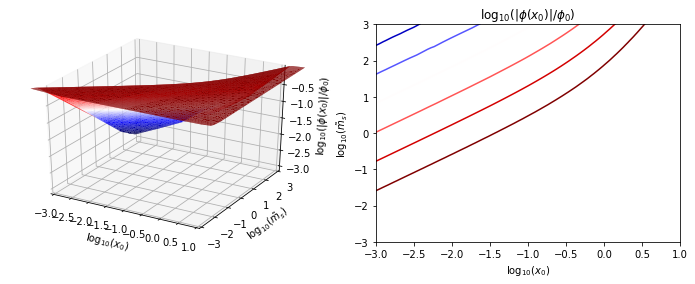

In [49]:
# Plot of field at surface

fig = plt.figure(figsize=(12,4))

ax = fig.add_subplot(121, projection='3d')

ax.plot_trisurf( triangles,
                np.log10(abs(phi_rs_array).compressed()),  
                cmap='seismic' )

ax.set_xlabel(r'$\log_{10}(x_0)$')
ax.set_ylabel(r'$\log_{10}(\tilde{m}_s)$')
ax.set_zlabel(r'$\log_{10}(|\phi(x_0)|/\phi_0)$')

ax.set_xlim(-3,1)
ax.set_ylim(-3,3)


ax2 = fig.add_subplot(122)
ax2.tricontour( triangles,
                np.log10(abs(phi_rs_array).compressed()),  
                cmap='seismic' )

ax2.set_xlabel(r'$\log_{10}(x_0)$')
ax2.set_ylabel(r'$\log_{10}(\tilde{m}_s)$')
ax2.set_title(r'$\log_{10}(|\phi(x_0)|/\phi_0)$')

ax2.set_xlim(-3,1)
ax2.set_ylim(-3,3)

(-3, 3)

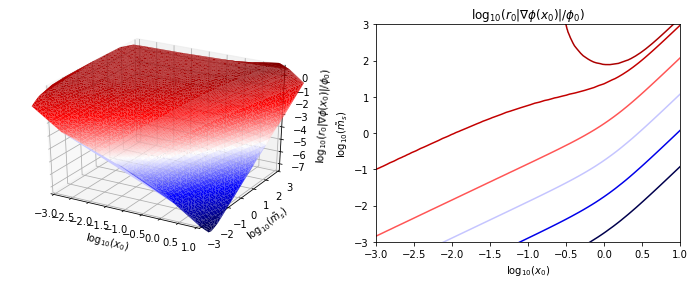

In [50]:
fig = plt.figure(figsize=(12,4))
ax = fig.add_subplot(121, projection='3d')

ax.plot_trisurf( triangles,
                np.log10(abs(grad_rs_array).compressed()),  
                cmap='seismic' )

ax.set_xlabel(r'$\log_{10}(x_0)$')
ax.set_ylabel(r'$\log_{10}(\tilde{m}_s)$')
ax.set_zlabel(r'$\log_{10}(r_0|\nabla\phi(x_0)|/\phi_0)$')

ax.set_xlim(-3,1)
ax.set_ylim(-3,3)


levels = np.array([ -4., -3., -2., -1., -.1, .1, .5, 1., 1.5, 2. ])

ax2 = fig.add_subplot(122)
ax2.tricontour( triangles,
                np.log10(abs(grad_rs_array).compressed()),  
                cmap='seismic', levels=levels )

ax2.set_xlabel(r'$\log_{10}(x_0)$')
ax2.set_ylabel(r'$\log_{10}(\tilde{m}_s)$')
ax2.set_title(r'$\log_{10}(r_0|\nabla\phi(x_0)|/\phi_0)$')

ax2.set_xlim(-3,1)
ax2.set_ylim(-3,3)

(-3, 3)

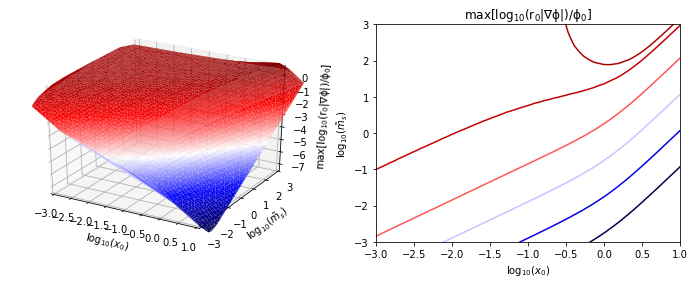

In [51]:
fig = plt.figure(figsize=(12,4))
ax = fig.add_subplot(121, projection='3d')

ax.plot_trisurf( triangles,
                np.log10(abs(max_grad_array).compressed()),  
                cmap='seismic' )

ax.set_xlabel(r'$\log_{10}(x_0)$')
ax.set_ylabel(r'$\log_{10}(\tilde{m}_s)$')
ax.set_zlabel(r'$\rm{max}[\log_{10}(r_0|\nabla\phi|)/\phi_0]$')

ax.set_xlim(-3,1)
ax.set_ylim(-3,3)

ax2 = fig.add_subplot(122)
ax2.tricontour( triangles,
                np.log10(abs(max_grad_array).compressed()),  
                cmap='seismic', levels=levels )
ax2.set_xlabel(r'$\log_{10}(x_0)$')
ax2.set_ylabel(r'$\log_{10}(\tilde{m}_s)$')
ax2.set_title(r'$\rm{max}[\log_{10}(r_0|\nabla\phi|)/\phi_0]$')

ax2.set_xlim(-3,1)
ax2.set_ylim(-3,3)

/Users/daniela/anaconda3/envs/phienics/lib/python2.7/site-packages/ipykernel_launcher.py:6: RuntimeWarning: divide by zero encountered in log10
  


(-3, 3)

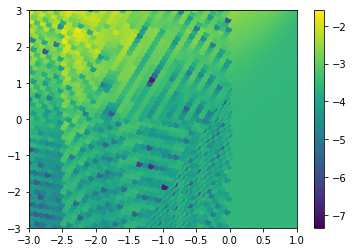

In [52]:
# Comparison of Derrick's theorem terms: should be equal

sm = np.sqrt( derrick1_array**2 + derrick2_array**2 )
rel_diff = abs( derrick1_array - derrick2_array ) / sm

cbar = plt.scatter( log_x0, log_ms, c=np.log10(rel_diff) )
plt.colorbar(cbar)

plt.xlim(-3,1)
plt.ylim(-3,3)

(-3, 3)

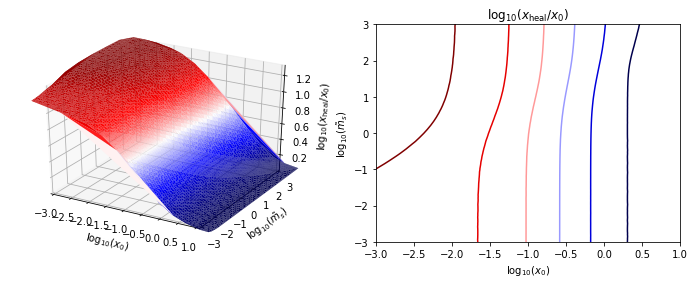

In [53]:
# Plot of healing length in units of source radius

fig = plt.figure(figsize=(12,4))
ax = fig.add_subplot(121, projection='3d')

ax.plot_trisurf( triangles,
                np.log10(np.abs(healing_array.compressed())),  
                cmap='seismic' )

ax.set_xlabel(r'$\log_{10}(x_0)$')
ax.set_ylabel(r'$\log_{10}(\tilde{m}_s)$')
ax.set_zlabel(r'$\log_{10}(x_{\rm heal}/x_0)$')

ax.set_xlim(-3,1)
ax.set_ylim(-3,3)


ax2 = fig.add_subplot(122)
ax2.tricontour( triangles,
                np.log10(np.abs(healing_array.compressed())),   
                cmap='seismic' )

ax2.set_xlabel(r'$\log_{10}(x_0)$')
ax2.set_ylabel(r'$\log_{10}(\tilde{m}_s)$')
ax2.set_title(r'$\log_{10}(x_{\rm heal}/x_0)$')

ax2.set_xlim(-3,1)
ax2.set_ylim(-3,3)

(-3, 3)

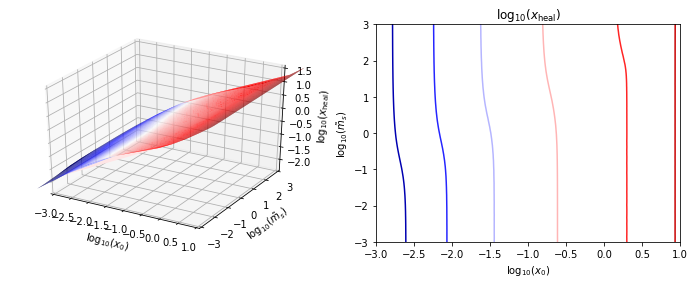

In [54]:
# Plot of healing length in units of 1/mu

fig = plt.figure(figsize=(12,4))
ax = fig.add_subplot(121, projection='3d')

ax.plot_trisurf( triangles,
                np.log10(np.abs(Healing_array.compressed())),  
                cmap='seismic' )

ax.set_xlabel(r'$\log_{10}(x_0)$')
ax.set_ylabel(r'$\log_{10}(\tilde{m}_s)$')
ax.set_zlabel(r'$\log_{10}(x_{\rm heal})$')

ax.set_xlim(-3,1)
ax.set_ylim(-3,3)


ax2 = fig.add_subplot(122)
ax2.tricontour( triangles,
                np.log10(np.abs(Healing_array.compressed())),   
                cmap='seismic' )
ax2.set_xlabel(r'$\log_{10}(x_0)$')
ax2.set_ylabel(r'$\log_{10}(\tilde{m}_s)$')
ax2.set_title(r'$\log_{10}(x_{\rm heal})$')

ax2.set_xlim(-3,1)
ax2.set_ylim(-3,3)

(-3, 3)

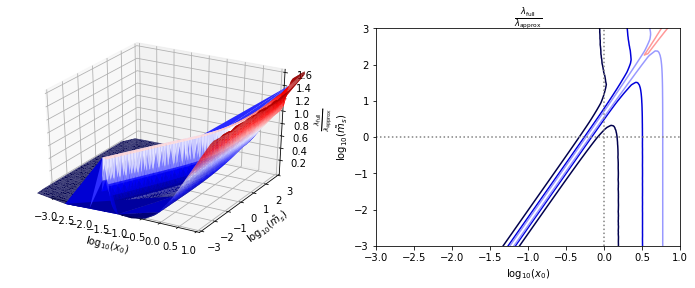

In [55]:
# Plot of scalar charge ratio

fig = plt.figure(figsize=(12,4))
ax = fig.add_subplot(121, projection='3d')

log_ratio = np.log10(np.abs(newcharges_array.compressed())) - \
        np.log10(np.abs(oldcharges_array.compressed()))

ax.plot_trisurf( triangles,
                log_ratio,  
                cmap='seismic' )

ax.set_xlabel(r'$\log_{10}(x_0)$')
ax.set_ylabel(r'$\log_{10}(\tilde{m}_s)$')
ax.set_zlabel(r'$\frac{\lambda_{\rm full}}{\lambda_{\rm approx}}$')

ax.set_xlim(-3,1)
ax.set_ylim(-3,3)


ax2 = fig.add_subplot(122)
ax2.tricontour( triangles,
                log_ratio,   
                cmap='seismic' )
ax2.set_xlabel(r'$\log_{10}(x_0)$')
ax2.set_ylabel(r'$\log_{10}(\tilde{m}_s)$')
ax2.set_title(r'$\frac{\lambda_{\rm full}}{\lambda_{\rm approx}}$')


plt.axhline(0,ls=':', color='grey')
plt.axvline(0,ls=':', color='grey')

ax2.set_xlim(-3,1)
ax2.set_ylim(-3,3)